<a href="https://colab.research.google.com/github/Tazin17/pain-intensity-prediction-from-laser-evoked-eeg-responses/blob/main/Copy_of_v8_pipleine_of_exp8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
from google.colab import drive

# Try to unmount if it's already mounted or partially mounted
try:
  drive.flush_and_unmount()
  print('Drive unmounted.')
except ValueError:
  pass # Drive was not mounted, nothing to unmount

# Ensure the mount point is clean
if os.path.isdir('/content/drive'):
  # Remove all contents of the directory, but not the directory itself
  # This avoids issues if the directory is still seen as a mount point
  for item in os.listdir('/content/drive'):
    item_path = os.path.join('/content/drive', item)
    if os.path.isfile(item_path):
      os.remove(item_path)
    elif os.path.isdir(item_path):
      import shutil
      shutil.rmtree(item_path)
  print('Cleared /content/drive directory.')
else:
  # If the directory doesn't exist, create it
  os.makedirs('/content/drive', exist_ok=True)
  print('Created /content/drive directory.')

# Attempt to mount again
drive.mount('/content/drive', force_remount=True)

Drive unmounted.
Created /content/drive directory.
Mounted at /content/drive


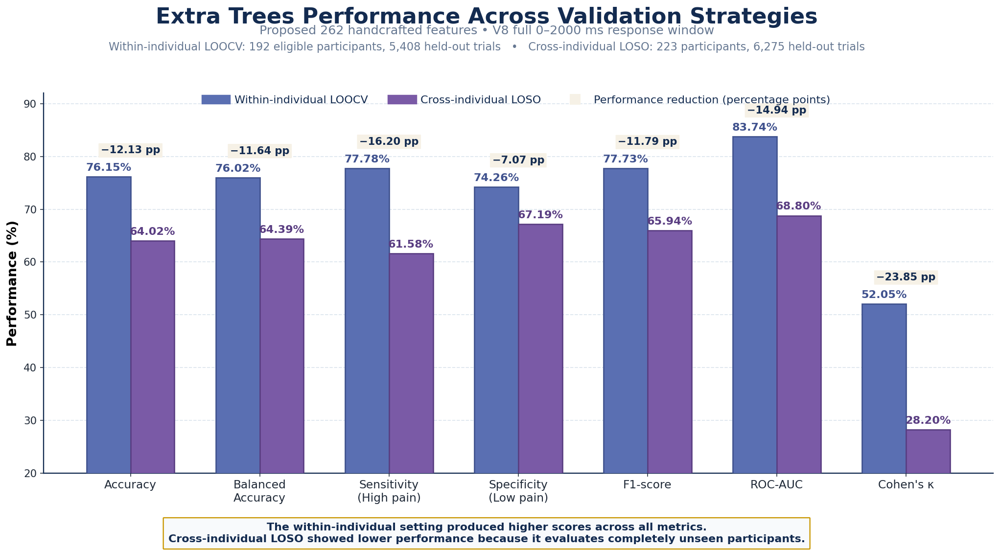

Saved to:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/THESIS_PUBLICATION_FIGURES/v8_extratrees_within_vs_cross_comparison.png

Performance drops (within - cross):
Accuracy                : 12.13 pp
Balanced
Accuracy       : 11.64 pp
Sensitivity
(High pain) : 16.20 pp
Specificity
(Low pain)  : 7.07 pp
F1-score                : 11.79 pp
ROC-AUC                 : 14.94 pp
Cohen's κ               : 23.85 pp


In [ ]:
# ============================================================
# PUBLICATION-LEVEL RESULT COMPARISON FIGURE
# V8 Extra Trees: Within-individual LOOCV vs Cross-individual LOSO
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# ------------------------------------------------------------
# Save directory
# ------------------------------------------------------------

SAVE_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252/"
    "THESIS_PUBLICATION_FIGURES"
)

os.makedirs(SAVE_DIR, exist_ok=True)

OUTPUT_PATH = os.path.join(
    SAVE_DIR,
    "v8_extratrees_within_vs_cross_comparison.png"
)

# ------------------------------------------------------------
# Results
# ------------------------------------------------------------

metrics = [
    "Accuracy",
    "Balanced\nAccuracy",
    "Sensitivity\n(High pain)",
    "Specificity\n(Low pain)",
    "F1-score",
    "ROC-AUC",
    "Cohen's κ"
]

# Within-individual LOOCV (192 subjects, 5,408 trials)
within = np.array([
    76.1464,   # accuracy
    76.0229,   # balanced accuracy
    77.7816,   # sensitivity / recall
    74.2641,   # specificity
    77.7279,   # f1-score
    83.7358,   # roc_auc
    52.0512    # cohen_kappa
])

# Cross-individual LOSO (223 subjects, 6,275 trials)
cross = np.array([
    64.0159,   # accuracy
    64.3851,   # balanced accuracy
    61.5775,   # sensitivity / recall
    67.1927,   # specificity
    65.9427,   # f1-score
    68.7958,   # roc_auc
    28.2049    # cohen_kappa
])

# Difference: within - cross
delta = within - cross

# ------------------------------------------------------------
# Premium theme colors
# ------------------------------------------------------------

NAVY = "#132B50"
SUBTITLE = "#667892"
GRID = "#D9E2EC"
BG = "white"

WITHIN_FILL = "#5A6FB2"      # premium muted indigo
WITHIN_EDGE = "#40528E"

CROSS_FILL = "#7A5AA6"       # premium dark lavender/purple
CROSS_EDGE = "#5A3E82"

ACCENT = "#C99700"           # gold accent
DELTA_BOX = "#F6F1E6"
FOOT_BG = "#F8FAFC"

# ------------------------------------------------------------
# Matplotlib style
# ------------------------------------------------------------

plt.rcParams.update({
    "font.family": "DejaVu Sans",
    "font.size": 11,
    "axes.edgecolor": NAVY,
    "axes.linewidth": 1.2,
    "xtick.color": "#1F2937",
    "ytick.color": "#1F2937",
    "text.color": NAVY,
    "figure.dpi": 140,
    "savefig.dpi": 300
})

# ------------------------------------------------------------
# Figure
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(15.4, 8.4),
    facecolor=BG
)

ax.set_facecolor(BG)

x = np.arange(len(metrics))
width = 0.34

bars1 = ax.bar(
    x - width/2,
    within,
    width=width,
    color=WITHIN_FILL,
    edgecolor=WITHIN_EDGE,
    linewidth=1.4,
    label="Within-individual LOOCV",
    zorder=3
)

bars2 = ax.bar(
    x + width/2,
    cross,
    width=width,
    color=CROSS_FILL,
    edgecolor=CROSS_EDGE,
    linewidth=1.4,
    label="Cross-individual LOSO",
    zorder=3
)

# ------------------------------------------------------------
# Value labels
# ------------------------------------------------------------

for b in bars1:
    h = b.get_height()
    ax.text(
        b.get_x() + b.get_width()/2,
        h + 0.75,
        f"{h:.2f}%",
        ha="center",
        va="bottom",
        fontsize=11.5,
        fontweight="bold",
        color=WITHIN_EDGE
    )

for b in bars2:
    h = b.get_height()
    ax.text(
        b.get_x() + b.get_width()/2,
        h + 0.75,
        f"{h:.2f}%",
        ha="center",
        va="bottom",
        fontsize=11.5,
        fontweight="bold",
        color=CROSS_EDGE
    )

# ------------------------------------------------------------
# Delta annotations
# ------------------------------------------------------------

for i in range(len(metrics)):
    y_top = max(within[i], cross[i]) + 5.0

    ax.text(
        x[i],
        y_top,
        f"−{delta[i]:.2f} pp",
        ha="center",
        va="center",
        fontsize=10.8,
        fontweight="bold",
        color=NAVY,
        bbox=dict(
            boxstyle="round,pad=0.22,rounding_size=0.05",
            facecolor=DELTA_BOX,
            edgecolor="none"
        )
    )

# ------------------------------------------------------------
# Axes formatting
# ------------------------------------------------------------

ax.set_xticks(x)
ax.set_xticklabels(metrics, fontsize=12)

ax.set_ylabel(
    "Performance (%)",
    fontsize=14,
    fontweight="bold"
)

ax.set_ylim(20, 92)

ax.grid(
    axis="y",
    linestyle="--",
    linewidth=0.9,
    color=GRID,
    alpha=0.9,
    zorder=0
)

ax.set_axisbelow(True)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# ------------------------------------------------------------
# Title and subtitle
# ------------------------------------------------------------

fig.suptitle(
    "Extra Trees Performance Across Validation Strategies",
    fontsize=23,
    fontweight="bold",
    color=NAVY,
    y=0.97
)

fig.text(
    0.5,
    0.928,
    "Proposed 262 handcrafted features • V8 full 0–2000 ms response window",
    ha="center",
    va="center",
    fontsize=13,
    color=SUBTITLE
)

fig.text(
    0.5,
    0.900,
    "Within-individual LOOCV: 192 eligible participants, 5,408 held-out trials   •   "
    "Cross-individual LOSO: 223 participants, 6,275 held-out trials",
    ha="center",
    va="center",
    fontsize=11.6,
    color=SUBTITLE
)

# ------------------------------------------------------------
# Legend
# ------------------------------------------------------------

legend_handles = [
    Line2D(
        [0], [0],
        color=WITHIN_FILL,
        lw=10,
        label="Within-individual LOOCV"
    ),
    Line2D(
        [0], [0],
        color=CROSS_FILL,
        lw=10,
        label="Cross-individual LOSO"
    ),
    Line2D(
        [0], [0],
        color=ACCENT,
        lw=0,
        marker="s",
        markersize=11,
        markerfacecolor=DELTA_BOX,
        markeredgewidth=0,
        label="Performance reduction (percentage points)"
    )
]

ax.legend(
    handles=legend_handles,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.02),
    ncol=3,
    frameon=False,
    fontsize=11.5,
    columnspacing=2.2,
    handlelength=1.8
)

# ------------------------------------------------------------
# Footer interpretation
# ------------------------------------------------------------

footer = (
    "The within-individual setting produced higher scores across all metrics.\n"
    "Cross-individual LOSO showed lower performance because it evaluates completely unseen participants."
)

fig.text(
    0.5,
    0.055,
    footer,
    ha="center",
    va="center",
    multialignment="center",
    linespacing=1.25,
    fontsize=11.4,
    fontweight="bold",
    color=NAVY,
    bbox=dict(
        boxstyle="round,pad=0.45,rounding_size=0.05",
        facecolor=FOOT_BG,
        edgecolor=ACCENT,
        linewidth=1.2
    )
)
# ------------------------------------------------------------
# Layout and save
# ------------------------------------------------------------

plt.subplots_adjust(
    top=0.82,
    bottom=0.16,
    left=0.08,
    right=0.98
)

plt.savefig(
    OUTPUT_PATH,
    dpi=300,
    bbox_inches="tight",
    facecolor=BG
)

plt.show()

print("Saved to:")
print(OUTPUT_PATH)

print("\nPerformance drops (within - cross):")
for m, d in zip(metrics, delta):
    print(f"{m:<24}: {d:.2f} pp")

In [ ]:
# ============================================================
# CELL 0 — LOAD V8 262-DIMENSIONAL HANDCRAFTED FEATURES
# ============================================================

import os
import numpy as np
import pandas as pd

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

X_HANDCRAFTED_PATH = os.path.join(
    V8_DIR,
    "handcrafted_features",
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

Y_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "y_v8_binary_6275.npy"
)

GROUPS_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "groups_v8_subject_6275.npy"
)


for path in [
    X_HANDCRAFTED_PATH,
    Y_PATH,
    GROUPS_PATH,
]:
    if not os.path.exists(path):
        raise FileNotFoundError(
            f"Required file not found:\n{path}"
        )


# Memory-mapped loading keeps RAM usage low.
X_handcrafted = np.load(
    X_HANDCRAFTED_PATH,
    mmap_mode="r"
)

y = np.load(
    Y_PATH
).astype(
    np.int8
).ravel()

groups_raw = np.load(
    GROUPS_PATH,
    allow_pickle=True
).ravel()


def clean_subject_id(value):

    if isinstance(value, bytes):
        value = value.decode("utf-8")

    if (
        isinstance(
            value,
            (float, np.floating)
        )
        and
        float(value).is_integer()
    ):
        return str(int(value))

    return str(value).strip()


groups = np.asarray(
    [
        clean_subject_id(value)
        for value in groups_raw
    ],
    dtype=str
)


# ============================================================
# Validation
# ============================================================

assert X_handcrafted.shape == (
    6275,
    262
)

assert y.shape == (
    6275,
)

assert groups.shape == (
    6275,
)

assert len(
    np.unique(groups)
) == 223

assert np.isfinite(
    X_handcrafted
).all()

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array(
        [
            2725,
            3550
        ]
    )
)


print("=" * 75)
print("V8 DATA LOADED")
print("=" * 75)

print(
    "Feature matrix:",
    X_handcrafted.shape
)

print(
    "Participants:",
    len(np.unique(groups))
)

print(
    "Class counts [low, high]:",
    np.bincount(y).tolist()
)

print(
    "Source matrix: X_handcrafted"
)

print(
    "Participant-wise feature standardization: None"
)

V8 DATA LOADED
Feature matrix: (6275, 262)
Participants: 223
Class counts [low, high]: [2725, 3550]
Source matrix: X_handcrafted
Participant-wise feature standardization: None


In [ ]:
# ============================================================
# CELL 1 — LOGISTIC REGRESSION CONFIGURATION
# ============================================================

import gc
import json
import time
import warnings

import numpy as np
import pandas as pd

from IPython.display import display

from joblib import (
    Parallel,
    delayed
)

from threadpoolctl import (
    threadpool_limits
)

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    confusion_matrix,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
)

warnings.filterwarnings("ignore")


# ============================================================
# Output paths
# ============================================================

LR_RESULT_DIR = os.path.join(
    V8_DIR,
    "V8_FAST_LOGISTIC_REGRESSION_COMPARISON"
)

WITHIN_LR_DIR = os.path.join(
    LR_RESULT_DIR,
    "WITHIN_INDIVIDUAL_LOOCV_STRICT192"
)

CROSS_LR_DIR = os.path.join(
    LR_RESULT_DIR,
    "CROSS_INDIVIDUAL_LOSO_STRICT223"
)

WITHIN_CHECKPOINT_DIR = os.path.join(
    WITHIN_LR_DIR,
    "subject_checkpoints"
)

CROSS_CHECKPOINT_DIR = os.path.join(
    CROSS_LR_DIR,
    "subject_checkpoints"
)

for directory in [
    LR_RESULT_DIR,
    WITHIN_LR_DIR,
    CROSS_LR_DIR,
    WITHIN_CHECKPOINT_DIR,
    CROSS_CHECKPOINT_DIR,
]:
    os.makedirs(
        directory,
        exist_ok=True
    )


# ============================================================
# Fast parallel configuration
# ============================================================

CPU_COUNT = (
    os.cpu_count()
    if os.cpu_count() is not None
    else 2
)

N_JOBS_WITHIN = min(
    4,
    max(
        1,
        CPU_COUNT - 1
    )
)

# Cross-individual folds use much larger training matrices,
# so two parallel workers are safer for Colab RAM.
N_JOBS_CROSS = min(
    2,
    max(
        1,
        CPU_COUNT - 1
    )
)

WITHIN_BATCH_SIZE = 16
CROSS_BATCH_SIZE = 8


# ============================================================
# Fixed Logistic Regression configuration
#
# This is intentionally not LogisticRegressionCV.
# It is a fast, conventional linear baseline.
# ============================================================

LR_PARAMETERS = {
    "penalty": "l2",
    "C": 1.0,
    "solver": "liblinear",
    "class_weight": "balanced",
    "max_iter": 2000,
    "tol": 1e-4,
    "random_state": 42,
}


def make_logistic_pipeline():

    return Pipeline(
        steps=[
            (
                "scaler",
                StandardScaler()
            ),
            (
                "classifier",
                LogisticRegression(
                    **LR_PARAMETERS
                )
            ),
        ]
    )


# ============================================================
# Atomic CSV saving
# ============================================================

def atomic_save_csv(
    dataframe,
    final_path,
):

    temporary_path = (
        final_path
        +
        ".temporary"
    )

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        final_path
    )


# ============================================================
# Binary metrics
# ============================================================

def safe_divide(
    numerator,
    denominator,
):

    if denominator == 0:
        return np.nan

    return float(
        numerator
        /
        denominator
    )


def calculate_binary_metrics(
    y_true,
    y_pred,
    y_score,
):

    y_true = np.asarray(
        y_true,
        dtype=np.int8
    ).ravel()

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    ).ravel()

    y_score = np.asarray(
        y_score,
        dtype=float
    ).ravel()

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()

    accuracy = safe_divide(
        tp + tn,
        tp + tn + fp + fn
    )

    sensitivity = safe_divide(
        tp,
        tp + fn
    )

    specificity = safe_divide(
        tn,
        tn + fp
    )

    precision = safe_divide(
        tp,
        tp + fp
    )

    f1 = safe_divide(
        2 * tp,
        2 * tp + fp + fn
    )

    if np.unique(
        y_true
    ).size == 2:

        balanced_accuracy = (
            sensitivity
            +
            specificity
        ) / 2.0

        roc_auc = roc_auc_score(
            y_true,
            y_score
        )

        pr_auc = average_precision_score(
            y_true,
            y_score
        )

    else:

        balanced_accuracy = np.nan
        roc_auc = np.nan
        pr_auc = np.nan

    try:

        mcc = matthews_corrcoef(
            y_true,
            y_pred
        )

    except Exception:

        mcc = np.nan

    try:

        kappa = cohen_kappa_score(
            y_true,
            y_pred
        )

        if not np.isfinite(kappa):
            kappa = np.nan

    except Exception:

        kappa = np.nan

    return {
        "accuracy":
            accuracy,

        "balanced_accuracy":
            balanced_accuracy,

        "precision":
            precision,

        "recall":
            sensitivity,

        "sensitivity":
            sensitivity,

        "specificity":
            specificity,

        "f1_score":
            f1,

        "roc_auc":
            roc_auc,

        "pr_auc":
            pr_auc,

        "mcc":
            mcc,

        "cohen_kappa":
            kappa,

        "true_negative":
            int(tn),

        "false_positive":
            int(fp),

        "false_negative":
            int(fn),

        "true_positive":
            int(tp),

        "support_low":
            int(
                np.sum(
                    y_true == 0
                )
            ),

        "support_high":
            int(
                np.sum(
                    y_true == 1
                )
            ),
    }


def get_positive_probability(
    fitted_pipeline,
    X_test,
):

    classifier = (
        fitted_pipeline
        .named_steps[
            "classifier"
        ]
    )

    probabilities = (
        fitted_pipeline
        .predict_proba(
            X_test
        )
    )

    positive_positions = np.flatnonzero(
        classifier.classes_ == 1
    )

    if positive_positions.size != 1:

        raise RuntimeError(
            "Positive class 1 was not found."
        )

    return probabilities[
        :,
        int(
            positive_positions[0]
        )
    ]


print("=" * 75)
print("LOGISTIC REGRESSION SETUP READY")
print("=" * 75)

print(
    "Within parallel workers:",
    N_JOBS_WITHIN
)

print(
    "Cross parallel workers:",
    N_JOBS_CROSS
)

print(
    "Parameters:",
    LR_PARAMETERS
)

LOGISTIC REGRESSION SETUP READY
Within parallel workers: 4
Cross parallel workers: 2
Parameters: {'penalty': 'l2', 'C': 1.0, 'solver': 'liblinear', 'class_weight': 'balanced', 'max_iter': 2000, 'tol': 0.0001, 'random_state': 42}


In [ ]:
# ============================================================
# CELL 2 — STRICT WITHIN-INDIVIDUAL ELIGIBILITY
#
# Requirement:
# At least 2 low-pain and 2 high-pain trials.
# ============================================================

participant_class_counts = (
    pd.DataFrame(
        {
            "subject_id":
                groups,

            "pain_label":
                y,
        }
    )
    .groupby(
        [
            "subject_id",
            "pain_label",
        ]
    )
    .size()
    .unstack(
        fill_value=0
    )
    .reindex(
        columns=[
            0,
            1
        ],
        fill_value=0
    )
)


eligible_subjects_within = (
    participant_class_counts.index[
        (
            participant_class_counts[0]
            >= 2
        )
        &
        (
            participant_class_counts[1]
            >= 2
        )
    ]
    .astype(str)
    .to_numpy()
)

eligible_subjects_within = np.sort(
    eligible_subjects_within
)

eligible_within_mask = np.isin(
    groups,
    eligible_subjects_within
)


# ============================================================
# Required checks
# ============================================================

assert len(
    eligible_subjects_within
) == 192

assert int(
    eligible_within_mask.sum()
) == 5408

assert np.array_equal(
    np.bincount(
        y[
            eligible_within_mask
        ],
        minlength=2
    ),
    np.array(
        [
            2514,
            2894
        ]
    )
)


print("=" * 75)
print("STRICT WITHIN-INDIVIDUAL PARTICIPANTS")
print("=" * 75)

print(
    "Participants:",
    len(
        eligible_subjects_within
    )
)

print(
    "Trials:",
    int(
        eligible_within_mask.sum()
    )
)

print(
    "Class counts [low, high]:",
    np.bincount(
        y[
            eligible_within_mask
        ]
    ).tolist()
)

STRICT WITHIN-INDIVIDUAL PARTICIPANTS
Participants: 192
Trials: 5408
Class counts [low, high]: [2514, 2894]


In [ ]:
# ============================================================
# CELL 3 — WITHIN-INDIVIDUAL SUBJECT WORKER
#
# For each held-out trial:
#   1. Fit StandardScaler on remaining trials.
#   2. Transform training and held-out trial.
#   3. Fit Logistic Regression.
#   4. Predict the held-out trial.
# ============================================================

def run_within_subject_logistic(
    subject_id,
):

    subject_id = str(
        subject_id
    )

    checkpoint_path = os.path.join(
        WITHIN_CHECKPOINT_DIR,
        (
            f"{subject_id}"
            "__predictions.csv"
        )
    )

    subject_indices = np.flatnonzero(
        groups == subject_id
    )

    expected_trials = len(
        subject_indices
    )


    # ========================================================
    # Resume valid checkpoint
    # ========================================================

    if os.path.exists(
        checkpoint_path
    ):

        try:

            checkpoint_df = pd.read_csv(
                checkpoint_path,
                dtype={
                    "subject_id": str
                }
            )

            checkpoint_valid = (
                len(checkpoint_df)
                ==
                expected_trials
                and
                checkpoint_df[
                    "original_row_index"
                ].nunique()
                ==
                expected_trials
            )

            if checkpoint_valid:
                return checkpoint_df

        except Exception:
            pass


    # ========================================================
    # Participant data
    # ========================================================

    X_subject = np.asarray(
        X_handcrafted[
            subject_indices
        ],
        dtype=np.float64
    )

    y_subject = y[
        subject_indices
    ]

    assert np.sum(
        y_subject == 0
    ) >= 2

    assert np.sum(
        y_subject == 1
    ) >= 2


    participant_rows = []


    # ========================================================
    # Trial-level LOOCV
    # ========================================================

    for test_local_index in range(
        expected_trials
    ):

        training_mask = np.ones(
            expected_trials,
            dtype=bool
        )

        training_mask[
            test_local_index
        ] = False

        X_train = X_subject[
            training_mask
        ]

        y_train = y_subject[
            training_mask
        ]

        X_test = X_subject[
            test_local_index:
            test_local_index + 1
        ]

        y_test = int(
            y_subject[
                test_local_index
            ]
        )


        if np.unique(
            y_train
        ).size != 2:

            raise RuntimeError(
                f"{subject_id}, trial "
                f"{test_local_index}: "
                "training fold has one class."
            )


        pipeline = make_logistic_pipeline()


        # Prevent each worker from creating additional
        # hidden BLAS threads.
        with threadpool_limits(
            limits=1
        ):

            pipeline.fit(
                X_train,
                y_train
            )

            prediction = int(
                pipeline.predict(
                    X_test
                )[0]
            )

            probability_high = float(
                get_positive_probability(
                    pipeline,
                    X_test
                )[0]
            )


        classifier = (
            pipeline
            .named_steps[
                "classifier"
            ]
        )

        global_test_index = int(
            subject_indices[
                test_local_index
            ]
        )


        participant_rows.append(
            {
                "original_row_index":
                    global_test_index,

                "subject_id":
                    subject_id,

                "trial_index_within_subject":
                    int(
                        test_local_index
                    ),

                "y_true":
                    y_test,

                "y_pred":
                    prediction,

                "y_score":
                    probability_high,

                "correct":
                    int(
                        prediction
                        ==
                        y_test
                    ),

                "n_training_trials":
                    int(
                        len(
                            y_train
                        )
                    ),

                "n_training_low":
                    int(
                        np.sum(
                            y_train == 0
                        )
                    ),

                "n_training_high":
                    int(
                        np.sum(
                            y_train == 1
                        )
                    ),

                "iterations":
                    int(
                        classifier
                        .n_iter_[0]
                    ),
            }
        )


    participant_df = pd.DataFrame(
        participant_rows
    )

    atomic_save_csv(
        participant_df,
        checkpoint_path
    )

    return participant_df


print(
    "Within-individual worker is ready."
)

Within-individual worker is ready.


In [ ]:
# ============================================================
# CELL 4 — RUN 192-PARTICIPANT WITHIN-INDIVIDUAL LOOCV
# ============================================================

within_start_time = time.perf_counter()

within_prediction_frames = []


print("\n" + "=" * 78)
print("LOGISTIC REGRESSION WITHIN-INDIVIDUAL LOOCV")
print("=" * 78)


for batch_start in range(
    0,
    len(
        eligible_subjects_within
    ),
    WITHIN_BATCH_SIZE
):

    batch_stop = min(
        batch_start
        +
        WITHIN_BATCH_SIZE,

        len(
            eligible_subjects_within
        )
    )

    subject_batch = (
        eligible_subjects_within[
            batch_start:
            batch_stop
        ]
    )


    batch_results = Parallel(
        n_jobs=N_JOBS_WITHIN,
        backend="loky",
        batch_size=1,
    )(
        delayed(
            run_within_subject_logistic
        )(
            subject_id
        )
        for subject_id
        in subject_batch
    )


    within_prediction_frames.extend(
        batch_results
    )


    print(
        f"Completed: "
        f"{batch_stop} / "
        f"{len(eligible_subjects_within)} "
        f"participants"
    )


within_runtime_minutes = (
    time.perf_counter()
    -
    within_start_time
) / 60.0


print(
    "\nWithin-individual execution finished."
)

print(
    "Current-session runtime:",
    round(
        within_runtime_minutes,
        3
    ),
    "minutes"
)


LOGISTIC REGRESSION WITHIN-INDIVIDUAL LOOCV
Completed: 16 / 192 participants
Completed: 32 / 192 participants
Completed: 48 / 192 participants
Completed: 64 / 192 participants
Completed: 80 / 192 participants
Completed: 96 / 192 participants
Completed: 112 / 192 participants
Completed: 128 / 192 participants
Completed: 144 / 192 participants
Completed: 160 / 192 participants
Completed: 176 / 192 participants
Completed: 192 / 192 participants

Within-individual execution finished.
Current-session runtime: 0.252 minutes


In [ ]:
# ============================================================
# CELL 5 — WITHIN-INDIVIDUAL RESULTS
# ============================================================

within_checkpoint_paths = [
    os.path.join(
        WITHIN_CHECKPOINT_DIR,
        (
            f"{subject_id}"
            "__predictions.csv"
        )
    )
    for subject_id
    in eligible_subjects_within
]


missing_within_checkpoints = [
    path
    for path in within_checkpoint_paths
    if not os.path.exists(path)
]

if missing_within_checkpoints:

    raise RuntimeError(
        "Some within-individual checkpoints "
        "are missing:\n"
        +
        "\n".join(
            missing_within_checkpoints[:10]
        )
    )


within_predictions = pd.concat(
    [
        pd.read_csv(
            path,
            dtype={
                "subject_id": str
            }
        )
        for path
        in within_checkpoint_paths
    ],
    ignore_index=True
)


within_predictions = (
    within_predictions
    .sort_values(
        "original_row_index"
    )
    .reset_index(
        drop=True
    )
)


# ============================================================
# Validation
# ============================================================

assert len(
    within_predictions
) == 5408

assert (
    within_predictions[
        "subject_id"
    ].nunique()
    ==
    192
)

assert not within_predictions[
    "original_row_index"
].duplicated().any()

assert np.array_equal(
    np.sort(
        within_predictions[
            "original_row_index"
        ].to_numpy(
            dtype=int
        )
    ),
    np.flatnonzero(
        eligible_within_mask
    )
)


# ============================================================
# Participant-level results
# ============================================================

within_subject_rows = []


for subject_id, subject_df in (
    within_predictions
    .groupby(
        "subject_id",
        sort=True
    )
):

    subject_metrics = (
        calculate_binary_metrics(
            subject_df[
                "y_true"
            ],

            subject_df[
                "y_pred"
            ],

            subject_df[
                "y_score"
            ],
        )
    )

    within_subject_rows.append(
        {
            "subject_id":
                str(
                    subject_id
                ),

            "n_trials":
                int(
                    len(
                        subject_df
                    )
                ),

            **subject_metrics,
        }
    )


within_subject_results = pd.DataFrame(
    within_subject_rows
)


# ============================================================
# Pooled metrics
# ============================================================

within_pooled_metrics = (
    calculate_binary_metrics(
        within_predictions[
            "y_true"
        ],

        within_predictions[
            "y_pred"
        ],

        within_predictions[
            "y_score"
        ],
    )
)


within_summary = pd.DataFrame(
    [
        {
            "model":
                "Logistic Regression",

            "features":
                262,

            "validation":
                "Within-individual LOOCV",

            "participants":
                192,

            "trials":
                5408,

            "source_matrix":
                "X_handcrafted",

            "participant_feature_standardization":
                "None",

            "fold_scaling":
                (
                    "StandardScaler fitted "
                    "only on training trials"
                ),

            "penalty":
                LR_PARAMETERS[
                    "penalty"
                ],

            "C":
                LR_PARAMETERS[
                    "C"
                ],

            "solver":
                LR_PARAMETERS[
                    "solver"
                ],

            "class_weight":
                LR_PARAMETERS[
                    "class_weight"
                ],

            "decision_threshold":
                0.50,

            **within_pooled_metrics,

            "mean_subject_accuracy":
                within_subject_results[
                    "accuracy"
                ].mean(),

            "subject_accuracy_sd":
                within_subject_results[
                    "accuracy"
                ].std(
                    ddof=1
                ),

            "mean_solver_iterations":
                within_predictions[
                    "iterations"
                ].mean(),

            "runtime_minutes_current_session":
                within_runtime_minutes,
        }
    ]
)


# ============================================================
# Save
# ============================================================

WITHIN_PREDICTIONS_PATH = os.path.join(
    WITHIN_LR_DIR,
    (
        "LogisticRegression__Full262__"
        "WithinIndividual_LOOCV_Strict192"
        "__trial_predictions.csv"
    )
)

WITHIN_SUBJECT_RESULTS_PATH = os.path.join(
    WITHIN_LR_DIR,
    (
        "LogisticRegression__Full262__"
        "WithinIndividual_LOOCV_Strict192"
        "__subject_results.csv"
    )
)

WITHIN_SUMMARY_PATH = os.path.join(
    WITHIN_LR_DIR,
    (
        "LogisticRegression__Full262__"
        "WithinIndividual_LOOCV_Strict192"
        "__pooled_summary.csv"
    )
)


atomic_save_csv(
    within_predictions,
    WITHIN_PREDICTIONS_PATH
)

atomic_save_csv(
    within_subject_results,
    WITHIN_SUBJECT_RESULTS_PATH
)

atomic_save_csv(
    within_summary,
    WITHIN_SUMMARY_PATH
)


print("\n" + "=" * 78)
print("LOGISTIC REGRESSION WITHIN-INDIVIDUAL LOOCV")
print("=" * 78)

display(
    within_summary.T.rename(
        columns={
            0: "value"
        }
    )
)

print("\nSaved summary:")
print(WITHIN_SUMMARY_PATH)


LOGISTIC REGRESSION WITHIN-INDIVIDUAL LOOCV


,value
model,Logistic Regression
features,262
validation,Within-individual LOOCV
participants,192
trials,5408
source_matrix,X_handcrafted
participant_feature_standardization,None
fold_scaling,StandardScaler fitted only on training trials
penalty,l2
C,1.0



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_LOGISTIC_REGRESSION_COMPARISON/WITHIN_INDIVIDUAL_LOOCV_STRICT192/LogisticRegression__Full262__WithinIndividual_LOOCV_Strict192__pooled_summary.csv


In [ ]:
# ============================================================
# CELL 6 — CROSS-INDIVIDUAL LOSO WORKER
#
# Every fold:
#   222 participants train
#   1 participant tests
#
# StandardScaler is fitted only on the 222 training
# participants.
# ============================================================

all_cross_subjects = np.sort(
    np.unique(
        groups
    )
)

assert len(
    all_cross_subjects
) == 223


def run_cross_subject_logistic(
    test_subject,
):

    test_subject = str(
        test_subject
    )

    checkpoint_path = os.path.join(
        CROSS_CHECKPOINT_DIR,
        (
            f"{test_subject}"
            "__predictions.csv"
        )
    )

    test_indices = np.flatnonzero(
        groups
        ==
        test_subject
    )

    train_indices = np.flatnonzero(
        groups
        !=
        test_subject
    )


    # ========================================================
    # Resume valid checkpoint
    # ========================================================

    if os.path.exists(
        checkpoint_path
    ):

        try:

            checkpoint_df = pd.read_csv(
                checkpoint_path,
                dtype={
                    "test_subject": str
                }
            )

            checkpoint_valid = (
                len(checkpoint_df)
                ==
                len(test_indices)
                and
                checkpoint_df[
                    "original_row_index"
                ].nunique()
                ==
                len(test_indices)
            )

            if checkpoint_valid:
                return checkpoint_df

        except Exception:
            pass


    # ========================================================
    # Fold data
    # ========================================================

    X_train = np.asarray(
        X_handcrafted[
            train_indices
        ],
        dtype=np.float64
    )

    X_test = np.asarray(
        X_handcrafted[
            test_indices
        ],
        dtype=np.float64
    )

    y_train = y[
        train_indices
    ]

    y_test = y[
        test_indices
    ]


    assert np.unique(
        y_train
    ).size == 2

    assert len(
        np.unique(
            groups[
                train_indices
            ]
        )
    ) == 222


    # ========================================================
    # Training-fold-only scaling and Logistic Regression
    # ========================================================

    pipeline = make_logistic_pipeline()


    with threadpool_limits(
        limits=1
    ):

        pipeline.fit(
            X_train,
            y_train
        )

        predictions = pipeline.predict(
            X_test
        ).astype(
            np.int8
        )

        probability_high = (
            get_positive_probability(
                pipeline,
                X_test
            )
        )


    classifier = (
        pipeline
        .named_steps[
            "classifier"
        ]
    )


    fold_df = pd.DataFrame(
        {
            "original_row_index":
                test_indices,

            "test_subject":
                test_subject,

            "y_true":
                y_test,

            "y_pred":
                predictions,

            "y_score":
                probability_high,

            "correct":
                (
                    predictions
                    ==
                    y_test
                ).astype(
                    np.int8
                ),

            "n_training_subjects":
                222,

            "n_training_trials":
                int(
                    len(
                        train_indices
                    )
                ),

            "n_test_trials":
                int(
                    len(
                        test_indices
                    )
                ),

            "n_training_low":
                int(
                    np.sum(
                        y_train == 0
                    )
                ),

            "n_training_high":
                int(
                    np.sum(
                        y_train == 1
                    )
                ),

            "iterations":
                int(
                    classifier
                    .n_iter_[0]
                ),
        }
    )


    atomic_save_csv(
        fold_df,
        checkpoint_path
    )


    del X_train
    del X_test
    del pipeline

    gc.collect()

    return fold_df


print(
    "Cross-individual worker is ready."
)

print(
    "Cross participants:",
    len(
        all_cross_subjects
    )
)

Cross-individual worker is ready.
Cross participants: 223


In [ ]:
# ============================================================
# CELL 7 — RUN STRICT 223-FOLD CROSS-INDIVIDUAL LOSO
# ============================================================

cross_start_time = time.perf_counter()

cross_prediction_frames = []


print("\n" + "=" * 78)
print("LOGISTIC REGRESSION STRICT CROSS-INDIVIDUAL LOSO")
print("=" * 78)


for batch_start in range(
    0,
    len(
        all_cross_subjects
    ),
    CROSS_BATCH_SIZE
):

    batch_stop = min(
        batch_start
        +
        CROSS_BATCH_SIZE,

        len(
            all_cross_subjects
        )
    )

    subject_batch = (
        all_cross_subjects[
            batch_start:
            batch_stop
        ]
    )


    batch_results = Parallel(
        n_jobs=N_JOBS_CROSS,
        backend="loky",
        batch_size=1,
    )(
        delayed(
            run_cross_subject_logistic
        )(
            test_subject
        )
        for test_subject
        in subject_batch
    )


    cross_prediction_frames.extend(
        batch_results
    )


    print(
        f"Completed: "
        f"{batch_stop} / "
        f"{len(all_cross_subjects)} "
        f"participants"
    )


cross_runtime_minutes = (
    time.perf_counter()
    -
    cross_start_time
) / 60.0


print(
    "\nCross-individual execution finished."
)

print(
    "Current-session runtime:",
    round(
        cross_runtime_minutes,
        3
    ),
    "minutes"
)


LOGISTIC REGRESSION STRICT CROSS-INDIVIDUAL LOSO
Completed: 8 / 223 participants
Completed: 16 / 223 participants
Completed: 24 / 223 participants
Completed: 32 / 223 participants
Completed: 40 / 223 participants
Completed: 48 / 223 participants
Completed: 56 / 223 participants
Completed: 64 / 223 participants
Completed: 72 / 223 participants
Completed: 80 / 223 participants
Completed: 88 / 223 participants
Completed: 96 / 223 participants
Completed: 104 / 223 participants
Completed: 112 / 223 participants
Completed: 120 / 223 participants
Completed: 128 / 223 participants
Completed: 136 / 223 participants
Completed: 144 / 223 participants
Completed: 152 / 223 participants
Completed: 160 / 223 participants
Completed: 168 / 223 participants
Completed: 176 / 223 participants
Completed: 184 / 223 participants
Completed: 192 / 223 participants
Completed: 200 / 223 participants
Completed: 208 / 223 participants
Completed: 216 / 223 participants
Completed: 223 / 223 participants

Cross-indi

In [ ]:
# ============================================================
# CELL 8 — CROSS-INDIVIDUAL RESULTS
# ============================================================

cross_checkpoint_paths = [
    os.path.join(
        CROSS_CHECKPOINT_DIR,
        (
            f"{subject_id}"
            "__predictions.csv"
        )
    )
    for subject_id
    in all_cross_subjects
]


missing_cross_checkpoints = [
    path
    for path in cross_checkpoint_paths
    if not os.path.exists(path)
]

if missing_cross_checkpoints:

    raise RuntimeError(
        "Some cross-individual checkpoints "
        "are missing:\n"
        +
        "\n".join(
            missing_cross_checkpoints[:10]
        )
    )


cross_predictions = pd.concat(
    [
        pd.read_csv(
            path,
            dtype={
                "test_subject": str
            }
        )
        for path
        in cross_checkpoint_paths
    ],
    ignore_index=True
)


cross_predictions = (
    cross_predictions
    .sort_values(
        "original_row_index"
    )
    .reset_index(
        drop=True
    )
)


# ============================================================
# Validation
# ============================================================

assert len(
    cross_predictions
) == 6275

assert (
    cross_predictions[
        "test_subject"
    ].nunique()
    ==
    223
)

assert np.array_equal(
    cross_predictions[
        "original_row_index"
    ].to_numpy(
        dtype=int
    ),
    np.arange(
        6275
    )
)

assert np.array_equal(
    cross_predictions[
        "y_true"
    ].to_numpy(
        dtype=np.int8
    ),
    y
)


# ============================================================
# Held-out-participant metrics
# ============================================================

cross_subject_rows = []


for test_subject, subject_df in (
    cross_predictions
    .groupby(
        "test_subject",
        sort=True
    )
):

    subject_metrics = (
        calculate_binary_metrics(
            subject_df[
                "y_true"
            ],

            subject_df[
                "y_pred"
            ],

            subject_df[
                "y_score"
            ],
        )
    )

    cross_subject_rows.append(
        {
            "test_subject":
                str(
                    test_subject
                ),

            "n_test_trials":
                int(
                    len(
                        subject_df
                    )
                ),

            **subject_metrics,
        }
    )


cross_subject_results = pd.DataFrame(
    cross_subject_rows
)


# ============================================================
# Pooled cross-individual metrics
# ============================================================

cross_pooled_metrics = (
    calculate_binary_metrics(
        cross_predictions[
            "y_true"
        ],

        cross_predictions[
            "y_pred"
        ],

        cross_predictions[
            "y_score"
        ],
    )
)


cross_summary = pd.DataFrame(
    [
        {
            "model":
                "Logistic Regression",

            "features":
                262,

            "validation":
                "Strict cross-individual LOSO",

            "participants":
                223,

            "training_participants_per_fold":
                222,

            "trials":
                6275,

            "source_matrix":
                "X_handcrafted",

            "participant_feature_standardization":
                "None",

            "fold_scaling":
                (
                    "StandardScaler fitted "
                    "only on 222 training participants"
                ),

            "penalty":
                LR_PARAMETERS[
                    "penalty"
                ],

            "C":
                LR_PARAMETERS[
                    "C"
                ],

            "solver":
                LR_PARAMETERS[
                    "solver"
                ],

            "class_weight":
                LR_PARAMETERS[
                    "class_weight"
                ],

            "decision_threshold":
                0.50,

            **cross_pooled_metrics,

            "mean_subject_accuracy":
                cross_subject_results[
                    "accuracy"
                ].mean(),

            "subject_accuracy_sd":
                cross_subject_results[
                    "accuracy"
                ].std(
                    ddof=1
                ),

            "mean_solver_iterations":
                cross_predictions[
                    "iterations"
                ].mean(),

            "runtime_minutes_current_session":
                cross_runtime_minutes,
        }
    ]
)


# ============================================================
# Save
# ============================================================

CROSS_PREDICTIONS_PATH = os.path.join(
    CROSS_LR_DIR,
    (
        "LogisticRegression__Full262__"
        "CrossIndividual_LOSO_Strict223"
        "__trial_predictions.csv"
    )
)

CROSS_SUBJECT_RESULTS_PATH = os.path.join(
    CROSS_LR_DIR,
    (
        "LogisticRegression__Full262__"
        "CrossIndividual_LOSO_Strict223"
        "__subject_results.csv"
    )
)

CROSS_SUMMARY_PATH = os.path.join(
    CROSS_LR_DIR,
    (
        "LogisticRegression__Full262__"
        "CrossIndividual_LOSO_Strict223"
        "__pooled_summary.csv"
    )
)


atomic_save_csv(
    cross_predictions,
    CROSS_PREDICTIONS_PATH
)

atomic_save_csv(
    cross_subject_results,
    CROSS_SUBJECT_RESULTS_PATH
)

atomic_save_csv(
    cross_summary,
    CROSS_SUMMARY_PATH
)


print("\n" + "=" * 78)
print("LOGISTIC REGRESSION STRICT CROSS-INDIVIDUAL LOSO")
print("=" * 78)

display(
    cross_summary.T.rename(
        columns={
            0: "value"
        }
    )
)

print("\nSaved summary:")
print(CROSS_SUMMARY_PATH)


LOGISTIC REGRESSION STRICT CROSS-INDIVIDUAL LOSO


,value
model,Logistic Regression
features,262
validation,Strict cross-individual LOSO
participants,223
training_participants_per_fold,222
trials,6275
source_matrix,X_handcrafted
participant_feature_standardization,None
fold_scaling,StandardScaler fitted only on 222 training par...
penalty,l2



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_LOGISTIC_REGRESSION_COMPARISON/CROSS_INDIVIDUAL_LOSO_STRICT223/LogisticRegression__Full262__CrossIndividual_LOSO_Strict223__pooled_summary.csv


In [ ]:
# ============================================================
# CELL 0 — LOAD V8 262-DIMENSIONAL FEATURE REPRESENTATION
# ============================================================

import os
import re
import numpy as np
import pandas as pd

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

ALIGNED_DIR = os.path.join(
    V8_DIR,
    "aligned_data"
)

X_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

Y_PATH = os.path.join(
    ALIGNED_DIR,
    "y_v8_binary_6275.npy"
)

GROUPS_PATH = os.path.join(
    ALIGNED_DIR,
    "groups_v8_subject_6275.npy"
)

FEATURE_NAMES_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_names_262.csv"
)


required_paths = [
    X_PATH,
    Y_PATH,
    GROUPS_PATH,
    FEATURE_NAMES_PATH,
]

missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]

if missing_paths:

    raise FileNotFoundError(
        "Required files were not found:\n\n"
        +
        "\n".join(missing_paths)
    )


# ============================================================
# Load arrays
# ============================================================

X_handcrafted = np.load(
    X_PATH,
    mmap_mode="r"
)

y = np.load(
    Y_PATH
).astype(
    np.int8
).ravel()

groups_raw = np.load(
    GROUPS_PATH,
    allow_pickle=True
).ravel()


def clean_subject_id(value):

    if isinstance(value, bytes):
        value = value.decode("utf-8")

    if (
        isinstance(
            value,
            (float, np.floating)
        )
        and
        float(value).is_integer()
    ):
        return str(int(value))

    return str(value).strip()


groups = np.asarray(
    [
        clean_subject_id(value)
        for value in groups_raw
    ],
    dtype=str
)


feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)

if "feature_name" in feature_names_df.columns:

    feature_names = (
        feature_names_df[
            "feature_name"
        ]
        .astype(str)
        .tolist()
    )

else:

    feature_names = (
        feature_names_df
        .iloc[:, -1]
        .astype(str)
        .tolist()
    )


# ============================================================
# Validation
# ============================================================

assert X_handcrafted.shape == (
    6275,
    262
)

assert y.shape == (
    6275,
)

assert groups.shape == (
    6275,
)

assert len(feature_names) == 262

assert len(
    np.unique(groups)
) == 223

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array(
        [
            2725,
            3550
        ]
    )
)

assert np.isfinite(
    X_handcrafted
).all()


print("=" * 78)
print("V8 FEATURE DATA LOADED")
print("=" * 78)

print(
    "Feature matrix:",
    X_handcrafted.shape
)

print(
    "Participants:",
    len(np.unique(groups))
)

print(
    "Class counts [low, high]:",
    np.bincount(y).tolist()
)

print(
    "Feature names:",
    len(feature_names)
)

print(
    "Source matrix:",
    "X_handcrafted"
)

print(
    "Post-extraction participant standardization:",
    "None"
)

print("\nFirst ten feature names:")

for feature_name in feature_names[:10]:
    print(feature_name)

V8 FEATURE DATA LOADED
Feature matrix: (6275, 262)
Participants: 223
Class counts [low, high]: [2725, 3550]
Feature names: 262
Source matrix: X_handcrafted
Post-extraction participant standardization: None

First ten feature names:
Fz__early_0_200_mean
Fz__n2_180_350_mean
Fz__p2_300_600_mean
Fz__late_600_1000_mean
Fz__full_0_2000_mean
Fz__n2_amplitude
Fz__n2_latency_ms
Fz__p2_amplitude
Fz__p2_latency_ms
Fz__n2p2_peak_to_peak


In [ ]:
# ============================================================
# CELL 1 — EXTRA TREES IMPORTANCE CONFIGURATION
# ============================================================

import gc
import json
import time
import warnings

from joblib import (
    Parallel,
    delayed
)

from threadpoolctl import (
    threadpool_limits
)

from sklearn.ensemble import (
    ExtraTreesClassifier
)

warnings.filterwarnings("ignore")


# ============================================================
# Output directories
# ============================================================

IMPORTANCE_DIR = os.path.join(
    V8_DIR,
    "V8_EXTRATREES_FEATURE_CONTRIBUTION_ANALYSIS"
)

WITHIN_IMPORTANCE_DIR = os.path.join(
    IMPORTANCE_DIR,
    "WITHIN_192_PARTICIPANT_REFITS"
)

CROSS_IMPORTANCE_DIR = os.path.join(
    IMPORTANCE_DIR,
    "CROSS_223_LOSO_FOLDS"
)

WITHIN_CHECKPOINT_DIR = os.path.join(
    WITHIN_IMPORTANCE_DIR,
    "importance_checkpoints"
)

CROSS_CHECKPOINT_DIR = os.path.join(
    CROSS_IMPORTANCE_DIR,
    "importance_checkpoints"
)

FIGURE_DIR = os.path.join(
    IMPORTANCE_DIR,
    "figures"
)

TABLE_DIR = os.path.join(
    IMPORTANCE_DIR,
    "tables"
)


for directory in [
    IMPORTANCE_DIR,
    WITHIN_IMPORTANCE_DIR,
    CROSS_IMPORTANCE_DIR,
    WITHIN_CHECKPOINT_DIR,
    CROSS_CHECKPOINT_DIR,
    FIGURE_DIR,
    TABLE_DIR,
]:

    os.makedirs(
        directory,
        exist_ok=True
    )


# ============================================================
# Same Extra Trees configuration as proposed model
# ============================================================

ET_PARAMETERS = {
    "n_estimators": 150,
    "max_depth": 12,
    "min_samples_leaf": 3,
    "min_samples_split": 5,
    "max_features": "sqrt",
    "class_weight": "balanced",
    "random_state": 42,

    # One CPU thread inside each parallel worker
    "n_jobs": 1,
}


def make_extra_trees():

    return ExtraTreesClassifier(
        **ET_PARAMETERS
    )


# ============================================================
# Parallel settings
# ============================================================

CPU_COUNT = (
    os.cpu_count()
    if os.cpu_count() is not None
    else 2
)

N_JOBS_WITHIN = min(
    4,
    max(
        1,
        CPU_COUNT - 1
    )
)

N_JOBS_CROSS = min(
    2,
    max(
        1,
        CPU_COUNT - 1
    )
)

WITHIN_BATCH_SIZE = 16
CROSS_BATCH_SIZE = 8

TOP_K_VALUES = [
    30,
    60,
    90,
    120,
]


# ============================================================
# Atomic NPY saving
# ============================================================

def atomic_save_npy(
    array,
    final_path,
):

    temporary_path = (
        final_path
        +
        ".temporary"
    )

    with open(
        temporary_path,
        "wb"
    ) as file:

        np.save(
            file,
            array
        )

    os.replace(
        temporary_path,
        final_path
    )


def safe_filename(value):

    value = str(value)

    return re.sub(
        r"[^A-Za-z0-9_.-]+",
        "_",
        value
    )


print("=" * 78)
print("FEATURE-CONTRIBUTION CONFIGURATION READY")
print("=" * 78)

print(
    "Within workers:",
    N_JOBS_WITHIN
)

print(
    "Cross workers:",
    N_JOBS_CROSS
)

print(
    "Top-k values:",
    TOP_K_VALUES
)

print(
    "Extra Trees:",
    ET_PARAMETERS
)

FEATURE-CONTRIBUTION CONFIGURATION READY
Within workers: 4
Cross workers: 2
Top-k values: [30, 60, 90, 120]
Extra Trees: {'n_estimators': 150, 'max_depth': 12, 'min_samples_leaf': 3, 'min_samples_split': 5, 'max_features': 'sqrt', 'class_weight': 'balanced', 'random_state': 42, 'n_jobs': 1}


In [ ]:
# ============================================================
# CELL 2 — FEATURE METADATA
# ============================================================

V8_CHANNELS = [
    "Fz",
    "FC1",
    "FC2",
    "C3",
    "C1",
    "Cz",
    "C2",
    "C4",
    "CP1",
    "CPz",
    "CP2",
    "Pz",
]


def parse_channel(
    feature_name,
):

    if feature_name.startswith(
        "GLOBAL__"
    ):
        return "GLOBAL"

    if "__" not in feature_name:
        return "Unknown"

    return feature_name.split(
        "__",
        1
    )[0]


def parse_feature_suffix(
    feature_name,
):

    if "__" not in feature_name:
        return feature_name.lower()

    return feature_name.split(
        "__",
        1
    )[1].lower()


def determine_feature_family(
    feature_name,
):

    suffix = parse_feature_suffix(
        feature_name
    )

    # Five temporal means
    if suffix.endswith(
        "_mean"
    ):
        return "Temporal mean"

    # N2/P2 morphology
    morphology_terms = [
        "n2_amp",
        "n2_amplitude",
        "n2_latency",
        "p2_amp",
        "p2_amplitude",
        "p2_latency",
        "peak_to_peak",
    ]

    if any(
        term in suffix
        for term in morphology_terms
    ):
        return "N2/P2 morphology"

    # Frequency-domain features
    if (
        suffix.endswith("_power")
        or
        "band_power" in suffix
    ):
        return "Spectral power"

    # Hjorth features
    if "hjorth_" in suffix:
        return "Hjorth parameters"

    # Entropy and statistical features
    statistical_terms = [
        "entropy",
        "standard_deviation",
        "std",
        "skewness",
        "kurtosis",
    ]

    if any(
        term in suffix
        for term in statistical_terms
    ):
        return "Entropy/statistical"

    return "Unclassified"


def determine_extraction_type(
    feature_name,
):

    suffix = parse_feature_suffix(
        feature_name
    )

    # A mean over a fixed interval is a linear operator.
    if suffix.endswith(
        "_mean"
    ):
        return "Linear extraction operator"

    # Peak selection, latency, power, variance, entropy,
    # Hjorth ratios and higher-order statistics are nonlinear.
    return "Nonlinear extraction operator"


feature_metadata = pd.DataFrame(
    {
        "feature_index":
            np.arange(
                262,
                dtype=int
            ),

        "feature_number":
            np.arange(
                1,
                263,
                dtype=int
            ),

        "feature_name":
            feature_names,
    }
)


feature_metadata[
    "channel"
] = feature_metadata[
    "feature_name"
].map(
    parse_channel
)


feature_metadata[
    "feature_family"
] = feature_metadata[
    "feature_name"
].map(
    determine_feature_family
)


feature_metadata[
    "extraction_type"
] = feature_metadata[
    "feature_name"
].map(
    determine_extraction_type
)


# ============================================================
# Validate the classification
# ============================================================

unclassified_features = feature_metadata.loc[
    feature_metadata[
        "feature_family"
    ] == "Unclassified",
    "feature_name",
].tolist()


if unclassified_features:

    raise ValueError(
        "Some features could not be classified:\n"
        +
        "\n".join(
            unclassified_features
        )
    )


family_count_table = (
    feature_metadata
    .groupby(
        "feature_family"
    )
    .size()
    .rename(
        "feature_count"
    )
    .reset_index()
)


extraction_count_table = (
    feature_metadata
    .groupby(
        "extraction_type"
    )
    .size()
    .rename(
        "feature_count"
    )
    .reset_index()
)


# Expected composition:
#
# Temporal means:
#   5 × 12 channels + 5 global = 65
#
# Nonlinear:
#   morphology 65
#   spectral   48
#   Hjorth     36
#   statistics 48
#   total     197

linear_count = int(
    extraction_count_table.loc[
        extraction_count_table[
            "extraction_type"
        ]
        ==
        "Linear extraction operator",
        "feature_count",
    ].iloc[0]
)

nonlinear_count = int(
    extraction_count_table.loc[
        extraction_count_table[
            "extraction_type"
        ]
        ==
        "Nonlinear extraction operator",
        "feature_count",
    ].iloc[0]
)


assert linear_count == 65
assert nonlinear_count == 197
assert linear_count + nonlinear_count == 262


FEATURE_METADATA_PATH = os.path.join(
    TABLE_DIR,
    "V8_feature_metadata_262.csv"
)

FAMILY_COUNT_PATH = os.path.join(
    TABLE_DIR,
    "V8_feature_family_counts.csv"
)

EXTRACTION_COUNT_PATH = os.path.join(
    TABLE_DIR,
    "V8_linear_nonlinear_extraction_counts.csv"
)


feature_metadata.to_csv(
    FEATURE_METADATA_PATH,
    index=False
)

family_count_table.to_csv(
    FAMILY_COUNT_PATH,
    index=False
)

extraction_count_table.to_csv(
    EXTRACTION_COUNT_PATH,
    index=False
)


print("=" * 78)
print("FEATURE METADATA CREATED")
print("=" * 78)

print("\nFeature-family counts:")

display(
    family_count_table
)

print("\nExtraction-operator counts:")

display(
    extraction_count_table
)

print(
    "\nLinear extraction operators:",
    linear_count,
    f"({linear_count / 262 * 100:.2f}%)"
)

print(
    "Nonlinear extraction operators:",
    nonlinear_count,
    f"({nonlinear_count / 262 * 100:.2f}%)"
)

FEATURE METADATA CREATED

Feature-family counts:


,feature_family,feature_count
0,Entropy/statistical,48
1,Hjorth parameters,36
2,N2/P2 morphology,65
3,Spectral power,48
4,Temporal mean,65



Extraction-operator counts:


,extraction_type,feature_count
0,Linear extraction operator,65
1,Nonlinear extraction operator,197



Linear extraction operators: 65 (24.81%)
Nonlinear extraction operators: 197 (75.19%)


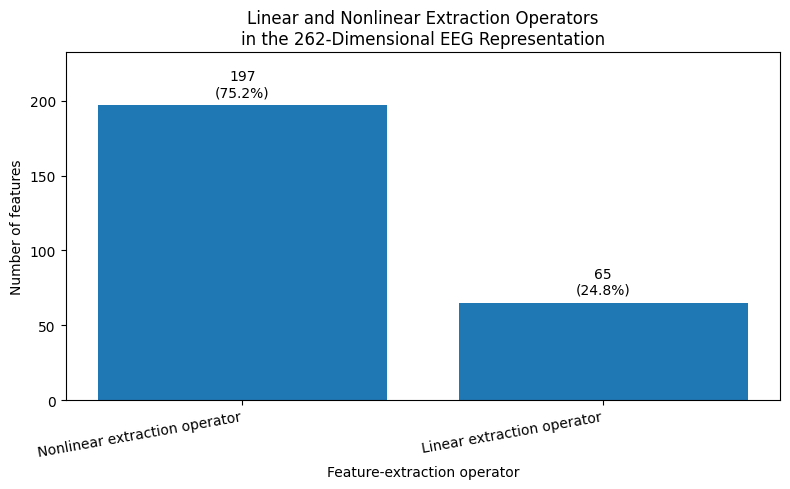

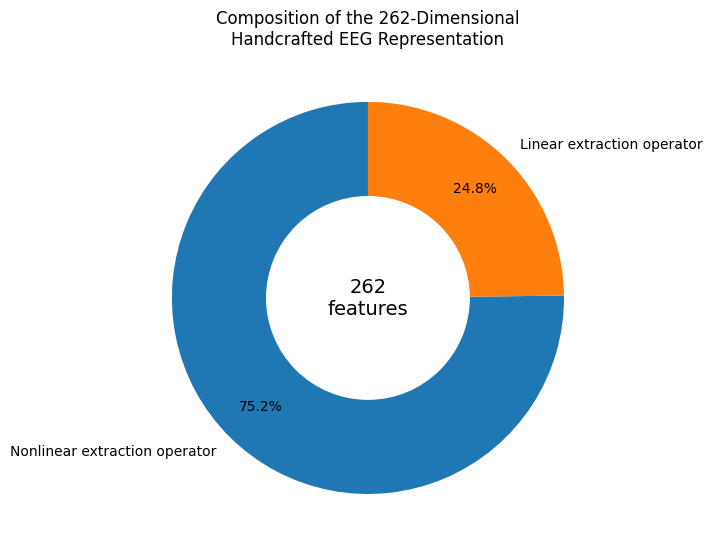

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_FEATURE_CONTRIBUTION_ANALYSIS/figures/linear_nonlinear_feature_counts_bar.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_FEATURE_CONTRIBUTION_ANALYSIS/figures/linear_nonlinear_feature_counts_donut.png


In [ ]:
# ============================================================
# CELL 3 — LINEAR VERSUS NONLINEAR FEATURE-COUNT FIGURES
# ============================================================

import matplotlib.pyplot as plt


plot_extraction_counts = (
    extraction_count_table
    .sort_values(
        "feature_count",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)


# ============================================================
# Figure 1: Bar chart
# ============================================================

plt.figure(
    figsize=(
        8,
        5
    )
)

bars = plt.bar(
    plot_extraction_counts[
        "extraction_type"
    ],
    plot_extraction_counts[
        "feature_count"
    ],
)

plt.ylabel(
    "Number of features"
)

plt.xlabel(
    "Feature-extraction operator"
)

plt.title(
    "Linear and Nonlinear Extraction Operators\n"
    "in the 262-Dimensional EEG Representation"
)

plt.ylim(
    0,
    max(
        plot_extraction_counts[
            "feature_count"
        ]
    ) * 1.18
)

for bar, count in zip(
    bars,
    plot_extraction_counts[
        "feature_count"
    ]
):

    percentage_value = (
        count
        /
        262
        *
        100
    )

    plt.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        bar.get_height()
        +
        4,

        (
            f"{int(count)}\n"
            f"({percentage_value:.1f}%)"
        ),

        ha="center",
        va="bottom",
    )


plt.xticks(
    rotation=10,
    ha="right"
)

plt.tight_layout()


LINEAR_NONLINEAR_BAR_PNG = os.path.join(
    FIGURE_DIR,
    "linear_nonlinear_feature_counts_bar.png"
)

LINEAR_NONLINEAR_BAR_PDF = os.path.join(
    FIGURE_DIR,
    "linear_nonlinear_feature_counts_bar.pdf"
)

plt.savefig(
    LINEAR_NONLINEAR_BAR_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    LINEAR_NONLINEAR_BAR_PDF,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# Figure 2: Donut chart
# ============================================================

plt.figure(
    figsize=(
        7,
        7
    )
)

wedges, texts, autotexts = plt.pie(
    plot_extraction_counts[
        "feature_count"
    ],

    labels=plot_extraction_counts[
        "extraction_type"
    ],

    autopct="%1.1f%%",
    startangle=90,
    pctdistance=0.78,
)


centre_circle = plt.Circle(
    (
        0,
        0
    ),
    0.52,
    fc="white"
)

plt.gca().add_artist(
    centre_circle
)

plt.text(
    0,
    0,
    "262\nfeatures",
    ha="center",
    va="center",
    fontsize=14,
)

plt.title(
    "Composition of the 262-Dimensional\n"
    "Handcrafted EEG Representation"
)

plt.tight_layout()


LINEAR_NONLINEAR_DONUT_PNG = os.path.join(
    FIGURE_DIR,
    "linear_nonlinear_feature_counts_donut.png"
)

LINEAR_NONLINEAR_DONUT_PDF = os.path.join(
    FIGURE_DIR,
    "linear_nonlinear_feature_counts_donut.pdf"
)

plt.savefig(
    LINEAR_NONLINEAR_DONUT_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    LINEAR_NONLINEAR_DONUT_PDF,
    bbox_inches="tight"
)

plt.show()


print("Saved:")
print(LINEAR_NONLINEAR_BAR_PNG)
print(LINEAR_NONLINEAR_DONUT_PNG)

In [ ]:
# ============================================================
# CELL 4 — STRICT WITHIN-INDIVIDUAL ELIGIBILITY
# ============================================================

participant_class_counts = (
    pd.DataFrame(
        {
            "subject_id":
                groups,

            "pain_label":
                y,
        }
    )
    .groupby(
        [
            "subject_id",
            "pain_label",
        ]
    )
    .size()
    .unstack(
        fill_value=0
    )
    .reindex(
        columns=[
            0,
            1
        ],
        fill_value=0
    )
)


within_subjects = (
    participant_class_counts.index[
        (
            participant_class_counts[0]
            >= 2
        )
        &
        (
            participant_class_counts[1]
            >= 2
        )
    ]
    .astype(str)
    .to_numpy()
)

within_subjects = np.sort(
    within_subjects
)

within_mask = np.isin(
    groups,
    within_subjects
)


assert len(
    within_subjects
) == 192

assert int(
    within_mask.sum()
) == 5408

assert np.array_equal(
    np.bincount(
        y[
            within_mask
        ],
        minlength=2
    ),
    np.array(
        [
            2514,
            2894
        ]
    )
)


cross_subjects = np.sort(
    np.unique(
        groups
    )
)

assert len(
    cross_subjects
) == 223


print("=" * 78)
print("IMPORTANCE ANALYSIS PARTICIPANTS")
print("=" * 78)

print(
    "Within-individual participants:",
    len(within_subjects)
)

print(
    "Within-individual trials:",
    int(
        within_mask.sum()
    )
)

print(
    "Cross-individual participants:",
    len(cross_subjects)
)

print(
    "Cross-individual trials:",
    len(y)
)

IMPORTANCE ANALYSIS PARTICIPANTS
Within-individual participants: 192
Within-individual trials: 5408
Cross-individual participants: 223
Cross-individual trials: 6275


In [ ]:
# ============================================================
# CELL 5 — WITHIN-PARTICIPANT IMPORTANCE WORKER
# ============================================================

def run_within_importance_subject(
    subject_id,
):

    subject_id = str(
        subject_id
    )

    checkpoint_path = os.path.join(
        WITHIN_CHECKPOINT_DIR,
        (
            safe_filename(
                subject_id
            )
            +
            "__importance.npy"
        )
    )


    # ========================================================
    # Resume checkpoint
    # ========================================================

    if os.path.exists(
        checkpoint_path
    ):

        saved_importance = np.load(
            checkpoint_path
        )

        if (
            saved_importance.shape
            ==
            (
                262,
            )
            and
            np.isfinite(
                saved_importance
            ).all()
        ):

            return {
                "subject_id":
                    subject_id,

                "importance":
                    saved_importance,
            }


    subject_indices = np.flatnonzero(
        groups == subject_id
    )

    X_subject = np.asarray(
        X_handcrafted[
            subject_indices
        ],
        dtype=np.float32
    )

    y_subject = y[
        subject_indices
    ]


    assert np.unique(
        y_subject
    ).size == 2

    assert np.sum(
        y_subject == 0
    ) >= 2

    assert np.sum(
        y_subject == 1
    ) >= 2


    classifier = make_extra_trees()


    with threadpool_limits(
        limits=1
    ):

        classifier.fit(
            X_subject,
            y_subject
        )


    importance = np.asarray(
        classifier.feature_importances_,
        dtype=np.float64
    )


    assert importance.shape == (
        262,
    )

    assert np.isfinite(
        importance
    ).all()

    assert np.isclose(
        importance.sum(),
        1.0
    )


    atomic_save_npy(
        importance,
        checkpoint_path
    )


    del X_subject
    del classifier

    gc.collect()


    return {
        "subject_id":
            subject_id,

        "importance":
            importance,
    }


print(
    "Within-participant importance worker ready."
)

Within-participant importance worker ready.


In [ ]:
# ============================================================
# CELL 6 — RUN 192 WITHIN-PARTICIPANT IMPORTANCE REFITS
# ============================================================

within_start_time = time.perf_counter()

within_importance_results = []


print("\n" + "=" * 78)
print("WITHIN-INDIVIDUAL FEATURE-CONTRIBUTION ANALYSIS")
print("=" * 78)


for batch_start in range(
    0,
    len(
        within_subjects
    ),
    WITHIN_BATCH_SIZE
):

    batch_stop = min(
        batch_start
        +
        WITHIN_BATCH_SIZE,

        len(
            within_subjects
        )
    )

    subject_batch = within_subjects[
        batch_start:
        batch_stop
    ]


    batch_results = Parallel(
        n_jobs=N_JOBS_WITHIN,
        backend="loky",
        batch_size=1,
    )(
        delayed(
            run_within_importance_subject
        )(
            subject_id
        )
        for subject_id
        in subject_batch
    )


    within_importance_results.extend(
        batch_results
    )


    print(
        f"Completed: "
        f"{batch_stop} / "
        f"{len(within_subjects)} "
        f"participants"
    )


within_runtime_minutes = (
    time.perf_counter()
    -
    within_start_time
) / 60.0


within_importance_matrix = np.vstack(
    [
        result[
            "importance"
        ]
        for result
        in within_importance_results
    ]
)


within_importance_subject_ids = np.asarray(
    [
        result[
            "subject_id"
        ]
        for result
        in within_importance_results
    ],
    dtype=str
)


assert within_importance_matrix.shape == (
    192,
    262
)


WITHIN_MATRIX_PATH = os.path.join(
    WITHIN_IMPORTANCE_DIR,
    "within_192x262_feature_importance_matrix.npy"
)

WITHIN_IDS_PATH = os.path.join(
    WITHIN_IMPORTANCE_DIR,
    "within_192_subject_ids.npy"
)

np.save(
    WITHIN_MATRIX_PATH,
    within_importance_matrix
)

np.save(
    WITHIN_IDS_PATH,
    within_importance_subject_ids
)


print("\nCompleted within-individual importance analysis.")

print(
    "Importance matrix:",
    within_importance_matrix.shape
)

print(
    "Runtime:",
    round(
        within_runtime_minutes,
        3
    ),
    "minutes"
)


WITHIN-INDIVIDUAL FEATURE-CONTRIBUTION ANALYSIS
Completed: 16 / 192 participants
Completed: 32 / 192 participants
Completed: 48 / 192 participants
Completed: 64 / 192 participants
Completed: 80 / 192 participants
Completed: 96 / 192 participants
Completed: 112 / 192 participants
Completed: 128 / 192 participants
Completed: 144 / 192 participants
Completed: 160 / 192 participants
Completed: 176 / 192 participants
Completed: 192 / 192 participants

Completed within-individual importance analysis.
Importance matrix: (192, 262)
Runtime: 0.341 minutes


In [ ]:
# ============================================================
# CELL 7 — STRICT CROSS-INDIVIDUAL IMPORTANCE WORKER
# ============================================================

def run_cross_importance_fold(
    test_subject,
):

    test_subject = str(
        test_subject
    )

    checkpoint_path = os.path.join(
        CROSS_CHECKPOINT_DIR,
        (
            safe_filename(
                test_subject
            )
            +
            "__importance.npy"
        )
    )


    # ========================================================
    # Resume checkpoint
    # ========================================================

    if os.path.exists(
        checkpoint_path
    ):

        saved_importance = np.load(
            checkpoint_path
        )

        if (
            saved_importance.shape
            ==
            (
                262,
            )
            and
            np.isfinite(
                saved_importance
            ).all()
        ):

            return {
                "test_subject":
                    test_subject,

                "importance":
                    saved_importance,
            }


    training_indices = np.flatnonzero(
        groups != test_subject
    )


    X_train = np.asarray(
        X_handcrafted[
            training_indices
        ],
        dtype=np.float32
    )

    y_train = y[
        training_indices
    ]


    assert len(
        np.unique(
            groups[
                training_indices
            ]
        )
    ) == 222

    assert np.unique(
        y_train
    ).size == 2


    classifier = make_extra_trees()


    with threadpool_limits(
        limits=1
    ):

        classifier.fit(
            X_train,
            y_train
        )


    importance = np.asarray(
        classifier.feature_importances_,
        dtype=np.float64
    )


    assert importance.shape == (
        262,
    )

    assert np.isfinite(
        importance
    ).all()

    assert np.isclose(
        importance.sum(),
        1.0
    )


    atomic_save_npy(
        importance,
        checkpoint_path
    )


    del X_train
    del classifier

    gc.collect()


    return {
        "test_subject":
            test_subject,

        "importance":
            importance,
    }


print(
    "Cross-individual importance worker ready."
)

Cross-individual importance worker ready.


In [ ]:
# ============================================================
# CELL 8 — RUN 223 STRICT LOSO IMPORTANCE FOLDS
# ============================================================

cross_start_time = time.perf_counter()

cross_importance_results = []


print("\n" + "=" * 78)
print("STRICT CROSS-INDIVIDUAL FEATURE-CONTRIBUTION ANALYSIS")
print("=" * 78)


for batch_start in range(
    0,
    len(
        cross_subjects
    ),
    CROSS_BATCH_SIZE
):

    batch_stop = min(
        batch_start
        +
        CROSS_BATCH_SIZE,

        len(
            cross_subjects
        )
    )

    subject_batch = cross_subjects[
        batch_start:
        batch_stop
    ]


    batch_results = Parallel(
        n_jobs=N_JOBS_CROSS,
        backend="loky",
        batch_size=1,
    )(
        delayed(
            run_cross_importance_fold
        )(
            test_subject
        )
        for test_subject
        in subject_batch
    )


    cross_importance_results.extend(
        batch_results
    )


    print(
        f"Completed: "
        f"{batch_stop} / "
        f"{len(cross_subjects)} "
        f"participants"
    )


cross_runtime_minutes = (
    time.perf_counter()
    -
    cross_start_time
) / 60.0


cross_importance_matrix = np.vstack(
    [
        result[
            "importance"
        ]
        for result
        in cross_importance_results
    ]
)


cross_importance_subject_ids = np.asarray(
    [
        result[
            "test_subject"
        ]
        for result
        in cross_importance_results
    ],
    dtype=str
)


assert cross_importance_matrix.shape == (
    223,
    262
)


CROSS_MATRIX_PATH = os.path.join(
    CROSS_IMPORTANCE_DIR,
    "cross_223x262_feature_importance_matrix.npy"
)

CROSS_IDS_PATH = os.path.join(
    CROSS_IMPORTANCE_DIR,
    "cross_223_test_subject_ids.npy"
)

np.save(
    CROSS_MATRIX_PATH,
    cross_importance_matrix
)

np.save(
    CROSS_IDS_PATH,
    cross_importance_subject_ids
)


print("\nCompleted cross-individual importance analysis.")

print(
    "Importance matrix:",
    cross_importance_matrix.shape
)

print(
    "Runtime:",
    round(
        cross_runtime_minutes,
        3
    ),
    "minutes"
)


STRICT CROSS-INDIVIDUAL FEATURE-CONTRIBUTION ANALYSIS
Completed: 8 / 223 participants
Completed: 16 / 223 participants
Completed: 24 / 223 participants
Completed: 32 / 223 participants
Completed: 40 / 223 participants
Completed: 48 / 223 participants
Completed: 56 / 223 participants
Completed: 64 / 223 participants
Completed: 72 / 223 participants
Completed: 80 / 223 participants
Completed: 88 / 223 participants
Completed: 96 / 223 participants
Completed: 104 / 223 participants
Completed: 112 / 223 participants
Completed: 120 / 223 participants
Completed: 128 / 223 participants
Completed: 136 / 223 participants
Completed: 144 / 223 participants
Completed: 152 / 223 participants
Completed: 160 / 223 participants
Completed: 168 / 223 participants
Completed: 176 / 223 participants
Completed: 184 / 223 participants
Completed: 192 / 223 participants
Completed: 200 / 223 participants
Completed: 208 / 223 participants
Completed: 216 / 223 participants
Completed: 223 / 223 participants

Compl

In [ ]:
# ============================================================
# CELL 9 — AGGREGATE FEATURE IMPORTANCE
# ============================================================

def calculate_top_k_frequency(
    importance_matrix,
    k,
):

    n_models, n_features = (
        importance_matrix.shape
    )

    counts = np.zeros(
        n_features,
        dtype=int
    )


    for model_importance in (
        importance_matrix
    ):

        top_indices = np.argpartition(
            -model_importance,
            kth=k - 1
        )[
            :k
        ]

        counts[
            top_indices
        ] += 1


    return (
        counts
        /
        n_models
    )


def build_importance_ranking(
    importance_matrix,
    metadata,
    validation_name,
):

    mean_importance = (
        importance_matrix.mean(
            axis=0
        )
    )

    sd_importance = (
        importance_matrix.std(
            axis=0,
            ddof=1
        )
    )

    median_importance = (
        np.median(
            importance_matrix,
            axis=0
        )
    )


    ranking_df = metadata.copy()

    ranking_df[
        "validation"
    ] = validation_name

    ranking_df[
        "mean_importance"
    ] = mean_importance

    ranking_df[
        "sd_importance"
    ] = sd_importance

    ranking_df[
        "median_importance"
    ] = median_importance


    for k in TOP_K_VALUES:

        ranking_df[
            f"top_{k}_frequency"
        ] = calculate_top_k_frequency(
            importance_matrix,
            k
        )


    ranking_df = (
        ranking_df
        .sort_values(
            "mean_importance",
            ascending=False
        )
        .reset_index(
            drop=True
        )
    )


    ranking_df[
        "importance_rank"
    ] = np.arange(
        1,
        len(
            ranking_df
        ) + 1
    )


    ranking_df[
        "cumulative_importance"
    ] = ranking_df[
        "mean_importance"
    ].cumsum()


    return ranking_df


within_ranking = build_importance_ranking(
    within_importance_matrix,
    feature_metadata,
    "Within-individual participant-specific refits",
)

cross_ranking = build_importance_ranking(
    cross_importance_matrix,
    feature_metadata,
    "Strict cross-individual LOSO training folds",
)


# ============================================================
# Save complete rankings
# ============================================================

WITHIN_RANKING_PATH = os.path.join(
    TABLE_DIR,
    "within_feature_importance_ranking_262.csv"
)

CROSS_RANKING_PATH = os.path.join(
    TABLE_DIR,
    "cross_feature_importance_ranking_262.csv"
)


within_ranking.to_csv(
    WITHIN_RANKING_PATH,
    index=False
)

cross_ranking.to_csv(
    CROSS_RANKING_PATH,
    index=False
)


# ============================================================
# Save top 30, 60, 90 and 120 tables
# ============================================================

for k in TOP_K_VALUES:

    within_top_k_path = os.path.join(
        TABLE_DIR,
        (
            f"within_top_{k}_"
            "ExtraTrees_features.csv"
        )
    )

    cross_top_k_path = os.path.join(
        TABLE_DIR,
        (
            f"cross_top_{k}_"
            "ExtraTrees_features.csv"
        )
    )

    within_ranking.head(
        k
    ).to_csv(
        within_top_k_path,
        index=False
    )

    cross_ranking.head(
        k
    ).to_csv(
        cross_top_k_path,
        index=False
    )


print("=" * 78)
print("FEATURE RANKINGS CREATED")
print("=" * 78)

print("\nWithin-individual top 30:")

display(
    within_ranking[
        [
            "importance_rank",
            "feature_name",
            "channel",
            "feature_family",
            "extraction_type",
            "mean_importance",
            "sd_importance",
            "top_30_frequency",
        ]
    ].head(
        30
    )
)


print("\nCross-individual top 30:")

display(
    cross_ranking[
        [
            "importance_rank",
            "feature_name",
            "channel",
            "feature_family",
            "extraction_type",
            "mean_importance",
            "sd_importance",
            "top_30_frequency",
        ]
    ].head(
        30
    )
)

FEATURE RANKINGS CREATED

Within-individual top 30:


,importance_rank,feature_name,channel,feature_family,extraction_type,mean_importance,sd_importance,top_30_frequency
0,1,CP1__p2_300_600_mean,CP1,Temporal mean,Linear extraction operator,0.009978,0.012719,0.322917
1,2,GLOBAL__n2p2_peak_to_peak,GLOBAL,N2/P2 morphology,Nonlinear extraction operator,0.009202,0.009107,0.421875
2,3,CPz__p2_300_600_mean,CPz,Temporal mean,Linear extraction operator,0.008850,0.009273,0.364583
3,4,FC2__n2p2_peak_to_peak,FC2,N2/P2 morphology,Nonlinear extraction operator,0.008638,0.009156,0.338542
4,5,GLOBAL__p2_300_600_mean,GLOBAL,Temporal mean,Linear extraction operator,0.008251,0.009991,0.317708
5,6,FC2__n2_amplitude,FC2,N2/P2 morphology,Nonlinear extraction operator,0.007730,0.008821,0.317708
6,7,Cz__n2_amplitude,Cz,N2/P2 morphology,Nonlinear extraction operator,0.007495,0.007903,0.281250
7,8,CPz__n2p2_peak_to_peak,CPz,N2/P2 morphology,Nonlinear extraction operator,0.007092,0.007566,0.265625
8,9,C2__n2_amplitude,C2,N2/P2 morphology,Nonlinear extraction operator,0.007080,0.007366,0.281250
9,10,C3__n2_latency_ms,C3,N2/P2 morphology,Nonlinear extraction operator,0.006614,0.008720,0.244792



Cross-individual top 30:


,importance_rank,feature_name,channel,feature_family,extraction_type,mean_importance,sd_importance,top_30_frequency
0,1,GLOBAL__n2p2_peak_to_peak,GLOBAL,N2/P2 morphology,Nonlinear extraction operator,0.016488,0.001100,1.000000
1,2,CPz__n2p2_peak_to_peak,CPz,N2/P2 morphology,Nonlinear extraction operator,0.013726,0.000855,1.000000
2,3,C2__n2p2_peak_to_peak,C2,N2/P2 morphology,Nonlinear extraction operator,0.012867,0.000872,1.000000
3,4,Cz__n2p2_peak_to_peak,Cz,N2/P2 morphology,Nonlinear extraction operator,0.012374,0.001038,1.000000
4,5,CPz__p2_300_600_mean,CPz,Temporal mean,Linear extraction operator,0.012212,0.000724,1.000000
5,6,Cz__n2_amplitude,Cz,N2/P2 morphology,Nonlinear extraction operator,0.011795,0.000700,1.000000
6,7,FC2__n2p2_peak_to_peak,FC2,N2/P2 morphology,Nonlinear extraction operator,0.010641,0.000788,1.000000
7,8,CP1__p2_300_600_mean,CP1,Temporal mean,Linear extraction operator,0.010400,0.000639,1.000000
8,9,C2__n2_amplitude,C2,N2/P2 morphology,Nonlinear extraction operator,0.010235,0.000791,1.000000
9,10,C1__n2p2_peak_to_peak,C1,N2/P2 morphology,Nonlinear extraction operator,0.009954,0.000941,1.000000


In [ ]:
# ============================================================
# CELL 10 — TOP-K CUMULATIVE IMPORTANCE AND OVERLAP
# ============================================================

summary_rows = []


for k in TOP_K_VALUES:

    within_top_set = set(
        within_ranking.head(
            k
        )[
            "feature_name"
        ]
    )

    cross_top_set = set(
        cross_ranking.head(
            k
        )[
            "feature_name"
        ]
    )

    overlap_set = (
        within_top_set
        &
        cross_top_set
    )

    union_set = (
        within_top_set
        |
        cross_top_set
    )


    within_cumulative = float(
        within_ranking.iloc[
            k - 1
        ][
            "cumulative_importance"
        ]
    )

    cross_cumulative = float(
        cross_ranking.iloc[
            k - 1
        ][
            "cumulative_importance"
        ]
    )


    summary_rows.append(
        {
            "top_k":
                k,

            "within_cumulative_importance":
                within_cumulative,

            "cross_cumulative_importance":
                cross_cumulative,

            "within_cumulative_percentage":
                within_cumulative
                *
                100,

            "cross_cumulative_percentage":
                cross_cumulative
                *
                100,

            "common_features":
                len(
                    overlap_set
                ),

            "overlap_percentage_of_k":
                len(
                    overlap_set
                )
                /
                k
                *
                100,

            "jaccard_similarity":
                (
                    len(
                        overlap_set
                    )
                    /
                    len(
                        union_set
                    )
                ),
        }
    )


top_k_summary = pd.DataFrame(
    summary_rows
)


TOP_K_SUMMARY_PATH = os.path.join(
    TABLE_DIR,
    "top_k_cumulative_importance_and_overlap.csv"
)

top_k_summary.to_csv(
    TOP_K_SUMMARY_PATH,
    index=False
)


# ============================================================
# Common top-30 features
# ============================================================

within_top_30 = (
    within_ranking.head(
        30
    )[
        [
            "feature_name",
            "importance_rank",
            "mean_importance",
        ]
    ]
    .rename(
        columns={
            "importance_rank":
                "within_rank",

            "mean_importance":
                "within_mean_importance",
        }
    )
)


cross_top_30 = (
    cross_ranking.head(
        30
    )[
        [
            "feature_name",
            "importance_rank",
            "mean_importance",
        ]
    ]
    .rename(
        columns={
            "importance_rank":
                "cross_rank",

            "mean_importance":
                "cross_mean_importance",
        }
    )
)


common_top_30 = (
    within_top_30
    .merge(
        cross_top_30,
        on="feature_name",
        how="inner"
    )
    .merge(
        feature_metadata[
            [
                "feature_name",
                "channel",
                "feature_family",
                "extraction_type",
            ]
        ],
        on="feature_name",
        how="left"
    )
    .sort_values(
        [
            "within_rank",
            "cross_rank",
        ]
    )
)


COMMON_TOP_30_PATH = os.path.join(
    TABLE_DIR,
    "common_within_cross_top_30_features.csv"
)

common_top_30.to_csv(
    COMMON_TOP_30_PATH,
    index=False
)


print("=" * 78)
print("TOP-K IMPORTANCE SUMMARY")
print("=" * 78)

display(
    top_k_summary.round(
        4
    )
)

print("\nCommon top-30 features:")

display(
    common_top_30
)

TOP-K IMPORTANCE SUMMARY


,top_k,within_cumulative_importance,cross_cumulative_importance,within_cumulative_percentage,cross_cumulative_percentage,common_features,overlap_percentage_of_k,jaccard_similarity
0,30,0.2020,0.2709,20.1984,27.0851,16,53.3333,0.3636
1,60,0.3552,0.4226,35.5164,42.2624,39,65.0000,0.4815
2,90,0.4860,0.5410,48.6017,54.0971,67,74.4444,0.5929
3,120,0.5998,0.6370,59.9825,63.6996,91,75.8333,0.6107



Common top-30 features:


,feature_name,within_rank,within_mean_importance,cross_rank,cross_mean_importance,channel,feature_family,extraction_type
0,CP1__p2_300_600_mean,1,0.009978,8,0.010400,CP1,Temporal mean,Linear extraction operator
1,GLOBAL__n2p2_peak_to_peak,2,0.009202,1,0.016488,GLOBAL,N2/P2 morphology,Nonlinear extraction operator
2,CPz__p2_300_600_mean,3,0.008850,5,0.012212,CPz,Temporal mean,Linear extraction operator
3,FC2__n2p2_peak_to_peak,4,0.008638,7,0.010641,FC2,N2/P2 morphology,Nonlinear extraction operator
4,GLOBAL__p2_300_600_mean,5,0.008251,12,0.009702,GLOBAL,Temporal mean,Linear extraction operator
5,FC2__n2_amplitude,6,0.007730,11,0.009820,FC2,N2/P2 morphology,Nonlinear extraction operator
6,Cz__n2_amplitude,7,0.007495,6,0.011795,Cz,N2/P2 morphology,Nonlinear extraction operator
7,CPz__n2p2_peak_to_peak,8,0.007092,2,0.013726,CPz,N2/P2 morphology,Nonlinear extraction operator
8,C2__n2_amplitude,9,0.007080,9,0.010235,C2,N2/P2 morphology,Nonlinear extraction operator
9,CP2__n2_latency_ms,11,0.006586,26,0.006410,CP2,N2/P2 morphology,Nonlinear extraction operator


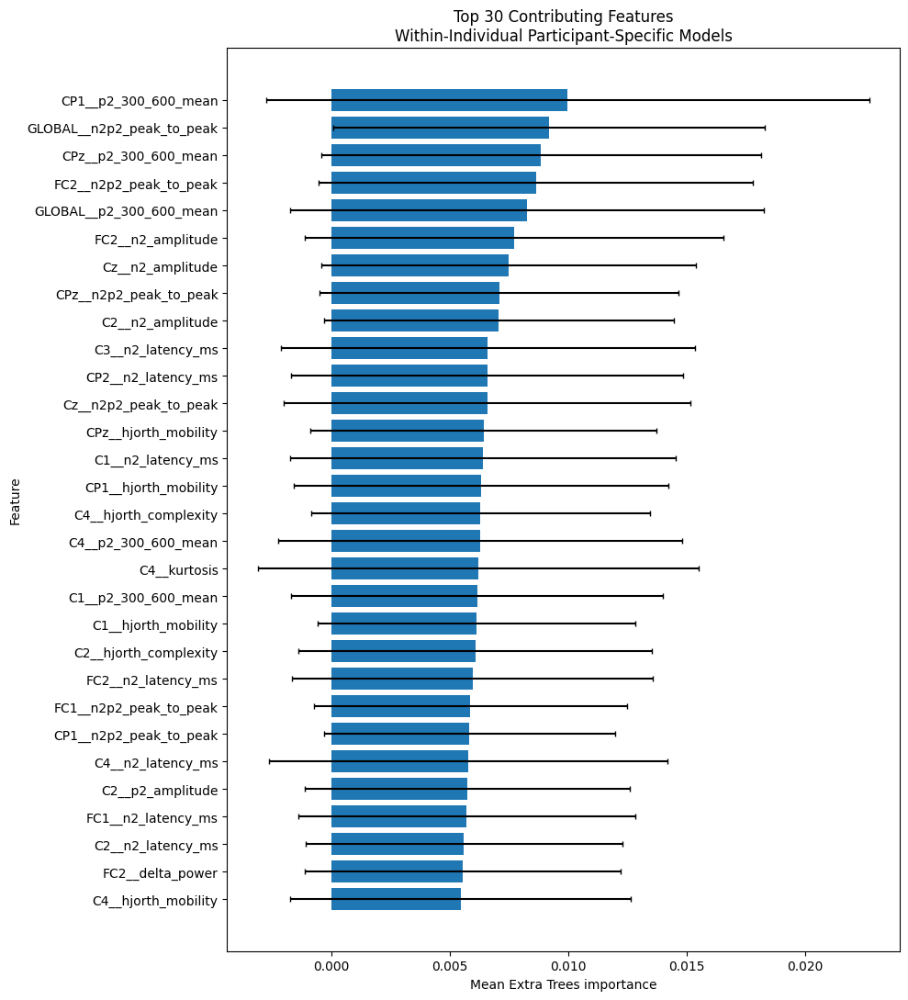

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_FEATURE_CONTRIBUTION_ANALYSIS/figures/within_top_30_feature_importance.png


In [ ]:
# ============================================================
# CELL 11 — TOP 30 WITHIN-INDIVIDUAL FEATURES
# ============================================================

within_top_30_plot = (
    within_ranking.head(
        30
    )
    .sort_values(
        "mean_importance",
        ascending=True
    )
)


plt.figure(
    figsize=(
        10,
        11
    )
)

plt.barh(
    within_top_30_plot[
        "feature_name"
    ],
    within_top_30_plot[
        "mean_importance"
    ],
    xerr=within_top_30_plot[
        "sd_importance"
    ],
    capsize=2,
)

plt.xlabel(
    "Mean Extra Trees importance"
)

plt.ylabel(
    "Feature"
)

plt.title(
    "Top 30 Contributing Features\n"
    "Within-Individual Participant-Specific Models"
)

plt.tight_layout()


WITHIN_TOP_30_PNG = os.path.join(
    FIGURE_DIR,
    "within_top_30_feature_importance.png"
)

WITHIN_TOP_30_PDF = os.path.join(
    FIGURE_DIR,
    "within_top_30_feature_importance.pdf"
)

plt.savefig(
    WITHIN_TOP_30_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    WITHIN_TOP_30_PDF,
    bbox_inches="tight"
)

plt.show()


print("Saved:")
print(WITHIN_TOP_30_PNG)

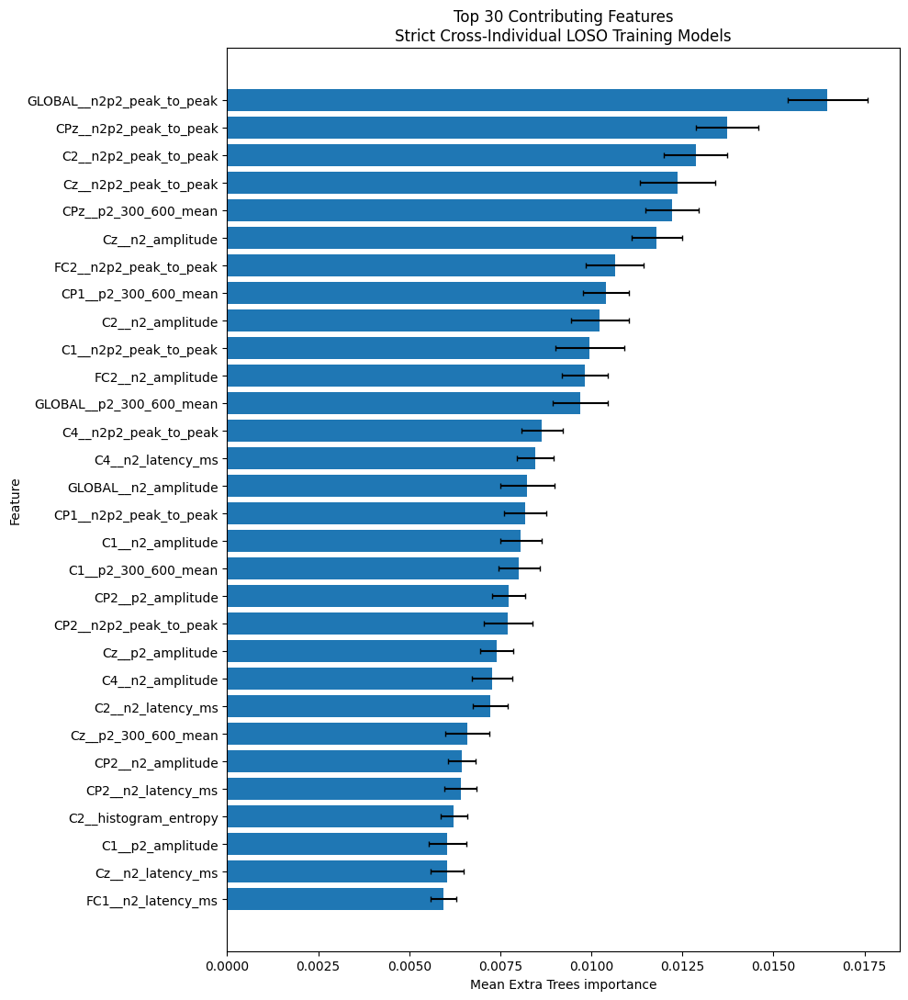

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_FEATURE_CONTRIBUTION_ANALYSIS/figures/cross_top_30_feature_importance.png


In [ ]:
# ============================================================
# CELL 12 — TOP 30 CROSS-INDIVIDUAL FEATURES
# ============================================================

cross_top_30_plot = (
    cross_ranking.head(
        30
    )
    .sort_values(
        "mean_importance",
        ascending=True
    )
)


plt.figure(
    figsize=(
        10,
        11
    )
)

plt.barh(
    cross_top_30_plot[
        "feature_name"
    ],
    cross_top_30_plot[
        "mean_importance"
    ],
    xerr=cross_top_30_plot[
        "sd_importance"
    ],
    capsize=2,
)

plt.xlabel(
    "Mean Extra Trees importance"
)

plt.ylabel(
    "Feature"
)

plt.title(
    "Top 30 Contributing Features\n"
    "Strict Cross-Individual LOSO Training Models"
)

plt.tight_layout()


CROSS_TOP_30_PNG = os.path.join(
    FIGURE_DIR,
    "cross_top_30_feature_importance.png"
)

CROSS_TOP_30_PDF = os.path.join(
    FIGURE_DIR,
    "cross_top_30_feature_importance.pdf"
)

plt.savefig(
    CROSS_TOP_30_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    CROSS_TOP_30_PDF,
    bbox_inches="tight"
)

plt.show()


print("Saved:")
print(CROSS_TOP_30_PNG)

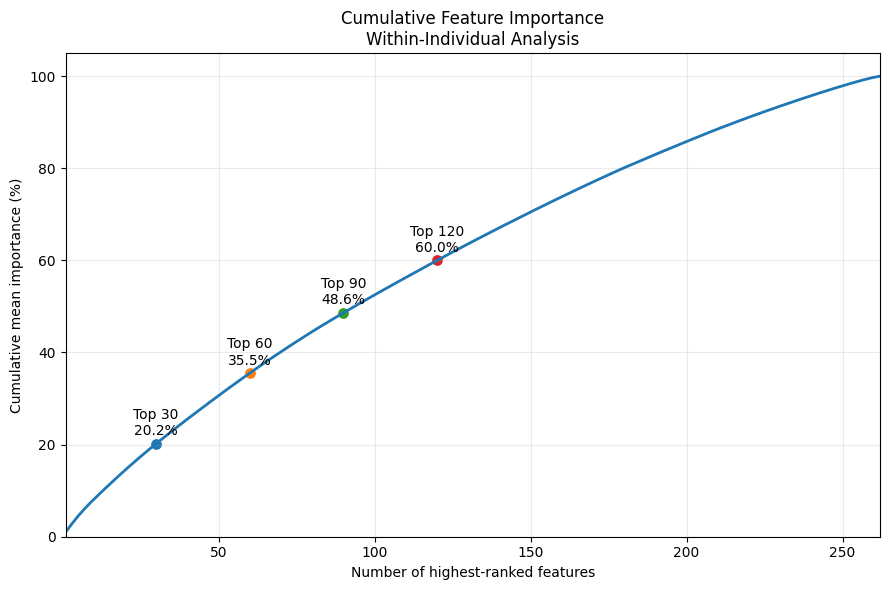

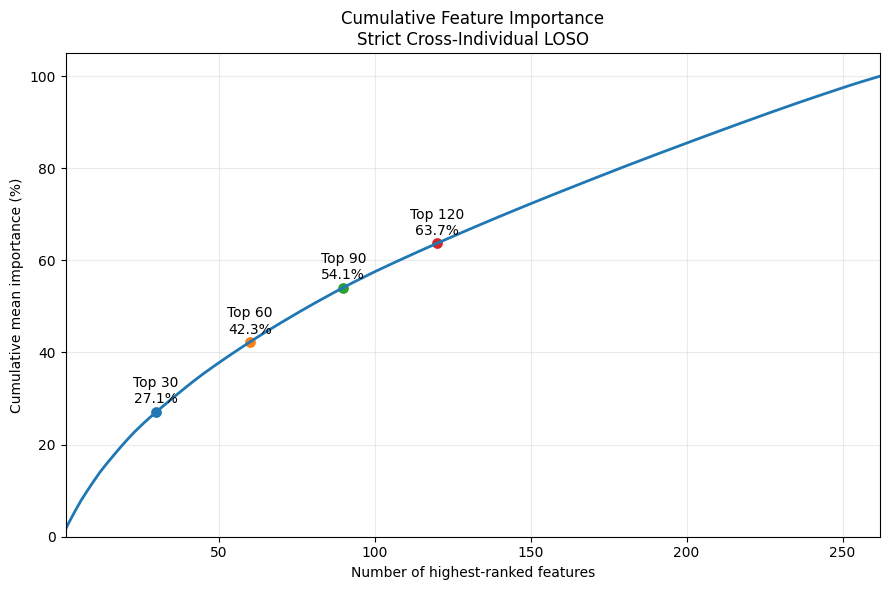

In [ ]:
# ============================================================
# CELL 13 — CUMULATIVE IMPORTANCE CURVES
# ============================================================

feature_ranks = np.arange(
    1,
    263
)


# ============================================================
# Within-individual cumulative curve
# ============================================================

plt.figure(
    figsize=(
        9,
        6
    )
)

plt.plot(
    feature_ranks,
    within_ranking[
        "cumulative_importance"
    ]
    *
    100,
    linewidth=2,
)

for k in TOP_K_VALUES:

    cumulative_value = (
        within_ranking.iloc[
            k - 1
        ][
            "cumulative_importance"
        ]
        *
        100
    )

    plt.scatter(
        k,
        cumulative_value,
        s=45,
    )

    plt.text(
        k,
        cumulative_value + 1.2,
        (
            f"Top {k}\n"
            f"{cumulative_value:.1f}%"
        ),
        ha="center",
        va="bottom",
    )


plt.xlabel(
    "Number of highest-ranked features"
)

plt.ylabel(
    "Cumulative mean importance (%)"
)

plt.title(
    "Cumulative Feature Importance\n"
    "Within-Individual Analysis"
)

plt.xlim(
    1,
    262
)

plt.ylim(
    0,
    105
)

plt.grid(
    alpha=0.25
)

plt.tight_layout()


WITHIN_CUMULATIVE_PNG = os.path.join(
    FIGURE_DIR,
    "within_cumulative_feature_importance.png"
)

WITHIN_CUMULATIVE_PDF = os.path.join(
    FIGURE_DIR,
    "within_cumulative_feature_importance.pdf"
)

plt.savefig(
    WITHIN_CUMULATIVE_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    WITHIN_CUMULATIVE_PDF,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# Cross-individual cumulative curve
# ============================================================

plt.figure(
    figsize=(
        9,
        6
    )
)

plt.plot(
    feature_ranks,
    cross_ranking[
        "cumulative_importance"
    ]
    *
    100,
    linewidth=2,
)

for k in TOP_K_VALUES:

    cumulative_value = (
        cross_ranking.iloc[
            k - 1
        ][
            "cumulative_importance"
        ]
        *
        100
    )

    plt.scatter(
        k,
        cumulative_value,
        s=45,
    )

    plt.text(
        k,
        cumulative_value + 1.2,
        (
            f"Top {k}\n"
            f"{cumulative_value:.1f}%"
        ),
        ha="center",
        va="bottom",
    )


plt.xlabel(
    "Number of highest-ranked features"
)

plt.ylabel(
    "Cumulative mean importance (%)"
)

plt.title(
    "Cumulative Feature Importance\n"
    "Strict Cross-Individual LOSO"
)

plt.xlim(
    1,
    262
)

plt.ylim(
    0,
    105
)

plt.grid(
    alpha=0.25
)

plt.tight_layout()


CROSS_CUMULATIVE_PNG = os.path.join(
    FIGURE_DIR,
    "cross_cumulative_feature_importance.png"
)

CROSS_CUMULATIVE_PDF = os.path.join(
    FIGURE_DIR,
    "cross_cumulative_feature_importance.pdf"
)

plt.savefig(
    CROSS_CUMULATIVE_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    CROSS_CUMULATIVE_PDF,
    bbox_inches="tight"
)

plt.show()

In [ ]:
# ============================================================
# CELL 14 — FEATURE-FAMILY IMPORTANCE
# ============================================================

def calculate_group_importance(
    ranking_df,
    group_column,
):

    group_importance = (
        ranking_df
        .groupby(
            group_column,
            as_index=False
        )
        .agg(
            feature_count=(
                "feature_name",
                "count"
            ),

            total_mean_importance=(
                "mean_importance",
                "sum"
            ),

            mean_importance_per_feature=(
                "mean_importance",
                "mean"
            ),
        )
    )

    group_importance[
        "importance_percentage"
    ] = (
        group_importance[
            "total_mean_importance"
        ]
        *
        100
    )

    return group_importance.sort_values(
        "total_mean_importance",
        ascending=False
    ).reset_index(
        drop=True
    )


within_family_importance = (
    calculate_group_importance(
        within_ranking,
        "feature_family"
    )
)

cross_family_importance = (
    calculate_group_importance(
        cross_ranking,
        "feature_family"
    )
)


WITHIN_FAMILY_PATH = os.path.join(
    TABLE_DIR,
    "within_feature_family_importance.csv"
)

CROSS_FAMILY_PATH = os.path.join(
    TABLE_DIR,
    "cross_feature_family_importance.csv"
)


within_family_importance.to_csv(
    WITHIN_FAMILY_PATH,
    index=False
)

cross_family_importance.to_csv(
    CROSS_FAMILY_PATH,
    index=False
)


print("Within feature-family contribution:")

display(
    within_family_importance.round(
        4
    )
)

print("\nCross feature-family contribution:")

display(
    cross_family_importance.round(
        4
    )
)

Within feature-family contribution:


,feature_family,feature_count,total_mean_importance,mean_importance_per_feature,importance_percentage
0,N2/P2 morphology,65,0.3152,0.0048,31.5209
1,Temporal mean,65,0.2364,0.0036,23.6367
2,Entropy/statistical,48,0.1680,0.0035,16.7973
3,Hjorth parameters,36,0.1426,0.0040,14.2601
4,Spectral power,48,0.1379,0.0029,13.7850



Cross feature-family contribution:


,feature_family,feature_count,total_mean_importance,mean_importance_per_feature,importance_percentage
0,N2/P2 morphology,65,0.3950,0.0061,39.4954
1,Temporal mean,65,0.2137,0.0033,21.3711
2,Entropy/statistical,48,0.1473,0.0031,14.7274
3,Spectral power,48,0.1339,0.0028,13.3945
4,Hjorth parameters,36,0.1101,0.0031,11.0117


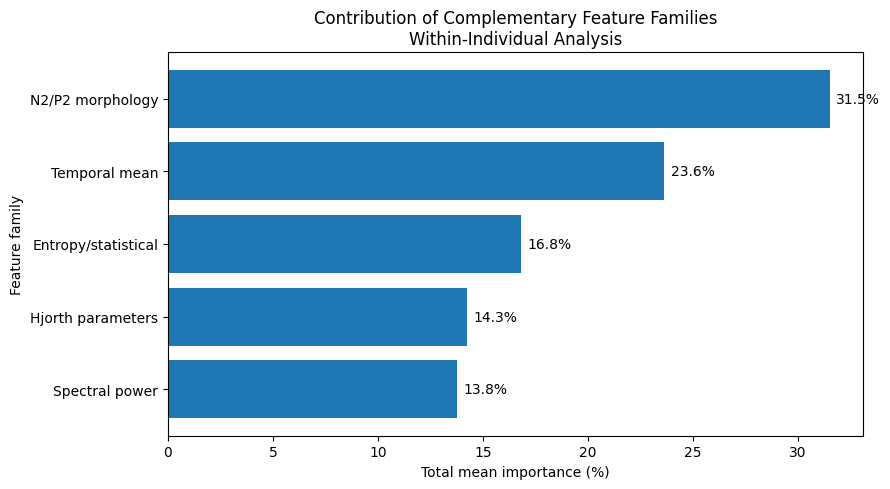

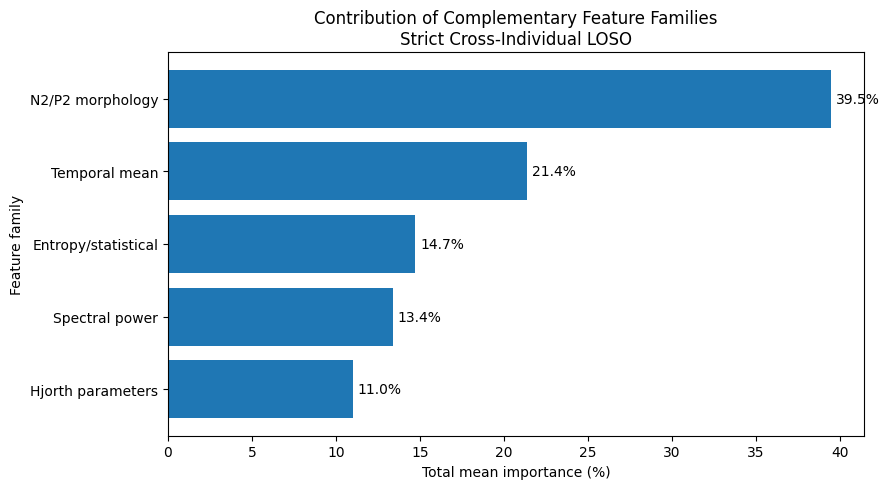

In [ ]:
# ============================================================
# CELL 15 — FEATURE-FAMILY CONTRIBUTION FIGURES
# ============================================================

# ============================================================
# Within
# ============================================================

within_family_plot = (
    within_family_importance
    .sort_values(
        "importance_percentage",
        ascending=True
    )
)

plt.figure(
    figsize=(
        9,
        5
    )
)

bars = plt.barh(
    within_family_plot[
        "feature_family"
    ],
    within_family_plot[
        "importance_percentage"
    ],
)

plt.xlabel(
    "Total mean importance (%)"
)

plt.ylabel(
    "Feature family"
)

plt.title(
    "Contribution of Complementary Feature Families\n"
    "Within-Individual Analysis"
)

for bar, value in zip(
    bars,
    within_family_plot[
        "importance_percentage"
    ]
):

    plt.text(
        bar.get_width() + 0.3,
        bar.get_y()
        +
        bar.get_height() / 2,
        f"{value:.1f}%",
        va="center",
    )


plt.tight_layout()


WITHIN_FAMILY_PNG = os.path.join(
    FIGURE_DIR,
    "within_feature_family_contribution.png"
)

WITHIN_FAMILY_PDF = os.path.join(
    FIGURE_DIR,
    "within_feature_family_contribution.pdf"
)

plt.savefig(
    WITHIN_FAMILY_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    WITHIN_FAMILY_PDF,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# Cross
# ============================================================

cross_family_plot = (
    cross_family_importance
    .sort_values(
        "importance_percentage",
        ascending=True
    )
)

plt.figure(
    figsize=(
        9,
        5
    )
)

bars = plt.barh(
    cross_family_plot[
        "feature_family"
    ],
    cross_family_plot[
        "importance_percentage"
    ],
)

plt.xlabel(
    "Total mean importance (%)"
)

plt.ylabel(
    "Feature family"
)

plt.title(
    "Contribution of Complementary Feature Families\n"
    "Strict Cross-Individual LOSO"
)

for bar, value in zip(
    bars,
    cross_family_plot[
        "importance_percentage"
    ]
):

    plt.text(
        bar.get_width() + 0.3,
        bar.get_y()
        +
        bar.get_height() / 2,
        f"{value:.1f}%",
        va="center",
    )


plt.tight_layout()


CROSS_FAMILY_PNG = os.path.join(
    FIGURE_DIR,
    "cross_feature_family_contribution.png"
)

CROSS_FAMILY_PDF = os.path.join(
    FIGURE_DIR,
    "cross_feature_family_contribution.pdf"
)

plt.savefig(
    CROSS_FAMILY_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    CROSS_FAMILY_PDF,
    bbox_inches="tight"
)

plt.show()

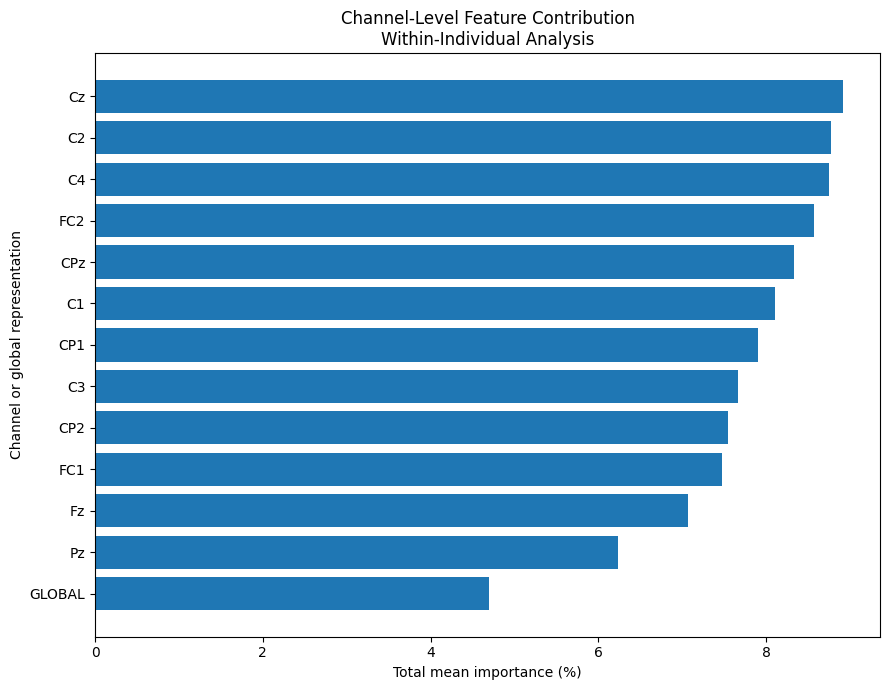

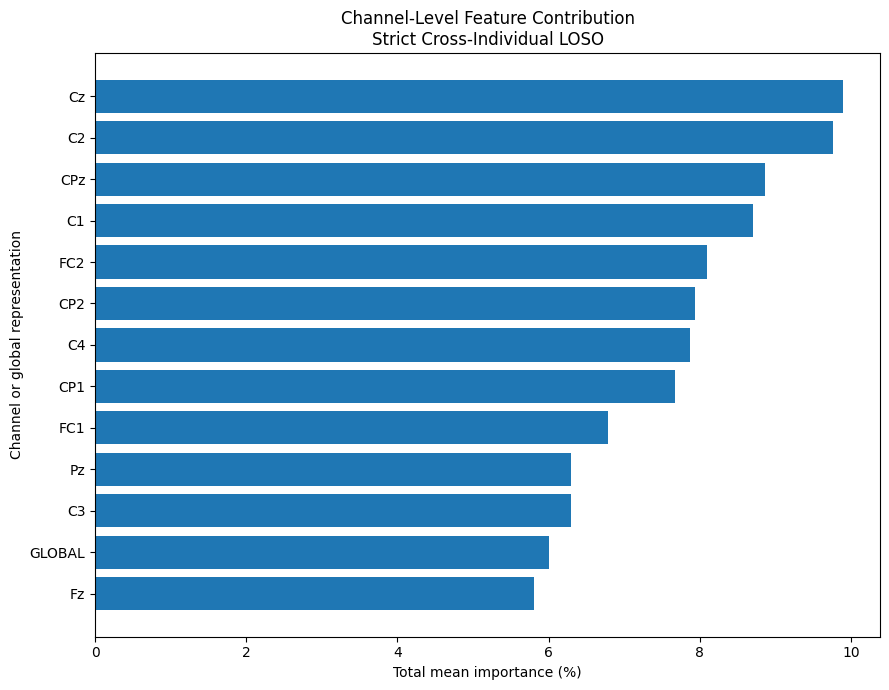


Within channel contribution:


,channel,feature_count,total_mean_importance,mean_importance_per_feature,importance_percentage
0,Cz,21,0.0891,0.0042,8.9109
1,C2,21,0.0877,0.0042,8.7667
2,C4,21,0.0874,0.0042,8.7439
3,FC2,21,0.0857,0.0041,8.5650
4,CPz,21,0.0833,0.0040,8.3329
5,C1,21,0.0810,0.0039,8.1007
6,CP1,21,0.0790,0.0038,7.8966
7,C3,21,0.0766,0.0036,7.6643
8,CP2,21,0.0754,0.0036,7.5419
9,FC1,21,0.0747,0.0036,7.4739



Cross channel contribution:


,channel,feature_count,total_mean_importance,mean_importance_per_feature,importance_percentage
0,Cz,21,0.0989,0.0047,9.8907
1,C2,21,0.0976,0.0046,9.7588
2,CPz,21,0.0886,0.0042,8.8624
3,C1,21,0.0870,0.0041,8.7027
4,FC2,21,0.0809,0.0039,8.0949
5,CP2,21,0.0794,0.0038,7.9365
6,C4,21,0.0787,0.0037,7.8698
7,CP1,21,0.0767,0.0037,7.6720
8,FC1,21,0.0679,0.0032,6.7926
9,Pz,21,0.0630,0.0030,6.3037


In [ ]:
# ============================================================
# CELL 16 — CHANNEL CONTRIBUTION
# ============================================================

within_channel_importance = (
    calculate_group_importance(
        within_ranking,
        "channel"
    )
)

cross_channel_importance = (
    calculate_group_importance(
        cross_ranking,
        "channel"
    )
)


WITHIN_CHANNEL_PATH = os.path.join(
    TABLE_DIR,
    "within_channel_importance.csv"
)

CROSS_CHANNEL_PATH = os.path.join(
    TABLE_DIR,
    "cross_channel_importance.csv"
)


within_channel_importance.to_csv(
    WITHIN_CHANNEL_PATH,
    index=False
)

cross_channel_importance.to_csv(
    CROSS_CHANNEL_PATH,
    index=False
)


# ============================================================
# Within channel plot
# ============================================================

within_channel_plot = (
    within_channel_importance
    .sort_values(
        "importance_percentage",
        ascending=True
    )
)

plt.figure(
    figsize=(
        9,
        7
    )
)

plt.barh(
    within_channel_plot[
        "channel"
    ],
    within_channel_plot[
        "importance_percentage"
    ],
)

plt.xlabel(
    "Total mean importance (%)"
)

plt.ylabel(
    "Channel or global representation"
)

plt.title(
    "Channel-Level Feature Contribution\n"
    "Within-Individual Analysis"
)

plt.tight_layout()


WITHIN_CHANNEL_PNG = os.path.join(
    FIGURE_DIR,
    "within_channel_contribution.png"
)

WITHIN_CHANNEL_PDF = os.path.join(
    FIGURE_DIR,
    "within_channel_contribution.pdf"
)

plt.savefig(
    WITHIN_CHANNEL_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    WITHIN_CHANNEL_PDF,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# Cross channel plot
# ============================================================

cross_channel_plot = (
    cross_channel_importance
    .sort_values(
        "importance_percentage",
        ascending=True
    )
)

plt.figure(
    figsize=(
        9,
        7
    )
)

plt.barh(
    cross_channel_plot[
        "channel"
    ],
    cross_channel_plot[
        "importance_percentage"
    ],
)

plt.xlabel(
    "Total mean importance (%)"
)

plt.ylabel(
    "Channel or global representation"
)

plt.title(
    "Channel-Level Feature Contribution\n"
    "Strict Cross-Individual LOSO"
)

plt.tight_layout()


CROSS_CHANNEL_PNG = os.path.join(
    FIGURE_DIR,
    "cross_channel_contribution.png"
)

CROSS_CHANNEL_PDF = os.path.join(
    FIGURE_DIR,
    "cross_channel_contribution.pdf"
)

plt.savefig(
    CROSS_CHANNEL_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    CROSS_CHANNEL_PDF,
    bbox_inches="tight"
)

plt.show()


print("\nWithin channel contribution:")

display(
    within_channel_importance.round(
        4
    )
)

print("\nCross channel contribution:")

display(
    cross_channel_importance.round(
        4
    )
)

Within linear/nonlinear contribution:


,extraction_type,feature_count,total_mean_importance,mean_importance_per_feature,importance_percentage
0,Nonlinear extraction operator,197,0.7636,0.0039,76.3633
1,Linear extraction operator,65,0.2364,0.0036,23.6367



Cross linear/nonlinear contribution:


,extraction_type,feature_count,total_mean_importance,mean_importance_per_feature,importance_percentage
0,Nonlinear extraction operator,197,0.7863,0.0040,78.6289
1,Linear extraction operator,65,0.2137,0.0033,21.3711


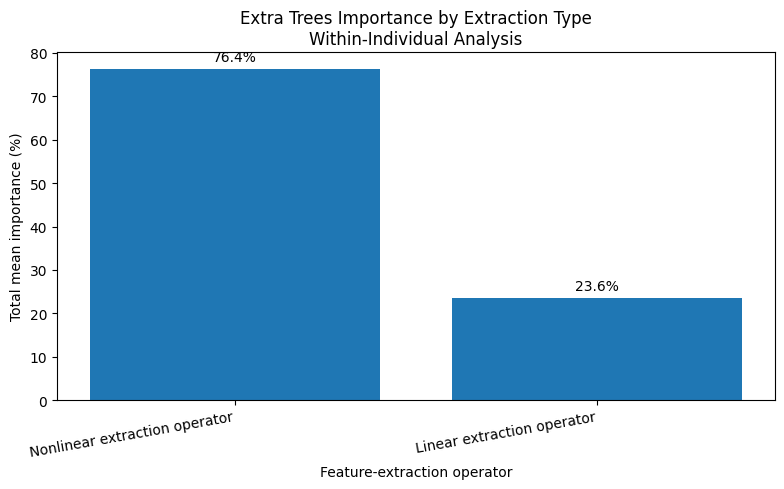

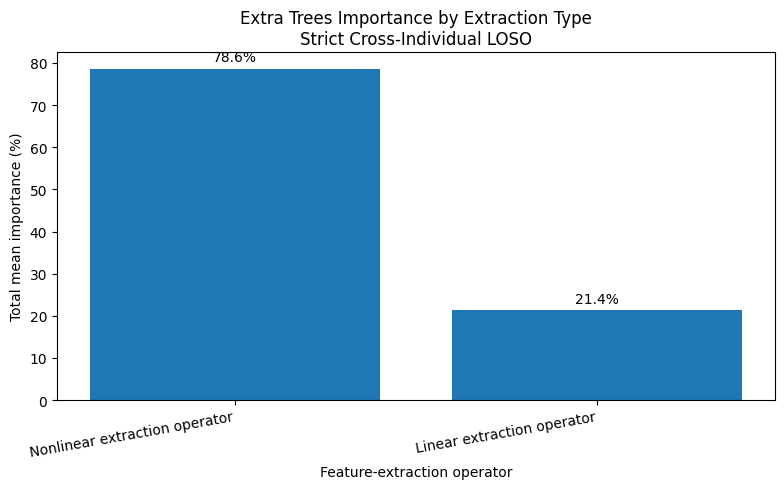

In [ ]:
# ============================================================
# CELL 17 — LINEAR/NONLINEAR IMPORTANCE CONTRIBUTION
# ============================================================

within_extraction_importance = (
    calculate_group_importance(
        within_ranking,
        "extraction_type"
    )
)

cross_extraction_importance = (
    calculate_group_importance(
        cross_ranking,
        "extraction_type"
    )
)


WITHIN_EXTRACTION_IMPORTANCE_PATH = os.path.join(
    TABLE_DIR,
    "within_linear_nonlinear_importance.csv"
)

CROSS_EXTRACTION_IMPORTANCE_PATH = os.path.join(
    TABLE_DIR,
    "cross_linear_nonlinear_importance.csv"
)


within_extraction_importance.to_csv(
    WITHIN_EXTRACTION_IMPORTANCE_PATH,
    index=False
)

cross_extraction_importance.to_csv(
    CROSS_EXTRACTION_IMPORTANCE_PATH,
    index=False
)


print("Within linear/nonlinear contribution:")

display(
    within_extraction_importance.round(
        4
    )
)

print("\nCross linear/nonlinear contribution:")

display(
    cross_extraction_importance.round(
        4
    )
)


# ============================================================
# Within importance plot
# ============================================================

within_extraction_plot = (
    within_extraction_importance
    .sort_values(
        "importance_percentage",
        ascending=False
    )
)

plt.figure(
    figsize=(
        8,
        5
    )
)

bars = plt.bar(
    within_extraction_plot[
        "extraction_type"
    ],
    within_extraction_plot[
        "importance_percentage"
    ],
)

plt.ylabel(
    "Total mean importance (%)"
)

plt.xlabel(
    "Feature-extraction operator"
)

plt.title(
    "Extra Trees Importance by Extraction Type\n"
    "Within-Individual Analysis"
)

for bar, value in zip(
    bars,
    within_extraction_plot[
        "importance_percentage"
    ]
):

    plt.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        bar.get_height()
        +
        1,

        f"{value:.1f}%",

        ha="center",
        va="bottom",
    )


plt.xticks(
    rotation=10,
    ha="right"
)

plt.tight_layout()


WITHIN_EXTRACTION_PNG = os.path.join(
    FIGURE_DIR,
    "within_linear_nonlinear_importance.png"
)

WITHIN_EXTRACTION_PDF = os.path.join(
    FIGURE_DIR,
    "within_linear_nonlinear_importance.pdf"
)

plt.savefig(
    WITHIN_EXTRACTION_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    WITHIN_EXTRACTION_PDF,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# Cross importance plot
# ============================================================

cross_extraction_plot = (
    cross_extraction_importance
    .sort_values(
        "importance_percentage",
        ascending=False
    )
)

plt.figure(
    figsize=(
        8,
        5
    )
)

bars = plt.bar(
    cross_extraction_plot[
        "extraction_type"
    ],
    cross_extraction_plot[
        "importance_percentage"
    ],
)

plt.ylabel(
    "Total mean importance (%)"
)

plt.xlabel(
    "Feature-extraction operator"
)

plt.title(
    "Extra Trees Importance by Extraction Type\n"
    "Strict Cross-Individual LOSO"
)

for bar, value in zip(
    bars,
    cross_extraction_plot[
        "importance_percentage"
    ]
):

    plt.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        bar.get_height()
        +
        1,

        f"{value:.1f}%",

        ha="center",
        va="bottom",
    )


plt.xticks(
    rotation=10,
    ha="right"
)

plt.tight_layout()


CROSS_EXTRACTION_PNG = os.path.join(
    FIGURE_DIR,
    "cross_linear_nonlinear_importance.png"
)

CROSS_EXTRACTION_PDF = os.path.join(
    FIGURE_DIR,
    "cross_linear_nonlinear_importance.pdf"
)

plt.savefig(
    CROSS_EXTRACTION_PNG,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    CROSS_EXTRACTION_PDF,
    bbox_inches="tight"
)

plt.show()

In [ ]:
# ============================================================
# CELL 18 — TOP-K FAMILY AND CHANNEL COMPOSITION
# ============================================================

composition_rows = []


for validation_name, ranking_df in [
    (
        "Within-individual",
        within_ranking
    ),
    (
        "Cross-individual",
        cross_ranking
    ),
]:

    for k in TOP_K_VALUES:

        selected_features = (
            ranking_df.head(
                k
            )
        )


        family_counts = (
            selected_features[
                "feature_family"
            ]
            .value_counts()
        )

        extraction_counts = (
            selected_features[
                "extraction_type"
            ]
            .value_counts()
        )

        unique_channels = (
            selected_features[
                "channel"
            ]
            .nunique()
        )


        row = {
            "validation":
                validation_name,

            "top_k":
                k,

            "unique_channels_or_global":
                int(
                    unique_channels
                ),
        }


        for family_name in [
            "Temporal mean",
            "N2/P2 morphology",
            "Spectral power",
            "Hjorth parameters",
            "Entropy/statistical",
        ]:

            row[
                family_name
            ] = int(
                family_counts.get(
                    family_name,
                    0
                )
            )


        row[
            "linear_features"
        ] = int(
            extraction_counts.get(
                "Linear extraction operator",
                0
            )
        )

        row[
            "nonlinear_features"
        ] = int(
            extraction_counts.get(
                "Nonlinear extraction operator",
                0
            )
        )


        composition_rows.append(
            row
        )


top_k_composition = pd.DataFrame(
    composition_rows
)


TOP_K_COMPOSITION_PATH = os.path.join(
    TABLE_DIR,
    "top_k_feature_family_composition.csv"
)

top_k_composition.to_csv(
    TOP_K_COMPOSITION_PATH,
    index=False
)


display(
    top_k_composition
)

,validation,top_k,unique_channels_or_global,Temporal mean,N2/P2 morphology,Spectral power,Hjorth parameters,Entropy/statistical,linear_features,nonlinear_features
0,Within-individual,30,11,5,17,1,6,1,5,25
1,Within-individual,60,12,8,32,2,12,6,8,52
2,Within-individual,90,13,15,43,3,13,16,15,75
3,Within-individual,120,13,24,53,6,19,18,24,96
4,Cross-individual,30,10,5,24,0,0,1,5,25
5,Cross-individual,60,11,9,43,3,1,4,9,51
6,Cross-individual,90,13,11,58,4,8,9,11,79
7,Cross-individual,120,13,14,62,11,17,16,14,106


In [ ]:
# ============================================================
# CELL 19 — AUTOMATIC RESULT SUMMARY
# ============================================================

def strongest_group(
    dataframe,
    name_column,
):

    row = dataframe.sort_values(
        "total_mean_importance",
        ascending=False
    ).iloc[0]

    return (
        row[
            name_column
        ],
        float(
            row[
                "importance_percentage"
            ]
        ),
    )


within_top_family, within_top_family_pct = (
    strongest_group(
        within_family_importance,
        "feature_family"
    )
)

cross_top_family, cross_top_family_pct = (
    strongest_group(
        cross_family_importance,
        "feature_family"
    )
)

within_top_channel, within_top_channel_pct = (
    strongest_group(
        within_channel_importance,
        "channel"
    )
)

cross_top_channel, cross_top_channel_pct = (
    strongest_group(
        cross_channel_importance,
        "channel"
    )
)


within_top_30_channels = int(
    within_ranking.head(
        30
    )[
        "channel"
    ].nunique()
)

cross_top_30_channels = int(
    cross_ranking.head(
        30
    )[
        "channel"
    ].nunique()
)


top_30_summary_row = (
    top_k_summary.loc[
        top_k_summary[
            "top_k"
        ] == 30
    ].iloc[0]
)


print("=" * 78)
print("REPORT-READY FEATURE-CONTRIBUTION FACTS")
print("=" * 78)


print(
    "\n1. Representation composition:"
)

print(
    f"   Linear extraction operators: "
    f"{linear_count}/262 "
    f"({linear_count / 262 * 100:.2f}%)."
)

print(
    f"   Nonlinear extraction operators: "
    f"{nonlinear_count}/262 "
    f"({nonlinear_count / 262 * 100:.2f}%)."
)


print(
    "\n2. Top-30 cumulative contribution:"
)

print(
    "   Within-individual:",
    (
        f"{top_30_summary_row['within_cumulative_percentage']:.2f}%"
    )
)

print(
    "   Cross-individual:",
    (
        f"{top_30_summary_row['cross_cumulative_percentage']:.2f}%"
    )
)


print(
    "\n3. Top-30 consistency:"
)

print(
    "   Common within/cross features:",
    int(
        top_30_summary_row[
            "common_features"
        ]
    )
)

print(
    "   Top-30 overlap:",
    (
        f"{top_30_summary_row['overlap_percentage_of_k']:.2f}%"
    )
)


print(
    "\n4. Feature-family contribution:"
)

print(
    f"   Strongest within family: "
    f"{within_top_family} "
    f"({within_top_family_pct:.2f}%)."
)

print(
    f"   Strongest cross family: "
    f"{cross_top_family} "
    f"({cross_top_family_pct:.2f}%)."
)


print(
    "\n5. Channel contribution:"
)

print(
    f"   Strongest within channel/global group: "
    f"{within_top_channel} "
    f"({within_top_channel_pct:.2f}%)."
)

print(
    f"   Strongest cross channel/global group: "
    f"{cross_top_channel} "
    f"({cross_top_channel_pct:.2f}%)."
)


print(
    "\n6. Spatial distribution of the top 30:"
)

print(
    "   Within unique channels/global group:",
    within_top_30_channels
)

print(
    "   Cross unique channels/global group:",
    cross_top_30_channels
)


print("\nOutputs saved in:")
print(IMPORTANCE_DIR)

REPORT-READY FEATURE-CONTRIBUTION FACTS

1. Representation composition:
   Linear extraction operators: 65/262 (24.81%).
   Nonlinear extraction operators: 197/262 (75.19%).

2. Top-30 cumulative contribution:
   Within-individual: 20.20%
   Cross-individual: 27.09%

3. Top-30 consistency:
   Common within/cross features: 16
   Top-30 overlap: 53.33%

4. Feature-family contribution:
   Strongest within family: N2/P2 morphology (31.52%).
   Strongest cross family: N2/P2 morphology (39.50%).

5. Channel contribution:
   Strongest within channel/global group: Cz (8.91%).
   Strongest cross channel/global group: Cz (9.89%).

6. Spatial distribution of the top 30:
   Within unique channels/global group: 11
   Cross unique channels/global group: 10

Outputs saved in:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_FEATURE_CONTRIBUTION_ANALYSIS


In [ ]:
# ============================================================
# V8 RESTART CELL
#
# Run after reopening Colab and mounting Google Drive.
#
# Loads:
#   X_handcrafted              -> raw V8 262 features
#   X_handcrafted_standardized -> V8 subject-standardized features
#   y                          -> binary pain labels
#   groups                     -> participant IDs
#   feature_names              -> 262 feature names
# ============================================================

import os
import json
import warnings

import numpy as np
import pandas as pd

warnings.filterwarnings("ignore")


# ============================================================
# 1. V8 directories
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

ALIGNED_DIR = os.path.join(
    V8_DIR,
    "aligned_data"
)

os.makedirs(
    FEATURE_DIR,
    exist_ok=True
)

os.makedirs(
    ALIGNED_DIR,
    exist_ok=True
)


# ============================================================
# 2. Saved V8 file paths
# ============================================================

X_HANDCRAFTED_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

X_STANDARDIZED_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_262_subject_standardized.npy"
)

Y_PATH = os.path.join(
    ALIGNED_DIR,
    "y_v8_binary_6275.npy"
)

GROUPS_PATH = os.path.join(
    ALIGNED_DIR,
    "groups_v8_subject_6275.npy"
)

FEATURE_NAMES_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_names_262.csv"
)


# ============================================================
# 3. Confirm required saved files exist
# ============================================================

required_paths = [
    X_HANDCRAFTED_PATH,
    Y_PATH,
    GROUPS_PATH,
    FEATURE_NAMES_PATH,
]

missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]

if missing_paths:

    raise FileNotFoundError(
        "The following required files were not found:\n\n"
        + "\n".join(missing_paths)
    )


# ============================================================
# 4. Load raw V8 handcrafted features
# ============================================================

X_handcrafted = np.load(
    X_HANDCRAFTED_PATH,
    mmap_mode="r"
)

y = np.load(
    Y_PATH
).astype(
    np.int8,
    copy=False
).ravel()

groups_raw = np.load(
    GROUPS_PATH,
    allow_pickle=True
).ravel()


def clean_subject_id(value):

    if isinstance(value, bytes):
        value = value.decode("utf-8")

    return str(value).strip()


groups = np.asarray(
    [
        clean_subject_id(value)
        for value in groups_raw
    ],
    dtype=str
)


feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)

if "feature_name" in feature_names_df.columns:

    feature_names = (
        feature_names_df["feature_name"]
        .astype(str)
        .tolist()
    )

else:

    feature_names = (
        feature_names_df.iloc[:, -1]
        .astype(str)
        .tolist()
    )


# ============================================================
# 5. Load or create V8 subject-standardized features
#
# Used only for cross-individual LOSO.
#
# Each feature is standardized separately within each subject:
#
#     z = (x - subject mean) / subject SD
#
# This follows the same preparation used in your V7 LOSO.
# ============================================================

if os.path.exists(
    X_STANDARDIZED_PATH
):

    X_handcrafted_standardized = np.load(
        X_STANDARDIZED_PATH,
        mmap_mode="r"
    )

    print(
        "Loaded saved V8 subject-standardized features."
    )

else:

    print(
        "V8 standardized feature file was not found."
    )

    print(
        "Calculating V7-style subject-wise standardization..."
    )

    X_raw = np.asarray(
        X_handcrafted,
        dtype=np.float64
    )

    X_standardized_temp = np.empty(
        X_raw.shape,
        dtype=np.float64
    )

    minimum_sd = 1e-8

    for subject_id in np.sort(
        np.unique(groups)
    ):

        subject_mask = (
            groups == subject_id
        )

        subject_data = X_raw[
            subject_mask
        ]

        subject_mean = subject_data.mean(
            axis=0
        )

        subject_sd = subject_data.std(
            axis=0
        )

        subject_sd = np.maximum(
            subject_sd,
            minimum_sd
        )

        X_standardized_temp[
            subject_mask
        ] = (
            subject_data
            - subject_mean
        ) / subject_sd


    if not np.isfinite(
        X_standardized_temp
    ).all():

        raise ValueError(
            "The subject-standardized matrix contains "
            "NaN or infinite values."
        )


    np.save(
        X_STANDARDIZED_PATH,
        X_standardized_temp
    )

    del X_raw
    del X_standardized_temp


    X_handcrafted_standardized = np.load(
        X_STANDARDIZED_PATH,
        mmap_mode="r"
    )

    print(
        "V8 subject-standardized features created and saved."
    )


# ============================================================
# 6. Strict validation
# ============================================================

assert X_handcrafted.shape == (
    6275,
    262
)

assert X_handcrafted_standardized.shape == (
    6275,
    262
)

assert y.shape == (
    6275,
)

assert groups.shape == (
    6275,
)

assert len(feature_names) == 262

assert len(
    np.unique(groups)
) == 223

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([
        2725,
        3550
    ])
)


for batch_start in range(
    0,
    6275,
    512
):

    batch_stop = min(
        batch_start + 512,
        6275
    )

    raw_batch = np.asarray(
        X_handcrafted[
            batch_start:batch_stop
        ]
    )

    standardized_batch = np.asarray(
        X_handcrafted_standardized[
            batch_start:batch_stop
        ]
    )

    if not np.isfinite(
        raw_batch
    ).all():

        raise ValueError(
            "Raw V8 features contain non-finite values."
        )

    if not np.isfinite(
        standardized_batch
    ).all():

        raise ValueError(
            "Standardized V8 features contain "
            "non-finite values."
        )


# ============================================================
# 7. Check saved within-individual Extra Trees progress
# ============================================================

WITHIN_RESULTS_DIR = os.path.join(
    V8_DIR,
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)

ET_WITHIN_EXPERIMENT = (
    "ExtraTrees__"
    "Handcrafted_262_noPCA__"
    "v8_full0_2000ms_no_pca_strict192"
)

ET_WITHIN_PROGRESS_PATH = os.path.join(
    WITHIN_RESULTS_DIR,
    ET_WITHIN_EXPERIMENT
    + "__progress.json"
)

ET_WITHIN_PREDICTION_PATH = os.path.join(
    WITHIN_RESULTS_DIR,
    ET_WITHIN_EXPERIMENT
    + "__trial_predictions.csv"
)


print("\n" + "=" * 78)
print("V8 RESTART DATA LOADED SUCCESSFULLY")
print("=" * 78)

print(
    "Raw handcrafted features:",
    X_handcrafted.shape
)

print(
    "Subject-standardized features:",
    X_handcrafted_standardized.shape
)

print(
    "Labels:",
    y.shape
)

print(
    "Participant IDs:",
    groups.shape
)

print(
    "Participants:",
    len(
        np.unique(groups)
    )
)

print(
    "Class counts [low, high]:",
    np.bincount(
        y,
        minlength=2
    ).tolist()
)


print("\nFeature use:")

print(
    "Within-individual LOOCV:",
    "X_handcrafted"
)

print(
    "Cross-individual LOSO:",
    "X_handcrafted_standardized"
)


print("\nWithin-individual Extra Trees status:")

if os.path.exists(
    ET_WITHIN_PROGRESS_PATH
):

    with open(
        ET_WITHIN_PROGRESS_PATH,
        "r",
        encoding="utf-8"
    ) as file:

        et_progress = json.load(file)

    print(
        "Progress file found."
    )

    print(
        "Completed:",
        et_progress.get(
            "completed",
            "Unknown"
        )
    )

    print(
        "Completed trials:",
        et_progress.get(
            "completed_trials",
            "Unknown"
        )
    )

    print(
        "Total trials:",
        et_progress.get(
            "total_trials",
            "Unknown"
        )
    )

else:

    print(
        "No Extra Trees progress file was found."
    )


if os.path.exists(
    ET_WITHIN_PREDICTION_PATH
):

    et_saved_predictions = pd.read_csv(
        ET_WITHIN_PREDICTION_PATH
    )

    print(
        "Saved Extra Trees prediction rows:",
        len(
            et_saved_predictions
        )
    )

else:

    print(
        "No saved Extra Trees prediction CSV was found."
    )


print("\n" + "=" * 78)
print("V8 RESTART VALIDATION PASSED")
print("=" * 78)

Loaded saved V8 subject-standardized features.

V8 RESTART DATA LOADED SUCCESSFULLY
Raw handcrafted features: (6275, 262)
Subject-standardized features: (6275, 262)
Labels: (6275,)
Participant IDs: (6275,)
Participants: 223
Class counts [low, high]: [2725, 3550]

Feature use:
Within-individual LOOCV: X_handcrafted
Cross-individual LOSO: X_handcrafted_standardized

Within-individual Extra Trees status:
Progress file found.
Completed: True
Completed trials: 5408
Total trials: 5408
Saved Extra Trees prediction rows: 5408

V8 RESTART VALIDATION PASSED


In [ ]:
!pip -q install pymatreader mne scipy scikit-learn pandas numpy matplotlib tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 81.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.
moviepy 1.0.3 requires decorator<5.0,>=4.0.2, but you have decorator 5.3.1 which is incompatible.


In [ ]:
# CELL 2 — Imports and paths

import os, glob, warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tqdm import tqdm
from pymatreader import read_mat
from scipy.signal import welch
from scipy.stats import skew, kurtosis

EXP_NAME = "EXP8"

# Change this path if your Exp8 folder name is different
EXP8_ROOT = "/content/drive/MyDrive/my dataset_raw_main_exp8"

OUT_DIR = "/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH"
os.makedirs(OUT_DIR, exist_ok=True)

print("EXP8_ROOT exists:", os.path.exists(EXP8_ROOT))
print("OUT_DIR:", OUT_DIR)

EXP8_ROOT exists: True
OUT_DIR: /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH


In [ ]:
# ============================================================
# V8 CELL 1 — Full 3-second EXP8 pipeline configuration
#
# Epoch:
#   Prestimulus:  -1000 to -1 ms    = 1000 samples
#   Poststimulus:     0 to 1999 ms  = 2000 samples
#   Complete epoch:                  = 3000 samples
#
# Feature representation:
#   21 features per channel
#   12 channels
#   21 × 12 = 252 features
#
# Important:
#   - No V5/V7 262-feature matrix is reused.
#   - The 10 global features are removed.
#   - Response EEG is normalized using same-trial,
#     same-channel prestimulus mean and SD.
# ============================================================

!pip -q install pymatreader scipy pandas numpy tqdm

import os
import re
import glob
import json
import warnings

import numpy as np
import pandas as pd

from tqdm.auto import tqdm
from pymatreader import read_mat
from scipy.signal import welch
from scipy.stats import skew, kurtosis

warnings.filterwarnings("ignore")


# ============================================================
# 1. Main dataset paths
# ============================================================

EXP_NAME = "EXP8"

EXP8_ROOT = (
    "/content/drive/MyDrive/"
    "my dataset_raw_main_exp8"
)

REREFER_DIR = os.path.join(
    EXP8_ROOT,
    "derivatives",
    "rerefer"
)


# Existing V5 directory is used only to obtain the
# already verified epoch metadata and labels.
V5_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V5_MAIN_PIPELINE_12CH"
)


# All new V8 outputs must be stored separately.
V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

V8_DATA_DIR = os.path.join(
    V8_DIR,
    "prepared_data"
)

V8_WITHIN_RESULTS_DIR = os.path.join(
    V8_DIR,
    "within_individual_results"
)

V8_CROSS_RESULTS_DIR = os.path.join(
    V8_DIR,
    "cross_individual_results"
)


for directory in [
    V8_DIR,
    V8_DATA_DIR,
    V8_WITHIN_RESULTS_DIR,
    V8_CROSS_RESULTS_DIR
]:
    os.makedirs(
        directory,
        exist_ok=True
    )


# ============================================================
# 2. Locate all EXP8 rereferenced files
# ============================================================

set_files = sorted(
    glob.glob(
        os.path.join(
            REREFER_DIR,
            "*.set"
        )
    )
)


if len(set_files) != 223:
    raise FileNotFoundError(
        "Expected 223 rereferenced EXP8 .set files, "
        f"but found {len(set_files)}.\n"
        f"Checked directory:\n{REREFER_DIR}"
    )


# ============================================================
# 3. Sampling and time-window definitions
# ============================================================

FS_EXPECTED = 1000.0


# All intervals are half-open:
#
# [start, stop)
#
# This produces exactly:
#   -1000 through -1 ms   = 1000 samples
#       0 through 1999 ms = 2000 samples

FULL_EPOCH_RANGE_MS = (
    -1000,
    2000
)

BASELINE_RANGE_MS = (
    -1000,
    0
)

RESPONSE_RANGE_MS = (
    0,
    2000
)


EXPECTED_BASELINE_SAMPLES = 1000
EXPECTED_RESPONSE_SAMPLES = 2000
EXPECTED_FULL_EPOCH_SAMPLES = 3000


# ============================================================
# 4. Fixed 12-channel montage
# ============================================================

V8_CHANNELS = [
    "Fz",
    "FC1",
    "FC2",
    "C3",
    "C1",
    "Cz",
    "C2",
    "C4",
    "CP1",
    "CPz",
    "CP2",
    "Pz"
]


assert len(V8_CHANNELS) == 12
assert len(set(V8_CHANNELS)) == 12
assert "Cz" in V8_CHANNELS


# ============================================================
# 5. Temporal windows for the 2-second response
# ============================================================
#
# The first four windows retain the V5/V7 definitions.
#
# The old:
#     global_0_1000
#
# is replaced by:
#     full_response_0_2000
#
# Therefore all poststimulus samples contribute to the
# complete-response temporal mean.
#
# Spectral, Hjorth, entropy and statistical features will
# also use the complete 0-1999 ms response.

V8_HANDCRAFTED_WINDOWS = {
    "early_0_200": (
        0,
        200
    ),

    "n2_180_350": (
        180,
        350
    ),

    "p2_300_600": (
        300,
        600
    ),

    "late_600_1000": (
        600,
        1000
    ),

    "full_response_0_2000": (
        0,
        2000
    )
}


# N2 and P2 peak-search windows
V8_N2_WINDOW_MS = (
    180,
    350
)

V8_P2_WINDOW_MS = (
    300,
    600
)


# ============================================================
# 6. Frequency bands
# ============================================================
#
# Rereferenced derivatives already received the final
# 30-Hz low-pass filter. Gamma is therefore excluded.

V8_FREQUENCY_BANDS = {
    "delta": (
        1,
        4
    ),

    "theta": (
        4,
        8
    ),

    "alpha": (
        8,
        13
    ),

    "beta": (
        13,
        30
    )
}


# ============================================================
# 7. Define the exact 21 features per channel
# ============================================================

V8_PER_CHANNEL_FEATURES = [

    # Five temporal means
    *[
        f"{window_name}_mean"
        for window_name
        in V8_HANDCRAFTED_WINDOWS
    ],

    # Five N2/P2 morphology features
    "n2_amp",
    "n2_latency_ms",
    "p2_amp",
    "p2_latency_ms",
    "n2p2_peak_to_peak",

    # Four frequency-domain features
    *[
        f"{band_name}_power"
        for band_name
        in V8_FREQUENCY_BANDS
    ],

    # Three Hjorth parameters
    "hjorth_activity",
    "hjorth_mobility",
    "hjorth_complexity",

    # Four statistical features
    "entropy",
    "standard_deviation",
    "skewness",
    "kurtosis"
]


assert len(
    V8_PER_CHANNEL_FEATURES
) == 21


# ============================================================
# 8. Create the complete 252-feature name list
# ============================================================

V8_HANDCRAFTED_NAMES = []


for channel_name in V8_CHANNELS:

    for feature_name in (
        V8_PER_CHANNEL_FEATURES
    ):

        V8_HANDCRAFTED_NAMES.append(
            f"{channel_name}__{feature_name}"
        )


assert len(
    V8_HANDCRAFTED_NAMES
) == 252

assert not any(
    feature_name.startswith(
        "GLOBAL__"
    )
    for feature_name
    in V8_HANDCRAFTED_NAMES
)


# ============================================================
# 9. Load the previously verified metadata
# ============================================================

V5_METADATA_PATH = os.path.join(
    V5_DIR,
    "v5_metadata_aligned.csv"
)


if not os.path.exists(
    V5_METADATA_PATH
):
    raise FileNotFoundError(
        "Verified V5 metadata was not found:\n"
        f"{V5_METADATA_PATH}"
    )


v8_metadata_df = pd.read_csv(
    V5_METADATA_PATH
).reset_index(
    drop=True
)


v8_metadata_df["subject_id"] = (
    v8_metadata_df[
        "subject_id"
    ].astype(str)
)

v8_metadata_df["trial_num"] = pd.to_numeric(
    v8_metadata_df[
        "trial_num"
    ],
    errors="raise"
).astype(int)

v8_metadata_df["painrating"] = pd.to_numeric(
    v8_metadata_df[
        "painrating"
    ],
    errors="raise"
).astype(float)


# Recreate labels directly from pain ratings
v8_metadata_df["pain_label"] = (
    v8_metadata_df[
        "painrating"
    ] >= 5.0
).astype(
    np.int8
)


assert len(
    v8_metadata_df
) == 6275

assert v8_metadata_df[
    "subject_id"
].nunique() == 223

assert np.array_equal(
    np.bincount(
        v8_metadata_df[
            "pain_label"
        ].to_numpy(
            dtype=np.int8
        ),
        minlength=2
    ),
    np.array([
        2725,
        3550
    ])
)


# ============================================================
# 10. V8 output paths
# ============================================================

V8_BASELINE_PATH = os.path.join(
    V8_DATA_DIR,
    "X_v8_baseline_raw_12ch_1000samples.npy"
)

V8_RESPONSE_PATH = os.path.join(
    V8_DATA_DIR,
    "X_v8_response_raw_12ch_2000samples.npy"
)

V8_HANDCRAFTED_PATH = os.path.join(
    V8_DATA_DIR,
    "X_v8_handcrafted_full2s_252.npy"
)

V8_BASELINE_TIMES_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_baseline_times_ms.npy"
)

V8_RESPONSE_TIMES_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_response_times_ms.npy"
)

V8_FEATURE_NAMES_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_handcrafted_feature_names_252.csv"
)

V8_METADATA_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_metadata_aligned.csv"
)

V8_LABELS_PATH = os.path.join(
    V8_DATA_DIR,
    "y_v8_binary.npy"
)

V8_GROUPS_PATH = os.path.join(
    V8_DATA_DIR,
    "groups_v8_subject.npy"
)

V8_CONFIGURATION_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_full3s_configuration.json"
)


# ============================================================
# 11. Save metadata, labels, groups and feature names
# ============================================================

v8_metadata_df.to_csv(
    V8_METADATA_PATH,
    index=False
)


np.save(
    V8_LABELS_PATH,
    v8_metadata_df[
        "pain_label"
    ].to_numpy(
        dtype=np.int8
    )
)


np.save(
    V8_GROUPS_PATH,
    v8_metadata_df[
        "subject_id"
    ].astype(str).to_numpy()
)


v8_feature_names_df = pd.DataFrame({
    "feature_no": np.arange(
        1,
        253
    ),

    "feature_name":
        V8_HANDCRAFTED_NAMES
})


v8_feature_names_df.to_csv(
    V8_FEATURE_NAMES_PATH,
    index=False
)


# ============================================================
# 12. Save V8 configuration
# ============================================================

v8_configuration = {
    "experiment":
        "EXP8",

    "participants":
        223,

    "epochs":
        6275,

    "sampling_frequency_hz":
        FS_EXPECTED,

    "complete_epoch_interval_ms": [
        -1000,
        2000
    ],

    "complete_epoch_interval_type":
        "half-open [-1000, 2000)",

    "complete_epoch_samples":
        EXPECTED_FULL_EPOCH_SAMPLES,

    "prestimulus_interval_ms": [
        -1000,
        0
    ],

    "prestimulus_samples":
        EXPECTED_BASELINE_SAMPLES,

    "poststimulus_interval_ms": [
        0,
        2000
    ],

    "poststimulus_samples":
        EXPECTED_RESPONSE_SAMPLES,

    "normalization": (
        "Same-trial and same-channel response "
        "z-normalization using prestimulus mean and SD"
    ),

    "normalization_formula": (
        "(poststimulus EEG - prestimulus mean) "
        "/ prestimulus SD"
    ),

    "selected_channels":
        V8_CHANNELS,

    "features_per_channel":
        21,

    "global_features":
        0,

    "total_features":
        252,

    "temporal_windows_ms":
        V8_HANDCRAFTED_WINDOWS,

    "n2_window_ms":
        V8_N2_WINDOW_MS,

    "p2_window_ms":
        V8_P2_WINDOW_MS,

    "frequency_bands_hz":
        V8_FREQUENCY_BANDS
}


with open(
    V8_CONFIGURATION_PATH,
    "w",
    encoding="utf-8"
) as file:

    json.dump(
        v8_configuration,
        file,
        indent=2
    )


# ============================================================
# 13. Final display
# ============================================================

print("\n" + "=" * 78)
print("V8 FULL 3-SECOND PIPELINE CONFIGURED")
print("=" * 78)

print(
    "Rereferenced .set files:",
    len(set_files)
)

print(
    "Participants:",
    v8_metadata_df[
        "subject_id"
    ].nunique()
)

print(
    "Epochs:",
    len(v8_metadata_df)
)

print(
    "Class counts [low, high]:",
    np.bincount(
        v8_metadata_df[
            "pain_label"
        ].to_numpy(
            dtype=np.int8
        )
    )
)

print(
    "\nComplete epoch:",
    "-1000 to +1999 ms",
    "=",
    EXPECTED_FULL_EPOCH_SAMPLES,
    "samples"
)

print(
    "Prestimulus:",
    "-1000 to -1 ms",
    "=",
    EXPECTED_BASELINE_SAMPLES,
    "samples"
)

print(
    "Poststimulus:",
    "0 to +1999 ms",
    "=",
    EXPECTED_RESPONSE_SAMPLES,
    "samples"
)

print(
    "\nSelected channels:",
    len(V8_CHANNELS)
)

print(
    "Features per channel:",
    len(V8_PER_CHANNEL_FEATURES)
)

print(
    "Global features:",
    0
)

print(
    "Total handcrafted features:",
    len(V8_HANDCRAFTED_NAMES)
)

print(
    "\nV8 output directory:"
)

print(
    V8_DIR
)

print(
    "\nConfiguration saved:"
)

print(
    V8_CONFIGURATION_PATH
)

print(
    "\nFeature names saved:"
)

print(
    V8_FEATURE_NAMES_PATH
)

print("\n" + "=" * 78)
print("V8 CONFIGURATION VALIDATION PASSED")
print("=" * 78)

print(
    "\nNext step: audit all 223 .set files for "
    "the complete 3,000-sample time grid."
)


V8 FULL 3-SECOND PIPELINE CONFIGURED
Rereferenced .set files: 223
Participants: 223
Epochs: 6275
Class counts [low, high]: [2725 3550]

Complete epoch: -1000 to +1999 ms = 3000 samples
Prestimulus: -1000 to -1 ms = 1000 samples
Poststimulus: 0 to +1999 ms = 2000 samples

Selected channels: 12
Features per channel: 21
Global features: 0
Total handcrafted features: 252

V8 output directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252

Configuration saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/v8_full3s_configuration.json

Feature names saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/v8_handcrafted_feature_names_252.csv

V8 CONFIGURATION VALIDATION PASSED

Next step: audit all 223 .set files for the complete 3,000-sample time grid.


In [ ]:
# ============================================================
# V8 CELL 2 — Audit all 223 EXP8 files for the full 3-second
#             time grid, 12 channels, trials and metadata
#
# This cell verifies:
#   1. 223 source participants
#   2. 6,275 total epochs
#   3. Sampling frequency = 1,000 Hz
#   4. Baseline window:
#          -1000 <= time < 0 ms
#          exactly 1,000 samples
#   5. Poststimulus window:
#          0 <= time < 2000 ms
#          exactly 2,000 samples
#   6. Combined analysis window:
#          -1000 <= time < 2000 ms
#          exactly 3,000 samples
#   7. All selected 12 channels are present
#   8. Source trial counts match the saved metadata
#
# Important:
#   - This reads only lightweight .set headers.
#   - External .fdt signal files are not loaded.
# ============================================================

import os
import re
import json
import time

import numpy as np
import pandas as pd

from tqdm.auto import tqdm
from pymatreader import read_mat


# ============================================================
# 1. Confirm that V8 Cell 1 has been run
# ============================================================

required_v8_objects = [
    "set_files",
    "V8_CHANNELS",
    "v8_metadata_df",
    "V8_DATA_DIR",
    "FS_EXPECTED",
    "BASELINE_RANGE_MS",
    "RESPONSE_RANGE_MS",
    "FULL_EPOCH_RANGE_MS",
    "EXPECTED_BASELINE_SAMPLES",
    "EXPECTED_RESPONSE_SAMPLES",
    "EXPECTED_FULL_EPOCH_SAMPLES"
]


missing_v8_objects = [
    object_name
    for object_name in required_v8_objects
    if object_name not in globals()
]


if missing_v8_objects:
    raise NameError(
        "Run V8 Cell 1 first. Missing objects:\n"
        f"{missing_v8_objects}"
    )


assert len(set_files) == 223
assert len(V8_CHANNELS) == 12
assert len(v8_metadata_df) == 6275


# ============================================================
# 2. Output paths
# ============================================================

V8_HEADER_AUDIT_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_full3s_header_audit_223.csv"
)

V8_CHANNEL_AUDIT_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_selected_channel_audit_223.csv"
)

V8_BASELINE_TIMES_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_baseline_times_ms.npy"
)

V8_RESPONSE_TIMES_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_response_times_ms.npy"
)

V8_FULL_TIMES_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_full_analysis_times_ms.npy"
)

V8_AUDIT_MANIFEST_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_full3s_audit_manifest.json"
)


# ============================================================
# 3. General MATLAB helper functions
# ============================================================

def v8_safe_scalar(value):
    """
    Extract one scalar from nested MATLAB structures.
    """

    if isinstance(value, np.ndarray):

        if value.size == 0:
            return np.nan

        return v8_safe_scalar(
            value.reshape(-1)[0]
        )

    if isinstance(value, (list, tuple)):

        if len(value) == 0:
            return np.nan

        return v8_safe_scalar(
            value[0]
        )

    return value


def v8_listify(value):
    """
    Convert MATLAB arrays or scalars into a Python list.
    """

    if isinstance(value, list):
        return value

    if isinstance(value, tuple):
        return list(value)

    if isinstance(value, np.ndarray):
        return list(
            value.reshape(-1)
        )

    return [value]


def v8_clean_channel_name(channel_name):
    """
    Create a case-insensitive channel key.

    Examples:
        Fz  -> FZ
        CPz -> CPZ
    """

    return re.sub(
        r"[^A-Z0-9]",
        "",
        str(channel_name)
        .strip()
        .upper()
    )


def v8_get_subject_id(file_path):
    """
    Extract an ID such as sub-001 from a filename.
    """

    filename = os.path.basename(
        file_path
    )

    match = re.search(
        r"(sub-\d+)",
        filename,
        flags=re.IGNORECASE
    )

    if match is None:
        raise ValueError(
            "Could not identify the subject from:\n"
            f"{filename}"
        )

    return match.group(1).lower()


def v8_extract_channel_labels(
    mat_data
):
    """
    Extract EEGLAB channel labels without loading .fdt data.
    """

    nbchan = int(
        v8_safe_scalar(
            mat_data["nbchan"]
        )
    )

    chanlocs = mat_data.get(
        "chanlocs",
        None
    )

    if chanlocs is None:
        raise ValueError(
            "The EEGLAB header contains no chanlocs."
        )


    labels = []


    # Common pymatreader structure:
    # chanlocs = {"labels": [...]}
    if isinstance(chanlocs, dict):

        if "labels" not in chanlocs:
            raise ValueError(
                "chanlocs does not contain a labels field."
            )

        raw_labels = v8_listify(
            chanlocs["labels"]
        )

        labels = [
            str(
                v8_safe_scalar(label)
            ).strip()
            for label in raw_labels
        ]


    # Alternative structure:
    # array/list of channel dictionaries
    else:

        for channel_item in v8_listify(
            chanlocs
        ):

            if isinstance(channel_item, dict):

                if "labels" not in channel_item:
                    raise ValueError(
                        "A chanlocs entry has no labels field."
                    )

                label = v8_safe_scalar(
                    channel_item["labels"]
                )

            elif hasattr(
                channel_item,
                "labels"
            ):

                label = v8_safe_scalar(
                    channel_item.labels
                )

            else:

                raise TypeError(
                    "Unsupported chanlocs entry type: "
                    f"{type(channel_item)}"
                )

            labels.append(
                str(label).strip()
            )


    labels = [
        label
        for label in labels
        if label
        and label.lower() != "nan"
    ]


    if len(labels) != nbchan:
        raise ValueError(
            "Channel-label count mismatch: "
            f"nbchan={nbchan}, labels={len(labels)}"
        )


    normalized_labels = [
        v8_clean_channel_name(label)
        for label in labels
    ]


    if len(normalized_labels) != len(
        set(normalized_labels)
    ):
        raise ValueError(
            "Duplicate normalized channel labels found."
        )


    return labels


def v8_get_times_ms(
    mat_data
):
    """
    Construct the exact EEG time vector in milliseconds.

    The function uses the saved EEGLAB times vector when
    available. Otherwise, it reconstructs the vector from:
        xmin, pnts and srate.
    """

    pnts = int(
        v8_safe_scalar(
            mat_data["pnts"]
        )
    )

    srate = float(
        v8_safe_scalar(
            mat_data["srate"]
        )
    )


    saved_times = mat_data.get(
        "times",
        None
    )


    if saved_times is not None:

        times_array = np.asarray(
            saved_times,
            dtype=np.float64
        ).reshape(-1)


        if len(times_array) == pnts:

            # EEGLAB normally stores EEG.times in milliseconds.
            times_ms = times_array

        else:

            times_ms = None

    else:

        times_ms = None


    if times_ms is None:

        xmin_seconds = float(
            v8_safe_scalar(
                mat_data["xmin"]
            )
        )

        times_ms = (
            xmin_seconds * 1000.0
            +
            np.arange(
                pnts,
                dtype=np.float64
            )
            *
            (
                1000.0 / srate
            )
        )


    if len(times_ms) != pnts:
        raise ValueError(
            "Constructed time vector does not match pnts."
        )


    if not np.isfinite(
        times_ms
    ).all():
        raise ValueError(
            "Time vector contains NaN or infinity."
        )


    return times_ms


def save_json_atomic(
    information,
    final_path
):
    """
    Save JSON without leaving a partially written file.
    """

    temporary_path = (
        final_path + ".temporary"
    )

    with open(
        temporary_path,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            information,
            file,
            indent=2
        )

    os.replace(
        temporary_path,
        final_path
    )


# ============================================================
# 4. Prepare metadata-based trial counts
# ============================================================

metadata_trial_counts = (
    v8_metadata_df
    .groupby("subject_id")
    .size()
    .to_dict()
)


metadata_subject_ids = set(
    v8_metadata_df[
        "subject_id"
    ].astype(str)
)


assert len(
    metadata_subject_ids
) == 223

assert sum(
    metadata_trial_counts.values()
) == 6275


# ============================================================
# 5. Audit every participant
# ============================================================

header_audit_rows = []
channel_audit_rows = []

reference_baseline_times_ms = None
reference_response_times_ms = None
reference_full_times_ms = None

audit_start_time = time.perf_counter()


for set_path in tqdm(
    set_files,
    desc="Auditing V8 full 3-second headers"
):

    subject_id = v8_get_subject_id(
        set_path
    )

    source_filename = os.path.basename(
        set_path
    )


    if subject_id not in metadata_subject_ids:
        raise ValueError(
            f"{subject_id}: missing from V8 metadata."
        )


    # Read lightweight EEGLAB header only.
    mat_data = read_mat(
        set_path
    )


    nbchan = int(
        v8_safe_scalar(
            mat_data["nbchan"]
        )
    )

    pnts = int(
        v8_safe_scalar(
            mat_data["pnts"]
        )
    )

    n_trials_set = int(
        v8_safe_scalar(
            mat_data["trials"]
        )
    )

    srate = float(
        v8_safe_scalar(
            mat_data["srate"]
        )
    )

    xmin_seconds = float(
        v8_safe_scalar(
            mat_data.get(
                "xmin",
                np.nan
            )
        )
    )

    xmax_seconds = float(
        v8_safe_scalar(
            mat_data.get(
                "xmax",
                np.nan
            )
        )
    )


    # --------------------------------------------------------
    # Verify the sampling frequency
    # --------------------------------------------------------

    if not np.isclose(
        srate,
        FS_EXPECTED,
        atol=1e-8,
        rtol=0.0
    ):
        raise ValueError(
            f"{subject_id}: expected "
            f"{FS_EXPECTED} Hz, found {srate} Hz."
        )


    # --------------------------------------------------------
    # Verify trial count against metadata
    # --------------------------------------------------------

    n_trials_metadata = int(
        metadata_trial_counts[
            subject_id
        ]
    )


    if n_trials_set != n_trials_metadata:
        raise ValueError(
            f"{subject_id}: trial-count mismatch. "
            f".set={n_trials_set}, "
            f"metadata={n_trials_metadata}"
        )


    # --------------------------------------------------------
    # Verify all selected channels
    # --------------------------------------------------------

    channel_labels = v8_extract_channel_labels(
        mat_data
    )


    channel_key_to_actual_name = {
        v8_clean_channel_name(label): label
        for label in channel_labels
    }


    required_channel_keys = [
        v8_clean_channel_name(channel)
        for channel in V8_CHANNELS
    ]


    missing_channels = [
        channel
        for channel, key
        in zip(
            V8_CHANNELS,
            required_channel_keys
        )
        if key not in channel_key_to_actual_name
    ]


    if missing_channels:
        raise ValueError(
            f"{subject_id}: missing selected channels:\n"
            f"{missing_channels}"
        )


    actual_selected_channels = [
        channel_key_to_actual_name[key]
        for key in required_channel_keys
    ]


    # --------------------------------------------------------
    # Construct and verify the time vector
    # --------------------------------------------------------

    times_ms = v8_get_times_ms(
        mat_data
    )


    baseline_indices = np.flatnonzero(
        (
            times_ms
            >=
            BASELINE_RANGE_MS[0] - 1e-7
        )
        &
        (
            times_ms
            <
            BASELINE_RANGE_MS[1] - 1e-7
        )
    )


    response_indices = np.flatnonzero(
        (
            times_ms
            >=
            RESPONSE_RANGE_MS[0] - 1e-7
        )
        &
        (
            times_ms
            <
            RESPONSE_RANGE_MS[1] - 1e-7
        )
    )


    full_analysis_indices = np.flatnonzero(
        (
            times_ms
            >=
            FULL_EPOCH_RANGE_MS[0] - 1e-7
        )
        &
        (
            times_ms
            <
            FULL_EPOCH_RANGE_MS[1] - 1e-7
        )
    )


    if len(
        baseline_indices
    ) != EXPECTED_BASELINE_SAMPLES:

        raise ValueError(
            f"{subject_id}: expected "
            f"{EXPECTED_BASELINE_SAMPLES} baseline samples, "
            f"found {len(baseline_indices)}."
        )


    if len(
        response_indices
    ) != EXPECTED_RESPONSE_SAMPLES:

        raise ValueError(
            f"{subject_id}: expected "
            f"{EXPECTED_RESPONSE_SAMPLES} response samples, "
            f"found {len(response_indices)}."
        )


    if len(
        full_analysis_indices
    ) != EXPECTED_FULL_EPOCH_SAMPLES:

        raise ValueError(
            f"{subject_id}: expected "
            f"{EXPECTED_FULL_EPOCH_SAMPLES} full-window samples, "
            f"found {len(full_analysis_indices)}."
        )


    # The baseline and response together must equal
    # the complete 3,000-sample analysis interval.
    combined_indices = np.concatenate([
        baseline_indices,
        response_indices
    ])


    if not np.array_equal(
        combined_indices,
        full_analysis_indices
    ):
        raise ValueError(
            f"{subject_id}: baseline and response indices "
            "do not reconstruct the complete analysis window."
        )


    # Required intervals must each be contiguous.
    if not np.array_equal(
        baseline_indices,
        np.arange(
            baseline_indices[0],
            baseline_indices[-1] + 1
        )
    ):
        raise ValueError(
            f"{subject_id}: baseline samples are not contiguous."
        )


    if not np.array_equal(
        response_indices,
        np.arange(
            response_indices[0],
            response_indices[-1] + 1
        )
    ):
        raise ValueError(
            f"{subject_id}: response samples are not contiguous."
        )


    # --------------------------------------------------------
    # Extract exact selected time vectors
    # --------------------------------------------------------

    baseline_times_ms = times_ms[
        baseline_indices
    ]

    response_times_ms = times_ms[
        response_indices
    ]

    full_times_ms = times_ms[
        full_analysis_indices
    ]


    # Strict endpoint checks
    if not np.isclose(
        baseline_times_ms[0],
        -1000.0,
        atol=1e-6
    ):
        raise ValueError(
            f"{subject_id}: baseline starts at "
            f"{baseline_times_ms[0]} ms."
        )


    if not np.isclose(
        baseline_times_ms[-1],
        -1.0,
        atol=1e-6
    ):
        raise ValueError(
            f"{subject_id}: baseline ends at "
            f"{baseline_times_ms[-1]} ms."
        )


    if not np.isclose(
        response_times_ms[0],
        0.0,
        atol=1e-6
    ):
        raise ValueError(
            f"{subject_id}: response starts at "
            f"{response_times_ms[0]} ms."
        )


    if not np.isclose(
        response_times_ms[-1],
        1999.0,
        atol=1e-6
    ):
        raise ValueError(
            f"{subject_id}: response ends at "
            f"{response_times_ms[-1]} ms."
        )


    # Every adjacent time point should differ by 1 ms.
    if not np.allclose(
        np.diff(
            full_times_ms
        ),
        1.0,
        atol=1e-8,
        rtol=0.0
    ):
        raise ValueError(
            f"{subject_id}: time grid is not uniformly 1 ms."
        )


    # --------------------------------------------------------
    # Establish and compare the canonical time grids
    # --------------------------------------------------------

    if reference_baseline_times_ms is None:

        reference_baseline_times_ms = (
            baseline_times_ms.copy()
        )

        reference_response_times_ms = (
            response_times_ms.copy()
        )

        reference_full_times_ms = (
            full_times_ms.copy()
        )

    else:

        if not np.allclose(
            baseline_times_ms,
            reference_baseline_times_ms,
            atol=1e-8,
            rtol=0.0
        ):
            raise ValueError(
                f"{subject_id}: baseline time-grid mismatch."
            )

        if not np.allclose(
            response_times_ms,
            reference_response_times_ms,
            atol=1e-8,
            rtol=0.0
        ):
            raise ValueError(
                f"{subject_id}: response time-grid mismatch."
            )

        if not np.allclose(
            full_times_ms,
            reference_full_times_ms,
            atol=1e-8,
            rtol=0.0
        ):
            raise ValueError(
                f"{subject_id}: full time-grid mismatch."
            )


    # --------------------------------------------------------
    # Save audit information
    # --------------------------------------------------------

    header_audit_rows.append({
        "subject_id": subject_id,
        "source_file": source_filename,

        "nbchan": nbchan,
        "pnts_in_source_file": pnts,

        "trials_set": n_trials_set,
        "trials_metadata": n_trials_metadata,

        "sampling_frequency_hz": srate,

        "source_xmin_seconds": xmin_seconds,
        "source_xmax_seconds": xmax_seconds,

        "source_first_time_ms":
            float(times_ms[0]),

        "source_last_time_ms":
            float(times_ms[-1]),

        "baseline_start_ms":
            float(baseline_times_ms[0]),

        "baseline_end_ms":
            float(baseline_times_ms[-1]),

        "baseline_samples":
            int(len(baseline_indices)),

        "response_start_ms":
            float(response_times_ms[0]),

        "response_end_ms":
            float(response_times_ms[-1]),

        "response_samples":
            int(len(response_indices)),

        "full_analysis_start_ms":
            float(full_times_ms[0]),

        "full_analysis_end_ms":
            float(full_times_ms[-1]),

        "full_analysis_samples":
            int(len(full_analysis_indices)),

        "required_time_grid_available":
            True
    })


    channel_audit_rows.append({
        "subject_id": subject_id,
        "source_file": source_filename,

        "all_channel_count":
            int(len(channel_labels)),

        "selected_channel_count":
            int(len(actual_selected_channels)),

        "all_selected_channels_present":
            True,

        "selected_channels_in_fixed_order":
            "|".join(actual_selected_channels),

        "missing_selected_channels":
            ""
    })


    del mat_data
    del times_ms


# ============================================================
# 6. Create and validate audit tables
# ============================================================

v8_header_audit_df = pd.DataFrame(
    header_audit_rows
).sort_values(
    "subject_id"
).reset_index(
    drop=True
)


v8_channel_audit_df = pd.DataFrame(
    channel_audit_rows
).sort_values(
    "subject_id"
).reset_index(
    drop=True
)


assert len(
    v8_header_audit_df
) == 223

assert len(
    v8_channel_audit_df
) == 223

assert int(
    v8_header_audit_df[
        "trials_set"
    ].sum()
) == 6275

assert v8_header_audit_df[
    "required_time_grid_available"
].all()

assert v8_channel_audit_df[
    "all_selected_channels_present"
].all()

assert (
    v8_header_audit_df[
        "sampling_frequency_hz"
    ].nunique()
    == 1
)

assert np.isclose(
    v8_header_audit_df[
        "sampling_frequency_hz"
    ].iloc[0],
    1000.0
)

assert (
    v8_header_audit_df[
        "baseline_samples"
    ] == 1000
).all()

assert (
    v8_header_audit_df[
        "response_samples"
    ] == 2000
).all()

assert (
    v8_header_audit_df[
        "full_analysis_samples"
    ] == 3000
).all()


# Confirm source subjects and metadata subjects match exactly.
audited_subject_ids = set(
    v8_header_audit_df[
        "subject_id"
    ].astype(str)
)


if audited_subject_ids != metadata_subject_ids:

    raise ValueError(
        "Source-file subjects and metadata subjects "
        "do not match.\n"
        f"Missing from source files: "
        f"{sorted(metadata_subject_ids - audited_subject_ids)}\n"
        f"Missing from metadata: "
        f"{sorted(audited_subject_ids - metadata_subject_ids)}"
    )


# ============================================================
# 7. Save canonical V8 time vectors
# ============================================================

np.save(
    V8_BASELINE_TIMES_PATH,
    reference_baseline_times_ms
)

np.save(
    V8_RESPONSE_TIMES_PATH,
    reference_response_times_ms
)

np.save(
    V8_FULL_TIMES_PATH,
    reference_full_times_ms
)


# ============================================================
# 8. Save audit tables
# ============================================================

v8_header_audit_df.to_csv(
    V8_HEADER_AUDIT_PATH,
    index=False
)

v8_channel_audit_df.to_csv(
    V8_CHANNEL_AUDIT_PATH,
    index=False
)


# ============================================================
# 9. Save audit manifest
# ============================================================

audit_runtime_seconds = (
    time.perf_counter()
    -
    audit_start_time
)


v8_audit_manifest = {
    "audit_completed":
        True,

    "participants_audited":
        223,

    "total_epochs":
        6275,

    "sampling_frequency_hz":
        1000.0,

    "selected_channels":
        V8_CHANNELS,

    "selected_channel_count":
        12,

    "baseline_interval_ms": [
        -1000,
        0
    ],

    "baseline_interval_definition":
        "half-open [-1000, 0)",

    "baseline_first_sample_ms":
        float(
            reference_baseline_times_ms[0]
        ),

    "baseline_last_sample_ms":
        float(
            reference_baseline_times_ms[-1]
        ),

    "baseline_samples":
        int(
            len(
                reference_baseline_times_ms
            )
        ),

    "response_interval_ms": [
        0,
        2000
    ],

    "response_interval_definition":
        "half-open [0, 2000)",

    "response_first_sample_ms":
        float(
            reference_response_times_ms[0]
        ),

    "response_last_sample_ms":
        float(
            reference_response_times_ms[-1]
        ),

    "response_samples":
        int(
            len(
                reference_response_times_ms
            )
        ),

    "complete_analysis_samples":
        int(
            len(
                reference_full_times_ms
            )
        ),

    "external_fdt_files_loaded":
        False,

    "runtime_seconds":
        float(
            audit_runtime_seconds
        ),

    "header_audit_path":
        V8_HEADER_AUDIT_PATH,

    "channel_audit_path":
        V8_CHANNEL_AUDIT_PATH,

    "baseline_times_path":
        V8_BASELINE_TIMES_PATH,

    "response_times_path":
        V8_RESPONSE_TIMES_PATH,

    "full_times_path":
        V8_FULL_TIMES_PATH
}


save_json_atomic(
    v8_audit_manifest,
    V8_AUDIT_MANIFEST_PATH
)


# ============================================================
# 10. Final display
# ============================================================

source_pnts_distribution = (
    v8_header_audit_df[
        "pnts_in_source_file"
    ]
    .value_counts()
    .sort_index()
)


source_channel_distribution = (
    v8_channel_audit_df[
        "all_channel_count"
    ]
    .value_counts()
    .sort_index()
)


print("\n" + "=" * 78)
print("V8 FULL 3-SECOND SOURCE AUDIT")
print("=" * 78)

print(
    "Participants audited:",
    len(v8_header_audit_df)
)

print(
    "Total aligned epochs:",
    int(
        v8_header_audit_df[
            "trials_set"
        ].sum()
    )
)

print(
    "Sampling frequency:",
    v8_header_audit_df[
        "sampling_frequency_hz"
    ].unique()
)


print(
    "\nSource pnts distribution:"
)

print(
    source_pnts_distribution
)


print(
    "\nSource channel-count distribution:"
)

print(
    source_channel_distribution
)


print(
    "\nSelected channels present in every subject:",
    bool(
        v8_channel_audit_df[
            "all_selected_channels_present"
        ].all()
    )
)


print(
    "\nBaseline interval:",
    reference_baseline_times_ms[0],
    "to",
    reference_baseline_times_ms[-1],
    "ms"
)

print(
    "Baseline samples:",
    len(
        reference_baseline_times_ms
    )
)


print(
    "\nPoststimulus interval:",
    reference_response_times_ms[0],
    "to",
    reference_response_times_ms[-1],
    "ms"
)

print(
    "Poststimulus samples:",
    len(
        reference_response_times_ms
    )
)


print(
    "\nComplete analysis interval:",
    reference_full_times_ms[0],
    "to",
    reference_full_times_ms[-1],
    "ms"
)

print(
    "Complete analysis samples:",
    len(
        reference_full_times_ms
    )
)


print(
    "\nFirst five audit rows:"
)

display(
    v8_header_audit_df.head()
)


print(
    "\nSaved audit files:"
)

print(
    V8_HEADER_AUDIT_PATH
)

print(
    V8_CHANNEL_AUDIT_PATH
)

print(
    V8_BASELINE_TIMES_PATH
)

print(
    V8_RESPONSE_TIMES_PATH
)

print(
    V8_FULL_TIMES_PATH
)

print(
    V8_AUDIT_MANIFEST_PATH
)


print("\n" + "=" * 78)
print("ALL 223 FILES PASSED THE V8 FULL 3-SECOND AUDIT")
print("=" * 78)

print(
    "\nNo external .fdt EEG signal files were loaded."
)

Auditing V8 full 3-second headers:   0%|          | 0/223 [00:00<?, ?it/s]


V8 FULL 3-SECOND SOURCE AUDIT
Participants audited: 223
Total aligned epochs: 6275
Sampling frequency: [1000.]

Source pnts distribution:
pnts_in_source_file
3000    223
Name: count, dtype: int64

Source channel-count distribution:
all_channel_count
62      2
63      3
64    218
Name: count, dtype: int64

Selected channels present in every subject: True

Baseline interval: -1000.0 to -1.0 ms
Baseline samples: 1000

Poststimulus interval: 0.0 to 1999.0 ms
Poststimulus samples: 2000

Complete analysis interval: -1000.0 to 1999.0 ms
Complete analysis samples: 3000

First five audit rows:


,subject_id,source_file,nbchan,pnts_in_source_file,trials_set,trials_metadata,sampling_frequency_hz,source_xmin_seconds,source_xmax_seconds,source_first_time_ms,...,baseline_start_ms,baseline_end_ms,baseline_samples,response_start_ms,response_end_ms,response_samples,full_analysis_start_ms,full_analysis_end_ms,full_analysis_samples,required_time_grid_available
0,sub-001,sub-001_223ByBP.set,64,3000,28,28,1000.0,-1.0,1.999,-1000.0,...,-1000.0,-1.0,1000,0.0,1999.0,2000,-1000.0,1999.0,3000,True
1,sub-002,sub-002_223ByBP.set,64,3000,25,25,1000.0,-1.0,1.999,-1000.0,...,-1000.0,-1.0,1000,0.0,1999.0,2000,-1000.0,1999.0,3000,True
2,sub-003,sub-003_223ByBP.set,62,3000,25,25,1000.0,-1.0,1.999,-1000.0,...,-1000.0,-1.0,1000,0.0,1999.0,2000,-1000.0,1999.0,3000,True
3,sub-004,sub-004_223ByBP.set,64,3000,27,27,1000.0,-1.0,1.999,-1000.0,...,-1000.0,-1.0,1000,0.0,1999.0,2000,-1000.0,1999.0,3000,True
4,sub-005,sub-005_223ByBP.set,64,3000,27,27,1000.0,-1.0,1.999,-1000.0,...,-1000.0,-1.0,1000,0.0,1999.0,2000,-1000.0,1999.0,3000,True



Saved audit files:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/v8_full3s_header_audit_223.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/v8_selected_channel_audit_223.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/v8_baseline_times_ms.npy
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/v8_response_times_ms.npy
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/v8_full_analysis_times_ms.npy
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/v8_full3s_audit_manifest.json

ALL 223 FILES PASSED THE V8 FULL 3-SECOND AUDIT

No external .fdt EEG signal files were loaded.


In [ ]:
# ============================================================
# V8 CELL 3 — Extract aligned raw 12-channel EEG segments
#
# Outputs:
#   Baseline: (6275, 12, 1000)
#   Response: (6275, 12, 2000)
#
# This cell:
#   - Reads every participant's external .fdt signal
#   - Selects the fixed 12 channels
#   - Preserves metadata/trial order
#   - Saves baseline and poststimulus arrays as float32
#   - Supports automatic resumption after interruption
#
# No additional normalization is performed here.
# No handcrafted features are extracted here.
# ============================================================

import os
import gc
import json
import time
import shutil
import tempfile

import numpy as np
import pandas as pd

from tqdm.auto import tqdm
from pymatreader import read_mat


# ============================================================
# 1. Confirm that V8 Cells 1 and 2 were run
# ============================================================

required_objects = [
    "set_files",
    "V8_CHANNELS",
    "v8_metadata_df",
    "V8_DATA_DIR",
    "V8_BASELINE_PATH",
    "V8_RESPONSE_PATH",
    "V8_BASELINE_TIMES_PATH",
    "V8_RESPONSE_TIMES_PATH",
    "FS_EXPECTED",
    "BASELINE_RANGE_MS",
    "RESPONSE_RANGE_MS",
    "EXPECTED_BASELINE_SAMPLES",
    "EXPECTED_RESPONSE_SAMPLES",
    "v8_safe_scalar",
    "v8_clean_channel_name",
    "v8_get_subject_id",
    "v8_extract_channel_labels",
    "v8_get_times_ms"
]

missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]

if missing_objects:
    raise NameError(
        "Run V8 Cells 1 and 2 first. Missing objects:\n"
        f"{missing_objects}"
    )


assert len(set_files) == 223
assert len(V8_CHANNELS) == 12
assert len(v8_metadata_df) == 6275


# ============================================================
# 2. Output and progress paths
# ============================================================

V8_EXTRACTION_PROGRESS_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_raw_epoch_extraction_progress.json"
)

V8_EXTRACTION_QC_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_raw_epoch_extraction_qc_223.csv"
)

V8_EXTRACTION_MANIFEST_PATH = os.path.join(
    V8_DATA_DIR,
    "v8_raw_epoch_extraction_manifest.json"
)


# Change this to True only when intentionally rebuilding
# both raw EEG arrays from the beginning.
REBUILD_V8_RAW_ARRAYS = False


EXPECTED_BASELINE_SHAPE = (
    6275,
    12,
    1000
)

EXPECTED_RESPONSE_SHAPE = (
    6275,
    12,
    2000
)


# ============================================================
# 3. Atomic JSON helper
# ============================================================

def v8_save_json_atomic(
    information,
    final_path
):
    temporary_path = (
        final_path + ".temporary"
    )

    with open(
        temporary_path,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            information,
            file,
            indent=2
        )

    os.replace(
        temporary_path,
        final_path
    )


# ============================================================
# 4. Copy one Drive file locally with retries
# ============================================================

def v8_copy_with_retry(
    source_path,
    destination_path,
    maximum_attempts=5
):
    """
    Copy a Google Drive file to local Colab storage.

    This avoids random-access seek errors while reading
    large .fdt files directly from mounted Drive.
    """

    last_error = None

    for attempt in range(
        1,
        maximum_attempts + 1
    ):

        try:

            if os.path.exists(
                destination_path
            ):
                os.remove(
                    destination_path
                )

            with open(
                source_path,
                "rb"
            ) as source_file:

                with open(
                    destination_path,
                    "wb"
                ) as destination_file:

                    shutil.copyfileobj(
                        source_file,
                        destination_file,
                        length=8 * 1024 * 1024
                    )

            source_size = os.path.getsize(
                source_path
            )

            destination_size = os.path.getsize(
                destination_path
            )

            if source_size != destination_size:
                raise IOError(
                    "Copied-file size mismatch: "
                    f"source={source_size}, "
                    f"local={destination_size}"
                )

            return

        except Exception as error:

            last_error = error

            if attempt < maximum_attempts:
                time.sleep(
                    attempt * 3
                )

    raise OSError(
        "Could not copy the EEG file after "
        f"{maximum_attempts} attempts:\n"
        f"{source_path}\n"
        f"{type(last_error).__name__}: {last_error}"
    )


# ============================================================
# 5. Extract external EEGLAB .fdt filename
# ============================================================

def v8_get_fdt_filename(
    mat_data
):
    data_field = v8_safe_scalar(
        mat_data.get(
            "data",
            None
        )
    )

    if not isinstance(
        data_field,
        str
    ):
        raise ValueError(
            "This .set file does not contain an external "
            ".fdt filename in its data field."
        )

    fdt_filename = (
        data_field
        .strip()
        .replace("\\", "/")
        .split("/")[-1]
    )

    if not fdt_filename:
        raise ValueError(
            "The external .fdt filename is empty."
        )

    return fdt_filename


# ============================================================
# 6. Load saved canonical time vectors
# ============================================================

baseline_times_ms = np.load(
    V8_BASELINE_TIMES_PATH
)

response_times_ms = np.load(
    V8_RESPONSE_TIMES_PATH
)


assert baseline_times_ms.shape == (
    1000,
)

assert response_times_ms.shape == (
    2000,
)

assert np.isclose(
    baseline_times_ms[0],
    -1000.0
)

assert np.isclose(
    baseline_times_ms[-1],
    -1.0
)

assert np.isclose(
    response_times_ms[0],
    0.0
)

assert np.isclose(
    response_times_ms[-1],
    1999.0
)


# ============================================================
# 7. Remove previous arrays when rebuilding
# ============================================================

if REBUILD_V8_RAW_ARRAYS:

    for path in [
        V8_BASELINE_PATH,
        V8_RESPONSE_PATH,
        V8_EXTRACTION_PROGRESS_PATH,
        V8_EXTRACTION_QC_PATH,
        V8_EXTRACTION_MANIFEST_PATH
    ]:

        if os.path.exists(
            path
        ):
            os.remove(
                path
            )

    print(
        "Previous V8 raw EEG arrays and progress removed."
    )


# ============================================================
# 8. Determine whether extraction is already complete
# ============================================================

extraction_already_complete = False


if all(
    os.path.exists(path)
    for path in [
        V8_BASELINE_PATH,
        V8_RESPONSE_PATH,
        V8_EXTRACTION_PROGRESS_PATH
    ]
):

    try:

        with open(
            V8_EXTRACTION_PROGRESS_PATH,
            "r",
            encoding="utf-8"
        ) as file:

            existing_progress = json.load(
                file
            )

        existing_baseline = np.load(
            V8_BASELINE_PATH,
            mmap_mode="r"
        )

        existing_response = np.load(
            V8_RESPONSE_PATH,
            mmap_mode="r"
        )

        extraction_already_complete = (
            existing_progress.get(
                "completed",
                False
            )
            and existing_baseline.shape
            == EXPECTED_BASELINE_SHAPE
            and existing_response.shape
            == EXPECTED_RESPONSE_SHAPE
        )

        del existing_baseline
        del existing_response

    except Exception:

        extraction_already_complete = False


# ============================================================
# 9. Create or resume memory-mapped arrays
# ============================================================

if extraction_already_complete:

    print(
        "Completed V8 raw EEG arrays already exist."
    )

else:

    completed_subjects = set()
    previous_qc_rows = []


    can_resume = all(
        os.path.exists(path)
        for path in [
            V8_BASELINE_PATH,
            V8_RESPONSE_PATH,
            V8_EXTRACTION_PROGRESS_PATH
        ]
    )


    if can_resume:

        try:

            with open(
                V8_EXTRACTION_PROGRESS_PATH,
                "r",
                encoding="utf-8"
            ) as file:

                saved_progress = json.load(
                    file
                )

            completed_subjects = set(
                saved_progress.get(
                    "completed_subjects",
                    []
                )
            )


            X_v8_baseline = (
                np.lib.format.open_memmap(
                    V8_BASELINE_PATH,
                    mode="r+"
                )
            )

            X_v8_response = (
                np.lib.format.open_memmap(
                    V8_RESPONSE_PATH,
                    mode="r+"
                )
            )


            if X_v8_baseline.shape != (
                EXPECTED_BASELINE_SHAPE
            ):
                raise ValueError(
                    "Existing baseline array has "
                    f"shape {X_v8_baseline.shape}."
                )


            if X_v8_response.shape != (
                EXPECTED_RESPONSE_SHAPE
            ):
                raise ValueError(
                    "Existing response array has "
                    f"shape {X_v8_response.shape}."
                )


            if os.path.exists(
                V8_EXTRACTION_QC_PATH
            ):

                previous_qc_rows = (
                    pd.read_csv(
                        V8_EXTRACTION_QC_PATH
                    )
                    .to_dict(
                        orient="records"
                    )
                )


            print(
                "Resuming V8 raw EEG extraction."
            )

            print(
                "Previously completed participants:",
                len(completed_subjects)
            )


        except Exception as resume_error:

            print(
                "Previous extraction could not be resumed:"
            )

            print(
                type(resume_error).__name__,
                str(resume_error)
            )

            completed_subjects = set()
            previous_qc_rows = []


            X_v8_baseline = (
                np.lib.format.open_memmap(
                    V8_BASELINE_PATH,
                    mode="w+",
                    dtype=np.float32,
                    shape=EXPECTED_BASELINE_SHAPE
                )
            )


            X_v8_response = (
                np.lib.format.open_memmap(
                    V8_RESPONSE_PATH,
                    mode="w+",
                    dtype=np.float32,
                    shape=EXPECTED_RESPONSE_SHAPE
                )
            )


    else:

        # Do not combine unrelated partial files.
        for path in [
            V8_BASELINE_PATH,
            V8_RESPONSE_PATH,
            V8_EXTRACTION_PROGRESS_PATH
        ]:

            if os.path.exists(path):
                os.remove(path)


        X_v8_baseline = (
            np.lib.format.open_memmap(
                V8_BASELINE_PATH,
                mode="w+",
                dtype=np.float32,
                shape=EXPECTED_BASELINE_SHAPE
            )
        )


        X_v8_response = (
            np.lib.format.open_memmap(
                V8_RESPONSE_PATH,
                mode="w+",
                dtype=np.float32,
                shape=EXPECTED_RESPONSE_SHAPE
            )
        )


        completed_subjects = set()
        previous_qc_rows = []


        print(
            "Created new V8 raw EEG memory-mapped arrays."
        )


    # ========================================================
    # 10. Process all participants
    # ========================================================

    qc_rows_by_subject = {
        str(row["subject_id"]): row
        for row in previous_qc_rows
    }


    extraction_start_time = (
        time.perf_counter()
    )


    for set_path in tqdm(
        set_files,
        desc="Extracting V8 raw 12-channel epochs"
    ):

        subject_id = v8_get_subject_id(
            set_path
        )


        if subject_id in completed_subjects:
            continue


        temporary_directory = None


        try:

            source_filename = os.path.basename(
                set_path
            )


            # ------------------------------------------------
            # Match this source file to metadata rows
            # ------------------------------------------------

            subject_metadata = (
                v8_metadata_df.loc[
                    v8_metadata_df[
                        "source_file"
                    ].astype(str)
                    == source_filename
                ]
                .sort_values(
                    "trial_num"
                )
            )


            if len(subject_metadata) == 0:

                # Fallback using participant ID
                subject_metadata = (
                    v8_metadata_df.loc[
                        v8_metadata_df[
                            "subject_id"
                        ].astype(str)
                        == subject_id
                    ]
                    .sort_values(
                        "trial_num"
                    )
                )


            if len(subject_metadata) == 0:
                raise ValueError(
                    f"{subject_id}: no metadata rows found."
                )


            if subject_metadata[
                "subject_id"
            ].astype(str).nunique() != 1:

                raise ValueError(
                    f"{subject_id}: metadata contains "
                    "multiple subject IDs."
                )


            metadata_subject_id = str(
                subject_metadata[
                    "subject_id"
                ].iloc[0]
            )


            if metadata_subject_id != subject_id:
                raise ValueError(
                    f"Subject mismatch: source={subject_id}, "
                    f"metadata={metadata_subject_id}"
                )


            global_rows = (
                subject_metadata.index.to_numpy(
                    dtype=np.int64
                )
            )


            expected_global_rows = np.arange(
                global_rows[0],
                global_rows[-1] + 1
            )


            if not np.array_equal(
                global_rows,
                expected_global_rows
            ):
                raise ValueError(
                    f"{subject_id}: metadata rows "
                    "are not contiguous."
                )


            expected_trial_numbers = np.arange(
                1,
                len(subject_metadata) + 1
            )


            if not np.array_equal(
                subject_metadata[
                    "trial_num"
                ].to_numpy(
                    dtype=int
                ),
                expected_trial_numbers
            ):
                raise ValueError(
                    f"{subject_id}: trial-number "
                    "sequence is not 1 through "
                    f"{len(subject_metadata)}."
                )


            # ------------------------------------------------
            # Read the lightweight .set header
            # ------------------------------------------------

            mat_data = read_mat(
                set_path
            )


            nbchan = int(
                v8_safe_scalar(
                    mat_data["nbchan"]
                )
            )

            pnts = int(
                v8_safe_scalar(
                    mat_data["pnts"]
                )
            )

            n_trials = int(
                v8_safe_scalar(
                    mat_data["trials"]
                )
            )

            sampling_frequency = float(
                v8_safe_scalar(
                    mat_data["srate"]
                )
            )


            if pnts != 3000:
                raise ValueError(
                    f"{subject_id}: expected 3000 source "
                    f"samples, found {pnts}."
                )


            if n_trials != len(
                subject_metadata
            ):
                raise ValueError(
                    f"{subject_id}: source has "
                    f"{n_trials} trials, metadata has "
                    f"{len(subject_metadata)}."
                )


            if not np.isclose(
                sampling_frequency,
                FS_EXPECTED
            ):
                raise ValueError(
                    f"{subject_id}: expected 1000 Hz, "
                    f"found {sampling_frequency} Hz."
                )


            # ------------------------------------------------
            # Determine exact channel indices
            # ------------------------------------------------

            channel_labels = (
                v8_extract_channel_labels(
                    mat_data
                )
            )


            channel_lookup = {
                v8_clean_channel_name(
                    channel_name
                ): channel_index

                for channel_index, channel_name
                in enumerate(channel_labels)
            }


            selected_channel_indices = [
                channel_lookup[
                    v8_clean_channel_name(
                        required_channel
                    )
                ]
                for required_channel
                in V8_CHANNELS
            ]


            if len(
                selected_channel_indices
            ) != 12:
                raise ValueError(
                    f"{subject_id}: incorrect number "
                    "of selected channel indices."
                )


            # ------------------------------------------------
            # Determine exact time indices
            # ------------------------------------------------

            source_times_ms = v8_get_times_ms(
                mat_data
            )


            baseline_indices = np.flatnonzero(
                (
                    source_times_ms >= -1000.0 - 1e-7
                )
                &
                (
                    source_times_ms < 0.0 - 1e-7
                )
            )


            response_indices = np.flatnonzero(
                (
                    source_times_ms >= 0.0 - 1e-7
                )
                &
                (
                    source_times_ms < 2000.0 - 1e-7
                )
            )


            if len(baseline_indices) != 1000:
                raise ValueError(
                    f"{subject_id}: expected 1000 baseline "
                    f"samples, found {len(baseline_indices)}."
                )


            if len(response_indices) != 2000:
                raise ValueError(
                    f"{subject_id}: expected 2000 response "
                    f"samples, found {len(response_indices)}."
                )


            if not np.allclose(
                source_times_ms[
                    baseline_indices
                ],
                baseline_times_ms,
                atol=1e-8,
                rtol=0.0
            ):
                raise ValueError(
                    f"{subject_id}: baseline time-grid mismatch."
                )


            if not np.allclose(
                source_times_ms[
                    response_indices
                ],
                response_times_ms,
                atol=1e-8,
                rtol=0.0
            ):
                raise ValueError(
                    f"{subject_id}: response time-grid mismatch."
                )


            # ------------------------------------------------
            # Copy external .fdt locally
            # ------------------------------------------------

            fdt_filename = v8_get_fdt_filename(
                mat_data
            )


            source_fdt_path = os.path.join(
                os.path.dirname(
                    set_path
                ),
                fdt_filename
            )


            if not os.path.exists(
                source_fdt_path
            ):
                raise FileNotFoundError(
                    f"{subject_id}: .fdt file not found:\n"
                    f"{source_fdt_path}"
                )


            temporary_directory = (
                tempfile.mkdtemp(
                    prefix=(
                        f"v8_{subject_id}_"
                    ),
                    dir="/content"
                )
            )


            local_fdt_path = os.path.join(
                temporary_directory,
                fdt_filename
            )


            v8_copy_with_retry(
                source_path=source_fdt_path,
                destination_path=local_fdt_path
            )


            # ------------------------------------------------
            # Read the EEGLAB binary array
            #
            # Stored organization:
            # channels × time × trials
            # using Fortran order.
            # ------------------------------------------------

            flat_eeg = np.memmap(
                local_fdt_path,
                dtype="<f4",
                mode="r"
            )


            expected_values = (
                nbchan
                *
                pnts
                *
                n_trials
            )


            if flat_eeg.size != expected_values:
                raise ValueError(
                    f"{subject_id}: unexpected .fdt size. "
                    f"Expected {expected_values} float32 "
                    f"values, found {flat_eeg.size}."
                )


            eeg_3d = flat_eeg.reshape(
                (
                    nbchan,
                    pnts,
                    n_trials
                ),
                order="F"
            )


            # ------------------------------------------------
            # Select fixed channels and required time intervals
            # ------------------------------------------------

            baseline_block = np.asarray(
                eeg_3d[
                    selected_channel_indices,
                    :,
                    :
                ][
                    :,
                    baseline_indices,
                    :
                ].transpose(
                    2,
                    0,
                    1
                ),
                dtype=np.float32
            )


            response_block = np.asarray(
                eeg_3d[
                    selected_channel_indices,
                    :,
                    :
                ][
                    :,
                    response_indices,
                    :
                ].transpose(
                    2,
                    0,
                    1
                ),
                dtype=np.float32
            )


            expected_subject_baseline_shape = (
                n_trials,
                12,
                1000
            )

            expected_subject_response_shape = (
                n_trials,
                12,
                2000
            )


            if baseline_block.shape != (
                expected_subject_baseline_shape
            ):
                raise ValueError(
                    f"{subject_id}: expected baseline shape "
                    f"{expected_subject_baseline_shape}, "
                    f"found {baseline_block.shape}."
                )


            if response_block.shape != (
                expected_subject_response_shape
            ):
                raise ValueError(
                    f"{subject_id}: expected response shape "
                    f"{expected_subject_response_shape}, "
                    f"found {response_block.shape}."
                )


            if not np.isfinite(
                baseline_block
            ).all():
                raise ValueError(
                    f"{subject_id}: baseline contains "
                    "NaN or infinity."
                )


            if not np.isfinite(
                response_block
            ).all():
                raise ValueError(
                    f"{subject_id}: response contains "
                    "NaN or infinity."
                )


            baseline_sd = baseline_block.std(
                axis=-1,
                dtype=np.float64
            )


            minimum_baseline_sd = float(
                baseline_sd.min()
            )


            if minimum_baseline_sd < 1e-8:
                raise ValueError(
                    f"{subject_id}: near-zero baseline SD "
                    f"detected: {minimum_baseline_sd}"
                )


            # ------------------------------------------------
            # Write the participant to global aligned rows
            # ------------------------------------------------

            start_row = int(
                global_rows[0]
            )

            stop_row = int(
                global_rows[-1] + 1
            )


            X_v8_baseline[
                start_row:stop_row
            ] = baseline_block


            X_v8_response[
                start_row:stop_row
            ] = response_block


            X_v8_baseline.flush()
            X_v8_response.flush()


            completed_subjects.add(
                subject_id
            )


            qc_rows_by_subject[
                subject_id
            ] = {
                "subject_id":
                    subject_id,

                "source_file":
                    source_filename,

                "start_row":
                    start_row,

                "stop_row_exclusive":
                    stop_row,

                "n_trials":
                    n_trials,

                "n_channels":
                    12,

                "baseline_samples":
                    1000,

                "response_samples":
                    2000,

                "minimum_baseline_sd":
                    minimum_baseline_sd,

                "maximum_absolute_baseline":
                    float(
                        np.max(
                            np.abs(
                                baseline_block
                            )
                        )
                    ),

                "maximum_absolute_response":
                    float(
                        np.max(
                            np.abs(
                                response_block
                            )
                        )
                    ),

                "finite_values":
                    True
            }


            current_qc_df = pd.DataFrame(
                list(
                    qc_rows_by_subject.values()
                )
            ).sort_values(
                "subject_id"
            )


            current_qc_df.to_csv(
                V8_EXTRACTION_QC_PATH,
                index=False
            )


            elapsed_seconds = (
                time.perf_counter()
                -
                extraction_start_time
            )


            v8_save_json_atomic(
                {
                    "completed":
                        False,

                    "completed_subject_count":
                        len(completed_subjects),

                    "total_subjects":
                        223,

                    "last_completed_subject":
                        subject_id,

                    "completed_subjects":
                        sorted(
                            completed_subjects
                        ),

                    "baseline_shape":
                        list(
                            EXPECTED_BASELINE_SHAPE
                        ),

                    "response_shape":
                        list(
                            EXPECTED_RESPONSE_SHAPE
                        ),

                    "elapsed_seconds":
                        float(
                            elapsed_seconds
                        )
                },
                V8_EXTRACTION_PROGRESS_PATH
            )


            del flat_eeg
            del eeg_3d
            del baseline_block
            del response_block
            del baseline_sd
            del mat_data

            gc.collect()


        except Exception as error:

            X_v8_baseline.flush()
            X_v8_response.flush()


            v8_save_json_atomic(
                {
                    "completed":
                        False,

                    "completed_subject_count":
                        len(completed_subjects),

                    "total_subjects":
                        223,

                    "completed_subjects":
                        sorted(
                            completed_subjects
                        ),

                    "failed_subject":
                        subject_id,

                    "error_type":
                        type(error).__name__,

                    "error_message":
                        str(error)
                },
                V8_EXTRACTION_PROGRESS_PATH
            )


            raise RuntimeError(
                f"V8 raw EEG extraction failed for "
                f"{subject_id}:\n"
                f"{type(error).__name__}: {error}"
            ) from error


        finally:

            if (
                temporary_directory is not None
                and os.path.isdir(
                    temporary_directory
                )
            ):

                shutil.rmtree(
                    temporary_directory,
                    ignore_errors=True
                )


    # ========================================================
    # 11. Mark extraction complete
    # ========================================================

    X_v8_baseline.flush()
    X_v8_response.flush()


    if len(
        completed_subjects
    ) != 223:
        raise RuntimeError(
            "V8 raw extraction is incomplete: "
            f"{len(completed_subjects)} of 223 participants."
        )


    extraction_runtime_seconds = (
        time.perf_counter()
        -
        extraction_start_time
    )


    v8_save_json_atomic(
        {
            "completed":
                True,

            "completed_subject_count":
                223,

            "total_subjects":
                223,

            "completed_subjects":
                sorted(
                    completed_subjects
                ),

            "baseline_shape":
                list(
                    EXPECTED_BASELINE_SHAPE
                ),

            "response_shape":
                list(
                    EXPECTED_RESPONSE_SHAPE
                ),

            "dtype":
                "float32",

            "normalization_applied":
                False,

            "runtime_seconds":
                float(
                    extraction_runtime_seconds
                )
        },
        V8_EXTRACTION_PROGRESS_PATH
    )


    del X_v8_baseline
    del X_v8_response

    gc.collect()


# ============================================================
# 12. Reload completed arrays using memory mapping
# ============================================================

X_v8_baseline = np.load(
    V8_BASELINE_PATH,
    mmap_mode="r"
)

X_v8_response = np.load(
    V8_RESPONSE_PATH,
    mmap_mode="r"
)


assert X_v8_baseline.shape == (
    EXPECTED_BASELINE_SHAPE
)

assert X_v8_response.shape == (
    EXPECTED_RESPONSE_SHAPE
)

assert X_v8_baseline.dtype == np.float32
assert X_v8_response.dtype == np.float32


# ============================================================
# 13. Final batch-based quality validation
# ============================================================

minimum_baseline_sd_final = np.inf

maximum_absolute_baseline = 0.0
maximum_absolute_response = 0.0


for batch_start in tqdm(
    range(
        0,
        6275,
        256
    ),
    desc="Validating V8 raw arrays"
):

    batch_stop = min(
        batch_start + 256,
        6275
    )


    baseline_batch = np.asarray(
        X_v8_baseline[
            batch_start:batch_stop
        ],
        dtype=np.float64
    )


    response_batch = np.asarray(
        X_v8_response[
            batch_start:batch_stop
        ],
        dtype=np.float64
    )


    if not np.isfinite(
        baseline_batch
    ).all():
        raise ValueError(
            "Non-finite baseline values found "
            f"in rows {batch_start}:{batch_stop}."
        )


    if not np.isfinite(
        response_batch
    ).all():
        raise ValueError(
            "Non-finite response values found "
            f"in rows {batch_start}:{batch_stop}."
        )


    current_baseline_sd = (
        baseline_batch.std(
            axis=-1
        )
    )


    minimum_baseline_sd_final = min(
        minimum_baseline_sd_final,
        float(
            current_baseline_sd.min()
        )
    )


    maximum_absolute_baseline = max(
        maximum_absolute_baseline,
        float(
            np.max(
                np.abs(
                    baseline_batch
                )
            )
        )
    )


    maximum_absolute_response = max(
        maximum_absolute_response,
        float(
            np.max(
                np.abs(
                    response_batch
                )
            )
        )
    )


    del baseline_batch
    del response_batch
    del current_baseline_sd


if minimum_baseline_sd_final < 1e-8:
    raise ValueError(
        "At least one trial/channel has "
        "near-zero prestimulus SD."
    )


# ============================================================
# 14. Save final extraction manifest
# ============================================================

baseline_file_size_gb = (
    os.path.getsize(
        V8_BASELINE_PATH
    )
    /
    (1024 ** 3)
)

response_file_size_gb = (
    os.path.getsize(
        V8_RESPONSE_PATH
    )
    /
    (1024 ** 3)
)


v8_extraction_manifest = {
    "extraction_completed":
        True,

    "participants":
        223,

    "epochs":
        6275,

    "channels":
        V8_CHANNELS,

    "baseline_shape":
        list(
            X_v8_baseline.shape
        ),

    "response_shape":
        list(
            X_v8_response.shape
        ),

    "dtype":
        "float32",

    "baseline_interval_ms": [
        -1000,
        0
    ],

    "baseline_samples":
        1000,

    "response_interval_ms": [
        0,
        2000
    ],

    "response_samples":
        2000,

    "normalization_applied":
        False,

    "minimum_baseline_sd":
        float(
            minimum_baseline_sd_final
        ),

    "maximum_absolute_baseline":
        float(
            maximum_absolute_baseline
        ),

    "maximum_absolute_response":
        float(
            maximum_absolute_response
        ),

    "baseline_file_size_gb":
        float(
            baseline_file_size_gb
        ),

    "response_file_size_gb":
        float(
            response_file_size_gb
        ),

    "baseline_path":
        V8_BASELINE_PATH,

    "response_path":
        V8_RESPONSE_PATH,

    "qc_path":
        V8_EXTRACTION_QC_PATH
}


v8_save_json_atomic(
    v8_extraction_manifest,
    V8_EXTRACTION_MANIFEST_PATH
)


# ============================================================
# 15. Final output
# ============================================================

print("\n" + "=" * 78)
print("V8 RAW 12-CHANNEL EEG EXTRACTION COMPLETED")
print("=" * 78)

print(
    "Baseline array:",
    X_v8_baseline.shape
)

print(
    "Response array:",
    X_v8_response.shape
)

print(
    "Baseline dtype:",
    X_v8_baseline.dtype
)

print(
    "Response dtype:",
    X_v8_response.dtype
)

print(
    "Participants:",
    v8_metadata_df[
        "subject_id"
    ].nunique()
)

print(
    "Epochs:",
    len(v8_metadata_df)
)

print(
    "\nBaseline interval:",
    baseline_times_ms[0],
    "to",
    baseline_times_ms[-1],
    "ms"
)

print(
    "Response interval:",
    response_times_ms[0],
    "to",
    response_times_ms[-1],
    "ms"
)

print(
    "\nMinimum prestimulus SD:",
    minimum_baseline_sd_final
)

print(
    "Maximum absolute baseline value:",
    maximum_absolute_baseline
)

print(
    "Maximum absolute response value:",
    maximum_absolute_response
)

print(
    "\nBaseline file size:",
    round(
        baseline_file_size_gb,
        2
    ),
    "GB"
)

print(
    "Response file size:",
    round(
        response_file_size_gb,
        2
    ),
    "GB"
)

print(
    "\nSaved baseline array:"
)

print(
    V8_BASELINE_PATH
)

print(
    "\nSaved response array:"
)

print(
    V8_RESPONSE_PATH
)

print(
    "\nSaved QC table:"
)

print(
    V8_EXTRACTION_QC_PATH
)

print(
    "\nSaved manifest:"
)

print(
    V8_EXTRACTION_MANIFEST_PATH
)

print("\n" + "=" * 78)
print("ALL 6,275 RAW V8 EPOCHS PASSED VALIDATION")
print("=" * 78)

print(
    "\nNo additional V8 baseline standardization "
    "or feature extraction has been performed yet."
)

Created new V8 raw EEG memory-mapped arrays.


Extracting V8 raw 12-channel epochs:   0%|          | 0/223 [00:00<?, ?it/s]

Validating V8 raw arrays:   0%|          | 0/25 [00:00<?, ?it/s]


V8 RAW 12-CHANNEL EEG EXTRACTION COMPLETED
Baseline array: (6275, 12, 1000)
Response array: (6275, 12, 2000)
Baseline dtype: float32
Response dtype: float32
Participants: 223
Epochs: 6275

Baseline interval: -1000.0 to -1.0 ms
Response interval: 0.0 to 1999.0 ms

Minimum prestimulus SD: 1.3309263949678494
Maximum absolute baseline value: 103.02342224121094
Maximum absolute response value: 114.86318969726562

Baseline file size: 0.28 GB
Response file size: 0.56 GB

Saved baseline array:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/X_v8_baseline_raw_12ch_1000samples.npy

Saved response array:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/X_v8_response_raw_12ch_2000samples.npy

Saved QC table:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/prepared_data/v8_raw_epoch_extraction_qc_223.csv

Saved manifest:
/content/drive/MyDrive/EXP8_C

In [ ]:
# ============================================================
# V8 NEXT CELL
# Baseline-referenced z-normalization
# + full 0–2000 ms handcrafted feature extraction
#
# Output:
#   21 features/channel × 12 channels = 252 features/epoch
# ============================================================

import os
import json
import time
import warnings

import numpy as np
import pandas as pd

from tqdm.auto import tqdm
from scipy.signal import welch
from scipy.stats import skew, kurtosis

warnings.filterwarnings("ignore")


# ============================================================
# 1. Configuration
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

PREPARED_DIR = os.path.join(
    V8_DIR,
    "prepared_data"
)

FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

os.makedirs(FEATURE_DIR, exist_ok=True)


BASELINE_PATH = os.path.join(
    PREPARED_DIR,
    "X_v8_baseline_raw_12ch_1000samples.npy"
)

RESPONSE_PATH = os.path.join(
    PREPARED_DIR,
    "X_v8_response_raw_12ch_2000samples.npy"
)


FEATURE_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_252_full0_2000ms.npy"
)

TEMP_FEATURE_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_252_full0_2000ms.partial.npy"
)

FEATURE_NAMES_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_names_252.csv"
)

QC_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_extraction_qc.csv"
)

MANIFEST_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_extraction_manifest.json"
)


FS = 1000
EXPECTED_EPOCHS = 6275
EXPECTED_CHANNELS = 12
EXPECTED_BASELINE_SAMPLES = 1000
EXPECTED_RESPONSE_SAMPLES = 2000

FEATURES_PER_CHANNEL = 21
EXPECTED_FEATURES = 252

BATCH_SIZE = 64
MINIMUM_SD = 1e-8

# Set to True only when intentionally replacing an existing result.
OVERWRITE = False


CHANNELS = [
    "Fz",
    "FC1",
    "FC2",
    "C3",
    "C1",
    "Cz",
    "C2",
    "C4",
    "CP1",
    "CPz",
    "CP2",
    "Pz",
]


# ============================================================
# 2. Feature definitions
# ============================================================

# Five temporal means.
# The final window now uses the complete V8 response.
TEMPORAL_WINDOWS = {
    "early_0_200": (0, 200),
    "n2_180_350": (180, 350),
    "p2_300_600": (300, 600),
    "late_600_1000": (600, 1000),
    "full_0_2000": (0, 2000),
}


FREQUENCY_BANDS = {
    "delta": (1, 4),
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
}


N2_WINDOW = (180, 350)
P2_WINDOW = (300, 600)


# Exact response times:
# sample 0    = 0 ms
# sample 1999 = 1999 ms
response_times_ms = np.arange(
    EXPECTED_RESPONSE_SAMPLES,
    dtype=np.float64
)


temporal_window_indices = {
    name: np.where(
        (response_times_ms >= start_ms)
        & (response_times_ms < end_ms)
    )[0]
    for name, (start_ms, end_ms)
    in TEMPORAL_WINDOWS.items()
}


n2_indices = np.where(
    (response_times_ms >= N2_WINDOW[0])
    & (response_times_ms < N2_WINDOW[1])
)[0]


p2_indices = np.where(
    (response_times_ms >= P2_WINDOW[0])
    & (response_times_ms < P2_WINDOW[1])
)[0]


# ============================================================
# 3. Define feature names
# ============================================================

PER_CHANNEL_FEATURE_NAMES = [
    # Five temporal means
    *[
        f"{window_name}_mean"
        for window_name in TEMPORAL_WINDOWS
    ],

    # Five N2/P2 morphology features
    "n2_amplitude",
    "n2_latency_ms",
    "p2_amplitude",
    "p2_latency_ms",
    "n2p2_peak_to_peak",

    # Four frequency-band powers
    *[
        f"{band_name}_power"
        for band_name in FREQUENCY_BANDS
    ],

    # Three Hjorth parameters
    "hjorth_activity",
    "hjorth_mobility",
    "hjorth_complexity",

    # Four entropy/statistical features
    "histogram_entropy",
    "standard_deviation",
    "skewness",
    "kurtosis",
]


assert len(PER_CHANNEL_FEATURE_NAMES) == 21


FEATURE_NAMES = []

for channel in CHANNELS:
    for feature_name in PER_CHANNEL_FEATURE_NAMES:
        FEATURE_NAMES.append(
            f"{channel}__{feature_name}"
        )


assert len(FEATURE_NAMES) == EXPECTED_FEATURES


# ============================================================
# 4. Helper functions
# ============================================================

def histogram_entropy(
    signal: np.ndarray,
    bins: int = 20
) -> float:
    """
    Calculate 20-bin histogram-based Shannon entropy.
    """

    signal = np.asarray(
        signal,
        dtype=np.float64
    )

    signal = signal[
        np.isfinite(signal)
    ]

    if signal.size == 0:
        return np.nan

    counts, _ = np.histogram(
        signal,
        bins=bins
    )

    probabilities = counts.astype(
        np.float64
    )

    probabilities = probabilities[
        probabilities > 0
    ]

    if probabilities.size == 0:
        return 0.0

    probabilities /= probabilities.sum()

    return float(
        -np.sum(
            probabilities
            * np.log(
                probabilities + 1e-12
            )
        )
    )


def integrate_band_power(
    power_spectral_density: np.ndarray,
    frequencies: np.ndarray,
    frequency_mask: np.ndarray
) -> np.ndarray:
    """
    Integrate PSD values within one frequency band.
    """

    selected_psd = power_spectral_density[
        ...,
        frequency_mask
    ]

    selected_frequencies = frequencies[
        frequency_mask
    ]

    if selected_frequencies.size < 2:
        raise ValueError(
            "Not enough frequency points "
            "for band-power integration."
        )

    # np.trapezoid is used in newer NumPy versions.
    # np.trapz is retained as a fallback.
    if hasattr(np, "trapezoid"):
        return np.trapezoid(
            selected_psd,
            selected_frequencies,
            axis=-1
        )

    return np.trapz(
        selected_psd,
        selected_frequencies,
        axis=-1
    )


# ============================================================
# 5. Verify input files
# ============================================================

for required_path in [
    BASELINE_PATH,
    RESPONSE_PATH
]:
    if not os.path.exists(required_path):
        raise FileNotFoundError(
            f"Required file not found:\n{required_path}"
        )


if os.path.exists(FEATURE_PATH):
    if not OVERWRITE:
        raise FileExistsError(
            "The final V8 feature file already exists:\n"
            f"{FEATURE_PATH}\n\n"
            "Set OVERWRITE = True only when you "
            "intentionally want to recreate it."
        )

    os.remove(FEATURE_PATH)


# Remove an incomplete temporary file from an earlier failed run.
if os.path.exists(TEMP_FEATURE_PATH):
    os.remove(TEMP_FEATURE_PATH)


# ============================================================
# 6. Load V8 raw arrays as memory maps
# ============================================================

X_baseline = np.load(
    BASELINE_PATH,
    mmap_mode="r"
)

X_response = np.load(
    RESPONSE_PATH,
    mmap_mode="r"
)


print("Baseline shape:", X_baseline.shape)
print("Response shape:", X_response.shape)
print("Baseline dtype:", X_baseline.dtype)
print("Response dtype:", X_response.dtype)


expected_baseline_shape = (
    EXPECTED_EPOCHS,
    EXPECTED_CHANNELS,
    EXPECTED_BASELINE_SAMPLES
)

expected_response_shape = (
    EXPECTED_EPOCHS,
    EXPECTED_CHANNELS,
    EXPECTED_RESPONSE_SAMPLES
)


assert X_baseline.shape == expected_baseline_shape, (
    f"Expected baseline shape "
    f"{expected_baseline_shape}, "
    f"found {X_baseline.shape}."
)

assert X_response.shape == expected_response_shape, (
    f"Expected response shape "
    f"{expected_response_shape}, "
    f"found {X_response.shape}."
)


# ============================================================
# 7. Save feature names
# ============================================================

feature_names_df = pd.DataFrame({
    "feature_index": np.arange(
        EXPECTED_FEATURES,
        dtype=int
    ),
    "feature_name": FEATURE_NAMES,
})

feature_names_df.to_csv(
    FEATURE_NAMES_PATH,
    index=False
)

print("\nFeature count:", len(FEATURE_NAMES))
print("Feature names saved:")
print(FEATURE_NAMES_PATH)


# ============================================================
# 8. Create output memory-mapped feature matrix
# ============================================================

X_features = np.lib.format.open_memmap(
    TEMP_FEATURE_PATH,
    mode="w+",
    dtype=np.float32,
    shape=(
        EXPECTED_EPOCHS,
        EXPECTED_FEATURES
    )
)


# ============================================================
# 9. Extract baseline-normalized V8 features
# ============================================================

start_time = time.time()

minimum_observed_baseline_sd = np.inf
maximum_observed_baseline_sd = -np.inf
maximum_absolute_normalized_response = 0.0

number_of_batches = int(
    np.ceil(
        EXPECTED_EPOCHS / BATCH_SIZE
    )
)


for start_index in tqdm(
    range(
        0,
        EXPECTED_EPOCHS,
        BATCH_SIZE
    ),
    total=number_of_batches,
    desc=(
        "Extracting V8 full-response "
        "handcrafted features"
    )
):
    stop_index = min(
        start_index + BATCH_SIZE,
        EXPECTED_EPOCHS
    )

    # Convert only the current batch to float64
    # for stable calculations.
    baseline_batch = np.asarray(
        X_baseline[
            start_index:stop_index
        ],
        dtype=np.float64
    )

    response_batch = np.asarray(
        X_response[
            start_index:stop_index
        ],
        dtype=np.float64
    )


    # --------------------------------------------------------
    # A. Baseline-referenced z-normalization
    #
    # For every trial and every channel:
    #
    # z(t) = [response(t) - baseline mean]
    #        / baseline SD
    # --------------------------------------------------------

    baseline_mean = baseline_batch.mean(
        axis=-1,
        keepdims=True
    )

    baseline_sd = baseline_batch.std(
        axis=-1,
        keepdims=True
    )

    minimum_observed_baseline_sd = min(
        minimum_observed_baseline_sd,
        float(baseline_sd.min())
    )

    maximum_observed_baseline_sd = max(
        maximum_observed_baseline_sd,
        float(baseline_sd.max())
    )

    safe_baseline_sd = np.maximum(
        baseline_sd,
        MINIMUM_SD
    )

    normalized_response = (
        response_batch - baseline_mean
    ) / safe_baseline_sd


    if not np.isfinite(
        normalized_response
    ).all():
        raise ValueError(
            "NaN or infinity detected in "
            f"normalized response for rows "
            f"{start_index}:{stop_index}."
        )


    maximum_absolute_normalized_response = max(
        maximum_absolute_normalized_response,
        float(
            np.max(
                np.abs(
                    normalized_response
                )
            )
        )
    )


    current_batch_size = (
        stop_index - start_index
    )

    channel_features = np.empty(
        (
            current_batch_size,
            EXPECTED_CHANNELS,
            FEATURES_PER_CHANNEL
        ),
        dtype=np.float64
    )

    feature_index = 0


    # --------------------------------------------------------
    # B. Five temporal-window means
    # --------------------------------------------------------

    for window_name in TEMPORAL_WINDOWS:
        indices = temporal_window_indices[
            window_name
        ]

        channel_features[
            :,
            :,
            feature_index
        ] = normalized_response[
            :,
            :,
            indices
        ].mean(
            axis=-1
        )

        feature_index += 1


    # --------------------------------------------------------
    # C. Five N2/P2 morphology features
    # --------------------------------------------------------

    n2_segment = normalized_response[
        :,
        :,
        n2_indices
    ]

    n2_argmin = np.argmin(
        n2_segment,
        axis=-1
    )

    n2_amplitude = np.take_along_axis(
        n2_segment,
        n2_argmin[..., None],
        axis=-1
    )[..., 0]

    n2_latency_ms = (
        response_times_ms[
            n2_indices
        ][n2_argmin]
    )


    p2_segment = normalized_response[
        :,
        :,
        p2_indices
    ]

    p2_argmax = np.argmax(
        p2_segment,
        axis=-1
    )

    p2_amplitude = np.take_along_axis(
        p2_segment,
        p2_argmax[..., None],
        axis=-1
    )[..., 0]

    p2_latency_ms = (
        response_times_ms[
            p2_indices
        ][p2_argmax]
    )


    morphology_values = [
        n2_amplitude,
        n2_latency_ms,
        p2_amplitude,
        p2_latency_ms,
        p2_amplitude - n2_amplitude,
    ]


    for values in morphology_values:
        channel_features[
            :,
            :,
            feature_index
        ] = values

        feature_index += 1


    # --------------------------------------------------------
    # D. Four frequency-band power features
    #
    # Calculated from the full normalized 0–2000 ms signal.
    # --------------------------------------------------------

    frequencies, power_spectral_density = welch(
        normalized_response,
        fs=FS,
        nperseg=min(
            512,
            normalized_response.shape[-1]
        ),
        axis=-1
    )


    for band_name, (
        minimum_frequency,
        maximum_frequency
    ) in FREQUENCY_BANDS.items():

        frequency_mask = (
            frequencies >= minimum_frequency
        ) & (
            frequencies <= maximum_frequency
        )

        channel_features[
            :,
            :,
            feature_index
        ] = integrate_band_power(
            power_spectral_density,
            frequencies,
            frequency_mask
        )

        feature_index += 1


    # --------------------------------------------------------
    # E. Three Hjorth parameters
    # --------------------------------------------------------

    first_difference = np.diff(
        normalized_response,
        axis=-1
    )

    second_difference = np.diff(
        first_difference,
        axis=-1
    )


    variance_zero = np.var(
        normalized_response,
        axis=-1
    )

    variance_one = np.var(
        first_difference,
        axis=-1
    )

    variance_two = np.var(
        second_difference,
        axis=-1
    )


    mobility = np.sqrt(
        np.divide(
            variance_one,
            variance_zero,
            out=np.zeros_like(
                variance_one
            ),
            where=variance_zero > 0
        )
    )


    derivative_mobility = np.sqrt(
        np.divide(
            variance_two,
            variance_one,
            out=np.zeros_like(
                variance_two
            ),
            where=variance_one > 0
        )
    )


    complexity = np.divide(
        derivative_mobility,
        mobility,
        out=np.zeros_like(
            mobility
        ),
        where=mobility > 0
    )


    for values in [
        variance_zero,
        mobility,
        complexity
    ]:
        channel_features[
            :,
            :,
            feature_index
        ] = values

        feature_index += 1


    # --------------------------------------------------------
    # F. Entropy
    # --------------------------------------------------------

    entropy_values = np.empty(
        (
            current_batch_size,
            EXPECTED_CHANNELS
        ),
        dtype=np.float64
    )


    for row_index in range(
        current_batch_size
    ):
        for channel_index in range(
            EXPECTED_CHANNELS
        ):
            entropy_values[
                row_index,
                channel_index
            ] = histogram_entropy(
                normalized_response[
                    row_index,
                    channel_index
                ],
                bins=20
            )


    channel_features[
        :,
        :,
        feature_index
    ] = entropy_values

    feature_index += 1


    # --------------------------------------------------------
    # G. Standard deviation
    # --------------------------------------------------------

    channel_features[
        :,
        :,
        feature_index
    ] = np.std(
        normalized_response,
        axis=-1
    )

    feature_index += 1


    # --------------------------------------------------------
    # H. Skewness
    # --------------------------------------------------------

    channel_features[
        :,
        :,
        feature_index
    ] = skew(
        normalized_response,
        axis=-1,
        bias=False,
        nan_policy="omit"
    )

    feature_index += 1


    # --------------------------------------------------------
    # I. Excess kurtosis
    # --------------------------------------------------------

    channel_features[
        :,
        :,
        feature_index
    ] = kurtosis(
        normalized_response,
        axis=-1,
        bias=False,
        nan_policy="omit"
    )

    feature_index += 1


    assert feature_index == FEATURES_PER_CHANNEL


    # --------------------------------------------------------
    # J. Flatten:
    #
    # (batch, 12 channels, 21 features)
    #               ↓
    # (batch, 252 features)
    # --------------------------------------------------------

    batch_features = channel_features.reshape(
        current_batch_size,
        EXPECTED_FEATURES
    )


    if not np.isfinite(
        batch_features
    ).all():
        bad_positions = np.argwhere(
            ~np.isfinite(
                batch_features
            )
        )

        raise ValueError(
            "NaN or infinity detected in extracted "
            f"features for rows {start_index}:{stop_index}.\n"
            f"First invalid positions: "
            f"{bad_positions[:10].tolist()}"
        )


    X_features[
        start_index:stop_index
    ] = batch_features.astype(
        np.float32
    )

    X_features.flush()


elapsed_seconds = time.time() - start_time


# ============================================================
# 10. Close temporary memory map and finalize file
# ============================================================

X_features.flush()
del X_features

os.replace(
    TEMP_FEATURE_PATH,
    FEATURE_PATH
)


# ============================================================
# 11. Validate final feature matrix
# ============================================================

X_v8_handcrafted = np.load(
    FEATURE_PATH,
    mmap_mode="r"
)


assert X_v8_handcrafted.shape == (
    EXPECTED_EPOCHS,
    EXPECTED_FEATURES
)

assert X_v8_handcrafted.dtype == np.float32


validation_batch_size = 256

minimum_feature_value = np.inf
maximum_feature_value = -np.inf
maximum_absolute_feature_value = 0.0


for start_index in tqdm(
    range(
        0,
        EXPECTED_EPOCHS,
        validation_batch_size
    ),
    desc="Validating V8 feature matrix"
):
    stop_index = min(
        start_index + validation_batch_size,
        EXPECTED_EPOCHS
    )

    feature_batch = np.asarray(
        X_v8_handcrafted[
            start_index:stop_index
        ]
    )

    if not np.isfinite(
        feature_batch
    ).all():
        raise ValueError(
            "Final V8 feature matrix contains "
            "NaN or infinite values."
        )

    minimum_feature_value = min(
        minimum_feature_value,
        float(feature_batch.min())
    )

    maximum_feature_value = max(
        maximum_feature_value,
        float(feature_batch.max())
    )

    maximum_absolute_feature_value = max(
        maximum_absolute_feature_value,
        float(
            np.max(
                np.abs(
                    feature_batch
                )
            )
        )
    )


# ============================================================
# 12. Save QC summary
# ============================================================

feature_file_size_gb = (
    os.path.getsize(FEATURE_PATH)
    / (1024 ** 3)
)


qc_summary = pd.DataFrame([{
    "epochs": EXPECTED_EPOCHS,
    "channels": EXPECTED_CHANNELS,
    "features_per_channel": FEATURES_PER_CHANNEL,
    "total_features": EXPECTED_FEATURES,
    "baseline_samples": EXPECTED_BASELINE_SAMPLES,
    "response_samples": EXPECTED_RESPONSE_SAMPLES,
    "baseline_start_ms": -1000,
    "baseline_end_ms": -1,
    "response_start_ms": 0,
    "response_end_ms": 1999,
    "minimum_baseline_sd": (
        minimum_observed_baseline_sd
    ),
    "maximum_baseline_sd": (
        maximum_observed_baseline_sd
    ),
    "maximum_absolute_normalized_response": (
        maximum_absolute_normalized_response
    ),
    "minimum_feature_value": (
        minimum_feature_value
    ),
    "maximum_feature_value": (
        maximum_feature_value
    ),
    "maximum_absolute_feature_value": (
        maximum_absolute_feature_value
    ),
    "all_features_finite": True,
    "feature_file_size_gb": (
        feature_file_size_gb
    ),
    "extraction_minutes": (
        elapsed_seconds / 60.0
    ),
}])


qc_summary.to_csv(
    QC_PATH,
    index=False
)


# ============================================================
# 13. Save extraction manifest
# ============================================================

manifest = {
    "pipeline": (
        "V8 full 3-second epoch "
        "12-channel 252-feature pipeline"
    ),
    "input_baseline_path": BASELINE_PATH,
    "input_response_path": RESPONSE_PATH,
    "output_feature_path": FEATURE_PATH,
    "feature_names_path": FEATURE_NAMES_PATH,
    "qc_path": QC_PATH,

    "input_baseline_shape": list(
        X_baseline.shape
    ),
    "input_response_shape": list(
        X_response.shape
    ),
    "output_feature_shape": [
        EXPECTED_EPOCHS,
        EXPECTED_FEATURES
    ],

    "sampling_frequency_hz": FS,

    "baseline_interval_ms": [
        -1000,
        0
    ],
    "response_interval_ms": [
        0,
        2000
    ],

    "normalization": (
        "Per-trial, per-channel baseline-referenced "
        "z-normalization: "
        "(response - baseline_mean) / "
        "max(baseline_sd, 1e-8)"
    ),

    "temporal_windows_ms": {
        key: list(value)
        for key, value
        in TEMPORAL_WINDOWS.items()
    },

    "n2_window_ms": list(
        N2_WINDOW
    ),

    "p2_window_ms": list(
        P2_WINDOW
    ),

    "frequency_bands_hz": {
        key: list(value)
        for key, value
        in FREQUENCY_BANDS.items()
    },

    "welch_nperseg": 512,
    "entropy_bins": 20,

    "features_per_channel": (
        PER_CHANNEL_FEATURE_NAMES
    ),

    "selected_channels": CHANNELS,

    "global_features_included": False,

    "feature_count_calculation": (
        "21 features/channel × 12 channels "
        "= 252 features"
    ),

    "dtype": "float32",
    "all_features_finite": True,
    "extraction_seconds": float(
        elapsed_seconds
    ),
}


with open(
    MANIFEST_PATH,
    "w",
    encoding="utf-8"
) as manifest_file:
    json.dump(
        manifest,
        manifest_file,
        indent=4
    )


# ============================================================
# 14. Final report
# ============================================================

print("\n")
print("=" * 78)
print("V8 BASELINE NORMALIZATION AND FEATURE EXTRACTION COMPLETED")
print("=" * 78)

print(
    "Feature matrix:",
    X_v8_handcrafted.shape
)

print(
    "Feature dtype:",
    X_v8_handcrafted.dtype
)

print(
    "Epochs:",
    X_v8_handcrafted.shape[0]
)

print(
    "Features per channel:",
    FEATURES_PER_CHANNEL
)

print(
    "Selected channels:",
    EXPECTED_CHANNELS
)

print(
    "Total features:",
    X_v8_handcrafted.shape[1]
)

print(
    "\nFeature calculation:"
)

print(
    "21 features/channel × 12 channels "
    "= 252 features/epoch"
)

print(
    "\nBaseline normalization:"
)

print(
    "(response - same-trial/channel baseline mean) "
    "/ baseline SD"
)

print(
    "\nResponse used:"
)

print(
    "0–1999 ms, 2000 samples"
)

print(
    "\nMinimum observed baseline SD:",
    minimum_observed_baseline_sd
)

print(
    "Maximum absolute normalized response:",
    maximum_absolute_normalized_response
)

print(
    "Minimum feature value:",
    minimum_feature_value
)

print(
    "Maximum feature value:",
    maximum_feature_value
)

print(
    "Feature file size:",
    f"{feature_file_size_gb:.4f} GB"
)

print(
    "Extraction time:",
    f"{elapsed_seconds / 60.0:.2f} minutes"
)

print("\nSaved feature matrix:")
print(FEATURE_PATH)

print("\nSaved feature names:")
print(FEATURE_NAMES_PATH)

print("\nSaved QC summary:")
print(QC_PATH)

print("\nSaved manifest:")
print(MANIFEST_PATH)

print("\n")
print("=" * 78)
print("ALL 6,275 V8 EPOCHS HAVE 252 FINITE FEATURES")
print("=" * 78)

print(
    "\nImportant: the complete normalized EEG "
    "waveform was not saved separately."
)

print(
    "Normalization was applied batch-by-batch "
    "before feature extraction to avoid creating "
    "another large 0.56 GB array."
)

Baseline shape: (6275, 12, 1000)
Response shape: (6275, 12, 2000)
Baseline dtype: float32
Response dtype: float32

Feature count: 252
Feature names saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/handcrafted_features/v8_handcrafted_feature_names_252.csv


Extracting V8 full-response handcrafted features:   0%|          | 0/99 [00:00<?, ?it/s]

Validating V8 feature matrix:   0%|          | 0/25 [00:00<?, ?it/s]



V8 BASELINE NORMALIZATION AND FEATURE EXTRACTION COMPLETED
Feature matrix: (6275, 252)
Feature dtype: float32
Epochs: 6275
Features per channel: 21
Selected channels: 12
Total features: 252

Feature calculation:
21 features/channel × 12 channels = 252 features/epoch

Baseline normalization:
(response - same-trial/channel baseline mean) / baseline SD

Response used:
0–1999 ms, 2000 samples

Minimum observed baseline SD: 1.3309263949678494
Maximum absolute normalized response: 37.14530080757796
Minimum feature value: -17.687082290649414
Maximum feature value: 599.0
Feature file size: 0.0059 GB
Extraction time: 0.66 minutes

Saved feature matrix:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/handcrafted_features/X_v8_handcrafted_252_full0_2000ms.npy

Saved feature names:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/handcrafted_features/v8_handcrafted_feature_names_252.csv

Saved QC summary:
/content/d

In [ ]:
# ============================================================
# V8 NEXT CELL
# Add 10 global EEG features to the existing 252 features
#
# Final output:
# 252 channel-specific features
# + 10 global averaged-channel features
# = 262 features per epoch
# ============================================================

import os
import json
import time

import numpy as np
import pandas as pd

from tqdm.auto import tqdm


# ============================================================
# 1. Paths and configuration
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

PREPARED_DIR = os.path.join(
    V8_DIR,
    "prepared_data"
)

FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

os.makedirs(
    FEATURE_DIR,
    exist_ok=True
)


BASELINE_PATH = os.path.join(
    PREPARED_DIR,
    "X_v8_baseline_raw_12ch_1000samples.npy"
)

RESPONSE_PATH = os.path.join(
    PREPARED_DIR,
    "X_v8_response_raw_12ch_2000samples.npy"
)

FEATURE_252_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_252_full0_2000ms.npy"
)

FEATURE_NAMES_252_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_names_252.csv"
)


FEATURE_262_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

TEMP_FEATURE_262_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_262_full0_2000ms.partial.npy"
)

FEATURE_NAMES_262_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_names_262.csv"
)

GLOBAL_FEATURES_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_global_features_10_full0_2000ms.npy"
)

QC_PATH = os.path.join(
    FEATURE_DIR,
    "v8_global_feature_addition_qc.csv"
)

MANIFEST_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_262_manifest.json"
)


EXPECTED_EPOCHS = 6275
EXPECTED_CHANNELS = 12
EXPECTED_BASELINE_SAMPLES = 1000
EXPECTED_RESPONSE_SAMPLES = 2000

EXPECTED_CHANNEL_FEATURES = 252
EXPECTED_GLOBAL_FEATURES = 10
EXPECTED_TOTAL_FEATURES = 262

MINIMUM_SD = 1e-8
BATCH_SIZE = 128

OVERWRITE = False


# ============================================================
# 2. Global feature definitions
# ============================================================

TEMPORAL_WINDOWS = {
    "early_0_200": (0, 200),
    "n2_180_350": (180, 350),
    "p2_300_600": (300, 600),
    "late_600_1000": (600, 1000),
    "full_0_2000": (0, 2000),
}

N2_WINDOW = (180, 350)
P2_WINDOW = (300, 600)


response_times_ms = np.arange(
    EXPECTED_RESPONSE_SAMPLES,
    dtype=np.float64
)


temporal_window_indices = {
    name: np.where(
        (response_times_ms >= start_ms)
        &
        (response_times_ms < end_ms)
    )[0]
    for name, (start_ms, end_ms)
    in TEMPORAL_WINDOWS.items()
}


n2_indices = np.where(
    (response_times_ms >= N2_WINDOW[0])
    &
    (response_times_ms < N2_WINDOW[1])
)[0]


p2_indices = np.where(
    (response_times_ms >= P2_WINDOW[0])
    &
    (response_times_ms < P2_WINDOW[1])
)[0]


GLOBAL_FEATURE_NAMES = [
    *[
        f"GLOBAL__{window_name}_mean"
        for window_name in TEMPORAL_WINDOWS
    ],
    "GLOBAL__n2_amplitude",
    "GLOBAL__n2_latency_ms",
    "GLOBAL__p2_amplitude",
    "GLOBAL__p2_latency_ms",
    "GLOBAL__n2p2_peak_to_peak",
]


assert len(GLOBAL_FEATURE_NAMES) == 10


# ============================================================
# 3. Verify required files
# ============================================================

required_paths = [
    BASELINE_PATH,
    RESPONSE_PATH,
    FEATURE_252_PATH,
    FEATURE_NAMES_252_PATH,
]


for path in required_paths:
    if not os.path.exists(path):
        raise FileNotFoundError(
            f"Required file not found:\n{path}"
        )


if os.path.exists(FEATURE_262_PATH):
    if not OVERWRITE:
        raise FileExistsError(
            "The 262-feature file already exists:\n"
            f"{FEATURE_262_PATH}\n\n"
            "Set OVERWRITE = True only when you "
            "intentionally want to recreate it."
        )

    os.remove(FEATURE_262_PATH)


if os.path.exists(TEMP_FEATURE_262_PATH):
    os.remove(TEMP_FEATURE_262_PATH)


if os.path.exists(GLOBAL_FEATURES_PATH):
    if OVERWRITE:
        os.remove(GLOBAL_FEATURES_PATH)
    else:
        raise FileExistsError(
            "The global-feature file already exists:\n"
            f"{GLOBAL_FEATURES_PATH}\n\n"
            "Set OVERWRITE = True to recreate it."
        )


# ============================================================
# 4. Load arrays as memory maps
# ============================================================

X_baseline = np.load(
    BASELINE_PATH,
    mmap_mode="r"
)

X_response = np.load(
    RESPONSE_PATH,
    mmap_mode="r"
)

X_252 = np.load(
    FEATURE_252_PATH,
    mmap_mode="r"
)

feature_names_252_df = pd.read_csv(
    FEATURE_NAMES_252_PATH
)


print("Baseline shape:", X_baseline.shape)
print("Response shape:", X_response.shape)
print("Existing feature shape:", X_252.shape)
print("Existing feature-name count:", len(feature_names_252_df))


assert X_baseline.shape == (
    EXPECTED_EPOCHS,
    EXPECTED_CHANNELS,
    EXPECTED_BASELINE_SAMPLES
)

assert X_response.shape == (
    EXPECTED_EPOCHS,
    EXPECTED_CHANNELS,
    EXPECTED_RESPONSE_SAMPLES
)

assert X_252.shape == (
    EXPECTED_EPOCHS,
    EXPECTED_CHANNEL_FEATURES
)

assert len(feature_names_252_df) == (
    EXPECTED_CHANNEL_FEATURES
)


# ============================================================
# 5. Create output memory-mapped arrays
# ============================================================

X_global = np.lib.format.open_memmap(
    GLOBAL_FEATURES_PATH,
    mode="w+",
    dtype=np.float32,
    shape=(
        EXPECTED_EPOCHS,
        EXPECTED_GLOBAL_FEATURES
    )
)


X_262 = np.lib.format.open_memmap(
    TEMP_FEATURE_262_PATH,
    mode="w+",
    dtype=np.float32,
    shape=(
        EXPECTED_EPOCHS,
        EXPECTED_TOTAL_FEATURES
    )
)


# ============================================================
# 6. Calculate 10 global features
# ============================================================

start_time = time.time()

maximum_absolute_global_signal = 0.0
minimum_global_feature = np.inf
maximum_global_feature = -np.inf


number_of_batches = int(
    np.ceil(
        EXPECTED_EPOCHS / BATCH_SIZE
    )
)


for start_index in tqdm(
    range(
        0,
        EXPECTED_EPOCHS,
        BATCH_SIZE
    ),
    total=number_of_batches,
    desc="Adding 10 global V8 features"
):

    stop_index = min(
        start_index + BATCH_SIZE,
        EXPECTED_EPOCHS
    )


    baseline_batch = np.asarray(
        X_baseline[
            start_index:stop_index
        ],
        dtype=np.float64
    )

    response_batch = np.asarray(
        X_response[
            start_index:stop_index
        ],
        dtype=np.float64
    )


    # --------------------------------------------------------
    # A. Same-trial, same-channel baseline normalization
    # --------------------------------------------------------

    baseline_mean = baseline_batch.mean(
        axis=-1,
        keepdims=True
    )

    baseline_sd = baseline_batch.std(
        axis=-1,
        keepdims=True
    )

    safe_baseline_sd = np.maximum(
        baseline_sd,
        MINIMUM_SD
    )

    normalized_response = (
        response_batch - baseline_mean
    ) / safe_baseline_sd


    if not np.isfinite(
        normalized_response
    ).all():
        raise ValueError(
            "NaN or infinity detected in normalized EEG "
            f"for rows {start_index}:{stop_index}."
        )


    # --------------------------------------------------------
    # B. Average the 12 normalized channels
    #
    # Shape:
    # (batch, 12, 2000)
    #         ↓ mean across channels
    # (batch, 2000)
    # --------------------------------------------------------

    global_signal = normalized_response.mean(
        axis=1
    )


    maximum_absolute_global_signal = max(
        maximum_absolute_global_signal,
        float(
            np.max(
                np.abs(global_signal)
            )
        )
    )


    current_batch_size = (
        stop_index - start_index
    )

    global_features = np.empty(
        (
            current_batch_size,
            EXPECTED_GLOBAL_FEATURES
        ),
        dtype=np.float64
    )


    global_index = 0


    # --------------------------------------------------------
    # C. Five global temporal means
    # --------------------------------------------------------

    for window_name in TEMPORAL_WINDOWS:

        indices = temporal_window_indices[
            window_name
        ]

        global_features[
            :,
            global_index
        ] = global_signal[
            :,
            indices
        ].mean(
            axis=-1
        )

        global_index += 1


    # --------------------------------------------------------
    # D. Global N2 features
    # --------------------------------------------------------

    global_n2_segment = global_signal[
        :,
        n2_indices
    ]

    global_n2_argmin = np.argmin(
        global_n2_segment,
        axis=-1
    )

    global_n2_amplitude = np.take_along_axis(
        global_n2_segment,
        global_n2_argmin[:, None],
        axis=-1
    )[:, 0]

    global_n2_latency_ms = (
        response_times_ms[
            n2_indices
        ][global_n2_argmin]
    )


    # --------------------------------------------------------
    # E. Global P2 features
    # --------------------------------------------------------

    global_p2_segment = global_signal[
        :,
        p2_indices
    ]

    global_p2_argmax = np.argmax(
        global_p2_segment,
        axis=-1
    )

    global_p2_amplitude = np.take_along_axis(
        global_p2_segment,
        global_p2_argmax[:, None],
        axis=-1
    )[:, 0]

    global_p2_latency_ms = (
        response_times_ms[
            p2_indices
        ][global_p2_argmax]
    )


    # --------------------------------------------------------
    # F. Store five global morphology features
    # --------------------------------------------------------

    for values in [
        global_n2_amplitude,
        global_n2_latency_ms,
        global_p2_amplitude,
        global_p2_latency_ms,
        global_p2_amplitude
        - global_n2_amplitude,
    ]:

        global_features[
            :,
            global_index
        ] = values

        global_index += 1


    assert global_index == 10


    if not np.isfinite(
        global_features
    ).all():
        raise ValueError(
            "NaN or infinity detected in global features "
            f"for rows {start_index}:{stop_index}."
        )


    minimum_global_feature = min(
        minimum_global_feature,
        float(
            global_features.min()
        )
    )

    maximum_global_feature = max(
        maximum_global_feature,
        float(
            global_features.max()
        )
    )


    # --------------------------------------------------------
    # G. Save global features
    # --------------------------------------------------------

    X_global[
        start_index:stop_index
    ] = global_features.astype(
        np.float32
    )


    # --------------------------------------------------------
    # H. Combine existing 252 + new 10
    # --------------------------------------------------------

    X_262[
        start_index:stop_index,
        :252
    ] = X_252[
        start_index:stop_index
    ]

    X_262[
        start_index:stop_index,
        252:262
    ] = global_features.astype(
        np.float32
    )


    X_global.flush()
    X_262.flush()


elapsed_seconds = time.time() - start_time


# ============================================================
# 7. Finalize output file
# ============================================================

X_global.flush()
X_262.flush()

del X_global
del X_262

os.replace(
    TEMP_FEATURE_262_PATH,
    FEATURE_262_PATH
)


# ============================================================
# 8. Create and save 262 feature names
# ============================================================

existing_feature_names = (
    feature_names_252_df[
        "feature_name"
    ]
    .astype(str)
    .tolist()
)


all_feature_names = (
    existing_feature_names
    + GLOBAL_FEATURE_NAMES
)


assert len(all_feature_names) == 262
assert len(set(all_feature_names)) == 262


feature_names_262_df = pd.DataFrame({
    "feature_index": np.arange(
        EXPECTED_TOTAL_FEATURES,
        dtype=int
    ),
    "feature_name": all_feature_names,
    "feature_group": (
        ["channel_specific"] * 252
        +
        ["global"] * 10
    )
})


feature_names_262_df.to_csv(
    FEATURE_NAMES_262_PATH,
    index=False
)


# ============================================================
# 9. Validate final 262-feature matrix
# ============================================================

X_v8_262 = np.load(
    FEATURE_262_PATH,
    mmap_mode="r"
)

X_v8_global = np.load(
    GLOBAL_FEATURES_PATH,
    mmap_mode="r"
)


assert X_v8_262.shape == (
    EXPECTED_EPOCHS,
    EXPECTED_TOTAL_FEATURES
)

assert X_v8_global.shape == (
    EXPECTED_EPOCHS,
    EXPECTED_GLOBAL_FEATURES
)

assert X_v8_262.dtype == np.float32
assert X_v8_global.dtype == np.float32


validation_batch_size = 256

all_values_finite = True

minimum_feature_262 = np.inf
maximum_feature_262 = -np.inf


for start_index in tqdm(
    range(
        0,
        EXPECTED_EPOCHS,
        validation_batch_size
    ),
    desc="Validating V8 262-feature matrix"
):

    stop_index = min(
        start_index
        + validation_batch_size,
        EXPECTED_EPOCHS
    )

    feature_batch = np.asarray(
        X_v8_262[
            start_index:stop_index
        ]
    )

    if not np.isfinite(
        feature_batch
    ).all():

        all_values_finite = False

        raise ValueError(
            "The final 262-feature matrix contains "
            "NaN or infinite values."
        )


    minimum_feature_262 = min(
        minimum_feature_262,
        float(
            feature_batch.min()
        )
    )

    maximum_feature_262 = max(
        maximum_feature_262,
        float(
            feature_batch.max()
        )
    )


# Confirm the first 252 columns were preserved exactly.
for start_index in range(
    0,
    EXPECTED_EPOCHS,
    validation_batch_size
):

    stop_index = min(
        start_index
        + validation_batch_size,
        EXPECTED_EPOCHS
    )

    if not np.array_equal(
        X_v8_262[
            start_index:stop_index,
            :252
        ],
        X_252[
            start_index:stop_index
        ]
    ):

        raise ValueError(
            "The first 252 features do not exactly match "
            "the original feature matrix."
        )


# Confirm final 10 columns match saved global array.
for start_index in range(
    0,
    EXPECTED_EPOCHS,
    validation_batch_size
):

    stop_index = min(
        start_index
        + validation_batch_size,
        EXPECTED_EPOCHS
    )

    if not np.array_equal(
        X_v8_262[
            start_index:stop_index,
            252:262
        ],
        X_v8_global[
            start_index:stop_index
        ]
    ):

        raise ValueError(
            "The final 10 columns do not match "
            "the saved global-feature array."
        )


# ============================================================
# 10. Save QC table
# ============================================================

feature_file_size_gb = (
    os.path.getsize(
        FEATURE_262_PATH
    )
    / (1024 ** 3)
)


global_file_size_gb = (
    os.path.getsize(
        GLOBAL_FEATURES_PATH
    )
    / (1024 ** 3)
)


qc_df = pd.DataFrame([{
    "epochs": EXPECTED_EPOCHS,
    "channel_specific_features": 252,
    "global_features": 10,
    "total_features": 262,
    "global_signal_definition": (
        "Mean of 12 baseline-normalized channels"
    ),
    "baseline_interval_ms": "-1000 to -1",
    "response_interval_ms": "0 to 1999",
    "minimum_global_feature": (
        minimum_global_feature
    ),
    "maximum_global_feature": (
        maximum_global_feature
    ),
    "maximum_absolute_global_signal": (
        maximum_absolute_global_signal
    ),
    "minimum_final_feature": (
        minimum_feature_262
    ),
    "maximum_final_feature": (
        maximum_feature_262
    ),
    "all_values_finite": (
        all_values_finite
    ),
    "original_252_preserved_exactly": True,
    "global_columns_verified": True,
    "feature_file_size_gb": (
        feature_file_size_gb
    ),
    "global_file_size_gb": (
        global_file_size_gb
    ),
    "processing_minutes": (
        elapsed_seconds / 60.0
    ),
}])


qc_df.to_csv(
    QC_PATH,
    index=False
)


# ============================================================
# 11. Save manifest
# ============================================================

manifest = {
    "pipeline": (
        "V8 12-channel full-response "
        "262-feature pipeline"
    ),

    "input_channel_feature_path": (
        FEATURE_252_PATH
    ),

    "input_baseline_path": (
        BASELINE_PATH
    ),

    "input_response_path": (
        RESPONSE_PATH
    ),

    "output_feature_path": (
        FEATURE_262_PATH
    ),

    "global_feature_path": (
        GLOBAL_FEATURES_PATH
    ),

    "feature_names_path": (
        FEATURE_NAMES_262_PATH
    ),

    "qc_path": (
        QC_PATH
    ),

    "output_shape": [
        EXPECTED_EPOCHS,
        EXPECTED_TOTAL_FEATURES
    ],

    "feature_count_calculation": (
        "21 features/channel × 12 channels "
        "+ 10 global features = 262"
    ),

    "channel_specific_features": 252,
    "global_features": 10,
    "total_features": 262,

    "normalization": (
        "Each channel response was normalized using "
        "the mean and SD of the same trial/channel "
        "prestimulus baseline"
    ),

    "global_signal": (
        "Arithmetic mean of the 12 individually "
        "baseline-normalized channel responses"
    ),

    "global_feature_names": (
        GLOBAL_FEATURE_NAMES
    ),

    "temporal_windows_ms": {
        key: list(value)
        for key, value
        in TEMPORAL_WINDOWS.items()
    },

    "n2_window_ms": list(
        N2_WINDOW
    ),

    "p2_window_ms": list(
        P2_WINDOW
    ),

    "all_values_finite": True,
    "original_252_preserved_exactly": True,

    "processing_seconds": float(
        elapsed_seconds
    ),
}


with open(
    MANIFEST_PATH,
    "w",
    encoding="utf-8"
) as file:

    json.dump(
        manifest,
        file,
        indent=4
    )


# ============================================================
# 12. Final report
# ============================================================

print("\n")
print("=" * 78)
print("V8 GLOBAL FEATURES ADDED SUCCESSFULLY")
print("=" * 78)

print(
    "Original channel-specific matrix:",
    X_252.shape
)

print(
    "Global feature matrix:",
    X_v8_global.shape
)

print(
    "Final combined matrix:",
    X_v8_262.shape
)

print(
    "Final dtype:",
    X_v8_262.dtype
)


print("\nFeature calculation:")

print(
    "21 features/channel × 12 channels "
    "= 252 channel-specific features"
)

print(
    "252 + 10 global features "
    "= 262 total features"
)


print("\nGlobal features:")

for feature_name in GLOBAL_FEATURE_NAMES:
    print(
        " -",
        feature_name
    )


print(
    "\nMinimum global feature:",
    minimum_global_feature
)

print(
    "Maximum global feature:",
    maximum_global_feature
)

print(
    "Maximum absolute global signal:",
    maximum_absolute_global_signal
)

print(
    "All values finite:",
    all_values_finite
)

print(
    "Original 252 columns preserved exactly:",
    True
)

print(
    "Processing time:",
    f"{elapsed_seconds / 60.0:.2f} minutes"
)


print("\nSaved final 262-feature matrix:")
print(FEATURE_262_PATH)

print("\nSaved separate 10 global features:")
print(GLOBAL_FEATURES_PATH)

print("\nSaved 262 feature names:")
print(FEATURE_NAMES_262_PATH)

print("\nSaved QC table:")
print(QC_PATH)

print("\nSaved manifest:")
print(MANIFEST_PATH)


print("\n")
print("=" * 78)
print("ALL 6,275 V8 EPOCHS NOW HAVE 262 FEATURES")
print("=" * 78)

Baseline shape: (6275, 12, 1000)
Response shape: (6275, 12, 2000)
Existing feature shape: (6275, 252)
Existing feature-name count: 252


Adding 10 global V8 features:   0%|          | 0/50 [00:00<?, ?it/s]

Validating V8 262-feature matrix:   0%|          | 0/25 [00:00<?, ?it/s]



V8 GLOBAL FEATURES ADDED SUCCESSFULLY
Original channel-specific matrix: (6275, 252)
Global feature matrix: (6275, 10)
Final combined matrix: (6275, 262)
Final dtype: float32

Feature calculation:
21 features/channel × 12 channels = 252 channel-specific features
252 + 10 global features = 262 total features

Global features:
 - GLOBAL__early_0_200_mean
 - GLOBAL__n2_180_350_mean
 - GLOBAL__p2_300_600_mean
 - GLOBAL__late_600_1000_mean
 - GLOBAL__full_0_2000_mean
 - GLOBAL__n2_amplitude
 - GLOBAL__n2_latency_ms
 - GLOBAL__p2_amplitude
 - GLOBAL__p2_latency_ms
 - GLOBAL__n2p2_peak_to_peak

Minimum global feature: -9.547083907599246
Maximum global feature: 599.0
Maximum absolute global signal: 9.547083907599246
All values finite: True
Original 252 columns preserved exactly: True
Processing time: 0.08 minutes

Saved final 262-feature matrix:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/handcrafted_features/X_v8_handcrafted_262_full0_2000ms.npy



In [ ]:
# ============================================================
# V8 — PRINT ALL 262 HANDCRAFTED FEATURE NAMES
# ============================================================

import os
import pandas as pd


# ------------------------------------------------------------
# 1. Feature-name file
# ------------------------------------------------------------

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_NAMES_PATH = os.path.join(
    V8_DIR,
    "handcrafted_features",
    "v8_handcrafted_feature_names_262.csv"
)


# ------------------------------------------------------------
# 2. Load feature names
# ------------------------------------------------------------

if not os.path.exists(FEATURE_NAMES_PATH):
    raise FileNotFoundError(
        "Feature-name file was not found:\n"
        f"{FEATURE_NAMES_PATH}"
    )


feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)


if "feature_name" not in feature_names_df.columns:
    raise ValueError(
        "The CSV must contain a column named "
        "'feature_name'.\n"
        f"Available columns: "
        f"{feature_names_df.columns.tolist()}"
    )


feature_names = (
    feature_names_df["feature_name"]
    .astype(str)
    .tolist()
)


# ------------------------------------------------------------
# 3. Verify feature count
# ------------------------------------------------------------

assert len(feature_names) == 262, (
    f"Expected 262 features, "
    f"but found {len(feature_names)}."
)

assert len(set(feature_names)) == 262, (
    "Duplicate feature names were detected."
)


# ------------------------------------------------------------
# 4. Print all 262 features
# ------------------------------------------------------------

print("=" * 90)
print("V8 HANDCRAFTED BASELINE-NORMALIZED FEATURE LIST")
print("=" * 90)

print(
    "\nTotal features:",
    len(feature_names)
)

print(
    "Channel-specific features:",
    252
)

print(
    "Global features:",
    10
)

print(
    "\nFeature calculation:"
)

print(
    "21 features/channel × 12 channels "
    "+ 10 global features = 262"
)

print("\n" + "-" * 90)
print("ALL 262 FEATURES IN MATRIX ORDER")
print("-" * 90)


for feature_number, feature_name in enumerate(
    feature_names,
    start=1
):
    feature_type = (
        "GLOBAL"
        if feature_name.startswith("GLOBAL__")
        else "CHANNEL"
    )

    print(
        f"{feature_number:03d}. "
        f"[{feature_type:7s}] "
        f"{feature_name}"
    )


# ------------------------------------------------------------
# 5. Print only the final 10 global features separately
# ------------------------------------------------------------

global_feature_names = [
    feature_name
    for feature_name in feature_names
    if feature_name.startswith("GLOBAL__")
]


assert len(global_feature_names) == 10


print("\n" + "=" * 90)
print("FINAL 10 GLOBAL FEATURES")
print("=" * 90)


for global_number, feature_name in enumerate(
    global_feature_names,
    start=253
):
    print(
        f"{global_number:03d}. {feature_name}"
    )


# ------------------------------------------------------------
# 6. Print feature-family summary
# ------------------------------------------------------------

print("\n" + "=" * 90)
print("FEATURE FAMILY SUMMARY")
print("=" * 90)

print(
    "Per channel:"
)

print(
    "  5 temporal-window means"
)

print(
    "  5 N2/P2 morphology features"
)

print(
    "  4 frequency-band power features"
)

print(
    "  3 Hjorth parameters"
)

print(
    "  4 statistical/entropy features"
)

print(
    "\nTotal per channel:"
)

print(
    "  5 + 5 + 4 + 3 + 4 = 21"
)

print(
    "\nAcross 12 channels:"
)

print(
    "  21 × 12 = 252"
)

print(
    "\nAdditional global features:"
)

print(
    "  5 temporal means + 5 N2/P2 features = 10"
)

print(
    "\nFinal total:"
)

print(
    "  252 + 10 = 262"
)

print("\n" + "=" * 90)
print("ALL 262 FEATURE NAMES VERIFIED")
print("=" * 90)

V8 HANDCRAFTED BASELINE-NORMALIZED FEATURE LIST

Total features: 262
Channel-specific features: 252
Global features: 10

Feature calculation:
21 features/channel × 12 channels + 10 global features = 262

------------------------------------------------------------------------------------------
ALL 262 FEATURES IN MATRIX ORDER
------------------------------------------------------------------------------------------
001. [CHANNEL] Fz__early_0_200_mean
002. [CHANNEL] Fz__n2_180_350_mean
003. [CHANNEL] Fz__p2_300_600_mean
004. [CHANNEL] Fz__late_600_1000_mean
005. [CHANNEL] Fz__full_0_2000_mean
006. [CHANNEL] Fz__n2_amplitude
007. [CHANNEL] Fz__n2_latency_ms
008. [CHANNEL] Fz__p2_amplitude
009. [CHANNEL] Fz__p2_latency_ms
010. [CHANNEL] Fz__n2p2_peak_to_peak
011. [CHANNEL] Fz__delta_power
012. [CHANNEL] Fz__theta_power
013. [CHANNEL] Fz__alpha_power
014. [CHANNEL] Fz__beta_power
015. [CHANNEL] Fz__hjorth_activity
016. [CHANNEL] Fz__hjorth_mobility
017. [CHANNEL] Fz__hjorth_complexity
018.

In [ ]:
# ============================================================
# V8 NEXT CELL
# Load final 262 features, labels, and participant groups
# + verify strict within-individual eligibility
# ============================================================

import os
import json
import numpy as np
import pandas as pd

from tqdm.auto import tqdm


# ============================================================
# 1. Directories
# ============================================================

BASE_PROJECT_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH"
)

V8_DIR = os.path.join(
    BASE_PROJECT_DIR,
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

V8_FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

V8_PREPARED_DIR = os.path.join(
    V8_DIR,
    "prepared_data"
)

V8_ALIGNED_DIR = os.path.join(
    V8_DIR,
    "aligned_data"
)

os.makedirs(
    V8_ALIGNED_DIR,
    exist_ok=True
)


# The V5 label and participant arrays contain the labels/groups
# for the same 6,275 valid Exp8 epochs.
V5_DIR = os.path.join(
    BASE_PROJECT_DIR,
    "V5_MAIN_PIPELINE_12CH"
)


# ============================================================
# 2. Input paths
# ============================================================

X_262_PATH = os.path.join(
    V8_FEATURE_DIR,
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

FEATURE_NAMES_PATH = os.path.join(
    V8_FEATURE_DIR,
    "v8_handcrafted_feature_names_262.csv"
)

Y_SOURCE_PATH = os.path.join(
    V5_DIR,
    "y_v5_binary.npy"
)

GROUPS_SOURCE_PATH = os.path.join(
    V5_DIR,
    "groups_v5_subject.npy"
)


# ============================================================
# 3. V8 output paths
# ============================================================

Y_V8_PATH = os.path.join(
    V8_ALIGNED_DIR,
    "y_v8_binary_6275.npy"
)

GROUPS_V8_PATH = os.path.join(
    V8_ALIGNED_DIR,
    "groups_v8_subject_6275.npy"
)

STRICT_INDICES_PATH = os.path.join(
    V8_ALIGNED_DIR,
    "v8_strict192_indices_5408.npy"
)

STRICT_SUBJECTS_PATH = os.path.join(
    V8_ALIGNED_DIR,
    "v8_strict192_subject_ids.npy"
)

STRICT_SUBJECT_COUNTS_PATH = os.path.join(
    V8_ALIGNED_DIR,
    "v8_strict192_subject_class_counts.csv"
)

ALIGNMENT_QC_PATH = os.path.join(
    V8_ALIGNED_DIR,
    "v8_feature_label_alignment_qc.csv"
)

ALIGNMENT_MANIFEST_PATH = os.path.join(
    V8_ALIGNED_DIR,
    "v8_feature_label_alignment_manifest.json"
)


# ============================================================
# 4. Verify required files
# ============================================================

required_paths = [
    X_262_PATH,
    FEATURE_NAMES_PATH,
    Y_SOURCE_PATH,
    GROUPS_SOURCE_PATH,
]

for required_path in required_paths:

    if not os.path.exists(required_path):

        raise FileNotFoundError(
            "Required file was not found:\n"
            f"{required_path}"
        )


# ============================================================
# 5. Load final V8 features
# ============================================================

X_handcrafted = np.load(
    X_262_PATH,
    mmap_mode="r"
)

feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)


if "feature_name" in feature_names_df.columns:

    feature_names = (
        feature_names_df["feature_name"]
        .astype(str)
        .tolist()
    )

else:

    feature_names = (
        feature_names_df
        .iloc[:, -1]
        .astype(str)
        .tolist()
    )


print("V8 handcrafted features:", X_handcrafted.shape)
print("Feature dtype:", X_handcrafted.dtype)
print("Feature names:", len(feature_names))


assert X_handcrafted.shape == (
    6275,
    262
), (
    "Expected feature shape (6275, 262), "
    f"but found {X_handcrafted.shape}."
)

assert len(feature_names) == 262, (
    "Expected 262 feature names, "
    f"but found {len(feature_names)}."
)


# ============================================================
# 6. Load binary labels
#
# Label meaning:
#   0 = Low pain
#   1 = High pain
# ============================================================

y = np.load(
    Y_SOURCE_PATH
)

y = np.asarray(
    y,
    dtype=np.int8
).ravel()


# ============================================================
# 7. Load participant IDs
# ============================================================

groups_raw = np.load(
    GROUPS_SOURCE_PATH,
    allow_pickle=True
).ravel()


def normalize_subject_id(value):
    """
    Convert bytes, strings, or numeric IDs
    into a consistent string format.
    """

    if isinstance(value, bytes):
        value = value.decode(
            "utf-8"
        )

    return str(value).strip()


groups = np.asarray(
    [
        normalize_subject_id(value)
        for value in groups_raw
    ],
    dtype=str
)


# ============================================================
# 8. Basic alignment verification
# ============================================================

assert len(y) == X_handcrafted.shape[0], (
    "Feature/label row mismatch: "
    f"{X_handcrafted.shape[0]} feature rows "
    f"but {len(y)} labels."
)

assert len(groups) == X_handcrafted.shape[0], (
    "Feature/group row mismatch: "
    f"{X_handcrafted.shape[0]} feature rows "
    f"but {len(groups)} participant IDs."
)


unique_labels = np.sort(
    np.unique(y)
)

assert np.array_equal(
    unique_labels,
    np.array([0, 1])
), (
    "Expected binary labels [0, 1], "
    f"but found {unique_labels.tolist()}."
)


class_counts = np.bincount(
    y,
    minlength=2
)

unique_subjects = np.sort(
    np.unique(groups)
)


print("\nComplete aligned dataset")
print("-" * 50)

print(
    "Feature matrix:",
    X_handcrafted.shape
)

print(
    "Labels:",
    y.shape
)

print(
    "Participant IDs:",
    groups.shape
)

print(
    "Participants:",
    len(unique_subjects)
)

print(
    "Class counts [low, high]:",
    class_counts.tolist()
)


assert len(unique_subjects) == 223, (
    "Expected 223 participants, "
    f"but found {len(unique_subjects)}."
)

assert np.array_equal(
    class_counts,
    np.array([
        2725,
        3550
    ])
), (
    "Expected complete class counts "
    "[2725, 3550], but found "
    f"{class_counts.tolist()}."
)


# ============================================================
# 9. Verify all 262 features are finite
# ============================================================

CHECK_BATCH_SIZE = 512

minimum_feature_value = np.inf
maximum_feature_value = -np.inf


for start_index in tqdm(
    range(
        0,
        X_handcrafted.shape[0],
        CHECK_BATCH_SIZE
    ),
    desc="Checking V8 feature matrix"
):

    stop_index = min(
        start_index + CHECK_BATCH_SIZE,
        X_handcrafted.shape[0]
    )

    current_batch = np.asarray(
        X_handcrafted[
            start_index:stop_index
        ]
    )

    if not np.isfinite(
        current_batch
    ).all():

        bad_locations = np.argwhere(
            ~np.isfinite(
                current_batch
            )
        )

        raise ValueError(
            "NaN or infinity was detected in "
            "the V8 feature matrix.\n"
            f"First invalid locations in current batch: "
            f"{bad_locations[:10].tolist()}"
        )

    minimum_feature_value = min(
        minimum_feature_value,
        float(
            current_batch.min()
        )
    )

    maximum_feature_value = max(
        maximum_feature_value,
        float(
            current_batch.max()
        )
    )


# ============================================================
# 10. Count low/high trials for each participant
# ============================================================

subject_count_rows = []


for subject_id in unique_subjects:

    subject_mask = (
        groups == subject_id
    )

    subject_y = y[
        subject_mask
    ]

    number_low = int(
        np.sum(
            subject_y == 0
        )
    )

    number_high = int(
        np.sum(
            subject_y == 1
        )
    )

    subject_count_rows.append({
        "subject_id": subject_id,
        "total_epochs": int(
            subject_mask.sum()
        ),
        "low_pain_epochs": number_low,
        "high_pain_epochs": number_high,
    })


subject_counts_df = pd.DataFrame(
    subject_count_rows
)


# ============================================================
# 11. Strict within-individual eligibility
#
# A participant must have at least:
#   2 low-pain trials
#   2 high-pain trials
#
# This ensures that after holding out one trial,
# both pain classes remain in the training set.
# ============================================================

eligible_subjects = (
    subject_counts_df.loc[
        (
            subject_counts_df[
                "low_pain_epochs"
            ] >= 2
        )
        &
        (
            subject_counts_df[
                "high_pain_epochs"
            ] >= 2
        ),
        "subject_id"
    ]
    .astype(str)
    .to_numpy()
)


eligible_subjects = np.sort(
    eligible_subjects
)


strict_mask = np.isin(
    groups,
    eligible_subjects
)

strict_indices = np.flatnonzero(
    strict_mask
)


y_strict = y[
    strict_indices
]

groups_strict = groups[
    strict_indices
]


strict_class_counts = np.bincount(
    y_strict,
    minlength=2
)


print("\nStrict within-individual dataset")
print("-" * 50)

print(
    "Eligibility rule: "
    "at least 2 low and 2 high trials"
)

print(
    "Eligible participants:",
    len(eligible_subjects)
)

print(
    "Eligible epochs:",
    len(strict_indices)
)

print(
    "Strict class counts [low, high]:",
    strict_class_counts.tolist()
)


assert len(eligible_subjects) == 192, (
    "Expected 192 strict-eligible participants, "
    f"but found {len(eligible_subjects)}."
)

assert len(strict_indices) == 5408, (
    "Expected 5,408 strict-eligible epochs, "
    f"but found {len(strict_indices)}."
)

assert np.array_equal(
    strict_class_counts,
    np.array([
        2514,
        2894
    ])
), (
    "Expected strict class counts "
    "[2514, 2894], but found "
    f"{strict_class_counts.tolist()}."
)


# Final check that every eligible participant
# satisfies the strict condition.
for subject_id in eligible_subjects:

    subject_labels = y[
        groups == subject_id
    ]

    assert np.sum(
        subject_labels == 0
    ) >= 2

    assert np.sum(
        subject_labels == 1
    ) >= 2


# ============================================================
# 12. Save V8 labels, groups, and strict indices
# ============================================================

np.save(
    Y_V8_PATH,
    y
)

np.save(
    GROUPS_V8_PATH,
    groups
)

np.save(
    STRICT_INDICES_PATH,
    strict_indices.astype(
        np.int64
    )
)

np.save(
    STRICT_SUBJECTS_PATH,
    eligible_subjects
)


strict_subject_counts_df = (
    subject_counts_df[
        subject_counts_df[
            "subject_id"
        ].isin(
            eligible_subjects
        )
    ]
    .copy()
    .sort_values(
        "subject_id"
    )
    .reset_index(drop=True)
)


strict_subject_counts_df.to_csv(
    STRICT_SUBJECT_COUNTS_PATH,
    index=False
)


# ============================================================
# 13. Save alignment QC
# ============================================================

alignment_qc_df = pd.DataFrame([{
    "complete_epochs": int(
        X_handcrafted.shape[0]
    ),
    "features": int(
        X_handcrafted.shape[1]
    ),
    "complete_participants": int(
        len(unique_subjects)
    ),
    "complete_low_pain_epochs": int(
        class_counts[0]
    ),
    "complete_high_pain_epochs": int(
        class_counts[1]
    ),
    "strict_participants": int(
        len(eligible_subjects)
    ),
    "strict_epochs": int(
        len(strict_indices)
    ),
    "strict_low_pain_epochs": int(
        strict_class_counts[0]
    ),
    "strict_high_pain_epochs": int(
        strict_class_counts[1]
    ),
    "minimum_feature_value": float(
        minimum_feature_value
    ),
    "maximum_feature_value": float(
        maximum_feature_value
    ),
    "all_features_finite": True,
    "feature_label_rows_aligned": True,
    "feature_group_rows_aligned": True,
}])


alignment_qc_df.to_csv(
    ALIGNMENT_QC_PATH,
    index=False
)


# ============================================================
# 14. Save manifest
# ============================================================

alignment_manifest = {
    "pipeline": (
        "V8 full-response handcrafted "
        "262-feature pipeline"
    ),

    "feature_path": X_262_PATH,
    "feature_names_path": FEATURE_NAMES_PATH,

    "label_source_path": Y_SOURCE_PATH,
    "group_source_path": GROUPS_SOURCE_PATH,

    "saved_v8_label_path": Y_V8_PATH,
    "saved_v8_group_path": GROUPS_V8_PATH,

    "strict_indices_path": STRICT_INDICES_PATH,
    "strict_subjects_path": STRICT_SUBJECTS_PATH,
    "strict_subject_counts_path": (
        STRICT_SUBJECT_COUNTS_PATH
    ),

    "complete_shape": [
        int(X_handcrafted.shape[0]),
        int(X_handcrafted.shape[1])
    ],

    "complete_participants": int(
        len(unique_subjects)
    ),

    "complete_class_counts": {
        "low_pain": int(
            class_counts[0]
        ),
        "high_pain": int(
            class_counts[1]
        ),
    },

    "strict_eligibility_rule": (
        "At least 2 low-pain and "
        "2 high-pain epochs per participant"
    ),

    "strict_participants": int(
        len(eligible_subjects)
    ),

    "strict_epochs": int(
        len(strict_indices)
    ),

    "strict_class_counts": {
        "low_pain": int(
            strict_class_counts[0]
        ),
        "high_pain": int(
            strict_class_counts[1]
        ),
    },

    "baseline_normalization": (
        "Already performed before feature extraction"
    ),

    "feature_level_standardization": False,

    "all_features_finite": True,
}


with open(
    ALIGNMENT_MANIFEST_PATH,
    "w",
    encoding="utf-8"
) as file:

    json.dump(
        alignment_manifest,
        file,
        indent=4
    )


# ============================================================
# 15. Final report
# ============================================================

print("\n")
print("=" * 78)
print("V8 FEATURES, LABELS, AND SUBJECT GROUPS ALIGNED")
print("=" * 78)

print(
    "Complete feature matrix:",
    X_handcrafted.shape
)

print(
    "Complete labels:",
    y.shape
)

print(
    "Complete participant groups:",
    groups.shape
)

print(
    "Complete participants:",
    len(unique_subjects)
)

print(
    "Complete class counts [low, high]:",
    class_counts.tolist()
)


print("\nStrict within-individual subset:")

print(
    "Participants:",
    len(eligible_subjects)
)

print(
    "Epochs:",
    len(strict_indices)
)

print(
    "Class counts [low, high]:",
    strict_class_counts.tolist()
)


print("\nSaved V8 labels:")
print(Y_V8_PATH)

print("\nSaved V8 participant groups:")
print(GROUPS_V8_PATH)

print("\nSaved strict row indices:")
print(STRICT_INDICES_PATH)

print("\nSaved strict participant IDs:")
print(STRICT_SUBJECTS_PATH)

print("\nSaved strict subject counts:")
print(STRICT_SUBJECT_COUNTS_PATH)

print("\nSaved alignment QC:")
print(ALIGNMENT_QC_PATH)

print("\nSaved alignment manifest:")
print(ALIGNMENT_MANIFEST_PATH)


print("\n")
print("=" * 78)
print("READY TO DEFINE V8 WITHIN-INDIVIDUAL LOOCV")
print("=" * 78)

V8 handcrafted features: (6275, 262)
Feature dtype: float32
Feature names: 262

Complete aligned dataset
--------------------------------------------------
Feature matrix: (6275, 262)
Labels: (6275,)
Participant IDs: (6275,)
Participants: 223
Class counts [low, high]: [2725, 3550]


Checking V8 feature matrix:   0%|          | 0/13 [00:00<?, ?it/s]


Strict within-individual dataset
--------------------------------------------------
Eligibility rule: at least 2 low and 2 high trials
Eligible participants: 192
Eligible epochs: 5408
Strict class counts [low, high]: [2514, 2894]


V8 FEATURES, LABELS, AND SUBJECT GROUPS ALIGNED
Complete feature matrix: (6275, 262)
Complete labels: (6275,)
Complete participant groups: (6275,)
Complete participants: 223
Complete class counts [low, high]: [2725, 3550]

Strict within-individual subset:
Participants: 192
Epochs: 5408
Class counts [low, high]: [2514, 2894]

Saved V8 labels:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/aligned_data/y_v8_binary_6275.npy

Saved V8 participant groups:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/aligned_data/groups_v8_subject_6275.npy

Saved strict row indices:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/aligned_data/v8_strict192

In [ ]:
# ============================================================
# V8 NEXT CELL
# Define reusable strict within-individual LOOCV evaluator
#
# Important:
# - Uses all 262 handcrafted features
# - Uses only the strict 192-subject subset
# - One held-out trial at a time
# - Training trials come from the same participant
# - No PCA
# - No feature-level StandardScaler
# - Supports subject-level checkpointing and resume
# ============================================================

import os
import re
import json
import time
import warnings

import numpy as np
import pandas as pd

from tqdm.auto import tqdm
from sklearn.base import clone
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    confusion_matrix,
)

warnings.filterwarnings("ignore")


# ============================================================
# 1. Paths
# ============================================================

BASE_PROJECT_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH"
)

V8_DIR = os.path.join(
    BASE_PROJECT_DIR,
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_PATH = os.path.join(
    V8_DIR,
    "handcrafted_features",
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

FEATURE_NAMES_PATH = os.path.join(
    V8_DIR,
    "handcrafted_features",
    "v8_handcrafted_feature_names_262.csv"
)

LABEL_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "y_v8_binary_6275.npy"
)

GROUP_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "groups_v8_subject_6275.npy"
)

STRICT_INDICES_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "v8_strict192_indices_5408.npy"
)

RESULTS_DIR = os.path.join(
    V8_DIR,
    "within_individual_loocv_results"
)

os.makedirs(
    RESULTS_DIR,
    exist_ok=True
)


# ============================================================
# 2. Verify required files
# ============================================================

required_paths = [
    FEATURE_PATH,
    FEATURE_NAMES_PATH,
    LABEL_PATH,
    GROUP_PATH,
    STRICT_INDICES_PATH,
]

for required_path in required_paths:

    if not os.path.exists(required_path):

        raise FileNotFoundError(
            "Required file was not found:\n"
            f"{required_path}"
        )


# ============================================================
# 3. Load complete aligned data
# ============================================================

X_complete = np.load(
    FEATURE_PATH,
    mmap_mode="r"
)

y_complete = np.load(
    LABEL_PATH
).astype(
    np.int8
).ravel()

groups_complete_raw = np.load(
    GROUP_PATH,
    allow_pickle=True
).ravel()

strict_original_indices = np.load(
    STRICT_INDICES_PATH
).astype(
    np.int64
).ravel()

feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)


def normalize_subject_id(value):
    """
    Convert participant IDs to clean strings.
    """

    if isinstance(value, bytes):
        value = value.decode("utf-8")

    return str(value).strip()


groups_complete = np.asarray(
    [
        normalize_subject_id(value)
        for value in groups_complete_raw
    ],
    dtype=str
)


# ============================================================
# 4. Create strict 192-subject working arrays
# ============================================================

# Only around 5–6 MB, so making this strict copy is safe.
X_strict = np.asarray(
    X_complete[
        strict_original_indices
    ],
    dtype=np.float32
)

y_strict = y_complete[
    strict_original_indices
]

groups_strict = groups_complete[
    strict_original_indices
]

strict_row_indices = np.arange(
    len(strict_original_indices),
    dtype=np.int64
)


# ============================================================
# 5. Validate strict arrays
# ============================================================

assert X_complete.shape == (
    6275,
    262
)

assert X_strict.shape == (
    5408,
    262
)

assert y_strict.shape == (
    5408,
)

assert groups_strict.shape == (
    5408,
)

assert np.unique(
    groups_strict
).size == 192

assert np.array_equal(
    np.bincount(
        y_strict,
        minlength=2
    ),
    np.array([
        2514,
        2894
    ])
)

assert np.isfinite(
    X_strict
).all()


print("=" * 78)
print("V8 STRICT DATA LOADED FOR WITHIN-INDIVIDUAL LOOCV")
print("=" * 78)

print(
    "Strict feature matrix:",
    X_strict.shape
)

print(
    "Strict labels:",
    y_strict.shape
)

print(
    "Strict participant groups:",
    groups_strict.shape
)

print(
    "Participants:",
    np.unique(groups_strict).size
)

print(
    "Class counts [low, high]:",
    np.bincount(
        y_strict,
        minlength=2
    ).tolist()
)

print(
    "Features:",
    X_strict.shape[1]
)

print(
    "Feature-level scaling:",
    "Not applied"
)

print(
    "PCA:",
    "Not applied"
)


# ============================================================
# 6. Helper: obtain high-pain probability
# ============================================================

def get_positive_class_probability(
    fitted_model,
    X_test
):
    """
    Return the probability or continuous score
    for class 1 = high pain.
    """

    if hasattr(
        fitted_model,
        "predict_proba"
    ):

        probabilities = fitted_model.predict_proba(
            X_test
        )

        model_classes = np.asarray(
            fitted_model.classes_
        )

        positive_positions = np.where(
            model_classes == 1
        )[0]

        if len(positive_positions) != 1:

            raise ValueError(
                "Class 1 was not found uniquely "
                "in fitted_model.classes_."
            )

        positive_position = int(
            positive_positions[0]
        )

        return probabilities[
            :,
            positive_position
        ]


    if hasattr(
        fitted_model,
        "decision_function"
    ):

        scores = np.asarray(
            fitted_model.decision_function(
                X_test
            )
        ).ravel()

        # Convert arbitrary decision scores to values
        # between 0 and 1 using a stable sigmoid.
        scores = np.clip(
            scores,
            -50,
            50
        )

        return 1.0 / (
            1.0 + np.exp(-scores)
        )


    # Final fallback when probability is unavailable.
    return fitted_model.predict(
        X_test
    ).astype(
        np.float64
    )


# ============================================================
# 7. Helper: calculate pooled binary metrics
# ============================================================

def calculate_binary_metrics(
    y_true,
    y_pred,
    y_probability
):
    """
    Calculate pooled metrics across all held-out trials.
    """

    y_true = np.asarray(
        y_true,
        dtype=np.int8
    )

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    )

    y_probability = np.asarray(
        y_probability,
        dtype=np.float64
    )


    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()


    metrics = {
        "accuracy": float(
            accuracy_score(
                y_true,
                y_pred
            )
        ),

        "balanced_accuracy": float(
            balanced_accuracy_score(
                y_true,
                y_pred
            )
        ),

        "precision": float(
            precision_score(
                y_true,
                y_pred,
                zero_division=0
            )
        ),

        "recall": float(
            recall_score(
                y_true,
                y_pred,
                zero_division=0
            )
        ),

        "f1": float(
            f1_score(
                y_true,
                y_pred,
                zero_division=0
            )
        ),

        "roc_auc": float(
            roc_auc_score(
                y_true,
                y_probability
            )
        ),

        "pr_auc": float(
            average_precision_score(
                y_true,
                y_probability
            )
        ),

        "true_negative": int(tn),
        "false_positive": int(fp),
        "false_negative": int(fn),
        "true_positive": int(tp),

        "trials": int(
            len(y_true)
        ),

        "low_pain_trials": int(
            np.sum(
                y_true == 0
            )
        ),

        "high_pain_trials": int(
            np.sum(
                y_true == 1
            )
        ),
    }

    return metrics


# ============================================================
# 8. Main within-individual LOOCV evaluator
# ============================================================

def evaluate_v8_within_individual_loocv(
    estimator,
    model_name,
    resume=True,
    save_after_each_subject=True
):
    """
    Strict within-individual leave-one-trial-out evaluation.

    For each participant:
        1. Select only that participant's trials.
        2. Hold out one trial.
        3. Train on all remaining trials.
        4. Predict the held-out trial.
        5. Repeat until every trial has been held out.

    No data from other participants are used to predict
    a participant's held-out trial.
    """

    safe_model_name = re.sub(
        r"[^A-Za-z0-9_-]+",
        "_",
        str(model_name)
    ).strip("_")


    model_result_dir = os.path.join(
        RESULTS_DIR,
        safe_model_name
    )

    os.makedirs(
        model_result_dir,
        exist_ok=True
    )


    checkpoint_path = os.path.join(
        model_result_dir,
        f"{safe_model_name}_trial_predictions_checkpoint.csv"
    )

    final_predictions_path = os.path.join(
        model_result_dir,
        f"{safe_model_name}_trial_predictions_final.csv"
    )

    subject_metrics_path = os.path.join(
        model_result_dir,
        f"{safe_model_name}_subject_metrics.csv"
    )

    pooled_metrics_path = os.path.join(
        model_result_dir,
        f"{safe_model_name}_pooled_metrics.csv"
    )

    manifest_path = os.path.join(
        model_result_dir,
        f"{safe_model_name}_manifest.json"
    )


    all_subjects = np.sort(
        np.unique(
            groups_strict
        )
    )


    expected_counts_by_subject = {
        subject_id: int(
            np.sum(
                groups_strict == subject_id
            )
        )
        for subject_id in all_subjects
    }


    # --------------------------------------------------------
    # Resume from an existing checkpoint
    # --------------------------------------------------------

    if (
        resume
        and os.path.exists(
            checkpoint_path
        )
    ):

        predictions_df = pd.read_csv(
            checkpoint_path
        )

        predictions_df[
            "subject_id"
        ] = predictions_df[
            "subject_id"
        ].astype(str)


        # Keep only complete subjects from the checkpoint.
        completed_subjects = []

        for subject_id in all_subjects:

            observed_rows = int(
                np.sum(
                    predictions_df[
                        "subject_id"
                    ] == subject_id
                )
            )

            expected_rows = (
                expected_counts_by_subject[
                    subject_id
                ]
            )

            if observed_rows == expected_rows:

                completed_subjects.append(
                    subject_id
                )


        predictions_df = predictions_df[
            predictions_df[
                "subject_id"
            ].isin(
                completed_subjects
            )
        ].copy()


        print(
            "\nResuming from checkpoint."
        )

        print(
            "Completed participants:",
            len(completed_subjects)
        )

    else:

        predictions_df = pd.DataFrame(
            columns=[
                "strict_row_index",
                "original_row_index",
                "subject_id",
                "subject_trial_number",
                "y_true",
                "y_pred",
                "probability_high_pain",
            ]
        )

        completed_subjects = []


    completed_subjects = set(
        completed_subjects
    )


    remaining_subjects = [
        subject_id
        for subject_id in all_subjects
        if subject_id not in completed_subjects
    ]


    print("\n" + "=" * 78)
    print(
        f"STARTING {model_name} WITHIN-INDIVIDUAL LOOCV"
    )
    print("=" * 78)

    print(
        "Total participants:",
        len(all_subjects)
    )

    print(
        "Already completed:",
        len(completed_subjects)
    )

    print(
        "Remaining participants:",
        len(remaining_subjects)
    )

    print(
        "Total strict trials:",
        len(y_strict)
    )

    print(
        "Feature count:",
        X_strict.shape[1]
    )

    print(
        "No PCA or feature-level scaling is used."
    )


    evaluation_start_time = time.time()


    # --------------------------------------------------------
    # Process one participant at a time
    # --------------------------------------------------------

    for subject_id in tqdm(
        remaining_subjects,
        desc=f"{model_name}: participants"
    ):

        subject_strict_rows = np.flatnonzero(
            groups_strict == subject_id
        )

        subject_X = X_strict[
            subject_strict_rows
        ]

        subject_y = y_strict[
            subject_strict_rows
        ]

        subject_original_rows = (
            strict_original_indices[
                subject_strict_rows
            ]
        )


        # Confirm both classes are available.
        subject_class_counts = np.bincount(
            subject_y,
            minlength=2
        )

        if (
            subject_class_counts[0] < 2
            or subject_class_counts[1] < 2
        ):

            raise ValueError(
                f"Participant {subject_id} failed "
                "the strict eligibility condition."
            )


        subject_prediction_rows = []


        # ----------------------------------------------------
        # Leave one trial out
        # ----------------------------------------------------

        for held_out_position in range(
            len(subject_y)
        ):

            training_mask = np.ones(
                len(subject_y),
                dtype=bool
            )

            training_mask[
                held_out_position
            ] = False


            X_train = subject_X[
                training_mask
            ]

            y_train = subject_y[
                training_mask
            ]

            X_test = subject_X[
                held_out_position:
                held_out_position + 1
            ]

            y_test = int(
                subject_y[
                    held_out_position
                ]
            )


            # Both classes must remain in training.
            if np.unique(
                y_train
            ).size != 2:

                raise ValueError(
                    "A LOOCV training fold contains "
                    "only one class for participant "
                    f"{subject_id}, held-out position "
                    f"{held_out_position}."
                )


            fold_model = clone(
                estimator
            )

            fold_model.fit(
                X_train,
                y_train
            )


            y_pred = int(
                fold_model.predict(
                    X_test
                )[0]
            )

            probability_high = float(
                get_positive_class_probability(
                    fold_model,
                    X_test
                )[0]
            )


            subject_prediction_rows.append({
                "strict_row_index": int(
                    subject_strict_rows[
                        held_out_position
                    ]
                ),

                "original_row_index": int(
                    subject_original_rows[
                        held_out_position
                    ]
                ),

                "subject_id": str(
                    subject_id
                ),

                "subject_trial_number": int(
                    held_out_position + 1
                ),

                "y_true": y_test,

                "y_pred": y_pred,

                "probability_high_pain": (
                    probability_high
                ),
            })


        subject_predictions_df = pd.DataFrame(
            subject_prediction_rows
        )


        predictions_df = pd.concat(
            [
                predictions_df,
                subject_predictions_df
            ],
            ignore_index=True
        )


        # Prevent duplicates during resumed runs.
        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=[
                    "strict_row_index"
                ],
                keep="last"
            )
            .sort_values(
                "strict_row_index"
            )
            .reset_index(drop=True)
        )


        if save_after_each_subject:

            predictions_df.to_csv(
                checkpoint_path,
                index=False
            )


    elapsed_seconds = (
        time.time()
        - evaluation_start_time
    )


    # ========================================================
    # 9. Validate completed predictions
    # ========================================================

    predictions_df[
        "strict_row_index"
    ] = pd.to_numeric(
        predictions_df[
            "strict_row_index"
        ],
        errors="raise"
    ).astype(
        np.int64
    )

    predictions_df[
        "original_row_index"
    ] = pd.to_numeric(
        predictions_df[
            "original_row_index"
        ],
        errors="raise"
    ).astype(
        np.int64
    )

    predictions_df[
        "y_true"
    ] = pd.to_numeric(
        predictions_df[
            "y_true"
        ],
        errors="raise"
    ).astype(
        np.int8
    )

    predictions_df[
        "y_pred"
    ] = pd.to_numeric(
        predictions_df[
            "y_pred"
        ],
        errors="raise"
    ).astype(
        np.int8
    )

    predictions_df[
        "probability_high_pain"
    ] = pd.to_numeric(
        predictions_df[
            "probability_high_pain"
        ],
        errors="raise"
    ).astype(
        np.float64
    )


    predictions_df = (
        predictions_df
        .sort_values(
            "strict_row_index"
        )
        .reset_index(drop=True)
    )


    assert len(predictions_df) == 5408, (
        "Expected 5,408 predictions, "
        f"but found {len(predictions_df)}."
    )

    assert predictions_df[
        "strict_row_index"
    ].nunique() == 5408

    assert np.array_equal(
        predictions_df[
            "strict_row_index"
        ].to_numpy(),
        np.arange(
            5408,
            dtype=np.int64
        )
    )

    assert np.array_equal(
        predictions_df[
            "y_true"
        ].to_numpy(),
        y_strict
    )

    assert np.isfinite(
        predictions_df[
            "probability_high_pain"
        ].to_numpy()
    ).all()


    # ========================================================
    # 10. Calculate pooled metrics
    # ========================================================

    pooled_metrics = calculate_binary_metrics(
        y_true=predictions_df[
            "y_true"
        ].to_numpy(),

        y_pred=predictions_df[
            "y_pred"
        ].to_numpy(),

        y_probability=predictions_df[
            "probability_high_pain"
        ].to_numpy(),
    )


    pooled_metrics[
        "model_name"
    ] = str(model_name)

    pooled_metrics[
        "participants"
    ] = 192

    pooled_metrics[
        "features"
    ] = 262

    pooled_metrics[
        "evaluation"
    ] = (
        "strict within-individual "
        "leave-one-trial-out"
    )

    pooled_metrics[
        "runtime_minutes"
    ] = float(
        elapsed_seconds / 60.0
    )


    # ========================================================
    # 11. Calculate participant-level metrics
    # ========================================================

    subject_metric_rows = []


    for subject_id, subject_df in (
        predictions_df.groupby(
            "subject_id",
            sort=True
        )
    ):

        subject_true = subject_df[
            "y_true"
        ].to_numpy()

        subject_pred = subject_df[
            "y_pred"
        ].to_numpy()

        subject_probability = subject_df[
            "probability_high_pain"
        ].to_numpy()


        subject_metrics = calculate_binary_metrics(
            y_true=subject_true,
            y_pred=subject_pred,
            y_probability=subject_probability,
        )

        subject_metrics[
            "subject_id"
        ] = str(subject_id)

        subject_metric_rows.append(
            subject_metrics
        )


    subject_metrics_df = pd.DataFrame(
        subject_metric_rows
    )


    pooled_metrics[
        "mean_subject_accuracy"
    ] = float(
        subject_metrics_df[
            "accuracy"
        ].mean()
    )

    pooled_metrics[
        "std_subject_accuracy"
    ] = float(
        subject_metrics_df[
            "accuracy"
        ].std(
            ddof=1
        )
    )

    pooled_metrics[
        "mean_subject_balanced_accuracy"
    ] = float(
        subject_metrics_df[
            "balanced_accuracy"
        ].mean()
    )

    pooled_metrics[
        "std_subject_balanced_accuracy"
    ] = float(
        subject_metrics_df[
            "balanced_accuracy"
        ].std(
            ddof=1
        )
    )


    pooled_metrics_df = pd.DataFrame([
        pooled_metrics
    ])


    # ========================================================
    # 12. Save final results
    # ========================================================

    predictions_df.to_csv(
        final_predictions_path,
        index=False
    )

    subject_metrics_df.to_csv(
        subject_metrics_path,
        index=False
    )

    pooled_metrics_df.to_csv(
        pooled_metrics_path,
        index=False
    )


    manifest = {
        "model_name": str(
            model_name
        ),

        "model_parameters": (
            estimator.get_params()
        ),

        "feature_path": FEATURE_PATH,

        "feature_shape": [
            6275,
            262
        ],

        "strict_feature_shape": [
            5408,
            262
        ],

        "participants": 192,

        "evaluation": (
            "Within-individual "
            "leave-one-trial-out cross-validation"
        ),

        "training_rule": (
            "For each participant, one trial was "
            "held out and the model was trained on "
            "all remaining trials from the same participant"
        ),

        "baseline_normalization": (
            "Already applied independently to each "
            "trial and channel before feature extraction"
        ),

        "feature_level_standardization": False,

        "pca": False,

        "predictions_path": (
            final_predictions_path
        ),

        "subject_metrics_path": (
            subject_metrics_path
        ),

        "pooled_metrics_path": (
            pooled_metrics_path
        ),

        "runtime_seconds": float(
            elapsed_seconds
        ),
    }


    with open(
        manifest_path,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            manifest,
            file,
            indent=4,
            default=str
        )


    # ========================================================
    # 13. Print final result
    # ========================================================

    print("\n")
    print("=" * 78)
    print(
        f"{model_name} WITHIN-INDIVIDUAL LOOCV COMPLETED"
    )
    print("=" * 78)

    print(
        "Participants:",
        192
    )

    print(
        "Held-out predictions:",
        len(predictions_df)
    )

    print(
        "Features:",
        262
    )


    print("\nPooled performance:")

    print(
        "Accuracy:",
        f"{pooled_metrics['accuracy']:.6f}",
        f"({pooled_metrics['accuracy'] * 100:.2f}%)"
    )

    print(
        "Balanced accuracy:",
        f"{pooled_metrics['balanced_accuracy']:.6f}",
        f"({pooled_metrics['balanced_accuracy'] * 100:.2f}%)"
    )

    print(
        "Precision:",
        f"{pooled_metrics['precision']:.6f}"
    )

    print(
        "Recall:",
        f"{pooled_metrics['recall']:.6f}"
    )

    print(
        "F1-score:",
        f"{pooled_metrics['f1']:.6f}"
    )

    print(
        "ROC-AUC:",
        f"{pooled_metrics['roc_auc']:.6f}"
    )

    print(
        "PR-AUC:",
        f"{pooled_metrics['pr_auc']:.6f}"
    )


    print("\nConfusion matrix:")

    print(
        np.array([
            [
                pooled_metrics[
                    "true_negative"
                ],
                pooled_metrics[
                    "false_positive"
                ],
            ],
            [
                pooled_metrics[
                    "false_negative"
                ],
                pooled_metrics[
                    "true_positive"
                ],
            ],
        ])
    )


    print("\nParticipant-level accuracy:")

    print(
        "Mean ± SD:",
        f"{pooled_metrics['mean_subject_accuracy'] * 100:.2f}%"
        " ± "
        f"{pooled_metrics['std_subject_accuracy'] * 100:.2f}%"
    )


    print(
        "\nRuntime:",
        f"{elapsed_seconds / 60.0:.2f} minutes"
    )


    print("\nSaved final predictions:")
    print(final_predictions_path)

    print("\nSaved subject-level metrics:")
    print(subject_metrics_path)

    print("\nSaved pooled metrics:")
    print(pooled_metrics_path)

    print("\nSaved manifest:")
    print(manifest_path)


    print("\n")
    print("=" * 78)
    print("EVALUATION RESULTS SAVED SUCCESSFULLY")
    print("=" * 78)


    return {
        "predictions": predictions_df,
        "subject_metrics": subject_metrics_df,
        "pooled_metrics": pooled_metrics_df,
        "paths": {
            "checkpoint": checkpoint_path,
            "final_predictions": (
                final_predictions_path
            ),
            "subject_metrics": (
                subject_metrics_path
            ),
            "pooled_metrics": (
                pooled_metrics_path
            ),
            "manifest": manifest_path,
        },
    }


# ============================================================
# 14. Confirm evaluator definition
# ============================================================

print("\n")
print("=" * 78)
print("V8 WITHIN-INDIVIDUAL LOOCV EVALUATOR DEFINED")
print("=" * 78)

print(
    "The evaluator has been defined successfully."
)

print(
    "No classifier has been trained in this cell."
)

print(
    "Next stage: configure and run Extra Trees "
    "on the 262-feature strict dataset."
)

V8 STRICT DATA LOADED FOR WITHIN-INDIVIDUAL LOOCV
Strict feature matrix: (5408, 262)
Strict labels: (5408,)
Strict participant groups: (5408,)
Participants: 192
Class counts [low, high]: [2514, 2894]
Features: 262
Feature-level scaling: Not applied
PCA: Not applied


V8 WITHIN-INDIVIDUAL LOOCV EVALUATOR DEFINED
The evaluator has been defined successfully.
No classifier has been trained in this cell.
Next stage: configure and run Extra Trees on the 262-feature strict dataset.


In [ ]:
# ============================================================
# CELL 9 — V8 within-individual LOOCV evaluator
# Strict-192 subjects: >=2 trials per class
# ============================================================

import os
import re
import json
import time
import warnings

import numpy as np
import pandas as pd

from tqdm.auto import tqdm

from sklearn.base import clone

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)


warnings.filterwarnings("ignore")


# ============================================================
# 1. Output directory
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

os.makedirs(
    V8_DIR,
    exist_ok=True
)


WITHIN_LOOCV_RESULTS_DIR = os.path.join(
    V8_DIR,
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)

os.makedirs(
    WITHIN_LOOCV_RESULTS_DIR,
    exist_ok=True
)


print(
    "V8 within-individual LOOCV output directory:"
)

print(
    WITHIN_LOOCV_RESULTS_DIR
)


# ============================================================
# 2. Saving utilities
# ============================================================

def make_safe_filename(text):

    text = str(text).strip()

    text = re.sub(
        r"[^A-Za-z0-9_.-]+",
        "_",
        text
    )

    return text.strip("_")


def atomic_write_csv(
    dataframe,
    path
):

    temporary_path = (
        f"{path}.temporary"
    )

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        path
    )


def atomic_write_json(
    content,
    path
):

    temporary_path = (
        f"{path}.temporary"
    )

    with open(
        temporary_path,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            content,
            file,
            indent=4,
            default=str
        )

    os.replace(
        temporary_path,
        path
    )


def append_dataframe_to_csv(
    dataframe,
    path
):

    file_exists = os.path.exists(
        path
    )

    dataframe.to_csv(
        path,
        mode="a",
        header=not file_exists,
        index=False
    )


# ============================================================
# 3. Obtain continuous positive-class scores
#
# Positive class:
# 1 = high pain
# ============================================================

def get_positive_class_scores(
    fitted_model,
    X_test,
    y_pred
):

    classes = np.asarray(
        getattr(
            fitted_model,
            "classes_",
            np.array([0, 1])
        )
    )


    positive_positions = np.flatnonzero(
        classes == 1
    )


    if len(
        positive_positions
    ) == 0:

        raise ValueError(
            "The fitted model does not "
            "contain class 1."
        )


    positive_position = int(
        positive_positions[0]
    )


    if hasattr(
        fitted_model,
        "predict_proba"
    ):

        probabilities = np.asarray(
            fitted_model.predict_proba(
                X_test
            ),
            dtype=float
        )

        return (
            probabilities[
                :,
                positive_position
            ].ravel(),
            "predict_proba"
        )


    if hasattr(
        fitted_model,
        "decision_function"
    ):

        scores = np.asarray(
            fitted_model.decision_function(
                X_test
            ),
            dtype=float
        )

        positive_scores = (
            scores
            if scores.ndim == 1
            else scores[
                :,
                positive_position
            ]
        )

        return (
            positive_scores.ravel(),
            "decision_function"
        )


    return (
        np.asarray(
            y_pred,
            dtype=float
        ).ravel(),
        "predicted_label_fallback"
    )


# ============================================================
# 4. Complete binary-classification metrics
# ============================================================

def calculate_binary_metrics(
    y_true,
    y_pred,
    y_score=None
):

    y_true = np.asarray(
        y_true,
        dtype=np.int8
    ).ravel()

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    ).ravel()


    if y_score is not None:

        y_score = np.asarray(
            y_score,
            dtype=float
        ).ravel()


    if len(y_true) != len(y_pred):

        raise ValueError(
            "y_true and y_pred lengths differ."
        )


    if (
        y_score is not None
        and len(y_score) != len(y_true)
    ):

        raise ValueError(
            "y_score and y_true lengths differ."
        )


    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()


    has_low_class = (
        np.sum(
            y_true == 0
        ) > 0
    )

    has_high_class = (
        np.sum(
            y_true == 1
        ) > 0
    )

    has_both_classes = (
        has_low_class
        and has_high_class
    )


    valid_scores = (
        y_score is not None
        and np.isfinite(
            y_score
        ).all()
    )


    precision = precision_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )

    recall = recall_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )

    sensitivity = recall


    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else np.nan
    )


    negative_predictive_value = (
        tn / (tn + fn)
        if (tn + fn) > 0
        else np.nan
    )


    false_positive_rate = (
        fp / (fp + tn)
        if (fp + tn) > 0
        else np.nan
    )


    false_negative_rate = (
        fn / (fn + tp)
        if (fn + tp) > 0
        else np.nan
    )


    if (
        has_both_classes
        and valid_scores
    ):

        roc_auc = roc_auc_score(
            y_true,
            y_score
        )

        average_precision_pr_auc = (
            average_precision_score(
                y_true,
                y_score
            )
        )

    else:

        roc_auc = np.nan

        average_precision_pr_auc = (
            np.nan
        )


    try:

        mcc = matthews_corrcoef(
            y_true,
            y_pred
        )

    except Exception:

        mcc = np.nan


    try:

        kappa = cohen_kappa_score(
            y_true,
            y_pred
        )

        if not np.isfinite(
            kappa
        ):

            kappa = np.nan

    except Exception:

        kappa = np.nan


    return {

        "accuracy": accuracy_score(
            y_true,
            y_pred
        ),

        "balanced_accuracy": (
            balanced_accuracy_score(
                y_true,
                y_pred
            )
            if has_both_classes
            else np.nan
        ),

        "precision": precision,

        "recall": recall,

        "sensitivity": sensitivity,

        "specificity": specificity,

        "negative_predictive_value": (
            negative_predictive_value
        ),

        "false_positive_rate": (
            false_positive_rate
        ),

        "false_negative_rate": (
            false_negative_rate
        ),

        "f1_score": f1_score(
            y_true,
            y_pred,
            pos_label=1,
            zero_division=0
        ),

        "roc_auc": roc_auc,

        "average_precision_pr_auc": (
            average_precision_pr_auc
        ),

        "matthews_correlation_coefficient": (
            mcc
        ),

        "cohen_kappa": kappa,

        "precision_macro": precision_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="macro",
            zero_division=0
        ),

        "recall_macro": recall_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="macro",
            zero_division=0
        ),

        "f1_macro": f1_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="macro",
            zero_division=0
        ),

        "precision_weighted": precision_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="weighted",
            zero_division=0
        ),

        "recall_weighted": recall_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="weighted",
            zero_division=0
        ),

        "f1_weighted": f1_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="weighted",
            zero_division=0
        ),

        "support_low_pain": int(
            np.sum(
                y_true == 0
            )
        ),

        "support_high_pain": int(
            np.sum(
                y_true == 1
            )
        ),

        "true_negative": int(tn),

        "false_positive": int(fp),

        "false_negative": int(fn),

        "true_positive": int(tp),
    }


# ============================================================
# 5. Subject-level mean and standard deviation
# ============================================================

def summarize_subject_metrics(
    subject_results_df
):

    metric_columns = [

        "accuracy",

        "balanced_accuracy",

        "precision",

        "recall",

        "sensitivity",

        "specificity",

        "negative_predictive_value",

        "false_positive_rate",

        "false_negative_rate",

        "f1_score",

        "roc_auc",

        "average_precision_pr_auc",

        "matthews_correlation_coefficient",

        "cohen_kappa",

        "precision_macro",

        "recall_macro",

        "f1_macro",

        "precision_weighted",

        "recall_weighted",

        "f1_weighted",
    ]


    summary_rows = []

    total_evaluated_subjects = len(
        subject_results_df
    )


    for metric in metric_columns:

        values = (
            subject_results_df[
                metric
            ]
            .replace(
                [np.inf, -np.inf],
                np.nan
            )
            .dropna()
            .astype(float)
        )


        metric_mean = (
            values.mean()
            if len(values) > 0
            else np.nan
        )


        metric_sd = (
            values.std(
                ddof=1
            )
            if len(values) > 1
            else np.nan
        )


        summary_rows.append({

            "metric": metric,

            "n_evaluated_subjects": int(
                total_evaluated_subjects
            ),

            "n_valid_subjects": int(
                len(values)
            ),

            "mean": metric_mean,

            "standard_deviation": metric_sd,

            "mean_percent": (
                metric_mean * 100
                if np.isfinite(
                    metric_mean
                )
                else np.nan
            ),

            "standard_deviation_percent": (
                metric_sd * 100
                if np.isfinite(
                    metric_sd
                )
                else np.nan
            ),

            "mean_plus_minus_sd": (

                f"{metric_mean * 100:.2f}% "
                f"± {metric_sd * 100:.2f}%"

                if (
                    np.isfinite(
                        metric_mean
                    )
                    and np.isfinite(
                        metric_sd
                    )
                )

                else "Not defined"
            ),
        })


    return pd.DataFrame(
        summary_rows
    )


# ============================================================
# 6. Main V8 within-individual LOOCV function
# ============================================================

def run_within_individual_loocv_v8(

    X,
    y,
    groups,
    estimator,
    model_name,
    feature_set_name,

    metadata_df=None,

    experiment_tag=(
        "v8_full0_2000ms_no_pca_strict192"
    ),

    expected_subjects=192,

    expected_trials=5408,

    resume=True,

    overwrite=False,

    compute_train_accuracy=False,
):

    """
    Leakage-safe within-individual leave-one-trial-out
    cross-validation for V8.

    V8 characteristics:
    - 262 handcrafted features
    - EEG response extended to 0–2000 ms
    - No feature-level StandardScaler
    - No PCA
    - Strict subject rule: >=2 trials from each class
    """


    # --------------------------------------------------------
    # A. Basic input preparation
    # --------------------------------------------------------

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()


    groups = np.asarray(
        groups
    ).astype(
        str
    ).ravel()


    if X.shape[0] != len(y):

        raise ValueError(
            "X and y are not aligned."
        )


    if len(y) != len(groups):

        raise ValueError(
            "y and groups are not aligned."
        )


    if (
        metadata_df is not None
        and len(metadata_df) != len(y)
    ):

        raise ValueError(
            "metadata_df is not aligned."
        )


    if not np.array_equal(
        np.unique(y),
        np.array([0, 1])
    ):

        raise ValueError(
            "Labels must be 0 and 1."
        )


    if X.shape[1] != 262:

        raise ValueError(
            "V8 expects 262 features, "
            f"but found {X.shape[1]}."
        )


    # --------------------------------------------------------
    # B. Strict eligibility
    #
    # At least:
    # 2 low-pain trials
    # 2 high-pain trials
    # --------------------------------------------------------

    subject_balance = (

        pd.DataFrame({

            "subject_id": groups,

            "pain_label": y

        })

        .groupby([
            "subject_id",
            "pain_label"
        ])

        .size()

        .unstack(
            fill_value=0
        )

        .reindex(
            columns=[0, 1],
            fill_value=0
        )
    )


    subject_balance.columns = [
        "n_low",
        "n_high"
    ]


    eligible_subjects = (

        subject_balance.index[

            (
                subject_balance[
                    "n_low"
                ] >= 2
            )

            &

            (
                subject_balance[
                    "n_high"
                ] >= 2
            )
        ]

        .astype(str)

        .to_numpy()
    )


    eligible_subjects = np.sort(
        eligible_subjects
    )


    if (
        expected_subjects is not None
        and len(
            eligible_subjects
        ) != expected_subjects
    ):

        raise ValueError(

            "Unexpected number of strict-eligible "
            "subjects. "

            f"Expected {expected_subjects}, "

            f"found {len(eligible_subjects)}."
        )


    eligible_mask = np.isin(
        groups,
        eligible_subjects
    )


    expected_trial_indices = np.flatnonzero(
        eligible_mask
    )


    n_evaluated_trials = len(
        expected_trial_indices
    )


    n_features = int(
        X.shape[1]
    )


    if (
        expected_trials is not None
        and n_evaluated_trials
        != expected_trials
    ):

        raise ValueError(

            "Unexpected number of strict-eligible trials. "

            f"Expected {expected_trials}, "

            f"found {n_evaluated_trials}."
        )


    strict_labels = y[
        expected_trial_indices
    ]


    strict_class_counts = np.bincount(
        strict_labels,
        minlength=2
    )


    if not np.array_equal(

        strict_class_counts,

        np.array([
            2514,
            2894
        ])
    ):

        raise ValueError(

            "Unexpected strict class counts. "

            "Expected [2514, 2894], "

            f"found {strict_class_counts.tolist()}."
        )


    # --------------------------------------------------------
    # C. Check that all eligible feature values are finite
    # --------------------------------------------------------

    feature_check_batch_size = 512


    for start_index in range(

        0,

        len(
            expected_trial_indices
        ),

        feature_check_batch_size
    ):

        current_indices = expected_trial_indices[

            start_index:
            start_index
            + feature_check_batch_size
        ]


        if not np.isfinite(

            np.asarray(
                X[current_indices]
            )

        ).all():

            raise ValueError(

                "The feature matrix contains "
                "NaN or infinite values."
            )


    # --------------------------------------------------------
    # D. Experiment names and result paths
    # --------------------------------------------------------

    safe_model_name = make_safe_filename(
        model_name
    )

    safe_feature_name = make_safe_filename(
        feature_set_name
    )

    safe_tag = make_safe_filename(
        experiment_tag
    )


    experiment_name = (

        f"{safe_model_name}__"

        f"{safe_feature_name}__"

        f"{safe_tag}"
    )


    trial_prediction_path = os.path.join(

        WITHIN_LOOCV_RESULTS_DIR,

        f"{experiment_name}"
        "__trial_predictions.csv"
    )


    subject_result_path = os.path.join(

        WITHIN_LOOCV_RESULTS_DIR,

        f"{experiment_name}"
        "__subject_results.csv"
    )


    subject_metric_summary_path = os.path.join(

        WITHIN_LOOCV_RESULTS_DIR,

        f"{experiment_name}"
        "__subject_metric_summary.csv"
    )


    pooled_summary_path = os.path.join(

        WITHIN_LOOCV_RESULTS_DIR,

        f"{experiment_name}"
        "__pooled_summary.csv"
    )


    progress_path = os.path.join(

        WITHIN_LOOCV_RESULTS_DIR,

        f"{experiment_name}"
        "__progress.json"
    )


    configuration_path = os.path.join(

        WITHIN_LOOCV_RESULTS_DIR,

        f"{experiment_name}"
        "__configuration.json"
    )


    output_paths = [

        trial_prediction_path,

        subject_result_path,

        subject_metric_summary_path,

        pooled_summary_path,

        progress_path,

        configuration_path,
    ]


    # --------------------------------------------------------
    # E. Experiment summary
    # --------------------------------------------------------

    print(
        "\n" + "=" * 75
    )

    print(
        "V8 WITHIN-INDIVIDUAL LOOCV EXPERIMENT"
    )

    print(
        "=" * 75
    )

    print(
        "Experiment:",
        experiment_name
    )

    print(
        "Model:",
        model_name
    )

    print(
        "Feature set:",
        feature_set_name
    )

    print(
        "Complete feature matrix:",
        X.shape
    )

    print(
        "Eligible strict-192 subjects:",
        len(
            eligible_subjects
        )
    )

    print(
        "Evaluated trials:",
        n_evaluated_trials
    )

    print(
        "Strict class counts [low, high]:",
        strict_class_counts.tolist()
    )

    print(
        "Number of features:",
        n_features
    )

    print(
        "Feature-level scaling:",
        "Not applied"
    )

    print(
        "PCA:",
        "Not applied"
    )


    print(
        "\nResults will be saved to:"
    )

    print(
        "\nTrial predictions:\n",
        trial_prediction_path
    )

    print(
        "\nSubject results:\n",
        subject_result_path
    )

    print(
        "\nSubject metric summary:\n",
        subject_metric_summary_path
    )

    print(
        "\nPooled summary:\n",
        pooled_summary_path
    )

    print(
        "\nProgress checkpoint:\n",
        progress_path
    )

    print(
        "\nConfiguration:\n",
        configuration_path
    )


    # --------------------------------------------------------
    # F. Existing output handling
    # --------------------------------------------------------

    if overwrite:

        for path in output_paths:

            if os.path.exists(
                path
            ):

                os.remove(
                    path
                )


        print(

            "\nExisting files removed. "
            "Starting from zero."
        )


    elif (

        not resume

        and os.path.exists(
            trial_prediction_path
        )
    ):

        raise FileExistsError(

            "Existing predictions found. "

            "Use resume=True or overwrite=True."
        )


    # --------------------------------------------------------
    # G. Save configuration
    # --------------------------------------------------------

    configuration = {

        "experiment_name": (
            experiment_name
        ),

        "model_name": str(
            model_name
        ),

        "feature_set_name": str(
            feature_set_name
        ),

        "experiment_tag": str(
            experiment_tag
        ),

        "validation": (
            "Within-individual leave-one-trial-out "
            "cross-validation "
            "(V8, no PCA, strict-192)"
        ),

        "complete_epochs": int(
            len(y)
        ),

        "eligible_subjects": int(
            len(
                eligible_subjects
            )
        ),

        "evaluated_trials": int(
            n_evaluated_trials
        ),

        "n_features": int(
            n_features
        ),

        "strict_class_counts": {

            "low_pain": int(
                strict_class_counts[0]
            ),

            "high_pain": int(
                strict_class_counts[1]
            ),
        },

        "positive_class": (
            "High pain = 1"
        ),

        "negative_class": (
            "Low pain = 0"
        ),

        "estimator": repr(
            estimator
        ),

        "baseline_normalization": (

            "Same-trial and same-channel "
            "prestimulus baseline normalization "
            "was applied before feature extraction."
        ),

        "response_interval": (
            "0 to 1999 ms"
        ),

        "feature_level_standardization": (
            False
        ),

        "pca": False,

        "leakage_control": (

            "A fresh cloned estimator is fitted only "
            "on the remaining trials of the current "
            "subject. No scaler or PCA is used. "
            "The held-out trial is never included "
            "in model fitting."
        ),
    }


    atomic_write_json(
        configuration,
        configuration_path
    )


    # --------------------------------------------------------
    # H. Load trial prediction checkpoint
    # --------------------------------------------------------

    if (

        resume

        and os.path.exists(
            trial_prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            trial_prediction_path
        )


        required_columns = {

            "test_subject",

            "original_row_index",

            "y_true",

            "y_pred",

            "y_score",
        }


        missing_columns = (
            required_columns.difference(
                predictions_df.columns
            )
        )


        if missing_columns:

            raise ValueError(

                "Existing checkpoint is invalid. "

                f"Missing: "
                f"{sorted(missing_columns)}"
            )


        predictions_df[
            "test_subject"
        ] = predictions_df[
            "test_subject"
        ].astype(str)


        predictions_df = (

            predictions_df

            .sort_values(
                "original_row_index"
            )

            .drop_duplicates(

                subset=[
                    "original_row_index"
                ],

                keep="last"
            )

            .reset_index(
                drop=True
            )
        )


        completed_trial_indices = set(

            predictions_df[
                "original_row_index"
            ].astype(int)
        )


        print(

            "\nCheckpoint detected. "
            "Completed trials:",

            len(
                completed_trial_indices
            ),

            "/",

            n_evaluated_trials
        )


    else:

        predictions_df = pd.DataFrame()

        completed_trial_indices = set()


        print(

            "\nStarting a new V8 "
            "within-individual LOOCV experiment."
        )


    # --------------------------------------------------------
    # I. Load subject-results checkpoint
    # --------------------------------------------------------

    if (

        resume

        and os.path.exists(
            subject_result_path
        )
    ):

        subject_results_checkpoint_df = (
            pd.read_csv(
                subject_result_path
            )
        )


        if (

            "subject_id"

            in subject_results_checkpoint_df.columns
        ):

            subject_results_checkpoint_df[
                "subject_id"
            ] = subject_results_checkpoint_df[
                "subject_id"
            ].astype(str)


    else:

        subject_results_checkpoint_df = (
            pd.DataFrame()
        )


    # --------------------------------------------------------
    # J. Begin V8 within-individual LOOCV
    # --------------------------------------------------------

    wall_start_time = (
        time.perf_counter()
    )


    for subject_id in tqdm(

        eligible_subjects,

        desc=(
            f"V8 Within LOOCV | "
            f"{model_name}"
        )
    ):

        subject_id = str(
            subject_id
        )


        subject_indices = np.flatnonzero(
            groups == subject_id
        )


        for (

            subject_trial_position,

            test_index

        ) in enumerate(
            subject_indices
        ):

            test_index = int(
                test_index
            )


            if (

                test_index

                in completed_trial_indices
            ):

                continue


            train_indices = subject_indices[

                subject_indices
                != test_index
            ]


            # ----------------------------------------------
            # Leakage safety checks
            # ----------------------------------------------

            if test_index in train_indices:

                raise RuntimeError(

                    "Held-out trial found "
                    "in training data."
                )


            if not np.all(

                groups[
                    train_indices
                ] == subject_id
            ):

                raise RuntimeError(

                    "Training fold contains "
                    "another subject."
                )


            if (

                groups[
                    test_index
                ]

                != subject_id
            ):

                raise RuntimeError(

                    "Test trial has an "
                    "unexpected subject."
                )


            # ----------------------------------------------
            # Create one training and testing fold
            # ----------------------------------------------

            X_train = X[
                train_indices
            ]

            X_test = X[[
                test_index
            ]]


            y_train = y[
                train_indices
            ]

            y_test = y[[
                test_index
            ]]


            if len(
                np.unique(
                    y_train
                )
            ) != 2:

                raise RuntimeError(

                    "Training fold for subject "

                    f"{subject_id}, row "

                    f"{test_index}, "

                    "does not contain both classes."
                )


            # ----------------------------------------------
            # Fresh model for every held-out trial
            # ----------------------------------------------

            fold_model = clone(
                estimator
            )


            fit_start_time = (
                time.perf_counter()
            )


            fold_model.fit(
                X_train,
                y_train
            )


            fit_seconds = (

                time.perf_counter()

                - fit_start_time
            )


            # ----------------------------------------------
            # Predict held-out trial
            # ----------------------------------------------

            prediction_start_time = (
                time.perf_counter()
            )


            y_pred = np.asarray(

                fold_model.predict(
                    X_test
                ),

                dtype=np.int8

            ).ravel()


            y_score, score_source = (
                get_positive_class_scores(

                    fold_model,

                    X_test,

                    y_pred
                )
            )


            prediction_seconds = (

                time.perf_counter()

                - prediction_start_time
            )


            train_accuracy = (

                fold_model.score(
                    X_train,
                    y_train
                )

                if compute_train_accuracy

                else np.nan
            )


            # ----------------------------------------------
            # Create result row
            # ----------------------------------------------

            fold_row = {

                "experiment": (
                    experiment_name
                ),

                "model": model_name,

                "feature_set": (
                    feature_set_name
                ),

                "test_subject": (
                    subject_id
                ),

                "subject_trial_position": int(
                    subject_trial_position
                ),

                "original_row_index": (
                    test_index
                ),

                "y_true": int(
                    y_test[0]
                ),

                "y_pred": int(
                    y_pred[0]
                ),

                "y_score": float(
                    y_score[0]
                ),

                "score_source": (
                    score_source
                ),

                "fit_seconds": float(
                    fit_seconds
                ),

                "prediction_seconds": float(
                    prediction_seconds
                ),

                "train_accuracy": float(
                    train_accuracy
                ),
            }


            # ----------------------------------------------
            # Optional metadata
            # ----------------------------------------------

            if metadata_df is not None:

                metadata_row = (
                    metadata_df.iloc[
                        test_index
                    ]
                )


                for column in [

                    "trial_num",

                    "painrating",

                    "laser_power",

                    "event_type",

                    "source_file",

                ]:

                    if column in metadata_df.columns:

                        fold_row[
                            column
                        ] = metadata_row[
                            column
                        ]


            # ----------------------------------------------
            # Save each held-out prediction
            # ----------------------------------------------

            fold_prediction_df = (
                pd.DataFrame([
                    fold_row
                ])
            )


            append_dataframe_to_csv(

                fold_prediction_df,

                trial_prediction_path
            )


            predictions_df = pd.concat(

                [
                    predictions_df,
                    fold_prediction_df
                ],

                ignore_index=True
            )


            predictions_df = (

                predictions_df

                .sort_values(
                    "original_row_index"
                )

                .drop_duplicates(

                    subset=[
                        "original_row_index"
                    ],

                    keep="last"
                )

                .reset_index(
                    drop=True
                )
            )


            completed_trial_indices.add(
                test_index
            )


            # ----------------------------------------------
            # Save progress checkpoint after every trial
            # ----------------------------------------------

            atomic_write_json({

                "experiment_name": (
                    experiment_name
                ),

                "completed": False,

                "completed_trials": int(
                    len(
                        completed_trial_indices
                    )
                ),

                "total_trials": int(
                    n_evaluated_trials
                ),

                "last_subject": (
                    subject_id
                ),

                "last_trial_index": int(
                    test_index
                ),

                "trial_prediction_path": (
                    trial_prediction_path
                ),

                "subject_result_path": (
                    subject_result_path
                ),

            }, progress_path)


        # ----------------------------------------------------
        # K. Save metrics after completing each subject
        # ----------------------------------------------------

        subject_prediction_df = predictions_df.loc[

            predictions_df[
                "test_subject"
            ].astype(str)
            == subject_id

        ].sort_values(
            "original_row_index"
        )


        if len(
            subject_prediction_df
        ) == len(
            subject_indices
        ):

            subject_y_true = (

                subject_prediction_df[
                    "y_true"
                ]

                .to_numpy(
                    np.int8
                )
            )


            subject_y_pred = (

                subject_prediction_df[
                    "y_pred"
                ]

                .to_numpy(
                    np.int8
                )
            )


            subject_y_score = (

                subject_prediction_df[
                    "y_score"
                ]

                .to_numpy(
                    float
                )
            )


            subject_metrics = (
                calculate_binary_metrics(

                    subject_y_true,

                    subject_y_pred,

                    subject_y_score
                )
            )


            subject_result_row = {

                "experiment": (
                    experiment_name
                ),

                "model": model_name,

                "feature_set": (
                    feature_set_name
                ),

                "subject_id": subject_id,

                "n_trials": int(
                    len(
                        subject_prediction_df
                    )
                ),

                "n_low": int(
                    np.sum(
                        subject_y_true == 0
                    )
                ),

                "n_high": int(
                    np.sum(
                        subject_y_true == 1
                    )
                ),

                **subject_metrics,

                "total_fit_seconds": float(

                    subject_prediction_df[
                        "fit_seconds"
                    ].sum()
                ),

                "total_prediction_seconds": float(

                    subject_prediction_df[
                        "prediction_seconds"
                    ].sum()
                ),
            }


            subject_results_checkpoint_df = (
                pd.concat(

                    [
                        subject_results_checkpoint_df,

                        pd.DataFrame([
                            subject_result_row
                        ])
                    ],

                    ignore_index=True
                )
            )


            subject_results_checkpoint_df[
                "subject_id"
            ] = subject_results_checkpoint_df[
                "subject_id"
            ].astype(str)


            subject_results_checkpoint_df = (

                subject_results_checkpoint_df

                .drop_duplicates(

                    subset=[
                        "subject_id"
                    ],

                    keep="last"
                )

                .sort_values(
                    "subject_id"
                )

                .reset_index(
                    drop=True
                )
            )


            atomic_write_csv(

                subject_results_checkpoint_df,

                subject_result_path
            )


            atomic_write_csv(

                predictions_df,

                trial_prediction_path
            )


    current_run_wall_seconds = (

        time.perf_counter()

        - wall_start_time
    )


    # ========================================================
    # 7. Final prediction validation
    # ========================================================

    predictions_df = pd.read_csv(
        trial_prediction_path
    )


    predictions_df[
        "test_subject"
    ] = predictions_df[
        "test_subject"
    ].astype(str)


    predictions_df = (

        predictions_df

        .sort_values(
            "original_row_index"
        )

        .drop_duplicates(

            subset=[
                "original_row_index"
            ],

            keep="last"
        )

        .reset_index(
            drop=True
        )
    )


    atomic_write_csv(

        predictions_df,

        trial_prediction_path
    )


    if len(
        predictions_df
    ) != n_evaluated_trials:

        raise RuntimeError(

            "V8 within-individual LOOCV "
            "is incomplete: "

            f"{len(predictions_df)} of "

            f"{n_evaluated_trials} trials."
        )


    actual_indices = predictions_df[
        "original_row_index"
    ].to_numpy(
        int
    )


    if not np.array_equal(

        actual_indices,

        expected_trial_indices
    ):

        raise RuntimeError(

            "Final predictions are not aligned "
            "with eligible trial indices."
        )


    if predictions_df[
        "test_subject"
    ].nunique() != len(
        eligible_subjects
    ):

        raise RuntimeError(

            f"Not all {expected_subjects} "
            "subjects were evaluated."
        )


    y_true_all = predictions_df[
        "y_true"
    ].to_numpy(
        np.int8
    )


    y_pred_all = predictions_df[
        "y_pred"
    ].to_numpy(
        np.int8
    )


    y_score_all = predictions_df[
        "y_score"
    ].to_numpy(
        float
    )


    expected_labels = y[
        expected_trial_indices
    ]


    if not np.array_equal(

        y_true_all,

        expected_labels
    ):

        raise RuntimeError(

            "Saved labels are not "
            "correctly aligned."
        )


    # ========================================================
    # 8. Final subject-level metrics
    # ========================================================

    final_subject_rows = []


    for (

        subject_id,

        subject_df

    ) in predictions_df.groupby(

        "test_subject",

        sort=True
    ):

        subject_y_true = subject_df[
            "y_true"
        ].to_numpy(
            np.int8
        )


        subject_y_pred = subject_df[
            "y_pred"
        ].to_numpy(
            np.int8
        )


        subject_y_score = subject_df[
            "y_score"
        ].to_numpy(
            float
        )


        subject_metrics = (
            calculate_binary_metrics(

                subject_y_true,

                subject_y_pred,

                subject_y_score
            )
        )


        final_subject_rows.append({

            "experiment": (
                experiment_name
            ),

            "model": model_name,

            "feature_set": (
                feature_set_name
            ),

            "subject_id": str(
                subject_id
            ),

            "n_trials": int(
                len(
                    subject_df
                )
            ),

            "n_low": int(
                np.sum(
                    subject_y_true == 0
                )
            ),

            "n_high": int(
                np.sum(
                    subject_y_true == 1
                )
            ),

            **subject_metrics,

            "total_fit_seconds": float(

                subject_df[
                    "fit_seconds"
                ].sum()
            ),

            "total_prediction_seconds": float(

                subject_df[
                    "prediction_seconds"
                ].sum()
            ),
        })


    subject_results_df = pd.DataFrame(
        final_subject_rows
    )


    if len(
        subject_results_df
    ) != expected_subjects:

        raise RuntimeError(

            "Final subject table does not contain "

            f"{expected_subjects} subjects."
        )


    atomic_write_csv(

        subject_results_df,

        subject_result_path
    )


    # ========================================================
    # 9. Subject metrics mean and SD
    # ========================================================

    subject_metric_summary_df = (
        summarize_subject_metrics(
            subject_results_df
        )
    )


    atomic_write_csv(

        subject_metric_summary_df,

        subject_metric_summary_path
    )


    # ========================================================
    # 10. Pooled held-out trial metrics
    # ========================================================

    pooled_metrics = (
        calculate_binary_metrics(

            y_true_all,

            y_pred_all,

            y_score_all
        )
    )


    pooled_summary = {

        "experiment": (
            experiment_name
        ),

        "model": model_name,

        "feature_set": (
            feature_set_name
        ),

        "validation": (

            "Within-individual leave-one-trial-out "
            "CV (V8, no PCA, strict-192)"
        ),

        "n_subjects": int(
            len(
                eligible_subjects
            )
        ),

        "n_trials": int(
            n_evaluated_trials
        ),

        "n_features": int(
            n_features
        ),

        "response_interval_ms": (
            "0 to 1999"
        ),

        **pooled_metrics,

        "total_fit_minutes": float(

            predictions_df[
                "fit_seconds"
            ].sum() / 60.0
        ),

        "total_prediction_seconds": float(

            predictions_df[
                "prediction_seconds"
            ].sum()
        ),

        "current_run_wall_minutes": float(

            current_run_wall_seconds
            / 60.0
        ),
    }


    for _, metric_row in (
        subject_metric_summary_df.iterrows()
    ):

        metric_name = str(
            metric_row[
                "metric"
            ]
        )


        pooled_summary[

            f"mean_subject_{metric_name}"

        ] = metric_row[
            "mean"
        ]


        pooled_summary[

            f"subject_{metric_name}"
            "_standard_deviation"

        ] = metric_row[
            "standard_deviation"
        ]


    pooled_summary[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()


    pooled_summary[
        "subject_accuracy_standard_deviation"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )


    pooled_summary[
        "standard_subject_accuracy"
    ] = pooled_summary[
        "subject_accuracy_standard_deviation"
    ]


    pooled_summary_df = pd.DataFrame([
        pooled_summary
    ])


    atomic_write_csv(

        pooled_summary_df,

        pooled_summary_path
    )


    # ========================================================
    # 11. Save completed progress file
    # ========================================================

    atomic_write_json({

        "experiment_name": (
            experiment_name
        ),

        "completed": True,

        "completed_subjects": int(
            len(
                eligible_subjects
            )
        ),

        "total_subjects": int(
            len(
                eligible_subjects
            )
        ),

        "completed_trials": int(
            n_evaluated_trials
        ),

        "total_trials": int(
            n_evaluated_trials
        ),

        "trial_prediction_path": (
            trial_prediction_path
        ),

        "subject_result_path": (
            subject_result_path
        ),

        "subject_metric_summary_path": (
            subject_metric_summary_path
        ),

        "pooled_summary_path": (
            pooled_summary_path
        ),

        "configuration_path": (
            configuration_path
        ),

    }, progress_path)


    # ========================================================
    # 12. Print results
    # ========================================================

    important_metrics = [

        "accuracy",

        "balanced_accuracy",

        "precision",

        "recall",

        "sensitivity",

        "specificity",

        "f1_score",

        "roc_auc",

        "average_precision_pr_auc",

        "matthews_correlation_coefficient",

        "cohen_kappa",

        "true_negative",

        "false_positive",

        "false_negative",

        "true_positive",
    ]


    mean_subject_accuracy = pooled_summary[
        "mean_subject_accuracy"
    ]


    subject_accuracy_sd = pooled_summary[
        "subject_accuracy_standard_deviation"
    ]


    print(
        "\n" + "=" * 75
    )

    print(
        "V8 WITHIN-INDIVIDUAL LOOCV "
        "COMPLETED SUCCESSFULLY"
    )

    print(
        "=" * 75
    )

    print(
        "Experiment:",
        experiment_name
    )

    print(
        "Model:",
        model_name
    )

    print(
        "Feature set:",
        feature_set_name
    )

    print(
        "Evaluated subjects:",
        len(
            eligible_subjects
        )
    )

    print(
        "Evaluated held-out trials:",
        n_evaluated_trials
    )

    print(
        "Features:",
        n_features
    )


    print(
        "\nPOOLED HELD-OUT TRIAL METRICS:"
    )


    display(

        pooled_summary_df[
            important_metrics
        ].T.rename(

            columns={
                0: "value"
            }
        )
    )


    print(
        "\nMean subject accuracy ± SD:"
    )

    print(

        f"{mean_subject_accuracy * 100:.2f}% "

        f"± {subject_accuracy_sd * 100:.2f}%"
    )


    print(
        "\nSUBJECT METRICS: MEAN ± SD"
    )

    display(
        subject_metric_summary_df
    )


    print(
        "\nSaved paths:"
    )

    print(
        "\nTrial predictions:\n",
        trial_prediction_path
    )

    print(
        "\nSubject-level results:\n",
        subject_result_path
    )

    print(
        "\nSubject metric summary:\n",
        subject_metric_summary_path
    )

    print(
        "\nPooled summary:\n",
        pooled_summary_path
    )

    print(
        "\nProgress checkpoint:\n",
        progress_path
    )

    print(
        "\nConfiguration:\n",
        configuration_path
    )


    return {

        "experiment_name": (
            experiment_name
        ),

        "predictions": (
            predictions_df
        ),

        "subject_results": (
            subject_results_df
        ),

        "subject_metric_summary": (
            subject_metric_summary_df
        ),

        "pooled_summary": (
            pooled_summary_df
        ),

        "trial_prediction_path": (
            trial_prediction_path
        ),

        "subject_result_path": (
            subject_result_path
        ),

        "subject_metric_summary_path": (
            subject_metric_summary_path
        ),

        "pooled_summary_path": (
            pooled_summary_path
        ),

        "progress_path": (
            progress_path
        ),

        "configuration_path": (
            configuration_path
        ),
    }


print(
    "\nV8 leakage-safe within-individual "
    "LOOCV evaluator is ready."
)

V8 within-individual LOOCV output directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192

V8 leakage-safe within-individual LOOCV evaluator is ready.


In [ ]:
# CELL 10 — Run Extra Trees on V8 within-individual LOOCV
# 262 handcrafted features

from sklearn.ensemble import ExtraTreesClassifier

et_v8 = ExtraTreesClassifier(
    n_estimators=150,
    max_depth=12,
    min_samples_leaf=3,
    min_samples_split=5,
    max_features="sqrt",
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

et_v8_result = run_within_individual_loocv_v8(
    X=X_handcrafted,
    y=y,
    groups=groups,
    estimator=et_v8,
    model_name="ExtraTrees",
    feature_set_name="Handcrafted_262_noPCA",
)


V8 WITHIN-INDIVIDUAL LOOCV EXPERIMENT
Experiment: ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192
Model: ExtraTrees
Feature set: Handcrafted_262_noPCA
Complete feature matrix: (6275, 262)
Eligible strict-192 subjects: 192
Evaluated trials: 5408
Strict class counts [low, high]: [2514, 2894]
Number of features: 262
Feature-level scaling: Not applied
PCA: Not applied

Results will be saved to:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__trial_predictions.csv

Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELIN

V8 Within LOOCV | ExtraTrees:   0%|          | 0/192 [00:00<?, ?it/s]


V8 WITHIN-INDIVIDUAL LOOCV COMPLETED SUCCESSFULLY
Experiment: ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192
Model: ExtraTrees
Feature set: Handcrafted_262_noPCA
Evaluated subjects: 192
Evaluated held-out trials: 5408
Features: 262

POOLED HELD-OUT TRIAL METRICS:


,value
accuracy,0.761464
balanced_accuracy,0.760229
precision,0.776743
recall,0.777816
sensitivity,0.777816
specificity,0.742641
f1_score,0.777279
roc_auc,0.837358
average_precision_pr_auc,0.843052
matthews_correlation_coefficient,0.520512



Mean subject accuracy ± SD:
76.09% ± 13.00%

SUBJECT METRICS: MEAN ± SD


,metric,n_evaluated_subjects,n_valid_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,192,192,0.760871,0.130034,76.087053,13.003403,76.09% ± 13.00%
1,balanced_accuracy,192,192,0.620319,0.149832,62.031928,14.983244,62.03% ± 14.98%
2,precision,192,192,0.684110,0.260393,68.410953,26.039257,68.41% ± 26.04%
3,recall,192,192,0.668055,0.296671,66.805490,29.667139,66.81% ± 29.67%
4,sensitivity,192,192,0.668055,0.296671,66.805490,29.667139,66.81% ± 29.67%
5,specificity,192,192,0.572584,0.364652,57.258365,36.465157,57.26% ± 36.47%
6,negative_predictive_value,192,170,0.622628,0.284971,62.262785,28.497144,62.26% ± 28.50%
7,false_positive_rate,192,192,0.427416,0.364652,42.741635,36.465157,42.74% ± 36.47%
8,false_negative_rate,192,192,0.331945,0.296671,33.194510,29.667139,33.19% ± 29.67%
9,f1_score,192,192,0.666688,0.273461,66.668789,27.346118,66.67% ± 27.35%



Saved paths:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__trial_predictions.csv

Subject-level results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__subject_metric_summary.csv

Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__pooled_summary.

In [ ]:


import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import PercentFormatter
from matplotlib.patches import FancyBboxPatch

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    confusion_matrix,
    roc_curve,
    precision_recall_curve,
)

warnings.filterwarnings("ignore")

print("Libraries loaded successfully.")

Libraries loaded successfully.


In [ ]:
# ============================================================
# CELL 2 — LOAD V8 EXTRA TREES WITHIN-INDIVIDUAL RESULTS
# ============================================================

RESULT_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252/"
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)

EXPERIMENT_NAME = (
    "ExtraTrees__Handcrafted_262_noPCA__"
    "v8_full0_2000ms_no_pca_strict192"
)

TRIAL_PREDICTIONS_PATH = os.path.join(
    RESULT_DIR,
    f"{EXPERIMENT_NAME}__trial_predictions.csv"
)

SUBJECT_RESULTS_PATH = os.path.join(
    RESULT_DIR,
    f"{EXPERIMENT_NAME}__subject_results.csv"
)

SUBJECT_METRIC_SUMMARY_PATH = os.path.join(
    RESULT_DIR,
    f"{EXPERIMENT_NAME}__subject_metric_summary.csv"
)

POOLED_SUMMARY_PATH = os.path.join(
    RESULT_DIR,
    f"{EXPERIMENT_NAME}__pooled_summary.csv"
)

FIGURE_DIR = os.path.join(
    RESULT_DIR,
    "PUBLICATION_LEVEL_FIGURES"
)

os.makedirs(
    FIGURE_DIR,
    exist_ok=True
)


required_paths = [
    TRIAL_PREDICTIONS_PATH,
    SUBJECT_RESULTS_PATH,
    POOLED_SUMMARY_PATH,
]

for path in required_paths:

    if not os.path.exists(path):
        raise FileNotFoundError(
            f"Required file not found:\n{path}"
        )


trial_predictions = pd.read_csv(
    TRIAL_PREDICTIONS_PATH
)

subject_results = pd.read_csv(
    SUBJECT_RESULTS_PATH
)

pooled_summary_df = pd.read_csv(
    POOLED_SUMMARY_PATH
)

pooled_summary = pooled_summary_df.iloc[0]


print("=" * 78)
print("RESULT FILES LOADED")
print("=" * 78)

print(
    "Trial predictions:",
    trial_predictions.shape
)

print(
    "Subject results:",
    subject_results.shape
)

print(
    "Pooled summary:",
    pooled_summary_df.shape
)

print("\nFigure output directory:")
print(FIGURE_DIR)

RESULT FILES LOADED
Trial predictions: (5408, 13)
Subject results: (192, 35)
Pooled summary: (1, 78)

Figure output directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES


In [ ]:
# ============================================================
# CELL 3 — IDENTIFY COLUMNS AND VALIDATE DATA
# ============================================================

def find_column(
    dataframe,
    candidates,
    column_description,
):

    for candidate in candidates:

        if candidate in dataframe.columns:
            return candidate

    raise KeyError(
        f"Could not find {column_description}.\n"
        f"Available columns:\n"
        f"{dataframe.columns.tolist()}"
    )


Y_TRUE_COLUMN = find_column(
    trial_predictions,
    [
        "y_true",
        "true_label",
        "actual_label",
        "label",
    ],
    "true-label column",
)

Y_PRED_COLUMN = find_column(
    trial_predictions,
    [
        "y_pred",
        "predicted_label",
        "prediction",
    ],
    "predicted-label column",
)

Y_SCORE_COLUMN = find_column(
    trial_predictions,
    [
        "y_score",
        "probability_high",
        "high_probability",
        "positive_probability",
        "probability_class_1",
    ],
    "high-pain probability column",
)

SUBJECT_COLUMN = find_column(
    trial_predictions,
    [
        "subject_id",
        "subject",
        "participant_id",
        "participant",
        "test_subject",
    ],
    "subject identifier column",
)


y_true = trial_predictions[
    Y_TRUE_COLUMN
].to_numpy(
    dtype=int
)

y_pred = trial_predictions[
    Y_PRED_COLUMN
].to_numpy(
    dtype=int
)

y_score = trial_predictions[
    Y_SCORE_COLUMN
].to_numpy(
    dtype=float
)

trial_subjects = trial_predictions[
    SUBJECT_COLUMN
].astype(str).to_numpy()


assert len(y_true) == 5408
assert len(np.unique(trial_subjects)) == 192

assert np.array_equal(
    np.bincount(
        y_true,
        minlength=2
    ),
    np.array(
        [
            2514,
            2894,
        ]
    )
)

assert np.isfinite(
    y_score
).all()


print("=" * 78)
print("COLUMN VALIDATION")
print("=" * 78)

print(
    "True-label column:",
    Y_TRUE_COLUMN
)

print(
    "Prediction column:",
    Y_PRED_COLUMN
)

print(
    "Probability column:",
    Y_SCORE_COLUMN
)

print(
    "Subject column:",
    SUBJECT_COLUMN
)

print(
    "Trials:",
    len(y_true)
)

print(
    "Participants:",
    len(np.unique(trial_subjects))
)

print(
    "Class counts:",
    np.bincount(y_true).tolist()
)

COLUMN VALIDATION
True-label column: y_true
Prediction column: y_pred
Probability column: y_score
Subject column: test_subject
Trials: 5408
Participants: 192
Class counts: [2514, 2894]


In [ ]:
# ============================================================
# CELL 4 — PREMIUM PUBLICATION STYLE
# ============================================================

NAVY = "#10233F"
DEEP_BLUE = "#174A7E"
TEAL = "#168A8A"
GOLD = "#D4A72C"
LIGHT_GOLD = "#F3E5B5"
BURGUNDY = "#8A2E3B"
SLATE = "#54657A"
LIGHT_SLATE = "#DCE3EA"
VERY_LIGHT = "#F7F9FC"
WHITE = "#FFFFFF"
BLACK = "#111827"

LOW_CLASS_COLOR = "#2C7FB8"
HIGH_CLASS_COLOR = "#D95F59"


plt.rcParams.update(
    {
        "figure.facecolor":
            WHITE,

        "axes.facecolor":
            WHITE,

        "savefig.facecolor":
            WHITE,

        "font.family":
            "DejaVu Sans",

        "font.size":
            11,

        "axes.titlesize":
            16,

        "axes.titleweight":
            "bold",

        "axes.labelsize":
            12,

        "axes.labelweight":
            "medium",

        "xtick.labelsize":
            10.5,

        "ytick.labelsize":
            10.5,

        "axes.edgecolor":
            NAVY,

        "axes.linewidth":
            1.0,

        "grid.color":
            LIGHT_SLATE,

        "grid.alpha":
            0.45,

        "grid.linewidth":
            0.7,

        "legend.frameon":
            False,

        "legend.fontsize":
            10.5,

        "pdf.fonttype":
            42,

        "ps.fonttype":
            42,
    }
)


def clean_axis(
    axis,
    keep_left=True,
    keep_bottom=True,
):

    axis.spines[
        "top"
    ].set_visible(
        False
    )

    axis.spines[
        "right"
    ].set_visible(
        False
    )

    axis.spines[
        "left"
    ].set_visible(
        keep_left
    )

    axis.spines[
        "bottom"
    ].set_visible(
        keep_bottom
    )


def save_publication_figure(
    figure,
    filename_without_extension,
):

    png_path = os.path.join(
        FIGURE_DIR,
        filename_without_extension
        +
        ".png"
    )

    pdf_path = os.path.join(
        FIGURE_DIR,
        filename_without_extension
        +
        ".pdf"
    )

    svg_path = os.path.join(
        FIGURE_DIR,
        filename_without_extension
        +
        ".svg"
    )

    figure.savefig(
        png_path,
        dpi=600,
        bbox_inches="tight",
        pad_inches=0.12,
    )

    figure.savefig(
        pdf_path,
        bbox_inches="tight",
        pad_inches=0.12,
    )

    figure.savefig(
        svg_path,
        bbox_inches="tight",
        pad_inches=0.12,
    )

    print("Saved:")
    print(png_path)
    print(pdf_path)
    print(svg_path)


print("Publication style configured.")

Publication style configured.


In [ ]:
# ============================================================
# CELL 5 — PARTICIPANT-CLUSTERED BOOTSTRAP 95% CIs
# ============================================================

subject_to_indices = {
    subject_id:
        np.flatnonzero(
            trial_subjects
            ==
            subject_id
        )

    for subject_id
    in np.unique(
        trial_subjects
    )
}


def calculate_core_metrics(
    truth,
    prediction,
    score,
):

    return {
        "Accuracy":
            accuracy_score(
                truth,
                prediction
            ),

        "Balanced Accuracy":
            balanced_accuracy_score(
                truth,
                prediction
            ),

        "F1-score":
            f1_score(
                truth,
                prediction,
                zero_division=0
            ),

        "ROC-AUC":
            roc_auc_score(
                truth,
                score
            ),
    }


observed_core_metrics = (
    calculate_core_metrics(
        y_true,
        y_pred,
        y_score
    )
)


def participant_cluster_bootstrap(
    number_of_bootstraps=2000,
    random_state=42,
):

    random_generator = (
        np.random.default_rng(
            random_state
        )
    )

    unique_subjects = np.asarray(
        list(
            subject_to_indices.keys()
        ),
        dtype=str
    )

    bootstrap_results = {
        metric_name: []
        for metric_name
        in observed_core_metrics
    }


    for bootstrap_index in range(
        number_of_bootstraps
    ):

        sampled_subjects = (
            random_generator.choice(
                unique_subjects,
                size=len(
                    unique_subjects
                ),
                replace=True,
            )
        )

        sampled_indices = np.concatenate(
            [
                subject_to_indices[
                    subject_id
                ]

                for subject_id
                in sampled_subjects
            ]
        )

        bootstrap_metrics = (
            calculate_core_metrics(
                y_true[
                    sampled_indices
                ],

                y_pred[
                    sampled_indices
                ],

                y_score[
                    sampled_indices
                ],
            )
        )

        for metric_name, metric_value in (
            bootstrap_metrics.items()
        ):

            bootstrap_results[
                metric_name
            ].append(
                metric_value
            )


    confidence_rows = []

    for metric_name in (
        observed_core_metrics
    ):

        values = np.asarray(
            bootstrap_results[
                metric_name
            ],
            dtype=float,
        )

        confidence_rows.append(
            {
                "metric":
                    metric_name,

                "observed":
                    observed_core_metrics[
                        metric_name
                    ],

                "ci_lower":
                    np.percentile(
                        values,
                        2.5
                    ),

                "ci_upper":
                    np.percentile(
                        values,
                        97.5
                    ),
            }
        )


    return pd.DataFrame(
        confidence_rows
    )


bootstrap_ci = (
    participant_cluster_bootstrap(
        number_of_bootstraps=2000,
        random_state=42,
    )
)


BOOTSTRAP_CI_PATH = os.path.join(
    FIGURE_DIR,
    "within_extra_trees_clustered_bootstrap_95CI.csv"
)

bootstrap_ci.to_csv(
    BOOTSTRAP_CI_PATH,
    index=False
)


display(
    bootstrap_ci.assign(
        observed_percent=
            bootstrap_ci[
                "observed"
            ]
            *
            100,

        ci_lower_percent=
            bootstrap_ci[
                "ci_lower"
            ]
            *
            100,

        ci_upper_percent=
            bootstrap_ci[
                "ci_upper"
            ]
            *
            100,
    ).round(
        3
    )
)

,metric,observed,ci_lower,ci_upper,observed_percent,ci_lower_percent,ci_upper_percent
0,Accuracy,0.761,0.743,0.779,76.146,74.337,77.902
1,Balanced Accuracy,0.760,0.741,0.778,76.023,74.120,77.803
2,F1-score,0.777,0.753,0.799,77.728,75.313,79.852
3,ROC-AUC,0.837,0.820,0.852,83.736,82.040,85.185


Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_01_Main_Performance_With_95CI.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_01_Main_Performance_With_95CI.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_01_Main_Performance_With_95CI.svg


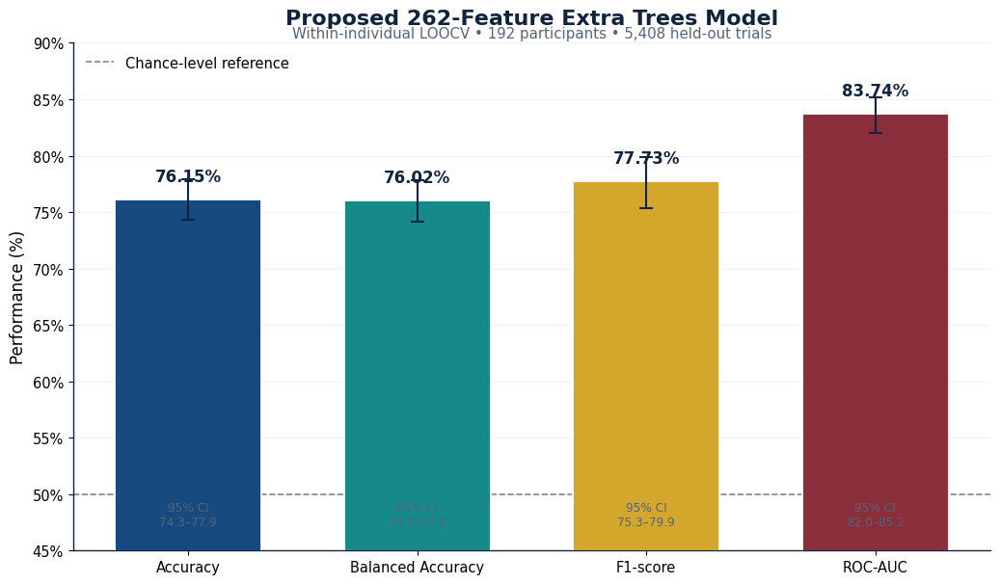

In [ ]:
# ============================================================
# CELL 6 — MAIN PERFORMANCE BAR PLOT
# ============================================================

metric_order = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC-AUC",
]

metric_colors = [
    DEEP_BLUE,
    TEAL,
    GOLD,
    BURGUNDY,
]


plot_df = (
    bootstrap_ci
    .set_index(
        "metric"
    )
    .loc[
        metric_order
    ]
    .reset_index()
)


values = (
    plot_df[
        "observed"
    ].to_numpy()
    *
    100
)

lower_errors = (
    plot_df[
        "observed"
    ].to_numpy()
    -
    plot_df[
        "ci_lower"
    ].to_numpy()
) * 100

upper_errors = (
    plot_df[
        "ci_upper"
    ].to_numpy()
    -
    plot_df[
        "observed"
    ].to_numpy()
) * 100


figure, axis = plt.subplots(
    figsize=(
        10.5,
        6.2
    )
)


bars = axis.bar(
    metric_order,
    values,
    color=metric_colors,
    width=0.64,
    edgecolor=WHITE,
    linewidth=1.3,
    zorder=3,
)


axis.errorbar(
    metric_order,
    values,
    yerr=np.vstack(
        [
            lower_errors,
            upper_errors,
        ]
    ),
    fmt="none",
    ecolor=NAVY,
    elinewidth=1.5,
    capsize=5,
    capthick=1.5,
    zorder=5,
)


axis.axhline(
    50,
    linestyle="--",
    linewidth=1.2,
    color=SLATE,
    alpha=0.75,
    label="Chance-level reference",
)


axis.set_ylim(
    45,
    90
)

axis.set_ylabel(
    "Performance (%)"
)

axis.set_title(
    "Proposed 262-Feature Extra Trees Model",
    color=NAVY,
    pad=14,
)

axis.text(
    0.5,
    1.005,
    (
        "Within-individual LOOCV • "
        "192 participants • 5,408 held-out trials"
    ),
    transform=axis.transAxes,
    ha="center",
    va="bottom",
    fontsize=10.8,
    color=SLATE,
)


for bar, value, lower, upper in zip(
    bars,
    values,
    plot_df[
        "ci_lower"
    ]
    *
    100,
    plot_df[
        "ci_upper"
    ]
    *
    100,
):

    axis.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        value
        +
        1.25,

        f"{value:.2f}%",

        ha="center",
        va="bottom",
        fontsize=12,
        fontweight="bold",
        color=NAVY,
    )

    axis.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        47.0,

        (
            f"95% CI\n"
            f"{lower:.1f}–{upper:.1f}"
        ),

        ha="center",
        va="bottom",
        fontsize=8.7,
        color=SLATE,
    )


axis.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100,
        decimals=0
    )
)

axis.grid(
    axis="y",
    zorder=0
)

axis.legend(
    loc="upper left"
)

clean_axis(
    axis
)

figure.tight_layout()


save_publication_figure(
    figure,
    "Figure_01_Main_Performance_With_95CI",
)

plt.show()

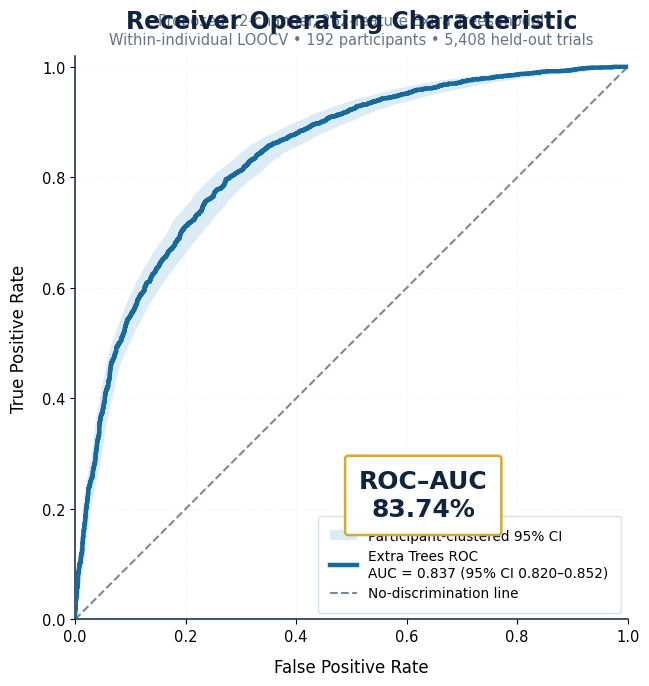

PREMIUM ROC FIGURE GENERATED
Observed ROC-AUC: 0.837358
Participant-clustered 95% CI: 0.820468–0.852250

Saved files:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Premium_ROC_AUC_Within_ExtraTrees.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Premium_ROC_AUC_Within_ExtraTrees.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Premium_ROC_AUC_Within_ExtraTrees.svg


In [ ]:
# ============================================================
# PREMIUM ROC–AUC FIGURE WITH PARTICIPANT-CLUSTERED 95% CI
#
# Required variables from earlier cells:
#   y_true
#   y_score
#   trial_subjects
#   FIGURE_DIR
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import (
    roc_curve,
    roc_auc_score,
)


# ============================================================
# Publication colours
# ============================================================

NAVY = "#10233F"
DEEP_BLUE = "#176B9C"
LIGHT_BLUE = "#C9E2F2"
GOLD = "#D4A72C"
SLATE = "#64748B"
WHITE = "#FFFFFF"


# ============================================================
# Observed ROC curve
# ============================================================

observed_fpr, observed_tpr, _ = roc_curve(
    y_true,
    y_score
)

observed_auc = roc_auc_score(
    y_true,
    y_score
)


# ============================================================
# Participant-clustered bootstrap
#
# Entire participants are resampled, preserving the clustered
# structure of repeated trials from the same participant.
# ============================================================

subject_to_indices = {
    subject_id: np.flatnonzero(
        trial_subjects == subject_id
    )
    for subject_id in np.unique(
        trial_subjects
    )
}

unique_subjects = np.asarray(
    list(
        subject_to_indices.keys()
    ),
    dtype=str
)

N_BOOTSTRAPS = 1000
RANDOM_STATE = 42

random_generator = np.random.default_rng(
    RANDOM_STATE
)

common_fpr_grid = np.linspace(
    0,
    1,
    501
)

bootstrap_tpr_curves = []
bootstrap_auc_values = []


for bootstrap_number in range(
    N_BOOTSTRAPS
):

    sampled_subjects = random_generator.choice(
        unique_subjects,
        size=len(
            unique_subjects
        ),
        replace=True
    )

    sampled_indices = np.concatenate(
        [
            subject_to_indices[
                subject_id
            ]
            for subject_id in sampled_subjects
        ]
    )

    bootstrap_y_true = y_true[
        sampled_indices
    ]

    bootstrap_y_score = y_score[
        sampled_indices
    ]

    # AUC requires both classes.
    if np.unique(
        bootstrap_y_true
    ).size < 2:

        continue

    bootstrap_fpr, bootstrap_tpr, _ = roc_curve(
        bootstrap_y_true,
        bootstrap_y_score
    )

    interpolated_tpr = np.interp(
        common_fpr_grid,
        bootstrap_fpr,
        bootstrap_tpr
    )

    interpolated_tpr[0] = 0.0
    interpolated_tpr[-1] = 1.0

    bootstrap_tpr_curves.append(
        interpolated_tpr
    )

    bootstrap_auc_values.append(
        roc_auc_score(
            bootstrap_y_true,
            bootstrap_y_score
        )
    )


bootstrap_tpr_curves = np.asarray(
    bootstrap_tpr_curves
)

bootstrap_auc_values = np.asarray(
    bootstrap_auc_values
)


lower_tpr = np.percentile(
    bootstrap_tpr_curves,
    2.5,
    axis=0
)

upper_tpr = np.percentile(
    bootstrap_tpr_curves,
    97.5,
    axis=0
)

auc_ci_lower = np.percentile(
    bootstrap_auc_values,
    2.5
)

auc_ci_upper = np.percentile(
    bootstrap_auc_values,
    97.5
)


# ============================================================
# Plot
# ============================================================

plt.rcParams.update(
    {
        "font.family": "DejaVu Sans",
        "font.size": 11,
        "axes.titlesize": 17,
        "axes.titleweight": "bold",
        "axes.labelsize": 12,
        "axes.edgecolor": NAVY,
        "axes.linewidth": 1.1,
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
    }
)


figure, axis = plt.subplots(
    figsize=(
        8.0,
        7.0
    ),
    facecolor=WHITE
)

axis.set_facecolor(
    WHITE
)


# 95% confidence region
axis.fill_between(
    common_fpr_grid,
    lower_tpr,
    upper_tpr,
    color=LIGHT_BLUE,
    alpha=0.65,
    linewidth=0,
    label="Participant-clustered 95% CI",
    zorder=1
)


# Observed ROC
axis.plot(
    observed_fpr,
    observed_tpr,
    color=DEEP_BLUE,
    linewidth=3.2,
    label=(
        f"Extra Trees ROC\n"
        f"AUC = {observed_auc:.3f} "
        f"(95% CI {auc_ci_lower:.3f}–{auc_ci_upper:.3f})"
    ),
    zorder=4
)


# Chance reference
axis.plot(
    [
        0,
        1
    ],
    [
        0,
        1
    ],
    linestyle="--",
    linewidth=1.5,
    color=SLATE,
    alpha=0.85,
    label="No-discrimination line",
    zorder=3
)


# Highlight the reported AUC
axis.text(
    0.63,
    0.22,
    f"ROC–AUC\n{observed_auc * 100:.2f}%",
    transform=axis.transAxes,
    ha="center",
    va="center",
    fontsize=18,
    fontweight="bold",
    color=NAVY,
    bbox={
        "boxstyle":
            "round,pad=0.55,"
            "rounding_size=0.12",

        "facecolor":
            WHITE,

        "edgecolor":
            GOLD,

        "linewidth":
            1.8,

        "alpha":
            0.97,
    },
    zorder=6
)


axis.set_xlim(
    0,
    1
)

axis.set_ylim(
    0,
    1.02
)

axis.set_xlabel(
    "False Positive Rate",
    labelpad=10
)

axis.set_ylabel(
    "True Positive Rate",
    labelpad=10
)

axis.set_title(
    "Receiver Operating Characteristic",
    color=NAVY,
    pad=20
)

axis.text(
    0.5,
    1.015,
    (
        "Proposed 12-channel, 262-feature Extra Trees model\n"
        "Within-individual LOOCV • 192 participants • "
        "5,408 held-out trials"
    ),
    transform=axis.transAxes,
    ha="center",
    va="bottom",
    fontsize=10.5,
    color=SLATE,
    linespacing=1.35
)


axis.grid(
    visible=True,
    linestyle="--",
    linewidth=0.7,
    alpha=0.25
)

axis.legend(
    loc="lower right",
    frameon=True,
    facecolor=WHITE,
    edgecolor="#D8E0E8",
    framealpha=0.96,
    fontsize=9.8,
    borderpad=0.9
)

axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)

axis.set_aspect(
    "equal",
    adjustable="box"
)

figure.tight_layout()


# ============================================================
# Save in three formats
# ============================================================

ROC_PNG_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ROC_AUC_Within_ExtraTrees.png"
)

ROC_PDF_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ROC_AUC_Within_ExtraTrees.pdf"
)

ROC_SVG_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ROC_AUC_Within_ExtraTrees.svg"
)


figure.savefig(
    ROC_PNG_PATH,
    dpi=600,
    bbox_inches="tight",
    pad_inches=0.15
)

figure.savefig(
    ROC_PDF_PATH,
    bbox_inches="tight",
    pad_inches=0.15
)

figure.savefig(
    ROC_SVG_PATH,
    bbox_inches="tight",
    pad_inches=0.15
)

plt.show()


print("=" * 78)
print("PREMIUM ROC FIGURE GENERATED")
print("=" * 78)

print(
    f"Observed ROC-AUC: "
    f"{observed_auc:.6f}"
)

print(
    f"Participant-clustered 95% CI: "
    f"{auc_ci_lower:.6f}–{auc_ci_upper:.6f}"
)

print("\nSaved files:")
print(ROC_PNG_PATH)
print(ROC_PDF_PATH)
print(ROC_SVG_PATH)

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_02_Confusion_Matrix.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_02_Confusion_Matrix.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_02_Confusion_Matrix.svg


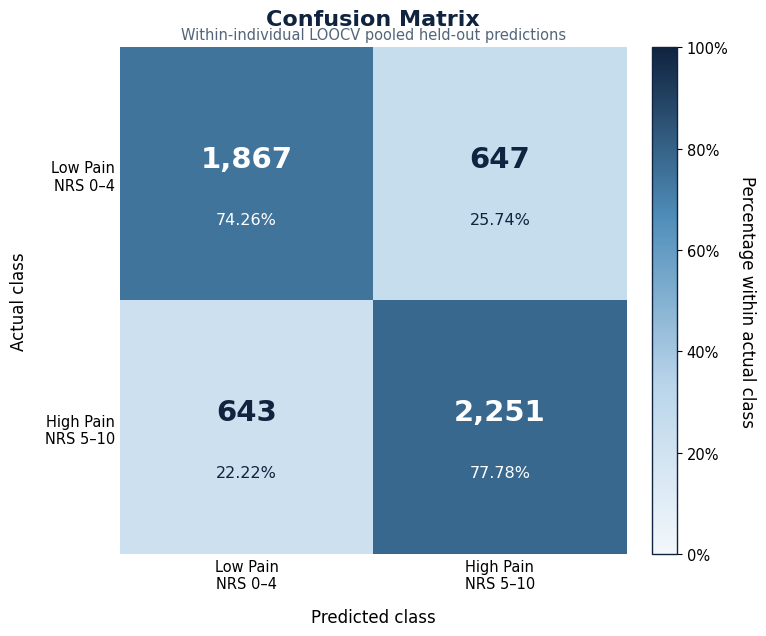

In [ ]:
# ============================================================
# CELL 7 — CONFUSION MATRIX
# ============================================================

matrix = confusion_matrix(
    y_true,
    y_pred,
    labels=[
        0,
        1
    ],
)

row_percentages = (
    matrix
    /
    matrix.sum(
        axis=1,
        keepdims=True
    )
    *
    100
)


confusion_cmap = (
    LinearSegmentedColormap.from_list(
        "premium_blue",
        [
            "#F3F7FB",
            "#B9D5EA",
            "#4F8DB8",
            NAVY,
        ]
    )
)


figure, axis = plt.subplots(
    figsize=(
        7.5,
        6.5
    )
)


image = axis.imshow(
    row_percentages,
    cmap=confusion_cmap,
    vmin=0,
    vmax=100,
)


class_labels = [
    "Low Pain\nNRS 0–4",
    "High Pain\nNRS 5–10",
]


axis.set_xticks(
    [
        0,
        1
    ],
    labels=class_labels,
)

axis.set_yticks(
    [
        0,
        1
    ],
    labels=class_labels,
)


axis.set_xlabel(
    "Predicted class",
    labelpad=12,
)

axis.set_ylabel(
    "Actual class",
    labelpad=12,
)

axis.set_title(
    "Confusion Matrix",
    color=NAVY,
    pad=16,
)

axis.text(
    0.5,
    1.01,
    (
        "Within-individual LOOCV pooled "
        "held-out predictions"
    ),
    transform=axis.transAxes,
    ha="center",
    va="bottom",
    fontsize=10.5,
    color=SLATE,
)


for row_index in range(
    2
):

    for column_index in range(
        2
    ):

        percentage_value = (
            row_percentages[
                row_index,
                column_index
            ]
        )

        count_value = matrix[
            row_index,
            column_index
        ]

        text_color = (
            WHITE
            if percentage_value >= 50
            else NAVY
        )

        axis.text(
            column_index,
            row_index - 0.06,
            f"{count_value:,}",
            ha="center",
            va="center",
            fontsize=21,
            fontweight="bold",
            color=text_color,
        )

        axis.text(
            column_index,
            row_index + 0.18,
            f"{percentage_value:.2f}%",
            ha="center",
            va="center",
            fontsize=11.5,
            color=text_color,
        )


colorbar = figure.colorbar(
    image,
    ax=axis,
    fraction=0.046,
    pad=0.045,
)

colorbar.set_label(
    "Percentage within actual class",
    rotation=270,
    labelpad=20,
)

colorbar.ax.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100
    )
)


axis.tick_params(
    axis="both",
    which="both",
    length=0,
)

for spine in axis.spines.values():
    spine.set_visible(False)


figure.tight_layout()


save_publication_figure(
    figure,
    "Figure_02_Confusion_Matrix",
)

plt.show()

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_04_Precision_Recall_Curve.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_04_Precision_Recall_Curve.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_04_Precision_Recall_Curve.svg


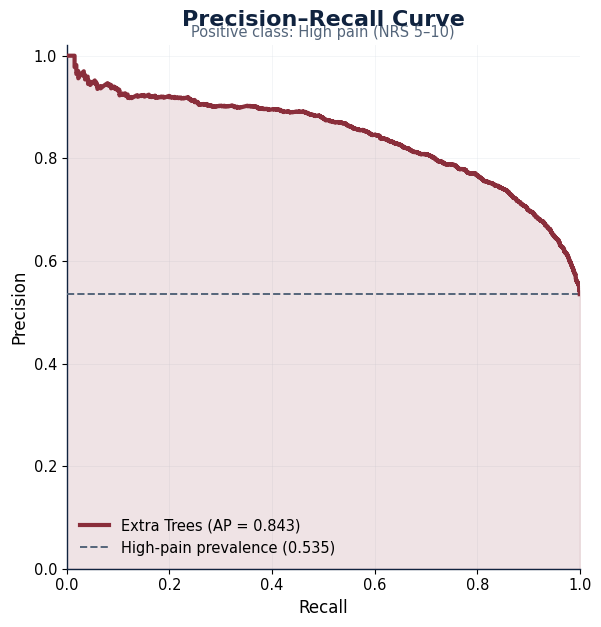

In [ ]:
# ============================================================
# CELL 9 — PRECISION–RECALL CURVE
# ============================================================

precision_values, recall_values, _ = (
    precision_recall_curve(
        y_true,
        y_score
    )
)

pr_auc_value = average_precision_score(
    y_true,
    y_score
)

high_pain_prevalence = np.mean(
    y_true == 1
)


figure, axis = plt.subplots(
    figsize=(
        7.4,
        6.4
    )
)


axis.plot(
    recall_values,
    precision_values,
    color=BURGUNDY,
    linewidth=3.0,
    label=(
        f"Extra Trees "
        f"(AP = {pr_auc_value:.3f})"
    ),
    zorder=4,
)

axis.fill_between(
    recall_values,
    precision_values,
    alpha=0.13,
    color=BURGUNDY,
    zorder=2,
)

axis.axhline(
    high_pain_prevalence,
    linestyle="--",
    linewidth=1.4,
    color=SLATE,
    label=(
        "High-pain prevalence "
        f"({high_pain_prevalence:.3f})"
    ),
    zorder=3,
)


axis.set_xlim(
    0,
    1
)

axis.set_ylim(
    0,
    1.02
)

axis.set_xlabel(
    "Recall"
)

axis.set_ylabel(
    "Precision"
)

axis.set_title(
    "Precision–Recall Curve",
    color=NAVY,
    pad=14,
)

axis.text(
    0.5,
    1.01,
    (
        "Positive class: High pain "
        "(NRS 5–10)"
    ),
    transform=axis.transAxes,
    ha="center",
    va="bottom",
    fontsize=10.5,
    color=SLATE,
)

axis.grid(
    alpha=0.35
)

axis.legend(
    loc="lower left"
)

axis.set_aspect(
    "equal",
    adjustable="box"
)

clean_axis(
    axis
)

figure.tight_layout()


save_publication_figure(
    figure,
    "Figure_04_Precision_Recall_Curve",
)

plt.show()

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_05_Class_Wise_Performance.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_05_Class_Wise_Performance.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_05_Class_Wise_Performance.svg


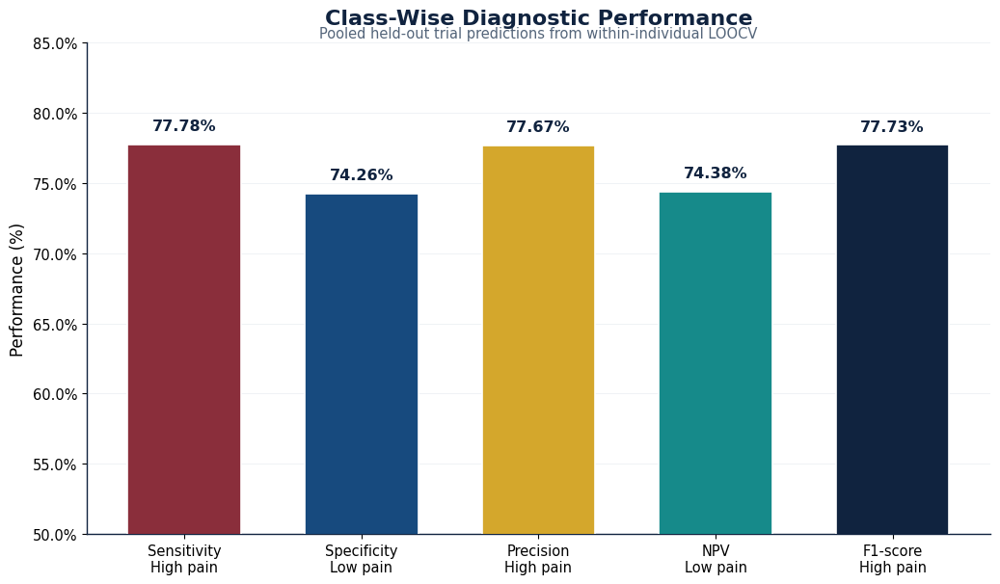

In [ ]:
# ============================================================
# CELL 10 — CLASS-WISE PERFORMANCE
# ============================================================

tn, fp, fn, tp = matrix.ravel()

sensitivity = tp / (
    tp + fn
)

specificity = tn / (
    tn + fp
)

precision_high = tp / (
    tp + fp
)

negative_predictive_value = tn / (
    tn + fn
)

f1_high = (
    2
    *
    precision_high
    *
    sensitivity
    /
    (
        precision_high
        +
        sensitivity
    )
)


diagnostic_names = [
    "Sensitivity\nHigh pain",
    "Specificity\nLow pain",
    "Precision\nHigh pain",
    "NPV\nLow pain",
    "F1-score\nHigh pain",
]

diagnostic_values = np.array(
    [
        sensitivity,
        specificity,
        precision_high,
        negative_predictive_value,
        f1_high,
    ]
) * 100

diagnostic_colors = [
    BURGUNDY,
    DEEP_BLUE,
    GOLD,
    TEAL,
    NAVY,
]


figure, axis = plt.subplots(
    figsize=(
        10.5,
        6.2
    )
)


bars = axis.bar(
    diagnostic_names,
    diagnostic_values,
    color=diagnostic_colors,
    width=0.64,
    edgecolor=WHITE,
    linewidth=1.2,
    zorder=3,
)


axis.set_ylim(
    50,
    85
)

axis.set_ylabel(
    "Performance (%)"
)

axis.set_title(
    "Class-Wise Diagnostic Performance",
    color=NAVY,
    pad=14,
)

axis.text(
    0.5,
    1.005,
    (
        "Pooled held-out trial predictions "
        "from within-individual LOOCV"
    ),
    transform=axis.transAxes,
    ha="center",
    va="bottom",
    fontsize=10.5,
    color=SLATE,
)


for bar, value in zip(
    bars,
    diagnostic_values
):

    axis.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        value
        +
        0.8,

        f"{value:.2f}%",

        ha="center",
        va="bottom",
        fontsize=11.5,
        fontweight="bold",
        color=NAVY,
    )


axis.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100
    )
)

axis.grid(
    axis="y",
    zorder=0
)

clean_axis(
    axis
)

figure.tight_layout()


save_publication_figure(
    figure,
    "Figure_05_Class_Wise_Performance",
)

plt.show()

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_06_Participant_Accuracy_Distribution.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_06_Participant_Accuracy_Distribution.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_06_Participant_Accuracy_Distribution.svg


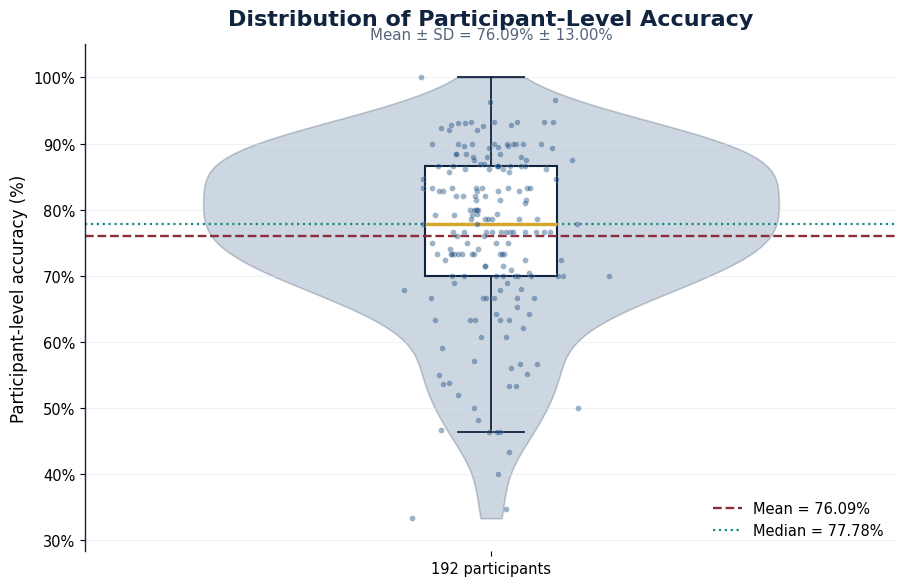

In [ ]:
# ============================================================
# CELL 11 — PARTICIPANT ACCURACY DISTRIBUTION
# ============================================================

SUBJECT_RESULTS_ID_COLUMN = find_column(
    subject_results,
    [
        "subject_id",
        "subject",
        "participant_id",
        "participant",
        "test_subject",
    ],
    "subject identifier in subject results",
)

SUBJECT_ACCURACY_COLUMN = find_column(
    subject_results,
    [
        "accuracy",
        "subject_accuracy",
    ],
    "subject accuracy column",
)


subject_accuracy = (
    subject_results[
        SUBJECT_ACCURACY_COLUMN
    ].to_numpy(
        dtype=float
    )
    *
    100
)


subject_mean = np.mean(
    subject_accuracy
)

subject_sd = np.std(
    subject_accuracy,
    ddof=1
)

subject_median = np.median(
    subject_accuracy
)


figure, axis = plt.subplots(
    figsize=(
        9.2,
        6.0
    )
)


violin = axis.violinplot(
    subject_accuracy,
    positions=[
        1
    ],
    widths=0.78,
    showmeans=False,
    showmedians=False,
    showextrema=False,
)


for body in violin[
    "bodies"
]:

    body.set_facecolor(
        DEEP_BLUE
    )

    body.set_edgecolor(
        NAVY
    )

    body.set_alpha(
        0.22
    )

    body.set_linewidth(
        1.2
    )


axis.boxplot(
    subject_accuracy,
    positions=[
        1
    ],
    widths=0.18,
    patch_artist=True,
    showfliers=False,
    boxprops={
        "facecolor":
            WHITE,

        "edgecolor":
            NAVY,

        "linewidth":
            1.5,
    },
    medianprops={
        "color":
            GOLD,

        "linewidth":
            2.4,
    },
    whiskerprops={
        "color":
            NAVY,

        "linewidth":
            1.3,
    },
    capprops={
        "color":
            NAVY,

        "linewidth":
            1.3,
    },
)


random_generator = np.random.default_rng(
    42
)

jittered_positions = (
    1
    +
    random_generator.normal(
        0,
        0.055,
        size=len(
            subject_accuracy
        )
    )
)


axis.scatter(
    jittered_positions,
    subject_accuracy,
    s=18,
    alpha=0.42,
    color=DEEP_BLUE,
    edgecolor=WHITE,
    linewidth=0.3,
    zorder=3,
)


axis.axhline(
    subject_mean,
    color=BURGUNDY,
    linewidth=1.7,
    linestyle="--",
    label=(
        f"Mean = {subject_mean:.2f}%"
    ),
)

axis.axhline(
    subject_median,
    color=TEAL,
    linewidth=1.6,
    linestyle=":",
    label=(
        f"Median = {subject_median:.2f}%"
    ),
)


axis.set_xlim(
    0.45,
    1.55
)

axis.set_ylim(
    max(
        0,
        subject_accuracy.min()
        -
        5
    ),
    min(
        105,
        subject_accuracy.max()
        +
        5
    ),
)

axis.set_xticks(
    [
        1
    ],
    labels=[
        "192 participants"
    ],
)

axis.set_ylabel(
    "Participant-level accuracy (%)"
)

axis.set_title(
    "Distribution of Participant-Level Accuracy",
    color=NAVY,
    pad=14,
)

axis.text(
    0.5,
    1.005,
    (
        f"Mean ± SD = "
        f"{subject_mean:.2f}% ± "
        f"{subject_sd:.2f}%"
    ),
    transform=axis.transAxes,
    ha="center",
    va="bottom",
    fontsize=10.8,
    color=SLATE,
)


axis.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100
    )
)

axis.grid(
    axis="y"
)

axis.legend(
    loc="lower right"
)

clean_axis(
    axis,
    keep_bottom=False,
)

figure.tight_layout()


save_publication_figure(
    figure,
    "Figure_06_Participant_Accuracy_Distribution",
)

plt.show()

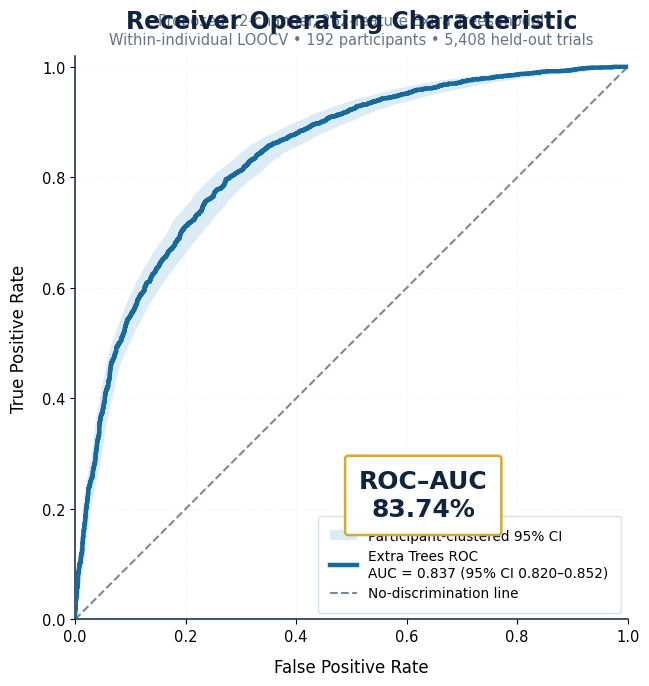

PREMIUM ROC FIGURE GENERATED
Observed ROC-AUC: 0.837358
Participant-clustered 95% CI: 0.820468–0.852250

Saved files:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Premium_ROC_AUC_Within_ExtraTrees.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Premium_ROC_AUC_Within_ExtraTrees.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Premium_ROC_AUC_Within_ExtraTrees.svg


In [ ]:
# ============================================================
# PREMIUM ROC–AUC FIGURE WITH PARTICIPANT-CLUSTERED 95% CI
#
# Required variables from earlier cells:
#   y_true
#   y_score
#   trial_subjects
#   FIGURE_DIR
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import (
    roc_curve,
    roc_auc_score,
)


# ============================================================
# Publication colours
# ============================================================

NAVY = "#10233F"
DEEP_BLUE = "#176B9C"
LIGHT_BLUE = "#C9E2F2"
GOLD = "#D4A72C"
SLATE = "#64748B"
WHITE = "#FFFFFF"


# ============================================================
# Observed ROC curve
# ============================================================

observed_fpr, observed_tpr, _ = roc_curve(
    y_true,
    y_score
)

observed_auc = roc_auc_score(
    y_true,
    y_score
)


# ============================================================
# Participant-clustered bootstrap
#
# Entire participants are resampled, preserving the clustered
# structure of repeated trials from the same participant.
# ============================================================

subject_to_indices = {
    subject_id: np.flatnonzero(
        trial_subjects == subject_id
    )
    for subject_id in np.unique(
        trial_subjects
    )
}

unique_subjects = np.asarray(
    list(
        subject_to_indices.keys()
    ),
    dtype=str
)

N_BOOTSTRAPS = 1000
RANDOM_STATE = 42

random_generator = np.random.default_rng(
    RANDOM_STATE
)

common_fpr_grid = np.linspace(
    0,
    1,
    501
)

bootstrap_tpr_curves = []
bootstrap_auc_values = []


for bootstrap_number in range(
    N_BOOTSTRAPS
):

    sampled_subjects = random_generator.choice(
        unique_subjects,
        size=len(
            unique_subjects
        ),
        replace=True
    )

    sampled_indices = np.concatenate(
        [
            subject_to_indices[
                subject_id
            ]
            for subject_id in sampled_subjects
        ]
    )

    bootstrap_y_true = y_true[
        sampled_indices
    ]

    bootstrap_y_score = y_score[
        sampled_indices
    ]

    # AUC requires both classes.
    if np.unique(
        bootstrap_y_true
    ).size < 2:

        continue

    bootstrap_fpr, bootstrap_tpr, _ = roc_curve(
        bootstrap_y_true,
        bootstrap_y_score
    )

    interpolated_tpr = np.interp(
        common_fpr_grid,
        bootstrap_fpr,
        bootstrap_tpr
    )

    interpolated_tpr[0] = 0.0
    interpolated_tpr[-1] = 1.0

    bootstrap_tpr_curves.append(
        interpolated_tpr
    )

    bootstrap_auc_values.append(
        roc_auc_score(
            bootstrap_y_true,
            bootstrap_y_score
        )
    )


bootstrap_tpr_curves = np.asarray(
    bootstrap_tpr_curves
)

bootstrap_auc_values = np.asarray(
    bootstrap_auc_values
)


lower_tpr = np.percentile(
    bootstrap_tpr_curves,
    2.5,
    axis=0
)

upper_tpr = np.percentile(
    bootstrap_tpr_curves,
    97.5,
    axis=0
)

auc_ci_lower = np.percentile(
    bootstrap_auc_values,
    2.5
)

auc_ci_upper = np.percentile(
    bootstrap_auc_values,
    97.5
)


# ============================================================
# Plot
# ============================================================

plt.rcParams.update(
    {
        "font.family": "DejaVu Sans",
        "font.size": 11,
        "axes.titlesize": 17,
        "axes.titleweight": "bold",
        "axes.labelsize": 12,
        "axes.edgecolor": NAVY,
        "axes.linewidth": 1.1,
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
    }
)


figure, axis = plt.subplots(
    figsize=(
        8.0,
        7.0
    ),
    facecolor=WHITE
)

axis.set_facecolor(
    WHITE
)


# 95% confidence region
axis.fill_between(
    common_fpr_grid,
    lower_tpr,
    upper_tpr,
    color=LIGHT_BLUE,
    alpha=0.65,
    linewidth=0,
    label="Participant-clustered 95% CI",
    zorder=1
)


# Observed ROC
axis.plot(
    observed_fpr,
    observed_tpr,
    color=DEEP_BLUE,
    linewidth=3.2,
    label=(
        f"Extra Trees ROC\n"
        f"AUC = {observed_auc:.3f} "
        f"(95% CI {auc_ci_lower:.3f}–{auc_ci_upper:.3f})"
    ),
    zorder=4
)


# Chance reference
axis.plot(
    [
        0,
        1
    ],
    [
        0,
        1
    ],
    linestyle="--",
    linewidth=1.5,
    color=SLATE,
    alpha=0.85,
    label="No-discrimination line",
    zorder=3
)


# Highlight the reported AUC
axis.text(
    0.63,
    0.22,
    f"ROC–AUC\n{observed_auc * 100:.2f}%",
    transform=axis.transAxes,
    ha="center",
    va="center",
    fontsize=18,
    fontweight="bold",
    color=NAVY,
    bbox={
        "boxstyle":
            "round,pad=0.55,"
            "rounding_size=0.12",

        "facecolor":
            WHITE,

        "edgecolor":
            GOLD,

        "linewidth":
            1.8,

        "alpha":
            0.97,
    },
    zorder=6
)


axis.set_xlim(
    0,
    1
)

axis.set_ylim(
    0,
    1.02
)

axis.set_xlabel(
    "False Positive Rate",
    labelpad=10
)

axis.set_ylabel(
    "True Positive Rate",
    labelpad=10
)

axis.set_title(
    "Receiver Operating Characteristic",
    color=NAVY,
    pad=20
)

axis.text(
    0.5,
    1.015,
    (
        "Proposed 12-channel, 262-feature Extra Trees model\n"
        "Within-individual LOOCV • 192 participants • "
        "5,408 held-out trials"
    ),
    transform=axis.transAxes,
    ha="center",
    va="bottom",
    fontsize=10.5,
    color=SLATE,
    linespacing=1.35
)


axis.grid(
    visible=True,
    linestyle="--",
    linewidth=0.7,
    alpha=0.25
)

axis.legend(
    loc="lower right",
    frameon=True,
    facecolor=WHITE,
    edgecolor="#D8E0E8",
    framealpha=0.96,
    fontsize=9.8,
    borderpad=0.9
)

axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)

axis.set_aspect(
    "equal",
    adjustable="box"
)

figure.tight_layout()


# ============================================================
# Save in three formats
# ============================================================

ROC_PNG_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ROC_AUC_Within_ExtraTrees.png"
)

ROC_PDF_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ROC_AUC_Within_ExtraTrees.pdf"
)

ROC_SVG_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ROC_AUC_Within_ExtraTrees.svg"
)


figure.savefig(
    ROC_PNG_PATH,
    dpi=600,
    bbox_inches="tight",
    pad_inches=0.15
)

figure.savefig(
    ROC_PDF_PATH,
    bbox_inches="tight",
    pad_inches=0.15
)

figure.savefig(
    ROC_SVG_PATH,
    bbox_inches="tight",
    pad_inches=0.15
)

plt.show()


print("=" * 78)
print("PREMIUM ROC FIGURE GENERATED")
print("=" * 78)

print(
    f"Observed ROC-AUC: "
    f"{observed_auc:.6f}"
)

print(
    f"Participant-clustered 95% CI: "
    f"{auc_ci_lower:.6f}–{auc_ci_upper:.6f}"
)

print("\nSaved files:")
print(ROC_PNG_PATH)
print(ROC_PDF_PATH)
print(ROC_SVG_PATH)

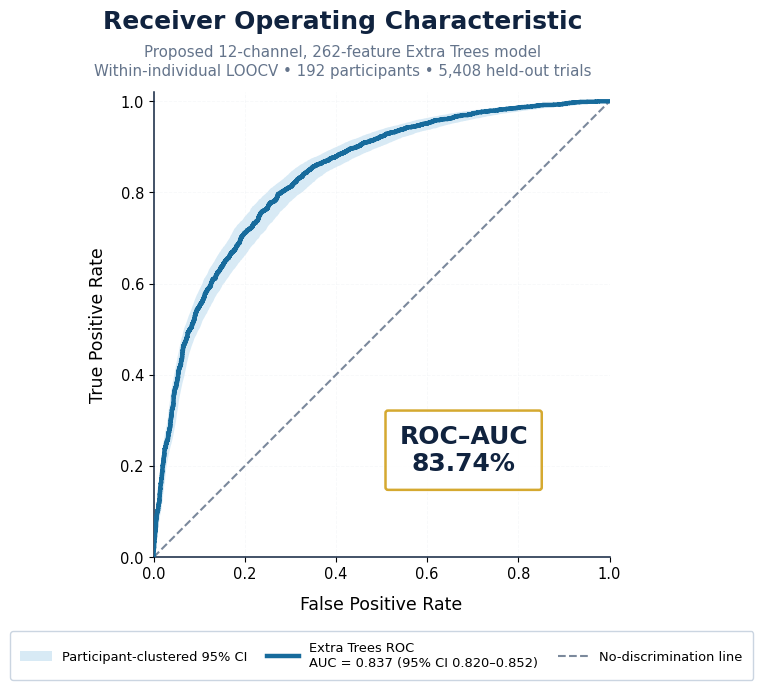

FIXED PREMIUM ROC FIGURE GENERATED
ROC-AUC: 0.837358
Participant-clustered 95% CI: 0.820468–0.852250

Saved files:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Premium_ROC_AUC_Within_ExtraTrees_FIXED.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Premium_ROC_AUC_Within_ExtraTrees_FIXED.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Premium_ROC_AUC_Within_ExtraTrees_FIXED.svg


In [ ]:
# ============================================================
# FIXED PREMIUM ROC–AUC FIGURE
# No title, subtitle, card, or legend overlap
#
# Requires these variables from the earlier ROC cell:
#   observed_fpr
#   observed_tpr
#   observed_auc
#   common_fpr_grid
#   lower_tpr
#   upper_tpr
#   auc_ci_lower
#   auc_ci_upper
#   FIGURE_DIR
# ============================================================

import os
import matplotlib.pyplot as plt


# ============================================================
# Premium colours
# ============================================================

NAVY = "#10233F"
DEEP_BLUE = "#176B9C"
LIGHT_BLUE = "#C9E2F2"
GOLD = "#D4A72C"
SLATE = "#64748B"
LIGHT_BORDER = "#CBD5E1"
WHITE = "#FFFFFF"


# ============================================================
# Global style
# ============================================================

plt.rcParams.update(
    {
        "font.family": "DejaVu Sans",
        "font.size": 11,
        "axes.labelsize": 12.5,
        "axes.labelweight": "medium",
        "xtick.labelsize": 10.5,
        "ytick.labelsize": 10.5,
        "axes.edgecolor": NAVY,
        "axes.linewidth": 1.1,
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
    }
)


# ============================================================
# Create a slightly wider figure
# ============================================================

figure, axis = plt.subplots(
    figsize=(8.6, 7.5),
    facecolor=WHITE,
)

axis.set_facecolor(
    WHITE
)


# ============================================================
# Confidence interval
# ============================================================

axis.fill_between(
    common_fpr_grid,
    lower_tpr,
    upper_tpr,
    color=LIGHT_BLUE,
    alpha=0.72,
    linewidth=0,
    label="Participant-clustered 95% CI",
    zorder=1,
)


# ============================================================
# Observed ROC curve
# ============================================================

axis.plot(
    observed_fpr,
    observed_tpr,
    color=DEEP_BLUE,
    linewidth=3.2,
    label=(
        "Extra Trees ROC\n"
        f"AUC = {observed_auc:.3f} "
        f"(95% CI {auc_ci_lower:.3f}–{auc_ci_upper:.3f})"
    ),
    zorder=4,
)


# ============================================================
# Chance-level line
# ============================================================

axis.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=1.5,
    color=SLATE,
    alpha=0.85,
    label="No-discrimination line",
    zorder=3,
)


# ============================================================
# ROC-AUC card
#
# Moved away from legend.
# ============================================================

axis.text(
    0.68,
    0.23,
    (
        "ROC–AUC\n"
        f"{observed_auc * 100:.2f}%"
    ),
    transform=axis.transAxes,
    ha="center",
    va="center",
    fontsize=18,
    fontweight="bold",
    color=NAVY,
    linespacing=1.20,
    bbox={
        "boxstyle": "round,pad=0.55,rounding_size=0.10",
        "facecolor": WHITE,
        "edgecolor": GOLD,
        "linewidth": 1.8,
        "alpha": 0.98,
    },
    zorder=7,
)


# ============================================================
# Axes formatting
# ============================================================

axis.set_xlim(
    0,
    1
)

axis.set_ylim(
    0,
    1.02
)

axis.set_xlabel(
    "False Positive Rate",
    labelpad=10,
)

axis.set_ylabel(
    "True Positive Rate",
    labelpad=10,
)

axis.grid(
    visible=True,
    linestyle="--",
    linewidth=0.65,
    alpha=0.22,
)


# ============================================================
# Figure-level title and subtitle
#
# Using figure text prevents overlap with the axes.
# ============================================================

figure.suptitle(
    "Receiver Operating Characteristic",
    x=0.5,
    y=0.975,
    ha="center",
    va="top",
    fontsize=18,
    fontweight="bold",
    color=NAVY,
)

figure.text(
    0.5,
    0.928,
    (
        "Proposed 12-channel, 262-feature Extra Trees model\n"
        "Within-individual LOOCV • 192 participants • "
        "5,408 held-out trials"
    ),
    ha="center",
    va="top",
    fontsize=10.8,
    color=SLATE,
    linespacing=1.35,
)


# ============================================================
# Legend below the graph
#
# ncol=3 keeps it compact and prevents overlap.
# ============================================================

legend = axis.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, -0.145),
    ncol=3,
    frameon=True,
    facecolor=WHITE,
    edgecolor=LIGHT_BORDER,
    framealpha=1.0,
    fontsize=9.4,
    handlelength=2.4,
    columnspacing=1.5,
    borderpad=0.8,
)

legend.get_frame().set_linewidth(
    1.0
)


# ============================================================
# Clean spines
# ============================================================

axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)

axis.set_aspect(
    "equal",
    adjustable="box",
)


# ============================================================
# Reserve space manually
#
# top prevents title collision.
# bottom provides space for legend.
# ============================================================

figure.subplots_adjust(
    left=0.12,
    right=0.97,
    top=0.865,
    bottom=0.245,
)


# ============================================================
# Save
# ============================================================

ROC_PNG_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ROC_AUC_Within_ExtraTrees_FIXED.png",
)

ROC_PDF_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ROC_AUC_Within_ExtraTrees_FIXED.pdf",
)

ROC_SVG_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ROC_AUC_Within_ExtraTrees_FIXED.svg",
)


figure.savefig(
    ROC_PNG_PATH,
    dpi=600,
    bbox_inches="tight",
    pad_inches=0.18,
)

figure.savefig(
    ROC_PDF_PATH,
    bbox_inches="tight",
    pad_inches=0.18,
)

figure.savefig(
    ROC_SVG_PATH,
    bbox_inches="tight",
    pad_inches=0.18,
)

plt.show()


print("=" * 78)
print("FIXED PREMIUM ROC FIGURE GENERATED")
print("=" * 78)

print(
    f"ROC-AUC: {observed_auc:.6f}"
)

print(
    "Participant-clustered 95% CI:",
    f"{auc_ci_lower:.6f}–{auc_ci_upper:.6f}",
)

print("\nSaved files:")
print(ROC_PNG_PATH)
print(ROC_PDF_PATH)
print(ROC_SVG_PATH)

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_07_Sorted_Participant_Accuracy.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_07_Sorted_Participant_Accuracy.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_07_Sorted_Participant_Accuracy.svg


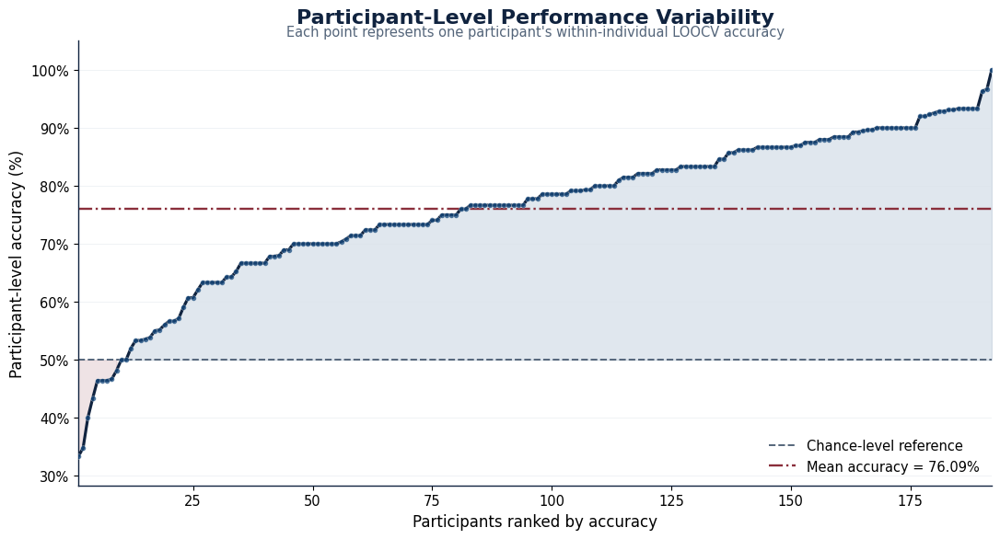

In [ ]:
# ============================================================
# CELL 12 — SORTED PARTICIPANT ACCURACY PROFILE
# ============================================================

sorted_accuracy = np.sort(
    subject_accuracy
)

participant_rank = np.arange(
    1,
    len(
        sorted_accuracy
    ) + 1
)


figure, axis = plt.subplots(
    figsize=(
        11.0,
        6.0
    )
)


axis.fill_between(
    participant_rank,
    sorted_accuracy,
    50,
    where=(
        sorted_accuracy
        >=
        50
    ),
    color=DEEP_BLUE,
    alpha=0.13,
)

axis.fill_between(
    participant_rank,
    sorted_accuracy,
    50,
    where=(
        sorted_accuracy
        <
        50
    ),
    color=BURGUNDY,
    alpha=0.13,
)


axis.plot(
    participant_rank,
    sorted_accuracy,
    color=NAVY,
    linewidth=2.3,
    zorder=4,
)

axis.scatter(
    participant_rank,
    sorted_accuracy,
    s=17,
    color=DEEP_BLUE,
    alpha=0.75,
    edgecolor=WHITE,
    linewidth=0.25,
    zorder=5,
)


axis.axhline(
    50,
    linestyle="--",
    linewidth=1.4,
    color=SLATE,
    label="Chance-level reference",
)

axis.axhline(
    subject_mean,
    linestyle="-.",
    linewidth=1.7,
    color=BURGUNDY,
    label=(
        f"Mean accuracy = "
        f"{subject_mean:.2f}%"
    ),
)


axis.set_xlim(
    1,
    len(
        sorted_accuracy
    )
)

axis.set_ylim(
    max(
        0,
        sorted_accuracy.min()
        -
        5
    ),
    min(
        105,
        sorted_accuracy.max()
        +
        5
    ),
)

axis.set_xlabel(
    "Participants ranked by accuracy"
)

axis.set_ylabel(
    "Participant-level accuracy (%)"
)

axis.set_title(
    "Participant-Level Performance Variability",
    color=NAVY,
    pad=14,
)

axis.text(
    0.5,
    1.005,
    (
        "Each point represents one participant's "
        "within-individual LOOCV accuracy"
    ),
    transform=axis.transAxes,
    ha="center",
    va="bottom",
    fontsize=10.5,
    color=SLATE,
)


axis.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100
    )
)

axis.grid(
    axis="y"
)

axis.legend(
    loc="lower right"
)

clean_axis(
    axis
)

figure.tight_layout()


save_publication_figure(
    figure,
    "Figure_07_Sorted_Participant_Accuracy",
)

plt.show()

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_08_Thesis_Defense_Result_Card.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_08_Thesis_Defense_Result_Card.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/Figure_08_Thesis_Defense_Result_Card.svg


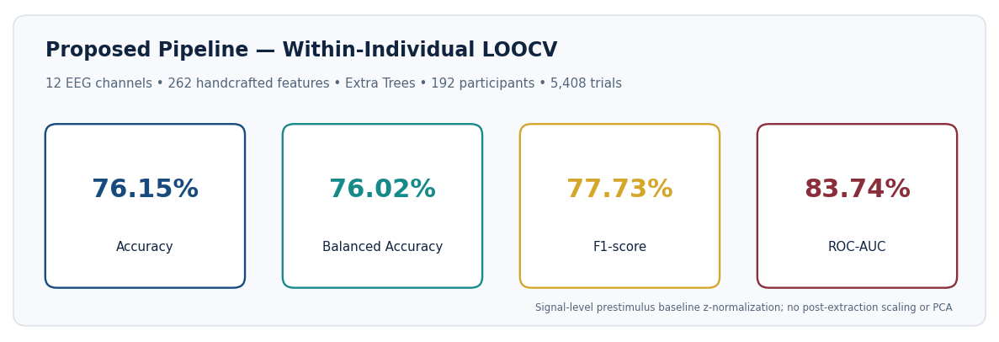

In [ ]:
# ============================================================
# CELL 13 — COMPACT THESIS-DEFENSE RESULT CARD
# ============================================================

accuracy_value = (
    accuracy_score(
        y_true,
        y_pred
    )
    *
    100
)

balanced_accuracy_value = (
    balanced_accuracy_score(
        y_true,
        y_pred
    )
    *
    100
)

f1_value = (
    f1_score(
        y_true,
        y_pred
    )
    *
    100
)

roc_auc_percent = (
    roc_auc_score(
        y_true,
        y_score
    )
    *
    100
)


figure, axis = plt.subplots(
    figsize=(
        12,
        4.2
    )
)

axis.set_xlim(
    0,
    12
)

axis.set_ylim(
    0,
    4.2
)

axis.axis(
    "off"
)


background = FancyBboxPatch(
    (
        0.08,
        0.12
    ),
    11.84,
    3.96,
    boxstyle=(
        "round,pad=0.02,"
        "rounding_size=0.16"
    ),
    facecolor=VERY_LIGHT,
    edgecolor=LIGHT_SLATE,
    linewidth=1.2,
)

axis.add_patch(
    background
)


axis.text(
    0.45,
    3.58,
    "Proposed Pipeline — Within-Individual LOOCV",
    fontsize=17,
    fontweight="bold",
    color=NAVY,
    ha="left",
)

axis.text(
    0.45,
    3.18,
    (
        "12 EEG channels • 262 handcrafted features • "
        "Extra Trees • 192 participants • 5,408 trials"
    ),
    fontsize=10.8,
    color=SLATE,
    ha="left",
)


metric_card_values = [
    accuracy_value,
    balanced_accuracy_value,
    f1_value,
    roc_auc_percent,
]

metric_card_labels = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC-AUC",
]

metric_card_colors = [
    DEEP_BLUE,
    TEAL,
    GOLD,
    BURGUNDY,
]

card_x_positions = [
    0.48,
    3.38,
    6.28,
    9.18,
]


for x_position, label, value, color in zip(
    card_x_positions,
    metric_card_labels,
    metric_card_values,
    metric_card_colors,
):

    card = FancyBboxPatch(
        (
            x_position,
            0.62
        ),
        2.38,
        2.05,
        boxstyle=(
            "round,pad=0.03,"
            "rounding_size=0.14"
        ),
        facecolor=WHITE,
        edgecolor=color,
        linewidth=1.7,
    )

    axis.add_patch(
        card
    )

    axis.text(
        x_position
        +
        1.19,
        1.86,
        f"{value:.2f}%",
        ha="center",
        va="center",
        fontsize=22,
        fontweight="bold",
        color=color,
    )

    axis.text(
        x_position
        +
        1.19,
        1.12,
        label,
        ha="center",
        va="center",
        fontsize=10.8,
        fontweight="medium",
        color=NAVY,
    )


axis.text(
    11.53,
    0.30,
    (
        "Signal-level prestimulus baseline "
        "z-normalization; no post-extraction scaling or PCA"
    ),
    fontsize=8.5,
    color=SLATE,
    ha="right",
)


figure.tight_layout()


save_publication_figure(
    figure,
    "Figure_08_Thesis_Defense_Result_Card",
)

plt.show()

In [ ]:
# ============================================================
# CELL 14 — SAVE FINAL PUBLICATION RESULT TABLE
# ============================================================

publication_table = pd.DataFrame(
    [
        {
            "Validation":
                "Within-individual LOOCV",

            "Participants":
                192,

            "Trials":
                5408,

            "Features":
                262,

            "Accuracy (%)":
                accuracy_score(
                    y_true,
                    y_pred
                )
                *
                100,

            "Balanced Accuracy (%)":
                balanced_accuracy_score(
                    y_true,
                    y_pred
                )
                *
                100,

            "Precision (%)":
                precision_score(
                    y_true,
                    y_pred,
                    zero_division=0
                )
                *
                100,

            "Recall/Sensitivity (%)":
                recall_score(
                    y_true,
                    y_pred,
                    zero_division=0
                )
                *
                100,

            "Specificity (%)":
                specificity
                *
                100,

            "F1-score (%)":
                f1_score(
                    y_true,
                    y_pred,
                    zero_division=0
                )
                *
                100,

            "ROC-AUC (%)":
                roc_auc_score(
                    y_true,
                    y_score
                )
                *
                100,

            "PR-AUC (%)":
                average_precision_score(
                    y_true,
                    y_score
                )
                *
                100,

            "TN":
                int(tn),

            "FP":
                int(fp),

            "FN":
                int(fn),

            "TP":
                int(tp),

            "Mean subject accuracy (%)":
                subject_mean,

            "Subject accuracy SD (%)":
                subject_sd,
        }
    ]
).round(
    2
)


PUBLICATION_TABLE_PATH = os.path.join(
    FIGURE_DIR,
    "V8_ExtraTrees_Within_LOOCV_Publication_Table.csv"
)

publication_table.to_csv(
    PUBLICATION_TABLE_PATH,
    index=False
)


display(
    publication_table
)

print("\nSaved:")
print(PUBLICATION_TABLE_PATH)

,Validation,Participants,Trials,Features,Accuracy (%),Balanced Accuracy (%),Precision (%),Recall/Sensitivity (%),Specificity (%),F1-score (%),ROC-AUC (%),PR-AUC (%),TN,FP,FN,TP,Mean subject accuracy (%),Subject accuracy SD (%)
0,Within-individual LOOCV,192,5408,262,76.15,76.02,77.67,77.78,74.26,77.73,83.74,84.31,1867,647,643,2251,76.09,13.0



Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/PUBLICATION_LEVEL_FIGURES/V8_ExtraTrees_Within_LOOCV_Publication_Table.csv


In [ ]:
# ============================================================
# V8 RESTART CELL
#
# Run after reopening Colab and mounting Google Drive.
#
# Loads:
#   X_handcrafted              -> raw V8 262 features
#   X_handcrafted_standardized -> V8 subject-standardized features
#   y                          -> binary pain labels
#   groups                     -> participant IDs
#   feature_names              -> 262 feature names
# ============================================================

import os
import json
import warnings

import numpy as np
import pandas as pd

warnings.filterwarnings("ignore")


# ============================================================
# 1. V8 directories
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

ALIGNED_DIR = os.path.join(
    V8_DIR,
    "aligned_data"
)

os.makedirs(
    FEATURE_DIR,
    exist_ok=True
)

os.makedirs(
    ALIGNED_DIR,
    exist_ok=True
)


# ============================================================
# 2. Saved V8 file paths
# ============================================================

X_HANDCRAFTED_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

X_STANDARDIZED_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_262_subject_standardized.npy"
)

Y_PATH = os.path.join(
    ALIGNED_DIR,
    "y_v8_binary_6275.npy"
)

GROUPS_PATH = os.path.join(
    ALIGNED_DIR,
    "groups_v8_subject_6275.npy"
)

FEATURE_NAMES_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_names_262.csv"
)


# ============================================================
# 3. Confirm required saved files exist
# ============================================================

required_paths = [
    X_HANDCRAFTED_PATH,
    Y_PATH,
    GROUPS_PATH,
    FEATURE_NAMES_PATH,
]

missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]

if missing_paths:

    raise FileNotFoundError(
        "The following required files were not found:\n\n"
        + "\n".join(missing_paths)
    )


# ============================================================
# 4. Load raw V8 handcrafted features
# ============================================================

X_handcrafted = np.load(
    X_HANDCRAFTED_PATH,
    mmap_mode="r"
)

y = np.load(
    Y_PATH
).astype(
    np.int8,
    copy=False
).ravel()

groups_raw = np.load(
    GROUPS_PATH,
    allow_pickle=True
).ravel()


def clean_subject_id(value):

    if isinstance(value, bytes):
        value = value.decode("utf-8")

    return str(value).strip()


groups = np.asarray(
    [
        clean_subject_id(value)
        for value in groups_raw
    ],
    dtype=str
)


feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)

if "feature_name" in feature_names_df.columns:

    feature_names = (
        feature_names_df["feature_name"]
        .astype(str)
        .tolist()
    )

else:

    feature_names = (
        feature_names_df.iloc[:, -1]
        .astype(str)
        .tolist()
    )


# ============================================================
# 5. Load or create V8 subject-standardized features
#
# Used only for cross-individual LOSO.
#
# Each feature is standardized separately within each subject:
#
#     z = (x - subject mean) / subject SD
#
# This follows the same preparation used in your V7 LOSO.
# ============================================================

if os.path.exists(
    X_STANDARDIZED_PATH
):

    X_handcrafted_standardized = np.load(
        X_STANDARDIZED_PATH,
        mmap_mode="r"
    )

    print(
        "Loaded saved V8 subject-standardized features."
    )

else:

    print(
        "V8 standardized feature file was not found."
    )

    print(
        "Calculating V7-style subject-wise standardization..."
    )

    X_raw = np.asarray(
        X_handcrafted,
        dtype=np.float64
    )

    X_standardized_temp = np.empty(
        X_raw.shape,
        dtype=np.float64
    )

    minimum_sd = 1e-8

    for subject_id in np.sort(
        np.unique(groups)
    ):

        subject_mask = (
            groups == subject_id
        )

        subject_data = X_raw[
            subject_mask
        ]

        subject_mean = subject_data.mean(
            axis=0
        )

        subject_sd = subject_data.std(
            axis=0
        )

        subject_sd = np.maximum(
            subject_sd,
            minimum_sd
        )

        X_standardized_temp[
            subject_mask
        ] = (
            subject_data
            - subject_mean
        ) / subject_sd


    if not np.isfinite(
        X_standardized_temp
    ).all():

        raise ValueError(
            "The subject-standardized matrix contains "
            "NaN or infinite values."
        )


    np.save(
        X_STANDARDIZED_PATH,
        X_standardized_temp
    )

    del X_raw
    del X_standardized_temp


    X_handcrafted_standardized = np.load(
        X_STANDARDIZED_PATH,
        mmap_mode="r"
    )

    print(
        "V8 subject-standardized features created and saved."
    )


# ============================================================
# 6. Strict validation
# ============================================================

assert X_handcrafted.shape == (
    6275,
    262
)

assert X_handcrafted_standardized.shape == (
    6275,
    262
)

assert y.shape == (
    6275,
)

assert groups.shape == (
    6275,
)

assert len(feature_names) == 262

assert len(
    np.unique(groups)
) == 223

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([
        2725,
        3550
    ])
)


for batch_start in range(
    0,
    6275,
    512
):

    batch_stop = min(
        batch_start + 512,
        6275
    )

    raw_batch = np.asarray(
        X_handcrafted[
            batch_start:batch_stop
        ]
    )

    standardized_batch = np.asarray(
        X_handcrafted_standardized[
            batch_start:batch_stop
        ]
    )

    if not np.isfinite(
        raw_batch
    ).all():

        raise ValueError(
            "Raw V8 features contain non-finite values."
        )

    if not np.isfinite(
        standardized_batch
    ).all():

        raise ValueError(
            "Standardized V8 features contain "
            "non-finite values."
        )


# ============================================================
# 7. Check saved within-individual Extra Trees progress
# ============================================================

WITHIN_RESULTS_DIR = os.path.join(
    V8_DIR,
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)

ET_WITHIN_EXPERIMENT = (
    "ExtraTrees__"
    "Handcrafted_262_noPCA__"
    "v8_full0_2000ms_no_pca_strict192"
)

ET_WITHIN_PROGRESS_PATH = os.path.join(
    WITHIN_RESULTS_DIR,
    ET_WITHIN_EXPERIMENT
    + "__progress.json"
)

ET_WITHIN_PREDICTION_PATH = os.path.join(
    WITHIN_RESULTS_DIR,
    ET_WITHIN_EXPERIMENT
    + "__trial_predictions.csv"
)


print("\n" + "=" * 78)
print("V8 RESTART DATA LOADED SUCCESSFULLY")
print("=" * 78)

print(
    "Raw handcrafted features:",
    X_handcrafted.shape
)

print(
    "Subject-standardized features:",
    X_handcrafted_standardized.shape
)

print(
    "Labels:",
    y.shape
)

print(
    "Participant IDs:",
    groups.shape
)

print(
    "Participants:",
    len(
        np.unique(groups)
    )
)

print(
    "Class counts [low, high]:",
    np.bincount(
        y,
        minlength=2
    ).tolist()
)


print("\nFeature use:")

print(
    "Within-individual LOOCV:",
    "X_handcrafted"
)

print(
    "Cross-individual LOSO:",
    "X_handcrafted_standardized"
)


print("\nWithin-individual Extra Trees status:")

if os.path.exists(
    ET_WITHIN_PROGRESS_PATH
):

    with open(
        ET_WITHIN_PROGRESS_PATH,
        "r",
        encoding="utf-8"
    ) as file:

        et_progress = json.load(file)

    print(
        "Progress file found."
    )

    print(
        "Completed:",
        et_progress.get(
            "completed",
            "Unknown"
        )
    )

    print(
        "Completed trials:",
        et_progress.get(
            "completed_trials",
            "Unknown"
        )
    )

    print(
        "Total trials:",
        et_progress.get(
            "total_trials",
            "Unknown"
        )
    )

else:

    print(
        "No Extra Trees progress file was found."
    )


if os.path.exists(
    ET_WITHIN_PREDICTION_PATH
):

    et_saved_predictions = pd.read_csv(
        ET_WITHIN_PREDICTION_PATH
    )

    print(
        "Saved Extra Trees prediction rows:",
        len(
            et_saved_predictions
        )
    )

else:

    print(
        "No saved Extra Trees prediction CSV was found."
    )


print("\n" + "=" * 78)
print("V8 RESTART VALIDATION PASSED")
print("=" * 78)

Loaded saved V8 subject-standardized features.

V8 RESTART DATA LOADED SUCCESSFULLY
Raw handcrafted features: (6275, 262)
Subject-standardized features: (6275, 262)
Labels: (6275,)
Participant IDs: (6275,)
Participants: 223
Class counts [low, high]: [2725, 3550]

Feature use:
Within-individual LOOCV: X_handcrafted
Cross-individual LOSO: X_handcrafted_standardized

Within-individual Extra Trees status:
Progress file found.
Completed: True
Completed trials: 5408
Total trials: 5408
Saved Extra Trees prediction rows: 5408

V8 RESTART VALIDATION PASSED


In [ ]:
# ============================================================
# Run GaussianNB on V8 within-individual LOOCV
# No PCA, strict-192, 262 handcrafted features
# ============================================================

from sklearn.naive_bayes import GaussianNB

gnb_v8 = GaussianNB()

gnb_v8_result = run_within_individual_loocv_v8(
    X=X_handcrafted,
    y=y,
    groups=groups,
    estimator=gnb_v8,
    model_name="GaussianNB",
    feature_set_name="Handcrafted_262_noPCA",
)


V8 WITHIN-INDIVIDUAL LOOCV EXPERIMENT
Experiment: GaussianNB__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192
Model: GaussianNB
Feature set: Handcrafted_262_noPCA
Complete feature matrix: (6275, 262)
Eligible strict-192 subjects: 192
Evaluated trials: 5408
Strict class counts [low, high]: [2514, 2894]
Number of features: 262
Feature-level scaling: Not applied
PCA: Not applied

Results will be saved to:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__trial_predictions.csv

Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELIN

V8 Within LOOCV | GaussianNB:   0%|          | 0/192 [00:00<?, ?it/s]


V8 WITHIN-INDIVIDUAL LOOCV COMPLETED SUCCESSFULLY
Experiment: GaussianNB__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192
Model: GaussianNB
Feature set: Handcrafted_262_noPCA
Evaluated subjects: 192
Evaluated held-out trials: 5408
Features: 262

POOLED HELD-OUT TRIAL METRICS:


,value
accuracy,0.753883
balanced_accuracy,0.753485
precision,0.776051
recall,0.759157
sensitivity,0.759157
specificity,0.747812
f1_score,0.767511
roc_auc,0.799610
average_precision_pr_auc,0.776796
matthews_correlation_coefficient,0.506275



Mean subject accuracy ± SD:
75.29% ± 13.11%

SUBJECT METRICS: MEAN ± SD


,metric,n_evaluated_subjects,n_valid_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,192,192,0.752863,0.131108,75.286277,13.110818,75.29% ± 13.11%
1,balanced_accuracy,192,192,0.600491,0.139846,60.049112,13.984613,60.05% ± 13.98%
2,precision,192,192,0.640287,0.295200,64.028721,29.519991,64.03% ± 29.52%
3,recall,192,192,0.625599,0.330341,62.559890,33.034131,62.56% ± 33.03%
4,sensitivity,192,192,0.625599,0.330341,62.559890,33.034131,62.56% ± 33.03%
5,specificity,192,192,0.575383,0.365536,57.538333,36.553588,57.54% ± 36.55%
6,negative_predictive_value,192,165,0.630151,0.260662,63.015093,26.066159,63.02% ± 26.07%
7,false_positive_rate,192,192,0.424617,0.365536,42.461667,36.553588,42.46% ± 36.55%
8,false_negative_rate,192,192,0.374401,0.330341,37.440110,33.034131,37.44% ± 33.03%
9,f1_score,192,192,0.624670,0.308252,62.467045,30.825207,62.47% ± 30.83%



Saved paths:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__trial_predictions.csv

Subject-level results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__subject_metric_summary.csv

Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__pooled_summary.

In [ ]:
# ============================================================
# CELL 11 — SVM-RBF on V8 within-individual LOOCV
#
# 262 handcrafted features
# Fold-safe StandardScaler
# No PCA
# Strict-192 participants
# 5408 held-out trials
# ============================================================

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC


svm_rbf_v8 = Pipeline([

    (
        "scaler",
        StandardScaler()
    ),

    (
        "classifier",
        SVC(
            kernel="rbf",
            C=1.0,
            gamma="scale",
            class_weight="balanced",
            probability=False,
            cache_size=2000,
            random_state=42
        )
    )
])


svm_rbf_v8_result = run_within_individual_loocv_v8(
    X=X_handcrafted,
    y=y,
    groups=groups,
    estimator=svm_rbf_v8,
    model_name="SVM_RBF",
    feature_set_name="Handcrafted_262_FoldStandardized_noPCA",
    experiment_tag="v8_full0_2000ms_svm_rbf_strict192",
    resume=True,
    overwrite=False,
)


V8 WITHIN-INDIVIDUAL LOOCV EXPERIMENT
Experiment: SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_strict192
Model: SVM_RBF
Feature set: Handcrafted_262_FoldStandardized_noPCA
Complete feature matrix: (6275, 262)
Eligible strict-192 subjects: 192
Evaluated trials: 5408
Strict class counts [low, high]: [2514, 2894]
Number of features: 262
Feature-level scaling: Not applied
PCA: Not applied

Results will be saved to:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_strict192__trial_predictions.csv

Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_strict192__subject_results.csv

Subject metric summary:
 /content/dri

V8 Within LOOCV | SVM_RBF:   0%|          | 0/192 [00:00<?, ?it/s]


V8 WITHIN-INDIVIDUAL LOOCV COMPLETED SUCCESSFULLY
Experiment: SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_strict192
Model: SVM_RBF
Feature set: Handcrafted_262_FoldStandardized_noPCA
Evaluated subjects: 192
Evaluated held-out trials: 5408
Features: 262

POOLED HELD-OUT TRIAL METRICS:


,value
accuracy,0.749445
balanced_accuracy,0.748476
precision,0.767838
recall,0.762267
sensitivity,0.762267
specificity,0.734686
f1_score,0.765042
roc_auc,0.820952
average_precision_pr_auc,0.820515
matthews_correlation_coefficient,0.496695



Mean subject accuracy ± SD:
74.87% ± 13.34%

SUBJECT METRICS: MEAN ± SD


,metric,n_evaluated_subjects,n_valid_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,192,192,0.748670,0.133353,74.867034,13.335257,74.87% ± 13.34%
1,balanced_accuracy,192,192,0.586547,0.131243,58.654666,13.124290,58.65% ± 13.12%
2,precision,192,192,0.618705,0.311521,61.870458,31.152139,61.87% ± 31.15%
3,recall,192,192,0.616978,0.350089,61.697845,35.008910,61.70% ± 35.01%
4,sensitivity,192,192,0.616978,0.350089,61.697845,35.008910,61.70% ± 35.01%
5,specificity,192,192,0.556115,0.373106,55.611487,37.310597,55.61% ± 37.31%
6,negative_predictive_value,192,161,0.648440,0.237389,64.843952,23.738881,64.84% ± 23.74%
7,false_positive_rate,192,192,0.443885,0.373106,44.388513,37.310597,44.39% ± 37.31%
8,false_negative_rate,192,192,0.383022,0.350089,38.302155,35.008910,38.30% ± 35.01%
9,f1_score,192,192,0.607615,0.323515,60.761462,32.351456,60.76% ± 32.35%



Saved paths:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_strict192__trial_predictions.csv

Subject-level results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_strict192__subject_metric_summary.csv

Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/SVM_RBF__Handcrafted_262_FoldStandardiz

In [ ]:
# ============================================================
# CELL 1 — LOAD EXTRA TREES AND SVM-RBF POOLED RESULTS
# ============================================================

from google.colab import drive
drive.mount(
    "/content/drive",
    force_remount=False
)

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


RESULT_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252/"
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)


EXTRA_TREES_EXPERIMENT = (
    "ExtraTrees__Handcrafted_262_noPCA__"
    "v8_full0_2000ms_no_pca_strict192"
)

SVM_EXPERIMENT = (
    "SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__"
    "v8_full0_2000ms_svm_rbf_strict192"
)


EXTRA_TREES_SUMMARY_PATH = os.path.join(
    RESULT_DIR,
    (
        f"{EXTRA_TREES_EXPERIMENT}"
        "__pooled_summary.csv"
    )
)

SVM_SUMMARY_PATH = os.path.join(
    RESULT_DIR,
    (
        f"{SVM_EXPERIMENT}"
        "__pooled_summary.csv"
    )
)


FIGURE_DIR = os.path.join(
    RESULT_DIR,
    "MODEL_COMPARISON_FIGURES"
)

os.makedirs(
    FIGURE_DIR,
    exist_ok=True
)


for path in [
    EXTRA_TREES_SUMMARY_PATH,
    SVM_SUMMARY_PATH,
]:

    if not os.path.exists(path):

        raise FileNotFoundError(
            f"Required result file was not found:\n{path}"
        )


extra_trees_summary = pd.read_csv(
    EXTRA_TREES_SUMMARY_PATH
).iloc[0]

svm_summary = pd.read_csv(
    SVM_SUMMARY_PATH
).iloc[0]


print("=" * 76)
print("RESULT SUMMARIES LOADED")
print("=" * 76)

print("\nExtra Trees:")
print(EXTRA_TREES_SUMMARY_PATH)

print("\nSVM-RBF:")
print(SVM_SUMMARY_PATH)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
RESULT SUMMARIES LOADED

Extra Trees:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__pooled_summary.csv

SVM-RBF:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_strict192__pooled_summary.csv


In [ ]:
# ============================================================
# CELL 2 — PREPARE FOUR-METRIC COMPARISON
# ============================================================

def get_metric(
    result_row,
    possible_names,
):

    for metric_name in possible_names:

        if metric_name in result_row.index:

            value = float(
                result_row[
                    metric_name
                ]
            )

            if abs(value) <= 1.5:
                value *= 100.0

            return value

    raise KeyError(
        "None of these metric names were found: "
        +
        ", ".join(
            possible_names
        )
    )


comparison_table = pd.DataFrame(
    {
        "Metric": [
            "Accuracy",
            "Balanced Accuracy",
            "F1-score",
            "ROC–AUC",
        ],

        "Extra Trees": [
            get_metric(
                extra_trees_summary,
                [
                    "accuracy"
                ],
            ),

            get_metric(
                extra_trees_summary,
                [
                    "balanced_accuracy"
                ],
            ),

            get_metric(
                extra_trees_summary,
                [
                    "f1_score",
                    "f1",
                ],
            ),

            get_metric(
                extra_trees_summary,
                [
                    "roc_auc"
                ],
            ),
        ],

        "SVM-RBF": [
            get_metric(
                svm_summary,
                [
                    "accuracy"
                ],
            ),

            get_metric(
                svm_summary,
                [
                    "balanced_accuracy"
                ],
            ),

            get_metric(
                svm_summary,
                [
                    "f1_score",
                    "f1",
                ],
            ),

            get_metric(
                svm_summary,
                [
                    "roc_auc"
                ],
            ),
        ],
    }
)


comparison_table[
    "Extra Trees gain (pp)"
] = (
    comparison_table[
        "Extra Trees"
    ]
    -
    comparison_table[
        "SVM-RBF"
    ]
)


comparison_table = comparison_table.round(
    2
)


display(
    comparison_table
)


COMPARISON_CSV_PATH = os.path.join(
    FIGURE_DIR,
    "ExtraTrees_vs_SVM_RBF_within_LOOCV_metrics.csv"
)

comparison_table.to_csv(
    COMPARISON_CSV_PATH,
    index=False
)


print("\nSaved comparison table:")
print(COMPARISON_CSV_PATH)

,Metric,Extra Trees,SVM-RBF,Extra Trees gain (pp)
0,Accuracy,76.15,74.94,1.20
1,Balanced Accuracy,76.02,74.85,1.18
2,F1-score,77.73,76.50,1.22
3,ROC–AUC,83.74,82.10,1.64



Saved comparison table:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/MODEL_COMPARISON_FIGURES/ExtraTrees_vs_SVM_RBF_within_LOOCV_metrics.csv


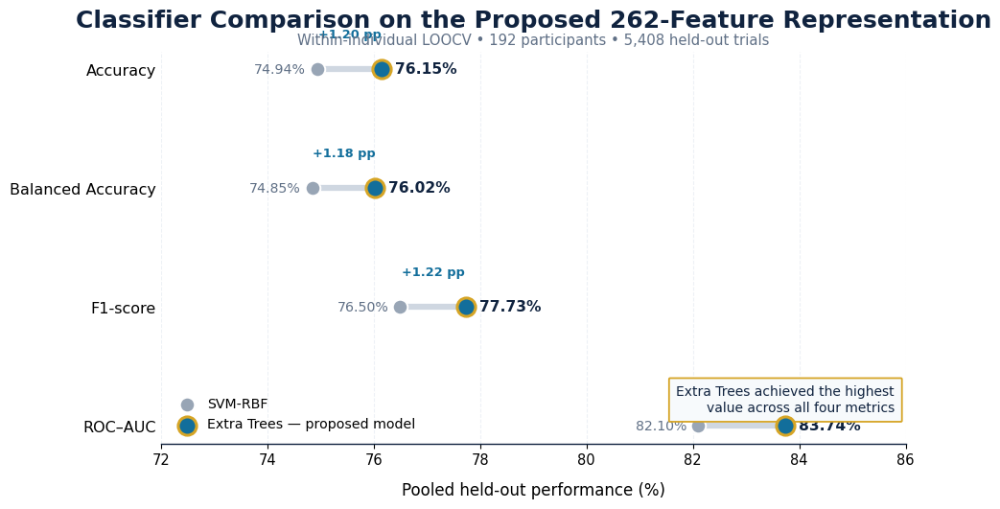

PREMIUM CLASSIFIER-COMPARISON FIGURE GENERATED
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/MODEL_COMPARISON_FIGURES/Premium_ExtraTrees_vs_SVM_RBF_Dumbbell.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/MODEL_COMPARISON_FIGURES/Premium_ExtraTrees_vs_SVM_RBF_Dumbbell.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/MODEL_COMPARISON_FIGURES/Premium_ExtraTrees_vs_SVM_RBF_Dumbbell.svg


In [ ]:
# ============================================================
# CELL 3 — PREMIUM EXTRA TREES VS SVM-RBF DUMBBELL PLOT
#
# Extra Trees is emphasized as the proposed/best model.
# SVM-RBF is retained as a subdued comparator.
# ============================================================

# Premium thesis colours
NAVY = "#10233F"
EXTRA_TREES_BLUE = "#126E9B"
EXTRA_TREES_GOLD = "#D6A526"
SVM_GREY = "#98A5B5"
CONNECTOR_GREY = "#CFD7E1"
GRID_GREY = "#E8EDF3"
TEXT_GREY = "#607086"
WHITE = "#FFFFFF"


plt.rcParams.update(
    {
        "font.family": "DejaVu Sans",
        "font.size": 11,
        "axes.titlesize": 18,
        "axes.titleweight": "bold",
        "axes.labelsize": 12,
        "xtick.labelsize": 10.5,
        "ytick.labelsize": 11.5,
        "axes.edgecolor": NAVY,
        "axes.linewidth": 1.0,
        "pdf.fonttype": 42,
        "ps.fonttype": 42,
    }
)


plot_df = comparison_table.copy()

# Reverse the order so Accuracy appears at the top.
plot_df = plot_df.iloc[
    ::-1
].reset_index(
    drop=True
)


y_positions = np.arange(
    len(
        plot_df
    )
)

extra_trees_values = plot_df[
    "Extra Trees"
].to_numpy()

svm_values = plot_df[
    "SVM-RBF"
].to_numpy()

gains = plot_df[
    "Extra Trees gain (pp)"
].to_numpy()


figure, axis = plt.subplots(
    figsize=(
        10.5,
        6.2
    ),
    facecolor=WHITE,
)

axis.set_facecolor(
    WHITE
)


# ============================================================
# Horizontal connectors
# ============================================================

for y_position, svm_value, et_value in zip(
    y_positions,
    svm_values,
    extra_trees_values,
):

    axis.plot(
        [
            svm_value,
            et_value
        ],
        [
            y_position,
            y_position
        ],
        color=CONNECTOR_GREY,
        linewidth=4.5,
        solid_capstyle="round",
        zorder=1,
    )


# ============================================================
# SVM-RBF markers
# ============================================================

axis.scatter(
    svm_values,
    y_positions,
    s=125,
    color=SVM_GREY,
    edgecolor=WHITE,
    linewidth=1.4,
    label="SVM-RBF",
    zorder=3,
)


# ============================================================
# Extra Trees markers
# ============================================================

axis.scatter(
    extra_trees_values,
    y_positions,
    s=190,
    color=EXTRA_TREES_BLUE,
    edgecolor=EXTRA_TREES_GOLD,
    linewidth=2.2,
    label="Extra Trees — proposed model",
    zorder=4,
)


# ============================================================
# Numeric annotations
# ============================================================

for y_position, svm_value, et_value, gain in zip(
    y_positions,
    svm_values,
    extra_trees_values,
    gains,
):

    # SVM value
    axis.text(
        svm_value - 0.22,
        y_position,
        f"{svm_value:.2f}%",
        ha="right",
        va="center",
        fontsize=10.2,
        color=TEXT_GREY,
    )

    # Extra Trees value
    axis.text(
        et_value + 0.25,
        y_position,
        f"{et_value:.2f}%",
        ha="left",
        va="center",
        fontsize=11.2,
        fontweight="bold",
        color=NAVY,
    )

    # Improvement label
    middle_value = (
        svm_value
        +
        et_value
    ) / 2

    axis.text(
        middle_value,
        y_position + 0.24,
        f"+{gain:.2f} pp",
        ha="center",
        va="bottom",
        fontsize=9.3,
        fontweight="bold",
        color=EXTRA_TREES_BLUE,
    )


# ============================================================
# Axes and titles
# ============================================================

axis.set_yticks(
    y_positions,
    labels=plot_df[
        "Metric"
    ],
)

axis.set_xlim(
    72,
    86
)

axis.set_xlabel(
    "Pooled held-out performance (%)",
    labelpad=11,
)

axis.set_title(
    "Classifier Comparison on the Proposed 262-Feature Representation",
    color=NAVY,
    pad=18,
)

axis.text(
    0.5,
    1.01,
    (
        "Within-individual LOOCV • 192 participants • "
        "5,408 held-out trials"
    ),
    transform=axis.transAxes,
    ha="center",
    va="bottom",
    fontsize=10.7,
    color=TEXT_GREY,
)


# ============================================================
# Highlight conclusion
# ============================================================

axis.text(
    0.985,
    0.075,
    (
        "Extra Trees achieved the highest\n"
        "value across all four metrics"
    ),
    transform=axis.transAxes,
    ha="right",
    va="bottom",
    fontsize=10,
    color=NAVY,
    bbox={
        "boxstyle":
            "round,pad=0.55,"
            "rounding_size=0.08",

        "facecolor":
            "#F7FAFC",

        "edgecolor":
            EXTRA_TREES_GOLD,

        "linewidth":
            1.3,
    },
)


# ============================================================
# Styling
# ============================================================

axis.grid(
    axis="x",
    color=GRID_GREY,
    linestyle="--",
    linewidth=0.75,
    alpha=0.75,
    zorder=0,
)

axis.tick_params(
    axis="y",
    length=0,
)

axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)

axis.spines[
    "left"
].set_visible(
    False
)


axis.legend(
    loc="lower left",
    frameon=False,
    fontsize=10.2,
    handletextpad=0.5,
)


figure.subplots_adjust(
    left=0.20,
    right=0.94,
    top=0.83,
    bottom=0.17,
)


# ============================================================
# Save PNG, PDF and SVG
# ============================================================

COMPARISON_PNG_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ExtraTrees_vs_SVM_RBF_Dumbbell.png"
)

COMPARISON_PDF_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ExtraTrees_vs_SVM_RBF_Dumbbell.pdf"
)

COMPARISON_SVG_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ExtraTrees_vs_SVM_RBF_Dumbbell.svg"
)


figure.savefig(
    COMPARISON_PNG_PATH,
    dpi=600,
    bbox_inches="tight",
    pad_inches=0.15,
)

figure.savefig(
    COMPARISON_PDF_PATH,
    bbox_inches="tight",
    pad_inches=0.15,
)

figure.savefig(
    COMPARISON_SVG_PATH,
    bbox_inches="tight",
    pad_inches=0.15,
)

plt.show()


print("=" * 76)
print("PREMIUM CLASSIFIER-COMPARISON FIGURE GENERATED")
print("=" * 76)

print(COMPARISON_PNG_PATH)
print(COMPARISON_PDF_PATH)
print(COMPARISON_SVG_PATH)

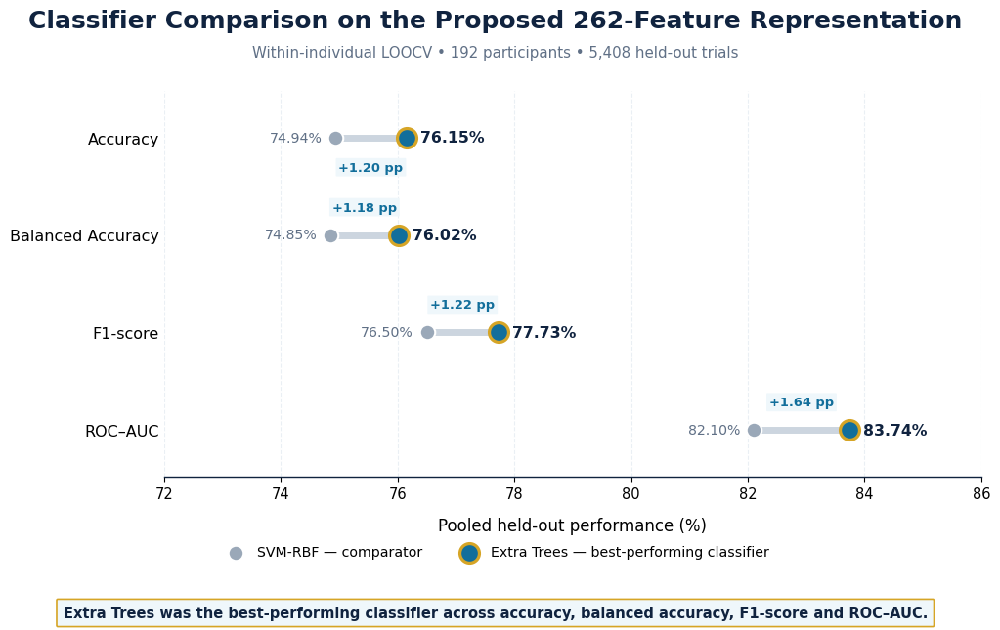

REVISED CLASSIFIER-COMPARISON FIGURE GENERATED
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/MODEL_COMPARISON_FIGURES/Premium_ExtraTrees_Best_vs_SVM_RBF_FIXED.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/MODEL_COMPARISON_FIGURES/Premium_ExtraTrees_Best_vs_SVM_RBF_FIXED.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/MODEL_COMPARISON_FIGURES/Premium_ExtraTrees_Best_vs_SVM_RBF_FIXED.svg


In [ ]:
# ============================================================
# REVISED PREMIUM CLASSIFIER COMPARISON
#
# Clear interpretation:
#   Proposed component = 262-feature representation
#   Best-performing classifier = Extra Trees
#   Comparator = SVM-RBF
#
# Requires:
#   comparison_table
#   FIGURE_DIR
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# Premium colours
# ============================================================

NAVY = "#10233F"
EXTRA_TREES_BLUE = "#126E9B"
GOLD = "#D6A526"

SVM_GREY = "#9AA8B8"
CONNECTOR_GREY = "#CCD5DF"
GRID_GREY = "#E7EDF3"
TEXT_GREY = "#607086"

PALE_BLUE = "#EFF7FB"
WHITE = "#FFFFFF"


# ============================================================
# Publication style
# ============================================================

plt.rcParams.update(
    {
        "font.family": "DejaVu Sans",
        "font.size": 11,

        "axes.labelsize": 12,
        "axes.labelweight": "medium",

        "xtick.labelsize": 10.5,
        "ytick.labelsize": 11.5,

        "axes.edgecolor": NAVY,
        "axes.linewidth": 1.0,

        "pdf.fonttype": 42,
        "ps.fonttype": 42,
    }
)


# ============================================================
# Force the intended display order
# ============================================================

METRIC_ORDER = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC–AUC",
]


plot_df = (
    comparison_table
    .set_index("Metric")
    .loc[METRIC_ORDER]
    .reset_index()
)


# Accuracy at the top, ROC-AUC at the bottom
y_positions = np.arange(
    len(plot_df)
)[::-1]


extra_trees_values = plot_df[
    "Extra Trees"
].to_numpy(
    dtype=float
)

svm_values = plot_df[
    "SVM-RBF"
].to_numpy(
    dtype=float
)

gains = plot_df[
    "Extra Trees gain (pp)"
].to_numpy(
    dtype=float
)


# ============================================================
# Create figure
# ============================================================

figure, axis = plt.subplots(
    figsize=(11.3, 6.7),
    facecolor=WHITE,
)

axis.set_facecolor(
    WHITE
)


# ============================================================
# Horizontal connectors
# ============================================================

for y_position, svm_value, et_value in zip(
    y_positions,
    svm_values,
    extra_trees_values,
):

    axis.plot(
        [svm_value, et_value],
        [y_position, y_position],

        color=CONNECTOR_GREY,
        linewidth=5.0,
        solid_capstyle="round",
        zorder=1,
    )


# ============================================================
# SVM-RBF comparator markers
# ============================================================

axis.scatter(
    svm_values,
    y_positions,

    s=125,
    color=SVM_GREY,
    edgecolor=WHITE,
    linewidth=1.5,

    label="SVM-RBF — comparator",
    zorder=3,
)


# ============================================================
# Extra Trees best-model markers
# ============================================================

axis.scatter(
    extra_trees_values,
    y_positions,

    s=205,
    color=EXTRA_TREES_BLUE,
    edgecolor=GOLD,
    linewidth=2.3,

    label="Extra Trees — best-performing classifier",
    zorder=4,
)


# ============================================================
# Value labels and improvement labels
# ============================================================

maximum_y = np.max(
    y_positions
)


for y_position, svm_value, et_value, gain in zip(
    y_positions,
    svm_values,
    extra_trees_values,
    gains,
):

    # SVM-RBF value
    axis.text(
        svm_value - 0.23,
        y_position,

        f"{svm_value:.2f}%",

        ha="right",
        va="center",

        fontsize=10.2,
        color=TEXT_GREY,
    )


    # Extra Trees value
    axis.text(
        et_value + 0.24,
        y_position,

        f"{et_value:.2f}%",

        ha="left",
        va="center",

        fontsize=11.3,
        fontweight="bold",
        color=NAVY,
    )


    midpoint = (
        svm_value + et_value
    ) / 2.0


    # Put the top-row gain below the connector.
    # Other gains remain above their connectors.
    if y_position == maximum_y:
        vertical_offset = -0.24
        vertical_alignment = "top"

    else:
        vertical_offset = 0.22
        vertical_alignment = "bottom"


    axis.text(
        midpoint,
        y_position + vertical_offset,

        f"+{gain:.2f} pp",

        ha="center",
        va=vertical_alignment,

        fontsize=9.4,
        fontweight="bold",
        color=EXTRA_TREES_BLUE,

        bbox={
            "boxstyle":
                "round,pad=0.22,"
                "rounding_size=0.07",

            "facecolor":
                PALE_BLUE,

            "edgecolor":
                "none",

            "alpha":
                0.98,
        },

        zorder=6,
    )


# ============================================================
# Axes
# ============================================================

axis.set_yticks(
    y_positions,
    labels=plot_df[
        "Metric"
    ],
)

axis.set_xlim(
    72,
    86
)

axis.set_ylim(
    -0.48,
    3.48
)

axis.set_xlabel(
    "Pooled held-out performance (%)",
    labelpad=12,
)


axis.grid(
    axis="x",
    color=GRID_GREY,
    linestyle="--",
    linewidth=0.8,
    alpha=0.85,
    zorder=0,
)


axis.tick_params(
    axis="y",
    length=0,
)


axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)

axis.spines[
    "left"
].set_visible(
    False
)


# ============================================================
# Figure-level title and subtitle
#
# Using figure coordinates avoids overlap.
# ============================================================

figure.suptitle(
    "Classifier Comparison on the Proposed 262-Feature Representation",

    x=0.5,
    y=0.965,

    ha="center",
    va="top",

    fontsize=18,
    fontweight="bold",
    color=NAVY,
)


figure.text(
    0.5,
    0.910,

    (
        "Within-individual LOOCV • "
        "192 participants • "
        "5,408 held-out trials"
    ),

    ha="center",
    va="top",

    fontsize=10.8,
    color=TEXT_GREY,
)


# ============================================================
# External legend
# ============================================================

handles, labels = axis.get_legend_handles_labels()


figure.legend(
    handles,
    labels,

    loc="lower center",
    bbox_to_anchor=(0.5, 0.105),

    ncol=2,
    frameon=False,

    fontsize=10.2,
    handletextpad=0.55,
    columnspacing=2.4,
)


# ============================================================
# Clear conclusion below the legend
# ============================================================

figure.text(
    0.5,
    0.042,

    (
        "Extra Trees was the best-performing classifier "
        "across accuracy, balanced accuracy, F1-score and ROC–AUC."
    ),

    ha="center",
    va="center",

    fontsize=10.5,
    fontweight="bold",
    color=NAVY,

    bbox={
        "boxstyle":
            "round,pad=0.45,"
            "rounding_size=0.08",

        "facecolor":
            PALE_BLUE,

        "edgecolor":
            GOLD,

        "linewidth":
            1.2,
    },
)


# ============================================================
# Reserve independent spaces
# ============================================================

figure.subplots_adjust(
    left=0.20,
    right=0.94,
    top=0.84,
    bottom=0.25,
)


# ============================================================
# Save
# ============================================================

COMPARISON_PNG_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ExtraTrees_Best_vs_SVM_RBF_FIXED.png"
)

COMPARISON_PDF_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ExtraTrees_Best_vs_SVM_RBF_FIXED.pdf"
)

COMPARISON_SVG_PATH = os.path.join(
    FIGURE_DIR,
    "Premium_ExtraTrees_Best_vs_SVM_RBF_FIXED.svg"
)


figure.savefig(
    COMPARISON_PNG_PATH,
    dpi=600,
    bbox_inches="tight",
    pad_inches=0.16,
)

figure.savefig(
    COMPARISON_PDF_PATH,
    bbox_inches="tight",
    pad_inches=0.16,
)

figure.savefig(
    COMPARISON_SVG_PATH,
    bbox_inches="tight",
    pad_inches=0.16,
)

plt.show()


print("=" * 78)
print("REVISED CLASSIFIER-COMPARISON FIGURE GENERATED")
print("=" * 78)

print(COMPARISON_PNG_PATH)
print(COMPARISON_PDF_PATH)
print(COMPARISON_SVG_PATH)

In [ ]:


import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib.lines import Line2D
from matplotlib.patches import FancyBboxPatch


print("Google Drive mounted and libraries imported.")

Google Drive mounted and libraries imported.


In [ ]:
# ============================================================
# CELL 2 — RESULT FILE PATHS
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)


# ============================================================
# Proposed pipeline:
# 12 channels + 262 handcrafted features + Extra Trees
# ============================================================

PROPOSED_RESULT_DIR = os.path.join(
    V8_DIR,
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)

PROPOSED_EXPERIMENT_NAME = (
    "ExtraTrees__Handcrafted_262_noPCA__"
    "v8_full0_2000ms_no_pca_strict192"
)

PROPOSED_POOLED_PATH = os.path.join(
    PROPOSED_RESULT_DIR,
    (
        f"{PROPOSED_EXPERIMENT_NAME}"
        "__pooled_summary.csv"
    )
)

PROPOSED_SUBJECT_SUMMARY_PATH = os.path.join(
    PROPOSED_RESULT_DIR,
    (
        f"{PROPOSED_EXPERIMENT_NAME}"
        "__subject_metric_summary.csv"
    )
)


# ============================================================
# Huang faithful reimplemented baseline:
# CSP + Equation-3 beta1-beta5 + Gaussian Naive Bayes
# ============================================================

HUANG_RESULT_DIR = (
    "/content/drive/MyDrive/"
    "HUANG_EXP8_STRICT192_COMPLETE_V7_METRICS_"
    "PARTICIPANT_SPECIFIC_61_63CH"
)

HUANG_POOLED_PATH = os.path.join(
    HUANG_RESULT_DIR,
    "huang_pooled_5408_complete_metrics.csv"
)

HUANG_SUBJECT_SUMMARY_PATH = os.path.join(
    HUANG_RESULT_DIR,
    "huang_192_subject_metric_mean_sd.csv"
)


# ============================================================
# Output directory
# ============================================================

COMPARISON_FIGURE_DIR = os.path.join(
    V8_DIR,
    "THESIS_DEFENSE_MODEL_COMPARISON_FIGURES"
)

os.makedirs(
    COMPARISON_FIGURE_DIR,
    exist_ok=True
)


required_paths = [
    PROPOSED_POOLED_PATH,
    PROPOSED_SUBJECT_SUMMARY_PATH,
    HUANG_POOLED_PATH,
    HUANG_SUBJECT_SUMMARY_PATH,
]


missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]


if missing_paths:

    raise FileNotFoundError(
        "The following result files were not found:\n\n"
        +
        "\n".join(
            missing_paths
        )
    )


print("=" * 80)
print("ALL RESULT FILES FOUND")
print("=" * 80)

for path in required_paths:
    print(path)

print("\nFigure output directory:")
print(COMPARISON_FIGURE_DIR)

ALL RESULT FILES FOUND
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__pooled_summary.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__subject_metric_summary.csv
/content/drive/MyDrive/HUANG_EXP8_STRICT192_COMPLETE_V7_METRICS_PARTICIPANT_SPECIFIC_61_63CH/huang_pooled_5408_complete_metrics.csv
/content/drive/MyDrive/HUANG_EXP8_STRICT192_COMPLETE_V7_METRICS_PARTICIPANT_SPECIFIC_61_63CH/huang_192_subject_metric_mean_sd.csv

Figure output directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/THESIS_DEFENSE_MODEL_COMPARISON_FIGURES


In [ ]:
# ============================================================
# CELL 3 — ROBUST RESULT-LOADING FUNCTIONS
# ============================================================

def load_pooled_metrics(
    csv_path
):

    dataframe = pd.read_csv(
        csv_path
    )


    # Long-form table:
    # metric | value | percent
    if {
        "metric",
        "value"
    }.issubset(
        dataframe.columns
    ):

        metric_dictionary = dict(
            zip(
                dataframe[
                    "metric"
                ].astype(str),

                dataframe[
                    "value"
                ].astype(float),
            )
        )

        return metric_dictionary


    # Wide-form table:
    # one row with each metric as a separate column
    if len(dataframe) >= 1:

        return {
            str(column):
                dataframe.iloc[0][column]

            for column
            in dataframe.columns
        }


    raise ValueError(
        f"Could not read pooled metrics from:\n{csv_path}"
    )


def extract_metric(
    metric_dictionary,
    possible_names
):

    for metric_name in possible_names:

        if metric_name in metric_dictionary:

            value = float(
                metric_dictionary[
                    metric_name
                ]
            )

            if not np.isfinite(
                value
            ):

                continue

            # Convert proportion to percentage.
            if abs(value) <= 1.5:
                value *= 100.0

            return value


    raise KeyError(
        "Could not find any of these metrics:\n"
        +
        ", ".join(
            possible_names
        )
    )


def load_subject_accuracy_mean_sd(
    csv_path
):

    dataframe = pd.read_csv(
        csv_path
    )


    required_columns = {
        "metric",
        "mean",
        "standard_deviation",
    }


    if not required_columns.issubset(
        dataframe.columns
    ):

        raise KeyError(
            f"Subject-summary columns were not found in:\n"
            f"{csv_path}\n\n"
            f"Available columns:\n"
            f"{dataframe.columns.tolist()}"
        )


    accuracy_rows = dataframe.loc[
        dataframe[
            "metric"
        ].astype(str).str.lower()
        ==
        "accuracy"
    ]


    if len(
        accuracy_rows
    ) != 1:

        raise ValueError(
            "Exactly one participant-level accuracy row "
            "was expected."
        )


    accuracy_row = accuracy_rows.iloc[0]

    mean_accuracy = float(
        accuracy_row[
            "mean"
        ]
    )

    accuracy_sd = float(
        accuracy_row[
            "standard_deviation"
        ]
    )


    if abs(
        mean_accuracy
    ) <= 1.5:

        mean_accuracy *= 100.0


    if abs(
        accuracy_sd
    ) <= 1.5:

        accuracy_sd *= 100.0


    return (
        mean_accuracy,
        accuracy_sd,
    )


# ============================================================
# Load data
# ============================================================

proposed_pooled = load_pooled_metrics(
    PROPOSED_POOLED_PATH
)

huang_pooled = load_pooled_metrics(
    HUANG_POOLED_PATH
)


proposed_mean_accuracy, proposed_accuracy_sd = (
    load_subject_accuracy_mean_sd(
        PROPOSED_SUBJECT_SUMMARY_PATH
    )
)

huang_mean_accuracy, huang_accuracy_sd = (
    load_subject_accuracy_mean_sd(
        HUANG_SUBJECT_SUMMARY_PATH
    )
)


print("=" * 80)
print("RESULT FILES LOADED SUCCESSFULLY")
print("=" * 80)

print(
    "Proposed participant accuracy:",
    f"{proposed_mean_accuracy:.2f}% ± "
    f"{proposed_accuracy_sd:.2f}%"
)

print(
    "Huang participant accuracy:",
    f"{huang_mean_accuracy:.2f}% ± "
    f"{huang_accuracy_sd:.2f}%"
)

RESULT FILES LOADED SUCCESSFULLY
Proposed participant accuracy: 76.09% ± 13.00%
Huang participant accuracy: 74.12% ± 13.56%


In [ ]:
# ============================================================
# CELL 3 — ROBUST RESULT-LOADING FUNCTIONS
# ============================================================

def load_pooled_metrics(
    csv_path
):

    dataframe = pd.read_csv(
        csv_path
    )


    # Long-form table:
    # metric | value | percent
    if {
        "metric",
        "value"
    }.issubset(
        dataframe.columns
    ):

        metric_dictionary = dict(
            zip(
                dataframe[
                    "metric"
                ].astype(str),

                dataframe[
                    "value"
                ].astype(float),
            )
        )

        return metric_dictionary


    # Wide-form table:
    # one row with each metric as a separate column
    if len(dataframe) >= 1:

        return {
            str(column):
                dataframe.iloc[0][column]

            for column
            in dataframe.columns
        }


    raise ValueError(
        f"Could not read pooled metrics from:\n{csv_path}"
    )


def extract_metric(
    metric_dictionary,
    possible_names
):

    for metric_name in possible_names:

        if metric_name in metric_dictionary:

            value = float(
                metric_dictionary[
                    metric_name
                ]
            )

            if not np.isfinite(
                value
            ):

                continue

            # Convert proportion to percentage.
            if abs(value) <= 1.5:
                value *= 100.0

            return value


    raise KeyError(
        "Could not find any of these metrics:\n"
        +
        ", ".join(
            possible_names
        )
    )


def load_subject_accuracy_mean_sd(
    csv_path
):

    dataframe = pd.read_csv(
        csv_path
    )


    required_columns = {
        "metric",
        "mean",
        "standard_deviation",
    }


    if not required_columns.issubset(
        dataframe.columns
    ):

        raise KeyError(
            f"Subject-summary columns were not found in:\n"
            f"{csv_path}\n\n"
            f"Available columns:\n"
            f"{dataframe.columns.tolist()}"
        )


    accuracy_rows = dataframe.loc[
        dataframe[
            "metric"
        ].astype(str).str.lower()
        ==
        "accuracy"
    ]


    if len(
        accuracy_rows
    ) != 1:

        raise ValueError(
            "Exactly one participant-level accuracy row "
            "was expected."
        )


    accuracy_row = accuracy_rows.iloc[0]

    mean_accuracy = float(
        accuracy_row[
            "mean"
        ]
    )

    accuracy_sd = float(
        accuracy_row[
            "standard_deviation"
        ]
    )


    if abs(
        mean_accuracy
    ) <= 1.5:

        mean_accuracy *= 100.0


    if abs(
        accuracy_sd
    ) <= 1.5:

        accuracy_sd *= 100.0


    return (
        mean_accuracy,
        accuracy_sd,
    )


# ============================================================
# Load data
# ============================================================

proposed_pooled = load_pooled_metrics(
    PROPOSED_POOLED_PATH
)

huang_pooled = load_pooled_metrics(
    HUANG_POOLED_PATH
)


proposed_mean_accuracy, proposed_accuracy_sd = (
    load_subject_accuracy_mean_sd(
        PROPOSED_SUBJECT_SUMMARY_PATH
    )
)

huang_mean_accuracy, huang_accuracy_sd = (
    load_subject_accuracy_mean_sd(
        HUANG_SUBJECT_SUMMARY_PATH
    )
)


print("=" * 80)
print("RESULT FILES LOADED SUCCESSFULLY")
print("=" * 80)

print(
    "Proposed participant accuracy:",
    f"{proposed_mean_accuracy:.2f}% ± "
    f"{proposed_accuracy_sd:.2f}%"
)

print(
    "Huang participant accuracy:",
    f"{huang_mean_accuracy:.2f}% ± "
    f"{huang_accuracy_sd:.2f}%"
)

RESULT FILES LOADED SUCCESSFULLY
Proposed participant accuracy: 76.09% ± 13.00%
Huang participant accuracy: 74.12% ± 13.56%


In [ ]:
# ============================================================
# CELL 4 — PREPARE COMPARISON TABLES
# ============================================================

POOLED_METRIC_LABELS = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC–AUC",
]


proposed_metric_values = [
    extract_metric(
        proposed_pooled,
        [
            "accuracy",
        ]
    ),

    extract_metric(
        proposed_pooled,
        [
            "balanced_accuracy",
        ]
    ),

    extract_metric(
        proposed_pooled,
        [
            "f1_score",
            "f1",
        ]
    ),

    extract_metric(
        proposed_pooled,
        [
            "roc_auc",
        ]
    ),
]


huang_metric_values = [
    extract_metric(
        huang_pooled,
        [
            "accuracy",
        ]
    ),

    extract_metric(
        huang_pooled,
        [
            "balanced_accuracy",
        ]
    ),

    extract_metric(
        huang_pooled,
        [
            "f1_score",
            "f1",
        ]
    ),

    extract_metric(
        huang_pooled,
        [
            "roc_auc",
        ]
    ),
]


comparison_table = pd.DataFrame(
    {
        "Metric":
            POOLED_METRIC_LABELS,

        "Proposed 262 features + Extra Trees":
            proposed_metric_values,

        "Huang beta1-beta5 + Gaussian NB":
            huang_metric_values,
    }
)


comparison_table[
    "Proposed improvement (percentage points)"
] = (
    comparison_table[
        "Proposed 262 features + Extra Trees"
    ]
    -
    comparison_table[
        "Huang beta1-beta5 + Gaussian NB"
    ]
)


participant_accuracy_table = pd.DataFrame(
    {
        "Pipeline": [
            (
                "Proposed 262 features\n"
                "+ Extra Trees"
            ),

            (
                "Huang beta1–beta5\n"
                "+ Gaussian NB"
            ),
        ],

        "Mean accuracy (%)": [
            proposed_mean_accuracy,
            huang_mean_accuracy,
        ],

        "Standard deviation (%)": [
            proposed_accuracy_sd,
            huang_accuracy_sd,
        ],
    }
)


comparison_table = comparison_table.round(
    2
)

participant_accuracy_table = (
    participant_accuracy_table.round(
        2
    )
)


display(
    comparison_table
)

display(
    participant_accuracy_table
)


# ============================================================
# Expected validation
# ============================================================

assert np.isclose(
    comparison_table.loc[
        comparison_table[
            "Metric"
        ] == "Accuracy",
        "Proposed 262 features + Extra Trees",
    ].iloc[0],
    76.15,
    atol=0.03,
)

assert np.isclose(
    comparison_table.loc[
        comparison_table[
            "Metric"
        ] == "Accuracy",
        "Huang beta1-beta5 + Gaussian NB",
    ].iloc[0],
    74.19,
    atol=0.03,
)


COMPARISON_TABLE_PATH = os.path.join(
    COMPARISON_FIGURE_DIR,
    (
        "Proposed_ExtraTrees_vs_Huang_GaussianNB_"
        "within_LOOCV_metrics.csv"
    )
)

PARTICIPANT_ACCURACY_TABLE_PATH = os.path.join(
    COMPARISON_FIGURE_DIR,
    (
        "Proposed_ExtraTrees_vs_Huang_GaussianNB_"
        "participant_accuracy_mean_sd.csv"
    )
)


comparison_table.to_csv(
    COMPARISON_TABLE_PATH,
    index=False
)

participant_accuracy_table.to_csv(
    PARTICIPANT_ACCURACY_TABLE_PATH,
    index=False
)


print("\nComparison tables saved.")

,Metric,Proposed 262 features + Extra Trees,Huang beta1-beta5 + Gaussian NB,Proposed improvement (percentage points)
0,Accuracy,76.15,74.19,1.96
1,Balanced Accuracy,76.02,74.19,1.84
2,F1-score,77.73,75.47,2.26
3,ROC–AUC,83.74,81.70,2.04


,Pipeline,Mean accuracy (%),Standard deviation (%)
0,Proposed 262 features\n+ Extra Trees,76.09,13.00
1,Huang beta1–beta5\n+ Gaussian NB,74.12,13.56



Comparison tables saved.


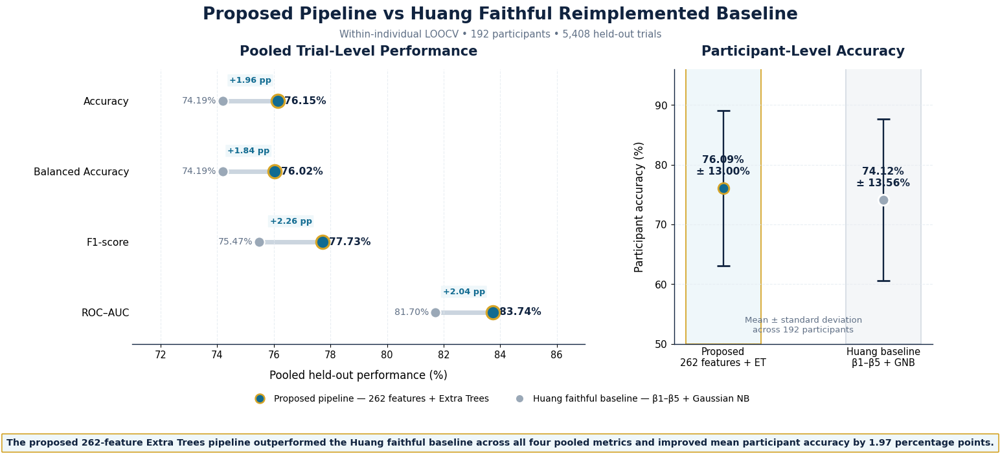

PREMIUM BASELINE-COMPARISON FIGURE GENERATED
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/THESIS_DEFENSE_MODEL_COMPARISON_FIGURES/Premium_Proposed_ExtraTrees_vs_Huang_Faithful_GaussianNB.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/THESIS_DEFENSE_MODEL_COMPARISON_FIGURES/Premium_Proposed_ExtraTrees_vs_Huang_Faithful_GaussianNB.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/THESIS_DEFENSE_MODEL_COMPARISON_FIGURES/Premium_Proposed_ExtraTrees_vs_Huang_Faithful_GaussianNB.svg


In [ ]:
# ============================================================
# CELL 5 — PREMIUM COMPOSITE COMPARISON FIGURE
#
# Left:
#   Pooled held-out trial metrics
#
# Right:
#   Participant-level mean accuracy ± SD
# ============================================================

# ============================================================
# Premium colour palette
# ============================================================

NAVY = "#10233F"
PROPOSED_BLUE = "#116B91"
PROPOSED_GOLD = "#D5A427"

HUANG_GREY = "#9AA8B7"
CONNECTOR_GREY = "#CBD5DF"

TEXT_GREY = "#607086"
GRID_GREY = "#E6ECF2"
PALE_BLUE = "#EFF7FA"
PALE_GREY = "#F4F6F8"
WHITE = "#FFFFFF"


# ============================================================
# Publication font configuration
# ============================================================

plt.rcParams.update(
    {
        "font.family":
            "DejaVu Sans",

        "font.size":
            11,

        "axes.labelsize":
            12,

        "axes.labelweight":
            "medium",

        "xtick.labelsize":
            10.5,

        "ytick.labelsize":
            11.2,

        "axes.edgecolor":
            NAVY,

        "axes.linewidth":
            1.0,

        "pdf.fonttype":
            42,

        "ps.fonttype":
            42,
    }
)


# ============================================================
# Prepare left-panel values
# ============================================================

plot_table = comparison_table.copy()

y_positions = np.arange(
    len(
        plot_table
    )
)[::-1]


proposed_values = plot_table[
    "Proposed 262 features + Extra Trees"
].to_numpy(
    dtype=float
)

huang_values = plot_table[
    "Huang beta1-beta5 + Gaussian NB"
].to_numpy(
    dtype=float
)

improvements = plot_table[
    "Proposed improvement (percentage points)"
].to_numpy(
    dtype=float
)


# ============================================================
# Create the figure
# ============================================================

figure = plt.figure(
    figsize=(
        14.2,
        7.2
    ),
    facecolor=WHITE,
)


grid = figure.add_gridspec(
    nrows=1,
    ncols=2,
    width_ratios=[
        1.75,
        1.00,
    ],
    wspace=0.25,
)


metric_axis = figure.add_subplot(
    grid[
        0,
        0
    ]
)

accuracy_axis = figure.add_subplot(
    grid[
        0,
        1
    ]
)


metric_axis.set_facecolor(
    WHITE
)

accuracy_axis.set_facecolor(
    WHITE
)


# ============================================================
# LEFT PANEL — Pooled metric dumbbell plot
# ============================================================

for y_position, huang_value, proposed_value in zip(
    y_positions,
    huang_values,
    proposed_values,
):

    metric_axis.plot(
        [
            huang_value,
            proposed_value,
        ],
        [
            y_position,
            y_position,
        ],

        color=CONNECTOR_GREY,
        linewidth=5.0,
        solid_capstyle="round",
        zorder=1,
    )


# Huang baseline points
metric_axis.scatter(
    huang_values,
    y_positions,

    s=135,
    color=HUANG_GREY,
    edgecolor=WHITE,
    linewidth=1.5,

    label=(
        "Huang faithful baseline — "
        "β1–β5 + Gaussian NB"
    ),

    zorder=3,
)


# Proposed pipeline points
metric_axis.scatter(
    proposed_values,
    y_positions,

    s=215,
    color=PROPOSED_BLUE,
    edgecolor=PROPOSED_GOLD,
    linewidth=2.3,

    label=(
        "Proposed pipeline — "
        "262 features + Extra Trees"
    ),

    zorder=4,
)


# ============================================================
# Metric annotations
# ============================================================

for (
    y_position,
    huang_value,
    proposed_value,
    improvement,
) in zip(
    y_positions,
    huang_values,
    proposed_values,
    improvements,
):


    metric_axis.text(
        huang_value - 0.22,
        y_position,

        f"{huang_value:.2f}%",

        ha="right",
        va="center",

        fontsize=10.1,
        color=TEXT_GREY,
    )


    metric_axis.text(
        proposed_value + 0.23,
        y_position,

        f"{proposed_value:.2f}%",

        ha="left",
        va="center",

        fontsize=11.2,
        fontweight="bold",
        color=NAVY,
    )


    midpoint = (
        huang_value
        +
        proposed_value
    ) / 2.0


    metric_axis.text(
        midpoint,
        y_position + 0.23,

        f"+{improvement:.2f} pp",

        ha="center",
        va="bottom",

        fontsize=9.2,
        fontweight="bold",
        color=PROPOSED_BLUE,

        bbox={
            "boxstyle":
                "round,pad=0.22,"
                "rounding_size=0.06",

            "facecolor":
                PALE_BLUE,

            "edgecolor":
                "none",

            "alpha":
                0.98,
        },

        zorder=6,
    )


metric_axis.set_yticks(
    y_positions,
    labels=plot_table[
        "Metric"
    ],
)


minimum_value = min(
    np.min(
        huang_values
    ),
    np.min(
        proposed_values
    ),
)

maximum_value = max(
    np.max(
        huang_values
    ),
    np.max(
        proposed_values
    ),
)


metric_axis.set_xlim(
    np.floor(
        minimum_value - 2.2
    ),
    np.ceil(
        maximum_value + 2.3
    ),
)

metric_axis.set_ylim(
    -0.45,
    3.45,
)

metric_axis.set_xlabel(
    "Pooled held-out performance (%)",
    labelpad=11,
)

metric_axis.set_title(
    "Pooled Trial-Level Performance",
    fontsize=15,
    fontweight="bold",
    color=NAVY,
    pad=15,
)


metric_axis.grid(
    axis="x",
    color=GRID_GREY,
    linestyle="--",
    linewidth=0.8,
    alpha=0.85,
    zorder=0,
)

metric_axis.tick_params(
    axis="y",
    length=0,
)


for spine_name in [
    "top",
    "right",
    "left",
]:

    metric_axis.spines[
        spine_name
    ].set_visible(
        False
    )


# ============================================================
# RIGHT PANEL — Participant accuracy mean ± SD
# ============================================================

pipeline_positions = np.array(
    [
        0,
        1,
    ],
    dtype=float,
)

participant_means = np.array(
    [
        proposed_mean_accuracy,
        huang_mean_accuracy,
    ]
)

participant_sds = np.array(
    [
        proposed_accuracy_sd,
        huang_accuracy_sd,
    ]
)

participant_colours = [
    PROPOSED_BLUE,
    HUANG_GREY,
]

participant_edges = [
    PROPOSED_GOLD,
    WHITE,
]


# Light vertical guide bars
accuracy_axis.bar(
    pipeline_positions,
    participant_means,

    width=0.47,
    bottom=50,

    color=[
        PALE_BLUE,
        PALE_GREY,
    ],

    edgecolor=[
        PROPOSED_GOLD,
        "#D5DCE4",
    ],

    linewidth=1.3,
    zorder=1,
)


# Mean ± SD points
for (
    x_position,
    mean_value,
    sd_value,
    fill_colour,
    edge_colour,
) in zip(
    pipeline_positions,
    participant_means,
    participant_sds,
    participant_colours,
    participant_edges,
):

    accuracy_axis.errorbar(
        x_position,
        mean_value,

        yerr=sd_value,

        fmt="o",
        markersize=12,

        markerfacecolor=fill_colour,
        markeredgecolor=edge_colour,
        markeredgewidth=2.0,

        ecolor=NAVY,
        elinewidth=1.7,

        capsize=7,
        capthick=1.7,

        zorder=5,
    )


    accuracy_axis.text(
        x_position,
        mean_value + 2.0,

        (
            f"{mean_value:.2f}%\n"
            f"± {sd_value:.2f}%"
        ),

        ha="center",
        va="bottom",

        fontsize=11.2,
        fontweight="bold",
        color=NAVY,
        linespacing=1.20,
    )


accuracy_axis.set_xticks(
    pipeline_positions,
    labels=[
        (
            "Proposed\n"
            "262 features + ET"
        ),

        (
            "Huang baseline\n"
            "β1–β5 + GNB"
        ),
    ],
)


accuracy_axis.set_ylim(
    50,
    96,
)

accuracy_axis.set_ylabel(
    "Participant accuracy (%)",
    labelpad=10,
)

accuracy_axis.set_title(
    "Participant-Level Accuracy",
    fontsize=15,
    fontweight="bold",
    color=NAVY,
    pad=15,
)

accuracy_axis.text(
    0.5,
    0.035,

    (
        "Mean ± standard deviation\n"
        "across 192 participants"
    ),

    transform=accuracy_axis.transAxes,

    ha="center",
    va="bottom",

    fontsize=9.5,
    color=TEXT_GREY,
)


accuracy_axis.grid(
    axis="y",
    color=GRID_GREY,
    linestyle="--",
    linewidth=0.8,
    alpha=0.85,
    zorder=0,
)


accuracy_axis.tick_params(
    axis="x",
    length=0,
)


for spine_name in [
    "top",
    "right",
]:

    accuracy_axis.spines[
        spine_name
    ].set_visible(
        False
    )


# ============================================================
# Figure title and subtitle
# ============================================================

figure.suptitle(
    (
        "Proposed Pipeline vs Huang Faithful "
        "Reimplemented Baseline"
    ),

    x=0.5,
    y=0.975,

    ha="center",
    va="top",

    fontsize=19,
    fontweight="bold",
    color=NAVY,
)


figure.text(
    0.5,
    0.925,

    (
        "Within-individual LOOCV • "
        "192 participants • "
        "5,408 held-out trials"
    ),

    ha="center",
    va="top",

    fontsize=10.8,
    color=TEXT_GREY,
)


# ============================================================
# Figure-level legend
# ============================================================

legend_handles = [
    Line2D(
        [
            0
        ],
        [
            0
        ],

        marker="o",
        linestyle="none",

        markersize=10,

        markerfacecolor=PROPOSED_BLUE,
        markeredgecolor=PROPOSED_GOLD,
        markeredgewidth=1.8,

        label=(
            "Proposed pipeline — "
            "262 features + Extra Trees"
        ),
    ),

    Line2D(
        [
            0
        ],
        [
            0
        ],

        marker="o",
        linestyle="none",

        markersize=9,

        markerfacecolor=HUANG_GREY,
        markeredgecolor=WHITE,

        label=(
            "Huang faithful baseline — "
            "β1–β5 + Gaussian NB"
        ),
    ),
]


figure.legend(
    handles=legend_handles,

    loc="lower center",
    bbox_to_anchor=(
        0.5,
        0.105
    ),

    ncol=2,
    frameon=False,

    fontsize=10.0,
    handletextpad=0.55,
    columnspacing=2.4,
)


# ============================================================
# Conclusion box
# ============================================================

mean_accuracy_improvement = (
    proposed_mean_accuracy
    -
    huang_mean_accuracy
)


figure.text(
    0.5,
    0.037,

    (
        "The proposed 262-feature Extra Trees pipeline "
        "outperformed the Huang faithful baseline across all "
        "four pooled metrics and improved mean participant "
        f"accuracy by {mean_accuracy_improvement:.2f} "
        "percentage points."
    ),

    ha="center",
    va="center",

    fontsize=10.3,
    fontweight="bold",
    color=NAVY,

    bbox={
        "boxstyle":
            "round,pad=0.50,"
            "rounding_size=0.08",

        "facecolor":
            PALE_BLUE,

        "edgecolor":
            PROPOSED_GOLD,

        "linewidth":
            1.2,
    },
)


# ============================================================
# Reserve independent title and footer areas
# ============================================================

figure.subplots_adjust(
    left=0.10,
    right=0.97,
    top=0.84,
    bottom=0.25,
)


# ============================================================
# Save PNG, PDF and SVG
# ============================================================

FIGURE_BASE_NAME = (
    "Premium_Proposed_ExtraTrees_vs_"
    "Huang_Faithful_GaussianNB"
)


COMPARISON_PNG_PATH = os.path.join(
    COMPARISON_FIGURE_DIR,
    FIGURE_BASE_NAME
    +
    ".png"
)

COMPARISON_PDF_PATH = os.path.join(
    COMPARISON_FIGURE_DIR,
    FIGURE_BASE_NAME
    +
    ".pdf"
)

COMPARISON_SVG_PATH = os.path.join(
    COMPARISON_FIGURE_DIR,
    FIGURE_BASE_NAME
    +
    ".svg"
)


figure.savefig(
    COMPARISON_PNG_PATH,
    dpi=600,
    bbox_inches="tight",
    pad_inches=0.16,
)

figure.savefig(
    COMPARISON_PDF_PATH,
    bbox_inches="tight",
    pad_inches=0.16,
)

figure.savefig(
    COMPARISON_SVG_PATH,
    bbox_inches="tight",
    pad_inches=0.16,
)


plt.show()


print("=" * 80)
print("PREMIUM BASELINE-COMPARISON FIGURE GENERATED")
print("=" * 80)

print(COMPARISON_PNG_PATH)
print(COMPARISON_PDF_PATH)
print(COMPARISON_SVG_PATH)

In [ ]:
# ============================================================
# CELL 6 — REPORT-READY VALUES AND FIGURE CAPTION
# ============================================================

print("=" * 80)
print("REPORT-READY COMPARISON")
print("=" * 80)


for row_index, row in comparison_table.iterrows():

    print(
        f"{row['Metric']}: "
        f"Proposed = "
        f"{row['Proposed 262 features + Extra Trees']:.2f}%, "
        f"Huang = "
        f"{row['Huang beta1-beta5 + Gaussian NB']:.2f}%, "
        f"Improvement = "
        f"+{row['Proposed improvement (percentage points)']:.2f} pp"
    )


print("\nParticipant-level accuracy:")

print(
    f"Proposed pipeline: "
    f"{proposed_mean_accuracy:.2f}% ± "
    f"{proposed_accuracy_sd:.2f}%"
)

print(
    f"Huang faithful baseline: "
    f"{huang_mean_accuracy:.2f}% ± "
    f"{huang_accuracy_sd:.2f}%"
)


print("\nSuggested figure caption:\n")

print(
    "Comparison of the proposed 12-channel, "
    "262-dimensional handcrafted feature pipeline using "
    "Extra Trees with the faithful Huang reimplementation "
    "using CSP-derived beta1-beta5 features and Gaussian "
    "Naive Bayes under within-individual LOOCV. The left "
    "panel presents pooled metrics across 5,408 held-out "
    "trials, whereas the right panel presents participant-"
    "level mean accuracy and standard deviation across "
    "192 participants. The proposed pipeline achieved "
    "higher accuracy, balanced accuracy, F1-score and "
    "ROC-AUC."
)

REPORT-READY COMPARISON
Accuracy: Proposed = 76.15%, Huang = 74.19%, Improvement = +1.96 pp
Balanced Accuracy: Proposed = 76.02%, Huang = 74.19%, Improvement = +1.84 pp
F1-score: Proposed = 77.73%, Huang = 75.47%, Improvement = +2.26 pp
ROC–AUC: Proposed = 83.74%, Huang = 81.70%, Improvement = +2.04 pp

Participant-level accuracy:
Proposed pipeline: 76.09% ± 13.00%
Huang faithful baseline: 74.12% ± 13.56%

Suggested figure caption:

Comparison of the proposed 12-channel, 262-dimensional handcrafted feature pipeline using Extra Trees with the faithful Huang reimplementation using CSP-derived beta1-beta5 features and Gaussian Naive Bayes under within-individual LOOCV. The left panel presents pooled metrics across 5,408 held-out trials, whereas the right panel presents participant-level mean accuracy and standard deviation across 192 participants. The proposed pipeline achieved higher accuracy, balanced accuracy, F1-score and ROC-AUC.


In [ ]:

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib.ticker import PercentFormatter
from matplotlib.colors import LinearSegmentedColormap


# ============================================================
# V8 proposed-pipeline directory
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

PROPOSED_RESULT_DIR = os.path.join(
    V8_DIR,
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)

PROPOSED_EXPERIMENT = (
    "ExtraTrees__Handcrafted_262_noPCA__"
    "v8_full0_2000ms_no_pca_strict192"
)

PROPOSED_POOLED_PATH = os.path.join(
    PROPOSED_RESULT_DIR,
    (
        f"{PROPOSED_EXPERIMENT}"
        "__pooled_summary.csv"
    )
)

PROPOSED_SUBJECT_SUMMARY_PATH = os.path.join(
    PROPOSED_RESULT_DIR,
    (
        f"{PROPOSED_EXPERIMENT}"
        "__subject_metric_summary.csv"
    )
)


# ============================================================
# Huang faithful reimplementation directory
# ============================================================

HUANG_RESULT_DIR = (
    "/content/drive/MyDrive/"
    "HUANG_EXP8_STRICT192_COMPLETE_V7_METRICS_"
    "PARTICIPANT_SPECIFIC_61_63CH"
)

HUANG_POOLED_PATH = os.path.join(
    HUANG_RESULT_DIR,
    "huang_pooled_5408_complete_metrics.csv"
)

HUANG_SUBJECT_SUMMARY_PATH = os.path.join(
    HUANG_RESULT_DIR,
    "huang_192_subject_metric_mean_sd.csv"
)

HUANG_CONFUSION_MATRIX_PATH = os.path.join(
    HUANG_RESULT_DIR,
    "huang_pooled_5408_confusion_matrix.csv"
)


# ============================================================
# Output directory
# ============================================================

FIGURE_DIR = os.path.join(
    V8_DIR,
    "PROPOSED_VS_HUANG_PUBLICATION_FIGURES"
)

os.makedirs(
    FIGURE_DIR,
    exist_ok=True
)


required_paths = [
    PROPOSED_POOLED_PATH,
    PROPOSED_SUBJECT_SUMMARY_PATH,
    HUANG_POOLED_PATH,
    HUANG_SUBJECT_SUMMARY_PATH,
]


missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]


if missing_paths:

    raise FileNotFoundError(
        "The following files were not found:\n\n"
        +
        "\n".join(
            missing_paths
        )
    )


print("=" * 80)
print("ALL REQUIRED RESULT FILES FOUND")
print("=" * 80)

for path in required_paths:
    print(path)

print("\nFigures will be saved to:")
print(FIGURE_DIR)

ALL REQUIRED RESULT FILES FOUND
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__pooled_summary.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__subject_metric_summary.csv
/content/drive/MyDrive/HUANG_EXP8_STRICT192_COMPLETE_V7_METRICS_PARTICIPANT_SPECIFIC_61_63CH/huang_pooled_5408_complete_metrics.csv
/content/drive/MyDrive/HUANG_EXP8_STRICT192_COMPLETE_V7_METRICS_PARTICIPANT_SPECIFIC_61_63CH/huang_192_subject_metric_mean_sd.csv

Figures will be saved to:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES


In [ ]:
# ============================================================
# CELL 2 — LOAD AND ORGANIZE RESULTS
# ============================================================

def load_pooled_result(
    path
):

    dataframe = pd.read_csv(
        path
    )


    # Long format:
    # metric | value | percent
    if {
        "metric",
        "value"
    }.issubset(
        dataframe.columns
    ):

        return dict(
            zip(
                dataframe[
                    "metric"
                ].astype(str),

                dataframe[
                    "value"
                ].astype(float),
            )
        )


    # Wide format:
    # one row, metrics as columns
    if len(dataframe) >= 1:

        return {
            str(column):
                dataframe.iloc[0][column]

            for column
            in dataframe.columns
        }


    raise ValueError(
        f"Could not read result file:\n{path}"
    )


def get_percentage_metric(
    metric_dictionary,
    metric_names
):

    for metric_name in metric_names:

        if metric_name in metric_dictionary:

            value = float(
                metric_dictionary[
                    metric_name
                ]
            )

            if not np.isfinite(value):
                continue

            if abs(value) <= 1.5:
                value *= 100

            return value


    raise KeyError(
        "Metric not found. Tried:\n"
        +
        ", ".join(
            metric_names
        )
    )


def load_participant_accuracy(
    path
):

    dataframe = pd.read_csv(
        path
    )

    accuracy_row = dataframe.loc[
        dataframe[
            "metric"
        ].astype(str).str.lower()
        ==
        "accuracy"
    ]


    if len(accuracy_row) != 1:

        raise ValueError(
            "Exactly one participant-level "
            "accuracy row was expected."
        )


    accuracy_row = accuracy_row.iloc[0]

    mean_value = float(
        accuracy_row[
            "mean"
        ]
    )

    standard_deviation = float(
        accuracy_row[
            "standard_deviation"
        ]
    )


    if abs(mean_value) <= 1.5:
        mean_value *= 100

    if abs(standard_deviation) <= 1.5:
        standard_deviation *= 100


    return (
        mean_value,
        standard_deviation
    )


# ============================================================
# Load results
# ============================================================

proposed_pooled = load_pooled_result(
    PROPOSED_POOLED_PATH
)

huang_pooled = load_pooled_result(
    HUANG_POOLED_PATH
)


proposed_mean_accuracy, proposed_accuracy_sd = (
    load_participant_accuracy(
        PROPOSED_SUBJECT_SUMMARY_PATH
    )
)

huang_mean_accuracy, huang_accuracy_sd = (
    load_participant_accuracy(
        HUANG_SUBJECT_SUMMARY_PATH
    )
)


# ============================================================
# Main pooled metrics
# ============================================================

metric_names = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC–AUC",
]


proposed_values = np.array(
    [
        get_percentage_metric(
            proposed_pooled,
            [
                "accuracy"
            ]
        ),

        get_percentage_metric(
            proposed_pooled,
            [
                "balanced_accuracy"
            ]
        ),

        get_percentage_metric(
            proposed_pooled,
            [
                "f1_score",
                "f1"
            ]
        ),

        get_percentage_metric(
            proposed_pooled,
            [
                "roc_auc"
            ]
        ),
    ]
)


huang_values = np.array(
    [
        get_percentage_metric(
            huang_pooled,
            [
                "accuracy"
            ]
        ),

        get_percentage_metric(
            huang_pooled,
            [
                "balanced_accuracy"
            ]
        ),

        get_percentage_metric(
            huang_pooled,
            [
                "f1_score",
                "f1"
            ]
        ),

        get_percentage_metric(
            huang_pooled,
            [
                "roc_auc"
            ]
        ),
    ]
)


improvements = (
    proposed_values
    -
    huang_values
)


comparison_table = pd.DataFrame(
    {
        "Metric":
            metric_names,

        "Proposed: 262 features + Extra Trees":
            proposed_values,

        "Huang baseline: beta1-beta5 + Gaussian NB":
            huang_values,

        "Improvement (percentage points)":
            improvements,
    }
).round(
    2
)


participant_table = pd.DataFrame(
    {
        "Pipeline": [
            (
                "Proposed: 262 features "
                "+ Extra Trees"
            ),

            (
                "Huang baseline: beta1-beta5 "
                "+ Gaussian NB"
            ),
        ],

        "Mean participant accuracy (%)": [
            proposed_mean_accuracy,
            huang_mean_accuracy,
        ],

        "Standard deviation (%)": [
            proposed_accuracy_sd,
            huang_accuracy_sd,
        ],
    }
).round(
    2
)


display(
    comparison_table
)

display(
    participant_table
)


print(
    "\nProposed participant accuracy:",
    f"{proposed_mean_accuracy:.2f}% ± "
    f"{proposed_accuracy_sd:.2f}%"
)

print(
    "Huang participant accuracy:",
    f"{huang_mean_accuracy:.2f}% ± "
    f"{huang_accuracy_sd:.2f}%"
)

,Metric,Proposed: 262 features + Extra Trees,Huang baseline: beta1-beta5 + Gaussian NB,Improvement (percentage points)
0,Accuracy,76.15,74.19,1.96
1,Balanced Accuracy,76.02,74.19,1.84
2,F1-score,77.73,75.47,2.26
3,ROC–AUC,83.74,81.70,2.04


,Pipeline,Mean participant accuracy (%),Standard deviation (%)
0,Proposed: 262 features + Extra Trees,76.09,13.00
1,Huang baseline: beta1-beta5 + Gaussian NB,74.12,13.56



Proposed participant accuracy: 76.09% ± 13.00%
Huang participant accuracy: 74.12% ± 13.56%


In [ ]:
# ============================================================
# CELL 3 — PREMIUM PUBLICATION STYLE
# ============================================================

NAVY = "#10233F"

PROPOSED_BLUE = "#126E9B"
PROPOSED_GOLD = "#D4A62A"

HUANG_GREY = "#9BA7B4"
HUANG_DARK_GREY = "#657383"

BURGUNDY = "#8B3245"
TEAL = "#258681"

GRID_GREY = "#E5EBF1"
TEXT_GREY = "#607086"
PALE_BLUE = "#EDF6FA"
PALE_GREY = "#F2F5F7"

WHITE = "#FFFFFF"
BLACK = "#111827"


plt.rcParams.update(
    {
        "figure.facecolor":
            WHITE,

        "axes.facecolor":
            WHITE,

        "savefig.facecolor":
            WHITE,

        "font.family":
            "DejaVu Sans",

        "font.size":
            11,

        "axes.labelsize":
            12,

        "axes.labelweight":
            "medium",

        "xtick.labelsize":
            10.5,

        "ytick.labelsize":
            10.5,

        "axes.edgecolor":
            NAVY,

        "axes.linewidth":
            1.0,

        "legend.frameon":
            False,

        "pdf.fonttype":
            42,

        "ps.fonttype":
            42,
    }
)


def remove_upper_spines(
    axis
):

    axis.spines[
        "top"
    ].set_visible(
        False
    )

    axis.spines[
        "right"
    ].set_visible(
        False
    )


def save_figure(
    figure,
    base_name
):

    png_path = os.path.join(
        FIGURE_DIR,
        base_name
        +
        ".png"
    )

    pdf_path = os.path.join(
        FIGURE_DIR,
        base_name
        +
        ".pdf"
    )

    svg_path = os.path.join(
        FIGURE_DIR,
        base_name
        +
        ".svg"
    )


    figure.savefig(
        png_path,
        dpi=600,
        bbox_inches="tight",
        pad_inches=0.16,
    )

    figure.savefig(
        pdf_path,
        bbox_inches="tight",
        pad_inches=0.16,
    )

    figure.savefig(
        svg_path,
        bbox_inches="tight",
        pad_inches=0.16,
    )


    print("Saved:")
    print(png_path)
    print(pdf_path)
    print(svg_path)


print("Publication style configured.")

Publication style configured.


Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_01_Proposed_vs_Huang_Grouped_Bar.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_01_Proposed_vs_Huang_Grouped_Bar.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_01_Proposed_vs_Huang_Grouped_Bar.svg


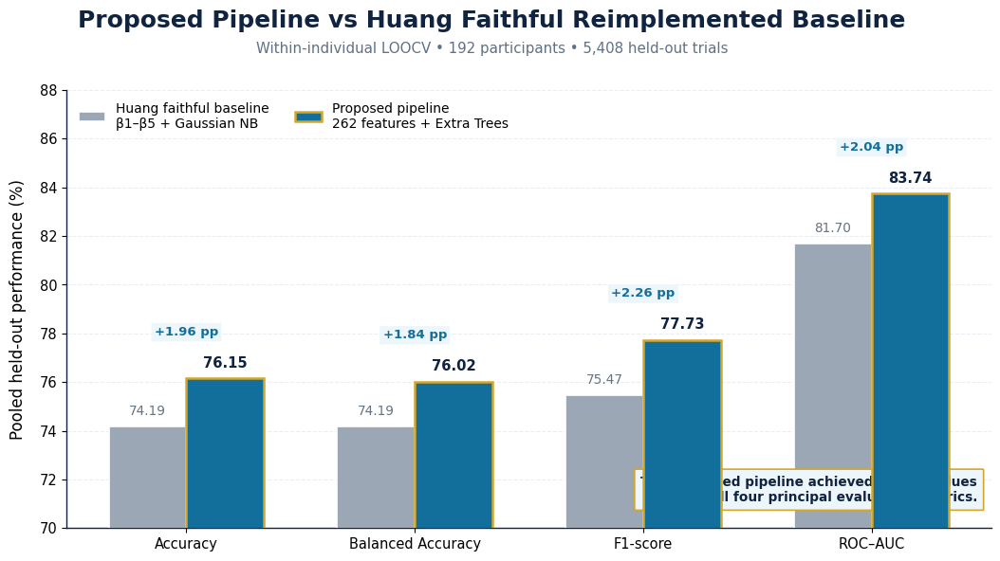

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
RESULT FILES FOUND

Proposed Extra Trees result:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v8_full0_2000ms_no_pca_strict192__pooled_summary.csv

Huang Gaussian NB result:
/content/drive/MyDrive/HUANG_EXP8_STRICT192_COMPLETE_V7_METRICS_PARTICIPANT_SPECIFIC_61_63CH/huang_pooled_5408_complete_metrics.csv

Figures will be saved to:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES

COMPARISON VALUES


,Metric,Huang faithful baseline (%),Proposed pipeline (%),Improvement (percentage points)
0,Accuracy,74.19,76.15,1.96
1,Balanced Accuracy,74.19,76.02,1.84
2,F1-score,75.47,77.73,2.26
3,ROC–AUC,81.70,83.74,2.04


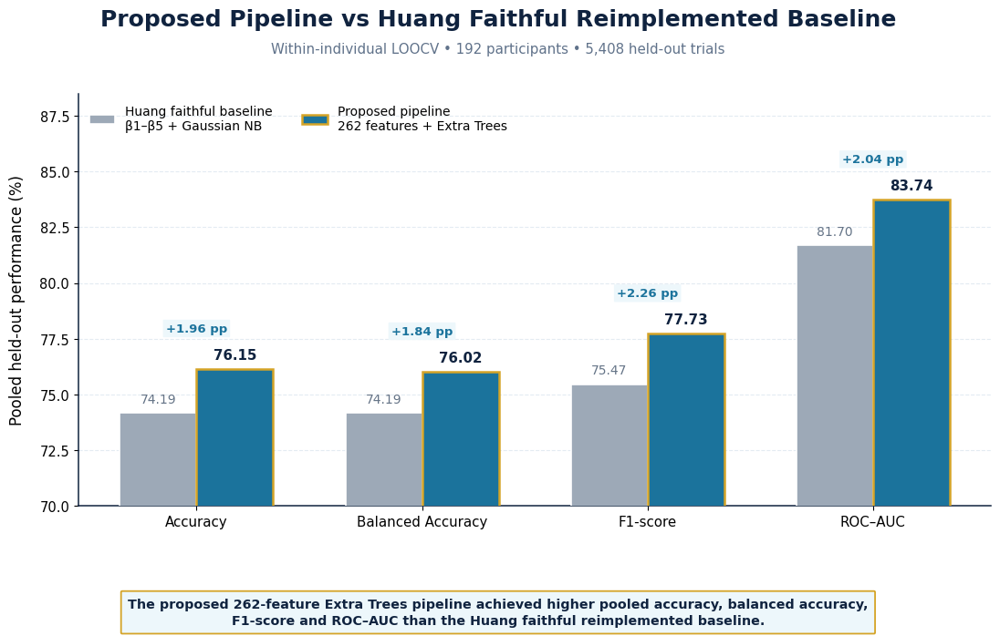


PREMIUM COMPARISON FIGURE GENERATED

PNG:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_01_Proposed_ExtraTrees_vs_Huang_GaussianNB_Grouped_Bar_FIXED.png

PDF:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_01_Proposed_ExtraTrees_vs_Huang_GaussianNB_Grouped_Bar_FIXED.pdf

SVG:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_01_Proposed_ExtraTrees_vs_Huang_GaussianNB_Grouped_Bar_FIXED.svg

Metric improvements:
Accuracy: +1.96 percentage points
Balanced Accuracy: +1.84 percentage points
F1-score: +2.26 percentage points
ROC–AUC: +2.04 percentage points


In [ ]:
# ============================================================
# COMPLETE PREMIUM GROUPED BAR COMPARISON
#
# Proposed pipeline:
#   12-channel, 262-feature representation + Extra Trees
#
# Baseline:
#   Huang faithful reimplementation
#   CSP-derived β1–β5 + Gaussian Naive Bayes
#
# Evaluation:
#   Within-individual LOOCV
#   192 participants
#   5,408 held-out trials
# ============================================================


# ============================================================
# 1. MOUNT GOOGLE DRIVE
# ============================================================

from google.colab import drive

drive.mount(
    "/content/drive",
    force_remount=False
)


# ============================================================
# 2. IMPORT PACKAGES
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# 3. DEFINE RESULT PATHS
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)


# Proposed Extra Trees result
PROPOSED_RESULT_DIR = os.path.join(
    V8_DIR,
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)

PROPOSED_EXPERIMENT = (
    "ExtraTrees__Handcrafted_262_noPCA__"
    "v8_full0_2000ms_no_pca_strict192"
)

PROPOSED_POOLED_PATH = os.path.join(
    PROPOSED_RESULT_DIR,
    (
        f"{PROPOSED_EXPERIMENT}"
        "__pooled_summary.csv"
    )
)


# Huang faithful Gaussian NB result
HUANG_RESULT_DIR = (
    "/content/drive/MyDrive/"
    "HUANG_EXP8_STRICT192_COMPLETE_V7_METRICS_"
    "PARTICIPANT_SPECIFIC_61_63CH"
)

HUANG_POOLED_PATH = os.path.join(
    HUANG_RESULT_DIR,
    "huang_pooled_5408_complete_metrics.csv"
)


# Figure output directory
FIGURE_DIR = os.path.join(
    V8_DIR,
    "PROPOSED_VS_HUANG_PUBLICATION_FIGURES"
)

os.makedirs(
    FIGURE_DIR,
    exist_ok=True
)


# ============================================================
# 4. VALIDATE FILE PATHS
# ============================================================

required_paths = [
    PROPOSED_POOLED_PATH,
    HUANG_POOLED_PATH,
]


missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]


if missing_paths:

    raise FileNotFoundError(
        "The following result files were not found:\n\n"
        +
        "\n".join(missing_paths)
    )


print("=" * 80)
print("RESULT FILES FOUND")
print("=" * 80)

print("\nProposed Extra Trees result:")
print(PROPOSED_POOLED_PATH)

print("\nHuang Gaussian NB result:")
print(HUANG_POOLED_PATH)

print("\nFigures will be saved to:")
print(FIGURE_DIR)


# ============================================================
# 5. LOAD POOLED RESULT FILES
# ============================================================

def load_pooled_metrics(csv_path):
    """
    Supports:
      1. Long format: metric | value | percent
      2. Wide format: one row with metrics as columns
    """

    dataframe = pd.read_csv(csv_path)


    # Remove accidental unnamed index columns
    dataframe = dataframe.loc[
        :,
        ~dataframe.columns.astype(str).str.startswith("Unnamed")
    ]


    # Long-format result file
    if {
        "metric",
        "value"
    }.issubset(dataframe.columns):

        metric_dictionary = {}

        for _, row in dataframe.iterrows():

            metric_name = str(
                row["metric"]
            ).strip()

            try:
                metric_value = float(
                    row["value"]
                )

            except (
                TypeError,
                ValueError
            ):
                continue

            metric_dictionary[
                metric_name
            ] = metric_value


        return metric_dictionary


    # Wide-format result file
    if len(dataframe) >= 1:

        first_row = dataframe.iloc[0]

        return {
            str(column).strip():
                first_row[column]

            for column
            in dataframe.columns
        }


    raise ValueError(
        f"Could not load pooled metrics from:\n{csv_path}"
    )


def extract_percentage_metric(
    metric_dictionary,
    possible_names
):
    """
    Extracts a metric and converts proportions such as
    0.7615 into percentages such as 76.15.
    """

    for metric_name in possible_names:

        if metric_name in metric_dictionary:

            value = float(
                metric_dictionary[
                    metric_name
                ]
            )

            if not np.isfinite(value):
                continue

            if abs(value) <= 1.5:
                value *= 100.0

            return value


    raise KeyError(
        "Could not find any of these metrics:\n"
        +
        ", ".join(possible_names)
    )


proposed_pooled = load_pooled_metrics(
    PROPOSED_POOLED_PATH
)

huang_pooled = load_pooled_metrics(
    HUANG_POOLED_PATH
)


# ============================================================
# 6. EXTRACT THE FOUR MAIN METRICS
# ============================================================

metric_names = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC–AUC",
]


proposed_values = np.array(
    [
        extract_percentage_metric(
            proposed_pooled,
            ["accuracy"]
        ),

        extract_percentage_metric(
            proposed_pooled,
            ["balanced_accuracy"]
        ),

        extract_percentage_metric(
            proposed_pooled,
            [
                "f1_score",
                "f1"
            ]
        ),

        extract_percentage_metric(
            proposed_pooled,
            ["roc_auc"]
        ),
    ],
    dtype=float
)


huang_values = np.array(
    [
        extract_percentage_metric(
            huang_pooled,
            ["accuracy"]
        ),

        extract_percentage_metric(
            huang_pooled,
            ["balanced_accuracy"]
        ),

        extract_percentage_metric(
            huang_pooled,
            [
                "f1_score",
                "f1"
            ]
        ),

        extract_percentage_metric(
            huang_pooled,
            ["roc_auc"]
        ),
    ],
    dtype=float
)


improvements = (
    proposed_values
    -
    huang_values
)


# ============================================================
# 7. VALIDATE EXPECTED RESULTS
# ============================================================

expected_proposed = np.array(
    [
        76.1464,
        76.0229,
        77.7279,
        83.7358,
    ]
)

expected_huang = np.array(
    [
        74.1864,
        74.1863,
        75.4657,
        81.7007,
    ]
)


if not np.allclose(
    proposed_values,
    expected_proposed,
    atol=0.05
):

    print(
        "\nWarning: Proposed values differ from "
        "the expected Extra Trees results."
    )


if not np.allclose(
    huang_values,
    expected_huang,
    atol=0.05
):

    print(
        "\nWarning: Huang values differ from "
        "the expected Gaussian NB results."
    )


comparison_table = pd.DataFrame(
    {
        "Metric":
            metric_names,

        "Huang faithful baseline (%)":
            huang_values,

        "Proposed pipeline (%)":
            proposed_values,

        "Improvement (percentage points)":
            improvements,
    }
).round(2)


print("\n" + "=" * 80)
print("COMPARISON VALUES")
print("=" * 80)

display(
    comparison_table
)


# ============================================================
# 8. PREMIUM PUBLICATION STYLE
# ============================================================

NAVY = "#10233F"

PROPOSED_BLUE = "#1B739C"
PROPOSED_GOLD = "#D5A427"

HUANG_GREY = "#9DA9B7"
HUANG_DARK_GREY = "#657487"

GRID_GREY = "#DFE8F0"
TEXT_GREY = "#60728A"

PALE_BLUE = "#EDF7FB"
WHITE = "#FFFFFF"


plt.rcParams.update(
    {
        "figure.facecolor":
            WHITE,

        "axes.facecolor":
            WHITE,

        "savefig.facecolor":
            WHITE,

        "font.family":
            "DejaVu Sans",

        "font.size":
            11,

        "axes.labelsize":
            12,

        "axes.labelweight":
            "medium",

        "xtick.labelsize":
            10.8,

        "ytick.labelsize":
            10.5,

        "axes.edgecolor":
            NAVY,

        "axes.linewidth":
            1.1,

        "legend.frameon":
            False,

        "pdf.fonttype":
            42,

        "ps.fonttype":
            42,
    }
)


# ============================================================
# 9. CREATE THE LARGE GROUPED BAR FIGURE
# ============================================================

x_positions = np.arange(
    len(metric_names)
)

bar_width = 0.34


figure, axis = plt.subplots(
    figsize=(11.5, 7.3),
    facecolor=WHITE,
)

axis.set_facecolor(
    WHITE
)


# ============================================================
# 10. HUANG BASELINE BARS
# ============================================================

huang_bars = axis.bar(
    x_positions - bar_width / 2,
    huang_values,

    width=bar_width,

    color=HUANG_GREY,
    edgecolor=WHITE,
    linewidth=1.2,

    label=(
        "Huang faithful baseline\n"
        "β1–β5 + Gaussian NB"
    ),

    zorder=3,
)


# ============================================================
# 11. PROPOSED PIPELINE BARS
# ============================================================

proposed_bars = axis.bar(
    x_positions + bar_width / 2,
    proposed_values,

    width=bar_width,

    color=PROPOSED_BLUE,
    edgecolor=PROPOSED_GOLD,
    linewidth=1.8,

    label=(
        "Proposed pipeline\n"
        "262 features + Extra Trees"
    ),

    zorder=4,
)


# ============================================================
# 12. HUANG BAR-VALUE LABELS
# ============================================================

for bar, value in zip(
    huang_bars,
    huang_values
):

    axis.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        value + 0.33,

        f"{value:.2f}",

        ha="center",
        va="bottom",

        fontsize=10,
        color=HUANG_DARK_GREY,

        zorder=6,
    )


# ============================================================
# 13. PROPOSED BAR-VALUE LABELS
# ============================================================

for bar, value in zip(
    proposed_bars,
    proposed_values
):

    axis.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        value + 0.33,

        f"{value:.2f}",

        ha="center",
        va="bottom",

        fontsize=10.8,
        fontweight="bold",
        color=NAVY,

        zorder=6,
    )


# ============================================================
# 14. IMPROVEMENT LABELS
# ============================================================

for (
    x_position,
    proposed_value,
    improvement
) in zip(
    x_positions,
    proposed_values,
    improvements
):

    axis.text(
        x_position,
        proposed_value + 1.55,

        f"+{improvement:.2f} pp",

        ha="center",
        va="bottom",

        fontsize=9.5,
        fontweight="bold",
        color=PROPOSED_BLUE,

        bbox={
            "boxstyle":
                "round,pad=0.24,"
                "rounding_size=0.06",

            "facecolor":
                PALE_BLUE,

            "edgecolor":
                "none",

            "alpha":
                0.98,
        },

        zorder=7,
    )


# ============================================================
# 15. AXIS FORMATTING
# ============================================================

axis.set_xticks(
    x_positions,
    labels=metric_names,
)

axis.set_ylim(
    70,
    88.5
)

axis.set_ylabel(
    "Pooled held-out performance (%)",
    labelpad=11,
)


axis.grid(
    axis="y",
    color=GRID_GREY,
    linestyle="--",
    linewidth=0.8,
    alpha=0.85,
    zorder=0,
)


axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)


# ============================================================
# 16. TITLE AND SUBTITLE
# ============================================================

figure.suptitle(
    (
        "Proposed Pipeline vs Huang Faithful "
        "Reimplemented Baseline"
    ),

    x=0.5,
    y=0.968,

    ha="center",
    va="top",

    fontsize=18,
    fontweight="bold",
    color=NAVY,
)


figure.text(
    0.5,
    0.918,

    (
        "Within-individual LOOCV • "
        "192 participants • "
        "5,408 held-out trials"
    ),

    ha="center",
    va="top",

    fontsize=10.8,
    color=TEXT_GREY,
)


# ============================================================
# 17. LEGEND
# ============================================================

axis.legend(
    loc="upper left",

    bbox_to_anchor=(
        0.0,
        1.0
    ),

    ncol=2,
    frameon=False,

    fontsize=10,
    columnspacing=2.3,
    handlelength=2.0,
)


# ============================================================
# 18. TWO-LINE CONCLUSION BELOW THE GRAPH
# ============================================================

figure.text(
    0.5,
    0.060,

    (
        "The proposed 262-feature Extra Trees pipeline achieved "
        "higher pooled accuracy, balanced accuracy,\n"
        "F1-score and ROC–AUC than the Huang faithful "
        "reimplemented baseline."
    ),

    ha="center",
    va="center",

    fontsize=10.3,
    fontweight="bold",
    color=NAVY,

    linespacing=1.35,

    bbox={
        "boxstyle":
            "round,pad=0.52,"
            "rounding_size=0.08",

        "facecolor":
            PALE_BLUE,

        "edgecolor":
            PROPOSED_GOLD,

        "linewidth":
            1.3,
    },
)


# ============================================================
# 19. RESERVE SPACE WITHOUT REDUCING THE GRAPH TOO MUCH
# ============================================================

figure.subplots_adjust(
    left=0.10,
    right=0.97,
    top=0.84,
    bottom=0.22,
)


# ============================================================
# 20. SAVE PNG, PDF AND SVG
# ============================================================

FIGURE_BASE_NAME = (
    "Figure_01_Proposed_ExtraTrees_vs_"
    "Huang_GaussianNB_Grouped_Bar_FIXED"
)


PNG_PATH = os.path.join(
    FIGURE_DIR,
    FIGURE_BASE_NAME
    +
    ".png"
)

PDF_PATH = os.path.join(
    FIGURE_DIR,
    FIGURE_BASE_NAME
    +
    ".pdf"
)

SVG_PATH = os.path.join(
    FIGURE_DIR,
    FIGURE_BASE_NAME
    +
    ".svg"
)


figure.savefig(
    PNG_PATH,

    dpi=600,
    bbox_inches="tight",
    pad_inches=0.16,
)

figure.savefig(
    PDF_PATH,

    bbox_inches="tight",
    pad_inches=0.16,
)

figure.savefig(
    SVG_PATH,

    bbox_inches="tight",
    pad_inches=0.16,
)


plt.show()


# ============================================================
# 21. PRINT SAVED PATHS
# ============================================================

print("\n" + "=" * 80)
print("PREMIUM COMPARISON FIGURE GENERATED")
print("=" * 80)

print("\nPNG:")
print(PNG_PATH)

print("\nPDF:")
print(PDF_PATH)

print("\nSVG:")
print(SVG_PATH)


print("\nMetric improvements:")

for metric_name, improvement in zip(
    metric_names,
    improvements
):

    print(
        f"{metric_name}: "
        f"+{improvement:.2f} percentage points"
    )

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_02_Participant_Accuracy_Mean_SD.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_02_Participant_Accuracy_Mean_SD.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_02_Participant_Accuracy_Mean_SD.svg


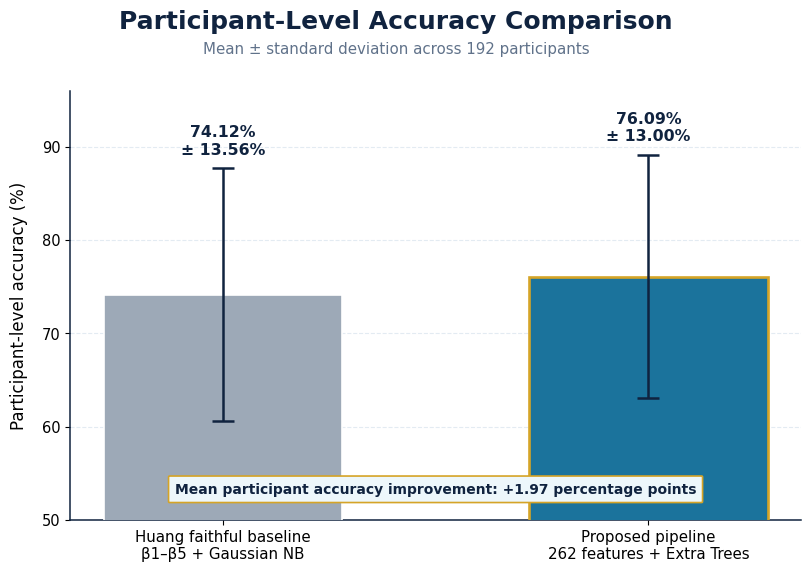

In [ ]:
# ============================================================
# CELL 5 — PARTICIPANT ACCURACY MEAN ± SD
# ============================================================

pipeline_labels = [
    (
        "Huang faithful baseline\n"
        "β1–β5 + Gaussian NB"
    ),

    (
        "Proposed pipeline\n"
        "262 features + Extra Trees"
    ),
]


participant_means = np.array(
    [
        huang_mean_accuracy,
        proposed_mean_accuracy,
    ]
)

participant_sds = np.array(
    [
        huang_accuracy_sd,
        proposed_accuracy_sd,
    ]
)

x_positions = np.arange(
    2
)


figure, axis = plt.subplots(
    figsize=(
        8.8,
        6.5
    )
)


bars = axis.bar(
    x_positions,
    participant_means,

    width=0.56,

    color=[
        HUANG_GREY,
        PROPOSED_BLUE,
    ],

    edgecolor=[
        WHITE,
        PROPOSED_GOLD,
    ],

    linewidth=[
        1.2,
        1.9,
    ],

    zorder=3,
)


axis.errorbar(
    x_positions,
    participant_means,

    yerr=participant_sds,

    fmt="none",

    ecolor=NAVY,
    elinewidth=1.8,

    capsize=8,
    capthick=1.8,

    zorder=5,
)


for (
    bar,
    mean_value,
    sd_value,
) in zip(
    bars,
    participant_means,
    participant_sds,
):

    axis.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        mean_value
        +
        sd_value
        +
        1.2,

        (
            f"{mean_value:.2f}%\n"
            f"± {sd_value:.2f}%"
        ),

        ha="center",
        va="bottom",

        fontsize=11.3,
        fontweight="bold",
        color=NAVY,
        linespacing=1.20,
    )


axis.set_xticks(
    x_positions,
    labels=pipeline_labels,
)

axis.set_ylim(
    50,
    96
)

axis.set_ylabel(
    "Participant-level accuracy (%)",
    labelpad=10,
)


figure.suptitle(
    "Participant-Level Accuracy Comparison",

    x=0.5,
    y=0.965,

    fontsize=18,
    fontweight="bold",
    color=NAVY,
)


figure.text(
    0.5,
    0.915,

    (
        "Mean ± standard deviation across "
        "192 participants"
    ),

    ha="center",
    va="top",

    fontsize=10.8,
    color=TEXT_GREY,
)


axis.grid(
    axis="y",
    color=GRID_GREY,
    linestyle="--",
    linewidth=0.8,
    alpha=0.85,
    zorder=0,
)

remove_upper_spines(
    axis
)


axis.text(
    0.5,
    0.055,

    (
        "Mean participant accuracy improvement: "
        f"+{proposed_mean_accuracy - huang_mean_accuracy:.2f} "
        "percentage points"
    ),

    transform=axis.transAxes,

    ha="center",
    va="bottom",

    fontsize=10,
    fontweight="bold",
    color=NAVY,

    bbox={
        "boxstyle":
            "round,pad=0.45,"
            "rounding_size=0.07",

        "facecolor":
            PALE_BLUE,

        "edgecolor":
            PROPOSED_GOLD,

        "linewidth":
            1.2,
    },
)


figure.subplots_adjust(
    left=0.13,
    right=0.96,
    top=0.84,
    bottom=0.18,
)


save_figure(
    figure,
    "Figure_02_Participant_Accuracy_Mean_SD",
)

plt.show()

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_03_Improvement_Over_Huang_Baseline.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_03_Improvement_Over_Huang_Baseline.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_03_Improvement_Over_Huang_Baseline.svg


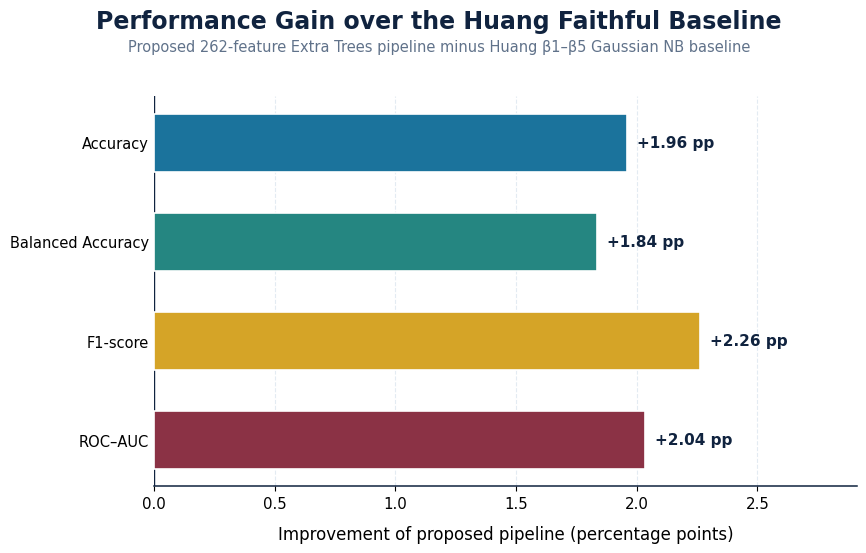

In [ ]:
# ============================================================
# CELL 6 — PROPOSED PIPELINE IMPROVEMENT PLOT
# ============================================================

figure, axis = plt.subplots(
    figsize=(
        9.5,
        6.0
    )
)


improvement_colors = [
    PROPOSED_BLUE,
    TEAL,
    PROPOSED_GOLD,
    BURGUNDY,
]


bars = axis.barh(
    metric_names[
        ::-1
    ],

    improvements[
        ::-1
    ],

    color=improvement_colors[
        ::-1
    ],

    edgecolor=WHITE,
    linewidth=1.2,

    height=0.58,
    zorder=3,
)


for bar, value in zip(
    bars,
    improvements[
        ::-1
    ]
):

    axis.text(
        value + 0.04,
        bar.get_y()
        +
        bar.get_height() / 2,

        f"+{value:.2f} pp",

        ha="left",
        va="center",

        fontsize=11,
        fontweight="bold",
        color=NAVY,
    )


axis.axvline(
    0,
    color=NAVY,
    linewidth=1.0,
)


axis.set_xlim(
    0,
    max(
        improvements
    ) + 0.65
)

axis.set_xlabel(
    (
        "Improvement of proposed pipeline "
        "(percentage points)"
    ),
    labelpad=10,
)


figure.suptitle(
    "Performance Gain over the Huang Faithful Baseline",

    x=0.5,
    y=0.965,

    fontsize=17,
    fontweight="bold",
    color=NAVY,
)


figure.text(
    0.5,
    0.915,

    (
        "Proposed 262-feature Extra Trees pipeline "
        "minus Huang β1–β5 Gaussian NB baseline"
    ),

    ha="center",
    va="top",

    fontsize=10.5,
    color=TEXT_GREY,
)


axis.grid(
    axis="x",
    color=GRID_GREY,
    linestyle="--",
    linewidth=0.8,
    alpha=0.85,
    zorder=0,
)

axis.tick_params(
    axis="y",
    length=0,
)

axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)

axis.spines[
    "left"
].set_visible(
    False
)


figure.subplots_adjust(
    left=0.20,
    right=0.94,
    top=0.82,
    bottom=0.17,
)


save_figure(
    figure,
    "Figure_03_Improvement_Over_Huang_Baseline",
)

plt.show()

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_04_Proposed_vs_Huang_Confusion_Matrices.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_04_Proposed_vs_Huang_Confusion_Matrices.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_04_Proposed_vs_Huang_Confusion_Matrices.svg


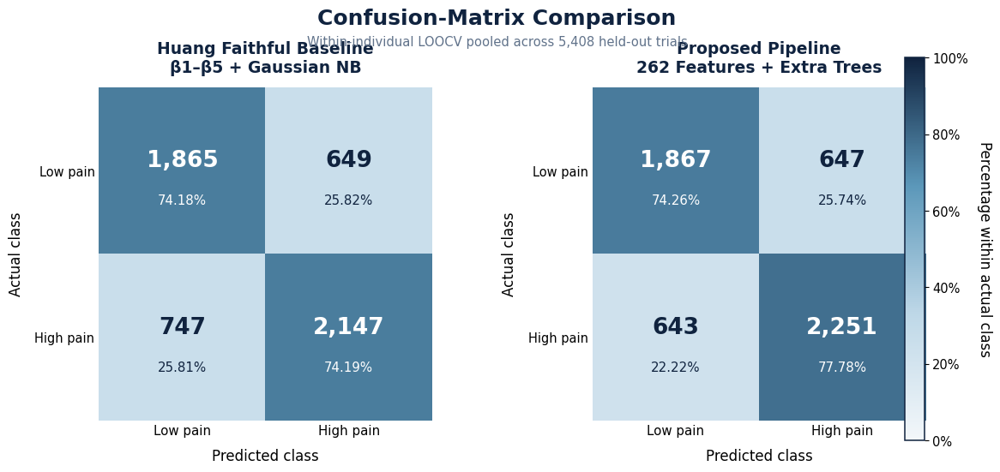

In [ ]:
# ============================================================
# CELL 7 — SIDE-BY-SIDE CONFUSION MATRICES
# ============================================================

# Proposed-pipeline confusion matrix
proposed_matrix = np.array(
    [
        [
            int(
                float(
                    proposed_pooled[
                        "true_negative"
                    ]
                )
            ),

            int(
                float(
                    proposed_pooled[
                        "false_positive"
                    ]
                )
            ),
        ],

        [
            int(
                float(
                    proposed_pooled[
                        "false_negative"
                    ]
                )
            ),

            int(
                float(
                    proposed_pooled[
                        "true_positive"
                    ]
                )
            ),
        ],
    ],
    dtype=int,
)


# Huang confusion matrix from pooled metrics
huang_matrix = np.array(
    [
        [
            int(
                get_percentage_metric(
                    huang_pooled,
                    [
                        "true_negative"
                    ]
                )
                /
                100
                if float(
                    huang_pooled[
                        "true_negative"
                    ]
                ) <= 1.5
                else float(
                    huang_pooled[
                        "true_negative"
                    ]
                )
            ),

            int(
                float(
                    huang_pooled[
                        "false_positive"
                    ]
                )
            ),
        ],

        [
            int(
                float(
                    huang_pooled[
                        "false_negative"
                    ]
                )
            ),

            int(
                float(
                    huang_pooled[
                        "true_positive"
                    ]
                )
            ),
        ],
    ],
    dtype=int,
)


# Direct validation against known values
assert np.array_equal(
    proposed_matrix,
    np.array(
        [
            [
                1867,
                647
            ],
            [
                643,
                2251
            ],
        ]
    )
)

assert np.array_equal(
    huang_matrix,
    np.array(
        [
            [
                1865,
                649
            ],
            [
                747,
                2147
            ],
        ]
    )
)


def row_normalize_matrix(
    matrix
):

    return (
        matrix
        /
        matrix.sum(
            axis=1,
            keepdims=True
        )
        *
        100
    )


proposed_percentages = row_normalize_matrix(
    proposed_matrix
)

huang_percentages = row_normalize_matrix(
    huang_matrix
)


premium_cmap = LinearSegmentedColormap.from_list(
    "premium_confusion",
    [
        "#F3F7FA",
        "#BDD7E7",
        "#5B97B9",
        NAVY,
    ]
)


figure, axes = plt.subplots(
    nrows=1,
    ncols=2,

    figsize=(
        12.5,
        5.8
    )
)


matrix_information = [
    (
        axes[0],
        huang_matrix,
        huang_percentages,
        (
            "Huang Faithful Baseline\n"
            "β1–β5 + Gaussian NB"
        ),
    ),

    (
        axes[1],
        proposed_matrix,
        proposed_percentages,
        (
            "Proposed Pipeline\n"
            "262 Features + Extra Trees"
        ),
    ),
]


for (
    axis,
    count_matrix,
    percentage_matrix,
    title,
) in matrix_information:

    image = axis.imshow(
        percentage_matrix,
        cmap=premium_cmap,
        vmin=0,
        vmax=100,
    )


    axis.set_xticks(
        [
            0,
            1
        ],
        labels=[
            "Low pain",
            "High pain"
        ],
    )

    axis.set_yticks(
        [
            0,
            1
        ],
        labels=[
            "Low pain",
            "High pain"
        ],
    )

    axis.set_xlabel(
        "Predicted class",
        labelpad=9,
    )

    axis.set_ylabel(
        "Actual class",
        labelpad=9,
    )

    axis.set_title(
        title,
        fontsize=13.5,
        fontweight="bold",
        color=NAVY,
        pad=13,
    )


    for row_index in range(
        2
    ):

        for column_index in range(
            2
        ):

            percentage_value = (
                percentage_matrix[
                    row_index,
                    column_index
                ]
            )

            count_value = (
                count_matrix[
                    row_index,
                    column_index
                ]
            )

            text_color = (
                WHITE
                if percentage_value >= 50
                else NAVY
            )


            axis.text(
                column_index,
                row_index - 0.06,

                f"{count_value:,}",

                ha="center",
                va="center",

                fontsize=19,
                fontweight="bold",
                color=text_color,
            )


            axis.text(
                column_index,
                row_index + 0.18,

                f"{percentage_value:.2f}%",

                ha="center",
                va="center",

                fontsize=10.8,
                color=text_color,
            )


    axis.tick_params(
        axis="both",
        length=0,
    )


    for spine in axis.spines.values():

        spine.set_visible(
            False
        )


figure.suptitle(
    "Confusion-Matrix Comparison",

    x=0.5,
    y=0.98,

    fontsize=18,
    fontweight="bold",
    color=NAVY,
)


figure.text(
    0.5,
    0.925,

    (
        "Within-individual LOOCV pooled across "
        "5,408 held-out trials"
    ),

    ha="center",
    va="top",

    fontsize=10.6,
    color=TEXT_GREY,
)


colorbar = figure.colorbar(
    image,
    ax=axes,
    fraction=0.025,
    pad=0.035,
)

colorbar.set_label(
    "Percentage within actual class",
    rotation=270,
    labelpad=20,
)

colorbar.ax.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100
    )
)


figure.subplots_adjust(
    left=0.08,
    right=0.90,
    top=0.82,
    bottom=0.15,
    wspace=0.28,
)


save_figure(
    figure,
    "Figure_04_Proposed_vs_Huang_Confusion_Matrices",
)

plt.show()

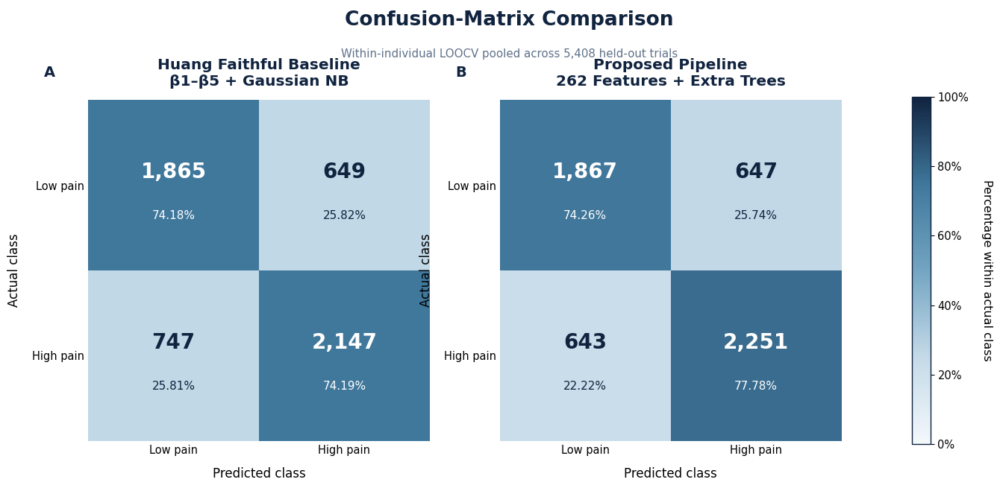

FIXED CONFUSION-MATRIX COMPARISON GENERATED

PNG:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_04_Proposed_vs_Huang_Confusion_Matrices_FIXED.png

PDF:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_04_Proposed_vs_Huang_Confusion_Matrices_FIXED.pdf

SVG:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/PROPOSED_VS_HUANG_PUBLICATION_FIGURES/Figure_04_Proposed_vs_Huang_Confusion_Matrices_FIXED.svg


In [ ]:
# ============================================================
# FIXED PREMIUM SIDE-BY-SIDE CONFUSION MATRICES
#
# Huang faithful baseline:
#   β1–β5 + Gaussian Naive Bayes
#
# Proposed pipeline:
#   262 features + Extra Trees
#
# Evaluation:
#   Within-individual LOOCV
#   192 participants
#   5,408 held-out trials
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import PercentFormatter


# ============================================================
# 1. OUTPUT DIRECTORY
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FIGURE_DIR = os.path.join(
    V8_DIR,
    "PROPOSED_VS_HUANG_PUBLICATION_FIGURES"
)

os.makedirs(
    FIGURE_DIR,
    exist_ok=True
)


# ============================================================
# 2. CONFUSION MATRICES
#
# Rows    = actual class
# Columns = predicted class
# ============================================================

huang_matrix = np.array(
    [
        [1865, 649],
        [747, 2147],
    ],
    dtype=int,
)


proposed_matrix = np.array(
    [
        [1867, 647],
        [643, 2251],
    ],
    dtype=int,
)


# ============================================================
# 3. VALIDATE TOTAL TRIAL COUNTS
# ============================================================

assert huang_matrix.sum() == 5408
assert proposed_matrix.sum() == 5408


# ============================================================
# 4. ROW-NORMALIZED PERCENTAGES
# ============================================================

def row_normalize(matrix):

    return (
        matrix
        /
        matrix.sum(
            axis=1,
            keepdims=True
        )
        *
        100
    )


huang_percentages = row_normalize(
    huang_matrix
)

proposed_percentages = row_normalize(
    proposed_matrix
)


# ============================================================
# 5. PREMIUM STYLE
# ============================================================

NAVY = "#10233F"
TEXT_GREY = "#60728A"
WHITE = "#FFFFFF"
LIGHT_BORDER = "#D5DEE7"


premium_cmap = LinearSegmentedColormap.from_list(
    "premium_confusion_matrix",
    [
        "#F4F8FB",
        "#C4DAE8",
        "#73A5C2",
        "#3F779B",
        NAVY,
    ]
)


plt.rcParams.update(
    {
        "figure.facecolor":
            WHITE,

        "axes.facecolor":
            WHITE,

        "savefig.facecolor":
            WHITE,

        "font.family":
            "DejaVu Sans",

        "font.size":
            11,

        "axes.labelsize":
            12,

        "axes.labelweight":
            "medium",

        "xtick.labelsize":
            10.5,

        "ytick.labelsize":
            10.5,

        "pdf.fonttype":
            42,

        "ps.fonttype":
            42,
    }
)


# ============================================================
# 6. CREATE FIGURE WITH A DEDICATED TITLE ROW
#
# Row 0 = title and subtitle only
# Row 1 = matrices and color bar
# ============================================================

figure = plt.figure(
    figsize=(13.2, 6.9),
    facecolor=WHITE,
)


grid = figure.add_gridspec(
    nrows=2,
    ncols=3,

    height_ratios=[
        0.18,
        0.82,
    ],

    width_ratios=[
        1.0,
        1.0,
        0.055,
    ],

    hspace=0.06,
    wspace=0.30,
)


# Dedicated title area
title_axis = figure.add_subplot(
    grid[0, :]
)

title_axis.axis(
    "off"
)


# Heatmap axes
huang_axis = figure.add_subplot(
    grid[1, 0]
)

proposed_axis = figure.add_subplot(
    grid[1, 1]
)

colorbar_axis = figure.add_subplot(
    grid[1, 2]
)


# ============================================================
# 7. MAIN TITLE AND SUBTITLE
# ============================================================

title_axis.text(
    0.5,
    0.83,

    "Confusion-Matrix Comparison",

    ha="center",
    va="center",

    fontsize=19,
    fontweight="bold",
    color=NAVY,
)


title_axis.text(
    0.5,
    0.39,

    (
        "Within-individual LOOCV pooled across "
        "5,408 held-out trials"
    ),

    ha="center",
    va="center",

    fontsize=10.8,
    color=TEXT_GREY,
)


# ============================================================
# 8. FUNCTION TO DRAW ONE MATRIX
# ============================================================

def draw_confusion_matrix(
    axis,
    count_matrix,
    percentage_matrix,
    title,
):

    image = axis.imshow(
        percentage_matrix,
        cmap=premium_cmap,
        vmin=0,
        vmax=100,
        interpolation="nearest",
    )


    class_labels = [
        "Low pain",
        "High pain",
    ]


    axis.set_xticks(
        [0, 1],
        labels=class_labels,
    )

    axis.set_yticks(
        [0, 1],
        labels=class_labels,
    )


    axis.set_xlabel(
        "Predicted class",
        labelpad=11,
    )

    axis.set_ylabel(
        "Actual class",
        labelpad=11,
    )


    axis.set_title(
        title,
        fontsize=14.5,
        fontweight="bold",
        color=NAVY,
        pad=14,
        linespacing=1.18,
    )


    # Cell annotations
    for row_index in range(2):

        for column_index in range(2):

            count_value = count_matrix[
                row_index,
                column_index
            ]

            percentage_value = percentage_matrix[
                row_index,
                column_index
            ]


            text_color = (
                WHITE
                if percentage_value >= 50
                else NAVY
            )


            # Raw trial count
            axis.text(
                column_index,
                row_index - 0.075,

                f"{count_value:,}",

                ha="center",
                va="center",

                fontsize=20,
                fontweight="bold",
                color=text_color,
            )


            # Row-normalized percentage
            axis.text(
                column_index,
                row_index + 0.18,

                f"{percentage_value:.2f}%",

                ha="center",
                va="center",

                fontsize=11,
                color=text_color,
            )


    axis.tick_params(
        axis="both",
        length=0,
    )


    for spine in axis.spines.values():

        spine.set_visible(
            False
        )


    return image


# ============================================================
# 9. DRAW BOTH MATRICES
# ============================================================

huang_image = draw_confusion_matrix(
    axis=huang_axis,

    count_matrix=huang_matrix,

    percentage_matrix=huang_percentages,

    title=(
        "Huang Faithful Baseline\n"
        "β1–β5 + Gaussian NB"
    ),
)


proposed_image = draw_confusion_matrix(
    axis=proposed_axis,

    count_matrix=proposed_matrix,

    percentage_matrix=proposed_percentages,

    title=(
        "Proposed Pipeline\n"
        "262 Features + Extra Trees"
    ),
)


# ============================================================
# 10. SHARED COLOR BAR
# ============================================================

colorbar = figure.colorbar(
    proposed_image,
    cax=colorbar_axis,
)


colorbar.set_ticks(
    [
        0,
        20,
        40,
        60,
        80,
        100,
    ]
)


colorbar.ax.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100,
        decimals=0,
    )
)


colorbar.set_label(
    "Percentage within actual class",
    rotation=270,
    labelpad=23,
    fontsize=11.5,
)


colorbar.outline.set_edgecolor(
    NAVY
)

colorbar.outline.set_linewidth(
    1.0
)


# ============================================================
# 11. OPTIONAL PANEL LABELS
# ============================================================

huang_axis.text(
    -0.13,
    1.10,

    "A",

    transform=huang_axis.transAxes,

    ha="left",
    va="top",

    fontsize=14,
    fontweight="bold",
    color=NAVY,
)


proposed_axis.text(
    -0.13,
    1.10,

    "B",

    transform=proposed_axis.transAxes,

    ha="left",
    va="top",

    fontsize=14,
    fontweight="bold",
    color=NAVY,
)


# ============================================================
# 12. FINAL SPACING
#
# No suptitle or tight_layout is used because the dedicated
# title row already controls the top spacing.
# ============================================================

figure.subplots_adjust(
    left=0.075,
    right=0.93,
    top=0.97,
    bottom=0.12,
)


# ============================================================
# 13. SAVE PNG, PDF AND SVG
# ============================================================

FIGURE_BASE_NAME = (
    "Figure_04_Proposed_vs_Huang_"
    "Confusion_Matrices_FIXED"
)


PNG_PATH = os.path.join(
    FIGURE_DIR,
    FIGURE_BASE_NAME + ".png"
)

PDF_PATH = os.path.join(
    FIGURE_DIR,
    FIGURE_BASE_NAME + ".pdf"
)

SVG_PATH = os.path.join(
    FIGURE_DIR,
    FIGURE_BASE_NAME + ".svg"
)


figure.savefig(
    PNG_PATH,
    dpi=600,
    bbox_inches="tight",
    pad_inches=0.14,
)

figure.savefig(
    PDF_PATH,
    bbox_inches="tight",
    pad_inches=0.14,
)

figure.savefig(
    SVG_PATH,
    bbox_inches="tight",
    pad_inches=0.14,
)


plt.show()


# ============================================================
# 14. PRINT SAVED PATHS
# ============================================================

print("=" * 80)
print("FIXED CONFUSION-MATRIX COMPARISON GENERATED")
print("=" * 80)

print("\nPNG:")
print(PNG_PATH)

print("\nPDF:")
print(PDF_PATH)

print("\nSVG:")
print(SVG_PATH)

In [ ]:
# ============================================================
# CELL 8 — FINAL REPORT-READY TABLE
# ============================================================

report_table = pd.DataFrame(
    [
        {
            "Pipeline":
                (
                    "Huang faithful baseline: "
                    "beta1-beta5 + Gaussian NB"
                ),

            "Accuracy (%)":
                huang_values[0],

            "Balanced Accuracy (%)":
                huang_values[1],

            "F1-score (%)":
                huang_values[2],

            "ROC-AUC (%)":
                huang_values[3],

            "Mean participant accuracy (%)":
                huang_mean_accuracy,

            "Participant accuracy SD (%)":
                huang_accuracy_sd,
        },

        {
            "Pipeline":
                (
                    "Proposed: 262 features "
                    "+ Extra Trees"
                ),

            "Accuracy (%)":
                proposed_values[0],

            "Balanced Accuracy (%)":
                proposed_values[1],

            "F1-score (%)":
                proposed_values[2],

            "ROC-AUC (%)":
                proposed_values[3],

            "Mean participant accuracy (%)":
                proposed_mean_accuracy,

            "Participant accuracy SD (%)":
                proposed_accuracy_sd,
        },
    ]
).round(
    2
)


REPORT_TABLE_PATH = os.path.join(
    FIGURE_DIR,
    (
        "Proposed_ExtraTrees_vs_"
        "Huang_GaussianNB_Final_Table.csv"
    )
)

report_table.to_csv(
    REPORT_TABLE_PATH,
    index=False
)


display(
    report_table
)


print("\nSaved:")
print(REPORT_TABLE_PATH)

In [ ]:
# ============================================================
# TWO-LINE CONCLUSION BELOW THE GRAPH
# ============================================================

figure.text(
    0.5,
    0.055,

    (
        "The proposed 262-feature Extra Trees pipeline achieved higher "
        "pooled accuracy, balanced accuracy,\n"
        "F1-score and ROC–AUC than the Huang faithful reimplemented baseline."
    ),

    ha="center",
    va="center",

    fontsize=10.3,
    fontweight="bold",
    color=NAVY,
    linespacing=1.35,

    bbox={
        "boxstyle": "round,pad=0.52,rounding_size=0.08",
        "facecolor": PALE_BLUE,
        "edgecolor": PROPOSED_GOLD,
        "linewidth": 1.3,
    },
)


# ============================================================
# KEEP THE ORIGINAL LARGE GRAPH SIZE
# Reserve only enough footer space for the two-line conclusion
# ============================================================

figure.subplots_adjust(
    left=0.10,
    right=0.97,
    top=0.84,
    bottom=0.22,
)

In [ ]:
# ============================================================
# CELL 12 — XGBoost on V8 within-individual LOOCV
#
# 262 raw handcrafted features
# No scaling
# No PCA
# Strict-192 participants
# 5408 held-out trials
# ============================================================

from xgboost import XGBClassifier


xgb_v8 = XGBClassifier(
    n_estimators=150,
    max_depth=2,
    learning_rate=0.05,
    min_child_weight=2,

    subsample=0.90,
    colsample_bytree=0.80,

    reg_alpha=0.10,
    reg_lambda=2.00,

    objective="binary:logistic",
    eval_metric="logloss",

    tree_method="hist",
    random_state=42,
    n_jobs=-1,
    verbosity=0
)


xgb_v8_result = run_within_individual_loocv_v8(
    X=X_handcrafted,
    y=y,
    groups=groups,
    estimator=xgb_v8,
    model_name="XGBoost",
    feature_set_name="Handcrafted_262_noPCA",
    experiment_tag="v8_full0_2000ms_xgboost_strict192",
    resume=True,
    overwrite=False,
)


V8 WITHIN-INDIVIDUAL LOOCV EXPERIMENT
Experiment: XGBoost__Handcrafted_262_noPCA__v8_full0_2000ms_xgboost_strict192
Model: XGBoost
Feature set: Handcrafted_262_noPCA
Complete feature matrix: (6275, 262)
Eligible strict-192 subjects: 192
Evaluated trials: 5408
Strict class counts [low, high]: [2514, 2894]
Number of features: 262
Feature-level scaling: Not applied
PCA: Not applied

Results will be saved to:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/XGBoost__Handcrafted_262_noPCA__v8_full0_2000ms_xgboost_strict192__trial_predictions.csv

Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/XGBoost__Handcrafted_262_noPCA__v8_full0_2000ms_xgboost_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FU

V8 Within LOOCV | XGBoost:   0%|          | 0/192 [00:00<?, ?it/s]


V8 WITHIN-INDIVIDUAL LOOCV COMPLETED SUCCESSFULLY
Experiment: XGBoost__Handcrafted_262_noPCA__v8_full0_2000ms_xgboost_strict192
Model: XGBoost
Feature set: Handcrafted_262_noPCA
Evaluated subjects: 192
Evaluated held-out trials: 5408
Features: 262

POOLED HELD-OUT TRIAL METRICS:


,value
accuracy,0.748151
balanced_accuracy,0.746013
precision,0.758609
recall,0.776434
sensitivity,0.776434
specificity,0.715593
f1_score,0.767418
roc_auc,0.806152
average_precision_pr_auc,0.791478
matthews_correlation_coefficient,0.493060



Mean subject accuracy ± SD:
74.74% ± 13.93%

SUBJECT METRICS: MEAN ± SD


,metric,n_evaluated_subjects,n_valid_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,192,192,0.747390,0.139343,74.738996,13.934318,74.74% ± 13.93%
1,balanced_accuracy,192,192,0.569396,0.135874,56.939616,13.587367,56.94% ± 13.59%
2,precision,192,192,0.578356,0.332255,57.835626,33.225480,57.84% ± 33.23%
3,recall,192,192,0.614856,0.381670,61.485603,38.166973,61.49% ± 38.17%
4,sensitivity,192,192,0.614856,0.381670,61.485603,38.166973,61.49% ± 38.17%
5,specificity,192,192,0.523936,0.396086,52.393629,39.608612,52.39% ± 39.61%
6,negative_predictive_value,192,151,0.652365,0.239418,65.236458,23.941836,65.24% ± 23.94%
7,false_positive_rate,192,192,0.476064,0.396086,47.606371,39.608612,47.61% ± 39.61%
8,false_negative_rate,192,192,0.385144,0.381670,38.514397,38.166973,38.51% ± 38.17%
9,f1_score,192,192,0.588963,0.351698,58.896267,35.169822,58.90% ± 35.17%



Saved paths:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/XGBoost__Handcrafted_262_noPCA__v8_full0_2000ms_xgboost_strict192__trial_predictions.csv

Subject-level results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/XGBoost__Handcrafted_262_noPCA__v8_full0_2000ms_xgboost_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/XGBoost__Handcrafted_262_noPCA__v8_full0_2000ms_xgboost_strict192__subject_metric_summary.csv

Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/XGBoost__Handcrafted_262_noPCA__v8_full0_2000ms_xgboost_strict192__pooled_summary.csv

Pro

In [ ]:
# ============================================================
# CELL 20
# Complete cross-individual LOSO evaluator

# Evaluation:
#   Leave-One-Subject-Out
# ============================================================

import os
import re
import json
import time
import warnings

import numpy as np
import pandas as pd

from tqdm.auto import tqdm
from sklearn.base import clone

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)

warnings.filterwarnings("ignore")


# ============================================================
# 1. Output directory
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

os.makedirs(
    V8_DIR,
    exist_ok=True
)


V8_LOSO_RESULTS_DIR = os.path.join(
    V8_DIR,
    "V8_LOSO_RESULTS"
)

os.makedirs(
    V8_LOSO_RESULTS_DIR,
    exist_ok=True
)


print("V8 LOSO evaluator output directory:")
print(V8_LOSO_RESULTS_DIR)


# ============================================================
# 2. Safe file-writing helpers
# ============================================================

def atomic_write_csv(dataframe, path):

    temporary_path = f"{path}.tmp"

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        path
    )


def atomic_write_json(content, path):

    temporary_path = f"{path}.tmp"

    with open(
        temporary_path,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            content,
            file,
            indent=4,
            default=str
        )

    os.replace(
        temporary_path,
        path
    )


def make_safe_filename(text):

    text = str(text).strip()

    text = re.sub(
        r"[^A-Za-z0-9_.-]+",
        "_",
        text
    )

    return text.strip("_")


# ============================================================
# 3. Obtain continuous prediction scores
#
# Positive class:
#   1 = High pain
# ============================================================

def get_positive_class_scores(
    fitted_model,
    X_test,
    y_pred
):

    classes = np.asarray(
        getattr(
            fitted_model,
            "classes_",
            np.array([0, 1])
        )
    )


    positive_indices = np.flatnonzero(
        classes == 1
    )


    if len(positive_indices) == 0:

        raise ValueError(
            "The fitted classifier does not "
            "contain positive class label 1."
        )


    positive_index = int(
        positive_indices[0]
    )


    if hasattr(
        fitted_model,
        "predict_proba"
    ):

        probabilities = np.asarray(
            fitted_model.predict_proba(
                X_test
            ),
            dtype=float
        )


        if probabilities.ndim != 2:

            raise ValueError(
                "predict_proba() returned "
                "an unexpected shape."
            )


        return (
            probabilities[
                :,
                positive_index
            ].ravel(),
            "predict_proba"
        )


    if hasattr(
        fitted_model,
        "decision_function"
    ):

        decision_scores = np.asarray(
            fitted_model.decision_function(
                X_test
            ),
            dtype=float
        )


        if decision_scores.ndim == 1:

            scores = decision_scores

        elif decision_scores.ndim == 2:

            scores = decision_scores[
                :,
                positive_index
            ]

        else:

            raise ValueError(
                "decision_function() returned "
                "an unexpected shape."
            )


        return (
            scores.ravel(),
            "decision_function"
        )


    return (
        np.asarray(
            y_pred,
            dtype=float
        ).ravel(),
        "predicted_label_fallback"
    )


# ============================================================
# 4. Complete binary-classification metrics
# ============================================================

def calculate_binary_metrics(
    y_true,
    y_pred,
    y_score=None
):

    y_true = np.asarray(
        y_true,
        dtype=np.int8
    ).ravel()


    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    ).ravel()


    if len(y_true) != len(y_pred):

        raise ValueError(
            "y_true and y_pred have "
            "different lengths."
        )


    if y_score is not None:

        y_score = np.asarray(
            y_score,
            dtype=float
        ).ravel()


        if len(y_score) != len(y_true):

            raise ValueError(
                "y_score and y_true have "
                "different lengths."
            )


    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()


    has_both_true_classes = (
        len(
            np.unique(y_true)
        ) == 2
    )


    valid_continuous_scores = (
        y_score is not None
        and np.isfinite(y_score).all()
    )


    precision = precision_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )


    recall = recall_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )


    sensitivity = recall


    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else np.nan
    )


    negative_predictive_value = (
        tn / (tn + fn)
        if (tn + fn) > 0
        else np.nan
    )


    false_positive_rate = (
        fp / (fp + tn)
        if (fp + tn) > 0
        else np.nan
    )


    false_negative_rate = (
        fn / (fn + tp)
        if (fn + tp) > 0
        else np.nan
    )


    if (
        has_both_true_classes
        and valid_continuous_scores
    ):

        roc_auc = roc_auc_score(
            y_true,
            y_score
        )

        average_precision_pr_auc = (
            average_precision_score(
                y_true,
                y_score
            )
        )

    else:

        roc_auc = np.nan

        average_precision_pr_auc = np.nan


    try:

        matthews_correlation = (
            matthews_corrcoef(
                y_true,
                y_pred
            )
        )

    except Exception:

        matthews_correlation = np.nan


    try:

        cohen_kappa = cohen_kappa_score(
            y_true,
            y_pred
        )


        if not np.isfinite(
            cohen_kappa
        ):

            cohen_kappa = np.nan

    except Exception:

        cohen_kappa = np.nan


    return {

        "accuracy": accuracy_score(
            y_true,
            y_pred
        ),

        "balanced_accuracy": (
            balanced_accuracy_score(
                y_true,
                y_pred
            )
            if has_both_true_classes
            else np.nan
        ),

        "precision": precision,

        "recall": recall,

        "sensitivity": sensitivity,

        "specificity": specificity,

        "negative_predictive_value": (
            negative_predictive_value
        ),

        "false_positive_rate": (
            false_positive_rate
        ),

        "false_negative_rate": (
            false_negative_rate
        ),

        "f1_score": f1_score(
            y_true,
            y_pred,
            pos_label=1,
            zero_division=0
        ),

        "roc_auc": roc_auc,

        "average_precision_pr_auc": (
            average_precision_pr_auc
        ),

        "matthews_correlation_coefficient": (
            matthews_correlation
        ),

        "cohen_kappa": cohen_kappa,

        "precision_macro": precision_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="macro",
            zero_division=0
        ),

        "recall_macro": recall_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="macro",
            zero_division=0
        ),

        "f1_macro": f1_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="macro",
            zero_division=0
        ),

        "precision_weighted": precision_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="weighted",
            zero_division=0
        ),

        "recall_weighted": recall_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="weighted",
            zero_division=0
        ),

        "f1_weighted": f1_score(
            y_true,
            y_pred,
            labels=[0, 1],
            average="weighted",
            zero_division=0
        ),

        "prevalence_high_pain": float(
            np.mean(
                y_true == 1
            )
        ),

        "support_low_pain": int(
            np.sum(
                y_true == 0
            )
        ),

        "support_high_pain": int(
            np.sum(
                y_true == 1
            )
        ),

        "true_negative": int(tn),

        "false_positive": int(fp),

        "false_negative": int(fn),

        "true_positive": int(tp),
    }


# ============================================================
# 5. Subject-level metric summary
# ============================================================

def summarize_subject_metrics(
    subject_results_df
):

    metric_columns = [

        "accuracy",
        "balanced_accuracy",
        "precision",
        "recall",
        "sensitivity",
        "specificity",
        "negative_predictive_value",
        "false_positive_rate",
        "false_negative_rate",
        "f1_score",
        "roc_auc",
        "average_precision_pr_auc",
        "matthews_correlation_coefficient",
        "cohen_kappa",
        "precision_macro",
        "recall_macro",
        "f1_macro",
        "precision_weighted",
        "recall_weighted",
        "f1_weighted",
    ]


    summary_rows = []


    for metric in metric_columns:

        values = (
            subject_results_df[
                metric
            ]
            .replace(
                [np.inf, -np.inf],
                np.nan
            )
            .dropna()
            .astype(float)
        )


        metric_mean = (
            values.mean()
            if len(values) > 0
            else np.nan
        )


        metric_standard_deviation = (
            values.std(
                ddof=1
            )
            if len(values) > 1
            else np.nan
        )


        summary_rows.append({

            "metric": metric,

            "n_subjects": int(
                len(values)
            ),

            "mean": metric_mean,

            "standard_deviation": (
                metric_standard_deviation
            ),

            "mean_percent": (
                metric_mean * 100
                if np.isfinite(
                    metric_mean
                )
                else np.nan
            ),

            "standard_deviation_percent": (
                metric_standard_deviation * 100
                if np.isfinite(
                    metric_standard_deviation
                )
                else np.nan
            ),

            "mean_plus_minus_sd": (

                f"{metric_mean * 100:.2f}% "
                f"± "
                f"{metric_standard_deviation * 100:.2f}%"

                if (
                    np.isfinite(
                        metric_mean
                    )
                    and np.isfinite(
                        metric_standard_deviation
                    )
                )

                else "Not defined"
            ),
        })


    return pd.DataFrame(
        summary_rows
    )


# ============================================================
# 6. Main reusable LOSO evaluator — V8
# ============================================================

def run_loso_evaluation_v8(

    X,
    y,
    groups,
    estimator,
    model_name,
    feature_set_name,

    metadata_df=None,

    experiment_tag=(
        "v8_full0_2000ms_subject_standardized"
    ),

    resume=True,

    overwrite=False,

    compute_train_accuracy=False,

    expected_epochs=6275,

    expected_features=262,

    expected_subjects=223,
):

    """
    Cross-individual Leave-One-Subject-Out evaluation
    for the V8 0–2000 ms feature pipeline.

    The supplied X matrix should contain the V8
    subject-standardized 262 handcrafted features.
    """


    # --------------------------------------------------------
    # A. Basic input validation
    # --------------------------------------------------------

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()


    groups = np.asarray(
        groups
    ).astype(
        str
    ).ravel()


    if (
        not hasattr(X, "shape")
        or len(X.shape) != 2
    ):

        raise ValueError(
            "X must have shape "
            "(n_epochs, n_features)."
        )


    n_epochs = int(
        X.shape[0]
    )

    n_features = int(
        X.shape[1]
    )


    if n_epochs != len(y):

        raise ValueError(
            "X and y have different "
            "numbers of rows."
        )


    if len(y) != len(groups):

        raise ValueError(
            "y and groups have different "
            "numbers of rows."
        )


    if (
        metadata_df is not None
        and len(metadata_df) != n_epochs
    ):

        raise ValueError(
            "metadata_df is not aligned with X."
        )


    if not np.array_equal(
        np.unique(y),
        np.array([0, 1])
    ):

        raise ValueError(
            "Labels must contain binary "
            "values 0 and 1."
        )


    all_subjects = np.sort(
        np.unique(groups)
    )

    n_subjects = int(
        len(all_subjects)
    )


    if (
        expected_epochs is not None
        and n_epochs != expected_epochs
    ):

        raise ValueError(
            f"Expected {expected_epochs} epochs, "
            f"but found {n_epochs}."
        )


    if (
        expected_features is not None
        and n_features != expected_features
    ):

        raise ValueError(
            f"Expected {expected_features} features, "
            f"but found {n_features}."
        )


    if (
        expected_subjects is not None
        and n_subjects != expected_subjects
    ):

        raise ValueError(
            f"Expected {expected_subjects} subjects, "
            f"but found {n_subjects}."
        )


    class_counts = np.bincount(
        y,
        minlength=2
    )


    if not np.array_equal(
        class_counts,
        np.array([
            2725,
            3550
        ])
    ):

        raise ValueError(
            "Expected class counts [2725, 3550], "
            f"but found {class_counts.tolist()}."
        )


    # --------------------------------------------------------
    # B. Validate finite feature values
    # --------------------------------------------------------

    validation_batch_size = 512


    for validation_start in range(
        0,
        n_epochs,
        validation_batch_size
    ):

        validation_stop = min(
            validation_start
            + validation_batch_size,
            n_epochs
        )


        validation_batch = np.asarray(
            X[
                validation_start:
                validation_stop
            ]
        )


        if not np.isfinite(
            validation_batch
        ).all():

            raise ValueError(
                "X contains NaN or infinite values "
                f"between rows "
                f"{validation_start}:"
                f"{validation_stop}."
            )


    # --------------------------------------------------------
    # C. Experiment name and output paths
    # --------------------------------------------------------

    safe_model_name = make_safe_filename(
        model_name
    )

    safe_feature_set_name = (
        make_safe_filename(
            feature_set_name
        )
    )

    safe_experiment_tag = (
        make_safe_filename(
            experiment_tag
        )
    )


    experiment_name = (

        f"{safe_model_name}__"

        f"{safe_feature_set_name}__"

        f"{safe_experiment_tag}"
    )


    trial_prediction_path = os.path.join(

        V8_LOSO_RESULTS_DIR,

        f"{experiment_name}"
        "__trial_predictions.csv"
    )


    subject_result_path = os.path.join(

        V8_LOSO_RESULTS_DIR,

        f"{experiment_name}"
        "__subject_results.csv"
    )


    subject_metric_summary_path = os.path.join(

        V8_LOSO_RESULTS_DIR,

        f"{experiment_name}"
        "__subject_metric_summary.csv"
    )


    pooled_summary_path = os.path.join(

        V8_LOSO_RESULTS_DIR,

        f"{experiment_name}"
        "__pooled_summary.csv"
    )


    progress_path = os.path.join(

        V8_LOSO_RESULTS_DIR,

        f"{experiment_name}"
        "__progress.json"
    )


    configuration_path = os.path.join(

        V8_LOSO_RESULTS_DIR,

        f"{experiment_name}"
        "__configuration.json"
    )


    output_paths = [

        trial_prediction_path,

        subject_result_path,

        subject_metric_summary_path,

        pooled_summary_path,

        progress_path,

        configuration_path,
    ]


    # --------------------------------------------------------
    # D. Print experiment information
    # --------------------------------------------------------

    print(
        "\n" + "=" * 72
    )

    print(
        "V8 LOSO EXPERIMENT"
    )

    print(
        "=" * 72
    )

    print(
        "Experiment name:",
        experiment_name
    )

    print(
        "Model:",
        model_name
    )

    print(
        "Feature set:",
        feature_set_name
    )

    print(
        "Feature matrix:",
        X.shape
    )

    print(
        "Subjects:",
        n_subjects
    )

    print(
        "Class counts [low, high]:",
        class_counts.tolist()
    )

    print(
        "Response interval:",
        "0–2000 ms"
    )


    print(
        "\nResults will be saved to:"
    )

    print(
        "1. Trial predictions:\n",
        trial_prediction_path
    )

    print(
        "\n2. Subject results:\n",
        subject_result_path
    )

    print(
        "\n3. Subject metric summary:\n",
        subject_metric_summary_path
    )

    print(
        "\n4. Pooled summary:\n",
        pooled_summary_path
    )

    print(
        "\n5. Progress checkpoint:\n",
        progress_path
    )

    print(
        "\n6. Configuration:\n",
        configuration_path
    )


    # --------------------------------------------------------
    # E. Handle existing experiment files
    # --------------------------------------------------------

    if overwrite:

        for path in output_paths:

            if os.path.exists(
                path
            ):

                os.remove(
                    path
                )


        print(
            "\nExisting experiment files removed."
        )


    elif (
        not resume
        and os.path.exists(
            trial_prediction_path
        )
    ):

        raise FileExistsError(
            "An existing checkpoint was found. "
            "Use resume=True or overwrite=True."
        )


    # --------------------------------------------------------
    # F. Save configuration
    # --------------------------------------------------------

    configuration = {

        "experiment_name": experiment_name,

        "model_name": str(
            model_name
        ),

        "feature_set_name": str(
            feature_set_name
        ),

        "experiment_tag": str(
            experiment_tag
        ),

        "pipeline_version": "V8",

        "response_interval_ms": (
            "0 to 1999"
        ),

        "validation": (
            "Leave-One-Subject-Out"
        ),

        "n_epochs": n_epochs,

        "n_features": n_features,

        "n_subjects": n_subjects,

        "low_pain_count": int(
            np.sum(
                y == 0
            )
        ),

        "high_pain_count": int(
            np.sum(
                y == 1
            )
        ),

        "positive_class": (
            "High pain = 1"
        ),

        "negative_class": (
            "Low pain = 0"
        ),

        "estimator": repr(
            estimator
        ),

        "compute_train_accuracy": bool(
            compute_train_accuracy
        ),

        "leakage_control": (

            "A fresh cloned estimator is fitted "
            "only on outer-training participants "
            "inside every LOSO fold. The held-out "
            "participant is completely excluded "
            "from model fitting."
        ),

        "feature_input": (

            "V8 subject-standardized "
            "262 handcrafted features"
        ),
    }


    atomic_write_json(
        configuration,
        configuration_path
    )


    # --------------------------------------------------------
    # G. Load prediction checkpoint
    # --------------------------------------------------------

    required_prediction_columns = {

        "test_subject",

        "original_row_index",

        "y_true",

        "y_pred",

        "y_score",
    }


    if (
        resume
        and os.path.exists(
            trial_prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            trial_prediction_path
        )


        missing_columns = (
            required_prediction_columns
            .difference(
                predictions_df.columns
            )
        )


        if missing_columns:

            raise ValueError(
                "The saved checkpoint is invalid. "
                f"Missing columns: "
                f"{sorted(missing_columns)}"
            )


        predictions_df[
            "test_subject"
        ] = predictions_df[
            "test_subject"
        ].astype(str)


        predictions_df = (

            predictions_df

            .sort_values(
                "original_row_index"
            )

            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )

            .reset_index(
                drop=True
            )
        )


        completed_subjects = set(
            predictions_df[
                "test_subject"
            ].unique()
        )


        print(
            "\nCheckpoint detected. "
            "Completed subjects:",
            len(completed_subjects),
            "/",
            n_subjects
        )


    else:

        predictions_df = pd.DataFrame()

        completed_subjects = set()


        print(
            "\nStarting a new V8 LOSO run."
        )


    # --------------------------------------------------------
    # H. Load subject-result checkpoint
    # --------------------------------------------------------

    if (
        resume
        and os.path.exists(
            subject_result_path
        )
    ):

        subject_checkpoint_df = pd.read_csv(
            subject_result_path
        )


        if (
            "subject_id"
            in subject_checkpoint_df.columns
        ):

            subject_checkpoint_df[
                "subject_id"
            ] = subject_checkpoint_df[
                "subject_id"
            ].astype(str)


    else:

        subject_checkpoint_df = pd.DataFrame()


    # --------------------------------------------------------
    # I. Begin LOSO evaluation
    # --------------------------------------------------------

    wall_start_time = time.perf_counter()


    for test_subject in tqdm(

        all_subjects,

        desc=(
            f"V8 LOSO | "
            f"{model_name} | "
            f"{feature_set_name}"
        )
    ):

        test_subject = str(
            test_subject
        )


        if test_subject in completed_subjects:

            continue


        train_indices = np.flatnonzero(
            groups != test_subject
        )


        test_indices = np.flatnonzero(
            groups == test_subject
        )


        if len(test_indices) == 0:

            raise RuntimeError(
                f"No test rows found for "
                f"{test_subject}."
            )


        train_subjects = set(
            groups[
                train_indices
            ]
        )


        test_subjects = set(
            groups[
                test_indices
            ]
        )


        if not train_subjects.isdisjoint(
            test_subjects
        ):

            raise RuntimeError(
                "Subject leakage detected between "
                "training and test indices."
            )


        if test_subject in train_subjects:

            raise RuntimeError(
                f"Test subject {test_subject} "
                "was found in the training fold."
            )


        if test_subjects != {
            test_subject
        }:

            raise RuntimeError(
                "The test fold contains "
                "an unexpected subject."
            )


        X_train = X[
            train_indices
        ]


        X_test = X[
            test_indices
        ]


        y_train = y[
            train_indices
        ]


        y_test = y[
            test_indices
        ]


        if len(
            np.unique(
                y_train
            )
        ) != 2:

            raise RuntimeError(
                "The training fold for "
                f"{test_subject} does not "
                "contain both classes."
            )


        # Fresh model for every held-out participant
        fold_model = clone(
            estimator
        )


        fit_start_time = time.perf_counter()


        fold_model.fit(
            X_train,
            y_train
        )


        fit_seconds = (
            time.perf_counter()
            - fit_start_time
        )


        prediction_start_time = (
            time.perf_counter()
        )


        y_pred = np.asarray(
            fold_model.predict(
                X_test
            ),
            dtype=np.int8
        ).ravel()


        y_score, score_source = (
            get_positive_class_scores(
                fold_model,
                X_test,
                y_pred
            )
        )


        prediction_seconds = (
            time.perf_counter()
            - prediction_start_time
        )


        if len(y_pred) != len(y_test):

            raise RuntimeError(
                "Prediction length does not "
                "match test-label length."
            )


        if len(y_score) != len(y_test):

            raise RuntimeError(
                "Prediction-score length does not "
                "match test-label length."
            )


        train_accuracy = (

            fold_model.score(
                X_train,
                y_train
            )

            if compute_train_accuracy

            else np.nan
        )


        # ----------------------------------------------------
        # Trial-level predictions for held-out subject
        # ----------------------------------------------------

        fold_predictions_df = pd.DataFrame({

            "experiment": experiment_name,

            "model": model_name,

            "feature_set": (
                feature_set_name
            ),

            "test_subject": (
                test_subject
            ),

            "original_row_index": (
                test_indices
            ),

            "y_true": y_test,

            "y_pred": y_pred,

            "y_score": y_score,

            "score_source": (
                score_source
            ),

            "fit_seconds": (
                fit_seconds
            ),

            "prediction_seconds": (
                prediction_seconds
            ),

            "train_accuracy": (
                train_accuracy
            ),
        })


        # ----------------------------------------------------
        # Optional metadata
        # ----------------------------------------------------

        if metadata_df is not None:

            metadata_subset = (
                metadata_df.iloc[
                    test_indices
                ]
                .reset_index(
                    drop=True
                )
            )


            for column in [

                "trial_num",

                "painrating",

                "laser_power",

                "event_type",

                "source_file",

            ]:

                if (
                    column
                    in metadata_subset.columns
                ):

                    fold_predictions_df[
                        column
                    ] = metadata_subset[
                        column
                    ].to_numpy()


        # ----------------------------------------------------
        # Subject-level metrics for current test subject
        # ----------------------------------------------------

        fold_metrics = (
            calculate_binary_metrics(
                y_test,
                y_pred,
                y_score
            )
        )


        fold_subject_result = {

            "experiment": (
                experiment_name
            ),

            "model": model_name,

            "feature_set": (
                feature_set_name
            ),

            "subject_id": (
                test_subject
            ),

            "n_trials": int(
                len(y_test)
            ),

            "n_low": int(
                np.sum(
                    y_test == 0
                )
            ),

            "n_high": int(
                np.sum(
                    y_test == 1
                )
            ),

            **fold_metrics,

            "fit_seconds": float(
                fit_seconds
            ),

            "prediction_seconds": float(
                prediction_seconds
            ),

            "train_accuracy": float(
                train_accuracy
            ),

            "score_source": (
                score_source
            ),
        }


        fold_subject_df = pd.DataFrame([
            fold_subject_result
        ])


        # ----------------------------------------------------
        # Update checkpoint tables
        # ----------------------------------------------------

        predictions_df = pd.concat(
            [
                predictions_df,
                fold_predictions_df
            ],
            ignore_index=True
        )


        predictions_df = (

            predictions_df

            .sort_values(
                "original_row_index"
            )

            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )

            .reset_index(
                drop=True
            )
        )


        subject_checkpoint_df = pd.concat(
            [
                subject_checkpoint_df,
                fold_subject_df
            ],
            ignore_index=True
        )


        subject_checkpoint_df[
            "subject_id"
        ] = subject_checkpoint_df[
            "subject_id"
        ].astype(str)


        subject_checkpoint_df = (

            subject_checkpoint_df

            .drop_duplicates(
                subset=[
                    "subject_id"
                ],
                keep="last"
            )

            .sort_values(
                "subject_id"
            )

            .reset_index(
                drop=True
            )
        )


        atomic_write_csv(
            predictions_df,
            trial_prediction_path
        )


        atomic_write_csv(
            subject_checkpoint_df,
            subject_result_path
        )


        completed_subjects.add(
            test_subject
        )


        atomic_write_json({

            "experiment_name": (
                experiment_name
            ),

            "completed": False,

            "completed_subjects": int(
                len(
                    completed_subjects
                )
            ),

            "total_subjects": (
                n_subjects
            ),

            "completed_prediction_rows": int(
                len(
                    predictions_df
                )
            ),

            "total_prediction_rows": (
                n_epochs
            ),

            "last_completed_subject": (
                test_subject
            ),

            "trial_prediction_path": (
                trial_prediction_path
            ),

            "subject_result_path": (
                subject_result_path
            ),

        }, progress_path)


    current_run_wall_seconds = (
        time.perf_counter()
        - wall_start_time
    )


    # ========================================================
    # 7. Final prediction validation
    # ========================================================

    if not os.path.exists(
        trial_prediction_path
    ):

        raise RuntimeError(
            "No LOSO prediction checkpoint was saved."
        )


    predictions_df = pd.read_csv(
        trial_prediction_path
    )


    predictions_df[
        "test_subject"
    ] = predictions_df[
        "test_subject"
    ].astype(str)


    predictions_df = (

        predictions_df

        .sort_values(
            "original_row_index"
        )

        .drop_duplicates(
            subset=[
                "original_row_index"
            ],
            keep="last"
        )

        .reset_index(
            drop=True
        )
    )


    atomic_write_csv(
        predictions_df,
        trial_prediction_path
    )


    if len(predictions_df) != n_epochs:

        raise RuntimeError(
            "LOSO is incomplete: "
            f"{len(predictions_df)} of "
            f"{n_epochs} trials were predicted."
        )


    if predictions_df[
        "original_row_index"
    ].nunique() != n_epochs:

        raise RuntimeError(
            "Duplicate or missing prediction "
            "indices were detected."
        )


    expected_row_indices = np.arange(
        n_epochs
    )


    actual_row_indices = predictions_df[
        "original_row_index"
    ].to_numpy(
        int
    )


    if not np.array_equal(
        actual_row_indices,
        expected_row_indices
    ):

        raise RuntimeError(
            "Saved predictions are not in "
            "the original row order."
        )


    if predictions_df[
        "test_subject"
    ].nunique() != n_subjects:

        raise RuntimeError(
            "Not all subjects were evaluated."
        )


    y_true_all = predictions_df[
        "y_true"
    ].to_numpy(
        np.int8
    )


    y_pred_all = predictions_df[
        "y_pred"
    ].to_numpy(
        np.int8
    )


    y_score_all = predictions_df[
        "y_score"
    ].to_numpy(
        float
    )


    if not np.array_equal(
        y_true_all,
        y
    ):

        raise RuntimeError(
            "Saved true labels do not align "
            "with the original labels."
        )


    # ========================================================
    # 8. Recreate final subject-level table
    # ========================================================

    final_subject_rows = []


    for (
        subject_id,
        subject_df
    ) in predictions_df.groupby(
        "test_subject",
        sort=True
    ):

        subject_y_true = subject_df[
            "y_true"
        ].to_numpy(
            np.int8
        )


        subject_y_pred = subject_df[
            "y_pred"
        ].to_numpy(
            np.int8
        )


        subject_y_score = subject_df[
            "y_score"
        ].to_numpy(
            float
        )


        subject_metrics = (
            calculate_binary_metrics(
                subject_y_true,
                subject_y_pred,
                subject_y_score
            )
        )


        final_subject_rows.append({

            "experiment": (
                experiment_name
            ),

            "model": model_name,

            "feature_set": (
                feature_set_name
            ),

            "subject_id": str(
                subject_id
            ),

            "n_trials": int(
                len(
                    subject_df
                )
            ),

            "n_low": int(
                np.sum(
                    subject_y_true == 0
                )
            ),

            "n_high": int(
                np.sum(
                    subject_y_true == 1
                )
            ),

            **subject_metrics,

            "fit_seconds": float(
                subject_df[
                    "fit_seconds"
                ].iloc[0]
            ),

            "prediction_seconds": float(
                subject_df[
                    "prediction_seconds"
                ].iloc[0]
            ),

            "train_accuracy": float(
                subject_df[
                    "train_accuracy"
                ].iloc[0]
            ),

            "score_source": str(
                subject_df[
                    "score_source"
                ].iloc[0]
            ),
        })


    subject_results_df = pd.DataFrame(
        final_subject_rows
    )


    if len(
        subject_results_df
    ) != n_subjects:

        raise RuntimeError(
            "The final subject-result table "
            "does not contain every subject."
        )


    atomic_write_csv(
        subject_results_df,
        subject_result_path
    )


    # ========================================================
    # 9. Subject-level metric summary
    # ========================================================

    subject_metric_summary_df = (
        summarize_subject_metrics(
            subject_results_df
        )
    )


    atomic_write_csv(
        subject_metric_summary_df,
        subject_metric_summary_path
    )


    # ========================================================
    # 10. Pooled trial-level metrics
    # ========================================================

    pooled_metrics = (
        calculate_binary_metrics(
            y_true_all,
            y_pred_all,
            y_score_all
        )
    )


    completed_fit_seconds = (

        predictions_df

        .groupby(
            "test_subject"
        )[
            "fit_seconds"
        ]

        .first()

        .sum()
    )


    completed_prediction_seconds = (

        predictions_df

        .groupby(
            "test_subject"
        )[
            "prediction_seconds"
        ]

        .first()

        .sum()
    )


    subjects_with_both_classes = int(
        (
            (
                subject_results_df[
                    "n_low"
                ] > 0
            )
            &
            (
                subject_results_df[
                    "n_high"
                ] > 0
            )
        ).sum()
    )


    pooled_summary = {

        "experiment": experiment_name,

        "model": model_name,

        "feature_set": (
            feature_set_name
        ),

        "pipeline_version": "V8",

        "response_interval_ms": (
            "0 to 1999"
        ),

        "validation": (
            "Leave-One-Subject-Out"
        ),

        "n_epochs": n_epochs,

        "n_features": n_features,

        "n_subjects": n_subjects,

        "subjects_with_both_classes": (
            subjects_with_both_classes
        ),

        **pooled_metrics,

        "total_fit_minutes": float(
            completed_fit_seconds / 60.0
        ),

        "total_prediction_seconds": float(
            completed_prediction_seconds
        ),

        "current_run_wall_minutes": float(
            current_run_wall_seconds / 60.0
        ),
    }


    for _, metric_row in (
        subject_metric_summary_df.iterrows()
    ):

        metric_name = str(
            metric_row[
                "metric"
            ]
        )


        pooled_summary[
            f"mean_subject_{metric_name}"
        ] = metric_row[
            "mean"
        ]


        pooled_summary[
            f"subject_{metric_name}"
            "_standard_deviation"
        ] = metric_row[
            "standard_deviation"
        ]


    pooled_summary[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()


    pooled_summary[
        "subject_accuracy_standard_deviation"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )


    pooled_summary[
        "standard_subject_accuracy"
    ] = pooled_summary[
        "subject_accuracy_standard_deviation"
    ]


    pooled_summary_df = pd.DataFrame([
        pooled_summary
    ])


    atomic_write_csv(
        pooled_summary_df,
        pooled_summary_path
    )


    # ========================================================
    # 11. Save completed progress information
    # ========================================================

    atomic_write_json({

        "experiment_name": (
            experiment_name
        ),

        "completed": True,

        "completed_subjects": (
            n_subjects
        ),

        "total_subjects": (
            n_subjects
        ),

        "completed_prediction_rows": (
            n_epochs
        ),

        "total_prediction_rows": (
            n_epochs
        ),

        "trial_prediction_path": (
            trial_prediction_path
        ),

        "subject_result_path": (
            subject_result_path
        ),

        "subject_metric_summary_path": (
            subject_metric_summary_path
        ),

        "pooled_summary_path": (
            pooled_summary_path
        ),

        "configuration_path": (
            configuration_path
        ),

    }, progress_path)


    # ========================================================
    # 12. Final output
    # ========================================================

    mean_subject_accuracy = pooled_summary[
        "mean_subject_accuracy"
    ]


    subject_accuracy_sd = pooled_summary[
        "subject_accuracy_standard_deviation"
    ]


    print(
        "\n" + "=" * 72
    )

    print(
        "V8 LOSO EVALUATION COMPLETED SUCCESSFULLY"
    )

    print(
        "=" * 72
    )

    print(
        "Experiment:",
        experiment_name
    )

    print(
        "Model:",
        model_name
    )

    print(
        "Feature set:",
        feature_set_name
    )

    print(
        "Number of features:",
        n_features
    )

    print(
        "Number of subjects:",
        n_subjects
    )

    print(
        "Number of predictions:",
        n_epochs
    )


    print(
        "\nPOOLED TRIAL-LEVEL METRICS:"
    )


    important_pooled_columns = [

        "accuracy",
        "balanced_accuracy",
        "precision",
        "recall",
        "sensitivity",
        "specificity",
        "negative_predictive_value",
        "f1_score",
        "roc_auc",
        "average_precision_pr_auc",
        "matthews_correlation_coefficient",
        "cohen_kappa",
        "true_negative",
        "false_positive",
        "false_negative",
        "true_positive",
    ]


    display(

        pooled_summary_df[
            important_pooled_columns
        ].T.rename(
            columns={
                0: "value"
            }
        )
    )


    print(
        "\nMean subject accuracy ± SD:"
    )

    print(
        f"{mean_subject_accuracy * 100:.2f}% "
        f"± "
        f"{subject_accuracy_sd * 100:.2f}%"
    )


    print(
        "\nSUBJECT-LEVEL METRICS: "
        "MEAN ± STANDARD DEVIATION"
    )

    display(
        subject_metric_summary_df
    )


    print(
        "\nAll final paths:"
    )

    print(
        "\nTrial-level predictions:\n",
        trial_prediction_path
    )

    print(
        "\nSubject-level metrics:\n",
        subject_result_path
    )

    print(
        "\nSubject metric mean ± SD:\n",
        subject_metric_summary_path
    )

    print(
        "\nPooled metric summary:\n",
        pooled_summary_path
    )

    print(
        "\nProgress information:\n",
        progress_path
    )

    print(
        "\nExperiment configuration:\n",
        configuration_path
    )


    return {

        "experiment_name": (
            experiment_name
        ),

        "predictions": predictions_df,

        "subject_results": (
            subject_results_df
        ),

        "subject_metric_summary": (
            subject_metric_summary_df
        ),

        "pooled_summary": (
            pooled_summary_df
        ),

        "trial_prediction_path": (
            trial_prediction_path
        ),

        "subject_result_path": (
            subject_result_path
        ),

        "subject_metric_summary_path": (
            subject_metric_summary_path
        ),

        "pooled_summary_path": (
            pooled_summary_path
        ),

        "progress_path": (
            progress_path
        ),

        "configuration_path": (
            configuration_path
        ),
    }


print(
    "\nV8 leakage-safe LOSO evaluator is ready."
)

In [ ]:
# CELL 21 — Run Extra Trees on V8 cross-individual LOSO
# 262 subject-standardized handcrafted features
# 223 participants, 6275 epochs

from sklearn.ensemble import ExtraTreesClassifier

et_loso_v8 = ExtraTreesClassifier(
    n_estimators=150,
    max_depth=12,
    min_samples_leaf=3,
    min_samples_split=5,
    max_features="sqrt",
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

et_loso_v8_result = run_loso_evaluation_v8(
    X=X_handcrafted_standardized,
    y=y,
    groups=groups,
    estimator=et_loso_v8,
    model_name="ExtraTrees",
    feature_set_name="Handcrafted_262_SubjectStandardized",
)


V8 LOSO EXPERIMENT
Experiment name: ExtraTrees__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized
Model: ExtraTrees
Feature set: Handcrafted_262_SubjectStandardized
Feature matrix: (6275, 262)
Subjects: 223
Class counts [low, high]: [2725, 3550]
Response interval: 0–2000 ms

Results will be saved to:
1. Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__trial_predictions.csv

2. Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__subject_results.csv

3. Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_sub

V8 LOSO | ExtraTrees | Handcrafted_262_SubjectStandardized:   0%|          | 0/223 [00:00<?, ?it/s]


V8 LOSO EVALUATION COMPLETED SUCCESSFULLY
Experiment: ExtraTrees__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized
Model: ExtraTrees
Feature set: Handcrafted_262_SubjectStandardized
Number of features: 262
Number of subjects: 223
Number of predictions: 6275

POOLED TRIAL-LEVEL METRICS:


,value
accuracy,0.645100
balanced_accuracy,0.649709
precision,0.717527
recall,0.614648
sensitivity,0.614648
specificity,0.684771
negative_predictive_value,0.576994
f1_score,0.662115
roc_auc,0.704707
average_precision_pr_auc,0.756783



Mean subject accuracy ± SD:
64.50% ± 12.91%

SUBJECT-LEVEL METRICS: MEAN ± STANDARD DEVIATION


,metric,n_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,223,0.644970,0.129090,64.496997,12.908973,64.50% ± 12.91%
1,balanced_accuracy,205,0.709653,0.126496,70.965344,12.649616,70.97% ± 12.65%
2,precision,223,0.712431,0.283745,71.243053,28.374543,71.24% ± 28.37%
3,recall,223,0.657937,0.202400,65.793738,20.239986,65.79% ± 20.24%
4,sensitivity,223,0.657937,0.202400,65.793738,20.239986,65.79% ± 20.24%
5,specificity,209,0.734732,0.187016,73.473235,18.701604,73.47% ± 18.70%
6,negative_predictive_value,223,0.573973,0.331974,57.397284,33.197445,57.40% ± 33.20%
7,false_positive_rate,209,0.265268,0.187016,26.526765,18.701604,26.53% ± 18.70%
8,false_negative_rate,219,0.330045,0.183384,33.004550,18.338351,33.00% ± 18.34%
9,f1_score,223,0.630021,0.185070,63.002149,18.506994,63.00% ± 18.51%



All final paths:

Trial-level predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__trial_predictions.csv

Subject-level metrics:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__subject_results.csv

Subject metric mean ± SD:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__subject_metric_summary.csv

Pooled metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__pooled_summary.csv

Progress information

In [ ]:
# CELL 22 — Run GaussianNB on V8 cross-individual LOSO
# 262 subject-standardized handcrafted features
# 223 participants, 6275 epochs

from sklearn.naive_bayes import GaussianNB

gnb_loso_v8 = GaussianNB()

gnb_loso_v8_result = run_loso_evaluation_v8(
    X=X_handcrafted_standardized,
    y=y,
    groups=groups,
    estimator=gnb_loso_v8,
    model_name="GaussianNB",
    feature_set_name="Handcrafted_262_SubjectStandardized",
)


V8 LOSO EXPERIMENT
Experiment name: GaussianNB__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized
Model: GaussianNB
Feature set: Handcrafted_262_SubjectStandardized
Feature matrix: (6275, 262)
Subjects: 223
Class counts [low, high]: [2725, 3550]
Response interval: 0–2000 ms

Results will be saved to:
1. Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__trial_predictions.csv

2. Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__subject_results.csv

3. Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_sub

V8 LOSO | GaussianNB | Handcrafted_262_SubjectStandardized:   0%|          | 0/223 [00:00<?, ?it/s]


V8 LOSO EVALUATION COMPLETED SUCCESSFULLY
Experiment: GaussianNB__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized
Model: GaussianNB
Feature set: Handcrafted_262_SubjectStandardized
Number of features: 262
Number of subjects: 223
Number of predictions: 6275

POOLED TRIAL-LEVEL METRICS:


,value
accuracy,0.619442
balanced_accuracy,0.631809
precision,0.718750
recall,0.537746
sensitivity,0.537746
specificity,0.725872
negative_predictive_value,0.546560
f1_score,0.615211
roc_auc,0.678827
average_precision_pr_auc,0.722585



Mean subject accuracy ± SD:
61.97% ± 12.87%

SUBJECT-LEVEL METRICS: MEAN ± STANDARD DEVIATION


,metric,n_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,223,0.619730,0.128724,61.972965,12.872440,61.97% ± 12.87%
1,balanced_accuracy,205,0.685618,0.123670,68.561848,12.367026,68.56% ± 12.37%
2,precision,223,0.718888,0.278301,71.888832,27.830103,71.89% ± 27.83%
3,recall,223,0.579623,0.198302,57.962290,19.830241,57.96% ± 19.83%
4,sensitivity,223,0.579623,0.198302,57.962290,19.830241,57.96% ± 19.83%
5,specificity,209,0.766705,0.175247,76.670511,17.524733,76.67% ± 17.52%
6,negative_predictive_value,223,0.542545,0.322739,54.254539,32.273857,54.25% ± 32.27%
7,false_positive_rate,209,0.233295,0.175247,23.329489,17.524733,23.33% ± 17.52%
8,false_negative_rate,219,0.409790,0.183762,40.979038,18.376163,40.98% ± 18.38%
9,f1_score,223,0.591047,0.167074,59.104728,16.707368,59.10% ± 16.71%



All final paths:

Trial-level predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__trial_predictions.csv

Subject-level metrics:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__subject_results.csv

Subject metric mean ± SD:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__subject_metric_summary.csv

Pooled metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__v8_full0_2000ms_subject_standardized__pooled_summary.csv

Progress information

In [ ]:
# ============================================================
# CELL 22 — SVM-RBF on V8 cross-individual LOSO
#
# Raw 262 handcrafted features
# Fold-safe StandardScaler
# No PCA
# 223 LOSO folds
# ============================================================

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC


svm_rbf_loso_v8 = Pipeline([
    (
        "scaler",
        StandardScaler()
    ),
    (
        "classifier",
        SVC(
            kernel="rbf",
            C=1.0,
            gamma="scale",
            class_weight="balanced",
            probability=False,
            cache_size=2000,
            random_state=42
        )
    )
])


svm_rbf_loso_v8_result = run_loso_evaluation_v8(
    X=X_handcrafted,
    y=y,
    groups=groups,
    estimator=svm_rbf_loso_v8,
    model_name="SVM_RBF",
    feature_set_name="Handcrafted_262_FoldStandardized_noPCA",
    experiment_tag="v8_full0_2000ms_svm_rbf_fold_scaled_loso",
    resume=True,
    overwrite=False,
)


V8 LOSO EXPERIMENT
Experiment name: SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_fold_scaled_loso
Model: SVM_RBF
Feature set: Handcrafted_262_FoldStandardized_noPCA
Feature matrix: (6275, 262)
Subjects: 223
Class counts [low, high]: [2725, 3550]
Response interval: 0–2000 ms

Results will be saved to:
1. Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_fold_scaled_loso__trial_predictions.csv

2. Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_fold_scaled_loso__subject_results.csv

3. Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full

V8 LOSO | SVM_RBF | Handcrafted_262_FoldStandardized_noPCA:   0%|          | 0/223 [00:00<?, ?it/s]


V8 LOSO EVALUATION COMPLETED SUCCESSFULLY
Experiment: SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_fold_scaled_loso
Model: SVM_RBF
Feature set: Handcrafted_262_FoldStandardized_noPCA
Number of features: 262
Number of subjects: 223
Number of predictions: 6275

POOLED TRIAL-LEVEL METRICS:


,value
accuracy,0.638566
balanced_accuracy,0.644020
precision,0.713952
recall,0.602535
sensitivity,0.602535
specificity,0.685505
negative_predictive_value,0.569686
f1_score,0.653529
roc_auc,0.682064
average_precision_pr_auc,0.714583



Mean subject accuracy ± SD:
63.96% ± 19.84%

SUBJECT-LEVEL METRICS: MEAN ± STANDARD DEVIATION


,metric,n_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,223,0.639586,0.198391,63.958581,19.839146,63.96% ± 19.84%
1,balanced_accuracy,205,0.664335,0.123309,66.433506,12.330905,66.43% ± 12.33%
2,precision,223,0.714724,0.281176,71.472426,28.117605,71.47% ± 28.12%
3,recall,223,0.623064,0.311690,62.306360,31.168990,62.31% ± 31.17%
4,sensitivity,223,0.623064,0.311690,62.306360,31.168990,62.31% ± 31.17%
5,specificity,209,0.688670,0.288437,68.866951,28.843712,68.87% ± 28.84%
6,negative_predictive_value,219,0.590210,0.343158,59.020997,34.315797,59.02% ± 34.32%
7,false_positive_rate,209,0.311330,0.288437,31.133049,28.843712,31.13% ± 28.84%
8,false_negative_rate,219,0.365556,0.302787,36.555625,30.278703,36.56% ± 30.28%
9,f1_score,223,0.589114,0.246511,58.911415,24.651090,58.91% ± 24.65%



All final paths:

Trial-level predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_fold_scaled_loso__trial_predictions.csv

Subject-level metrics:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_fold_scaled_loso__subject_results.csv

Subject metric mean ± SD:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_fold_scaled_loso__subject_metric_summary.csv

Pooled metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/SVM_RBF__Handcrafted_262_FoldStandardized_noPCA__v8_full0_2000ms_svm_rbf_fold_scaled_loso__pooled_summary.csv

Prog

In [ ]:
# ============================================================
# CELL 23 — XGBoost on V8 cross-individual LOSO
#
# Raw 262 handcrafted features
# No scaling
# No PCA
# 223 LOSO folds
# ============================================================

from xgboost import XGBClassifier


xgb_loso_v8 = XGBClassifier(
    n_estimators=250,
    max_depth=3,
    learning_rate=0.03,
    min_child_weight=3,

    subsample=0.80,
    colsample_bytree=0.80,

    reg_alpha=0.10,
    reg_lambda=2.00,

    objective="binary:logistic",
    eval_metric="logloss",

    tree_method="hist",
    random_state=42,
    n_jobs=-1,
    verbosity=0
)


xgb_loso_v8_result = run_loso_evaluation_v8(
    X=X_handcrafted,
    y=y,
    groups=groups,
    estimator=xgb_loso_v8,
    model_name="XGBoost",
    feature_set_name="Handcrafted_262_Raw_noPCA",
    experiment_tag="v8_full0_2000ms_xgboost_raw_loso",
    resume=True,
    overwrite=False,
)


V8 LOSO EXPERIMENT
Experiment name: XGBoost__Handcrafted_262_Raw_noPCA__v8_full0_2000ms_xgboost_raw_loso
Model: XGBoost
Feature set: Handcrafted_262_Raw_noPCA
Feature matrix: (6275, 262)
Subjects: 223
Class counts [low, high]: [2725, 3550]
Response interval: 0–2000 ms

Results will be saved to:
1. Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/XGBoost__Handcrafted_262_Raw_noPCA__v8_full0_2000ms_xgboost_raw_loso__trial_predictions.csv

2. Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/XGBoost__Handcrafted_262_Raw_noPCA__v8_full0_2000ms_xgboost_raw_loso__subject_results.csv

3. Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/XGBoost__Handcrafted_262_Raw_noPCA__v8_full0_2000ms_xgboost_raw_loso__subject_metric_summary.csv

4. Pooled summary:
 /content/drive

V8 LOSO | XGBoost | Handcrafted_262_Raw_noPCA:   0%|          | 0/223 [00:00<?, ?it/s]


V8 LOSO EVALUATION COMPLETED SUCCESSFULLY
Experiment: XGBoost__Handcrafted_262_Raw_noPCA__v8_full0_2000ms_xgboost_raw_loso
Model: XGBoost
Feature set: Handcrafted_262_Raw_noPCA
Number of features: 262
Number of subjects: 223
Number of predictions: 6275

POOLED TRIAL-LEVEL METRICS:


,value
accuracy,0.636494
balanced_accuracy,0.627392
precision,0.672559
recall,0.696620
sensitivity,0.696620
specificity,0.558165
negative_predictive_value,0.585450
f1_score,0.684378
roc_auc,0.673751
average_precision_pr_auc,0.722370



Mean subject accuracy ± SD:
63.72% ± 18.28%

SUBJECT-LEVEL METRICS: MEAN ± STANDARD DEVIATION


,metric,n_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,223,0.637153,0.182764,63.715311,18.276403,63.72% ± 18.28%
1,balanced_accuracy,205,0.652091,0.126998,65.209063,12.699784,65.21% ± 12.70%
2,precision,223,0.667122,0.291902,66.712153,29.190154,66.71% ± 29.19%
3,recall,223,0.712706,0.290300,71.270571,29.029975,71.27% ± 29.03%
4,sensitivity,223,0.712706,0.290300,71.270571,29.029975,71.27% ± 29.03%
5,specificity,209,0.572986,0.316211,57.298627,31.621094,57.30% ± 31.62%
6,negative_predictive_value,216,0.616959,0.353881,61.695855,35.388144,61.70% ± 35.39%
7,false_positive_rate,209,0.427014,0.316211,42.701373,31.621094,42.70% ± 31.62%
8,false_negative_rate,219,0.274277,0.276279,27.427683,27.627857,27.43% ± 27.63%
9,f1_score,223,0.621731,0.235182,62.173059,23.518168,62.17% ± 23.52%



All final paths:

Trial-level predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/XGBoost__Handcrafted_262_Raw_noPCA__v8_full0_2000ms_xgboost_raw_loso__trial_predictions.csv

Subject-level metrics:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/XGBoost__Handcrafted_262_Raw_noPCA__v8_full0_2000ms_xgboost_raw_loso__subject_results.csv

Subject metric mean ± SD:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/XGBoost__Handcrafted_262_Raw_noPCA__v8_full0_2000ms_xgboost_raw_loso__subject_metric_summary.csv

Pooled metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_LOSO_RESULTS/XGBoost__Handcrafted_262_Raw_noPCA__v8_full0_2000ms_xgboost_raw_loso__pooled_summary.csv

Progress information:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_P

In [ ]:
# ============================================================
# V8 leakage-free nested feature selection for LOSO
#
# Inside every LOSO fold:
#   1. Hold out one complete participant
#   2. Rank 262 features using training participants only
#   3. Select top 30 or top 60
#   4. Train the final Extra Trees model
#   5. Predict the unseen participant
# ============================================================

import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesClassifier


def create_loso_extratrees_topk(top_k):

    if top_k not in [30, 60]:

        raise ValueError(
            "top_k must be 30 or 60."
        )


    # --------------------------------------------------------
    # Model used only to rank features inside each LOSO fold
    # --------------------------------------------------------

    feature_selector_model = ExtraTreesClassifier(
        n_estimators=150,
        max_depth=12,
        min_samples_leaf=3,
        min_samples_split=5,
        max_features="sqrt",
        class_weight="balanced",
        random_state=42,
        n_jobs=-1
    )


    # --------------------------------------------------------
    # Final classifier trained using selected features only
    # --------------------------------------------------------

    final_classifier = ExtraTreesClassifier(
        n_estimators=150,
        max_depth=12,
        min_samples_leaf=3,
        min_samples_split=5,
        max_features="sqrt",
        class_weight="balanced",
        random_state=42,
        n_jobs=-1
    )


    model_pipeline = Pipeline([
        (
            "feature_selector",
            SelectFromModel(
                estimator=feature_selector_model,
                threshold=-np.inf,
                max_features=top_k
            )
        ),
        (
            "classifier",
            final_classifier
        )
    ])


    return model_pipeline


print(
    "Leakage-free LOSO Extra Trees "
    "top-30 and top-60 pipelines are ready."
)

In [ ]:
# ============================================================
# V8 Extra Trees — cross-individual LOSO
# Nested top-30 feature selection
#
# Input remains the complete raw 262-feature matrix.
# ============================================================

et_loso_top30_v8 = create_loso_extratrees_topk(
    top_k=30
)


et_loso_top30_v8_result = run_loso_evaluation_v8(
    X=X_handcrafted,
    y=y,
    groups=groups,
    estimator=et_loso_top30_v8,
    model_name="ExtraTrees_NestedTop30",
    feature_set_name=(
        "Handcrafted_262_to_FoldSelectedTop30"
    ),
    experiment_tag=(
        "v8_full0_2000ms_nested_top30_loso223"
    ),
    resume=True,
    overwrite=False,
)

In [ ]:
# ============================================================
# V8 Extra Trees — cross-individual LOSO
# Nested top-60 feature selection
#
# Input remains the complete raw 262-feature matrix.
# ============================================================

et_loso_top60_v8 = create_loso_extratrees_topk(
    top_k=60
)


et_loso_top60_v8_result = run_loso_evaluation_v8(
    X=X_handcrafted,
    y=y,
    groups=groups,
    estimator=et_loso_top60_v8,
    model_name="ExtraTrees_NestedTop60",
    feature_set_name=(
        "Handcrafted_262_to_FoldSelectedTop60"
    ),
    experiment_tag=(
        "v8_full0_2000ms_nested_top60_loso223"
    ),
    resume=True,
    overwrite=False,
)

V8 EXTRA TREES FEATURE-IMPORTANCE DATA
Participants: 192
Trials: 5408
Features: 262
Class counts [low, high]: [2514, 2894]

TOP 30 V8 EXTRA TREES FEATURES


,rank,feature_name,channel,feature_family,importance,importance_percent
0,1,GLOBAL__n2p2_peak_to_peak,GLOBAL,N2/P2 morphology,0.016795,1.679546
1,2,Cz__n2_amplitude,Cz,N2/P2 morphology,0.013719,1.371869
2,3,CPz__p2_300_600_mean,CPz,Temporal mean,0.013201,1.320067
3,4,CPz__n2p2_peak_to_peak,CPz,N2/P2 morphology,0.012304,1.230366
4,5,Cz__n2p2_peak_to_peak,Cz,N2/P2 morphology,0.011655,1.165466
5,6,C1__n2_amplitude,C1,N2/P2 morphology,0.010961,1.096120
6,7,CP1__p2_300_600_mean,CP1,Temporal mean,0.010915,1.091510
7,8,C1__n2p2_peak_to_peak,C1,N2/P2 morphology,0.010792,1.079182
8,9,C2__n2_amplitude,C2,N2/P2 morphology,0.010613,1.061252
9,10,C2__n2p2_peak_to_peak,C2,N2/P2 morphology,0.009883,0.988332



CHANNEL-LEVEL IMPORTANCE


,rank,channel,number_of_features,total_importance,mean_feature_importance,total_importance_percent
0,1,Cz,21,0.099849,0.004755,9.984870
1,2,C2,21,0.093266,0.004441,9.326637
2,3,C1,21,0.092903,0.004424,9.290320
3,4,CPz,21,0.085776,0.004085,8.577603
4,5,CP1,21,0.082057,0.003907,8.205723
5,6,FC2,21,0.079548,0.003788,7.954767
6,7,C4,21,0.077390,0.003685,7.738952
7,8,CP2,21,0.074696,0.003557,7.469637
8,9,C3,21,0.067526,0.003216,6.752588
9,10,FC1,21,0.066070,0.003146,6.607016



FEATURE-FAMILY IMPORTANCE


,rank,feature_family,number_of_features,total_importance,mean_feature_importance,total_importance_percent
0,1,N2/P2 morphology,65,0.384038,0.005908,38.403763
1,2,Temporal mean,65,0.214632,0.003302,21.463198
2,3,Entropy/statistical,48,0.144987,0.003021,14.498691
3,4,Frequency-band power,48,0.135107,0.002815,13.510723
4,5,Hjorth parameter,36,0.121236,0.003368,12.123624


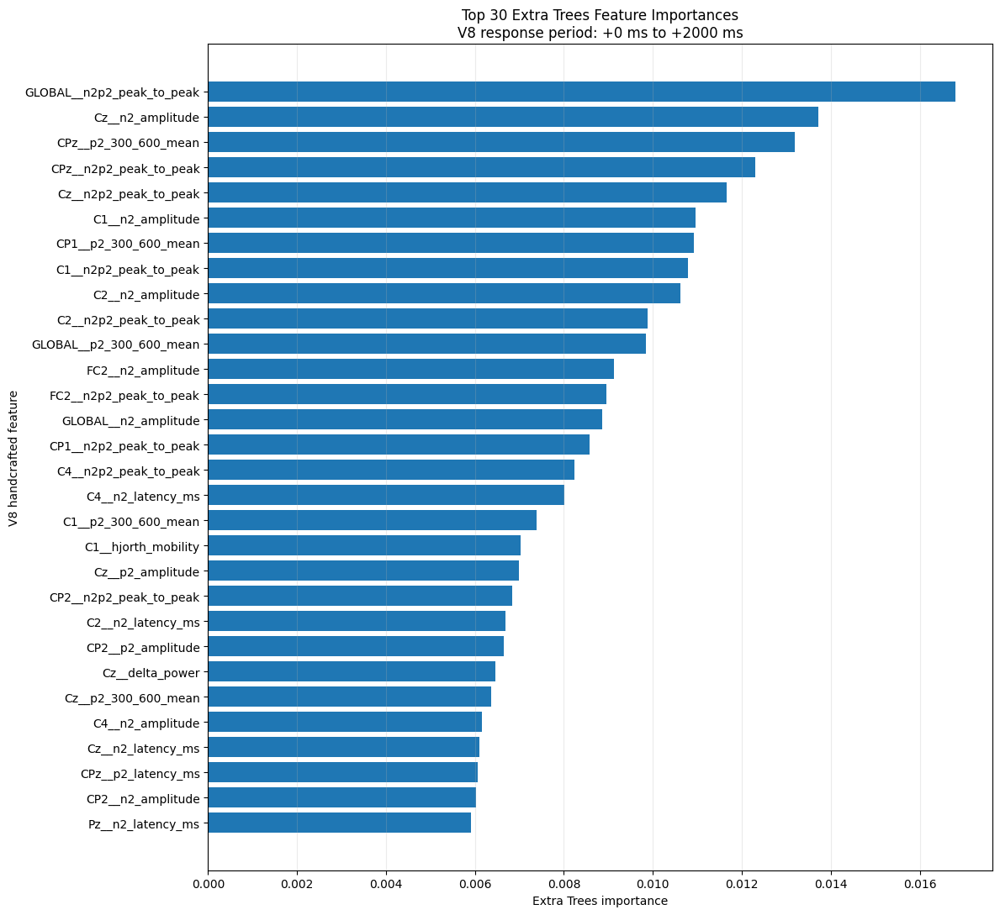


V8 EXTRA TREES FEATURE-IMPORTANCE ANALYSIS COMPLETED

All 262 ranked features:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/feature_importance/ExtraTrees_Strict192/v8_extratrees_feature_importance_all_262.csv

Top-30 features:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/feature_importance/ExtraTrees_Strict192/v8_extratrees_feature_importance_top_30.csv

Channel summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/feature_importance/ExtraTrees_Strict192/v8_extratrees_channel_importance.csv

Feature-family summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/feature_importance/ExtraTrees_Strict192/v8_extratrees_feature_family_importance.csv

Top-30 PNG figure:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/feature_importance/ExtraTrees_Strict192/v8_extratrees_featu

In [ ]:
# ============================================================
# V8 EXTRA TREES FEATURE-IMPORTANCE ANALYSIS
#
# Features:
#   262 handcrafted features
#   Response period: +0 ms to +2000 ms
#
# Scope:
#   strict192 -> same 192 participants and 5408 trials used
#                in within-individual LOOCV
#
# Output:
#   All 262 ranked features
#   Top-30 feature plot
#   Channel-level summary
#   Feature-family summary
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.ensemble import ExtraTreesClassifier


# ============================================================
# 1. Paths
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

IMPORTANCE_DIR = os.path.join(
    V8_DIR,
    "feature_importance",
    "ExtraTrees_Strict192"
)

os.makedirs(
    IMPORTANCE_DIR,
    exist_ok=True
)


FEATURE_NAMES_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_names_262.csv"
)


# ============================================================
# 2. Validate loaded V8 arrays
# ============================================================

assert X_handcrafted.shape == (6275, 262)
assert y.shape == (6275,)
assert groups.shape == (6275,)

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([
        2725,
        3550
    ])
)


# ============================================================
# 3. Load the 262 feature names
# ============================================================

feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)

if "feature_name" in feature_names_df.columns:

    feature_names = (
        feature_names_df["feature_name"]
        .astype(str)
        .tolist()
    )

else:

    feature_names = (
        feature_names_df.iloc[:, -1]
        .astype(str)
        .tolist()
    )


assert len(feature_names) == 262
assert len(set(feature_names)) == 262


# ============================================================
# 4. Recreate the strict-192 subset
#
# Eligibility:
#   At least 2 low-pain trials
#   At least 2 high-pain trials
# ============================================================

groups_string = np.asarray(
    groups
).astype(str)


subject_balance = (
    pd.DataFrame({
        "subject_id": groups_string,
        "pain_label": y
    })
    .groupby([
        "subject_id",
        "pain_label"
    ])
    .size()
    .unstack(
        fill_value=0
    )
    .reindex(
        columns=[0, 1],
        fill_value=0
    )
)

subject_balance.columns = [
    "n_low",
    "n_high"
]


eligible_subjects = (
    subject_balance.index[
        (subject_balance["n_low"] >= 2)
        &
        (subject_balance["n_high"] >= 2)
    ]
    .astype(str)
    .to_numpy()
)

eligible_subjects = np.sort(
    eligible_subjects
)


strict_indices = np.flatnonzero(
    np.isin(
        groups_string,
        eligible_subjects
    )
)


X_importance = np.asarray(
    X_handcrafted[
        strict_indices
    ],
    dtype=np.float32
)

y_importance = np.asarray(
    y[
        strict_indices
    ],
    dtype=np.int8
)


assert len(eligible_subjects) == 192
assert X_importance.shape == (5408, 262)

assert np.array_equal(
    np.bincount(
        y_importance,
        minlength=2
    ),
    np.array([
        2514,
        2894
    ])
)

assert np.isfinite(
    X_importance
).all()


print("=" * 75)
print("V8 EXTRA TREES FEATURE-IMPORTANCE DATA")
print("=" * 75)

print(
    "Participants:",
    len(eligible_subjects)
)

print(
    "Trials:",
    X_importance.shape[0]
)

print(
    "Features:",
    X_importance.shape[1]
)

print(
    "Class counts [low, high]:",
    np.bincount(
        y_importance,
        minlength=2
    ).tolist()
)


# ============================================================
# 5. Fit the final descriptive Extra Trees model
#
# Uses the same hyperparameters as the V8 LOOCV experiment.
# ============================================================

et_importance_model_v8 = ExtraTreesClassifier(
    n_estimators=150,
    max_depth=12,
    min_samples_leaf=3,
    min_samples_split=5,
    max_features="sqrt",
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)


et_importance_model_v8.fit(
    X_importance,
    y_importance
)


feature_importance_values = (
    et_importance_model_v8.feature_importances_
)


assert feature_importance_values.shape == (262,)
assert np.isfinite(feature_importance_values).all()

assert np.isclose(
    feature_importance_values.sum(),
    1.0
)


# ============================================================
# 6. Create the complete feature-importance table
# ============================================================

importance_df = pd.DataFrame({
    "feature_index": np.arange(262),
    "feature_name": feature_names,
    "importance": feature_importance_values,
    "importance_percent": (
        feature_importance_values * 100
    )
})


importance_df = (
    importance_df
    .sort_values(
        "importance",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)


importance_df.insert(
    0,
    "rank",
    np.arange(
        1,
        len(importance_df) + 1
    )
)


# Separate channel/global name from feature component
importance_df["channel"] = (
    importance_df["feature_name"]
    .str.split(
        "__",
        n=1
    )
    .str[0]
)


importance_df["feature_component"] = (
    importance_df["feature_name"]
    .str.split(
        "__",
        n=1
    )
    .str[1]
)


# ============================================================
# 7. Assign feature families
# ============================================================

def identify_feature_family(feature_name):

    component = str(
        feature_name
    ).split(
        "__",
        1
    )[-1]


    temporal_features = [
        "early_0_200_mean",
        "n2_180_350_mean",
        "p2_300_600_mean",
        "late_600_1000_mean",
        "full_0_2000_mean",
    ]

    morphology_features = [
        "n2_amplitude",
        "n2_latency_ms",
        "p2_amplitude",
        "p2_latency_ms",
        "n2p2_peak_to_peak",
    ]


    if component in temporal_features:

        return "Temporal mean"

    if component in morphology_features:

        return "N2/P2 morphology"

    if component.endswith(
        "_power"
    ):

        return "Frequency-band power"

    if component.startswith(
        "hjorth_"
    ):

        return "Hjorth parameter"

    if component in [
        "histogram_entropy",
        "standard_deviation",
        "skewness",
        "kurtosis",
    ]:

        return "Entropy/statistical"

    return "Other"


importance_df["feature_family"] = (
    importance_df["feature_name"]
    .apply(
        identify_feature_family
    )
)


# ============================================================
# 8. Save all 262 ranked features
# ============================================================

ALL_FEATURES_PATH = os.path.join(
    IMPORTANCE_DIR,
    "v8_extratrees_feature_importance_all_262.csv"
)

importance_df.to_csv(
    ALL_FEATURES_PATH,
    index=False
)


# ============================================================
# 9. Save the top 30 features
# ============================================================

TOP_N = 30

top_features_df = (
    importance_df
    .head(TOP_N)
    .copy()
)


TOP_FEATURES_PATH = os.path.join(
    IMPORTANCE_DIR,
    f"v8_extratrees_feature_importance_top_{TOP_N}.csv"
)

top_features_df.to_csv(
    TOP_FEATURES_PATH,
    index=False
)


print("\n" + "=" * 75)
print(f"TOP {TOP_N} V8 EXTRA TREES FEATURES")
print("=" * 75)

display(
    top_features_df[[
        "rank",
        "feature_name",
        "channel",
        "feature_family",
        "importance",
        "importance_percent",
    ]]
)


# ============================================================
# 10. Channel-level importance summary
# ============================================================

channel_summary_df = (
    importance_df
    .groupby(
        "channel",
        as_index=False
    )
    .agg(
        number_of_features=(
            "feature_name",
            "count"
        ),
        total_importance=(
            "importance",
            "sum"
        ),
        mean_feature_importance=(
            "importance",
            "mean"
        )
    )
    .sort_values(
        "total_importance",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)


channel_summary_df.insert(
    0,
    "rank",
    np.arange(
        1,
        len(channel_summary_df) + 1
    )
)

channel_summary_df[
    "total_importance_percent"
] = (
    channel_summary_df[
        "total_importance"
    ] * 100
)


CHANNEL_SUMMARY_PATH = os.path.join(
    IMPORTANCE_DIR,
    "v8_extratrees_channel_importance.csv"
)

channel_summary_df.to_csv(
    CHANNEL_SUMMARY_PATH,
    index=False
)


print("\nCHANNEL-LEVEL IMPORTANCE")

display(
    channel_summary_df
)


# ============================================================
# 11. Feature-family importance summary
# ============================================================

family_summary_df = (
    importance_df
    .groupby(
        "feature_family",
        as_index=False
    )
    .agg(
        number_of_features=(
            "feature_name",
            "count"
        ),
        total_importance=(
            "importance",
            "sum"
        ),
        mean_feature_importance=(
            "importance",
            "mean"
        )
    )
    .sort_values(
        "total_importance",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)


family_summary_df.insert(
    0,
    "rank",
    np.arange(
        1,
        len(family_summary_df) + 1
    )
)

family_summary_df[
    "total_importance_percent"
] = (
    family_summary_df[
        "total_importance"
    ] * 100
)


FAMILY_SUMMARY_PATH = os.path.join(
    IMPORTANCE_DIR,
    "v8_extratrees_feature_family_importance.csv"
)

family_summary_df.to_csv(
    FAMILY_SUMMARY_PATH,
    index=False
)


print("\nFEATURE-FAMILY IMPORTANCE")

display(
    family_summary_df
)


# ============================================================
# 12. Plot the top 30 features
# ============================================================

plot_df = (
    top_features_df
    .sort_values(
        "importance",
        ascending=True
    )
)


plt.figure(
    figsize=(12, 11)
)

plt.barh(
    plot_df["feature_name"],
    plot_df["importance"]
)

plt.xlabel(
    "Extra Trees importance"
)

plt.ylabel(
    "V8 handcrafted feature"
)

plt.title(
    "Top 30 Extra Trees Feature Importances\n"
    "V8 response period: +0 ms to +2000 ms"
)

plt.grid(
    axis="x",
    alpha=0.25
)

plt.tight_layout()


TOP_PLOT_PNG_PATH = os.path.join(
    IMPORTANCE_DIR,
    "v8_extratrees_feature_importance_top30.png"
)

TOP_PLOT_PDF_PATH = os.path.join(
    IMPORTANCE_DIR,
    "v8_extratrees_feature_importance_top30.pdf"
)


plt.savefig(
    TOP_PLOT_PNG_PATH,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    TOP_PLOT_PDF_PATH,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 13. Final saved paths
# ============================================================

print("\n" + "=" * 75)
print("V8 EXTRA TREES FEATURE-IMPORTANCE ANALYSIS COMPLETED")
print("=" * 75)

print(
    "\nAll 262 ranked features:\n",
    ALL_FEATURES_PATH
)

print(
    "\nTop-30 features:\n",
    TOP_FEATURES_PATH
)

print(
    "\nChannel summary:\n",
    CHANNEL_SUMMARY_PATH
)

print(
    "\nFeature-family summary:\n",
    FAMILY_SUMMARY_PATH
)

print(
    "\nTop-30 PNG figure:\n",
    TOP_PLOT_PNG_PATH
)

print(
    "\nTop-30 PDF figure:\n",
    TOP_PLOT_PDF_PATH
)end

In [ ]:
# ============================================================
# 9. Select and save the top 60 features
# ============================================================

TOP_N = 60

top_features_df = (
    importance_df
    .head(TOP_N)
    .copy()
)

TOP_FEATURES_PATH = os.path.join(
    IMPORTANCE_DIR,
    f"v8_extratrees_feature_importance_top_{TOP_N}.csv"
)

top_features_df.to_csv(
    TOP_FEATURES_PATH,
    index=False
)

print("\n" + "=" * 75)
print(f"TOP {TOP_N} V8 EXTRA TREES FEATURES")
print("=" * 75)

display(
    top_features_df[[
        "rank",
        "feature_index",
        "feature_name",
        "channel",
        "feature_family",
        "importance",
        "importance_percent",
    ]]
)


TOP 60 V8 EXTRA TREES FEATURES


,rank,feature_index,feature_name,channel,feature_family,importance,importance_percent
0,1,261,GLOBAL__n2p2_peak_to_peak,GLOBAL,N2/P2 morphology,0.016795,1.679546
1,2,110,Cz__n2_amplitude,Cz,N2/P2 morphology,0.013719,1.371869
2,3,191,CPz__p2_300_600_mean,CPz,Temporal mean,0.013201,1.320067
3,4,198,CPz__n2p2_peak_to_peak,CPz,N2/P2 morphology,0.012304,1.230366
4,5,114,Cz__n2p2_peak_to_peak,Cz,N2/P2 morphology,0.011655,1.165466
5,6,89,C1__n2_amplitude,C1,N2/P2 morphology,0.010961,1.096120
6,7,170,CP1__p2_300_600_mean,CP1,Temporal mean,0.010915,1.091510
7,8,93,C1__n2p2_peak_to_peak,C1,N2/P2 morphology,0.010792,1.079182
8,9,131,C2__n2_amplitude,C2,N2/P2 morphology,0.010613,1.061252
9,10,135,C2__n2p2_peak_to_peak,C2,N2/P2 morphology,0.009883,0.988332


V8 LOSO FEATURE-IMPORTANCE DATA
Feature matrix: (6275, 262)
Participants: 223
Class counts [low, high]: [2725, 3550]
Response period: +0 ms to +2000 ms

Starting a new LOSO feature-importance analysis.


V8 Extra Trees LOSO importance:   0%|          | 0/223 [00:00<?, ?it/s]


TOP 30 LOSO EXTRA TREES FEATURES


,rank,feature_name,channel,feature_family,mean_importance,standard_deviation,top30_fold_frequency_percent,top60_fold_frequency_percent
0,1,GLOBAL__n2p2_peak_to_peak,GLOBAL,N2/P2 morphology,0.016488,0.001100,100.000000,100.0
1,2,CPz__n2p2_peak_to_peak,CPz,N2/P2 morphology,0.013726,0.000855,100.000000,100.0
2,3,C2__n2p2_peak_to_peak,C2,N2/P2 morphology,0.012867,0.000872,100.000000,100.0
3,4,Cz__n2p2_peak_to_peak,Cz,N2/P2 morphology,0.012374,0.001038,100.000000,100.0
4,5,CPz__p2_300_600_mean,CPz,Temporal mean,0.012212,0.000724,100.000000,100.0
5,6,Cz__n2_amplitude,Cz,N2/P2 morphology,0.011795,0.000700,100.000000,100.0
6,7,FC2__n2p2_peak_to_peak,FC2,N2/P2 morphology,0.010641,0.000788,100.000000,100.0
7,8,CP1__p2_300_600_mean,CP1,Temporal mean,0.010400,0.000639,100.000000,100.0
8,9,C2__n2_amplitude,C2,N2/P2 morphology,0.010235,0.000791,100.000000,100.0
9,10,C1__n2p2_peak_to_peak,C1,N2/P2 morphology,0.009954,0.000941,100.000000,100.0



TOP 60 LOSO EXTRA TREES FEATURES


,rank,feature_name,channel,feature_family,mean_importance,standard_deviation,top30_fold_frequency_percent,top60_fold_frequency_percent
0,1,GLOBAL__n2p2_peak_to_peak,GLOBAL,N2/P2 morphology,0.016488,0.001100,100.000000,100.000000
1,2,CPz__n2p2_peak_to_peak,CPz,N2/P2 morphology,0.013726,0.000855,100.000000,100.000000
2,3,C2__n2p2_peak_to_peak,C2,N2/P2 morphology,0.012867,0.000872,100.000000,100.000000
3,4,Cz__n2p2_peak_to_peak,Cz,N2/P2 morphology,0.012374,0.001038,100.000000,100.000000
4,5,CPz__p2_300_600_mean,CPz,Temporal mean,0.012212,0.000724,100.000000,100.000000
5,6,Cz__n2_amplitude,Cz,N2/P2 morphology,0.011795,0.000700,100.000000,100.000000
6,7,FC2__n2p2_peak_to_peak,FC2,N2/P2 morphology,0.010641,0.000788,100.000000,100.000000
7,8,CP1__p2_300_600_mean,CP1,Temporal mean,0.010400,0.000639,100.000000,100.000000
8,9,C2__n2_amplitude,C2,N2/P2 morphology,0.010235,0.000791,100.000000,100.000000
9,10,C1__n2p2_peak_to_peak,C1,N2/P2 morphology,0.009954,0.000941,100.000000,100.000000


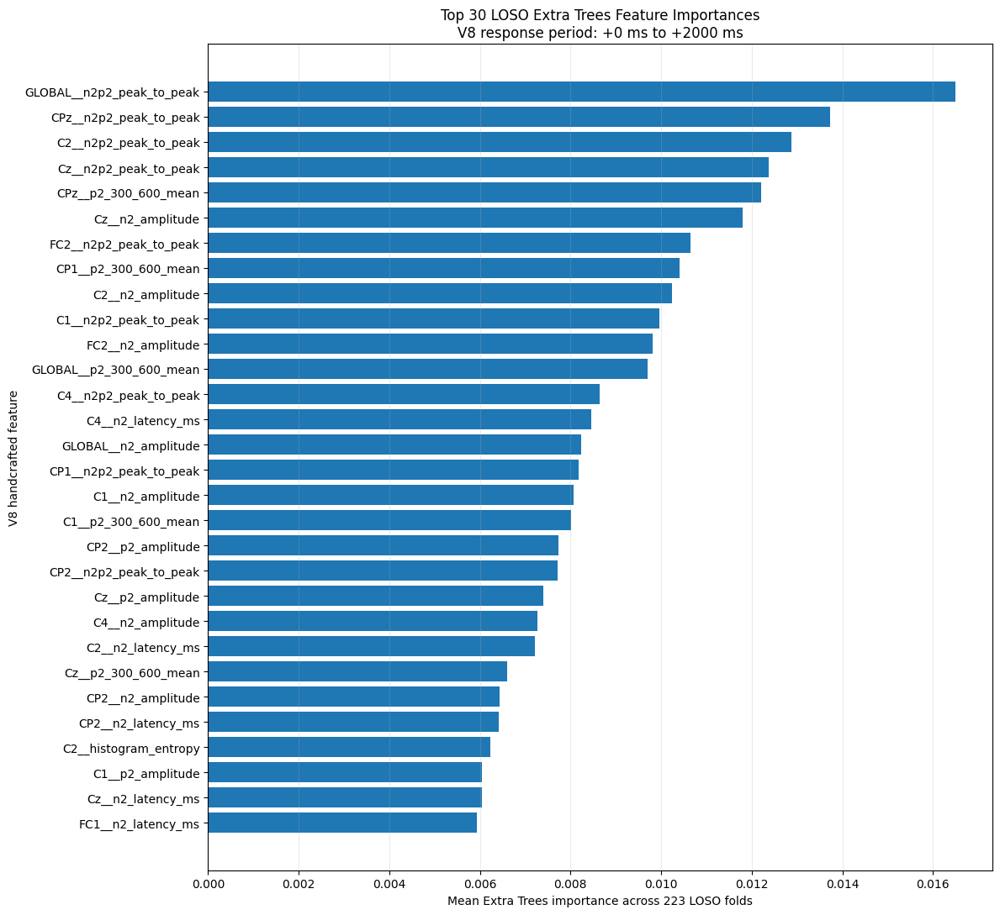

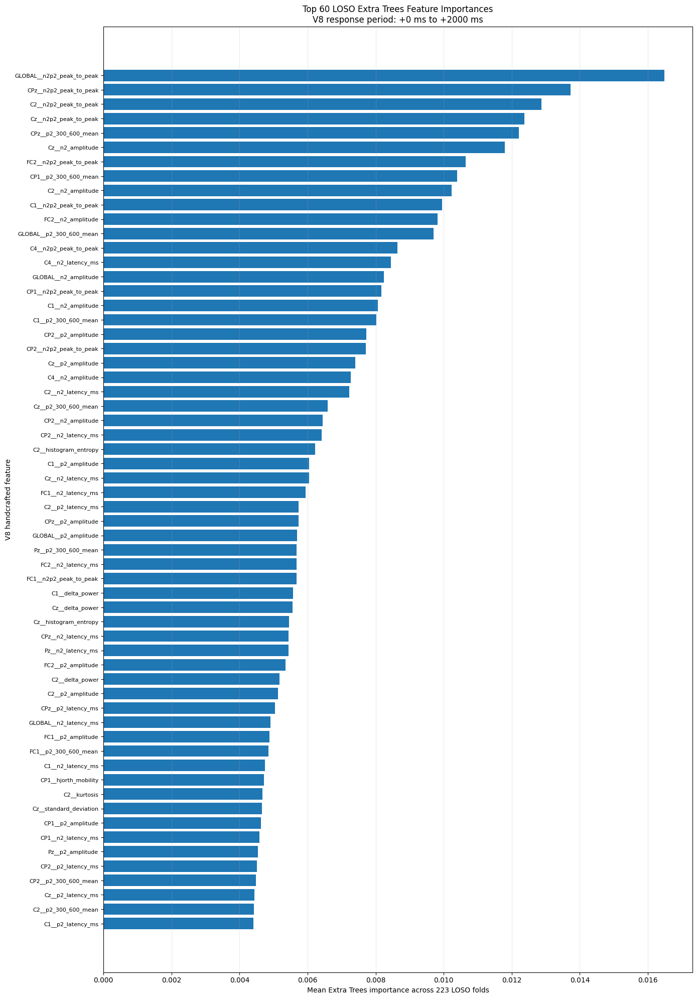


V8 LOSO EXTRA TREES FEATURE IMPORTANCE COMPLETED
Completed folds: 223
Current-run time: 2.74 minutes

Fold-level importance checkpoint:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/feature_importance/ExtraTrees_LOSO_223/v8_extratrees_loso_fold_importances_223x262.csv

All 262 aggregated features:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/feature_importance/ExtraTrees_LOSO_223/v8_extratrees_loso_feature_importance_all_262.csv

Top-30 CSV:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/feature_importance/ExtraTrees_LOSO_223/v8_extratrees_loso_feature_importance_top30.csv

Top-60 CSV:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/feature_importance/ExtraTrees_LOSO_223/v8_extratrees_loso_feature_importance_top60.csv

Top-30 PNG:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3

In [ ]:
# ============================================================
# V8 EXTRA TREES LOSO FEATURE-IMPORTANCE ANALYSIS
#
# Method:
#   223 Leave-One-Subject-Out folds
#   Each held-out subject is excluded from model fitting
#   Extra Trees importance is extracted from every fold
#   Final importance = mean importance across all 223 folds
#
# Features:
#   262 handcrafted features
#   Response period: +0 ms to +2000 ms
#
# Outputs:
#   1. Fold-level importances
#   2. All 262 aggregated feature importances
#   3. Top-30 CSV, PNG and PDF
#   4. Top-60 CSV, PNG and PDF
# ============================================================

import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tqdm.auto import tqdm
from sklearn.ensemble import ExtraTreesClassifier


# ============================================================
# 1. Paths
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

LOSO_IMPORTANCE_DIR = os.path.join(
    V8_DIR,
    "feature_importance",
    "ExtraTrees_LOSO_223"
)

os.makedirs(
    LOSO_IMPORTANCE_DIR,
    exist_ok=True
)

FEATURE_NAMES_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_names_262.csv"
)

FOLD_IMPORTANCE_PATH = os.path.join(
    LOSO_IMPORTANCE_DIR,
    "v8_extratrees_loso_fold_importances_223x262.csv"
)

ALL_FEATURES_PATH = os.path.join(
    LOSO_IMPORTANCE_DIR,
    "v8_extratrees_loso_feature_importance_all_262.csv"
)


# ============================================================
# 2. Validate V8 arrays
# ============================================================

X_LOSO_IMPORTANCE = X_handcrafted

y_loso = np.asarray(
    y,
    dtype=np.int8
).ravel()

groups_loso = np.asarray(
    groups
).astype(str).ravel()


assert X_LOSO_IMPORTANCE.shape == (6275, 262)
assert y_loso.shape == (6275,)
assert groups_loso.shape == (6275,)

assert len(
    np.unique(groups_loso)
) == 223

assert np.array_equal(
    np.bincount(
        y_loso,
        minlength=2
    ),
    np.array([
        2725,
        3550
    ])
)


for start in range(
    0,
    len(y_loso),
    512
):

    stop = min(
        start + 512,
        len(y_loso)
    )

    current_batch = np.asarray(
        X_LOSO_IMPORTANCE[
            start:stop
        ]
    )

    if not np.isfinite(
        current_batch
    ).all():

        raise ValueError(
            f"Non-finite feature values found "
            f"between rows {start}:{stop}."
        )


print("=" * 78)
print("V8 LOSO FEATURE-IMPORTANCE DATA")
print("=" * 78)

print(
    "Feature matrix:",
    X_LOSO_IMPORTANCE.shape
)

print(
    "Participants:",
    len(
        np.unique(groups_loso)
    )
)

print(
    "Class counts [low, high]:",
    np.bincount(
        y_loso,
        minlength=2
    ).tolist()
)

print(
    "Response period:",
    "+0 ms to +2000 ms"
)


# ============================================================
# 3. Load the 262 feature names
# ============================================================

feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)

if "feature_name" in feature_names_df.columns:

    feature_names = (
        feature_names_df[
            "feature_name"
        ]
        .astype(str)
        .tolist()
    )

else:

    feature_names = (
        feature_names_df
        .iloc[:, -1]
        .astype(str)
        .tolist()
    )


assert len(feature_names) == 262
assert len(set(feature_names)) == 262


importance_columns = [
    f"feature_{index:03d}"
    for index in range(262)
]


# ============================================================
# 4. Safe checkpoint writing
# ============================================================

def atomic_write_csv(
    dataframe,
    path
):

    temporary_path = (
        f"{path}.temporary"
    )

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        path
    )


# ============================================================
# 5. Load an existing checkpoint
# ============================================================

if os.path.exists(
    FOLD_IMPORTANCE_PATH
):

    fold_importance_df = pd.read_csv(
        FOLD_IMPORTANCE_PATH
    )

    if "test_subject" not in fold_importance_df.columns:

        raise ValueError(
            "The saved LOSO importance checkpoint "
            "does not contain test_subject."
        )

    missing_importance_columns = set(
        importance_columns
    ).difference(
        fold_importance_df.columns
    )

    if missing_importance_columns:

        raise ValueError(
            "The checkpoint is missing feature columns: "
            f"{sorted(missing_importance_columns)[:10]}"
        )

    fold_importance_df[
        "test_subject"
    ] = fold_importance_df[
        "test_subject"
    ].astype(str)

    fold_importance_df = (
        fold_importance_df
        .drop_duplicates(
            subset=["test_subject"],
            keep="last"
        )
        .sort_values(
            "test_subject"
        )
        .reset_index(
            drop=True
        )
    )

    completed_subjects = set(
        fold_importance_df[
            "test_subject"
        ]
    )

    print(
        "\nExisting checkpoint found."
    )

    print(
        "Completed LOSO folds:",
        len(completed_subjects),
        "/ 223"
    )

else:

    fold_importance_df = pd.DataFrame()

    completed_subjects = set()

    print(
        "\nStarting a new LOSO "
        "feature-importance analysis."
    )


# ============================================================
# 6. Perform 223 LOSO Extra Trees fits
# ============================================================

all_subjects = np.sort(
    np.unique(
        groups_loso
    )
)

wall_start = time.perf_counter()


for test_subject in tqdm(
    all_subjects,
    desc="V8 Extra Trees LOSO importance"
):

    test_subject = str(
        test_subject
    )

    if test_subject in completed_subjects:

        continue


    train_indices = np.flatnonzero(
        groups_loso != test_subject
    )

    test_indices = np.flatnonzero(
        groups_loso == test_subject
    )


    if len(test_indices) == 0:

        raise RuntimeError(
            f"No trials found for test subject "
            f"{test_subject}."
        )


    if np.any(
        groups_loso[
            train_indices
        ] == test_subject
    ):

        raise RuntimeError(
            "Subject leakage detected."
        )


    if not np.all(
        groups_loso[
            test_indices
        ] == test_subject
    ):

        raise RuntimeError(
            "The test fold contains an "
            "unexpected subject."
        )


    X_train = np.asarray(
        X_LOSO_IMPORTANCE[
            train_indices
        ],
        dtype=np.float32
    )

    y_train = y_loso[
        train_indices
    ]


    if len(
        np.unique(
            y_train
        )
    ) != 2:

        raise RuntimeError(
            f"Training fold for {test_subject} "
            "does not contain both classes."
        )


    fold_model = ExtraTreesClassifier(
        n_estimators=150,
        max_depth=12,
        min_samples_leaf=3,
        min_samples_split=5,
        max_features="sqrt",
        class_weight="balanced",
        random_state=42,
        n_jobs=-1
    )


    fit_start = time.perf_counter()

    fold_model.fit(
        X_train,
        y_train
    )

    fit_seconds = (
        time.perf_counter()
        - fit_start
    )


    fold_importances = np.asarray(
        fold_model.feature_importances_,
        dtype=float
    )


    if fold_importances.shape != (262,):

        raise RuntimeError(
            "Unexpected feature-importance shape."
        )


    if not np.isfinite(
        fold_importances
    ).all():

        raise RuntimeError(
            "Non-finite feature importance found."
        )


    if not np.isclose(
        fold_importances.sum(),
        1.0
    ):

        raise RuntimeError(
            "Fold feature importances do not sum to 1."
        )


    fold_row = {
        "test_subject": test_subject,
        "n_training_trials": int(
            len(train_indices)
        ),
        "n_test_trials": int(
            len(test_indices)
        ),
        "fit_seconds": float(
            fit_seconds
        )
    }


    for feature_index, column_name in enumerate(
        importance_columns
    ):

        fold_row[
            column_name
        ] = float(
            fold_importances[
                feature_index
            ]
        )


    fold_importance_df = pd.concat(
        [
            fold_importance_df,
            pd.DataFrame([
                fold_row
            ])
        ],
        ignore_index=True
    )


    fold_importance_df[
        "test_subject"
    ] = fold_importance_df[
        "test_subject"
    ].astype(str)


    fold_importance_df = (
        fold_importance_df
        .drop_duplicates(
            subset=["test_subject"],
            keep="last"
        )
        .sort_values(
            "test_subject"
        )
        .reset_index(
            drop=True
        )
    )


    atomic_write_csv(
        fold_importance_df,
        FOLD_IMPORTANCE_PATH
    )


    completed_subjects.add(
        test_subject
    )


wall_minutes = (
    time.perf_counter()
    - wall_start
) / 60.0


# ============================================================
# 7. Validate all 223 LOSO folds
# ============================================================

fold_importance_df = pd.read_csv(
    FOLD_IMPORTANCE_PATH
)

fold_importance_df[
    "test_subject"
] = fold_importance_df[
    "test_subject"
].astype(str)

fold_importance_df = (
    fold_importance_df
    .drop_duplicates(
        subset=["test_subject"],
        keep="last"
    )
    .sort_values(
        "test_subject"
    )
    .reset_index(
        drop=True
    )
)


if len(
    fold_importance_df
) != 223:

    raise RuntimeError(
        "LOSO feature-importance analysis "
        f"is incomplete: {len(fold_importance_df)} "
        "of 223 folds."
    )


if fold_importance_df[
    "test_subject"
].nunique() != 223:

    raise RuntimeError(
        "Duplicate or missing LOSO subjects detected."
    )


fold_importance_matrix = (
    fold_importance_df[
        importance_columns
    ]
    .to_numpy(
        dtype=float
    )
)


assert fold_importance_matrix.shape == (
    223,
    262
)

assert np.isfinite(
    fold_importance_matrix
).all()


# ============================================================
# 8. Aggregate importance across LOSO folds
# ============================================================

mean_importance = np.mean(
    fold_importance_matrix,
    axis=0
)

standard_deviation = np.std(
    fold_importance_matrix,
    axis=0,
    ddof=1
)

median_importance = np.median(
    fold_importance_matrix,
    axis=0
)

minimum_importance = np.min(
    fold_importance_matrix,
    axis=0
)

maximum_importance = np.max(
    fold_importance_matrix,
    axis=0
)


# Rank features separately inside each fold
fold_rank_df = pd.DataFrame(
    fold_importance_matrix
).rank(
    axis=1,
    method="min",
    ascending=False
)


top30_frequency = (
    fold_rank_df <= 30
).mean(
    axis=0
).to_numpy()


top60_frequency = (
    fold_rank_df <= 60
).mean(
    axis=0
).to_numpy()


importance_df = pd.DataFrame({
    "feature_index": np.arange(262),
    "feature_name": feature_names,
    "mean_importance": mean_importance,
    "standard_deviation": standard_deviation,
    "median_importance": median_importance,
    "minimum_importance": minimum_importance,
    "maximum_importance": maximum_importance,
    "mean_importance_percent": (
        mean_importance * 100
    ),
    "top30_fold_frequency": (
        top30_frequency
    ),
    "top30_fold_frequency_percent": (
        top30_frequency * 100
    ),
    "top60_fold_frequency": (
        top60_frequency
    ),
    "top60_fold_frequency_percent": (
        top60_frequency * 100
    )
})


importance_df = (
    importance_df
    .sort_values(
        "mean_importance",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)


importance_df.insert(
    0,
    "rank",
    np.arange(
        1,
        len(importance_df) + 1
    )
)


# ============================================================
# 9. Extract channel and feature component
# ============================================================

def get_channel_name(
    feature_name
):

    feature_name = str(
        feature_name
    )

    if "__" in feature_name:

        return feature_name.split(
            "__",
            1
        )[0]

    return "Global"


def get_feature_component(
    feature_name
):

    feature_name = str(
        feature_name
    )

    if "__" in feature_name:

        return feature_name.split(
            "__",
            1
        )[1]

    return feature_name


importance_df[
    "channel"
] = importance_df[
    "feature_name"
].apply(
    get_channel_name
)


importance_df[
    "feature_component"
] = importance_df[
    "feature_name"
].apply(
    get_feature_component
)


# ============================================================
# 10. Assign feature families
# ============================================================

def identify_feature_family(
    feature_name
):

    component = get_feature_component(
        feature_name
    )


    temporal_features = [
        "early_0_200_mean",
        "n2_180_350_mean",
        "p2_300_600_mean",
        "late_600_1000_mean",
        "full_0_2000_mean",
    ]


    morphology_features = [
        "n2_amplitude",
        "n2_latency_ms",
        "p2_amplitude",
        "p2_latency_ms",
        "n2p2_peak_to_peak",
    ]


    if component in temporal_features:

        return "Temporal mean"


    if component in morphology_features:

        return "N2/P2 morphology"


    if component.endswith(
        "_power"
    ):

        return "Frequency-band power"


    if component.startswith(
        "hjorth_"
    ):

        return "Hjorth parameter"


    if component in [
        "histogram_entropy",
        "standard_deviation",
        "skewness",
        "kurtosis",
    ]:

        return "Entropy/statistical"


    return "Other"


importance_df[
    "feature_family"
] = importance_df[
    "feature_name"
].apply(
    identify_feature_family
)


# ============================================================
# 11. Save all 262 aggregated feature importances
# ============================================================

importance_df.to_csv(
    ALL_FEATURES_PATH,
    index=False
)


# ============================================================
# 12. Save top 30 and top 60
# ============================================================

top30_df = (
    importance_df
    .head(30)
    .copy()
)

top60_df = (
    importance_df
    .head(60)
    .copy()
)


TOP30_CSV_PATH = os.path.join(
    LOSO_IMPORTANCE_DIR,
    "v8_extratrees_loso_feature_importance_top30.csv"
)

TOP60_CSV_PATH = os.path.join(
    LOSO_IMPORTANCE_DIR,
    "v8_extratrees_loso_feature_importance_top60.csv"
)


top30_df.to_csv(
    TOP30_CSV_PATH,
    index=False
)

top60_df.to_csv(
    TOP60_CSV_PATH,
    index=False
)


print("\n" + "=" * 78)
print("TOP 30 LOSO EXTRA TREES FEATURES")
print("=" * 78)

display(
    top30_df[[
        "rank",
        "feature_name",
        "channel",
        "feature_family",
        "mean_importance",
        "standard_deviation",
        "top30_fold_frequency_percent",
        "top60_fold_frequency_percent",
    ]]
)


print("\n" + "=" * 78)
print("TOP 60 LOSO EXTRA TREES FEATURES")
print("=" * 78)

display(
    top60_df[[
        "rank",
        "feature_name",
        "channel",
        "feature_family",
        "mean_importance",
        "standard_deviation",
        "top30_fold_frequency_percent",
        "top60_fold_frequency_percent",
    ]]
)


# ============================================================
# 13. Plot top 30
# ============================================================

top30_plot_df = (
    top30_df
    .sort_values(
        "mean_importance",
        ascending=True
    )
)


plt.figure(
    figsize=(12, 11)
)

plt.barh(
    top30_plot_df[
        "feature_name"
    ],
    top30_plot_df[
        "mean_importance"
    ]
)

plt.xlabel(
    "Mean Extra Trees importance across 223 LOSO folds"
)

plt.ylabel(
    "V8 handcrafted feature"
)

plt.title(
    "Top 30 LOSO Extra Trees Feature Importances\n"
    "V8 response period: +0 ms to +2000 ms"
)

plt.grid(
    axis="x",
    alpha=0.25
)

plt.tight_layout()


TOP30_PNG_PATH = os.path.join(
    LOSO_IMPORTANCE_DIR,
    "v8_extratrees_loso_feature_importance_top30.png"
)

TOP30_PDF_PATH = os.path.join(
    LOSO_IMPORTANCE_DIR,
    "v8_extratrees_loso_feature_importance_top30.pdf"
)


plt.savefig(
    TOP30_PNG_PATH,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    TOP30_PDF_PATH,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 14. Plot top 60
# ============================================================

top60_plot_df = (
    top60_df
    .sort_values(
        "mean_importance",
        ascending=True
    )
)


plt.figure(
    figsize=(14, 20)
)

plt.barh(
    top60_plot_df[
        "feature_name"
    ],
    top60_plot_df[
        "mean_importance"
    ]
)

plt.xlabel(
    "Mean Extra Trees importance across 223 LOSO folds"
)

plt.ylabel(
    "V8 handcrafted feature"
)

plt.title(
    "Top 60 LOSO Extra Trees Feature Importances\n"
    "V8 response period: +0 ms to +2000 ms"
)

plt.tick_params(
    axis="y",
    labelsize=8
)

plt.grid(
    axis="x",
    alpha=0.25
)

plt.tight_layout()


TOP60_PNG_PATH = os.path.join(
    LOSO_IMPORTANCE_DIR,
    "v8_extratrees_loso_feature_importance_top60.png"
)

TOP60_PDF_PATH = os.path.join(
    LOSO_IMPORTANCE_DIR,
    "v8_extratrees_loso_feature_importance_top60.pdf"
)


plt.savefig(
    TOP60_PNG_PATH,
    dpi=300,
    bbox_inches="tight"
)

plt.savefig(
    TOP60_PDF_PATH,
    bbox_inches="tight"
)

plt.show()


# ============================================================
# 15. Final information
# ============================================================

print("\n" + "=" * 78)
print("V8 LOSO EXTRA TREES FEATURE IMPORTANCE COMPLETED")
print("=" * 78)

print(
    "Completed folds:",
    len(fold_importance_df)
)

print(
    "Current-run time:",
    f"{wall_minutes:.2f} minutes"
)

print(
    "\nFold-level importance checkpoint:\n",
    FOLD_IMPORTANCE_PATH
)

print(
    "\nAll 262 aggregated features:\n",
    ALL_FEATURES_PATH
)

print(
    "\nTop-30 CSV:\n",
    TOP30_CSV_PATH
)

print(
    "\nTop-60 CSV:\n",
    TOP60_CSV_PATH
)

print(
    "\nTop-30 PNG:\n",
    TOP30_PNG_PATH
)

print(
    "\nTop-30 PDF:\n",
    TOP30_PDF_PATH
)

print(
    "\nTop-60 PNG:\n",
    TOP60_PNG_PATH
)

print(
    "\nTop-60 PDF:\n",
    TOP60_PDF_PATH
)

In [ ]:
# ============================================================
# CELL — Leakage-free nested Extra Trees feature selection
#
# Top features are selected separately inside every outer
# within-individual LOOCV fold.
#
# No held-out trial participates in:
#   1. Feature ranking
#   2. Feature selection
#   3. Final classifier fitting
# ============================================================

import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesClassifier


def make_nested_extratrees_topk(top_k):

    if top_k not in [30, 60]:
        raise ValueError(
            "top_k must be either 30 or 60."
        )

    # Extra Trees model used only for feature ranking
    selector_model = ExtraTreesClassifier(
        n_estimators=150,
        max_depth=12,
        min_samples_leaf=3,
        min_samples_split=5,
        max_features="sqrt",
        class_weight="balanced",
        random_state=42,
        n_jobs=-1
    )

    # Final classifier fitted using only selected features
    classifier_model = ExtraTreesClassifier(
        n_estimators=150,
        max_depth=12,
        min_samples_leaf=3,
        min_samples_split=5,
        max_features="sqrt",
        class_weight="balanced",
        random_state=43,
        n_jobs=-1
    )

    nested_pipeline = Pipeline([
        (
            "feature_selector",
            SelectFromModel(
                estimator=selector_model,
                threshold=-np.inf,
                max_features=top_k
            )
        ),
        (
            "classifier",
            classifier_model
        )
    ])

    return nested_pipeline


print(
    "Leakage-free nested Extra Trees "
    "top-k pipelines are ready."
)

Leakage-free nested Extra Trees top-k pipelines are ready.


In [ ]:
# ============================================================
# V8 within-individual LOOCV
# Nested Extra Trees top-30 biomarker experiment
#
# Input:
#   Full 262-feature matrix
#
# Inside every LOOCV fold:
#   262 features
#       ↓
#   Training-fold Extra Trees ranking
#       ↓
#   Top 30 selected
#       ↓
#   Final Extra Trees classifier
#       ↓
#   One held-out trial predicted
# ============================================================

et_nested_top30_v8 = make_nested_extratrees_topk(
    top_k=30
)


et_nested_top30_v8_result = (
    run_within_individual_loocv_v8(
        X=X_handcrafted,
        y=y,
        groups=groups,
        estimator=et_nested_top30_v8,
        model_name="ExtraTrees_NestedTop30",
        feature_set_name=(
            "Handcrafted_262_to_NestedTop30_noPCA"
        ),
        experiment_tag=(
            "v8_full0_2000ms_nested_top30_strict192"
        ),
        resume=True,
        overwrite=False,
    )
)


V8 WITHIN-INDIVIDUAL LOOCV EXPERIMENT
Experiment: ExtraTrees_NestedTop30__Handcrafted_262_to_NestedTop30_noPCA__v8_full0_2000ms_nested_top30_strict192
Model: ExtraTrees_NestedTop30
Feature set: Handcrafted_262_to_NestedTop30_noPCA
Complete feature matrix: (6275, 262)
Eligible strict-192 subjects: 192
Evaluated trials: 5408
Strict class counts [low, high]: [2514, 2894]
Number of features: 262
Feature-level scaling: Not applied
PCA: Not applied

Results will be saved to:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees_NestedTop30__Handcrafted_262_to_NestedTop30_noPCA__v8_full0_2000ms_nested_top30_strict192__trial_predictions.csv

Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees_NestedTop30__Handcrafted_262_to_NestedTop30_noPCA__v8_full0_2000ms_nested_top30_st

V8 Within LOOCV | ExtraTrees_NestedTop30:   0%|          | 0/192 [00:00<?, ?it/s]


V8 WITHIN-INDIVIDUAL LOOCV COMPLETED SUCCESSFULLY
Experiment: ExtraTrees_NestedTop30__Handcrafted_262_to_NestedTop30_noPCA__v8_full0_2000ms_nested_top30_strict192
Model: ExtraTrees_NestedTop30
Feature set: Handcrafted_262_to_NestedTop30_noPCA
Evaluated subjects: 192
Evaluated held-out trials: 5408
Features: 262

POOLED HELD-OUT TRIAL METRICS:


,value
accuracy,0.751109
balanced_accuracy,0.749875
precision,0.767450
recall,0.767450
sensitivity,0.767450
specificity,0.732299
f1_score,0.767450
roc_auc,0.827803
average_precision_pr_auc,0.838356
matthews_correlation_coefficient,0.499749



Mean subject accuracy ± SD:
75.04% ± 14.05%

SUBJECT METRICS: MEAN ± SD


,metric,n_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,192,0.750413,0.140467,75.041333,14.046740,75.04% ± 14.05%
1,balanced_accuracy,192,0.631668,0.155134,63.166815,15.513390,63.17% ± 15.51%
2,precision,192,0.695548,0.240624,69.554822,24.062354,69.55% ± 24.06%
3,recall,192,0.679366,0.256991,67.936558,25.699125,67.94% ± 25.70%
4,sensitivity,192,0.679366,0.256991,67.936558,25.699125,67.94% ± 25.70%
5,specificity,192,0.583971,0.336777,58.397072,33.677706,58.40% ± 33.68%
6,negative_predictive_value,180,0.610997,0.296046,61.099654,29.604612,61.10% ± 29.60%
7,false_positive_rate,192,0.416029,0.336777,41.602928,33.677706,41.60% ± 33.68%
8,false_negative_rate,192,0.320634,0.256991,32.063442,25.699125,32.06% ± 25.70%
9,f1_score,192,0.681295,0.241710,68.129530,24.170970,68.13% ± 24.17%



Saved paths:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees_NestedTop30__Handcrafted_262_to_NestedTop30_noPCA__v8_full0_2000ms_nested_top30_strict192__trial_predictions.csv

Subject-level results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees_NestedTop30__Handcrafted_262_to_NestedTop30_noPCA__v8_full0_2000ms_nested_top30_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees_NestedTop30__Handcrafted_262_to_NestedTop30_noPCA__v8_full0_2000ms_nested_top30_strict192__subject_metric_summary.csv

Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RES

In [ ]:
# ============================================================
# V8 within-individual LOOCV
# Nested Extra Trees top-60 biomarker experiment
#
# Input:
#   Full 262-feature matrix
#
# Inside every LOOCV fold:
#   262 features
#       ↓
#   Training-fold Extra Trees ranking
#       ↓
#   Top 60 selected
#       ↓
#   Final Extra Trees classifier
#       ↓
#   One held-out trial predicted
# ============================================================

et_nested_top60_v8 = make_nested_extratrees_topk(
    top_k=60
)


et_nested_top60_v8_result = (
    run_within_individual_loocv_v8(
        X=X_handcrafted,
        y=y,
        groups=groups,
        estimator=et_nested_top60_v8,
        model_name="ExtraTrees_NestedTop60",
        feature_set_name=(
            "Handcrafted_262_to_NestedTop60_noPCA"
        ),
        experiment_tag=(
            "v8_full0_2000ms_nested_top60_strict192"
        ),
        resume=True,
        overwrite=False,
    )
)


V8 WITHIN-INDIVIDUAL LOOCV EXPERIMENT
Experiment: ExtraTrees_NestedTop60__Handcrafted_262_to_NestedTop60_noPCA__v8_full0_2000ms_nested_top60_strict192
Model: ExtraTrees_NestedTop60
Feature set: Handcrafted_262_to_NestedTop60_noPCA
Complete feature matrix: (6275, 262)
Eligible strict-192 subjects: 192
Evaluated trials: 5408
Strict class counts [low, high]: [2514, 2894]
Number of features: 262
Feature-level scaling: Not applied
PCA: Not applied

Results will be saved to:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees_NestedTop60__Handcrafted_262_to_NestedTop60_noPCA__v8_full0_2000ms_nested_top60_strict192__trial_predictions.csv

Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees_NestedTop60__Handcrafted_262_to_NestedTop60_noPCA__v8_full0_2000ms_nested_top60_st

V8 Within LOOCV | ExtraTrees_NestedTop60:   0%|          | 0/192 [00:00<?, ?it/s]


V8 WITHIN-INDIVIDUAL LOOCV COMPLETED SUCCESSFULLY
Experiment: ExtraTrees_NestedTop60__Handcrafted_262_to_NestedTop60_noPCA__v8_full0_2000ms_nested_top60_strict192
Model: ExtraTrees_NestedTop60
Feature set: Handcrafted_262_to_NestedTop60_noPCA
Evaluated subjects: 192
Evaluated held-out trials: 5408
Features: 262

POOLED HELD-OUT TRIAL METRICS:


,value
accuracy,0.756842
balanced_accuracy,0.755465
precision,0.771586
recall,0.775052
sensitivity,0.775052
specificity,0.735879
f1_score,0.773315
roc_auc,0.832443
average_precision_pr_auc,0.839823
matthews_correlation_coefficient,0.511110



Mean subject accuracy ± SD:
75.63% ± 13.50%

SUBJECT METRICS: MEAN ± SD


,metric,n_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,192,0.756347,0.134976,75.634700,13.497613,75.63% ± 13.50%
1,balanced_accuracy,192,0.626644,0.152230,62.664363,15.223035,62.66% ± 15.22%
2,precision,192,0.689151,0.252275,68.915084,25.227460,68.92% ± 25.23%
3,recall,192,0.676019,0.280337,67.601924,28.033715,67.60% ± 28.03%
4,sensitivity,192,0.676019,0.280337,67.601924,28.033715,67.60% ± 28.03%
5,specificity,192,0.577268,0.347062,57.726801,34.706150,57.73% ± 34.71%
6,negative_predictive_value,177,0.617079,0.296815,61.707882,29.681530,61.71% ± 29.68%
7,false_positive_rate,192,0.422732,0.347062,42.273199,34.706150,42.27% ± 34.71%
8,false_negative_rate,192,0.323981,0.280337,32.398076,28.033715,32.40% ± 28.03%
9,f1_score,192,0.673710,0.259550,67.371019,25.955037,67.37% ± 25.96%



Saved paths:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees_NestedTop60__Handcrafted_262_to_NestedTop60_noPCA__v8_full0_2000ms_nested_top60_strict192__trial_predictions.csv

Subject-level results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees_NestedTop60__Handcrafted_262_to_NestedTop60_noPCA__v8_full0_2000ms_nested_top60_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees_NestedTop60__Handcrafted_262_to_NestedTop60_noPCA__v8_full0_2000ms_nested_top60_strict192__subject_metric_summary.csv

Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_WITHIN_INDIVIDUAL_LOOCV_RES

In [ ]:
# ============================================================
# NEXT CELL — Prepare V8 Extra Trees nested tuning
#
# This cell:
#   1. Selects the original V8 cross-individual feature matrix
#   2. Creates a separate tuning-results directory
#   3. Freezes the original V8 configuration
#   4. Defines a small Extra Trees candidate set
#   5. Defines threshold candidates
#
# It does not start model training yet.
# ============================================================

import os
import json
import time
import warnings

import numpy as np
import pandas as pd

from tqdm.auto import tqdm

from sklearn.base import clone
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)

warnings.filterwarnings("ignore")


# ============================================================
# 1. Use the original V8 cross-individual feature matrix
# ============================================================

X_v8_tuning = X_handcrafted_standardized

y_v8_tuning = np.asarray(
    y,
    dtype=np.int8
).ravel()

groups_v8_tuning = np.asarray(
    groups
).astype(str).ravel()


# ============================================================
# 2. Verify the data
# ============================================================

assert X_v8_tuning.shape == (6275, 262)
assert y_v8_tuning.shape == (6275,)
assert groups_v8_tuning.shape == (6275,)

assert len(
    np.unique(groups_v8_tuning)
) == 223

assert np.array_equal(
    np.bincount(
        y_v8_tuning,
        minlength=2
    ),
    np.array([2725, 3550])
)


for start in range(
    0,
    len(y_v8_tuning),
    512
):
    stop = min(
        start + 512,
        len(y_v8_tuning)
    )

    batch = np.asarray(
        X_v8_tuning[start:stop]
    )

    if not np.isfinite(batch).all():
        raise ValueError(
            "The tuning feature matrix contains "
            "NaN or infinite values."
        )


# ============================================================
# 3. Create a separate tuning directory
#
# This prevents overwriting the original V8 results.
# ============================================================

V8_ET_TUNING_DIR = os.path.join(
    V8_DIR,
    "V8_EXTRATREES_NESTED_TUNING_LOSO"
)

os.makedirs(
    V8_ET_TUNING_DIR,
    exist_ok=True
)


# ============================================================
# 4. Original V8 configuration
# ============================================================

ORIGINAL_V8_ET_PARAMETERS = {
    "n_estimators": 150,
    "max_depth": 12,
    "min_samples_leaf": 3,
    "min_samples_split": 5,
    "max_features": "sqrt",
    "criterion": "gini",
    "class_weight": "balanced",
    "random_state": 42,
    "n_jobs": -1,
}


# ============================================================
# 5. Candidate Extra Trees configurations
#
# The original V8 configuration is included as candidate 1.
#
# The list is intentionally compact because every candidate
# will be evaluated inside every outer LOSO training fold.
# ============================================================

ET_CANDIDATES = [

    # --------------------------------------------------------
    # Candidate 1 — original V8
    # --------------------------------------------------------
    {
        "candidate_id": "ET01_original_v8",
        "n_estimators": 150,
        "max_depth": 12,
        "min_samples_leaf": 3,
        "min_samples_split": 5,
        "max_features": "sqrt",
        "criterion": "gini",
        "class_weight": "balanced",
    },

    # --------------------------------------------------------
    # Candidate 2 — more trees
    # --------------------------------------------------------
    {
        "candidate_id": "ET02_more_trees",
        "n_estimators": 300,
        "max_depth": 12,
        "min_samples_leaf": 3,
        "min_samples_split": 5,
        "max_features": "sqrt",
        "criterion": "gini",
        "class_weight": "balanced",
    },

    # --------------------------------------------------------
    # Candidate 3 — smoother and shallower
    # --------------------------------------------------------
    {
        "candidate_id": "ET03_shallow_smooth",
        "n_estimators": 300,
        "max_depth": 8,
        "min_samples_leaf": 5,
        "min_samples_split": 10,
        "max_features": "sqrt",
        "criterion": "gini",
        "class_weight": "balanced",
    },

    # --------------------------------------------------------
    # Candidate 4 — moderately deeper
    # --------------------------------------------------------
    {
        "candidate_id": "ET04_deeper_entropy",
        "n_estimators": 300,
        "max_depth": 16,
        "min_samples_leaf": 3,
        "min_samples_split": 5,
        "max_features": "sqrt",
        "criterion": "entropy",
        "class_weight": "balanced",
    },

    # --------------------------------------------------------
    # Candidate 5 — more features considered at each split
    # --------------------------------------------------------
    {
        "candidate_id": "ET05_features_025",
        "n_estimators": 300,
        "max_depth": 12,
        "min_samples_leaf": 5,
        "min_samples_split": 10,
        "max_features": 0.25,
        "criterion": "gini",
        "class_weight": "balanced",
    },

    # --------------------------------------------------------
    # Candidate 6 — 50% of features at each split
    # --------------------------------------------------------
    {
        "candidate_id": "ET06_features_050",
        "n_estimators": 300,
        "max_depth": 12,
        "min_samples_leaf": 3,
        "min_samples_split": 5,
        "max_features": 0.50,
        "criterion": "gini",
        "class_weight": "balanced",
    },

    # --------------------------------------------------------
    # Candidate 7 — natural class distribution
    # --------------------------------------------------------
    {
        "candidate_id": "ET07_no_class_weight",
        "n_estimators": 300,
        "max_depth": 12,
        "min_samples_leaf": 3,
        "min_samples_split": 5,
        "max_features": "sqrt",
        "criterion": "gini",
        "class_weight": None,
    },

    # --------------------------------------------------------
    # Candidate 8 — moderate extra weight for low pain
    # --------------------------------------------------------
    {
        "candidate_id": "ET08_low_weight_125",
        "n_estimators": 300,
        "max_depth": 12,
        "min_samples_leaf": 3,
        "min_samples_split": 5,
        "max_features": "sqrt",
        "criterion": "gini",
        "class_weight": {
            0: 1.25,
            1: 1.00,
        },
    },

    # --------------------------------------------------------
    # Candidate 9 — stronger low-pain protection
    # --------------------------------------------------------
    {
        "candidate_id": "ET09_low_weight_150",
        "n_estimators": 300,
        "max_depth": 12,
        "min_samples_leaf": 3,
        "min_samples_split": 5,
        "max_features": "sqrt",
        "criterion": "gini",
        "class_weight": {
            0: 1.50,
            1: 1.00,
        },
    },
]


# ============================================================
# 6. Threshold candidates
#
# Threshold selection will later be performed only using
# inner-training participant predictions.
# ============================================================

THRESHOLD_CANDIDATES = np.round(
    np.arange(
        0.40,
        0.701,
        0.01
    ),
    2
)


# ============================================================
# 7. Huang benchmark targets
#
# Use the final frozen values from your comparison table.
# ============================================================

HUANG_PRECISION_TARGET = 0.7308
HUANG_RECALL_TARGET = 0.5414
HUANG_SPECIFICITY_TARGET = 0.7402


# ============================================================
# 8. Validation settings
# ============================================================

INNER_GROUP_FOLDS = 5

RANDOM_STATE = 42


# ============================================================
# 9. Pilot settings
#
# First test the code on 10 outer participants.
# Later change PILOT_MODE to False for all 223 participants.
# ============================================================

PILOT_MODE = True
PILOT_OUTER_SUBJECTS = 10


# ============================================================
# 10. Save tuning configuration
# ============================================================

tuning_configuration = {
    "feature_matrix": (
        "X_handcrafted_standardized"
    ),
    "feature_count": 262,
    "participant_count": 223,
    "epoch_count": 6275,
    "class_counts": [2725, 3550],
    "inner_group_folds": INNER_GROUP_FOLDS,
    "threshold_candidates": (
        THRESHOLD_CANDIDATES.tolist()
    ),
    "huang_precision_target": (
        HUANG_PRECISION_TARGET
    ),
    "huang_recall_target": (
        HUANG_RECALL_TARGET
    ),
    "huang_specificity_target": (
        HUANG_SPECIFICITY_TARGET
    ),
    "pilot_mode": PILOT_MODE,
    "pilot_outer_subjects": (
        PILOT_OUTER_SUBJECTS
    ),
    "extra_trees_candidates": (
        ET_CANDIDATES
    ),
}

TUNING_CONFIGURATION_PATH = os.path.join(
    V8_ET_TUNING_DIR,
    "v8_extratrees_tuning_configuration.json"
)

with open(
    TUNING_CONFIGURATION_PATH,
    "w",
    encoding="utf-8"
) as file:

    json.dump(
        tuning_configuration,
        file,
        indent=4,
        default=str
    )


# ============================================================
# 11. Print summary
# ============================================================

print("=" * 78)
print("V8 EXTRA TREES TUNING SETUP COMPLETED")
print("=" * 78)

print(
    "Feature matrix:",
    X_v8_tuning.shape
)

print(
    "Feature source:",
    "X_handcrafted_standardized"
)

print(
    "Participants:",
    len(
        np.unique(
            groups_v8_tuning
        )
    )
)

print(
    "Class counts [low, high]:",
    np.bincount(
        y_v8_tuning,
        minlength=2
    ).tolist()
)

print(
    "Extra Trees candidates:",
    len(
        ET_CANDIDATES
    )
)

print(
    "Threshold candidates:",
    len(
        THRESHOLD_CANDIDATES
    )
)

print(
    "Inner grouped folds:",
    INNER_GROUP_FOLDS
)

print(
    "Pilot mode:",
    PILOT_MODE
)

print(
    "Pilot outer subjects:",
    PILOT_OUTER_SUBJECTS
)

print(
    "Output directory:",
    V8_ET_TUNING_DIR
)

print(
    "Configuration saved:",
    TUNING_CONFIGURATION_PATH
)

print("\nCandidate IDs:")

for candidate in ET_CANDIDATES:
    print(
        " -",
        candidate["candidate_id"]
    )

print("\nTuning setup is ready.")

V8 EXTRA TREES TUNING SETUP COMPLETED
Feature matrix: (6275, 262)
Feature source: X_handcrafted_standardized
Participants: 223
Class counts [low, high]: [2725, 3550]
Extra Trees candidates: 9
Threshold candidates: 31
Inner grouped folds: 5
Pilot mode: True
Pilot outer subjects: 10
Output directory: /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO
Configuration saved: /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/v8_extratrees_tuning_configuration.json

Candidate IDs:
 - ET01_original_v8
 - ET02_more_trees
 - ET03_shallow_smooth
 - ET04_deeper_entropy
 - ET05_features_025
 - ET06_features_050
 - ET07_no_class_weight
 - ET08_low_weight_125
 - ET09_low_weight_150

Tuning setup is ready.


In [ ]:
# ============================================================
# NEXT CELL — Define nested LOSO Extra Trees tuning evaluator
#
# Outer validation:
#   Leave-One-Subject-Out, 223 participants
#
# Inner validation:
#   5-fold GroupKFold using only outer-training participants
#
# For every outer fold:
#   1. Test all Extra Trees candidates
#   2. Generate inner OOF probabilities
#   3. Select a training-only threshold
#   4. Select the best candidate
#   5. Refit it on all outer-training participants
#   6. Predict the untouched participant
#
# This cell only defines the evaluator.
# ============================================================

import os
import json
import time

import numpy as np
import pandas as pd

from tqdm.auto import tqdm

from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)


# ============================================================
# 1. Confirm the previous tuning-setup cell was executed
# ============================================================

required_objects = [
    "X_v8_tuning",
    "y_v8_tuning",
    "groups_v8_tuning",
    "ET_CANDIDATES",
    "THRESHOLD_CANDIDATES",
    "INNER_GROUP_FOLDS",
    "HUANG_PRECISION_TARGET",
    "HUANG_RECALL_TARGET",
    "HUANG_SPECIFICITY_TARGET",
    "PILOT_MODE",
    "PILOT_OUTER_SUBJECTS",
    "V8_ET_TUNING_DIR",
    "RANDOM_STATE",
]

missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]

if missing_objects:

    raise NameError(
        "Run the V8 tuning setup cell first. "
        "The following objects are missing:\n\n"
        + "\n".join(missing_objects)
    )


# ============================================================
# 2. Atomic file-saving helpers
# ============================================================

def save_csv_atomic(
    dataframe,
    final_path,
):

    temporary_path = (
        final_path
        + ".temporary"
    )

    dataframe.to_csv(
        temporary_path,
        index=False,
    )

    os.replace(
        temporary_path,
        final_path,
    )


def save_json_atomic(
    information,
    final_path,
):

    temporary_path = (
        final_path
        + ".temporary"
    )

    with open(
        temporary_path,
        "w",
        encoding="utf-8",
    ) as file:

        json.dump(
            information,
            file,
            indent=2,
            default=str,
        )

    os.replace(
        temporary_path,
        final_path,
    )


# ============================================================
# 3. Construct an Extra Trees candidate
# ============================================================

def make_candidate_model(
    candidate,
):

    parameters = {
        key: value
        for key, value
        in candidate.items()
        if key != "candidate_id"
    }

    return ExtraTreesClassifier(
        **parameters,
        random_state=RANDOM_STATE,
        n_jobs=-1,
    )


# ============================================================
# 4. Extract positive-class probability
# ============================================================

def positive_probability(
    fitted_model,
    X,
):

    classes = np.asarray(
        fitted_model.classes_
    )

    positive_position = np.flatnonzero(
        classes == 1
    )

    if len(
        positive_position
    ) != 1:

        raise ValueError(
            "Positive class 1 was not found uniquely."
        )

    probabilities = fitted_model.predict_proba(
        X
    )

    return probabilities[
        :,
        int(
            positive_position[0]
        )
    ]


# ============================================================
# 5. Calculate classification metrics
# ============================================================

def calculate_metrics(
    y_true,
    y_pred,
    y_score,
):

    y_true = np.asarray(
        y_true,
        dtype=np.int8,
    )

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8,
    )

    y_score = np.asarray(
        y_score,
        dtype=float,
    )

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1],
    ).ravel()

    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else np.nan
    )

    both_classes_available = (
        len(
            np.unique(
                y_true
            )
        ) == 2
    )

    metrics = {

        "accuracy":
            float(
                accuracy_score(
                    y_true,
                    y_pred,
                )
            ),

        "balanced_accuracy":
            (
                float(
                    balanced_accuracy_score(
                        y_true,
                        y_pred,
                    )
                )
                if both_classes_available
                else np.nan
            ),

        "precision":
            float(
                precision_score(
                    y_true,
                    y_pred,
                    zero_division=0,
                )
            ),

        "recall":
            float(
                recall_score(
                    y_true,
                    y_pred,
                    zero_division=0,
                )
            ),

        "specificity":
            float(
                specificity
            ),

        "f1_score":
            float(
                f1_score(
                    y_true,
                    y_pred,
                    zero_division=0,
                )
            ),

        "roc_auc":
            (
                float(
                    roc_auc_score(
                        y_true,
                        y_score,
                    )
                )
                if both_classes_available
                else np.nan
            ),

        "pr_auc":
            (
                float(
                    average_precision_score(
                        y_true,
                        y_score,
                    )
                )
                if both_classes_available
                else np.nan
            ),

        "mcc":
            float(
                matthews_corrcoef(
                    y_true,
                    y_pred,
                )
            ),

        "cohen_kappa":
            float(
                cohen_kappa_score(
                    y_true,
                    y_pred,
                )
            ),

        "tn":
            int(tn),

        "fp":
            int(fp),

        "fn":
            int(fn),

        "tp":
            int(tp),
    }

    return metrics


# ============================================================
# 6. Calculate shortfall from Huang benchmark constraints
#
# A value of zero means:
#   precision, recall and specificity all reached their targets.
#
# Smaller values are better.
# ============================================================

def calculate_constraint_shortfall(
    metrics,
):

    precision_gap = max(
        0.0,
        HUANG_PRECISION_TARGET
        - metrics["precision"],
    ) / HUANG_PRECISION_TARGET

    recall_gap = max(
        0.0,
        HUANG_RECALL_TARGET
        - metrics["recall"],
    ) / HUANG_RECALL_TARGET

    specificity_gap = max(
        0.0,
        HUANG_SPECIFICITY_TARGET
        - metrics["specificity"],
    ) / HUANG_SPECIFICITY_TARGET

    total_shortfall = (
        precision_gap
        + recall_gap
        + specificity_gap
    )

    return float(
        total_shortfall
    )


# ============================================================
# 7. Select the best threshold for one candidate
#
# Uses only inner out-of-fold training probabilities.
# ============================================================

def select_best_threshold(
    y_true,
    y_score,
):

    threshold_rows = []

    for threshold in (
        THRESHOLD_CANDIDATES
    ):

        y_pred = (
            y_score
            >= threshold
        ).astype(
            np.int8
        )

        metrics = calculate_metrics(
            y_true,
            y_pred,
            y_score,
        )

        constraints_met = (

            metrics["precision"]
            >= HUANG_PRECISION_TARGET

            and

            metrics["recall"]
            >= HUANG_RECALL_TARGET

            and

            metrics["specificity"]
            >= HUANG_SPECIFICITY_TARGET
        )

        threshold_rows.append({

            "threshold":
                float(
                    threshold
                ),

            "constraints_met":
                bool(
                    constraints_met
                ),

            "constraint_shortfall":
                calculate_constraint_shortfall(
                    metrics
                ),

            **metrics,
        })

    threshold_table = pd.DataFrame(
        threshold_rows
    )

    feasible_thresholds = threshold_table[
        threshold_table[
            "constraints_met"
        ]
    ].copy()

    if len(
        feasible_thresholds
    ) > 0:

        selected_threshold = (
            feasible_thresholds
            .sort_values(
                [
                    "balanced_accuracy",
                    "roc_auc",
                    "f1_score",
                    "accuracy",
                    "mcc",
                ],
                ascending=False,
            )
            .iloc[0]
        )

        selection_reason = (
            "all_constraints_met"
        )

    else:

        selected_threshold = (
            threshold_table
            .sort_values(
                [
                    "constraint_shortfall",
                    "balanced_accuracy",
                    "roc_auc",
                    "f1_score",
                    "accuracy",
                    "mcc",
                ],
                ascending=[
                    True,
                    False,
                    False,
                    False,
                    False,
                    False,
                ],
            )
            .iloc[0]
        )

        selection_reason = (
            "minimum_constraint_shortfall"
        )

    return (
        selected_threshold.to_dict(),
        selection_reason,
    )


# ============================================================
# 8. Generate inner GroupKFold OOF probabilities
# ============================================================

def generate_inner_oof_probabilities(
    X_train,
    y_train,
    groups_train,
    candidate,
):

    inner_splitter = GroupKFold(
        n_splits=INNER_GROUP_FOLDS
    )

    oof_probabilities = np.full(
        len(
            y_train
        ),
        np.nan,
        dtype=float,
    )

    for (
        inner_train_indices,
        inner_validation_indices,
    ) in inner_splitter.split(

        X_train,
        y_train,
        groups_train,
    ):

        inner_model = make_candidate_model(
            candidate
        )

        inner_model.fit(

            X_train[
                inner_train_indices
            ],

            y_train[
                inner_train_indices
            ],
        )

        oof_probabilities[
            inner_validation_indices
        ] = positive_probability(

            inner_model,

            X_train[
                inner_validation_indices
            ],
        )

    if not np.isfinite(
        oof_probabilities
    ).all():

        raise RuntimeError(
            "Inner OOF probabilities are incomplete."
        )

    return oof_probabilities


# ============================================================
# 9. Tune one outer-training fold
#
# Tests every candidate and selects one candidate plus threshold.
# ============================================================

def tune_outer_training_fold(
    X_train,
    y_train,
    groups_train,
    test_subject,
):

    candidate_rows = []

    for candidate in (
        ET_CANDIDATES
    ):

        candidate_start_time = (
            time.perf_counter()
        )

        oof_probabilities = (
            generate_inner_oof_probabilities(

                X_train,
                y_train,
                groups_train,
                candidate,
            )
        )

        (
            threshold_result,
            threshold_reason,
        ) = select_best_threshold(

            y_train,
            oof_probabilities,
        )

        candidate_rows.append({

            "test_subject":
                str(
                    test_subject
                ),

            "candidate_id":
                candidate[
                    "candidate_id"
                ],

            "n_estimators":
                candidate[
                    "n_estimators"
                ],

            "max_depth":
                candidate[
                    "max_depth"
                ],

            "min_samples_leaf":
                candidate[
                    "min_samples_leaf"
                ],

            "min_samples_split":
                candidate[
                    "min_samples_split"
                ],

            "max_features":
                candidate[
                    "max_features"
                ],

            "criterion":
                candidate[
                    "criterion"
                ],

            "class_weight":
                repr(
                    candidate[
                        "class_weight"
                    ]
                ),

            "selected_threshold":
                threshold_result[
                    "threshold"
                ],

            "threshold_reason":
                threshold_reason,

            "constraints_met":
                threshold_result[
                    "constraints_met"
                ],

            "constraint_shortfall":
                threshold_result[
                    "constraint_shortfall"
                ],

            "inner_accuracy":
                threshold_result[
                    "accuracy"
                ],

            "inner_balanced_accuracy":
                threshold_result[
                    "balanced_accuracy"
                ],

            "inner_precision":
                threshold_result[
                    "precision"
                ],

            "inner_recall":
                threshold_result[
                    "recall"
                ],

            "inner_specificity":
                threshold_result[
                    "specificity"
                ],

            "inner_f1_score":
                threshold_result[
                    "f1_score"
                ],

            "inner_roc_auc":
                threshold_result[
                    "roc_auc"
                ],

            "inner_pr_auc":
                threshold_result[
                    "pr_auc"
                ],

            "inner_mcc":
                threshold_result[
                    "mcc"
                ],

            "runtime_seconds":
                (
                    time.perf_counter()
                    - candidate_start_time
                ),
        })

    candidate_table = pd.DataFrame(
        candidate_rows
    )

    feasible_candidates = candidate_table[
        candidate_table[
            "constraints_met"
        ]
    ].copy()

    if len(
        feasible_candidates
    ) > 0:

        selected_row = (
            feasible_candidates
            .sort_values(
                [
                    "inner_balanced_accuracy",
                    "inner_roc_auc",
                    "inner_f1_score",
                    "inner_accuracy",
                    "inner_mcc",
                ],
                ascending=False,
            )
            .iloc[0]
        )

        selection_reason = (
            "candidate_met_all_constraints"
        )

    else:

        selected_row = (
            candidate_table
            .sort_values(
                [
                    "constraint_shortfall",
                    "inner_balanced_accuracy",
                    "inner_roc_auc",
                    "inner_f1_score",
                    "inner_accuracy",
                    "inner_mcc",
                ],
                ascending=[
                    True,
                    False,
                    False,
                    False,
                    False,
                    False,
                ],
            )
            .iloc[0]
        )

        selection_reason = (
            "minimum_constraint_shortfall"
        )

    selected_candidate_id = str(
        selected_row[
            "candidate_id"
        ]
    )

    selected_candidate = next(

        candidate

        for candidate
        in ET_CANDIDATES

        if str(
            candidate[
                "candidate_id"
            ]
        )
        == selected_candidate_id
    )

    return (

        selected_candidate,

        float(
            selected_row[
                "selected_threshold"
            ]
        ),

        selection_reason,

        selected_row.to_dict(),

        candidate_table,
    )


# ============================================================
# 10. Complete nested outer LOSO evaluator
# ============================================================

def run_v8_nested_extratrees_tuning(
    resume=True,
    overwrite=False,
):

    X = X_v8_tuning
    y_values = y_v8_tuning
    group_values = groups_v8_tuning

    all_subjects = np.sort(
        np.unique(
            group_values
        )
    )

    if PILOT_MODE:

        subjects_to_evaluate = all_subjects[
            :PILOT_OUTER_SUBJECTS
        ]

        run_name = (
            f"pilot_{PILOT_OUTER_SUBJECTS}"
        )

    else:

        subjects_to_evaluate = (
            all_subjects
        )

        run_name = (
            "full_223"
        )


    # --------------------------------------------------------
    # Output paths
    # --------------------------------------------------------

    prediction_path = os.path.join(
        V8_ET_TUNING_DIR,
        f"{run_name}__predictions.csv",
    )

    selection_path = os.path.join(
        V8_ET_TUNING_DIR,
        f"{run_name}__selected_models.csv",
    )

    candidate_path = os.path.join(
        V8_ET_TUNING_DIR,
        f"{run_name}__candidate_results.csv",
    )

    summary_path = os.path.join(
        V8_ET_TUNING_DIR,
        f"{run_name}__summary.csv",
    )

    progress_path = os.path.join(
        V8_ET_TUNING_DIR,
        f"{run_name}__progress.json",
    )

    output_paths = [
        prediction_path,
        selection_path,
        candidate_path,
        summary_path,
        progress_path,
    ]


    # --------------------------------------------------------
    # Optional complete overwrite
    # --------------------------------------------------------

    if overwrite:

        for path in output_paths:

            if os.path.exists(
                path
            ):

                os.remove(
                    path
                )


    # --------------------------------------------------------
    # Load prediction checkpoint
    # --------------------------------------------------------

    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            prediction_path
        )

        predictions_df[
            "test_subject"
        ] = (
            predictions_df[
                "test_subject"
            ]
            .astype(str)
        )

        completed_subjects = set(
            predictions_df[
                "test_subject"
            ].unique()
        )

    else:

        predictions_df = pd.DataFrame()

        completed_subjects = set()


    # --------------------------------------------------------
    # Load model-selection checkpoint
    # --------------------------------------------------------

    if (
        resume
        and os.path.exists(
            selection_path
        )
    ):

        selections_df = pd.read_csv(
            selection_path
        )

    else:

        selections_df = pd.DataFrame()


    # --------------------------------------------------------
    # Load candidate-result checkpoint
    # --------------------------------------------------------

    if (
        resume
        and os.path.exists(
            candidate_path
        )
    ):

        candidate_results_df = pd.read_csv(
            candidate_path
        )

    else:

        candidate_results_df = pd.DataFrame()


    run_start_time = (
        time.perf_counter()
    )


    # --------------------------------------------------------
    # Outer Leave-One-Subject-Out loop
    # --------------------------------------------------------

    for test_subject in tqdm(

        subjects_to_evaluate,

        desc=(
            "Nested V8 Extra Trees LOSO "
            f"({run_name})"
        ),
    ):

        test_subject = str(
            test_subject
        )

        if test_subject in completed_subjects:
            continue


        train_indices = np.flatnonzero(
            group_values
            != test_subject
        )

        test_indices = np.flatnonzero(
            group_values
            == test_subject
        )


        X_train = X[
            train_indices
        ]

        X_test = X[
            test_indices
        ]


        y_train = y_values[
            train_indices
        ]

        y_test = y_values[
            test_indices
        ]


        groups_train = group_values[
            train_indices
        ]


        if np.any(
            groups_train
            == test_subject
        ):

            raise RuntimeError(
                "Outer participant leakage detected."
            )


        fold_start_time = (
            time.perf_counter()
        )


        (
            selected_candidate,
            selected_threshold,
            selection_reason,
            selected_inner_result,
            candidate_table,
        ) = tune_outer_training_fold(

            X_train,
            y_train,
            groups_train,
            test_subject,
        )


        # ----------------------------------------------------
        # Refit the selected model on all outer-training data
        # ----------------------------------------------------

        final_model = make_candidate_model(
            selected_candidate
        )

        final_model.fit(
            X_train,
            y_train,
        )


        # ----------------------------------------------------
        # Predict the untouched participant
        # ----------------------------------------------------

        test_probabilities = positive_probability(
            final_model,
            X_test,
        )

        test_predictions = (
            test_probabilities
            >= selected_threshold
        ).astype(
            np.int8
        )


        # ----------------------------------------------------
        # Save trial-level predictions
        # ----------------------------------------------------

        fold_predictions = pd.DataFrame({

            "test_subject":
                test_subject,

            "original_row_index":
                test_indices,

            "y_true":
                y_test,

            "y_pred":
                test_predictions,

            "y_score":
                test_probabilities,

            "selected_candidate_id":
                selected_candidate[
                    "candidate_id"
                ],

            "selected_threshold":
                selected_threshold,
        })


        predictions_df = pd.concat(

            [
                predictions_df,
                fold_predictions,
            ],

            ignore_index=True,

        ).drop_duplicates(

            "original_row_index",
            keep="last",

        ).sort_values(

            "original_row_index"

        ).reset_index(
            drop=True
        )


        # ----------------------------------------------------
        # Save selected candidate for this test participant
        # ----------------------------------------------------

        selection_row = {

            "test_subject":
                test_subject,

            "selected_candidate_id":
                selected_candidate[
                    "candidate_id"
                ],

            "selected_threshold":
                selected_threshold,

            "selection_reason":
                selection_reason,

            "fold_runtime_seconds":
                (
                    time.perf_counter()
                    - fold_start_time
                ),

            **{
                f"selected_{key}":
                    value

                for key, value
                in selected_inner_result.items()
            },
        }


        selections_df = pd.concat(

            [
                selections_df,
                pd.DataFrame([
                    selection_row
                ]),
            ],

            ignore_index=True,

        ).drop_duplicates(

            "test_subject",
            keep="last",

        ).sort_values(

            "test_subject"

        ).reset_index(
            drop=True
        )


        # ----------------------------------------------------
        # Save all nine candidate results for this fold
        # ----------------------------------------------------

        candidate_results_df = pd.concat(

            [
                candidate_results_df,
                candidate_table,
            ],

            ignore_index=True,

        ).drop_duplicates(

            [
                "test_subject",
                "candidate_id",
            ],

            keep="last",

        ).sort_values(

            [
                "test_subject",
                "candidate_id",
            ]

        ).reset_index(
            drop=True
        )


        save_csv_atomic(
            predictions_df,
            prediction_path,
        )

        save_csv_atomic(
            selections_df,
            selection_path,
        )

        save_csv_atomic(
            candidate_results_df,
            candidate_path,
        )


        completed_subjects.add(
            test_subject
        )


        save_json_atomic(

            {
                "completed":
                    False,

                "run_name":
                    run_name,

                "completed_subjects":
                    len(
                        completed_subjects
                    ),

                "total_subjects":
                    len(
                        subjects_to_evaluate
                    ),

                "last_completed_subject":
                    test_subject,
            },

            progress_path,
        )


    # ========================================================
    # 11. Final pooled evaluation
    # ========================================================

    predictions_df = pd.read_csv(
        prediction_path
    )

    expected_rows = int(
        np.sum(
            np.isin(
                group_values,
                subjects_to_evaluate,
            )
        )
    )

    if len(
        predictions_df
    ) != expected_rows:

        raise RuntimeError(
            f"Expected {expected_rows} predictions, "
            f"but found {len(predictions_df)}."
        )


    pooled_metrics = calculate_metrics(

        predictions_df[
            "y_true"
        ],

        predictions_df[
            "y_pred"
        ],

        predictions_df[
            "y_score"
        ],
    )


    summary_df = pd.DataFrame([{

        "run_name":
            run_name,

        "pilot_mode":
            PILOT_MODE,

        "participants_evaluated":
            len(
                subjects_to_evaluate
            ),

        "trials_evaluated":
            len(
                predictions_df
            ),

        "features":
            X.shape[1],

        "candidate_count":
            len(
                ET_CANDIDATES
            ),

        "inner_group_folds":
            INNER_GROUP_FOLDS,

        "mean_selected_threshold":
            float(
                selections_df[
                    "selected_threshold"
                ]
                .astype(float)
                .mean()
            ),

        "runtime_minutes":
            (
                time.perf_counter()
                - run_start_time
            ) / 60.0,

        **pooled_metrics,
    }])


    save_csv_atomic(
        summary_df,
        summary_path,
    )


    save_json_atomic(

        {
            "completed":
                True,

            "run_name":
                run_name,

            "completed_subjects":
                len(
                    subjects_to_evaluate
                ),

            "total_subjects":
                len(
                    subjects_to_evaluate
                ),

            "prediction_path":
                prediction_path,

            "selection_path":
                selection_path,

            "candidate_path":
                candidate_path,

            "summary_path":
                summary_path,
        },

        progress_path,
    )


    print(
        "\n"
        + "=" * 78
    )

    print(
        "V8 NESTED EXTRA TREES TUNING COMPLETED"
    )

    print(
        "=" * 78
    )


    display(

        summary_df[[

            "accuracy",
            "balanced_accuracy",
            "precision",
            "recall",
            "specificity",
            "f1_score",
            "roc_auc",
            "pr_auc",
            "mcc",
            "cohen_kappa",
            "mean_selected_threshold",

        ]].T.rename(

            columns={
                0: "value"
            }
        )
    )


    print(
        "\nSaved files:"
    )

    print(
        prediction_path
    )

    print(
        selection_path
    )

    print(
        candidate_path
    )

    print(
        summary_path
    )

    print(
        progress_path
    )


    return {

        "predictions":
            predictions_df,

        "selections":
            selections_df,

        "candidate_results":
            candidate_results_df,

        "summary":
            summary_df,

        "prediction_path":
            prediction_path,

        "selection_path":
            selection_path,

        "candidate_path":
            candidate_path,

        "summary_path":
            summary_path,

        "progress_path":
            progress_path,
    }


print(
    "=" * 78
)

print(
    "V8 NESTED TUNING EVALUATOR DEFINED"
)

print(
    "=" * 78
)

print(
    "Current mode:",
    (
        f"PILOT — first "
        f"{PILOT_OUTER_SUBJECTS} participants"

        if PILOT_MODE

        else
        "FULL — all 223 participants"
    )
)

V8 NESTED TUNING EVALUATOR DEFINED
Current mode: PILOT — first 10 participants


In [ ]:
# ============================================================
# NEXT CELL — Run pilot nested Extra Trees tuning
#
# Current setup:
#   Outer participants: first 10 only
#   Extra Trees candidates: 9
#   Inner grouped folds: 5
#
# Approximate pilot work:
#   10 outer folds
#   × 9 candidates
#   × 5 inner folds
#   = 450 inner model fits
#
# Plus 10 final selected-model fits.
# ============================================================


# Confirm that pilot mode is active
if not PILOT_MODE:

    raise ValueError(
        "PILOT_MODE is currently False.\n"
        "Set PILOT_MODE = True before running this cell."
    )


if PILOT_OUTER_SUBJECTS != 10:

    print(
        "Warning: pilot participant count is",
        PILOT_OUTER_SUBJECTS,
        "instead of 10."
    )


print("=" * 78)
print("STARTING V8 EXTRA TREES NESTED-TUNING PILOT")
print("=" * 78)

print(
    "Participants:",
    PILOT_OUTER_SUBJECTS
)

print(
    "Candidate configurations:",
    len(ET_CANDIDATES)
)

print(
    "Inner GroupKFold splits:",
    INNER_GROUP_FOLDS
)

print(
    "Threshold range:",
    THRESHOLD_CANDIDATES[0],
    "to",
    THRESHOLD_CANDIDATES[-1]
)

print(
    "Output directory:",
    V8_ET_TUNING_DIR
)

print(
    "\nThe pilot supports automatic resumption."
)


# ============================================================
# Run the nested-tuning pilot
# ============================================================

v8_et_tuning_pilot_result = (
    run_v8_nested_extratrees_tuning(
        resume=True,
        overwrite=False,
    )
)


# ============================================================
# Display pilot summary
# ============================================================

pilot_summary_df = (
    v8_et_tuning_pilot_result[
        "summary"
    ].copy()
)


print("\n" + "=" * 78)
print("PILOT POOLED PERFORMANCE")
print("=" * 78)


pilot_metric_columns = [
    "accuracy",
    "balanced_accuracy",
    "precision",
    "recall",
    "specificity",
    "f1_score",
    "roc_auc",
    "pr_auc",
    "mcc",
    "cohen_kappa",
    "mean_selected_threshold",
]


display(
    pilot_summary_df[
        pilot_metric_columns
    ].T.rename(
        columns={
            0: "pilot_value"
        }
    )
)


# ============================================================
# Display selected-candidate frequency
# ============================================================

pilot_selections_df = (
    v8_et_tuning_pilot_result[
        "selections"
    ].copy()
)


candidate_selection_frequency = (
    pilot_selections_df[
        "selected_candidate_id"
    ]
    .value_counts()
    .rename_axis(
        "candidate_id"
    )
    .reset_index(
        name="selected_outer_folds"
    )
)


candidate_selection_frequency[
    "selection_percent"
] = (
    candidate_selection_frequency[
        "selected_outer_folds"
    ]
    / len(
        pilot_selections_df
    )
    * 100.0
)


print("\n" + "=" * 78)
print("SELECTED CANDIDATE FREQUENCY")
print("=" * 78)


display(
    candidate_selection_frequency
)


# ============================================================
# Display selected thresholds
# ============================================================

selected_threshold_summary = (
    pilot_selections_df[
        "selected_threshold"
    ]
    .astype(float)
    .describe()
    .to_frame(
        name="selected_threshold"
    )
)


print("\n" + "=" * 78)
print("SELECTED THRESHOLD DISTRIBUTION")
print("=" * 78)


display(
    selected_threshold_summary
)


# ============================================================
# Show the selected model for each pilot participant
# ============================================================

selected_model_columns = [
    "test_subject",
    "selected_candidate_id",
    "selected_threshold",
    "selection_reason",
    "selected_inner_accuracy",
    "selected_inner_balanced_accuracy",
    "selected_inner_precision",
    "selected_inner_recall",
    "selected_inner_specificity",
    "selected_inner_f1_score",
    "selected_inner_roc_auc",
]


available_selected_model_columns = [
    column
    for column in selected_model_columns
    if column in pilot_selections_df.columns
]


print("\n" + "=" * 78)
print("SELECTED MODEL FOR EACH PILOT PARTICIPANT")
print("=" * 78)


display(
    pilot_selections_df[
        available_selected_model_columns
    ]
)


# ============================================================
# Check whether pilot output is complete
# ============================================================

pilot_predictions_df = (
    v8_et_tuning_pilot_result[
        "predictions"
    ]
)


pilot_evaluated_subjects = (
    pilot_predictions_df[
        "test_subject"
    ]
    .astype(str)
    .nunique()
)


assert (
    pilot_evaluated_subjects
    == PILOT_OUTER_SUBJECTS
)


assert (
    len(
        pilot_selections_df
    )
    == PILOT_OUTER_SUBJECTS
)


expected_candidate_rows = (
    PILOT_OUTER_SUBJECTS
    * len(
        ET_CANDIDATES
    )
)


actual_candidate_rows = len(
    v8_et_tuning_pilot_result[
        "candidate_results"
    ]
)


assert (
    actual_candidate_rows
    == expected_candidate_rows
)


print("\n" + "=" * 78)
print("V8 NESTED-TUNING PILOT VALIDATION PASSED")
print("=" * 78)

print(
    "Evaluated participants:",
    pilot_evaluated_subjects
)

print(
    "Prediction rows:",
    len(
        pilot_predictions_df
    )
)

print(
    "Selection rows:",
    len(
        pilot_selections_df
    )
)

print(
    "Candidate-result rows:",
    actual_candidate_rows
)

print(
    "\nDo not interpret the 10-participant metrics "
    "as the final V8 performance."
)

STARTING V8 EXTRA TREES NESTED-TUNING PILOT
Participants: 10
Candidate configurations: 9
Inner GroupKFold splits: 5
Threshold range: 0.4 to 0.7
Output directory: /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO

The pilot supports automatic resumption.


Nested V8 Extra Trees LOSO (pilot_10):   0%|          | 0/10 [00:00<?, ?it/s]


V8 NESTED EXTRA TREES TUNING COMPLETED


,value
accuracy,0.684982
balanced_accuracy,0.674943
precision,0.651376
recall,0.596639
specificity,0.753247
f1_score,0.622807
roc_auc,0.710029
pr_auc,0.712239
mcc,0.354262
cohen_kappa,0.353259



Saved files:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/pilot_10__predictions.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/pilot_10__selected_models.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/pilot_10__candidate_results.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/pilot_10__summary.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/pilot_10__progress.json

PILOT POOLED PERFORMANCE


,pilot_value
accuracy,0.684982
balanced_accuracy,0.674943
precision,0.651376
recall,0.596639
specificity,0.753247
f1_score,0.622807
roc_auc,0.710029
pr_auc,0.712239
mcc,0.354262
cohen_kappa,0.353259



SELECTED CANDIDATE FREQUENCY


,candidate_id,selected_outer_folds,selection_percent
0,ET05_features_025,6,60.0
1,ET06_features_050,4,40.0



SELECTED THRESHOLD DISTRIBUTION


,selected_threshold
count,10.000000
mean,0.540000
std,0.009428
min,0.530000
25%,0.530000
50%,0.540000
75%,0.550000
max,0.550000



SELECTED MODEL FOR EACH PILOT PARTICIPANT


,test_subject,selected_candidate_id,selected_threshold,selection_reason,selected_inner_accuracy,selected_inner_balanced_accuracy,selected_inner_precision,selected_inner_recall,selected_inner_specificity,selected_inner_f1_score,selected_inner_roc_auc
0,sub-001,ET06_features_050,0.55,candidate_met_all_constraints,0.646390,0.659232,0.750568,0.561279,0.757185,0.642267,0.703414
1,sub-002,ET05_features_025,0.53,candidate_met_all_constraints,0.650880,0.661660,0.747106,0.582018,0.741303,0.654309,0.706324
2,sub-003,ET05_features_025,0.53,candidate_met_all_constraints,0.650400,0.661617,0.748173,0.577759,0.745475,0.652015,0.704701
3,sub-004,ET06_features_050,0.55,candidate_met_all_constraints,0.646607,0.659855,0.752581,0.557665,0.762045,0.640625,0.706607
4,sub-005,ET05_features_025,0.53,candidate_met_all_constraints,0.650608,0.661373,0.746269,0.579751,0.742994,0.652555,0.707991
5,sub-006,ET06_features_050,0.55,candidate_met_all_constraints,0.648999,0.661783,0.753378,0.566629,0.756937,0.646793,0.707221
6,sub-007,ET05_features_025,0.53,candidate_met_all_constraints,0.647031,0.658034,0.743308,0.573896,0.742173,0.647707,0.704501
7,sub-008,ET06_features_050,0.55,candidate_met_all_constraints,0.651081,0.663913,0.755906,0.568849,0.758978,0.649171,0.708842
8,sub-009,ET05_features_025,0.54,candidate_met_all_constraints,0.643886,0.657258,0.750379,0.558500,0.756016,0.640375,0.705104
9,sub-010,ET05_features_025,0.54,candidate_met_all_constraints,0.647144,0.659657,0.749811,0.562518,0.756796,0.642799,0.707019



V8 NESTED-TUNING PILOT VALIDATION PASSED
Evaluated participants: 10
Prediction rows: 273
Selection rows: 10
Candidate-result rows: 90

Do not interpret the 10-participant metrics as the final V8 performance.


In [ ]:
# ============================================================
# CELL — Lock protocol and switch from pilot to full LOSO
#
# Important:
#   - Same 9 Extra Trees candidates
#   - Same 31 thresholds
#   - Same 5-fold inner GroupKFold
#   - Same 262 subject-standardized features
#   - No changes based on pilot performance
# ============================================================

import os
import json
import time

import numpy as np
import pandas as pd


# ============================================================
# 1. Confirm the pilot completed
# ============================================================

PILOT_PROGRESS_PATH = os.path.join(
    V8_ET_TUNING_DIR,
    "pilot_10__progress.json"
)

if not os.path.exists(PILOT_PROGRESS_PATH):

    raise FileNotFoundError(
        "The pilot progress file was not found:\n"
        + PILOT_PROGRESS_PATH
    )


with open(
    PILOT_PROGRESS_PATH,
    "r",
    encoding="utf-8"
) as file:

    pilot_progress = json.load(file)


if not pilot_progress.get(
    "completed",
    False
):

    raise RuntimeError(
        "The pilot run is not marked as completed."
    )


# ============================================================
# 2. Switch to full mode
#
# The evaluator reads PILOT_MODE when it is called.
# ============================================================

PILOT_MODE = False

FULL_OUTER_SUBJECTS = 223


# ============================================================
# 3. Validate the locked protocol
# ============================================================

assert X_v8_tuning.shape == (6275, 262)

assert len(
    np.unique(
        groups_v8_tuning
    )
) == 223

assert len(ET_CANDIDATES) == 9

assert len(
    THRESHOLD_CANDIDATES
) == 31

assert INNER_GROUP_FOLDS == 5


# Candidate 1 must still be the original V8 model
assert (
    ET_CANDIDATES[0][
        "candidate_id"
    ]
    == "ET01_original_v8"
)


# Pilot-selected models remain in the candidate set
candidate_ids = [
    candidate["candidate_id"]
    for candidate in ET_CANDIDATES
]

assert "ET05_features_025" in candidate_ids
assert "ET06_features_050" in candidate_ids


# ============================================================
# 4. Estimate the computational work
# ============================================================

expected_inner_fits = (
    FULL_OUTER_SUBJECTS
    * len(ET_CANDIDATES)
    * INNER_GROUP_FOLDS
)

expected_final_fits = (
    FULL_OUTER_SUBJECTS
)

expected_total_fits = (
    expected_inner_fits
    + expected_final_fits
)


# Pilot took approximately 13.38 minutes for 10 subjects
pilot_minutes_observed = (
    13
    + 23 / 60
)

estimated_full_minutes = (
    pilot_minutes_observed
    / 10
    * FULL_OUTER_SUBJECTS
)


# ============================================================
# 5. Save the locked full-run protocol
# ============================================================

FULL_PROTOCOL_PATH = os.path.join(
    V8_ET_TUNING_DIR,
    "full_223__locked_protocol.json"
)


full_protocol = {

    "protocol_locked":
        True,

    "locked_after":
        "technical 10-subject pilot",

    "pilot_results_used_to_change_protocol":
        False,

    "feature_matrix":
        "X_handcrafted_standardized",

    "feature_count":
        262,

    "outer_validation":
        "Leave-One-Subject-Out",

    "outer_subjects":
        223,

    "inner_validation":
        "5-fold GroupKFold by participant",

    "inner_group_folds":
        INNER_GROUP_FOLDS,

    "candidate_count":
        len(ET_CANDIDATES),

    "threshold_count":
        len(THRESHOLD_CANDIDATES),

    "threshold_candidates":
        THRESHOLD_CANDIDATES.tolist(),

    "huang_precision_target":
        HUANG_PRECISION_TARGET,

    "huang_recall_target":
        HUANG_RECALL_TARGET,

    "huang_specificity_target":
        HUANG_SPECIFICITY_TARGET,

    "random_state":
        RANDOM_STATE,

    "extra_trees_candidates":
        ET_CANDIDATES,
}


save_json_atomic(
    full_protocol,
    FULL_PROTOCOL_PATH
)


# ============================================================
# 6. Display final setup
# ============================================================

print("=" * 78)
print("V8 FULL NESTED-TUNING PROTOCOL LOCKED")
print("=" * 78)

print(
    "Pilot completed:",
    pilot_progress.get("completed")
)

print(
    "Full outer participants:",
    FULL_OUTER_SUBJECTS
)

print(
    "Extra Trees candidates:",
    len(ET_CANDIDATES)
)

print(
    "Inner grouped folds:",
    INNER_GROUP_FOLDS
)

print(
    "Threshold candidates:",
    len(THRESHOLD_CANDIDATES)
)

print(
    "Expected inner model fits:",
    expected_inner_fits
)

print(
    "Expected final model fits:",
    expected_final_fits
)

print(
    "Expected total model fits:",
    expected_total_fits
)

print(
    "Estimated runtime from pilot:",
    f"{estimated_full_minutes / 60:.2f} hours"
)

print(
    "Protocol saved:",
    FULL_PROTOCOL_PATH
)

print(
    "\nCurrent mode:",
    "FULL — all 223 participants"
)

V8 FULL NESTED-TUNING PROTOCOL LOCKED
Pilot completed: True
Full outer participants: 223
Extra Trees candidates: 9
Inner grouped folds: 5
Threshold candidates: 31
Expected inner model fits: 10035
Expected final model fits: 223
Expected total model fits: 10258
Estimated runtime from pilot: 4.97 hours
Protocol saved: /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/full_223__locked_protocol.json

Current mode: FULL — all 223 participants


In [ ]:
# ============================================================
# CHECK CURRENT TUNING FILES
# ============================================================

import os

V8_ET_TUNING_DIR = os.path.join(
    V8_DIR,
    "V8_EXTRATREES_NESTED_TUNING_LOSO"
)

os.makedirs(
    V8_ET_TUNING_DIR,
    exist_ok=True
)

print("Tuning directory:")
print(V8_ET_TUNING_DIR)

print("\nExisting files:")

existing_files = sorted(
    os.listdir(
        V8_ET_TUNING_DIR
    )
)

for filename in existing_files:
    print(" -", filename)

full_files = [
    filename
    for filename in existing_files
    if filename.startswith(
        "full_223__"
    )
]

print(
    "\nNumber of full-run files:",
    len(full_files)
)

Tuning directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO

Existing files:
 - full_223__locked_protocol.json
 - pilot_10__candidate_results.csv
 - pilot_10__predictions.csv
 - pilot_10__progress.json
 - pilot_10__selected_models.csv
 - pilot_10__summary.csv
 - v8_extratrees_tuning_configuration.json

Number of full-run files: 1


In [ ]:
# ============================================================
# ACTIVATE FULL 223-PARTICIPANT TUNING
# ============================================================

required_objects = [
    "X_v8_tuning",
    "y_v8_tuning",
    "groups_v8_tuning",
    "ET_CANDIDATES",
    "THRESHOLD_CANDIDATES",
    "INNER_GROUP_FOLDS",
    "run_v8_nested_extratrees_tuning",
]

missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]

if missing_objects:
    raise NameError(
        "Run the tuning setup and evaluator-definition "
        "cells first. Missing:\n"
        + "\n".join(missing_objects)
    )

PILOT_MODE = False

print("=" * 78)
print("FULL V8 NESTED-TUNING MODE ACTIVATED")
print("=" * 78)

print("Feature matrix:", X_v8_tuning.shape)
print("Participants:", len(np.unique(groups_v8_tuning)))
print("Candidates:", len(ET_CANDIDATES))
print("Inner folds:", INNER_GROUP_FOLDS)
print("Current mode: FULL — 223 participants")

FULL V8 NESTED-TUNING MODE ACTIVATED
Feature matrix: (6275, 262)
Participants: 223
Candidates: 9
Inner folds: 5
Current mode: FULL — 223 participants


In [ ]:
# ============================================================
# START OR RESUME FULL 223-PARTICIPANT TUNING
# ============================================================

if PILOT_MODE:
    raise ValueError(
        "PILOT_MODE is still True."
    )

print("=" * 78)
print("STARTING OR RESUMING FULL V8 NESTED TUNING")
print("=" * 78)

print("Feature matrix:", X_v8_tuning.shape)
print("Outer participants:", len(np.unique(groups_v8_tuning)))
print("Candidate configurations:", len(ET_CANDIDATES))
print("Inner grouped folds:", INNER_GROUP_FOLDS)
print("Checkpoint directory:", V8_ET_TUNING_DIR)

v8_et_tuning_full_result = (
    run_v8_nested_extratrees_tuning(
        resume=True,
        overwrite=False,
    )
)

STARTING OR RESUMING FULL V8 NESTED TUNING
Feature matrix: (6275, 262)
Outer participants: 223
Candidate configurations: 9
Inner grouped folds: 5
Checkpoint directory: /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO


Nested V8 Extra Trees LOSO (full_223):   0%|          | 0/223 [00:00<?, ?it/s]


V8 NESTED EXTRA TREES TUNING COMPLETED


,value
accuracy,0.645259
balanced_accuracy,0.658847
precision,0.752672
recall,0.555493
specificity,0.762202
f1_score,0.639222
roc_auc,0.707014
pr_auc,0.761652
mcc,0.319310
cohen_kappa,0.305577



Saved files:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/full_223__predictions.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/full_223__selected_models.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/full_223__candidate_results.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/full_223__summary.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_EXTRATREES_NESTED_TUNING_LOSO/full_223__progress.json


In [ ]:
# ============================================================
# CELL 1 — Load strict-inductive V8 data
#
# Run after mounting Google Drive.
#
# Important:
#   X_handcrafted already contains features extracted from
#   same-trial baseline-normalized 0–2000 ms EEG.
#
#   This cell does NOT load:
#       X_handcrafted_standardized
# ============================================================

import os
import json
import warnings

import numpy as np
import pandas as pd

warnings.filterwarnings("ignore")


# ============================================================
# 1. V8 directories
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

ALIGNED_DIR = os.path.join(
    V8_DIR,
    "aligned_data"
)


# ============================================================
# 2. Required saved files
# ============================================================

X_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

Y_PATH = os.path.join(
    ALIGNED_DIR,
    "y_v8_binary_6275.npy"
)

GROUPS_PATH = os.path.join(
    ALIGNED_DIR,
    "groups_v8_subject_6275.npy"
)


# ============================================================
# 3. New strict-inductive result directory
# ============================================================

STRICT_LOSO_DIR = os.path.join(
    V8_DIR,
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO"
)

os.makedirs(
    STRICT_LOSO_DIR,
    exist_ok=True
)


# ============================================================
# 4. Confirm files exist
# ============================================================

required_paths = [
    X_PATH,
    Y_PATH,
    GROUPS_PATH,
]

missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]

if missing_paths:

    raise FileNotFoundError(
        "The following required files were not found:\n\n"
        + "\n".join(missing_paths)
    )


# ============================================================
# 5. Load data
# ============================================================

X_handcrafted = np.load(
    X_PATH,
    mmap_mode="r"
)

y = np.load(
    Y_PATH
).astype(
    np.int8
)

groups = np.load(
    GROUPS_PATH,
    allow_pickle=True
).astype(str)


# ============================================================
# 6. Strict verification
# ============================================================

assert X_handcrafted.shape == (
    6275,
    262
)

assert y.shape == (
    6275,
)

assert groups.shape == (
    6275,
)

assert len(
    np.unique(groups)
) == 223

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([
        2725,
        3550,
    ])
)


verification_rows = np.unique(
    np.linspace(
        0,
        len(y) - 1,
        500,
        dtype=int
    )
)

assert np.isfinite(
    X_handcrafted[
        verification_rows
    ]
).all()


# ============================================================
# 7. Display
# ============================================================

print("=" * 78)
print("STRICT-INDUCTIVE V8 DATA LOADED")
print("=" * 78)

print(
    "Feature matrix:",
    X_handcrafted.shape
)

print(
    "Participants:",
    len(
        np.unique(groups)
    )
)

print(
    "Class counts [low, high]:",
    np.bincount(
        y,
        minlength=2
    ).tolist()
)

print(
    "Input matrix:",
    "X_handcrafted"
)

print(
    "Output directory:",
    STRICT_LOSO_DIR
)

print(
    "\nDo not use X_handcrafted_standardized "
    "in these two experiments."
)

STRICT-INDUCTIVE V8 DATA LOADED
Feature matrix: (6275, 262)
Participants: 223
Class counts [low, high]: [2725, 3550]
Input matrix: X_handcrafted
Output directory: /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO

Do not use X_handcrafted_standardized in these two experiments.


In [ ]:
# ============================================================
# CELL 2 — Shared strict-inductive LOSO evaluator
# ============================================================

import os
import json
import time

import numpy as np
import pandas as pd

from tqdm.auto import tqdm

from sklearn.base import clone

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)


# ============================================================
# 1. Atomic saving functions
# ============================================================

def atomic_write_csv(
    dataframe,
    path
):

    temporary_path = (
        path + ".tmp"
    )

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        path
    )


def atomic_write_json(
    content,
    path
):

    temporary_path = (
        path + ".tmp"
    )

    with open(
        temporary_path,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            content,
            file,
            indent=4,
            default=str
        )

    os.replace(
        temporary_path,
        path
    )


# ============================================================
# 2. Complete binary metrics
#
# Positive class:
#   1 = high pain
# ============================================================

def calculate_binary_metrics(
    y_true,
    y_pred,
    y_score
):

    y_true = np.asarray(
        y_true,
        dtype=np.int8
    ).ravel()

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    ).ravel()

    y_score = np.asarray(
        y_score,
        dtype=float
    ).ravel()


    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()


    has_both_classes = (
        np.unique(
            y_true
        ).size == 2
    )


    recall = recall_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )


    specificity = (

        tn / (
            tn + fp
        )

        if (
            tn + fp
        ) > 0

        else np.nan
    )


    try:

        mcc = matthews_corrcoef(
            y_true,
            y_pred
        )

    except Exception:

        mcc = np.nan


    try:

        kappa = cohen_kappa_score(
            y_true,
            y_pred
        )

        if not np.isfinite(
            kappa
        ):

            kappa = np.nan

    except Exception:

        kappa = np.nan


    return {

        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "balanced_accuracy":
            (
                balanced_accuracy_score(
                    y_true,
                    y_pred
                )
                if has_both_classes
                else np.nan
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "recall":
            recall,

        "sensitivity":
            recall,

        "specificity":
            specificity,

        "f1_score":
            f1_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "roc_auc":
            (
                roc_auc_score(
                    y_true,
                    y_score
                )
                if has_both_classes
                else np.nan
            ),

        "pr_auc":
            (
                average_precision_score(
                    y_true,
                    y_score
                )
                if has_both_classes
                else np.nan
            ),

        "mcc":
            mcc,

        "cohen_kappa":
            kappa,

        "true_negative":
            int(tn),

        "false_positive":
            int(fp),

        "false_negative":
            int(fn),

        "true_positive":
            int(tp),

        "support_low":
            int(
                np.sum(
                    y_true == 0
                )
            ),

        "support_high":
            int(
                np.sum(
                    y_true == 1
                )
            ),
    }


# ============================================================
# 3. Positive-class probability
# ============================================================

def positive_class_probability(
    fitted_model,
    X_test
):

    probabilities = np.asarray(
        fitted_model.predict_proba(
            X_test
        ),
        dtype=float
    )


    classes = getattr(
        fitted_model,
        "classes_",
        None
    )


    # Backup for sklearn Pipeline
    if (
        classes is None
        and hasattr(
            fitted_model,
            "steps"
        )
    ):

        final_estimator = (
            fitted_model.steps[-1][1]
        )

        classes = getattr(
            final_estimator,
            "classes_",
            None
        )


    if classes is None:

        raise ValueError(
            "The fitted model does not expose classes_."
        )


    classes = np.asarray(
        classes
    )


    positive_positions = np.flatnonzero(
        classes == 1
    )


    if positive_positions.size != 1:

        raise ValueError(
            "Could not identify positive class 1."
        )


    positive_position = int(
        positive_positions[0]
    )


    return probabilities[
        :,
        positive_position
    ]


# ============================================================
# 4. Strict outer LOSO evaluator
# ============================================================

def run_strict_inductive_loso(

    X,
    y,
    groups,

    estimator,

    experiment_id,

    preprocessing_description,

    resume=True,

    overwrite=False,
):

    """
    Strict cross-individual Leave-One-Subject-Out evaluation.

    Every outer fold contains:

        222 training participants
        1 completely held-out participant

    For the scaled experiment, StandardScaler must be placed
    inside the supplied sklearn Pipeline. Therefore, the scaler
    is fitted only when model.fit(X_train, y_train) is called.
    """


    # --------------------------------------------------------
    # A. Validate arrays
    # --------------------------------------------------------

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()

    groups = np.asarray(
        groups
    ).astype(
        str
    ).ravel()


    if X.shape != (
        6275,
        262
    ):

        raise ValueError(
            f"Expected X shape (6275, 262), "
            f"found {X.shape}."
        )


    if y.shape != (
        6275,
    ):

        raise ValueError(
            f"Unexpected y shape: {y.shape}"
        )


    if groups.shape != (
        6275,
    ):

        raise ValueError(
            f"Unexpected groups shape: {groups.shape}"
        )


    subjects = np.sort(
        np.unique(
            groups
        )
    )


    if len(subjects) != 223:

        raise ValueError(
            "Expected 223 participants, "
            f"found {len(subjects)}."
        )


    # --------------------------------------------------------
    # B. Output paths
    # --------------------------------------------------------

    prefix = os.path.join(
        STRICT_LOSO_DIR,
        experiment_id
    )


    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )


    subject_result_path = (
        prefix
        + "__subject_results.csv"
    )


    summary_path = (
        prefix
        + "__pooled_summary.csv"
    )


    progress_path = (
        prefix
        + "__progress.json"
    )


    configuration_path = (
        prefix
        + "__configuration.json"
    )


    output_paths = [
        prediction_path,
        subject_result_path,
        summary_path,
        progress_path,
        configuration_path,
    ]


    # --------------------------------------------------------
    # C. Optional overwrite
    # --------------------------------------------------------

    if overwrite:

        for path in output_paths:

            if os.path.exists(
                path
            ):

                os.remove(
                    path
                )


    if (
        os.path.exists(
            prediction_path
        )
        and not resume
        and not overwrite
    ):

        raise FileExistsError(
            "Results already exist. Use resume=True "
            "or overwrite=True."
        )


    # --------------------------------------------------------
    # D. Resume previous progress
    # --------------------------------------------------------

    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            prediction_path
        )


        predictions_df[
            "test_subject"
        ] = (
            predictions_df[
                "test_subject"
            ]
            .astype(str)
        )


        completed_subjects = set(
            predictions_df[
                "test_subject"
            ].unique()
        )


        print(
            "Resuming completed participants:",
            len(completed_subjects),
            "/ 223"
        )

    else:

        predictions_df = pd.DataFrame()

        completed_subjects = set()


    # --------------------------------------------------------
    # E. Save experiment configuration
    # --------------------------------------------------------

    configuration = {

        "experiment_id":
            experiment_id,

        "evaluation":
            "strict inductive outer LOSO",

        "participants":
            223,

        "training_participants_per_fold":
            222,

        "held_out_participants_per_fold":
            1,

        "feature_matrix":
            "X_handcrafted",

        "feature_count":
            262,

        "preprocessing":
            preprocessing_description,

        "positive_class":
            "1 = high pain",

        "decision_threshold":
            0.5,

        "estimator":
            str(
                estimator
            ),

        "estimator_parameters":
            estimator.get_params(
                deep=True
            ),
    }


    atomic_write_json(
        configuration,
        configuration_path
    )


    # --------------------------------------------------------
    # F. Display experiment
    # --------------------------------------------------------

    print(
        "\n" + "=" * 78
    )

    print(
        "STRICT-INDUCTIVE EXTRA TREES LOSO"
    )

    print(
        "=" * 78
    )

    print(
        "Experiment:",
        experiment_id
    )

    print(
        "Feature matrix:",
        X.shape
    )

    print(
        "Participants:",
        len(subjects)
    )

    print(
        "Training participants per fold:",
        222
    )

    print(
        "Held-out participants per fold:",
        1
    )

    print(
        "Preprocessing:",
        preprocessing_description
    )


    run_start_time = (
        time.perf_counter()
    )


    # --------------------------------------------------------
    # G. Outer LOSO loop
    # --------------------------------------------------------

    for test_subject in tqdm(

        subjects,

        desc=experiment_id
    ):


        if test_subject in completed_subjects:

            continue


        test_mask = (
            groups == test_subject
        )


        train_mask = ~test_mask


        training_subject_count = (
            np.unique(
                groups[
                    train_mask
                ]
            ).size
        )


        if training_subject_count != 222:

            raise RuntimeError(
                f"{test_subject}: expected 222 "
                f"training participants, found "
                f"{training_subject_count}."
            )


        # Convert only the current fold to an in-memory array.
        X_train = np.asarray(
            X[
                train_mask
            ],
            dtype=np.float64
        )


        X_test = np.asarray(
            X[
                test_mask
            ],
            dtype=np.float64
        )


        y_train = y[
            train_mask
        ]


        y_test = y[
            test_mask
        ]


        # A fresh model and fresh scaler, when present,
        # are created in every outer fold.
        model = clone(
            estimator
        )


        model.fit(
            X_train,
            y_train
        )


        y_pred = model.predict(
            X_test
        ).astype(
            np.int8
        )


        y_score = positive_class_probability(
            model,
            X_test
        )


        original_indices = np.flatnonzero(
            test_mask
        )


        fold_predictions_df = pd.DataFrame({

            "original_row_index":
                original_indices,

            "test_subject":
                test_subject,

            "y_true":
                y_test,

            "y_pred":
                y_pred,

            "y_score":
                y_score,
        })


        predictions_df = pd.concat(
            [
                predictions_df,
                fold_predictions_df,
            ],
            ignore_index=True
        )


        predictions_df = (

            predictions_df

            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )

            .sort_values(
                "original_row_index"
            )

            .reset_index(
                drop=True
            )
        )


        # Save after every completed participant.
        atomic_write_csv(
            predictions_df,
            prediction_path
        )


        completed_subjects.add(
            test_subject
        )


        atomic_write_json(
            {

                "experiment_id":
                    experiment_id,

                "completed":
                    False,

                "completed_subjects":
                    len(
                        completed_subjects
                    ),

                "total_subjects":
                    223,

                "completed_prediction_rows":
                    len(
                        predictions_df
                    ),

                "prediction_path":
                    prediction_path,
            },
            progress_path
        )


    # --------------------------------------------------------
    # H. Final alignment checks
    # --------------------------------------------------------

    if len(
        predictions_df
    ) != 6275:

        raise RuntimeError(
            "LOSO did not produce exactly 6,275 "
            f"predictions. Found "
            f"{len(predictions_df)}."
        )


    if predictions_df[
        "original_row_index"
    ].duplicated().any():

        raise RuntimeError(
            "Duplicate prediction rows were found."
        )


    expected_indices = np.arange(
        6275
    )


    observed_indices = predictions_df[
        "original_row_index"
    ].to_numpy(
        dtype=int
    )


    if not np.array_equal(
        observed_indices,
        expected_indices
    ):

        raise RuntimeError(
            "Prediction rows are not aligned with "
            "the original feature matrix."
        )


    # --------------------------------------------------------
    # I. Pooled metrics
    # --------------------------------------------------------

    pooled_metrics = calculate_binary_metrics(

        predictions_df[
            "y_true"
        ].to_numpy(),

        predictions_df[
            "y_pred"
        ].to_numpy(),

        predictions_df[
            "y_score"
        ].to_numpy(),
    )


    # --------------------------------------------------------
    # J. Participant-level metrics
    # --------------------------------------------------------

    subject_rows = []


    for (
        subject_id,
        subject_df
    ) in predictions_df.groupby(
        "test_subject",
        sort=True
    ):


        subject_metrics = calculate_binary_metrics(

            subject_df[
                "y_true"
            ].to_numpy(),

            subject_df[
                "y_pred"
            ].to_numpy(),

            subject_df[
                "y_score"
            ].to_numpy(),
        )


        subject_rows.append({

            "test_subject":
                subject_id,

            "n_trials":
                len(
                    subject_df
                ),

            **subject_metrics,
        })


    subject_results_df = pd.DataFrame(
        subject_rows
    )


    pooled_metrics[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()


    pooled_metrics[
        "subject_accuracy_sd"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )


    pooled_metrics[
        "runtime_minutes_current_session"
    ] = (

        time.perf_counter()
        - run_start_time

    ) / 60.0


    summary_df = pd.DataFrame([
        pooled_metrics
    ])


    # --------------------------------------------------------
    # K. Save final outputs
    # --------------------------------------------------------

    atomic_write_csv(
        subject_results_df,
        subject_result_path
    )


    atomic_write_csv(
        summary_df,
        summary_path
    )


    atomic_write_json(
        {

            "experiment_id":
                experiment_id,

            "completed":
                True,

            "completed_subjects":
                223,

            "total_subjects":
                223,

            "completed_prediction_rows":
                6275,

            "prediction_path":
                prediction_path,

            "subject_result_path":
                subject_result_path,

            "summary_path":
                summary_path,

            "configuration_path":
                configuration_path,
        },
        progress_path
    )


    # --------------------------------------------------------
    # L. Final display
    # --------------------------------------------------------

    print(
        "\n" + "=" * 78
    )

    print(
        "STRICT LOSO COMPLETED"
    )

    print(
        "=" * 78
    )


    display(
        summary_df.T.rename(
            columns={
                0: "value"
            }
        )
    )


    print(
        "\nSaved:"
    )

    print(
        prediction_path
    )

    print(
        subject_result_path
    )

    print(
        summary_path
    )

    print(
        progress_path
    )

    print(
        configuration_path
    )


    return {

        "predictions":
            predictions_df,

        "subject_results":
            subject_results_df,

        "summary":
            summary_df,

        "prediction_path":
            prediction_path,

        "summary_path":
            summary_path,
    }


print(
    "Strict-inductive LOSO evaluator defined."
)

Strict-inductive LOSO evaluator defined.


In [ ]:
# ============================================================
#
# X_handcrafted
# No additional post-extraction standardization
#
# Each fold:
#   222 participants -> train Extra Trees
#   1 participant    -> untouched evaluation
# ============================================================

from sklearn.ensemble import ExtraTreesClassifier


et_strict_A = ExtraTreesClassifier(

    n_estimators=150,

    max_depth=12,

    min_samples_leaf=3,

    min_samples_split=5,

    max_features="sqrt",

    class_weight="balanced",

    random_state=42,

    n_jobs=-1
)


strict_A_result = run_strict_inductive_loso(

    X=X_handcrafted,

    y=y,

    groups=groups,

    estimator=et_strict_A,

    experiment_id=(
        "ExtraTrees__StrictInductive_A__"
        "X_handcrafted_NoFeatureScaler"
    ),

    preprocessing_description=(
        "Same-trial baseline-normalized handcrafted "
        "features; no post-extraction scaler"
    ),

    resume=True,

    overwrite=False,
)


STRICT-INDUCTIVE EXTRA TREES LOSO
Experiment: ExtraTrees__StrictInductive_A__X_handcrafted_NoFeatureScaler
Feature matrix: (6275, 262)
Participants: 223
Training participants per fold: 222
Held-out participants per fold: 1
Preprocessing: Same-trial baseline-normalized handcrafted features; no post-extraction scaler


ExtraTrees__StrictInductive_A__X_handcrafted_NoFeatureScaler:   0%|          | 0/223 [00:00<?, ?it/s]


STRICT LOSO COMPLETED


,value
accuracy,0.640159
balanced_accuracy,0.643851
precision,0.709740
recall,0.615775
sensitivity,0.615775
specificity,0.671927
f1_score,0.659427
roc_auc,0.687958
pr_auc,0.736199
mcc,0.285252



Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees__StrictInductive_A__X_handcrafted_NoFeatureScaler__trial_predictions.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees__StrictInductive_A__X_handcrafted_NoFeatureScaler__subject_results.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees__StrictInductive_A__X_handcrafted_NoFeatureScaler__pooled_summary.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees__StrictInductive_A__X_handcrafted_NoFeatureScaler__progress.json
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees__StrictInductive_A__X_handcrafted

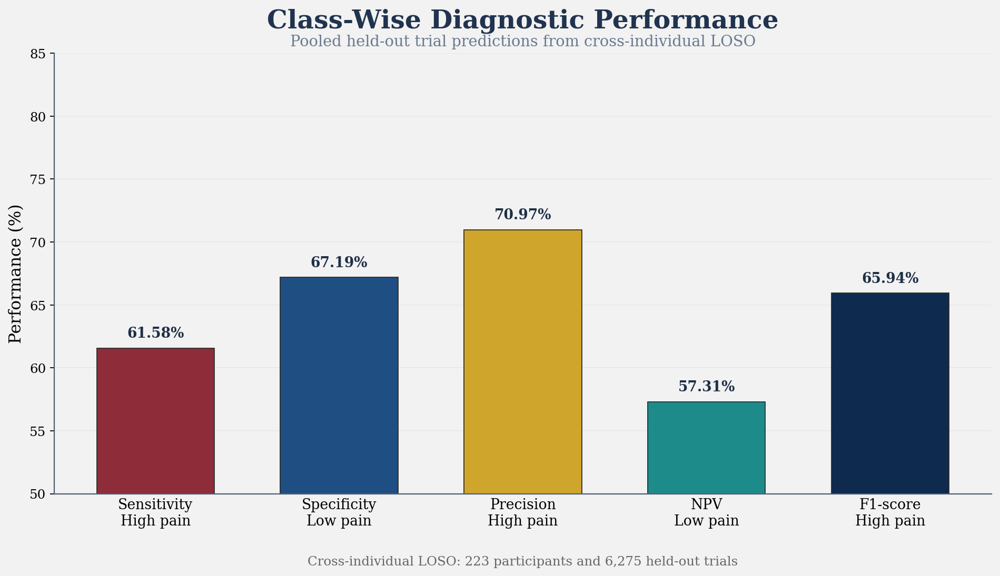

Figure saved to:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/cross_individual_classwise_diagnostic_performance.png

Values plotted:
Sensitivity (High pain): 61.58%
Specificity (Low pain): 67.19%
Precision (High pain):   70.97%
NPV (Low pain):          57.31%
F1-score (High pain):    65.94%


In [ ]:
# ============================================================
# CLASS-WISE DIAGNOSTIC PERFORMANCE PLOT
# CROSS-INDIVIDUAL LOSO — STRICT INDUCTIVE EXTRA TREES
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. File path
# ------------------------------------------------------------
summary_path = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252/"
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/"
    "ExtraTrees__StrictInductive_A__X_handcrafted_NoFeatureScaler__pooled_summary.csv"
)

output_dir = os.path.dirname(summary_path)
output_path_png = os.path.join(
    output_dir,
    "cross_individual_classwise_diagnostic_performance.png"
)

# ------------------------------------------------------------
# 2. Load pooled summary robustly
#    Works for both:
#    - wide one-row CSV
#    - two-column key/value CSV
# ------------------------------------------------------------
df = pd.read_csv(summary_path)

if {"value"}.issubset(df.columns) and df.shape[1] >= 2:
    # Example format:
    # metric,value
    # accuracy,0.640159
    if "metric" in df.columns:
        metric_dict = dict(zip(df["metric"], df["value"]))
    else:
        metric_dict = dict(zip(df.iloc[:, 0], df.iloc[:, 1]))
else:
    # Example one-row wide format
    metric_dict = df.iloc[0].to_dict()

# ------------------------------------------------------------
# 3. Extract pooled metrics
# ------------------------------------------------------------
sensitivity = float(metric_dict["sensitivity"])          # high pain recall
specificity = float(metric_dict["specificity"])          # low pain specificity
precision = float(metric_dict["precision"])              # high pain precision
f1_score = float(metric_dict["f1_score"])                # high pain f1

# NPV may not always exist in summary, so compute from confusion matrix
if "negative_predictive_value" in metric_dict:
    npv = float(metric_dict["negative_predictive_value"])
else:
    tn = float(metric_dict["true_negative"])
    fn = float(metric_dict["false_negative"])
    npv = tn / (tn + fn)

# Convert to percentage
values = np.array([
    sensitivity,
    specificity,
    precision,
    npv,
    f1_score
]) * 100

labels = [
    "Sensitivity\nHigh pain",
    "Specificity\nLow pain",
    "Precision\nHigh pain",
    "NPV\nLow pain",
    "F1-score\nHigh pain"
]

# ------------------------------------------------------------
# 4. Plot styling
# ------------------------------------------------------------
plt.rcParams["font.family"] = "serif"

fig, ax = plt.subplots(figsize=(12, 7), dpi=160)
fig.patch.set_facecolor("#f2f2f2")
ax.set_facecolor("#f2f2f2")

colors = [
    "#8E2C3A",   # burgundy
    "#1F4F82",   # deep blue
    "#D0A52C",   # golden
    "#1E8B8B",   # teal
    "#0E2A4F"    # navy
]

bars = ax.bar(
    labels,
    values,
    color=colors,
    edgecolor="#2b2b2b",
    linewidth=0.8,
    width=0.64
)

# ------------------------------------------------------------
# 5. Titles and labels
# ------------------------------------------------------------
ax.set_title(
    "Class-Wise Diagnostic Performance",
    fontsize=22,
    fontweight="bold",
    color="#20334F",
    pad=22
)

ax.text(
    0.5, 1.01,
    "Pooled held-out trial predictions from cross-individual LOSO",
    transform=ax.transAxes,
    ha="center",
    va="bottom",
    fontsize=13,
    color="#6b7a90"
)

ax.set_ylabel(
    "Performance (%)",
    fontsize=14
)

ax.set_ylim(50, 85)
ax.set_yticks(np.arange(50, 86, 5))

ax.grid(
    axis="y",
    linestyle="-",
    alpha=0.15
)

ax.set_axisbelow(True)

# Clean spines
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("#4f5f78")
ax.spines["bottom"].set_color("#4f5f78")
ax.spines["left"].set_linewidth(1.0)
ax.spines["bottom"].set_linewidth(1.0)

ax.tick_params(axis="x", labelsize=12, length=0)
ax.tick_params(axis="y", labelsize=11)

# ------------------------------------------------------------
# 6. Add value labels on top of bars
# ------------------------------------------------------------
for bar, val in zip(bars, values):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.6,
        f"{val:.2f}%",
        ha="center",
        va="bottom",
        fontsize=12,
        fontweight="bold",
        color="#1f2f46"
    )

# ------------------------------------------------------------
# 7. Optional footer
# ------------------------------------------------------------
ax.text(
    0.5, -0.14,
    "Cross-individual LOSO: 223 participants and 6,275 held-out trials",
    transform=ax.transAxes,
    ha="center",
    va="top",
    fontsize=11,
    color="#666666"
)

plt.tight_layout()
plt.savefig(output_path_png, dpi=300, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()

print("Figure saved to:")
print(output_path_png)

# ------------------------------------------------------------
# 8. Print the exact values used
# ------------------------------------------------------------
print("\nValues plotted:")
print(f"Sensitivity (High pain): {sensitivity*100:.2f}%")
print(f"Specificity (Low pain): {specificity*100:.2f}%")
print(f"Precision (High pain):   {precision*100:.2f}%")
print(f"NPV (Low pain):          {npv*100:.2f}%")
print(f"F1-score (High pain):    {f1_score*100:.2f}%")

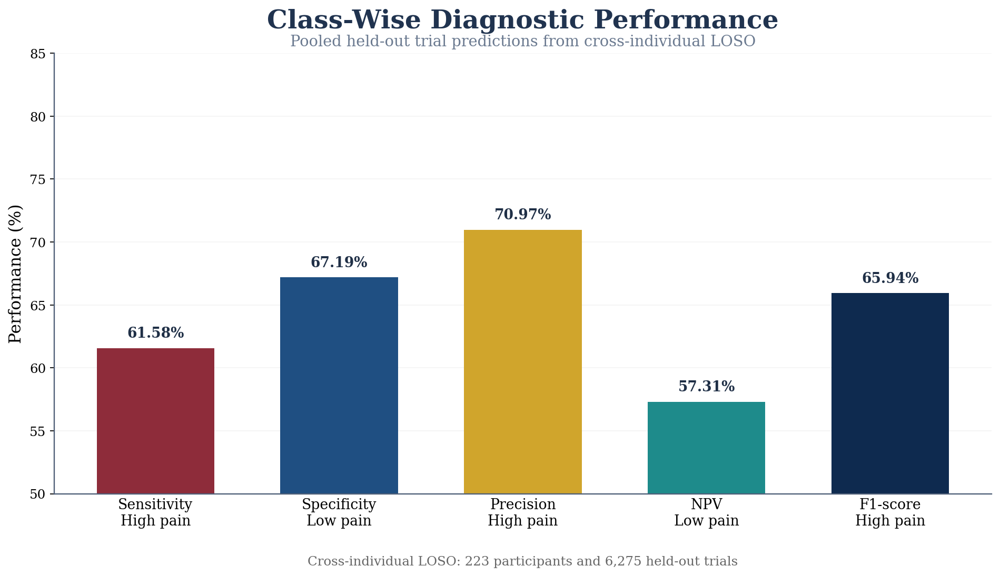

Figure saved to:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/cross_individual_classwise_diagnostic_performance_white_bg.png

Values plotted:
Sensitivity (High pain): 61.58%
Specificity (Low pain): 67.19%
Precision (High pain):   70.97%
NPV (Low pain):          57.31%
F1-score (High pain):    65.94%


In [ ]:
# ============================================================
# CLASS-WISE DIAGNOSTIC PERFORMANCE PLOT
# CROSS-INDIVIDUAL LOSO — STRICT INDUCTIVE EXTRA TREES
# WHITE BACKGROUND
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

summary_path = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252/"
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/"
    "ExtraTrees__StrictInductive_A__X_handcrafted_NoFeatureScaler__pooled_summary.csv"
)

output_dir = os.path.dirname(summary_path)

output_path_png = os.path.join(
    output_dir,
    "cross_individual_classwise_diagnostic_performance_white_bg.png"
)

# ------------------------------------------------------------
# Load summary
# ------------------------------------------------------------

df = pd.read_csv(summary_path)

if {"value"}.issubset(df.columns) and df.shape[1] >= 2:

    if "metric" in df.columns:
        metric_dict = dict(
            zip(
                df["metric"],
                df["value"]
            )
        )
    else:
        metric_dict = dict(
            zip(
                df.iloc[:, 0],
                df.iloc[:, 1]
            )
        )

else:

    metric_dict = df.iloc[0].to_dict()


# ------------------------------------------------------------
# Metrics
# ------------------------------------------------------------

sensitivity = float(
    metric_dict["sensitivity"]
)

specificity = float(
    metric_dict["specificity"]
)

precision = float(
    metric_dict["precision"]
)

f1_score = float(
    metric_dict["f1_score"]
)


if "negative_predictive_value" in metric_dict:

    npv = float(
        metric_dict[
            "negative_predictive_value"
        ]
    )

else:

    tn = float(
        metric_dict["true_negative"]
    )

    fn = float(
        metric_dict["false_negative"]
    )

    npv = tn / (tn + fn)


values = np.array([
    sensitivity,
    specificity,
    precision,
    npv,
    f1_score
]) * 100


labels = [
    "Sensitivity\nHigh pain",
    "Specificity\nLow pain",
    "Precision\nHigh pain",
    "NPV\nLow pain",
    "F1-score\nHigh pain"
]


# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

plt.rcParams["font.family"] = "serif"

fig, ax = plt.subplots(
    figsize=(12, 7),
    dpi=160
)

# WHITE BACKGROUND
fig.patch.set_facecolor("white")
ax.set_facecolor("white")


colors = [
    "#8E2C3A",
    "#1F4F82",
    "#D0A52C",
    "#1E8B8B",
    "#0E2A4F"
]


bars = ax.bar(
    labels,
    values,
    color=colors,
    edgecolor="none",
    width=0.64
)


# ------------------------------------------------------------
# Title
# ------------------------------------------------------------

ax.set_title(
    "Class-Wise Diagnostic Performance",
    fontsize=22,
    fontweight="bold",
    color="#20334F",
    pad=22
)


ax.text(
    0.5,
    1.01,
    "Pooled held-out trial predictions from cross-individual LOSO",
    transform=ax.transAxes,
    ha="center",
    va="bottom",
    fontsize=13,
    color="#6b7a90"
)


# ------------------------------------------------------------
# Axes
# ------------------------------------------------------------

ax.set_ylabel(
    "Performance (%)",
    fontsize=14
)

ax.set_ylim(
    50,
    85
)

ax.set_yticks(
    np.arange(
        50,
        86,
        5
    )
)


ax.grid(
    axis="y",
    linestyle="-",
    linewidth=0.7,
    alpha=0.15
)

ax.set_axisbelow(True)


ax.spines["top"].set_visible(
    False
)

ax.spines["right"].set_visible(
    False
)

ax.spines["left"].set_color(
    "#4f5f78"
)

ax.spines["bottom"].set_color(
    "#4f5f78"
)


ax.tick_params(
    axis="x",
    labelsize=12,
    length=0
)

ax.tick_params(
    axis="y",
    labelsize=11
)


# ------------------------------------------------------------
# Percentage labels
# ------------------------------------------------------------

for bar, value in zip(
    bars,
    values
):

    ax.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        bar.get_height()
        +
        0.6,

        f"{value:.2f}%",

        ha="center",
        va="bottom",

        fontsize=12,
        fontweight="bold",
        color="#1f2f46"
    )


# ------------------------------------------------------------
# Footer
# ------------------------------------------------------------

ax.text(
    0.5,
    -0.14,
    "Cross-individual LOSO: 223 participants and 6,275 held-out trials",
    transform=ax.transAxes,
    ha="center",
    va="top",
    fontsize=11,
    color="#666666"
)


plt.tight_layout()


plt.savefig(
    output_path_png,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)


plt.show()


print(
    "Figure saved to:"
)

print(
    output_path_png
)


print(
    "\nValues plotted:"
)

print(
    f"Sensitivity (High pain): {sensitivity*100:.2f}%"
)

print(
    f"Specificity (Low pain): {specificity*100:.2f}%"
)

print(
    f"Precision (High pain):   {precision*100:.2f}%"
)

print(
    f"NPV (Low pain):          {npv*100:.2f}%"
)

print(
    f"F1-score (High pain):    {f1_score*100:.2f}%"
)

In [ ]:
# ============================================================
# CELL 1 — Imports and premium figure theme
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

from sklearn.metrics import (
    confusion_matrix,
    roc_curve,
    auc,
)

# ---------- Global plotting style ----------
plt.rcParams["figure.dpi"] = 150
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["font.family"] = "DejaVu Sans"
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False
plt.rcParams["axes.edgecolor"] = "#22344d"
plt.rcParams["axes.linewidth"] = 1.2
plt.rcParams["axes.labelsize"] = 12
plt.rcParams["axes.titlesize"] = 18
plt.rcParams["xtick.labelsize"] = 11
plt.rcParams["ytick.labelsize"] = 11
plt.rcParams["legend.fontsize"] = 10

# ---------- Color palette ----------
NAVY = "#1d3557"
BLUE = "#2474a0"
LIGHT_BLUE = "#dbeaf4"
MID_BLUE = "#8fa2b5"
SLATE = "#5f6f82"
GOLD = "#d4a017"
LIGHT_GOLD = "#f8f1d0"
GRID = "#d3dbe5"
TEXT = "#1b1f24"
GREEN = "#2a9d8f"
RED = "#c94c4c"

print("Imports and premium plotting theme loaded.")

Imports and premium plotting theme loaded.


In [ ]:
# ============================================================
# CELL 2 — Paths and load saved V8 strict-inductive LOSO results
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

RESULTS_DIR = os.path.join(
    V8_DIR,
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO"
)

EXPERIMENT_ID = (
    "ExtraTrees__StrictInductive_A__"
    "X_handcrafted_NoFeatureScaler"
)

TRIAL_PREDICTIONS_PATH = os.path.join(
    RESULTS_DIR,
    EXPERIMENT_ID + "__trial_predictions.csv"
)

SUBJECT_RESULTS_PATH = os.path.join(
    RESULTS_DIR,
    EXPERIMENT_ID + "__subject_results.csv"
)

POOLED_SUMMARY_PATH = os.path.join(
    RESULTS_DIR,
    EXPERIMENT_ID + "__pooled_summary.csv"
)

FIGURE_DIR = os.path.join(
    RESULTS_DIR,
    "premium_cross_individual_figures"
)

os.makedirs(FIGURE_DIR, exist_ok=True)


def load_summary_series(csv_path):
    df = pd.read_csv(csv_path)

    if {"metric", "value"}.issubset(df.columns):
        return df.set_index("metric")["value"]

    if df.shape[1] == 2:
        return df.set_index(df.columns[0])[df.columns[1]]

    if df.shape[0] == 1:
        return df.iloc[0]

    raise ValueError(
        f"Could not parse pooled summary format from: {csv_path}"
    )


summary = load_summary_series(POOLED_SUMMARY_PATH)
trial_predictions = pd.read_csv(TRIAL_PREDICTIONS_PATH)
subject_results = pd.read_csv(SUBJECT_RESULTS_PATH)

print("Pooled summary loaded.")
print("Trial predictions shape:", trial_predictions.shape)
print("Subject results shape:", subject_results.shape)

print("\nTrial prediction columns:")
print(trial_predictions.columns.tolist())

print("\nSubject results columns:")
print(subject_results.columns.tolist())

Pooled summary loaded.
Trial predictions shape: (6275, 5)
Subject results shape: (223, 19)

Trial prediction columns:
['original_row_index', 'test_subject', 'y_true', 'y_pred', 'y_score']

Subject results columns:
['test_subject', 'n_trials', 'accuracy', 'balanced_accuracy', 'precision', 'recall', 'sensitivity', 'specificity', 'f1_score', 'roc_auc', 'pr_auc', 'mcc', 'cohen_kappa', 'true_negative', 'false_positive', 'false_negative', 'true_positive', 'support_low', 'support_high']


In [ ]:
# ============================================================
# CELL 3 — Detect the main columns automatically
# ============================================================

def find_first_matching_column(columns, candidates):
    lower_map = {c.lower(): c for c in columns}
    for candidate in candidates:
        if candidate.lower() in lower_map:
            return lower_map[candidate.lower()]

    for c in columns:
        c_low = c.lower()
        for candidate in candidates:
            if candidate.lower() in c_low:
                return c

    return None


TRUE_COL = find_first_matching_column(
    trial_predictions.columns,
    [
        "y_true", "true_label", "actual_label",
        "label_true", "ground_truth", "target"
    ]
)

PRED_COL = find_first_matching_column(
    trial_predictions.columns,
    [
        "y_pred", "pred_label", "predicted_label",
        "label_pred", "prediction"
    ]
)

PROB_COL = find_first_matching_column(
    trial_predictions.columns,
    [
        "prob_high", "probability_high", "y_prob",
        "pred_prob_1", "proba_1", "positive_probability",
        "prob_positive", "high_prob"
    ]
)

SUBJECT_COL = find_first_matching_column(
    subject_results.columns,
    [
        "subject_id", "participant_id", "test_subject",
        "group", "subject"
    ]
)

SUBJECT_ACC_COL = find_first_matching_column(
    subject_results.columns,
    [
        "accuracy"
    ]
)

print("Detected columns:")
print("TRUE_COL    =", TRUE_COL)
print("PRED_COL    =", PRED_COL)
print("PROB_COL    =", PROB_COL)
print("SUBJECT_COL =", SUBJECT_COL)
print("SUBJECT_ACC =", SUBJECT_ACC_COL)

if TRUE_COL is None or PRED_COL is None:
    raise ValueError(
        "Could not detect true/predicted label columns "
        "from the trial prediction CSV."
    )

if PROB_COL is None:
    print("\nWarning: probability column was not detected.")
    print("ROC curve figure will fail unless you manually set PROB_COL.")

Detected columns:
TRUE_COL    = y_true
PRED_COL    = y_pred
PROB_COL    = None
SUBJECT_COL = test_subject
SUBJECT_ACC = accuracy

ROC curve figure will fail unless you manually set PROB_COL.


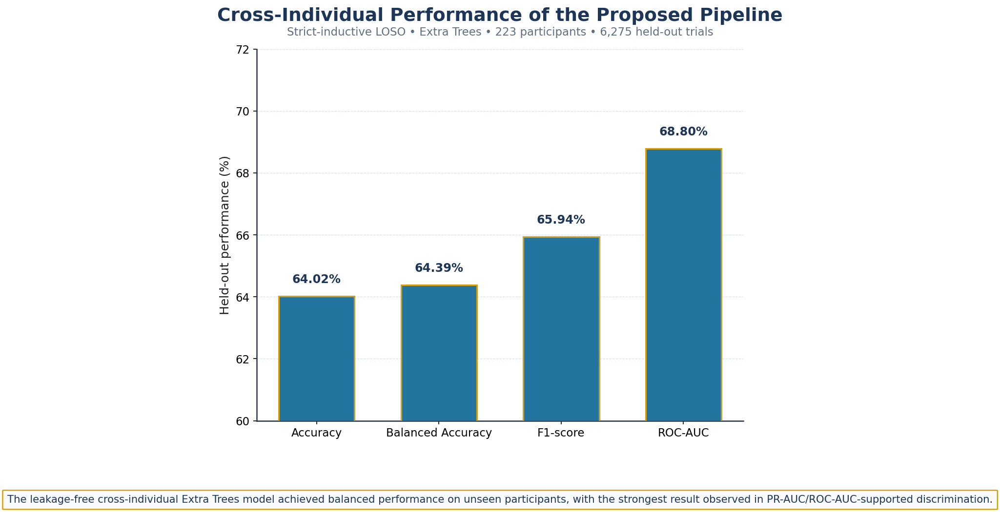

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/premium_cross_individual_figures/cross_individual_main_4metric_barplot.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/premium_cross_individual_figures/cross_individual_main_4metric_barplot.pdf


In [ ]:
# ============================================================
# CELL 4 — Premium main results bar plot
# ============================================================

main_metrics = [
    ("accuracy", "Accuracy"),
    ("balanced_accuracy", "Balanced Accuracy"),
    ("f1_score", "F1-score"),
    ("roc_auc", "ROC-AUC"),
]

main_values = [
    float(summary[key]) * 100
    for key, _ in main_metrics
]

metric_labels = [label for _, label in main_metrics]

fig, ax = plt.subplots(figsize=(11.5, 7.2))

bars = ax.bar(
    metric_labels,
    main_values,
    width=0.62,
    color=BLUE,
    edgecolor=GOLD,
    linewidth=1.5,
    zorder=3
)

ax.set_ylim(60, 72 if max(main_values) < 72 else max(main_values) + 6)
ax.set_ylabel("Held-out performance (%)", color=TEXT)
ax.grid(axis="y", linestyle="--", linewidth=0.6, color=GRID, alpha=0.9, zorder=0)

ax.set_title(
    "Cross-Individual Performance of the Proposed Pipeline",
    fontsize=18,
    fontweight="bold",
    color=NAVY,
    pad=28
)

ax.text(
    0.5,
    1.03,
    "Strict-inductive LOSO • Extra Trees • 223 participants • 6,275 held-out trials",
    transform=ax.transAxes,
    ha="center",
    va="bottom",
    fontsize=11,
    color=SLATE
)

for bar, value in zip(bars, main_values):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.35,
        f"{value:.2f}%",
        ha="center",
        va="bottom",
        fontsize=11.5,
        fontweight="bold",
        color=NAVY
    )

note_text = (
    "The leakage-free cross-individual Extra Trees model achieved balanced "
    "performance on unseen participants, with the strongest result observed "
    "in PR-AUC/ROC-AUC-supported discrimination."
)

ax.text(
    0.5,
    -0.20,
    note_text,
    transform=ax.transAxes,
    ha="center",
    va="top",
    fontsize=10.2,
    color=NAVY,
    bbox=dict(
        boxstyle="round,pad=0.45,rounding_size=0.06",
        facecolor="#f8fafc",
        edgecolor=GOLD,
        linewidth=1.2
    )
)

plt.tight_layout()

png_path = os.path.join(
    FIGURE_DIR,
    "cross_individual_main_4metric_barplot.png"
)
pdf_path = os.path.join(
    FIGURE_DIR,
    "cross_individual_main_4metric_barplot.pdf"
)

plt.savefig(png_path, bbox_inches="tight")
plt.savefig(pdf_path, bbox_inches="tight")
plt.show()

print("Saved:")
print(png_path)
print(pdf_path)

STRICT CROSS-INDIVIDUAL LOSO CLASSIFIER COMPARISON


,Metric,SVM-RBF (%),Extra Trees (%),Extra Trees - SVM (pp)
0,Accuracy,63.857,64.016,0.159
1,Balanced Accuracy,64.402,64.385,-0.017
2,F1-score,65.353,65.943,0.590
3,ROC-AUC,68.206,68.796,0.589


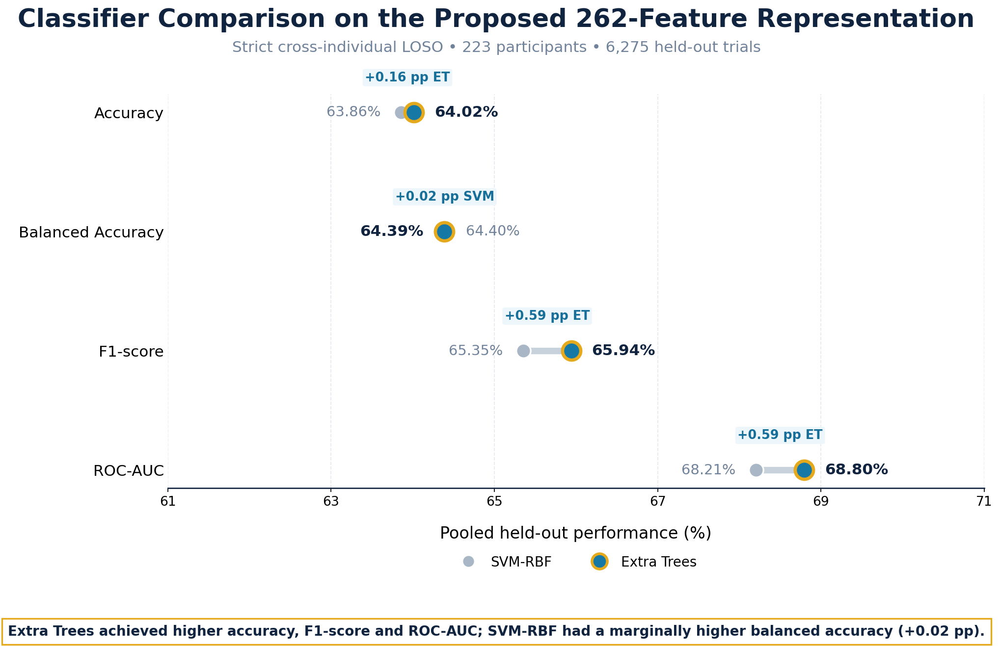


FIGURE GENERATED

SVM-RBF Accuracy:             63.86%
Extra Trees Accuracy:         64.02%

SVM-RBF Balanced Accuracy:    64.40%
Extra Trees Balanced Accuracy:64.39%

SVM-RBF F1-score:             65.35%
Extra Trees F1-score:         65.94%

SVM-RBF ROC-AUC:              68.21%
Extra Trees ROC-AUC:          68.80%

Saved figure:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_SVM_XGBOOST_COMPARISON/SVM_RBF_vs_ExtraTrees_Strict_CrossIndividual_LOSO.png


In [ ]:
# ============================================================
# CROSS-INDIVIDUAL CLASSIFIER COMPARISON
# SVM-RBF vs EXTRA TREES
# Proposed 262-Feature Representation
# Strict Cross-Individual LOSO
# White background
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


# ============================================================
# 1. Paths to saved pooled summaries
# ============================================================

EXTRATREES_SUMMARY = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252/"
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/"
    "ExtraTrees__StrictInductive_A__"
    "X_handcrafted_NoFeatureScaler__pooled_summary.csv"
)


SVM_SUMMARY = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252/"
    "V8_FAST_SVM_XGBOOST_COMPARISON/"
    "SVM_RBF__Full262__"
    "CrossIndividual_LOSO_Strict223__pooled_summary.csv"
)


OUTPUT_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252/"
    "V8_FAST_SVM_XGBOOST_COMPARISON"
)


OUTPUT_PATH = os.path.join(
    OUTPUT_DIR,
    "SVM_RBF_vs_ExtraTrees_Strict_CrossIndividual_LOSO.png"
)


os.makedirs(
    OUTPUT_DIR,
    exist_ok=True
)


# ============================================================
# 2. Robust pooled-summary loader
# ============================================================

def load_metric_dictionary(csv_path):

    if not os.path.exists(csv_path):
        raise FileNotFoundError(
            f"File not found:\n{csv_path}"
        )

    df = pd.read_csv(csv_path)


    # Format:
    # metric,value
    if (
        "metric" in df.columns
        and
        "value" in df.columns
    ):

        return dict(
            zip(
                df["metric"].astype(str),
                df["value"]
            )
        )


    # Format where first column contains metric names
    # and second column contains values
    if (
        "value" in df.columns
        and
        df.shape[1] >= 2
    ):

        return dict(
            zip(
                df.iloc[:, 0].astype(str),
                df["value"]
            )
        )


    # Wide one-row format
    if len(df) == 1:

        return df.iloc[0].to_dict()


    raise ValueError(
        "Could not identify pooled-summary CSV format:\n"
        f"{csv_path}"
    )


# ============================================================
# 3. Load results
# ============================================================

extra = load_metric_dictionary(
    EXTRATREES_SUMMARY
)

svm = load_metric_dictionary(
    SVM_SUMMARY
)


# ============================================================
# 4. Metrics to compare
# ============================================================

metric_keys = [
    "accuracy",
    "balanced_accuracy",
    "f1_score",
    "roc_auc"
]


metric_labels = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC-AUC"
]


extra_values = np.array([
    float(extra[key])
    for key in metric_keys
]) * 100


svm_values = np.array([
    float(svm[key])
    for key in metric_keys
]) * 100


# ============================================================
# 5. Print exact values before plotting
# ============================================================

comparison_df = pd.DataFrame({
    "Metric": metric_labels,
    "SVM-RBF (%)": svm_values,
    "Extra Trees (%)": extra_values,
    "Extra Trees - SVM (pp)":
        extra_values - svm_values
})


print("=" * 78)
print("STRICT CROSS-INDIVIDUAL LOSO CLASSIFIER COMPARISON")
print("=" * 78)

display(
    comparison_df.round(3)
)


# ============================================================
# 6. Figure setup
# ============================================================

plt.rcParams["font.family"] = "sans-serif"

fig, ax = plt.subplots(
    figsize=(13.5, 8.5),
    dpi=160
)


# Pure white background
fig.patch.set_facecolor("white")
ax.set_facecolor("white")


# ------------------------------------------------------------
# Colors
# ------------------------------------------------------------

svm_color = "#A8B6C6"
extra_color = "#1678A5"
gold_color = "#E4A91C"

connector_color = "#C8D2DC"
text_dark = "#10233F"
text_gray = "#71839A"
grid_color = "#DCE5EE"


# ============================================================
# 7. Y positions
# ============================================================

y_positions = np.array([
    3,
    2,
    1,
    0
])


# ============================================================
# 8. Draw connecting lines
# ============================================================

for y, svm_value, extra_value in zip(
    y_positions,
    svm_values,
    extra_values
):

    ax.plot(
        [svm_value, extra_value],
        [y, y],
        color=connector_color,
        linewidth=6,
        solid_capstyle="round",
        zorder=1
    )


# ============================================================
# 9. Draw SVM markers
# ============================================================

ax.scatter(
    svm_values,
    y_positions,
    s=175,
    color=svm_color,
    edgecolor="white",
    linewidth=1.5,
    zorder=3
)


# ============================================================
# 10. Draw Extra Trees markers
# ============================================================

ax.scatter(
    extra_values,
    y_positions,
    s=280,
    color=extra_color,
    edgecolor=gold_color,
    linewidth=3,
    zorder=4
)


# ============================================================
# 11. Add numerical labels
# ============================================================

for i, (
    y,
    svm_value,
    extra_value
) in enumerate(
    zip(
        y_positions,
        svm_values,
        extra_values
    )
):

    # --------------------------------------------------------
    # SVM-RBF value
    # --------------------------------------------------------

    if svm_value <= extra_value:

        svm_x = svm_value - 0.25
        svm_ha = "right"

    else:

        svm_x = svm_value + 0.25
        svm_ha = "left"


    ax.text(
        svm_x,
        y,
        f"{svm_value:.2f}%",
        ha=svm_ha,
        va="center",
        fontsize=13,
        color=text_gray,
        fontweight="normal"
    )


    # --------------------------------------------------------
    # Extra Trees value
    # --------------------------------------------------------

    if extra_value >= svm_value:

        extra_x = extra_value + 0.25
        extra_ha = "left"

    else:

        extra_x = extra_value - 0.25
        extra_ha = "right"


    ax.text(
        extra_x,
        y,
        f"{extra_value:.2f}%",
        ha=extra_ha,
        va="center",
        fontsize=14,
        color=text_dark,
        fontweight="bold"
    )


    # --------------------------------------------------------
    # Difference annotation
    # --------------------------------------------------------

    difference = (
        extra_value
        -
        svm_value
    )


    midpoint = (
        svm_value
        +
        extra_value
    ) / 2


    if difference > 0:

        difference_text = (
            f"+{abs(difference):.2f} pp ET"
        )

    elif difference < 0:

        difference_text = (
            f"+{abs(difference):.2f} pp SVM"
        )

    else:

        difference_text = "Equal"


    ax.text(
        midpoint,
        y + 0.29,
        difference_text,
        ha="center",
        va="center",
        fontsize=11.5,
        fontweight="bold",
        color="#176F99",
        bbox=dict(
            boxstyle="round,pad=0.18",
            facecolor="#EDF7FB",
            edgecolor="none"
        )
    )


# ============================================================
# 12. Axis labels
# ============================================================

ax.set_yticks(
    y_positions
)

ax.set_yticklabels(
    metric_labels,
    fontsize=14
)


ax.tick_params(
    axis="y",
    length=0
)


ax.tick_params(
    axis="x",
    labelsize=12
)


ax.set_xlabel(
    "Pooled held-out performance (%)",
    fontsize=15,
    labelpad=16
)


# ============================================================
# 13. X-axis limits
# ============================================================

all_values = np.concatenate([
    svm_values,
    extra_values
])


x_min = np.floor(
    all_values.min()
) - 2


x_max = np.ceil(
    all_values.max()
) + 2


ax.set_xlim(
    x_min,
    x_max
)


ax.set_xticks(
    np.arange(
        np.floor(x_min),
        np.ceil(x_max) + 0.1,
        2
    )
)


# ============================================================
# 14. Grid
# ============================================================

ax.grid(
    axis="x",
    linestyle="--",
    linewidth=0.8,
    color=grid_color,
    alpha=0.8
)

ax.set_axisbelow(True)


# ============================================================
# 15. Clean spines
# ============================================================

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)

ax.spines["bottom"].set_color(
    text_dark
)

ax.spines["bottom"].set_linewidth(
    1.2
)


# ============================================================
# 16. Main title and subtitle
# ============================================================

fig.suptitle(
    "Classifier Comparison on the Proposed 262-Feature Representation",
    fontsize=23,
    fontweight="bold",
    color=text_dark,
    y=0.97
)


fig.text(
    0.5,
    0.91,
    "Strict cross-individual LOSO • 223 participants • 6,275 held-out trials",
    ha="center",
    va="center",
    fontsize=14,
    color=text_gray
)


# ============================================================
# 17. Legend
# ============================================================

legend_handles = [

    Line2D(
        [0],
        [0],
        marker="o",
        color="none",
        markerfacecolor=svm_color,
        markeredgecolor="white",
        markersize=11,
        label="SVM-RBF"
    ),

    Line2D(
        [0],
        [0],
        marker="o",
        color="none",
        markerfacecolor=extra_color,
        markeredgecolor=gold_color,
        markeredgewidth=2.5,
        markersize=14,
        label="Extra Trees"
    )
]


ax.legend(
    handles=legend_handles,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.14),
    ncol=2,
    frameon=False,
    fontsize=12.5,
    handletextpad=0.6,
    columnspacing=2.5
)


# ============================================================
# 18. Bottom interpretation box
# ============================================================

footer_text = (
    "Extra Trees achieved higher accuracy, F1-score and ROC-AUC; "
    "SVM-RBF had a marginally higher balanced accuracy (+0.02 pp)."
)


fig.text(
    0.5,
    0.035,
    footer_text,
    ha="center",
    va="center",
    fontsize=12.5,
    fontweight="bold",
    color=text_dark,
    bbox=dict(
        boxstyle="square,pad=0.45",
        facecolor="white",
        edgecolor=gold_color,
        linewidth=1.5
    )
)


# ============================================================
# 19. Layout and save
# ============================================================

plt.subplots_adjust(
    top=0.84,
    bottom=0.25,
    left=0.19,
    right=0.96
)


plt.savefig(
    OUTPUT_PATH,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)


plt.show()


# ============================================================
# 20. Final information
# ============================================================

print("\n" + "=" * 78)
print("FIGURE GENERATED")
print("=" * 78)

print(
    f"\nSVM-RBF Accuracy:             {svm_values[0]:.2f}%"
)

print(
    f"Extra Trees Accuracy:         {extra_values[0]:.2f}%"
)


print(
    f"\nSVM-RBF Balanced Accuracy:    {svm_values[1]:.2f}%"
)

print(
    f"Extra Trees Balanced Accuracy:{extra_values[1]:.2f}%"
)


print(
    f"\nSVM-RBF F1-score:             {svm_values[2]:.2f}%"
)

print(
    f"Extra Trees F1-score:         {extra_values[2]:.2f}%"
)


print(
    f"\nSVM-RBF ROC-AUC:              {svm_values[3]:.2f}%"
)

print(
    f"Extra Trees ROC-AUC:          {extra_values[3]:.2f}%"
)


print(
    "\nSaved figure:"
)

print(
    OUTPUT_PATH
)

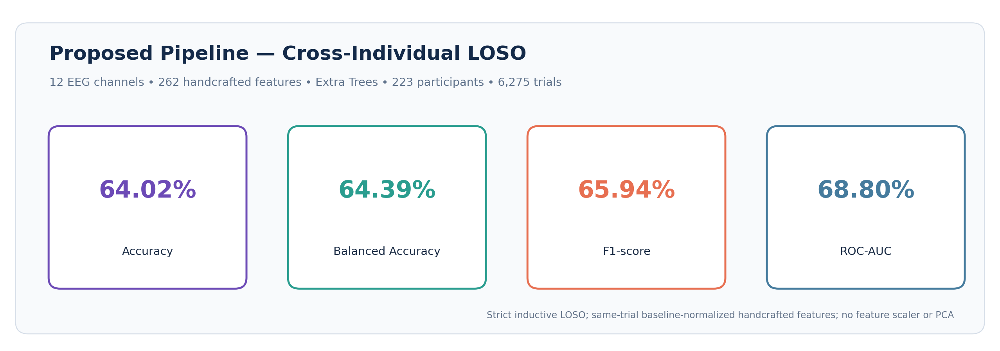

Saved to:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees_CrossIndividual_LOSO_Metric_Card.png


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch

# ============================================================
# EXTRA TREES — STRICT CROSS-INDIVIDUAL LOSO
# Metric summary card
# No icons | White background
# ============================================================

# Strict-inductive Extra Trees LOSO results
metrics = [
    ("64.02%", "Accuracy"),
    ("64.39%", "Balanced Accuracy"),
    ("65.94%", "F1-score"),
    ("68.80%", "ROC-AUC"),
]

# Different colors from the within-individual figure
colors = [
    "#6C4AB6",   # purple
    "#2A9D8F",   # teal
    "#E76F51",   # coral
    "#457B9D",   # steel blue
]

# ------------------------------------------------------------
# Figure
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(14, 4.8), dpi=180)

fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ax.set_xlim(0, 14)
ax.set_ylim(0, 5)
ax.axis("off")


# ------------------------------------------------------------
# Outer rounded container
# ------------------------------------------------------------

outer_box = FancyBboxPatch(
    (0.15, 0.18),
    13.7,
    4.55,
    boxstyle="round,pad=0.03,rounding_size=0.18",
    linewidth=1.0,
    edgecolor="#D6DEE8",
    facecolor="#F8FAFC"
)

ax.add_patch(outer_box)


# ------------------------------------------------------------
# Title
# ------------------------------------------------------------

ax.text(
    0.60,
    4.30,
    "Proposed Pipeline — Cross-Individual LOSO",
    fontsize=20,
    fontweight="bold",
    color="#142A49",
    ha="left",
    va="center"
)


# ------------------------------------------------------------
# Subtitle
# ------------------------------------------------------------

ax.text(
    0.60,
    3.88,
    "12 EEG channels • 262 handcrafted features • "
    "Extra Trees • 223 participants • 6,275 trials",
    fontsize=11.5,
    color="#60738C",
    ha="left",
    va="center"
)


# ------------------------------------------------------------
# Metric cards
# ------------------------------------------------------------

card_width = 2.75
card_height = 2.35

card_y = 0.85

card_x_positions = [
    0.62,
    4.02,
    7.42,
    10.82
]


for (value, label), color, x in zip(
    metrics,
    colors,
    card_x_positions
):

    card = FancyBboxPatch(
        (x, card_y),
        card_width,
        card_height,
        boxstyle="round,pad=0.03,rounding_size=0.16",
        linewidth=2.0,
        edgecolor=color,
        facecolor="white"
    )

    ax.add_patch(card)

    # Metric value
    ax.text(
        x + card_width / 2,
        card_y + 1.42,
        value,
        fontsize=24,
        fontweight="bold",
        color=color,
        ha="center",
        va="center"
    )

    # Metric name
    ax.text(
        x + card_width / 2,
        card_y + 0.52,
        label,
        fontsize=11.5,
        color="#1C2D46",
        ha="center",
        va="center"
    )


# ------------------------------------------------------------
# Footer
# ------------------------------------------------------------

ax.text(
    13.45,
    0.43,
    "Strict inductive LOSO; same-trial baseline-normalized "
    "handcrafted features; no feature scaler or PCA",
    fontsize=9.5,
    color="#65758B",
    ha="right",
    va="center"
)


# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

plt.tight_layout(pad=0)

output_path = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252/"
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/"
    "ExtraTrees_CrossIndividual_LOSO_Metric_Card.png"
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved to:")
print(output_path)

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.ticker import FuncFormatter

# ============================================================
# SAVE DIRECTORY
# ============================================================
SAVE_DIR = "/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL"
os.makedirs(SAVE_DIR, exist_ok=True)

# ============================================================
# GLOBAL STYLE
# ============================================================
plt.rcParams.update({
    "figure.dpi": 160,
    "savefig.dpi": 300,
    "font.family": "DejaVu Sans",
    "font.size": 11,
    "axes.titlesize": 18,
    "axes.labelsize": 12,
    "axes.edgecolor": "#334155",
    "axes.linewidth": 1.2,
    "xtick.color": "#1f2937",
    "ytick.color": "#1f2937",
    "text.color": "#0f172a",
    "axes.titleweight": "bold"
})

# ============================================================
# CROSS-INDIVIDUAL LOSO RESULTS
# ============================================================

# Huang faithful reimplemented baseline
huang = {
    "name": "Huang faithful baseline\nβ1–β5 + Gaussian NB",
    "accuracy": 62.77,
    "balanced_accuracy": 64.08,
    "precision": 73.08,
    "recall": 54.14,
    "specificity": 74.02,
    "f1_score": 62.20,
    "roc_auc": 66.78,
    "kappa": 27.10,
    "mean_subject_accuracy": 62.74,
    "sd_subject_accuracy": 22.41,
    "confusion": np.array([
        [2017, 708],   # actual low pain -> predicted low/high
        [1628, 1922]   # actual high pain -> predicted low/high
    ])
}

# Proposed pipeline: strict-inductive Extra Trees LOSO
proposed = {
    "name": "Proposed pipeline\n262 features + Extra Trees",
    "accuracy": 64.02,
    "balanced_accuracy": 64.39,
    "precision": 70.97,
    "recall": 61.58,
    "specificity": 67.19,
    "f1_score": 65.94,
    "roc_auc": 68.80,
    "kappa": 28.20,
    "mean_subject_accuracy": 64.08,
    "sd_subject_accuracy": 20.15,
    "confusion": np.array([
        [1831, 894],
        [1364, 2186]
    ])
}

# ============================================================
# COLORS
# ============================================================
BASELINE_COLOR = "#9AA5B1"     # cool gray
PROPOSED_COLOR = "#287BA3"     # blue-teal
GOLD = "#D4A017"
NAVY = "#13294B"
TEAL = "#2A9D8F"
CRIMSON = "#96314A"
MUSTARD = "#D4A62A"

# ============================================================
# HELPER
# ============================================================
def pct(x):
    return f"{x:.2f}%"

print("Cross-individual comparison configuration loaded.")
print("Figures will be saved in:")
print(SAVE_DIR)

Cross-individual comparison configuration loaded.
Figures will be saved in:
/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL


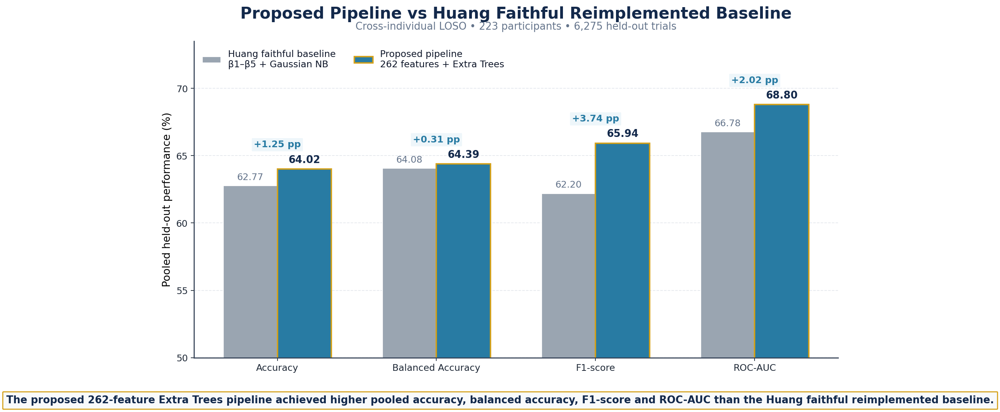

Saved: /content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL/cross_fig1_pooled_metric_comparison.png


In [ ]:
# ============================================================
# FIGURE 1 — MAIN POOLED PERFORMANCE COMPARISON
# ============================================================

metrics = ["Accuracy", "Balanced Accuracy", "F1-score", "ROC-AUC"]
huang_vals = [
    huang["accuracy"],
    huang["balanced_accuracy"],
    huang["f1_score"],
    huang["roc_auc"]
]
proposed_vals = [
    proposed["accuracy"],
    proposed["balanced_accuracy"],
    proposed["f1_score"],
    proposed["roc_auc"]
]
gains = [p - h for p, h in zip(proposed_vals, huang_vals)]

x = np.arange(len(metrics))
width = 0.34

fig, ax = plt.subplots(figsize=(11, 6.8), facecolor="white")
ax.set_facecolor("white")

bars1 = ax.bar(
    x - width/2, huang_vals, width,
    color=BASELINE_COLOR, edgecolor="white", linewidth=1.0,
    label="Huang faithful baseline\nβ1–β5 + Gaussian NB"
)

bars2 = ax.bar(
    x + width/2, proposed_vals, width,
    color=PROPOSED_COLOR, edgecolor=GOLD, linewidth=1.6,
    label="Proposed pipeline\n262 features + Extra Trees"
)

# Value labels
for b in bars1:
    ax.text(
        b.get_x() + b.get_width()/2, b.get_height() + 0.28,
        f"{b.get_height():.2f}",
        ha="center", va="bottom", fontsize=10.5, color="#64748B"
    )

for b in bars2:
    ax.text(
        b.get_x() + b.get_width()/2, b.get_height() + 0.28,
        f"{b.get_height():.2f}",
        ha="center", va="bottom", fontsize=11.5, fontweight="bold", color=NAVY
    )

# Gain annotations
for i, gain in enumerate(gains):
    top_y = max(huang_vals[i], proposed_vals[i]) + 1.8
    ax.text(
        x[i], top_y, f"+{gain:.2f} pp",
        ha="center", va="center",
        fontsize=10.5, fontweight="bold", color=PROPOSED_COLOR,
        bbox=dict(boxstyle="round,pad=0.22,rounding_size=0.08",
                  facecolor="#EEF6FA", edgecolor="none")
    )

ax.set_title("Proposed Pipeline vs Huang Faithful Reimplemented Baseline", pad=26, color=NAVY)
ax.text(
    0.5, 1.03,
    "Cross-individual LOSO • 223 participants • 6,275 held-out trials",
    transform=ax.transAxes, ha="center", va="bottom",
    fontsize=11.5, color="#64748B"
)

ax.set_ylabel("Pooled held-out performance (%)")
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.set_ylim(50, 73.5)
ax.grid(axis="y", linestyle="--", alpha=0.25, color="#94A3B8")
ax.set_axisbelow(True)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.legend(loc="upper left", frameon=False, fontsize=10.5, ncol=2)

# Bottom conclusion box
fig.text(
    0.5, 0.03,
    "The proposed 262-feature Extra Trees pipeline achieved higher pooled accuracy, balanced accuracy, "
    "F1-score and ROC-AUC than the Huang faithful reimplemented baseline.",
    ha="center", va="center", fontsize=11.5, fontweight="bold", color=NAVY,
    bbox=dict(boxstyle="round,pad=0.35,rounding_size=0.06",
              facecolor="#F8FAFC", edgecolor=GOLD, linewidth=1.2)
)

plt.tight_layout(rect=[0, 0.07, 1, 0.97])

out1 = os.path.join(SAVE_DIR, "cross_fig1_pooled_metric_comparison.png")
plt.savefig(out1, bbox_inches="tight", facecolor="white")
plt.show()

print("Saved:", out1)

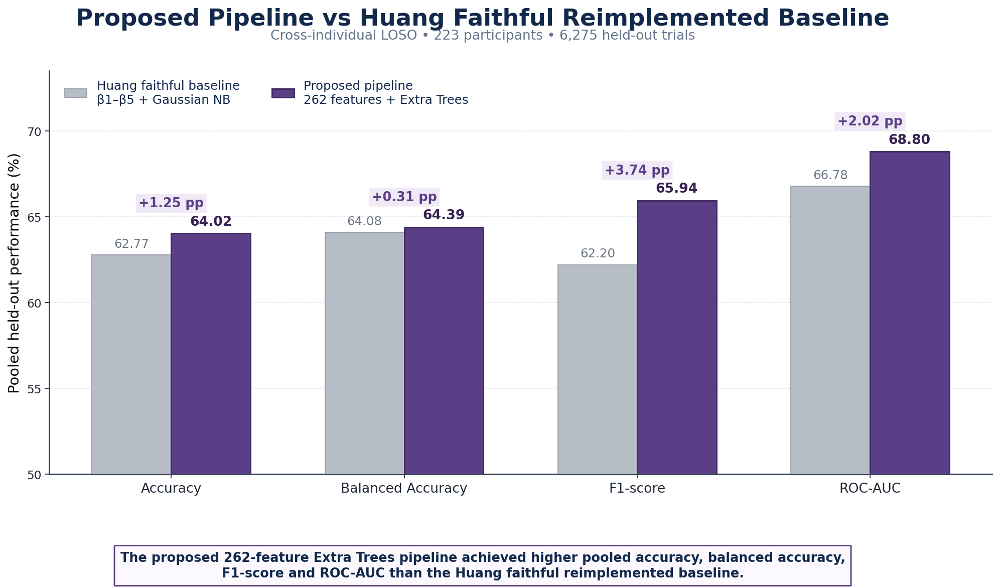

Saved to:
/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL/cross_individual_huang_vs_extratrees_silver_darkpurple.png

Cross-individual improvements:
Accuracy             Huang=62.77% | Extra Trees=64.02% | Gain=+1.25 pp
Balanced Accuracy    Huang=64.08% | Extra Trees=64.39% | Gain=+0.31 pp
F1-score             Huang=62.20% | Extra Trees=65.94% | Gain=+3.74 pp
ROC-AUC              Huang=66.78% | Extra Trees=68.80% | Gain=+2.02 pp


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# CROSS-INDIVIDUAL LOSO
# HUANG FAITHFUL BASELINE vs PROPOSED EXTRA TREES
#
# Color palette:
#   Huang baseline = silver
#   Extra Trees    = dark purple
#
# White background
# Publication / thesis style
# ============================================================

# ------------------------------------------------------------
# 1. Save directory
# ------------------------------------------------------------

SAVE_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL"
)

os.makedirs(
    SAVE_DIR,
    exist_ok=True
)

OUTPUT_PATH = os.path.join(
    SAVE_DIR,
    "cross_individual_huang_vs_extratrees_silver_darkpurple.png"
)


# ------------------------------------------------------------
# 2. Results
# ------------------------------------------------------------

metrics = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC-AUC"
]


# Huang faithful reconstructed baseline
huang_values = np.array([
    62.77,
    64.08,
    62.20,
    66.78
])


# Proposed strict-inductive Extra Trees
extra_values = np.array([
    64.02,
    64.39,
    65.94,
    68.80
])


# Improvements in percentage points
improvements = (
    extra_values
    -
    huang_values
)


# ------------------------------------------------------------
# 3. Color palette
# ------------------------------------------------------------

# Huang = premium silver
HUANG_COLOR = "#B7BDC7"
HUANG_EDGE = "#9299A5"
HUANG_TEXT = "#6C7688"

# Extra Trees = dark purple
EXTRA_COLOR = "#5B3F86"
EXTRA_EDGE = "#3F285F"
EXTRA_TEXT = "#35204F"

# Supporting colors
NAVY = "#13294B"
SUBTITLE = "#64748B"

GRID_COLOR = "#DCE2EA"

# Improvement badge
BADGE_BG = "#F0EAF7"
BADGE_TEXT = "#5B3F86"

# Footer
FOOTER_BORDER = "#5B3F86"
FOOTER_BG = "#FBF9FD"


# ------------------------------------------------------------
# 4. Global style
# ------------------------------------------------------------

plt.rcParams.update({

    "figure.dpi": 160,

    "savefig.dpi": 300,

    "font.family":
        "DejaVu Sans",

    "font.size":
        11,

    "axes.edgecolor":
        "#334155",

    "axes.linewidth":
        1.2,

    "xtick.color":
        "#1F2937",

    "ytick.color":
        "#1F2937",

    "text.color":
        NAVY
})


# ------------------------------------------------------------
# 5. Figure
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(13.5, 7.5),
    facecolor="white"
)

ax.set_facecolor(
    "white"
)


x = np.arange(
    len(metrics)
)

width = 0.34


# ------------------------------------------------------------
# 6. Huang bars — Silver
# ------------------------------------------------------------

huang_bars = ax.bar(

    x - width / 2,

    huang_values,

    width,

    color=HUANG_COLOR,

    edgecolor=HUANG_EDGE,

    linewidth=0.8,

    label=(
        "Huang faithful baseline\n"
        "β1–β5 + Gaussian NB"
    ),

    zorder=3
)


# ------------------------------------------------------------
# 7. Extra Trees bars — Dark Purple
# ------------------------------------------------------------

extra_bars = ax.bar(

    x + width / 2,

    extra_values,

    width,

    color=EXTRA_COLOR,

    edgecolor=EXTRA_EDGE,

    linewidth=1.3,

    label=(
        "Proposed pipeline\n"
        "262 features + Extra Trees"
    ),

    zorder=3
)


# ------------------------------------------------------------
# 8. Huang value labels
# ------------------------------------------------------------

for bar in huang_bars:

    value = (
        bar.get_height()
    )

    ax.text(

        bar.get_x()
        +
        bar.get_width() / 2,

        value + 0.30,

        f"{value:.2f}",

        ha="center",

        va="bottom",

        fontsize=11,

        color=HUANG_TEXT,

        fontweight="normal"
    )


# ------------------------------------------------------------
# 9. Extra Trees value labels
# ------------------------------------------------------------

for bar in extra_bars:

    value = (
        bar.get_height()
    )

    ax.text(

        bar.get_x()
        +
        bar.get_width() / 2,

        value + 0.30,

        f"{value:.2f}",

        ha="center",

        va="bottom",

        fontsize=12,

        color=EXTRA_TEXT,

        fontweight="bold"
    )


# ------------------------------------------------------------
# 10. Improvement labels
# ------------------------------------------------------------

for i, improvement in enumerate(
    improvements
):

    highest_bar = max(
        huang_values[i],
        extra_values[i]
    )

    ax.text(

        x[i],

        highest_bar + 1.75,

        f"+{improvement:.2f} pp",

        ha="center",

        va="center",

        fontsize=11.5,

        fontweight="bold",

        color=BADGE_TEXT,

        bbox=dict(

            boxstyle=(
                "round,"
                "pad=0.22,"
                "rounding_size=0.05"
            ),

            facecolor=BADGE_BG,

            edgecolor="none"
        )
    )


# ------------------------------------------------------------
# 11. Main title
# ------------------------------------------------------------

fig.suptitle(

    "Proposed Pipeline vs Huang Faithful Reimplemented Baseline",

    fontsize=21,

    fontweight="bold",

    color=NAVY,

    y=0.965
)


# ------------------------------------------------------------
# 12. Subtitle
# ------------------------------------------------------------

fig.text(

    0.5,

    0.918,

    (
        "Cross-individual LOSO • "
        "223 participants • "
        "6,275 held-out trials"
    ),

    ha="center",

    va="center",

    fontsize=12,

    color=SUBTITLE
)


# ------------------------------------------------------------
# 13. Axes
# ------------------------------------------------------------

ax.set_ylabel(

    "Pooled held-out performance (%)",

    fontsize=13
)


ax.set_xticks(
    x
)

ax.set_xticklabels(

    metrics,

    fontsize=12
)


ax.set_ylim(
    50,
    73.5
)


ax.set_yticks(
    np.arange(
        50,
        71,
        5
    )
)


# ------------------------------------------------------------
# 14. Grid
# ------------------------------------------------------------

ax.grid(

    axis="y",

    linestyle="--",

    linewidth=0.8,

    color=GRID_COLOR,

    alpha=0.75,

    zorder=0
)

ax.set_axisbelow(
    True
)


# ------------------------------------------------------------
# 15. Spines
# ------------------------------------------------------------

ax.spines[
    "top"
].set_visible(
    False
)

ax.spines[
    "right"
].set_visible(
    False
)

ax.spines[
    "left"
].set_color(
    "#334155"
)

ax.spines[
    "bottom"
].set_color(
    "#334155"
)


# ------------------------------------------------------------
# 16. Legend
# ------------------------------------------------------------

ax.legend(

    loc="upper left",

    bbox_to_anchor=(
        0.005,
        1.005
    ),

    frameon=False,

    fontsize=11,

    ncol=2,

    columnspacing=2.6,

    handlelength=1.8
)


# ------------------------------------------------------------
# 17. Bottom conclusion box
#
# SPLIT INTO TWO LINES
# ------------------------------------------------------------

footer_text = (
    "The proposed 262-feature Extra Trees pipeline achieved higher pooled "
    "accuracy, balanced accuracy,\n"
    "F1-score and ROC-AUC than the Huang faithful reimplemented baseline."
)


fig.text(

    0.5,

    0.038,

    footer_text,

    ha="center",

    va="center",

    multialignment="center",

    linespacing=1.25,

    fontsize=11.5,

    fontweight="bold",

    color=NAVY,

    bbox=dict(

        boxstyle=(
            "round,"
            "pad=0.45,"
            "rounding_size=0.05"
        ),

        facecolor=FOOTER_BG,

        edgecolor=FOOTER_BORDER,

        linewidth=1.3
    )
)


# ------------------------------------------------------------
# 18. Layout
# ------------------------------------------------------------

plt.subplots_adjust(

    top=0.86,

    bottom=0.19,

    left=0.10,

    right=0.97
)


# ------------------------------------------------------------
# 19. Save
# ------------------------------------------------------------

plt.savefig(

    OUTPUT_PATH,

    dpi=300,

    bbox_inches="tight",

    facecolor="white"
)


plt.show()


print(
    "Saved to:"
)

print(
    OUTPUT_PATH
)


# ------------------------------------------------------------
# 20. Print exact differences
# ------------------------------------------------------------

print(
    "\nCross-individual improvements:"
)

for metric, h, e, d in zip(
    metrics,
    huang_values,
    extra_values,
    improvements
):

    print(
        f"{metric:<20} "
        f"Huang={h:.2f}% | "
        f"Extra Trees={e:.2f}% | "
        f"Gain=+{d:.2f} pp"
    )

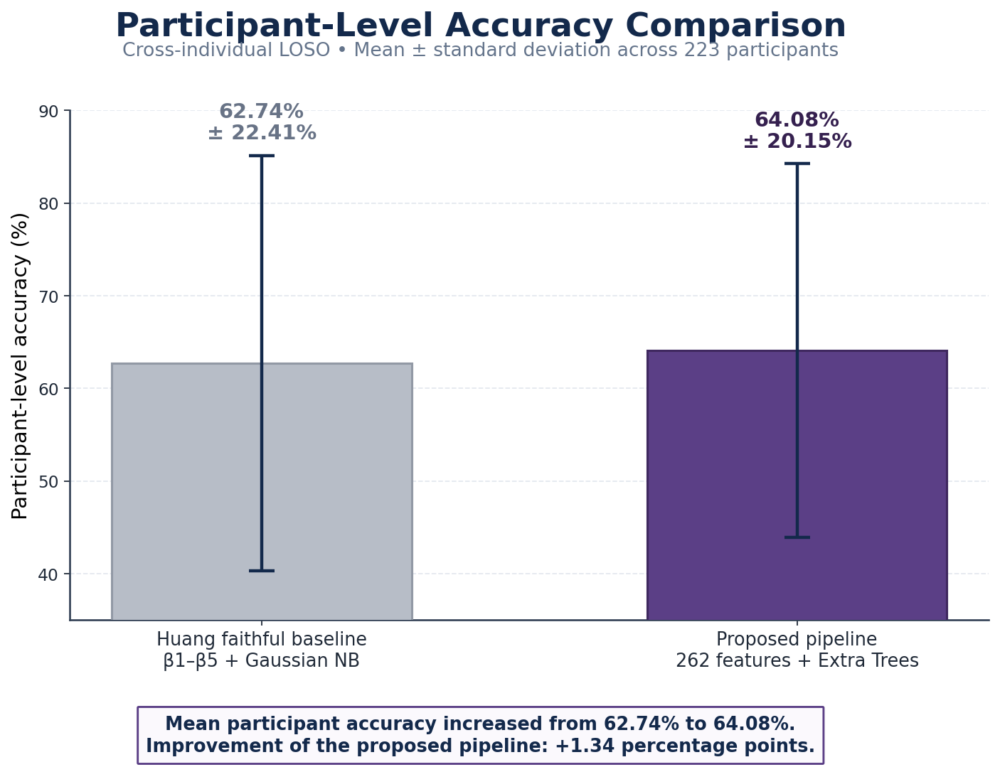

Saved to:
/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL/cross_fig2_participant_accuracy_silver_purple.png


In [ ]:
# ============================================================
# FIGURE 2
# PARTICIPANT-LEVEL ACCURACY — MEAN ± SD
# ============================================================

labels = [
    "Huang faithful baseline\nβ1–β5 + Gaussian NB",
    "Proposed pipeline\n262 features + Extra Trees"
]

means = np.array([
    62.74,
    64.08
])

sds = np.array([
    22.41,
    20.15
])

improvement = means[1] - means[0]

x = np.arange(2)

fig, ax = plt.subplots(
    figsize=(9.5, 7.0),
    facecolor="white"
)

ax.set_facecolor("white")

bars = ax.bar(
    x,
    means,
    width=0.56,
    color=[
        HUANG_COLOR,
        EXTRA_COLOR
    ],
    edgecolor=[
        HUANG_EDGE,
        EXTRA_EDGE
    ],
    linewidth=1.4,
    zorder=3
)

# ------------------------------------------------------------
# Error bars
# ------------------------------------------------------------

ax.errorbar(
    x,
    means,
    yerr=sds,
    fmt="none",
    ecolor=NAVY,
    elinewidth=2.0,
    capsize=8,
    capthick=2.0,
    zorder=4
)

# ------------------------------------------------------------
# Mean ± SD labels
# ------------------------------------------------------------

for i, (mean, sd) in enumerate(
    zip(means, sds)
):

    ax.text(
        i,
        mean + sd + 1.3,
        f"{mean:.2f}%\n± {sd:.2f}%",
        ha="center",
        va="bottom",
        fontsize=13,
        fontweight="bold",
        color=(
            HUANG_TEXT
            if i == 0
            else EXTRA_TEXT
        ),
        linespacing=1.1
    )

# ------------------------------------------------------------
# Title
# ------------------------------------------------------------

fig.suptitle(
    "Participant-Level Accuracy Comparison",
    fontsize=21,
    fontweight="bold",
    color=NAVY,
    y=0.965
)

fig.text(
    0.5,
    0.915,
    "Cross-individual LOSO • Mean ± standard deviation across 223 participants",
    ha="center",
    va="center",
    fontsize=12,
    color=SUBTITLE
)

# ------------------------------------------------------------
# Axes
# ------------------------------------------------------------

ax.set_ylabel(
    "Participant-level accuracy (%)",
    fontsize=13
)

ax.set_xticks(x)

ax.set_xticklabels(
    labels,
    fontsize=11.5
)

ax.set_ylim(
    35,
    90
)

ax.set_yticks(
    np.arange(
        40,
        91,
        10
    )
)

ax.grid(
    axis="y",
    linestyle="--",
    linewidth=0.8,
    color=GRID,
    alpha=0.8,
    zorder=0
)

ax.set_axisbelow(True)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# ------------------------------------------------------------
# Bottom statement — two lines
# ------------------------------------------------------------

footer = (
    f"Mean participant accuracy increased from {means[0]:.2f}% to {means[1]:.2f}%.\n"
    f"Improvement of the proposed pipeline: +{improvement:.2f} percentage points."
)

fig.text(
    0.5,
    0.055,
    footer,
    ha="center",
    va="center",
    multialignment="center",
    fontsize=11.5,
    fontweight="bold",
    color=NAVY,
    linespacing=1.25,
    bbox=dict(
        boxstyle="round,pad=0.45,rounding_size=0.05",
        facecolor="#FBF9FD",
        edgecolor=EXTRA_COLOR,
        linewidth=1.3
    )
)

plt.subplots_adjust(
    top=0.84,
    bottom=0.20,
    left=0.12,
    right=0.97
)

output_path = os.path.join(
    SAVE_DIR,
    "cross_fig2_participant_accuracy_silver_purple.png"
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved to:")
print(output_path)

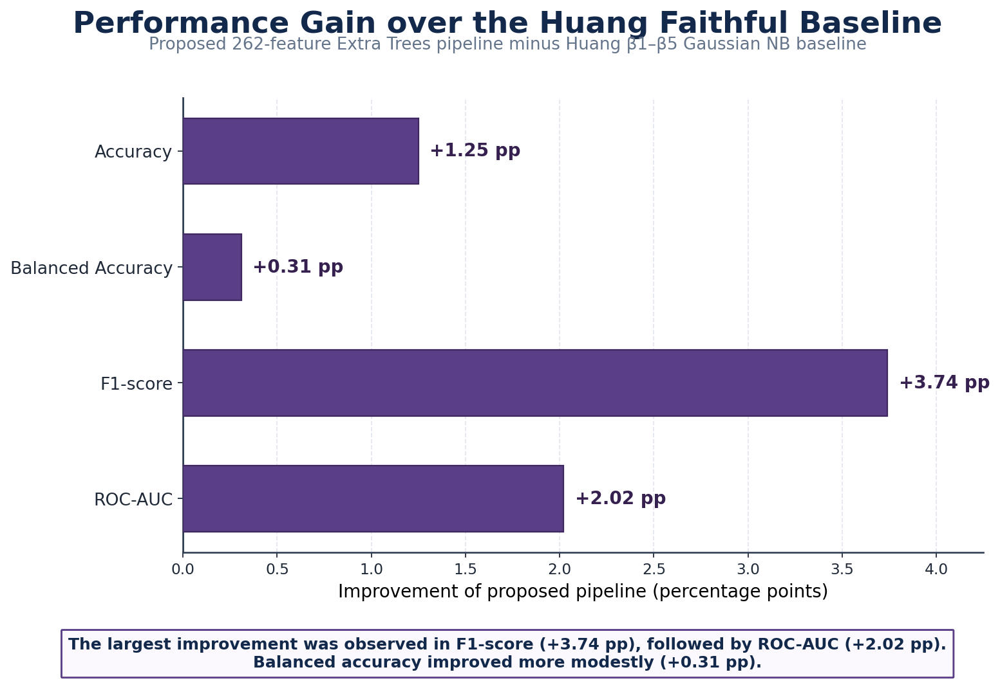

Saved to:
/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL/cross_fig3_gain_over_huang_darkpurple.png


In [ ]:
# ============================================================
# FIGURE 3
# PERFORMANCE GAIN OVER HUANG BASELINE
# ============================================================

metric_names = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC-AUC"
]

huang_values = np.array([
    62.77,
    64.08,
    62.20,
    66.78
])

extra_values = np.array([
    64.02,
    64.39,
    65.94,
    68.80
])

gains = (
    extra_values
    -
    huang_values
)

y = np.arange(
    len(metric_names)
)

fig, ax = plt.subplots(
    figsize=(10.5, 6.8),
    facecolor="white"
)

ax.set_facecolor("white")

# ------------------------------------------------------------
# Bars — all dark purple
# ------------------------------------------------------------

bars = ax.barh(
    y,
    gains,
    height=0.57,
    color=EXTRA_COLOR,
    edgecolor=EXTRA_EDGE,
    linewidth=1.0,
    zorder=3
)

# ------------------------------------------------------------
# Labels
# ------------------------------------------------------------

for bar, value in zip(
    bars,
    gains
):

    ax.text(
        value + 0.06,
        bar.get_y()
        +
        bar.get_height() / 2,
        f"+{value:.2f} pp",
        va="center",
        ha="left",
        fontsize=12.5,
        fontweight="bold",
        color=EXTRA_TEXT
    )

# ------------------------------------------------------------
# Y axis
# ------------------------------------------------------------

ax.set_yticks(y)

ax.set_yticklabels(
    metric_names,
    fontsize=12
)

ax.invert_yaxis()

# ------------------------------------------------------------
# X axis
# ------------------------------------------------------------

ax.set_xlabel(
    "Improvement of proposed pipeline (percentage points)",
    fontsize=12.5
)

ax.set_xlim(
    0,
    4.25
)

ax.set_xticks(
    np.arange(
        0,
        4.1,
        0.5
    )
)

# ------------------------------------------------------------
# Title
# ------------------------------------------------------------

fig.suptitle(
    "Performance Gain over the Huang Faithful Baseline",
    fontsize=21,
    fontweight="bold",
    color=NAVY,
    y=0.965
)

fig.text(
    0.5,
    0.915,
    "Proposed 262-feature Extra Trees pipeline minus Huang β1–β5 Gaussian NB baseline",
    ha="center",
    va="center",
    fontsize=11.8,
    color=SUBTITLE
)

# ------------------------------------------------------------
# Grid
# ------------------------------------------------------------

ax.grid(
    axis="x",
    linestyle="--",
    linewidth=0.8,
    color=GRID,
    alpha=0.8,
    zorder=0
)

ax.axvline(
    0,
    color=NAVY,
    linewidth=1.2
)

ax.set_axisbelow(True)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# ------------------------------------------------------------
# Bottom interpretation
# ------------------------------------------------------------

footer = (
    "The largest improvement was observed in F1-score (+3.74 pp), followed by ROC-AUC (+2.02 pp).\n"
    "Balanced accuracy improved more modestly (+0.31 pp)."
)

fig.text(
    0.5,
    0.045,
    footer,
    ha="center",
    va="center",
    multialignment="center",
    fontsize=11.2,
    fontweight="bold",
    color=NAVY,
    linespacing=1.25,
    bbox=dict(
        boxstyle="round,pad=0.43,rounding_size=0.05",
        facecolor="#FBF9FD",
        edgecolor=EXTRA_COLOR,
        linewidth=1.3
    )
)

plt.subplots_adjust(
    top=0.84,
    bottom=0.19,
    left=0.20,
    right=0.94
)

output_path = os.path.join(
    SAVE_DIR,
    "cross_fig3_gain_over_huang_darkpurple.png"
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved to:")
print(output_path)

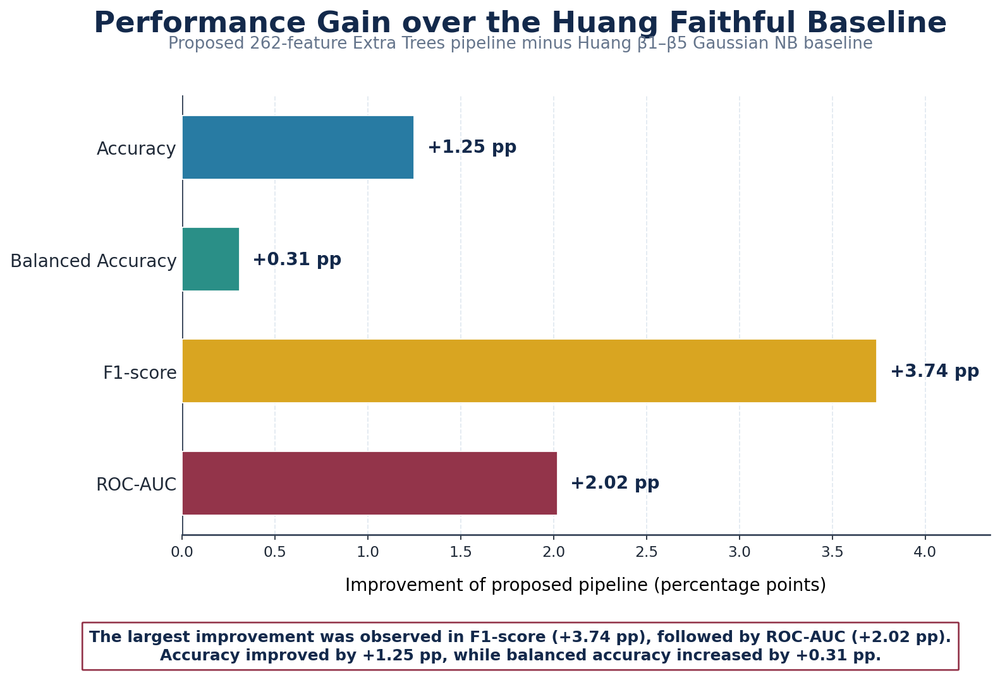

Saved to:
/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL/cross_fig3_gain_over_huang_multicolor.png

Performance gains:
Accuracy            : +1.25 pp
Balanced Accuracy   : +0.31 pp
F1-score            : +3.74 pp
ROC-AUC             : +2.02 pp


In [ ]:
# ============================================================
# FIGURE 3 — PERFORMANCE GAIN OVER HUANG FAITHFUL BASELINE
# Cross-Individual LOSO
# Different color for each metric
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Save directory
# ------------------------------------------------------------

SAVE_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL"
)

os.makedirs(
    SAVE_DIR,
    exist_ok=True
)

OUTPUT_PATH = os.path.join(
    SAVE_DIR,
    "cross_fig3_gain_over_huang_multicolor.png"
)


# ------------------------------------------------------------
# Results
# ------------------------------------------------------------

metric_names = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC-AUC"
]

huang_values = np.array([
    62.77,
    64.08,
    62.20,
    66.78
])

extra_values = np.array([
    64.02,
    64.39,
    65.94,
    68.80
])

gains = (
    extra_values
    -
    huang_values
)

# Exact gains:
# Accuracy          = +1.25 pp
# Balanced Accuracy = +0.31 pp
# F1-score          = +3.74 pp
# ROC-AUC           = +2.02 pp


# ------------------------------------------------------------
# Different premium colors
# ------------------------------------------------------------

BAR_COLORS = [
    "#287BA3",   # blue
    "#2A8F87",   # teal
    "#D9A521",   # gold
    "#93344A"    # burgundy
]

NAVY = "#13294B"
SUBTITLE = "#64748B"
GRID = "#DCE5EE"


# ------------------------------------------------------------
# Global style
# ------------------------------------------------------------

plt.rcParams.update({
    "figure.dpi": 160,
    "savefig.dpi": 300,
    "font.family": "DejaVu Sans",
    "font.size": 11,
    "axes.edgecolor": "#334155",
    "axes.linewidth": 1.2,
    "xtick.color": "#1F2937",
    "ytick.color": "#1F2937",
    "text.color": NAVY
})


# ------------------------------------------------------------
# Figure
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(10.8, 6.8),
    facecolor="white"
)

ax.set_facecolor(
    "white"
)

y = np.arange(
    len(metric_names)
)


# ------------------------------------------------------------
# Bars
# ------------------------------------------------------------

bars = ax.barh(
    y,
    gains,
    height=0.57,
    color=BAR_COLORS,
    edgecolor="white",
    linewidth=0.8,
    zorder=3
)


# ------------------------------------------------------------
# Gain labels
# ------------------------------------------------------------

for bar, gain in zip(
    bars,
    gains
):

    ax.text(
        gain + 0.07,

        bar.get_y()
        +
        bar.get_height() / 2,

        f"+{gain:.2f} pp",

        ha="left",
        va="center",

        fontsize=12.5,
        fontweight="bold",
        color=NAVY
    )


# ------------------------------------------------------------
# Y-axis
# ------------------------------------------------------------

ax.set_yticks(
    y
)

ax.set_yticklabels(
    metric_names,
    fontsize=12.5
)

ax.invert_yaxis()

ax.tick_params(
    axis="y",
    length=0
)


# ------------------------------------------------------------
# X-axis
# ------------------------------------------------------------

ax.set_xlabel(
    "Improvement of proposed pipeline (percentage points)",
    fontsize=12.5,
    labelpad=12
)

ax.set_xlim(
    0,
    4.35
)

ax.set_xticks(
    np.arange(
        0,
        4.1,
        0.5
    )
)


# ------------------------------------------------------------
# Zero reference
# ------------------------------------------------------------

ax.axvline(
    0,
    color="#334155",
    linewidth=1.2,
    zorder=2
)


# ------------------------------------------------------------
# Grid
# ------------------------------------------------------------

ax.grid(
    axis="x",
    linestyle="--",
    linewidth=0.8,
    color=GRID,
    alpha=0.85,
    zorder=0
)

ax.set_axisbelow(
    True
)


# ------------------------------------------------------------
# Clean spines
# ------------------------------------------------------------

ax.spines["top"].set_visible(
    False
)

ax.spines["right"].set_visible(
    False
)

ax.spines["left"].set_visible(
    False
)

ax.spines["bottom"].set_color(
    "#334155"
)


# ------------------------------------------------------------
# Main title
# ------------------------------------------------------------

fig.suptitle(
    "Performance Gain over the Huang Faithful Baseline",
    fontsize=21,
    fontweight="bold",
    color=NAVY,
    y=0.965
)


# ------------------------------------------------------------
# Subtitle
# ------------------------------------------------------------

fig.text(
    0.5,
    0.915,

    "Proposed 262-feature Extra Trees pipeline minus Huang β1–β5 Gaussian NB baseline",

    ha="center",
    va="center",

    fontsize=11.8,
    color=SUBTITLE
)


# ------------------------------------------------------------
# Bottom interpretation — two lines
# ------------------------------------------------------------

footer_text = (
    "The largest improvement was observed in F1-score (+3.74 pp), "
    "followed by ROC-AUC (+2.02 pp).\n"
    "Accuracy improved by +1.25 pp, while balanced accuracy increased by +0.31 pp."
)


fig.text(
    0.5,
    0.038,

    footer_text,

    ha="center",
    va="center",
    multialignment="center",

    fontsize=11.2,
    fontweight="bold",
    color=NAVY,

    linespacing=1.25,

    bbox=dict(
        boxstyle="round,pad=0.45,rounding_size=0.05",
        facecolor="white",
        edgecolor="#93344A",
        linewidth=1.2
    )
)


# ------------------------------------------------------------
# Layout
# ------------------------------------------------------------

plt.subplots_adjust(
    top=0.84,
    bottom=0.20,
    left=0.19,
    right=0.93
)


# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

plt.savefig(
    OUTPUT_PATH,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()


print("Saved to:")
print(OUTPUT_PATH)


print("\nPerformance gains:")

for metric, gain in zip(
    metric_names,
    gains
):
    print(
        f"{metric:<20}: +{gain:.2f} pp"
    )

In [ ]:
# ============================================================
# FIGURE 4
# CROSS-INDIVIDUAL CONFUSION-MATRIX COMPARISON
# ============================================================

# Huang
cm_huang = np.array([
    [2017, 708],
    [1628, 1922]
])

# Extra Trees
cm_extra = np.array([
    [1831, 894],
    [1364, 2186]
])

# Row-normalized percentages
huang_pct = (
    cm_huang
    /
    cm_huang.sum(
        axis=1,
        keepdims=True
    )
    * 100
)

extra_pct = (
    cm_extra
    /
    cm_extra.sum(
        axis=1,
        keepdims=True
    )
    * 100
)

# ------------------------------------------------------------
# Custom maps
# ------------------------------------------------------------

silver_cmap = LinearSegmentedColormap.from_list(
    "premium_silver",
    [
        "#FAFBFC",
        "#E5E8EC",
        "#C8CDD4",
        "#A5ADB8",
        "#737D8B"
    ]
)

purple_cmap = LinearSegmentedColormap.from_list(
    "premium_purple",
    [
        "#F9F6FC",
        "#E2D9ED",
        "#BFAED2",
        "#8C72AB",
        "#5B3F86",
        "#382452"
    ]
)

# ------------------------------------------------------------
# Figure
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    2,
    figsize=(13.2, 6.4),
    facecolor="white"
)

fig.patch.set_facecolor("white")

datasets = [
    (
        axes[0],
        cm_huang,
        huang_pct,
        silver_cmap,
        "Huang Faithful Baseline\nβ1–β5 + Gaussian NB",
        "A"
    ),
    (
        axes[1],
        cm_extra,
        extra_pct,
        purple_cmap,
        "Proposed Pipeline\n262 Features + Extra Trees",
        "B"
    )
]

for (
    ax,
    cm,
    pct_matrix,
    cmap,
    title,
    panel
) in datasets:

    ax.set_facecolor("white")

    image = ax.imshow(
        pct_matrix,
        cmap=cmap,
        vmin=0,
        vmax=100
    )

    ax.set_xticks([
        0,
        1
    ])

    ax.set_yticks([
        0,
        1
    ])

    ax.set_xticklabels(
        [
            "Low pain\nNRS 0–4",
            "High pain\nNRS 5–10"
        ],
        fontsize=10.8
    )

    ax.set_yticklabels(
        [
            "Low pain\nNRS 0–4",
            "High pain\nNRS 5–10"
        ],
        fontsize=10.8
    )

    ax.set_xlabel(
        "Predicted class",
        fontsize=11.5
    )

    ax.set_ylabel(
        "Actual class",
        fontsize=11.5
    )

    ax.set_title(
        title,
        fontsize=15,
        fontweight="bold",
        color=NAVY,
        pad=14
    )

    # Panel label
    ax.text(
        -0.13,
        1.05,
        panel,
        transform=ax.transAxes,
        fontsize=15,
        fontweight="bold",
        color=NAVY
    )

    # --------------------------------------------------------
    # Cell annotations
    # --------------------------------------------------------

    for i in range(2):

        for j in range(2):

            percentage = (
                pct_matrix[i, j]
            )

            count = (
                cm[i, j]
            )

            text_color = (
                "white"
                if percentage >= 58
                else NAVY
            )

            ax.text(
                j,
                i - 0.07,
                f"{count:,}",
                ha="center",
                va="center",
                fontsize=18,
                fontweight="bold",
                color=text_color
            )

            ax.text(
                j,
                i + 0.20,
                f"{percentage:.2f}%",
                ha="center",
                va="center",
                fontsize=11.2,
                color=text_color
            )

    ax.tick_params(
        length=0
    )

    for spine in ax.spines.values():
        spine.set_visible(False)

# ------------------------------------------------------------
# Title
# ------------------------------------------------------------

fig.suptitle(
    "Confusion-Matrix Comparison",
    fontsize=21,
    fontweight="bold",
    color=NAVY,
    y=0.985
)

fig.text(
    0.5,
    0.93,
    "Cross-individual LOSO • 223 participants • 6,275 held-out trials",
    ha="center",
    va="center",
    fontsize=11.8,
    color=SUBTITLE
)

# ------------------------------------------------------------
# Shared colorbar
# ------------------------------------------------------------

cbar = fig.colorbar(
    image,
    ax=axes.ravel().tolist(),
    fraction=0.025,
    pad=0.045
)

cbar.set_label(
    "Percentage within actual class",
    rotation=270,
    labelpad=18,
    fontsize=11
)

cbar.ax.yaxis.set_major_formatter(
    FuncFormatter(
        lambda value, position:
        f"{value:.0f}%"
    )
)

# ------------------------------------------------------------
# Bottom summary
# ------------------------------------------------------------

footer = (
    "Extra Trees increased high-pain sensitivity from 54.14% to 61.58%, reducing false negatives from 1,628 to 1,364.\n"
    "The Huang baseline retained higher low-pain specificity: 74.02% versus 67.19%."
)

fig.text(
    0.5,
    0.035,
    footer,
    ha="center",
    va="center",
    multialignment="center",
    fontsize=10.8,
    fontweight="bold",
    color=NAVY,
    linespacing=1.25,
    bbox=dict(
        boxstyle="round,pad=0.43,rounding_size=0.05",
        facecolor="#FBF9FD",
        edgecolor=EXTRA_COLOR,
        linewidth=1.2
    )
)

plt.subplots_adjust(
    top=0.84,
    bottom=0.16,
    left=0.08,
    right=0.91,
    wspace=0.28
)

output_path = os.path.join(
    SAVE_DIR,
    "cross_fig4_confusion_matrix_silver_purple.png"
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved to:")
print(output_path)

In [ ]:
# ============================================================
# COMMON STYLE — RUN ONCE
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import FuncFormatter

SAVE_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL"
)

os.makedirs(SAVE_DIR, exist_ok=True)

# ------------------------------------------------------------
# Premium palette
# ------------------------------------------------------------

# Huang baseline
HUANG_COLOR = "#B7BDC7"
HUANG_EDGE = "#9299A5"
HUANG_TEXT = "#687386"

# Proposed Extra Trees
EXTRA_COLOR = "#5B3F86"
EXTRA_EDGE = "#3F285F"
EXTRA_LIGHT = "#EEE8F5"
EXTRA_TEXT = "#35204F"

NAVY = "#13294B"
SUBTITLE = "#64748B"
GRID = "#DCE2EA"
WHITE = "#FFFFFF"

plt.rcParams.update({
    "figure.dpi": 160,
    "savefig.dpi": 300,
    "font.family": "DejaVu Sans",
    "font.size": 11,
    "axes.edgecolor": "#334155",
    "axes.linewidth": 1.2,
    "xtick.color": "#1F2937",
    "ytick.color": "#1F2937",
    "text.color": NAVY
})

print("Common cross-individual comparison style loaded.")

Common cross-individual comparison style loaded.


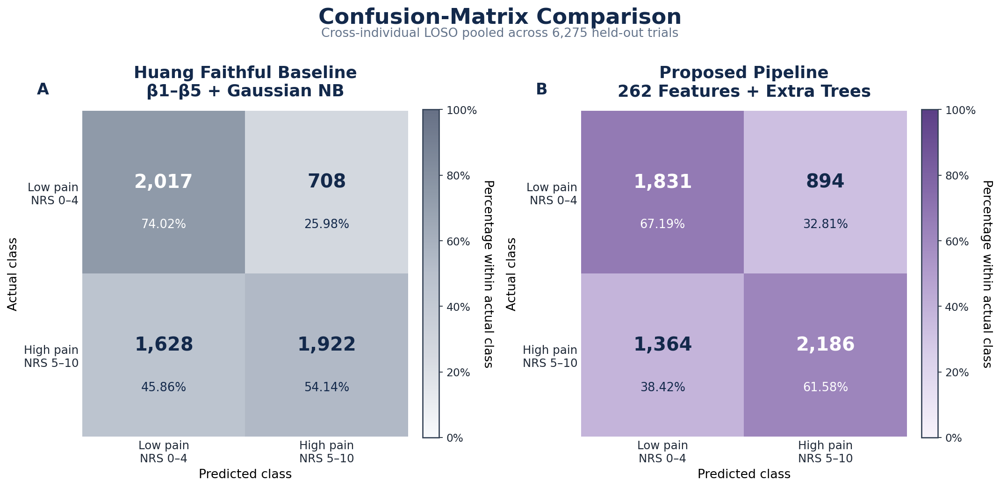

Saved to: /content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL/cross_confusion_matrix_comparison_silver_purple.png


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import FuncFormatter

# ============================================================
# SAVE DIRECTORY
# ============================================================
SAVE_DIR = "/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL"
os.makedirs(SAVE_DIR, exist_ok=True)

# ============================================================
# CONFUSION MATRICES
# ============================================================

# Huang faithful reimplemented baseline
cm_huang = np.array([
    [2017, 708],
    [1628, 1922]
])

# Proposed pipeline: Extra Trees
cm_extra = np.array([
    [1831, 894],
    [1364, 2186]
])

# Row-wise percentages
cm_huang_pct = cm_huang / cm_huang.sum(axis=1, keepdims=True) * 100
cm_extra_pct = cm_extra / cm_extra.sum(axis=1, keepdims=True) * 100

# ============================================================
# CUSTOM COLORMAPS
# ============================================================

# Huang = silver / gray theme
silver_cmap = LinearSegmentedColormap.from_list(
    "silver_cmap",
    ["#F8FAFC", "#D5D9E0", "#B8C0CC", "#8E99A8", "#667085"]
)

# Extra Trees = dark purple theme
purple_cmap = LinearSegmentedColormap.from_list(
    "purple_cmap",
    ["#F7F3FB", "#D9CFEA", "#B29DCD", "#866BAA", "#5B3F86"]
)

# ============================================================
# STYLE
# ============================================================
plt.rcParams.update({
    "figure.dpi": 160,
    "savefig.dpi": 300,
    "font.family": "DejaVu Sans",
    "font.size": 11,
    "axes.titlesize": 20,
    "axes.labelsize": 12,
    "axes.edgecolor": "#334155",
    "axes.linewidth": 1.2,
    "xtick.color": "#1f2937",
    "ytick.color": "#1f2937",
    "text.color": "#0f172a"
})

NAVY = "#13294B"
SUBTITLE = "#64748B"

# ============================================================
# FIGURE
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(13.5, 6.4), facecolor="white")
fig.patch.set_facecolor("white")

plot_items = [
    (
        axes[0],
        cm_huang,
        cm_huang_pct,
        silver_cmap,
        "Huang Faithful Baseline\nβ1–β5 + Gaussian NB",
        "A"
    ),
    (
        axes[1],
        cm_extra,
        cm_extra_pct,
        purple_cmap,
        "Proposed Pipeline\n262 Features + Extra Trees",
        "B"
    )
]

for ax, cm, cm_pct, cmap, title, panel_label in plot_items:
    ax.set_facecolor("white")
    im = ax.imshow(cm_pct, cmap=cmap, vmin=0, vmax=100)

    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])

    ax.set_xticklabels(["Low pain\nNRS 0–4", "High pain\nNRS 5–10"], fontsize=11)
    ax.set_yticklabels(["Low pain\nNRS 0–4", "High pain\nNRS 5–10"], fontsize=11)

    ax.set_xlabel("Predicted class", fontsize=12)
    ax.set_ylabel("Actual class", fontsize=12)
    ax.set_title(title, fontsize=16, fontweight="bold", color=NAVY, pad=14)

    # Panel label
    ax.text(
        -0.14, 1.05, panel_label,
        transform=ax.transAxes,
        fontsize=15, fontweight="bold", color=NAVY
    )

    # Write count + percentage inside each cell
    for i in range(2):
        for j in range(2):
            pct_val = cm_pct[i, j]
            count_val = cm[i, j]

            text_color = "white" if pct_val >= 55 else NAVY

            ax.text(
                j, i - 0.06,
                f"{count_val:,}",
                ha="center", va="center",
                fontsize=18, fontweight="bold", color=text_color
            )
            ax.text(
                j, i + 0.20,
                f"{pct_val:.2f}%",
                ha="center", va="center",
                fontsize=11.5, color=text_color
            )

    # Clean look
    ax.tick_params(length=0)
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Separate colorbar for each subplot
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.yaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.0f}%"))
    cbar.set_label("Percentage within actual class", rotation=270, labelpad=16)

# Main title and subtitle
fig.suptitle(
    "Confusion-Matrix Comparison",
    fontsize=21, fontweight="bold", color=NAVY, y=0.98
)

fig.text(
    0.5, 0.925,
    "Cross-individual LOSO pooled across 6,275 held-out trials",
    ha="center", va="center",
    fontsize=12, color=SUBTITLE
)

plt.tight_layout(rect=[0, 0, 1, 0.92])

out_path = os.path.join(SAVE_DIR, "cross_confusion_matrix_comparison_silver_purple.png")
plt.savefig(out_path, bbox_inches="tight", facecolor="white")
plt.show()

print("Saved to:", out_path)

STRICT CROSS-INDIVIDUAL RESULT FILES LOADED
Trial predictions: (6275, 5)
Pooled summary: (1, 20)

Trial columns:
['original_row_index', 'test_subject', 'y_true', 'y_pred', 'y_score']

Detected columns:
True label: y_true
Prediction: y_pred
Probability: y_score
Participant: test_subject

Validation passed.
Participants: 223
Trials: 6275
Low pain: 2725
High pain: 3550

Observed pooled metrics:
Accuracy: 64.02%
Balanced Accuracy: 64.39%
F1-score: 65.94%
ROC-AUC: 68.80%


,Metric,Observed,CI Lower,CI Upper,Observed (%),CI Lower (%),CI Upper (%)
0,Accuracy,0.64,0.61,0.67,64.02,61.39,66.73
1,Balanced Accuracy,0.64,0.62,0.67,64.39,61.81,66.99
2,F1-score,0.66,0.63,0.69,65.94,62.88,69.05
3,ROC-AUC,0.69,0.66,0.72,68.80,65.52,72.04


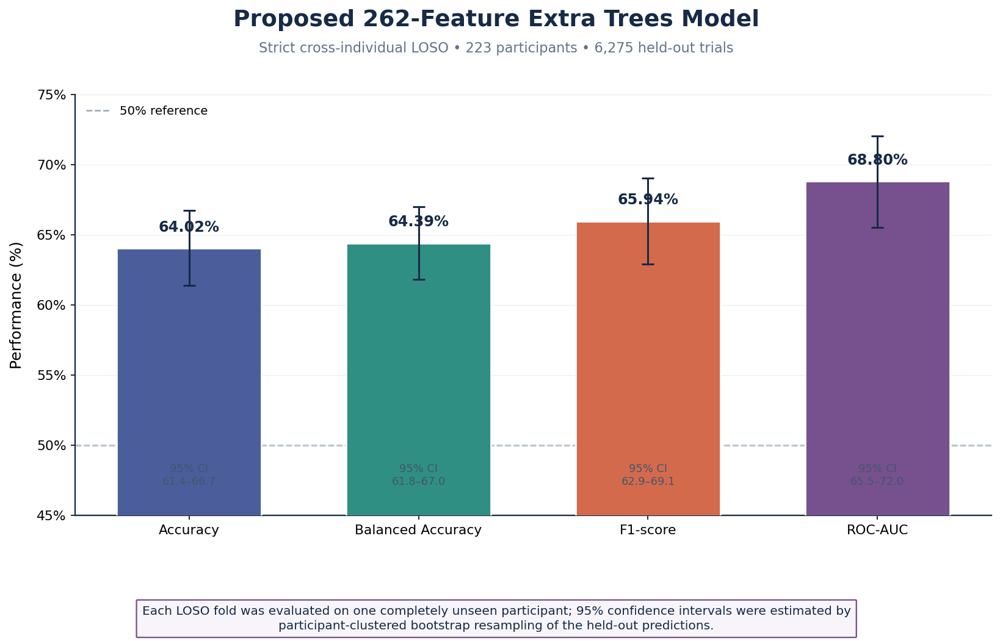

CROSS-INDIVIDUAL PREMIUM FIGURE GENERATED

Accuracy: 64.02%
Balanced Accuracy: 64.39%
F1-score: 65.94%
ROC-AUC: 68.80%

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_Individual_ExtraTrees_Main_Performance_Premium.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_Individual_ExtraTrees_Main_Performance_Premium.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_Individual_ExtraTrees_Main_Performance_Premium.svg


In [ ]:
# ============================================================
# PREMIUM CROSS-INDIVIDUAL MAIN PERFORMANCE FIGURE
#
# V8 proposed pipeline:
#   262 handcrafted features + Extra Trees
#
# Evaluation:
#   Strict-inductive cross-individual LOSO
#   223 participants
#   6,275 held-out trials
#
# Figure style intentionally mirrors the WITHIN-individual
# performance figure, but uses a distinct cross-individual
# colour palette.
#
# 95% CIs:
#   Participant-clustered bootstrap resampling
# ============================================================


# ============================================================
# 1. IMPORTS
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib.ticker import PercentFormatter

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    f1_score,
    roc_auc_score,
)


# ============================================================
# 2. PATHS
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

RESULT_DIR = os.path.join(
    V8_DIR,
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO"
)

EXPERIMENT_NAME = (
    "ExtraTrees__StrictInductive_A__"
    "X_handcrafted_NoFeatureScaler"
)


TRIAL_PATH = os.path.join(
    RESULT_DIR,
    (
        f"{EXPERIMENT_NAME}"
        "__trial_predictions.csv"
    )
)

SUMMARY_PATH = os.path.join(
    RESULT_DIR,
    (
        f"{EXPERIMENT_NAME}"
        "__pooled_summary.csv"
    )
)


FIGURE_DIR = os.path.join(
    RESULT_DIR,
    "PREMIUM_PUBLICATION_FIGURES"
)

os.makedirs(
    FIGURE_DIR,
    exist_ok=True
)


for path in [
    TRIAL_PATH,
    SUMMARY_PATH,
]:

    if not os.path.exists(path):

        raise FileNotFoundError(
            f"Required file not found:\n{path}"
        )


# ============================================================
# 3. LOAD DATA
# ============================================================

trial_df = pd.read_csv(
    TRIAL_PATH
)

summary_df = pd.read_csv(
    SUMMARY_PATH
)


print("=" * 80)
print("STRICT CROSS-INDIVIDUAL RESULT FILES LOADED")
print("=" * 80)

print(
    "Trial predictions:",
    trial_df.shape
)

print(
    "Pooled summary:",
    summary_df.shape
)

print("\nTrial columns:")
print(
    trial_df.columns.tolist()
)


# ============================================================
# 4. ROBUST COLUMN DETECTION
# ============================================================

def find_column(
    dataframe,
    candidates,
    description,
):

    # exact match first
    for candidate in candidates:

        if candidate in dataframe.columns:
            return candidate


    # case-insensitive exact match
    lower_map = {
        str(column).lower(): column
        for column
        in dataframe.columns
    }

    for candidate in candidates:

        if candidate.lower() in lower_map:

            return lower_map[
                candidate.lower()
            ]


    # substring match last
    for column in dataframe.columns:

        column_lower = str(
            column
        ).lower()

        for candidate in candidates:

            if candidate.lower() in column_lower:

                return column


    raise KeyError(
        f"\nCould not detect {description}.\n"
        f"Available columns:\n"
        f"{dataframe.columns.tolist()}"
    )


Y_TRUE_COL = find_column(
    trial_df,

    [
        "y_true",
        "true_label",
        "actual_label",
        "ground_truth",
        "target",
    ],

    "true-label column",
)


Y_PRED_COL = find_column(
    trial_df,

    [
        "y_pred",
        "predicted_label",
        "pred_label",
        "prediction",
    ],

    "predicted-label column",
)


SUBJECT_COL = find_column(
    trial_df,

    [
        "subject_id",
        "participant_id",
        "test_subject",
        "subject",
        "participant",
    ],

    "subject-ID column",
)


# Probability column
Y_SCORE_COL = find_column(
    trial_df,

    [
        "y_score",
        "y_prob",
        "prob_high",
        "probability_high",
        "positive_probability",
        "prob_positive",
        "prob_1",
        "proba_1",
        "class_1_probability",
    ],

    "positive-class probability column",
)


print("\nDetected columns:")
print(
    "True label:",
    Y_TRUE_COL
)

print(
    "Prediction:",
    Y_PRED_COL
)

print(
    "Probability:",
    Y_SCORE_COL
)

print(
    "Participant:",
    SUBJECT_COL
)


# ============================================================
# 5. PREPARE ARRAYS
# ============================================================

y_true = trial_df[
    Y_TRUE_COL
].to_numpy(
    dtype=int
)

y_pred = trial_df[
    Y_PRED_COL
].to_numpy(
    dtype=int
)

y_score = trial_df[
    Y_SCORE_COL
].to_numpy(
    dtype=float
)

trial_subjects = trial_df[
    SUBJECT_COL
].astype(str).to_numpy()


# ============================================================
# 6. VALIDATE EXPECTED STRICT LOSO DATA
# ============================================================

assert len(
    y_true
) == 6275, (
    f"Expected 6275 trials, found {len(y_true)}"
)

assert len(
    np.unique(
        trial_subjects
    )
) == 223, (
    "Expected 223 held-out participants."
)


class_counts = np.bincount(
    y_true,
    minlength=2
)

assert np.array_equal(
    class_counts,
    np.array(
        [
            2725,
            3550
        ]
    )
), (
    f"Unexpected class counts: {class_counts}"
)


print("\nValidation passed.")

print(
    "Participants:",
    len(
        np.unique(
            trial_subjects
        )
    )
)

print(
    "Trials:",
    len(
        y_true
    )
)

print(
    "Low pain:",
    class_counts[0]
)

print(
    "High pain:",
    class_counts[1]
)


# ============================================================
# 7. CALCULATE OBSERVED POOLED METRICS
# ============================================================

def calculate_metrics(
    truth,
    prediction,
    scores,
):

    return {
        "Accuracy":
            accuracy_score(
                truth,
                prediction
            ),

        "Balanced Accuracy":
            balanced_accuracy_score(
                truth,
                prediction
            ),

        "F1-score":
            f1_score(
                truth,
                prediction,
                zero_division=0
            ),

        "ROC-AUC":
            roc_auc_score(
                truth,
                scores
            ),
    }


observed_metrics = calculate_metrics(
    y_true,
    y_pred,
    y_score
)


print("\nObserved pooled metrics:")

for key, value in (
    observed_metrics.items()
):

    print(
        f"{key}: "
        f"{value * 100:.2f}%"
    )


# ============================================================
# 8. PARTICIPANT-CLUSTERED BOOTSTRAP 95% CI
#
# This is preferable to resampling individual trials because
# the 6,275 trials are clustered within 223 participants.
#
# Each bootstrap iteration therefore resamples PARTICIPANTS,
# and brings all trials belonging to each sampled participant.
# ============================================================

subject_to_indices = {

    subject_id:
        np.flatnonzero(
            trial_subjects
            ==
            subject_id
        )

    for subject_id
    in np.unique(
        trial_subjects
    )
}


unique_subjects = np.array(
    list(
        subject_to_indices.keys()
    ),
    dtype=str
)


N_BOOTSTRAPS = 2000
RANDOM_STATE = 42


rng = np.random.default_rng(
    RANDOM_STATE
)


bootstrap_results = {

    metric_name: []

    for metric_name
    in observed_metrics
}


for bootstrap_number in range(
    N_BOOTSTRAPS
):

    sampled_subjects = rng.choice(
        unique_subjects,

        size=len(
            unique_subjects
        ),

        replace=True,
    )


    sampled_indices = np.concatenate(
        [
            subject_to_indices[
                subject
            ]

            for subject
            in sampled_subjects
        ]
    )


    bootstrap_truth = y_true[
        sampled_indices
    ]

    bootstrap_prediction = y_pred[
        sampled_indices
    ]

    bootstrap_scores = y_score[
        sampled_indices
    ]


    # ROC-AUC needs both classes
    if np.unique(
        bootstrap_truth
    ).size < 2:

        continue


    bootstrap_metrics = calculate_metrics(
        bootstrap_truth,
        bootstrap_prediction,
        bootstrap_scores
    )


    for metric_name, value in (
        bootstrap_metrics.items()
    ):

        bootstrap_results[
            metric_name
        ].append(
            value
        )


# ============================================================
# 9. CREATE CI TABLE
# ============================================================

ci_rows = []


for metric_name in observed_metrics:

    bootstrap_values = np.asarray(
        bootstrap_results[
            metric_name
        ],
        dtype=float
    )


    ci_rows.append(
        {
            "Metric":
                metric_name,

            "Observed":
                observed_metrics[
                    metric_name
                ],

            "CI Lower":
                np.percentile(
                    bootstrap_values,
                    2.5
                ),

            "CI Upper":
                np.percentile(
                    bootstrap_values,
                    97.5
                ),
        }
    )


ci_df = pd.DataFrame(
    ci_rows
)


display(
    ci_df.assign(
        **{
            "Observed (%)":
                ci_df[
                    "Observed"
                ]
                *
                100,

            "CI Lower (%)":
                ci_df[
                    "CI Lower"
                ]
                *
                100,

            "CI Upper (%)":
                ci_df[
                    "CI Upper"
                ]
                *
                100,
        }
    ).round(
        2
    )
)


CI_CSV_PATH = os.path.join(
    FIGURE_DIR,
    (
        "Cross_Individual_ExtraTrees_"
        "ParticipantClustered_95CI.csv"
    )
)

ci_df.to_csv(
    CI_CSV_PATH,
    index=False
)


# ============================================================
# 10. CROSS-INDIVIDUAL PREMIUM COLOUR PALETTE
#
# Deliberately different from within-individual figure.
#
# Accuracy          = Indigo
# Balanced Accuracy = Forest teal
# F1-score          = Terracotta
# ROC-AUC           = Royal purple
# ============================================================

NAVY = "#172A46"

CROSS_INDIGO = "#4B5D9A"
CROSS_TEAL = "#2F8F83"
CROSS_CORAL = "#D46A4C"
CROSS_PURPLE = "#76518D"

CROSS_COLORS = [
    CROSS_INDIGO,
    CROSS_TEAL,
    CROSS_CORAL,
    CROSS_PURPLE,
]


SLATE = "#62748A"
GRID = "#DDE5EC"
WHITE = "#FFFFFF"

CI_TEXT = "#43566D"
REFERENCE_LINE = "#8B99A9"


# ============================================================
# 11. PUBLICATION FONT SETTINGS
# ============================================================

plt.rcParams.update(
    {
        "figure.facecolor":
            WHITE,

        "axes.facecolor":
            WHITE,

        "savefig.facecolor":
            WHITE,

        "font.family":
            "DejaVu Sans",

        "font.size":
            11,

        "axes.labelsize":
            12,

        "axes.labelweight":
            "medium",

        "xtick.labelsize":
            10.5,

        "ytick.labelsize":
            10.5,

        "axes.edgecolor":
            NAVY,

        "axes.linewidth":
            1.1,

        "pdf.fonttype":
            42,

        "ps.fonttype":
            42,
    }
)


# ============================================================
# 12. PREPARE PLOT VALUES
# ============================================================

METRIC_ORDER = [
    "Accuracy",
    "Balanced Accuracy",
    "F1-score",
    "ROC-AUC",
]


plot_df = (
    ci_df
    .set_index(
        "Metric"
    )
    .loc[
        METRIC_ORDER
    ]
    .reset_index()
)


values = (
    plot_df[
        "Observed"
    ].to_numpy()
    *
    100
)


ci_lower = (
    plot_df[
        "CI Lower"
    ].to_numpy()
    *
    100
)


ci_upper = (
    plot_df[
        "CI Upper"
    ].to_numpy()
    *
    100
)


lower_errors = (
    values
    -
    ci_lower
)

upper_errors = (
    ci_upper
    -
    values
)


# ============================================================
# 13. CREATE MAIN PREMIUM FIGURE
# ============================================================

figure, axis = plt.subplots(
    figsize=(
        11.5,
        7.3
    ),
    facecolor=WHITE,
)


x_positions = np.arange(
    len(
        METRIC_ORDER
    )
)


bars = axis.bar(
    x_positions,
    values,

    width=0.63,

    color=CROSS_COLORS,

    edgecolor=WHITE,
    linewidth=1.3,

    zorder=3,
)


# ============================================================
# 14. 95% CI ERROR BARS
# ============================================================

axis.errorbar(
    x_positions,
    values,

    yerr=np.vstack(
        [
            lower_errors,
            upper_errors,
        ]
    ),

    fmt="none",

    ecolor=NAVY,

    elinewidth=1.45,

    capsize=5,
    capthick=1.45,

    zorder=5,
)


# ============================================================
# 15. 50% REFERENCE LINE
#
# Called "50% reference", NOT universal chance level,
# because chance interpretation differs by metric.
# ============================================================

axis.axhline(
    50,

    linestyle="--",

    linewidth=1.25,

    color=REFERENCE_LINE,

    alpha=0.85,

    label="50% reference",

    zorder=1,
)


# ============================================================
# 16. VALUE LABELS ABOVE BARS
# ============================================================

for bar, value in zip(
    bars,
    values
):

    axis.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        value + 1.0,

        f"{value:.2f}%",

        ha="center",
        va="bottom",

        fontsize=11.5,
        fontweight="bold",

        color=NAVY,

        zorder=7,
    )


# ============================================================
# 17. 95% CI TEXT INSIDE LOWER PART OF EACH BAR
# ============================================================

for (
    bar,
    lower,
    upper
) in zip(
    bars,
    ci_lower,
    ci_upper
):

    axis.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        47.0,

        (
            "95% CI\n"
            f"{lower:.1f}–{upper:.1f}"
        ),

        ha="center",
        va="bottom",

        fontsize=8.6,
        fontweight="medium",

        color=CI_TEXT,

        linespacing=1.2,

        zorder=6,
    )


# ============================================================
# 18. AXIS FORMATTING
# ============================================================

axis.set_xticks(
    x_positions,
    labels=METRIC_ORDER,
)


axis.set_ylim(
    45,
    75
)


axis.set_ylabel(
    "Performance (%)",
    labelpad=10,
)


axis.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100,
        decimals=0
    )
)


axis.grid(
    axis="y",

    linestyle="-",

    linewidth=0.55,

    color=GRID,

    alpha=0.65,

    zorder=0,
)


axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)


# ============================================================
# 19. TITLE
# ============================================================

figure.suptitle(
    "Proposed 262-Feature Extra Trees Model",

    x=0.5,
    y=0.968,

    ha="center",
    va="top",

    fontsize=18,
    fontweight="bold",

    color=NAVY,
)


# ============================================================
# 20. CROSS-INDIVIDUAL SUBTITLE
# ============================================================

figure.text(
    0.5,
    0.920,

    (
        "Strict cross-individual LOSO • "
        "223 participants • "
        "6,275 held-out trials"
    ),

    ha="center",
    va="top",

    fontsize=10.8,

    color=SLATE,
)


# ============================================================
# 21. LEGEND
# ============================================================

axis.legend(
    loc="upper left",

    frameon=False,

    fontsize=9.5,
)


# ============================================================
# 22. SMALL CROSS-INDIVIDUAL NOTE
# ============================================================

figure.text(
    0.5,
    0.055,

    (
        "Each LOSO fold was evaluated on one completely unseen participant; "
        "95% confidence intervals were estimated by\n"
        "participant-clustered bootstrap resampling of the held-out predictions."
    ),

    ha="center",
    va="center",

    fontsize=9.7,

    color=NAVY,

    linespacing=1.35,

    bbox={
        "boxstyle":
            "round,pad=0.45,"
            "rounding_size=0.07",

        "facecolor":
            "#F7F5FA",

        "edgecolor":
            CROSS_PURPLE,

        "linewidth":
            1.1,
    },
)


# ============================================================
# 23. FINAL SPACING
# ============================================================

figure.subplots_adjust(
    left=0.10,
    right=0.97,
    top=0.84,
    bottom=0.21,
)


# ============================================================
# 24. SAVE PNG / PDF / SVG
# ============================================================

BASE_NAME = (
    "Figure_Cross_Individual_"
    "ExtraTrees_Main_Performance_Premium"
)


PNG_PATH = os.path.join(
    FIGURE_DIR,
    BASE_NAME
    +
    ".png"
)

PDF_PATH = os.path.join(
    FIGURE_DIR,
    BASE_NAME
    +
    ".pdf"
)

SVG_PATH = os.path.join(
    FIGURE_DIR,
    BASE_NAME
    +
    ".svg"
)


figure.savefig(
    PNG_PATH,

    dpi=600,

    bbox_inches="tight",

    pad_inches=0.16,
)


figure.savefig(
    PDF_PATH,

    bbox_inches="tight",

    pad_inches=0.16,
)


figure.savefig(
    SVG_PATH,

    bbox_inches="tight",

    pad_inches=0.16,
)


plt.show()


# ============================================================
# 25. PRINT RESULT
# ============================================================

print("=" * 80)
print("CROSS-INDIVIDUAL PREMIUM FIGURE GENERATED")
print("=" * 80)

print(
    f"\nAccuracy: "
    f"{observed_metrics['Accuracy'] * 100:.2f}%"
)

print(
    f"Balanced Accuracy: "
    f"{observed_metrics['Balanced Accuracy'] * 100:.2f}%"
)

print(
    f"F1-score: "
    f"{observed_metrics['F1-score'] * 100:.2f}%"
)

print(
    f"ROC-AUC: "
    f"{observed_metrics['ROC-AUC'] * 100:.2f}%"
)

print("\nSaved:")
print(PNG_PATH)
print(PDF_PATH)
print(SVG_PATH)

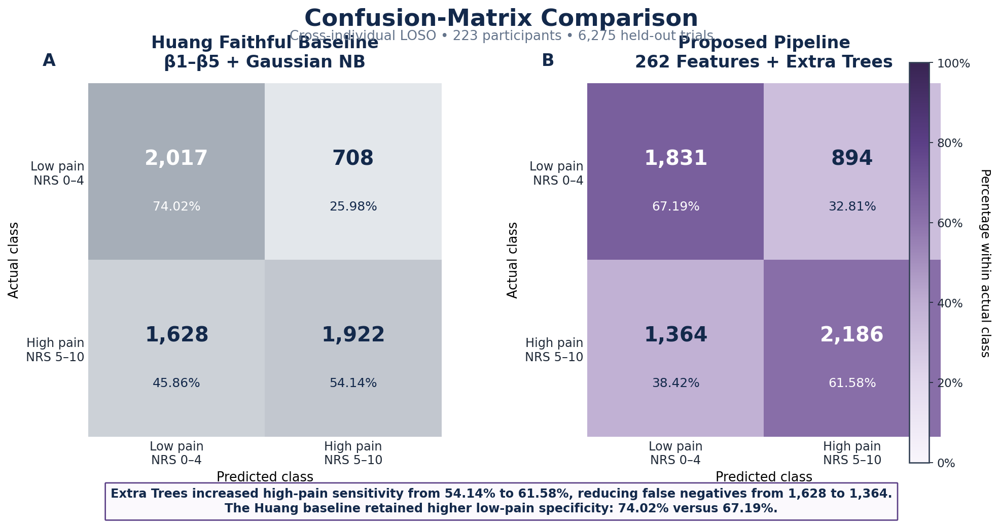

Saved to:
/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL/cross_fig4_confusion_matrix_silver_purple.png


In [ ]:
# ============================================================
# FIGURE 4
# CROSS-INDIVIDUAL CONFUSION-MATRIX COMPARISON
# ============================================================

# Huang
cm_huang = np.array([
    [2017, 708],
    [1628, 1922]
])

# Extra Trees
cm_extra = np.array([
    [1831, 894],
    [1364, 2186]
])

# Row-normalized percentages
huang_pct = (
    cm_huang
    /
    cm_huang.sum(
        axis=1,
        keepdims=True
    )
    * 100
)

extra_pct = (
    cm_extra
    /
    cm_extra.sum(
        axis=1,
        keepdims=True
    )
    * 100
)

# ------------------------------------------------------------
# Custom maps
# ------------------------------------------------------------

silver_cmap = LinearSegmentedColormap.from_list(
    "premium_silver",
    [
        "#FAFBFC",
        "#E5E8EC",
        "#C8CDD4",
        "#A5ADB8",
        "#737D8B"
    ]
)

purple_cmap = LinearSegmentedColormap.from_list(
    "premium_purple",
    [
        "#F9F6FC",
        "#E2D9ED",
        "#BFAED2",
        "#8C72AB",
        "#5B3F86",
        "#382452"
    ]
)

# ------------------------------------------------------------
# Figure
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    2,
    figsize=(13.2, 6.4),
    facecolor="white"
)

fig.patch.set_facecolor("white")

datasets = [
    (
        axes[0],
        cm_huang,
        huang_pct,
        silver_cmap,
        "Huang Faithful Baseline\nβ1–β5 + Gaussian NB",
        "A"
    ),
    (
        axes[1],
        cm_extra,
        extra_pct,
        purple_cmap,
        "Proposed Pipeline\n262 Features + Extra Trees",
        "B"
    )
]

for (
    ax,
    cm,
    pct_matrix,
    cmap,
    title,
    panel
) in datasets:

    ax.set_facecolor("white")

    image = ax.imshow(
        pct_matrix,
        cmap=cmap,
        vmin=0,
        vmax=100
    )

    ax.set_xticks([
        0,
        1
    ])

    ax.set_yticks([
        0,
        1
    ])

    ax.set_xticklabels(
        [
            "Low pain\nNRS 0–4",
            "High pain\nNRS 5–10"
        ],
        fontsize=10.8
    )

    ax.set_yticklabels(
        [
            "Low pain\nNRS 0–4",
            "High pain\nNRS 5–10"
        ],
        fontsize=10.8
    )

    ax.set_xlabel(
        "Predicted class",
        fontsize=11.5
    )

    ax.set_ylabel(
        "Actual class",
        fontsize=11.5
    )

    ax.set_title(
        title,
        fontsize=15,
        fontweight="bold",
        color=NAVY,
        pad=14
    )

    # Panel label
    ax.text(
        -0.13,
        1.05,
        panel,
        transform=ax.transAxes,
        fontsize=15,
        fontweight="bold",
        color=NAVY
    )

    # --------------------------------------------------------
    # Cell annotations
    # --------------------------------------------------------

    for i in range(2):

        for j in range(2):

            percentage = (
                pct_matrix[i, j]
            )

            count = (
                cm[i, j]
            )

            text_color = (
                "white"
                if percentage >= 58
                else NAVY
            )

            ax.text(
                j,
                i - 0.07,
                f"{count:,}",
                ha="center",
                va="center",
                fontsize=18,
                fontweight="bold",
                color=text_color
            )

            ax.text(
                j,
                i + 0.20,
                f"{percentage:.2f}%",
                ha="center",
                va="center",
                fontsize=11.2,
                color=text_color
            )

    ax.tick_params(
        length=0
    )

    for spine in ax.spines.values():
        spine.set_visible(False)

# ------------------------------------------------------------
# Title
# ------------------------------------------------------------

fig.suptitle(
    "Confusion-Matrix Comparison",
    fontsize=21,
    fontweight="bold",
    color=NAVY,
    y=0.985
)

fig.text(
    0.5,
    0.93,
    "Cross-individual LOSO • 223 participants • 6,275 held-out trials",
    ha="center",
    va="center",
    fontsize=11.8,
    color=SUBTITLE
)

# ------------------------------------------------------------
# Shared colorbar
# ------------------------------------------------------------

cbar = fig.colorbar(
    image,
    ax=axes.ravel().tolist(),
    fraction=0.025,
    pad=0.045
)

cbar.set_label(
    "Percentage within actual class",
    rotation=270,
    labelpad=18,
    fontsize=11
)

cbar.ax.yaxis.set_major_formatter(
    FuncFormatter(
        lambda value, position:
        f"{value:.0f}%"
    )
)

# ------------------------------------------------------------
# Bottom summary
# ------------------------------------------------------------

footer = (
    "Extra Trees increased high-pain sensitivity from 54.14% to 61.58%, reducing false negatives from 1,628 to 1,364.\n"
    "The Huang baseline retained higher low-pain specificity: 74.02% versus 67.19%."
)

fig.text(
    0.5,
    0.035,
    footer,
    ha="center",
    va="center",
    multialignment="center",
    fontsize=10.8,
    fontweight="bold",
    color=NAVY,
    linespacing=1.25,
    bbox=dict(
        boxstyle="round,pad=0.43,rounding_size=0.05",
        facecolor="#FBF9FD",
        edgecolor=EXTRA_COLOR,
        linewidth=1.2
    )
)

plt.subplots_adjust(
    top=0.84,
    bottom=0.16,
    left=0.08,
    right=0.91,
    wspace=0.28
)

output_path = os.path.join(
    SAVE_DIR,
    "cross_fig4_confusion_matrix_silver_purple.png"
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved to:")
print(output_path)

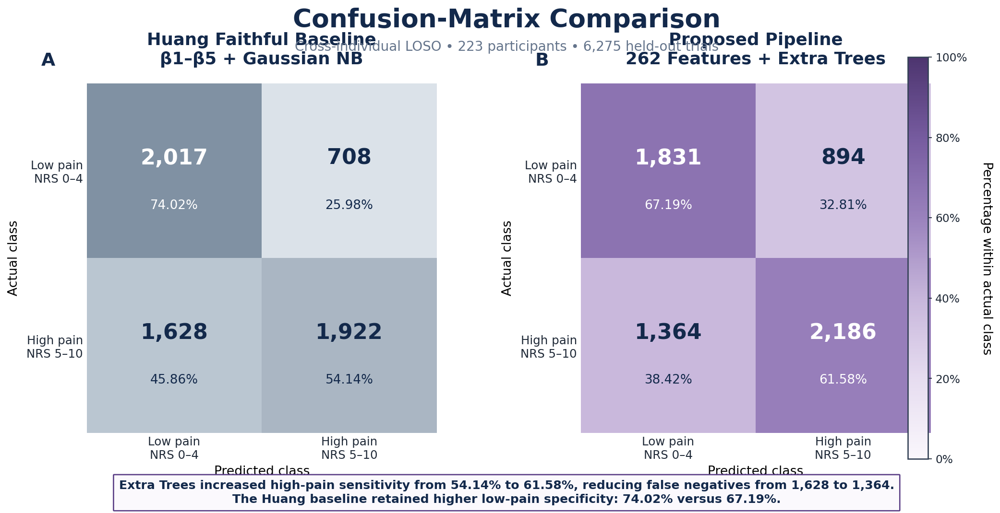

Saved to:
/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL/cross_fig4_confusion_matrix_huang_bluegray_extra_purple.png


In [ ]:
# ============================================================
# FIGURE 4
# CROSS-INDIVIDUAL CONFUSION-MATRIX COMPARISON
# Huang vs Proposed Pipeline
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import FuncFormatter

# ------------------------------------------------------------
# Save directory
# ------------------------------------------------------------

SAVE_DIR = "/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL"
os.makedirs(SAVE_DIR, exist_ok=True)

# ------------------------------------------------------------
# Colors
# ------------------------------------------------------------

NAVY = "#13294B"
SUBTITLE = "#64748B"

# Huang: blue-gray / slate theme
HUANG_EDGE = "#6E7F91"

# Proposed: dark purple theme
EXTRA_EDGE = "#5B3F86"

# ------------------------------------------------------------
# Confusion matrices
# ------------------------------------------------------------

# Huang faithful baseline
cm_huang = np.array([
    [2017, 708],
    [1628, 1922]
])

# Proposed pipeline: Extra Trees
cm_extra = np.array([
    [1831, 894],
    [1364, 2186]
])

# ------------------------------------------------------------
# Row-normalized percentages
# ------------------------------------------------------------

huang_pct = cm_huang / cm_huang.sum(axis=1, keepdims=True) * 100
extra_pct = cm_extra / cm_extra.sum(axis=1, keepdims=True) * 100

# ------------------------------------------------------------
# Custom colormaps
# ------------------------------------------------------------

# Huang blue-gray colormap
huang_cmap = LinearSegmentedColormap.from_list(
    "huang_bluegray",
    [
        "#F8FAFC",
        "#E4EAF0",
        "#C7D1DB",
        "#9EACBA",
        "#74879A",
        "#52677B"
    ]
)

# Proposed dark-purple colormap
purple_cmap = LinearSegmentedColormap.from_list(
    "premium_purple",
    [
        "#FAF7FC",
        "#E6DCF0",
        "#C7B6DB",
        "#9A82BD",
        "#765B9F",
        "#4D356F"
    ]
)

# ------------------------------------------------------------
# Figure and axes
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1, 2,
    figsize=(13.8, 6.8),
    facecolor="white"
)

fig.patch.set_facecolor("white")

datasets = [
    (
        axes[0],
        cm_huang,
        huang_pct,
        huang_cmap,
        "Huang Faithful Baseline\nβ1–β5 + Gaussian NB",
        "A"
    ),
    (
        axes[1],
        cm_extra,
        extra_pct,
        purple_cmap,
        "Proposed Pipeline\n262 Features + Extra Trees",
        "B"
    )
]

# ------------------------------------------------------------
# Draw both matrices
# ------------------------------------------------------------

for ax, cm, pct_matrix, cmap, title, panel in datasets:

    ax.set_facecolor("white")

    image = ax.imshow(
        pct_matrix,
        cmap=cmap,
        vmin=0,
        vmax=100
    )

    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])

    ax.set_xticklabels(
        ["Low pain\nNRS 0–4", "High pain\nNRS 5–10"],
        fontsize=11
    )

    ax.set_yticklabels(
        ["Low pain\nNRS 0–4", "High pain\nNRS 5–10"],
        fontsize=11
    )

    ax.set_xlabel(
        "Predicted class",
        fontsize=12,
        labelpad=4
    )

    ax.set_ylabel(
        "Actual class",
        fontsize=12,
        labelpad=6
    )

    ax.set_title(
        title,
        fontsize=16,
        fontweight="bold",
        color=NAVY,
        pad=18
    )

    # Panel label
    ax.text(
        -0.13, 1.05, panel,
        transform=ax.transAxes,
        fontsize=17,
        fontweight="bold",
        color=NAVY
    )

    # Cell annotations
    for i in range(2):
        for j in range(2):
            percentage = pct_matrix[i, j]
            count = cm[i, j]

            text_color = "white" if percentage >= 58 else NAVY

            ax.text(
                j,
                i - 0.07,
                f"{count:,}",
                ha="center",
                va="center",
                fontsize=20,
                fontweight="bold",
                color=text_color
            )

            ax.text(
                j,
                i + 0.20,
                f"{percentage:.2f}%",
                ha="center",
                va="center",
                fontsize=11.8,
                color=text_color
            )

    ax.tick_params(length=0)

    for spine in ax.spines.values():
        spine.set_visible(False)

# ------------------------------------------------------------
# Main title and subtitle
# ------------------------------------------------------------

fig.suptitle(
    "Confusion-Matrix Comparison",
    fontsize=24,
    fontweight="bold",
    color=NAVY,
    y=0.975
)

fig.text(
    0.5,
    0.90,
    "Cross-individual LOSO • 223 participants • 6,275 held-out trials",
    ha="center",
    va="center",
    fontsize=12.5,
    color=SUBTITLE
)

# ------------------------------------------------------------
# Shared colorbar
# ------------------------------------------------------------

cbar = fig.colorbar(
    image,
    ax=axes.ravel().tolist(),
    fraction=0.028,
    pad=0.04
)

cbar.set_label(
    "Percentage within actual class",
    rotation=270,
    labelpad=24,
    fontsize=12
)

cbar.ax.yaxis.set_major_formatter(
    FuncFormatter(lambda value, position: f"{value:.0f}%")
)

cbar.ax.tick_params(labelsize=10.5)

# ------------------------------------------------------------
# Footer summary
# ------------------------------------------------------------

footer = (
    "Extra Trees increased high-pain sensitivity from 54.14% to 61.58%, reducing false negatives from 1,628 to 1,364.\n"
    "The Huang baseline retained higher low-pain specificity: 74.02% versus 67.19%."
)

fig.text(
    0.5,
    0.045,
    footer,
    ha="center",
    va="center",
    multialignment="center",
    fontsize=11.3,
    fontweight="bold",
    color=NAVY,
    linespacing=1.25,
    bbox=dict(
        boxstyle="round,pad=0.45,rounding_size=0.05",
        facecolor="#FBF9FD",
        edgecolor=EXTRA_EDGE,
        linewidth=1.2
    )
)

# ------------------------------------------------------------
# Layout adjustments to avoid overlap
# ------------------------------------------------------------

plt.subplots_adjust(
    top=0.83,
    bottom=0.16,
    left=0.07,
    right=0.90,
    wspace=0.28
)

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

output_path = os.path.join(
    SAVE_DIR,
    "cross_fig4_confusion_matrix_huang_bluegray_extra_purple.png"
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved to:")
print(output_path)

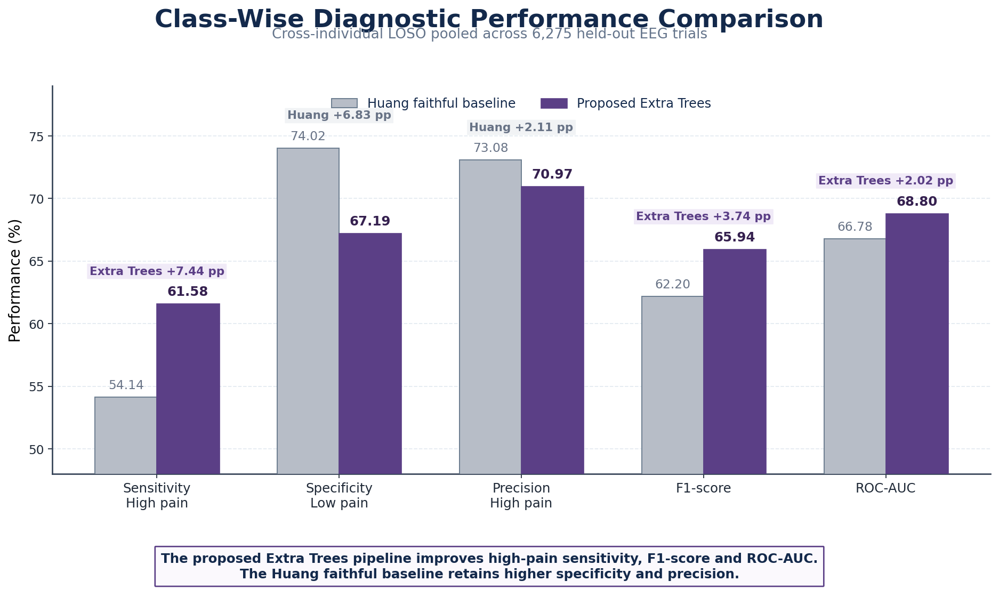

Saved to:
/content/drive/MyDrive/EXP8_COMPARISON_FIGURES_CROSS_INDIVIDUAL/cross_fig5_diagnostic_comparison_silver_purple.png


In [ ]:
# ============================================================
# FIGURE 5
# DIAGNOSTIC PERFORMANCE TRADE-OFF
# ============================================================

metrics = [
    "Sensitivity\nHigh pain",
    "Specificity\nLow pain",
    "Precision\nHigh pain",
    "F1-score",
    "ROC-AUC"
]

huang_values = np.array([
    54.14,
    74.02,
    73.08,
    62.20,
    66.78
])

extra_values = np.array([
    61.58,
    67.19,
    70.97,
    65.94,
    68.80
])

x = np.arange(
    len(metrics)
)

width = 0.34

fig, ax = plt.subplots(
    figsize=(12.5, 7.0),
    facecolor="white"
)

ax.set_facecolor("white")

huang_bars = ax.bar(
    x - width / 2,
    huang_values,
    width,
    color=HUANG_COLOR,
    edgecolor=HUANG_EDGE,
    linewidth=0.9,
    label="Huang faithful baseline",
    zorder=3
)

extra_bars = ax.bar(
    x + width / 2,
    extra_values,
    width,
    color=EXTRA_COLOR,
    edgecolor=EXTRA_EDGE,
    linewidth=1.2,
    label="Proposed Extra Trees",
    zorder=3
)

# ------------------------------------------------------------
# Values
# ------------------------------------------------------------

for bar in huang_bars:

    ax.text(
        bar.get_x()
        +
        bar.get_width() / 2,
        bar.get_height() + 0.45,
        f"{bar.get_height():.2f}",
        ha="center",
        va="bottom",
        fontsize=10.5,
        color=HUANG_TEXT
    )

for bar in extra_bars:

    ax.text(
        bar.get_x()
        +
        bar.get_width() / 2,
        bar.get_height() + 0.45,
        f"{bar.get_height():.2f}",
        ha="center",
        va="bottom",
        fontsize=11,
        fontweight="bold",
        color=EXTRA_TEXT
    )

# ------------------------------------------------------------
# Difference labels
# ------------------------------------------------------------

differences = (
    extra_values
    -
    huang_values
)

for i, difference in enumerate(
    differences
):

    highest = max(
        huang_values[i],
        extra_values[i]
    )

    if difference >= 0:

        text = (
            f"Extra Trees +{difference:.2f} pp"
        )

        badge_color = EXTRA_COLOR

        badge_bg = "#F0EAF7"

    else:

        text = (
            f"Huang +{abs(difference):.2f} pp"
        )

        badge_color = HUANG_TEXT

        badge_bg = "#F1F3F5"

    ax.text(
        x[i],
        highest + 2.6,
        text,
        ha="center",
        va="center",
        fontsize=9.7,
        fontweight="bold",
        color=badge_color,
        bbox=dict(
            boxstyle="round,pad=0.20,rounding_size=0.05",
            facecolor=badge_bg,
            edgecolor="none"
        )
    )

# ------------------------------------------------------------
# Titles
# ------------------------------------------------------------

fig.suptitle(
    "Class-Wise Diagnostic Performance Comparison",
    fontsize=21,
    fontweight="bold",
    color=NAVY,
    y=0.97
)

fig.text(
    0.5,
    0.92,
    "Cross-individual LOSO pooled across 6,275 held-out EEG trials",
    ha="center",
    fontsize=11.8,
    color=SUBTITLE
)

# ------------------------------------------------------------
# Axes
# ------------------------------------------------------------

ax.set_ylabel(
    "Performance (%)",
    fontsize=12.5
)

ax.set_xticks(x)

ax.set_xticklabels(
    metrics,
    fontsize=11
)

ax.set_ylim(
    48,
    79
)

ax.grid(
    axis="y",
    linestyle="--",
    linewidth=0.8,
    color=GRID,
    alpha=0.8
)

ax.set_axisbelow(True)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, 1.0),
    ncol=2,
    frameon=False,
    fontsize=10.8
)

# ------------------------------------------------------------
# Footer — split into two lines
# ------------------------------------------------------------

footer = (
    "The proposed Extra Trees pipeline improves high-pain sensitivity, F1-score and ROC-AUC.\n"
    "The Huang faithful baseline retains higher specificity and precision."
)

fig.text(
    0.5,
    0.035,
    footer,
    ha="center",
    va="center",
    multialignment="center",
    fontsize=11,
    fontweight="bold",
    color=NAVY,
    linespacing=1.25,
    bbox=dict(
        boxstyle="round,pad=0.45,rounding_size=0.05",
        facecolor="#FBF9FD",
        edgecolor=EXTRA_COLOR,
        linewidth=1.2
    )
)

plt.subplots_adjust(
    top=0.84,
    bottom=0.19,
    left=0.09,
    right=0.97
)

output_path = os.path.join(
    SAVE_DIR,
    "cross_fig5_diagnostic_comparison_silver_purple.png"
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved to:")
print(output_path)

In [ ]:
# ============================================================
# CELL 1 — SHARED SETUP FOR CROSS-INDIVIDUAL FIGURES
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import PercentFormatter

from sklearn.metrics import (
    confusion_matrix,
    roc_curve,
    roc_auc_score,
    precision_recall_curve,
    average_precision_score,
)


# ============================================================
# PATHS
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

RESULT_DIR = os.path.join(
    V8_DIR,
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO"
)

EXPERIMENT_NAME = (
    "ExtraTrees__StrictInductive_A__"
    "X_handcrafted_NoFeatureScaler"
)


TRIAL_PATH = os.path.join(
    RESULT_DIR,
    (
        f"{EXPERIMENT_NAME}"
        "__trial_predictions.csv"
    )
)

SUBJECT_PATH = os.path.join(
    RESULT_DIR,
    (
        f"{EXPERIMENT_NAME}"
        "__subject_results.csv"
    )
)

SUMMARY_PATH = os.path.join(
    RESULT_DIR,
    (
        f"{EXPERIMENT_NAME}"
        "__pooled_summary.csv"
    )
)


FIGURE_DIR = os.path.join(
    RESULT_DIR,
    "PREMIUM_PUBLICATION_FIGURES"
)

os.makedirs(
    FIGURE_DIR,
    exist_ok=True
)


# ============================================================
# LOAD FILES
# ============================================================

trial_df = pd.read_csv(
    TRIAL_PATH
)

subject_df = pd.read_csv(
    SUBJECT_PATH
)

summary_df = pd.read_csv(
    SUMMARY_PATH
)


# ============================================================
# ROBUST COLUMN DETECTION
# ============================================================

def find_column(
    dataframe,
    candidates,
    description,
):

    # exact
    for candidate in candidates:

        if candidate in dataframe.columns:
            return candidate


    # case-insensitive
    lower_map = {
        str(column).lower(): column
        for column in dataframe.columns
    }

    for candidate in candidates:

        if candidate.lower() in lower_map:

            return lower_map[
                candidate.lower()
            ]


    # substring
    for column in dataframe.columns:

        column_lower = str(
            column
        ).lower()

        for candidate in candidates:

            if candidate.lower() in column_lower:

                return column


    raise KeyError(
        f"Could not detect {description}.\n"
        f"Available columns:\n"
        f"{dataframe.columns.tolist()}"
    )


Y_TRUE_COL = find_column(
    trial_df,
    [
        "y_true",
        "true_label",
        "actual_label",
        "ground_truth",
        "target",
    ],
    "true-label column",
)


Y_PRED_COL = find_column(
    trial_df,
    [
        "y_pred",
        "predicted_label",
        "pred_label",
        "prediction",
    ],
    "predicted-label column",
)


Y_SCORE_COL = find_column(
    trial_df,
    [
        "y_score",
        "y_prob",
        "prob_high",
        "probability_high",
        "positive_probability",
        "prob_positive",
        "prob_1",
        "proba_1",
        "class_1_probability",
    ],
    "positive-class probability column",
)


TRIAL_SUBJECT_COL = find_column(
    trial_df,
    [
        "subject_id",
        "participant_id",
        "test_subject",
        "subject",
        "participant",
    ],
    "trial-level subject column",
)


SUBJECT_ID_COL = find_column(
    subject_df,
    [
        "subject_id",
        "participant_id",
        "test_subject",
        "subject",
        "participant",
    ],
    "subject-results participant column",
)


SUBJECT_ACC_COL = find_column(
    subject_df,
    [
        "accuracy",
        "subject_accuracy",
    ],
    "subject accuracy column",
)


# ============================================================
# ARRAYS
# ============================================================

y_true = trial_df[
    Y_TRUE_COL
].to_numpy(
    dtype=int
)

y_pred = trial_df[
    Y_PRED_COL
].to_numpy(
    dtype=int
)

y_score = trial_df[
    Y_SCORE_COL
].to_numpy(
    dtype=float
)

trial_subjects = trial_df[
    TRIAL_SUBJECT_COL
].astype(str).to_numpy()


subject_accuracy = subject_df[
    SUBJECT_ACC_COL
].to_numpy(
    dtype=float
)

if np.nanmax(
    subject_accuracy
) <= 1.5:

    subject_accuracy *= 100


# ============================================================
# VALIDATION
# ============================================================

assert len(y_true) == 6275

assert len(
    np.unique(
        trial_subjects
    )
) == 223

assert np.array_equal(
    np.bincount(
        y_true,
        minlength=2
    ),
    np.array(
        [
            2725,
            3550,
        ]
    )
)


# ============================================================
# CROSS-INDIVIDUAL PREMIUM PALETTE
# ============================================================

NAVY = "#172A46"

CROSS_INDIGO = "#4B5D9A"
CROSS_TEAL = "#2F8F83"
CROSS_CORAL = "#D46A4C"
CROSS_PURPLE = "#76518D"

MUTED_GOLD = "#C79A3B"

SLATE = "#64748B"
GRID = "#DEE6EE"

PALE_INDIGO = "#EEF0F8"
PALE_TEAL = "#EAF5F3"
PALE_CORAL = "#FAEEEA"
PALE_PURPLE = "#F3EEF6"

WHITE = "#FFFFFF"


# ============================================================
# PUBLICATION STYLE
# ============================================================

plt.rcParams.update(
    {
        "figure.facecolor":
            WHITE,

        "axes.facecolor":
            WHITE,

        "savefig.facecolor":
            WHITE,

        "font.family":
            "DejaVu Sans",

        "font.size":
            11,

        "axes.labelsize":
            12,

        "axes.labelweight":
            "medium",

        "xtick.labelsize":
            10.5,

        "ytick.labelsize":
            10.5,

        "axes.edgecolor":
            NAVY,

        "axes.linewidth":
            1.05,

        "pdf.fonttype":
            42,

        "ps.fonttype":
            42,
    }
)


# ============================================================
# SAVE FUNCTION
# ============================================================

def save_premium_figure(
    figure,
    base_name,
):

    png_path = os.path.join(
        FIGURE_DIR,
        base_name + ".png"
    )

    pdf_path = os.path.join(
        FIGURE_DIR,
        base_name + ".pdf"
    )

    svg_path = os.path.join(
        FIGURE_DIR,
        base_name + ".svg"
    )


    figure.savefig(
        png_path,
        dpi=600,
        bbox_inches="tight",
        pad_inches=0.16,
    )

    figure.savefig(
        pdf_path,
        bbox_inches="tight",
        pad_inches=0.16,
    )

    figure.savefig(
        svg_path,
        bbox_inches="tight",
        pad_inches=0.16,
    )


    print("Saved:")
    print(png_path)
    print(pdf_path)
    print(svg_path)


print("=" * 80)
print("CROSS-INDIVIDUAL FIGURE SETUP COMPLETE")
print("=" * 80)

print("Trials:", len(y_true))
print(
    "Participants:",
    len(
        np.unique(
            trial_subjects
        )
    )
)

print(
    "Mean participant accuracy:",
    f"{np.mean(subject_accuracy):.2f}%"
)

print(
    "Participant accuracy SD:",
    f"{np.std(subject_accuracy, ddof=1):.2f}%"
)

In [ ]:
# ============================================================
# CELL 1 — SHARED SETUP FOR CROSS-INDIVIDUAL FIGURES
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import PercentFormatter

from sklearn.metrics import (
    confusion_matrix,
    roc_curve,
    roc_auc_score,
    precision_recall_curve,
    average_precision_score,
)


# ============================================================
# PATHS
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

RESULT_DIR = os.path.join(
    V8_DIR,
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO"
)

EXPERIMENT_NAME = (
    "ExtraTrees__StrictInductive_A__"
    "X_handcrafted_NoFeatureScaler"
)


TRIAL_PATH = os.path.join(
    RESULT_DIR,
    (
        f"{EXPERIMENT_NAME}"
        "__trial_predictions.csv"
    )
)

SUBJECT_PATH = os.path.join(
    RESULT_DIR,
    (
        f"{EXPERIMENT_NAME}"
        "__subject_results.csv"
    )
)

SUMMARY_PATH = os.path.join(
    RESULT_DIR,
    (
        f"{EXPERIMENT_NAME}"
        "__pooled_summary.csv"
    )
)


FIGURE_DIR = os.path.join(
    RESULT_DIR,
    "PREMIUM_PUBLICATION_FIGURES"
)

os.makedirs(
    FIGURE_DIR,
    exist_ok=True
)


# ============================================================
# LOAD FILES
# ============================================================

trial_df = pd.read_csv(
    TRIAL_PATH
)

subject_df = pd.read_csv(
    SUBJECT_PATH
)

summary_df = pd.read_csv(
    SUMMARY_PATH
)


# ============================================================
# ROBUST COLUMN DETECTION
# ============================================================

def find_column(
    dataframe,
    candidates,
    description,
):

    # exact
    for candidate in candidates:

        if candidate in dataframe.columns:
            return candidate


    # case-insensitive
    lower_map = {
        str(column).lower(): column
        for column in dataframe.columns
    }

    for candidate in candidates:

        if candidate.lower() in lower_map:

            return lower_map[
                candidate.lower()
            ]


    # substring
    for column in dataframe.columns:

        column_lower = str(
            column
        ).lower()

        for candidate in candidates:

            if candidate.lower() in column_lower:

                return column


    raise KeyError(
        f"Could not detect {description}.\n"
        f"Available columns:\n"
        f"{dataframe.columns.tolist()}"
    )


Y_TRUE_COL = find_column(
    trial_df,
    [
        "y_true",
        "true_label",
        "actual_label",
        "ground_truth",
        "target",
    ],
    "true-label column",
)


Y_PRED_COL = find_column(
    trial_df,
    [
        "y_pred",
        "predicted_label",
        "pred_label",
        "prediction",
    ],
    "predicted-label column",
)


Y_SCORE_COL = find_column(
    trial_df,
    [
        "y_score",
        "y_prob",
        "prob_high",
        "probability_high",
        "positive_probability",
        "prob_positive",
        "prob_1",
        "proba_1",
        "class_1_probability",
    ],
    "positive-class probability column",
)


TRIAL_SUBJECT_COL = find_column(
    trial_df,
    [
        "subject_id",
        "participant_id",
        "test_subject",
        "subject",
        "participant",
    ],
    "trial-level subject column",
)


SUBJECT_ID_COL = find_column(
    subject_df,
    [
        "subject_id",
        "participant_id",
        "test_subject",
        "subject",
        "participant",
    ],
    "subject-results participant column",
)


SUBJECT_ACC_COL = find_column(
    subject_df,
    [
        "accuracy",
        "subject_accuracy",
    ],
    "subject accuracy column",
)


# ============================================================
# ARRAYS
# ============================================================

y_true = trial_df[
    Y_TRUE_COL
].to_numpy(
    dtype=int
)

y_pred = trial_df[
    Y_PRED_COL
].to_numpy(
    dtype=int
)

y_score = trial_df[
    Y_SCORE_COL
].to_numpy(
    dtype=float
)

trial_subjects = trial_df[
    TRIAL_SUBJECT_COL
].astype(str).to_numpy()


subject_accuracy = subject_df[
    SUBJECT_ACC_COL
].to_numpy(
    dtype=float
)

if np.nanmax(
    subject_accuracy
) <= 1.5:

    subject_accuracy *= 100


# ============================================================
# VALIDATION
# ============================================================

assert len(y_true) == 6275

assert len(
    np.unique(
        trial_subjects
    )
) == 223

assert np.array_equal(
    np.bincount(
        y_true,
        minlength=2
    ),
    np.array(
        [
            2725,
            3550,
        ]
    )
)


# ============================================================
# CROSS-INDIVIDUAL PREMIUM PALETTE
# ============================================================

NAVY = "#172A46"

CROSS_INDIGO = "#4B5D9A"
CROSS_TEAL = "#2F8F83"
CROSS_CORAL = "#D46A4C"
CROSS_PURPLE = "#76518D"

MUTED_GOLD = "#C79A3B"

SLATE = "#64748B"
GRID = "#DEE6EE"

PALE_INDIGO = "#EEF0F8"
PALE_TEAL = "#EAF5F3"
PALE_CORAL = "#FAEEEA"
PALE_PURPLE = "#F3EEF6"

WHITE = "#FFFFFF"


# ============================================================
# PUBLICATION STYLE
# ============================================================

plt.rcParams.update(
    {
        "figure.facecolor":
            WHITE,

        "axes.facecolor":
            WHITE,

        "savefig.facecolor":
            WHITE,

        "font.family":
            "DejaVu Sans",

        "font.size":
            11,

        "axes.labelsize":
            12,

        "axes.labelweight":
            "medium",

        "xtick.labelsize":
            10.5,

        "ytick.labelsize":
            10.5,

        "axes.edgecolor":
            NAVY,

        "axes.linewidth":
            1.05,

        "pdf.fonttype":
            42,

        "ps.fonttype":
            42,
    }
)


# ============================================================
# SAVE FUNCTION
# ============================================================

def save_premium_figure(
    figure,
    base_name,
):

    png_path = os.path.join(
        FIGURE_DIR,
        base_name + ".png"
    )

    pdf_path = os.path.join(
        FIGURE_DIR,
        base_name + ".pdf"
    )

    svg_path = os.path.join(
        FIGURE_DIR,
        base_name + ".svg"
    )


    figure.savefig(
        png_path,
        dpi=600,
        bbox_inches="tight",
        pad_inches=0.16,
    )

    figure.savefig(
        pdf_path,
        bbox_inches="tight",
        pad_inches=0.16,
    )

    figure.savefig(
        svg_path,
        bbox_inches="tight",
        pad_inches=0.16,
    )


    print("Saved:")
    print(png_path)
    print(pdf_path)
    print(svg_path)


print("=" * 80)
print("CROSS-INDIVIDUAL FIGURE SETUP COMPLETE")
print("=" * 80)

print("Trials:", len(y_true))
print(
    "Participants:",
    len(
        np.unique(
            trial_subjects
        )
    )
)

print(
    "Mean participant accuracy:",
    f"{np.mean(subject_accuracy):.2f}%"
)

print(
    "Participant accuracy SD:",
    f"{np.std(subject_accuracy, ddof=1):.2f}%"
)

CROSS-INDIVIDUAL FIGURE SETUP COMPLETE
Trials: 6275
Participants: 223
Mean participant accuracy: 64.08%
Participant accuracy SD: 20.15%


Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_02_Confusion_Matrix.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_02_Confusion_Matrix.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_02_Confusion_Matrix.svg


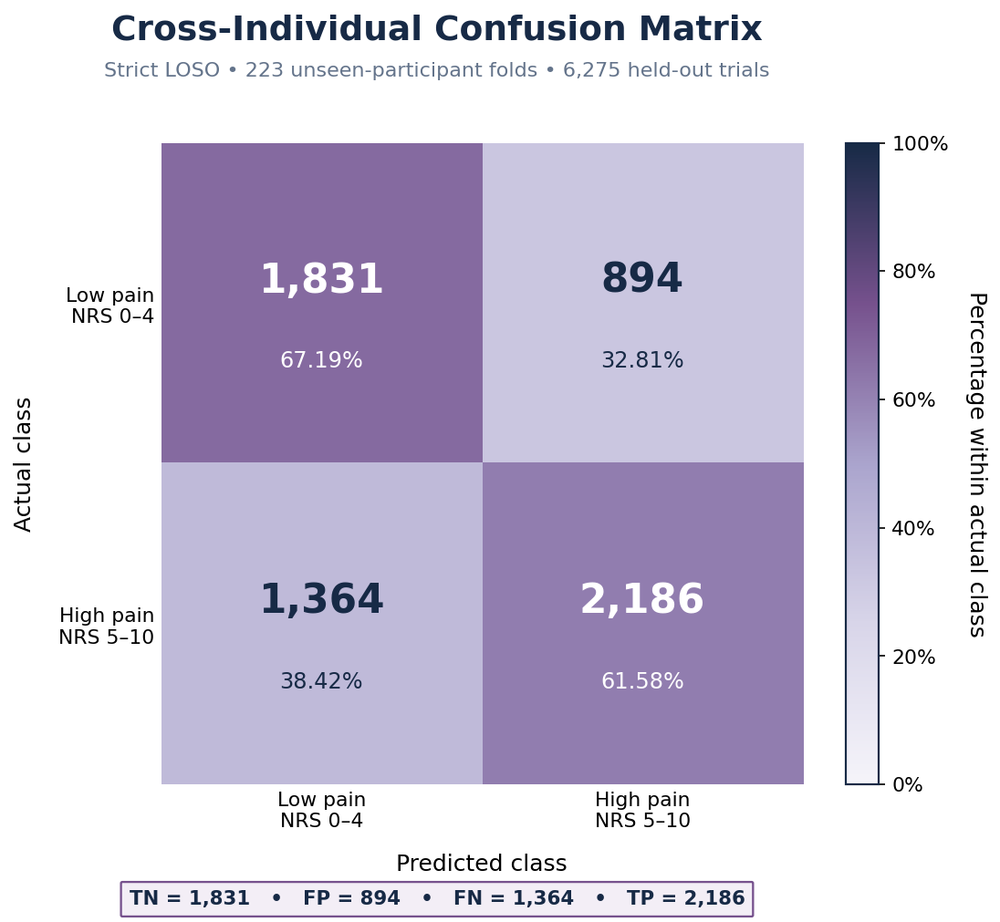

In [ ]:
# ============================================================
# CELL 2 — PREMIUM CROSS-INDIVIDUAL CONFUSION MATRIX
# ============================================================

cm = confusion_matrix(
    y_true,
    y_pred,
    labels=[
        0,
        1
    ],
)


cm_percent = (
    cm
    /
    cm.sum(
        axis=1,
        keepdims=True
    )
    *
    100
)


# ============================================================
# Custom cross-individual colormap
# ============================================================

cross_cm_cmap = (
    LinearSegmentedColormap.from_list(
        "cross_individual_cm",
        [
            "#F5F4FA",
            "#D8D5E9",
            "#AAA4CD",
            CROSS_PURPLE,
            NAVY,
        ]
    )
)


# ============================================================
# Figure
# ============================================================

figure, axis = plt.subplots(
    figsize=(
        8.2,
        7.0
    )
)


image = axis.imshow(
    cm_percent,
    cmap=cross_cm_cmap,
    vmin=0,
    vmax=100,
    interpolation="nearest",
)


class_labels = [
    "Low pain\nNRS 0–4",
    "High pain\nNRS 5–10",
]


axis.set_xticks(
    [
        0,
        1
    ],
    labels=class_labels,
)

axis.set_yticks(
    [
        0,
        1
    ],
    labels=class_labels,
)


axis.set_xlabel(
    "Predicted class",
    labelpad=12,
)

axis.set_ylabel(
    "Actual class",
    labelpad=12,
)


# ============================================================
# Cell annotations
# ============================================================

for row_index in range(
    2
):

    for column_index in range(
        2
    ):

        count = cm[
            row_index,
            column_index
        ]

        percentage = cm_percent[
            row_index,
            column_index
        ]


        text_color = (
            WHITE
            if percentage >= 50
            else NAVY
        )


        axis.text(
            column_index,
            row_index - 0.07,

            f"{count:,}",

            ha="center",
            va="center",

            fontsize=21,
            fontweight="bold",
            color=text_color,
        )


        axis.text(
            column_index,
            row_index + 0.18,

            f"{percentage:.2f}%",

            ha="center",
            va="center",

            fontsize=11.5,
            color=text_color,
        )


# ============================================================
# Title
# ============================================================

figure.suptitle(
    "Cross-Individual Confusion Matrix",

    x=0.5,
    y=0.965,

    fontsize=18,
    fontweight="bold",
    color=NAVY,
)


figure.text(
    0.5,
    0.915,

    (
        "Strict LOSO • 223 unseen-participant folds • "
        "6,275 held-out trials"
    ),

    ha="center",
    va="top",

    fontsize=10.7,
    color=SLATE,
)


# ============================================================
# Colorbar
# ============================================================

colorbar = figure.colorbar(
    image,
    ax=axis,
    fraction=0.046,
    pad=0.05,
)

colorbar.set_label(
    "Percentage within actual class",
    rotation=270,
    labelpad=20,
)

colorbar.ax.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100
    )
)


# ============================================================
# Footer
# ============================================================

figure.text(
    0.5,
    0.040,

    (
        f"TN = {cm[0,0]:,}   •   "
        f"FP = {cm[0,1]:,}   •   "
        f"FN = {cm[1,0]:,}   •   "
        f"TP = {cm[1,1]:,}"
    ),

    ha="center",
    va="center",

    fontsize=10.2,
    fontweight="bold",
    color=NAVY,

    bbox={
        "boxstyle":
            "round,pad=0.42,"
            "rounding_size=0.07",

        "facecolor":
            PALE_PURPLE,

        "edgecolor":
            CROSS_PURPLE,

        "linewidth":
            1.1,
    },
)


axis.tick_params(
    axis="both",
    length=0,
)


for spine in axis.spines.values():

    spine.set_visible(
        False
    )


figure.subplots_adjust(
    left=0.13,
    right=0.90,
    top=0.83,
    bottom=0.16,
)


save_premium_figure(
    figure,
    "Figure_Cross_02_Confusion_Matrix",
)

plt.show()

In [ ]:
# ============================================================
# CELL 3 — PARTICIPANT-CLUSTERED BOOTSTRAP
#
# Used for:
#   ROC confidence band
#   ROC-AUC confidence interval
#   PR confidence band
#   PR-AUC confidence interval
# ============================================================

subject_to_indices = {

    subject_id:
        np.flatnonzero(
            trial_subjects
            ==
            subject_id
        )

    for subject_id
    in np.unique(
        trial_subjects
    )
}


unique_subjects = np.asarray(
    list(
        subject_to_indices.keys()
    ),
    dtype=str
)


N_BOOTSTRAPS = 1000
RANDOM_STATE = 42


rng = np.random.default_rng(
    RANDOM_STATE
)


# Common interpolation grids
roc_grid = np.linspace(
    0,
    1,
    501
)

recall_grid = np.linspace(
    0,
    1,
    501
)


bootstrap_roc_curves = []
bootstrap_pr_curves = []

bootstrap_auc = []
bootstrap_ap = []


for bootstrap_iteration in range(
    N_BOOTSTRAPS
):

    sampled_subjects = rng.choice(
        unique_subjects,

        size=len(
            unique_subjects
        ),

        replace=True,
    )


    sampled_indices = np.concatenate(
        [
            subject_to_indices[
                subject
            ]

            for subject
            in sampled_subjects
        ]
    )


    bootstrap_true = y_true[
        sampled_indices
    ]

    bootstrap_score = y_score[
        sampled_indices
    ]


    if np.unique(
        bootstrap_true
    ).size < 2:

        continue


    # ========================================================
    # ROC
    # ========================================================

    bootstrap_fpr, bootstrap_tpr, _ = (
        roc_curve(
            bootstrap_true,
            bootstrap_score
        )
    )


    interpolated_tpr = np.interp(
        roc_grid,
        bootstrap_fpr,
        bootstrap_tpr
    )

    interpolated_tpr[0] = 0
    interpolated_tpr[-1] = 1


    bootstrap_roc_curves.append(
        interpolated_tpr
    )


    bootstrap_auc.append(
        roc_auc_score(
            bootstrap_true,
            bootstrap_score
        )
    )


    # ========================================================
    # PRECISION-RECALL
    # ========================================================

    precision_values, recall_values, _ = (
        precision_recall_curve(
            bootstrap_true,
            bootstrap_score
        )
    )


    # precision_recall_curve recall is descending.
    recall_for_interp = recall_values[
        ::-1
    ]

    precision_for_interp = precision_values[
        ::-1
    ]


    interpolated_precision = np.interp(
        recall_grid,
        recall_for_interp,
        precision_for_interp
    )


    bootstrap_pr_curves.append(
        interpolated_precision
    )


    bootstrap_ap.append(
        average_precision_score(
            bootstrap_true,
            bootstrap_score
        )
    )


bootstrap_roc_curves = np.asarray(
    bootstrap_roc_curves
)

bootstrap_pr_curves = np.asarray(
    bootstrap_pr_curves
)

bootstrap_auc = np.asarray(
    bootstrap_auc
)

bootstrap_ap = np.asarray(
    bootstrap_ap
)


# ============================================================
# ROC confidence intervals
# ============================================================

roc_lower = np.percentile(
    bootstrap_roc_curves,
    2.5,
    axis=0
)

roc_upper = np.percentile(
    bootstrap_roc_curves,
    97.5,
    axis=0
)


auc_ci_lower = np.percentile(
    bootstrap_auc,
    2.5
)

auc_ci_upper = np.percentile(
    bootstrap_auc,
    97.5
)


# ============================================================
# PR confidence intervals
# ============================================================

pr_lower = np.percentile(
    bootstrap_pr_curves,
    2.5,
    axis=0
)

pr_upper = np.percentile(
    bootstrap_pr_curves,
    97.5,
    axis=0
)


ap_ci_lower = np.percentile(
    bootstrap_ap,
    2.5
)

ap_ci_upper = np.percentile(
    bootstrap_ap,
    97.5
)


print("=" * 80)
print("PARTICIPANT-CLUSTERED BOOTSTRAP COMPLETE")
print("=" * 80)

print(
    "Valid bootstrap samples:",
    len(
        bootstrap_auc
    )
)

print(
    "ROC-AUC 95% CI:",
    f"{auc_ci_lower:.3f}–{auc_ci_upper:.3f}"
)

print(
    "PR-AUC/AP 95% CI:",
    f"{ap_ci_lower:.3f}–{ap_ci_upper:.3f}"
)

PARTICIPANT-CLUSTERED BOOTSTRAP COMPLETE
Valid bootstrap samples: 1000
ROC-AUC 95% CI: 0.656–0.722
PR-AUC/AP 95% CI: 0.697–0.777


Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_03_ROC_AUC.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_03_ROC_AUC.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_03_ROC_AUC.svg


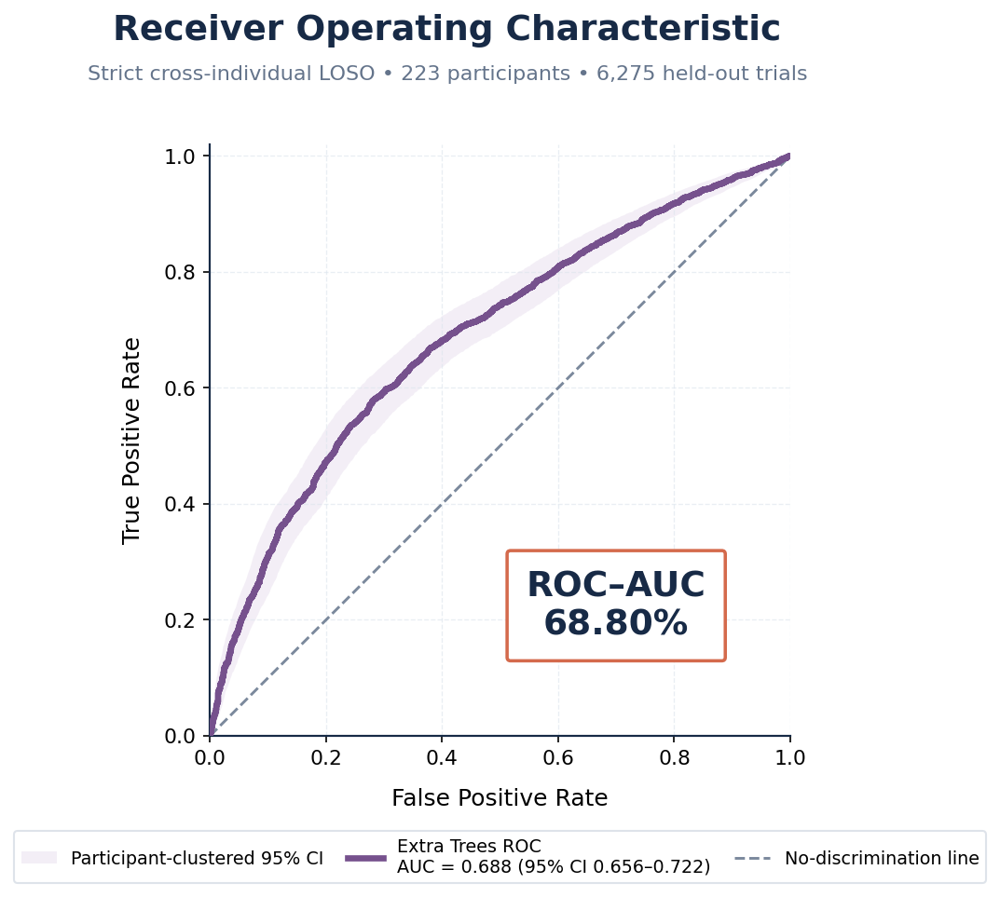

ROC-AUC: 68.80%
95% clustered CI: 65.62%–72.21%


In [ ]:
# ============================================================
# CELL 4 — PREMIUM CROSS-INDIVIDUAL ROC CURVE
# ============================================================

observed_fpr, observed_tpr, _ = (
    roc_curve(
        y_true,
        y_score
    )
)


observed_auc = roc_auc_score(
    y_true,
    y_score
)


figure, axis = plt.subplots(
    figsize=(
        8.4,
        7.3
    )
)


# ============================================================
# Confidence band
# ============================================================

axis.fill_between(
    roc_grid,
    roc_lower,
    roc_upper,

    color=PALE_PURPLE,
    alpha=0.95,

    linewidth=0,

    label="Participant-clustered 95% CI",

    zorder=1,
)


# ============================================================
# ROC
# ============================================================

axis.plot(
    observed_fpr,
    observed_tpr,

    color=CROSS_PURPLE,
    linewidth=3.2,

    label=(
        f"Extra Trees ROC\n"
        f"AUC = {observed_auc:.3f} "
        f"(95% CI {auc_ci_lower:.3f}–{auc_ci_upper:.3f})"
    ),

    zorder=4,
)


# ============================================================
# No-discrimination line
# ============================================================

axis.plot(
    [
        0,
        1
    ],
    [
        0,
        1
    ],

    linestyle="--",
    linewidth=1.4,

    color=SLATE,
    alpha=0.85,

    label="No-discrimination line",

    zorder=3,
)


# ============================================================
# ROC-AUC card
# ============================================================

axis.text(
    0.70,
    0.22,

    (
        "ROC–AUC\n"
        f"{observed_auc * 100:.2f}%"
    ),

    transform=axis.transAxes,

    ha="center",
    va="center",

    fontsize=18,
    fontweight="bold",

    color=NAVY,

    linespacing=1.18,

    bbox={
        "boxstyle":
            "round,pad=0.55,"
            "rounding_size=0.10",

        "facecolor":
            WHITE,

        "edgecolor":
            CROSS_CORAL,

        "linewidth":
            1.7,
    },

    zorder=7,
)


axis.set_xlim(
    0,
    1
)

axis.set_ylim(
    0,
    1.02
)


axis.set_xlabel(
    "False Positive Rate",
    labelpad=10,
)

axis.set_ylabel(
    "True Positive Rate",
    labelpad=10,
)


# ============================================================
# Title + subtitle
# ============================================================

figure.suptitle(
    "Receiver Operating Characteristic",

    x=0.5,
    y=0.968,

    fontsize=18,
    fontweight="bold",
    color=NAVY,
)


figure.text(
    0.5,
    0.918,

    (
        "Strict cross-individual LOSO • "
        "223 participants • "
        "6,275 held-out trials"
    ),

    ha="center",
    va="top",

    fontsize=10.7,
    color=SLATE,
)


axis.grid(
    linestyle="--",
    linewidth=0.65,
    color=GRID,
    alpha=0.65,
)


axis.legend(
    loc="upper center",

    bbox_to_anchor=(
        0.5,
        -0.145
    ),

    ncol=3,

    frameon=True,

    facecolor=WHITE,
    edgecolor="#D6DCE5",

    fontsize=9.2,

    columnspacing=1.3,
)


axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)


axis.set_aspect(
    "equal",
    adjustable="box"
)


figure.subplots_adjust(
    left=0.13,
    right=0.96,
    top=0.84,
    bottom=0.26,
)


save_premium_figure(
    figure,
    "Figure_Cross_03_ROC_AUC",
)

plt.show()


print(
    "ROC-AUC:",
    f"{observed_auc * 100:.2f}%"
)

print(
    "95% clustered CI:",
    f"{auc_ci_lower * 100:.2f}%–"
    f"{auc_ci_upper * 100:.2f}%"
)

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_04_Precision_Recall.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_04_Precision_Recall.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_04_Precision_Recall.svg


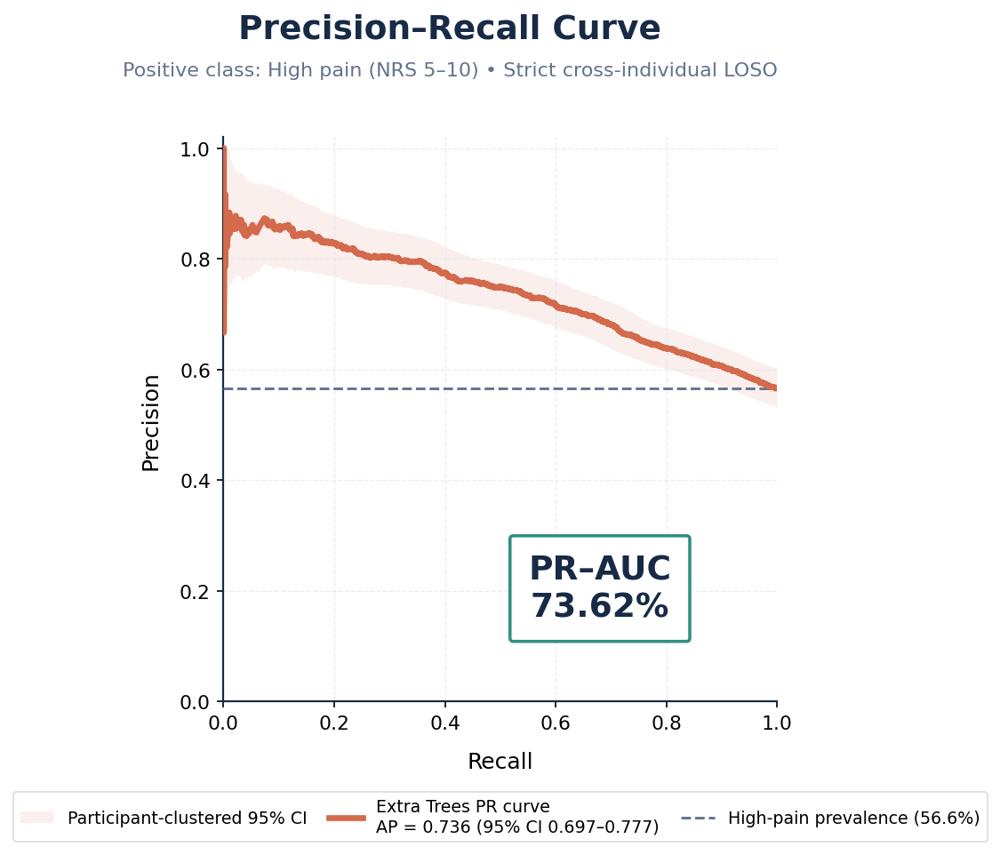

PR-AUC / Average Precision: 73.62%
High-pain prevalence: 56.57%


In [ ]:
# ============================================================
# CELL 5 — PREMIUM CROSS-INDIVIDUAL PRECISION–RECALL CURVE
# ============================================================

observed_precision, observed_recall, _ = (
    precision_recall_curve(
        y_true,
        y_score
    )
)


observed_ap = average_precision_score(
    y_true,
    y_score
)


positive_prevalence = np.mean(
    y_true == 1
)


figure, axis = plt.subplots(
    figsize=(
        8.4,
        7.3
    )
)


# ============================================================
# Confidence band
# ============================================================

axis.fill_between(
    recall_grid,
    pr_lower,
    pr_upper,

    color=PALE_CORAL,
    alpha=0.90,

    linewidth=0,

    label="Participant-clustered 95% CI",

    zorder=1,
)


# ============================================================
# PR curve
# ============================================================

axis.plot(
    observed_recall,
    observed_precision,

    color=CROSS_CORAL,
    linewidth=3.2,

    label=(
        f"Extra Trees PR curve\n"
        f"AP = {observed_ap:.3f} "
        f"(95% CI {ap_ci_lower:.3f}–{ap_ci_upper:.3f})"
    ),

    zorder=4,
)


# ============================================================
# Prevalence baseline
# ============================================================

axis.axhline(
    positive_prevalence,

    linestyle="--",
    linewidth=1.4,

    color=SLATE,

    label=(
        "High-pain prevalence "
        f"({positive_prevalence * 100:.1f}%)"
    ),

    zorder=3,
)


# ============================================================
# PR-AUC/AP card
# ============================================================

axis.text(
    0.68,
    0.20,

    (
        "PR–AUC\n"
        f"{observed_ap * 100:.2f}%"
    ),

    transform=axis.transAxes,

    ha="center",
    va="center",

    fontsize=18,
    fontweight="bold",

    color=NAVY,

    bbox={
        "boxstyle":
            "round,pad=0.55,"
            "rounding_size=0.10",

        "facecolor":
            WHITE,

        "edgecolor":
            CROSS_TEAL,

        "linewidth":
            1.7,
    },

    zorder=7,
)


axis.set_xlim(
    0,
    1
)

axis.set_ylim(
    0,
    1.02
)


axis.set_xlabel(
    "Recall",
    labelpad=10,
)

axis.set_ylabel(
    "Precision",
    labelpad=10,
)


figure.suptitle(
    "Precision–Recall Curve",

    x=0.5,
    y=0.968,

    fontsize=18,
    fontweight="bold",
    color=NAVY,
)


figure.text(
    0.5,
    0.918,

    (
        "Positive class: High pain (NRS 5–10) • "
        "Strict cross-individual LOSO"
    ),

    ha="center",
    va="top",

    fontsize=10.7,
    color=SLATE,
)


axis.grid(
    linestyle="--",
    linewidth=0.65,
    color=GRID,
    alpha=0.65,
)


axis.legend(
    loc="upper center",

    bbox_to_anchor=(
        0.5,
        -0.145
    ),

    ncol=3,

    frameon=True,

    facecolor=WHITE,
    edgecolor="#D6DCE5",

    fontsize=9.1,

    columnspacing=1.3,
)


axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)


axis.set_aspect(
    "equal",
    adjustable="box"
)


figure.subplots_adjust(
    left=0.13,
    right=0.96,
    top=0.84,
    bottom=0.26,
)


save_premium_figure(
    figure,
    "Figure_Cross_04_Precision_Recall",
)

plt.show()


print(
    "PR-AUC / Average Precision:",
    f"{observed_ap * 100:.2f}%"
)

print(
    "High-pain prevalence:",
    f"{positive_prevalence * 100:.2f}%"
)

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_05_Participant_Accuracy_Distribution.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_05_Participant_Accuracy_Distribution.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_05_Participant_Accuracy_Distribution.svg


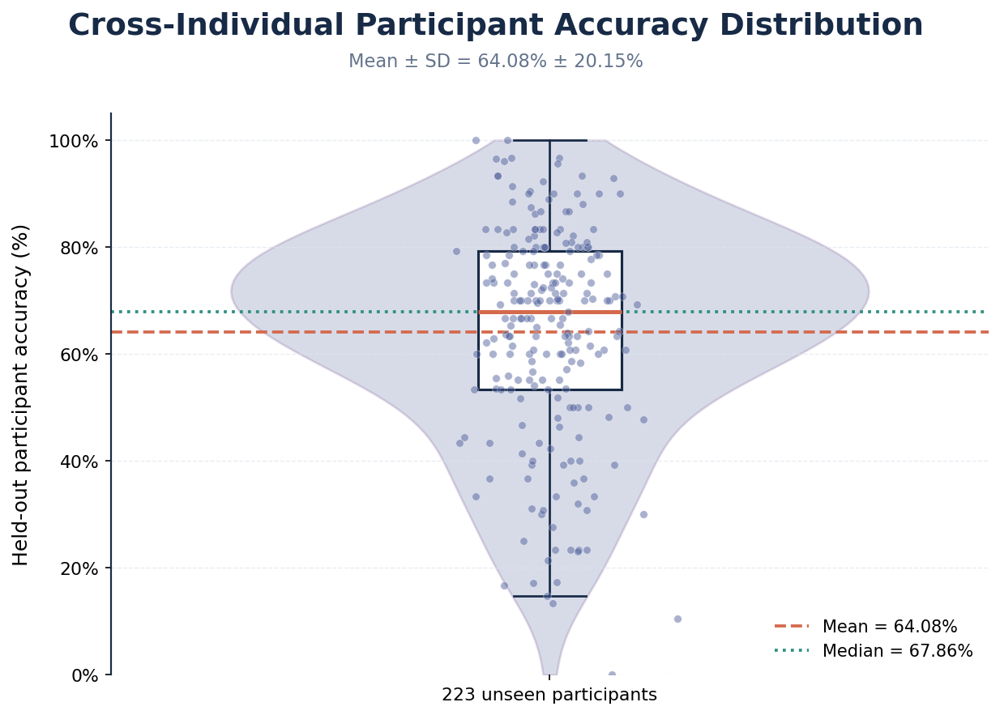

In [ ]:
# ============================================================
# CELL 6 — PARTICIPANT-LEVEL ACCURACY DISTRIBUTION
# ============================================================

mean_accuracy = np.mean(
    subject_accuracy
)

sd_accuracy = np.std(
    subject_accuracy,
    ddof=1
)

median_accuracy = np.median(
    subject_accuracy
)


figure, axis = plt.subplots(
    figsize=(
        8.8,
        6.7
    )
)


# ============================================================
# Violin
# ============================================================

violin = axis.violinplot(
    subject_accuracy,

    positions=[
        1
    ],

    widths=0.80,

    showmeans=False,
    showmedians=False,
    showextrema=False,
)


for body in violin[
    "bodies"
]:

    body.set_facecolor(
        CROSS_INDIGO
    )

    body.set_edgecolor(
        CROSS_PURPLE
    )

    body.set_alpha(
        0.22
    )

    body.set_linewidth(
        1.3
    )


# ============================================================
# Box plot
# ============================================================

axis.boxplot(
    subject_accuracy,

    positions=[
        1
    ],

    widths=0.18,

    patch_artist=True,

    showfliers=False,

    boxprops={
        "facecolor":
            WHITE,

        "edgecolor":
            NAVY,

        "linewidth":
            1.5,
    },

    medianprops={
        "color":
            CROSS_CORAL,

        "linewidth":
            2.4,
    },

    whiskerprops={
        "color":
            NAVY,

        "linewidth":
            1.3,
    },

    capprops={
        "color":
            NAVY,

        "linewidth":
            1.3,
    },
)


# ============================================================
# Individual participants
# ============================================================

rng_points = np.random.default_rng(
    42
)

jitter = (
    1
    +
    rng_points.normal(
        0,
        0.055,
        size=len(
            subject_accuracy
        )
    )
)


axis.scatter(
    jitter,
    subject_accuracy,

    s=21,

    color=CROSS_INDIGO,

    alpha=0.48,

    edgecolor=WHITE,
    linewidth=0.35,

    zorder=4,
)


# ============================================================
# Mean and median
# ============================================================

axis.axhline(
    mean_accuracy,

    linestyle="--",
    linewidth=1.8,

    color=CROSS_CORAL,

    label=(
        f"Mean = {mean_accuracy:.2f}%"
    ),
)


axis.axhline(
    median_accuracy,

    linestyle=":",
    linewidth=1.8,

    color=CROSS_TEAL,

    label=(
        f"Median = {median_accuracy:.2f}%"
    ),
)


axis.set_xlim(
    0.45,
    1.55
)

axis.set_ylim(
    0,
    105
)


axis.set_xticks(
    [
        1
    ],
    labels=[
        "223 unseen participants"
    ],
)


axis.set_ylabel(
    "Held-out participant accuracy (%)",
    labelpad=10,
)


figure.suptitle(
    "Cross-Individual Participant Accuracy Distribution",

    x=0.5,
    y=0.965,

    fontsize=18,
    fontweight="bold",

    color=NAVY,
)


figure.text(
    0.5,
    0.915,

    (
        f"Mean ± SD = "
        f"{mean_accuracy:.2f}% ± "
        f"{sd_accuracy:.2f}%"
    ),

    ha="center",
    va="top",

    fontsize=10.8,
    color=SLATE,
)


axis.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100
    )
)


axis.grid(
    axis="y",
    linestyle="--",
    linewidth=0.65,
    color=GRID,
    alpha=0.70,
)


axis.legend(
    loc="lower right",
    frameon=False,
)


axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)

axis.spines[
    "bottom"
].set_visible(
    False
)


figure.subplots_adjust(
    left=0.14,
    right=0.96,
    top=0.84,
    bottom=0.15,
)


save_premium_figure(
    figure,
    "Figure_Cross_05_Participant_Accuracy_Distribution",
)

plt.show()

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_06_Ranked_Participant_Accuracy.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_06_Ranked_Participant_Accuracy.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_06_Ranked_Participant_Accuracy.svg


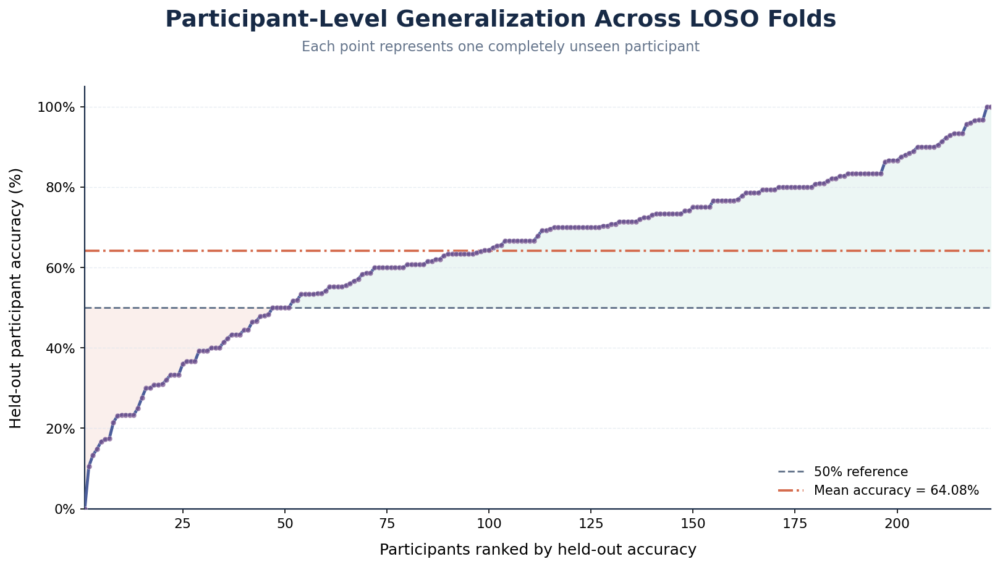

In [ ]:
# ============================================================
# CELL 7 — RANKED PARTICIPANT ACCURACY PROFILE
# ============================================================

sorted_accuracy = np.sort(
    subject_accuracy
)

participant_rank = np.arange(
    1,
    len(
        sorted_accuracy
    ) + 1
)


figure, axis = plt.subplots(
    figsize=(
        11.5,
        6.7
    )
)


# ============================================================
# Areas relative to 50% reference
# ============================================================

axis.fill_between(
    participant_rank,
    sorted_accuracy,
    50,

    where=(
        sorted_accuracy >= 50
    ),

    color=PALE_TEAL,
    alpha=0.90,

    interpolate=True,
)


axis.fill_between(
    participant_rank,
    sorted_accuracy,
    50,

    where=(
        sorted_accuracy < 50
    ),

    color=PALE_CORAL,
    alpha=0.90,

    interpolate=True,
)


# ============================================================
# Profile
# ============================================================

axis.plot(
    participant_rank,
    sorted_accuracy,

    color=CROSS_INDIGO,

    linewidth=2.3,

    zorder=4,
)


axis.scatter(
    participant_rank,
    sorted_accuracy,

    s=18,

    color=CROSS_PURPLE,

    alpha=0.72,

    edgecolor=WHITE,
    linewidth=0.25,

    zorder=5,
)


# ============================================================
# References
# ============================================================

axis.axhline(
    50,

    linestyle="--",
    linewidth=1.4,

    color=SLATE,

    label="50% reference",
)


axis.axhline(
    mean_accuracy,

    linestyle="-.",
    linewidth=1.8,

    color=CROSS_CORAL,

    label=(
        f"Mean accuracy = "
        f"{mean_accuracy:.2f}%"
    ),
)


axis.set_xlim(
    1,
    len(
        sorted_accuracy
    )
)

axis.set_ylim(
    0,
    105
)


axis.set_xlabel(
    "Participants ranked by held-out accuracy",
    labelpad=10,
)

axis.set_ylabel(
    "Held-out participant accuracy (%)",
    labelpad=10,
)


figure.suptitle(
    "Participant-Level Generalization Across LOSO Folds",

    x=0.5,
    y=0.965,

    fontsize=18,
    fontweight="bold",

    color=NAVY,
)


figure.text(
    0.5,
    0.915,

    (
        "Each point represents one completely unseen "
        "participant"
    ),

    ha="center",
    va="top",

    fontsize=10.8,
    color=SLATE,
)


axis.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100
    )
)


axis.grid(
    axis="y",
    linestyle="--",
    linewidth=0.65,
    color=GRID,
    alpha=0.70,
)


axis.legend(
    loc="lower right",
    frameon=False,
)


axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)


figure.subplots_adjust(
    left=0.11,
    right=0.96,
    top=0.84,
    bottom=0.16,
)


save_premium_figure(
    figure,
    "Figure_Cross_06_Ranked_Participant_Accuracy",
)

plt.show()

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_07_Diagnostic_Characteristics.png
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_07_Diagnostic_Characteristics.pdf
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/PREMIUM_PUBLICATION_FIGURES/Figure_Cross_07_Diagnostic_Characteristics.svg


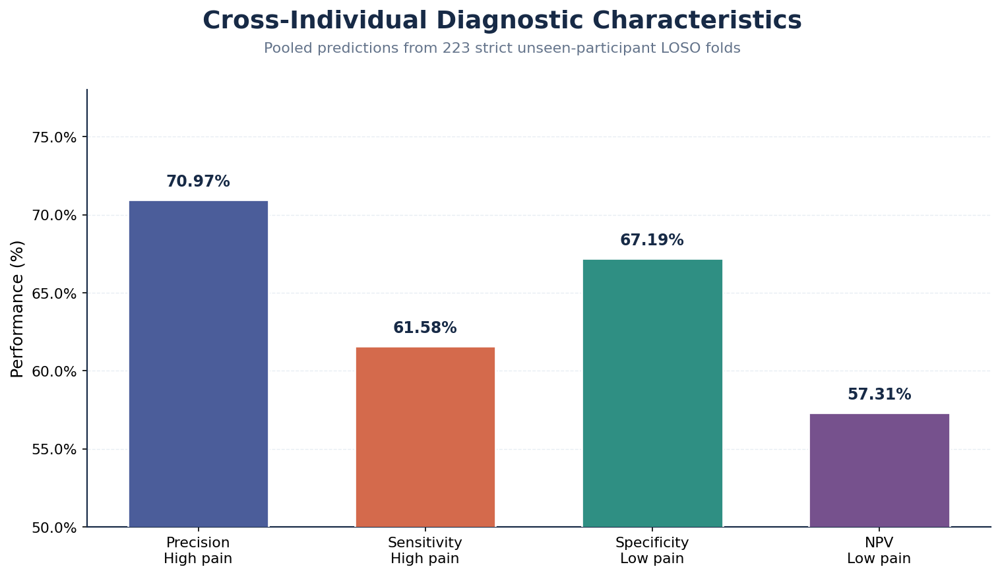

In [ ]:
# ============================================================
# CELL 8 — OPTIONAL DIAGNOSTIC CHARACTERISTICS
# ============================================================

tn, fp, fn, tp = (
    confusion_matrix(
        y_true,
        y_pred,
        labels=[
            0,
            1
        ],
    ).ravel()
)


precision_high = (
    tp
    /
    (
        tp + fp
    )
)

sensitivity_high = (
    tp
    /
    (
        tp + fn
    )
)

specificity_low = (
    tn
    /
    (
        tn + fp
    )
)

npv_low = (
    tn
    /
    (
        tn + fn
    )
)


diagnostic_labels = [
    "Precision\nHigh pain",
    "Sensitivity\nHigh pain",
    "Specificity\nLow pain",
    "NPV\nLow pain",
]


diagnostic_values = (
    np.array(
        [
            precision_high,
            sensitivity_high,
            specificity_low,
            npv_low,
        ]
    )
    *
    100
)


diagnostic_colors = [
    CROSS_INDIGO,
    CROSS_CORAL,
    CROSS_TEAL,
    CROSS_PURPLE,
]


figure, axis = plt.subplots(
    figsize=(
        10.5,
        6.5
    )
)


bars = axis.bar(
    diagnostic_labels,
    diagnostic_values,

    width=0.62,

    color=diagnostic_colors,

    edgecolor=WHITE,
    linewidth=1.3,

    zorder=3,
)


for bar, value in zip(
    bars,
    diagnostic_values
):

    axis.text(
        bar.get_x()
        +
        bar.get_width() / 2,

        value + 0.65,

        f"{value:.2f}%",

        ha="center",
        va="bottom",

        fontsize=11.3,
        fontweight="bold",
        color=NAVY,
    )


axis.set_ylim(
    50,
    78
)

axis.set_ylabel(
    "Performance (%)"
)


figure.suptitle(
    "Cross-Individual Diagnostic Characteristics",

    x=0.5,
    y=0.965,

    fontsize=18,
    fontweight="bold",
    color=NAVY,
)


figure.text(
    0.5,
    0.915,

    (
        "Pooled predictions from 223 strict "
        "unseen-participant LOSO folds"
    ),

    ha="center",
    va="top",

    fontsize=10.7,
    color=SLATE,
)


axis.yaxis.set_major_formatter(
    PercentFormatter(
        xmax=100
    )
)


axis.grid(
    axis="y",
    linestyle="--",
    linewidth=0.65,
    color=GRID,
    alpha=0.70,
    zorder=0,
)


axis.spines[
    "top"
].set_visible(
    False
)

axis.spines[
    "right"
].set_visible(
    False
)


figure.subplots_adjust(
    left=0.10,
    right=0.97,
    top=0.84,
    bottom=0.16,
)


save_premium_figure(
    figure,
    "Figure_Cross_07_Diagnostic_Characteristics",
)

plt.show()

In [ ]:
# ============================================================
# StandardScaler is fitted only on all trials belonging to
# the 222 outer-training participants.
#
# The held-out participant is transformed using the same
# training-derived mean and SD.
# ============================================================

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesClassifier


et_strict_B = Pipeline([

    (
        "training_fold_scaler",

        StandardScaler(
            with_mean=True,
            with_std=True
        )
    ),

    (
        "extra_trees",

        ExtraTreesClassifier(

            n_estimators=150,

            max_depth=12,

            min_samples_leaf=3,

            min_samples_split=5,

            max_features="sqrt",

            class_weight="balanced",

            random_state=42,

            n_jobs=-1
        )
    ),
])


strict_B_result = run_strict_inductive_loso(

    X=X_handcrafted,

    y=y,

    groups=groups,

    estimator=et_strict_B,

    experiment_id=(
        "ExtraTrees__StrictInductive_B__"
        "TrainingFoldStandardScaler"
    ),

    preprocessing_description=(
        "StandardScaler fitted on all trials from the "
        "222 outer-training participants and applied "
        "unchanged to the held-out participant"
    ),

    resume=True,

    overwrite=False,
)


STRICT-INDUCTIVE EXTRA TREES LOSO
Experiment: ExtraTrees__StrictInductive_B__TrainingFoldStandardScaler
Feature matrix: (6275, 262)
Participants: 223
Training participants per fold: 222
Held-out participants per fold: 1
Preprocessing: StandardScaler fitted on all trials from the 222 outer-training participants and applied unchanged to the held-out participant


ExtraTrees__StrictInductive_B__TrainingFoldStandardScaler:   0%|          | 0/223 [00:00<?, ?it/s]


STRICT LOSO COMPLETED


,value
accuracy,0.640159
balanced_accuracy,0.643808
precision,0.709604
recall,0.616056
sensitivity,0.616056
specificity,0.671560
f1_score,0.659530
roc_auc,0.687975
pr_auc,0.736193
mcc,0.285164



Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees__StrictInductive_B__TrainingFoldStandardScaler__trial_predictions.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees__StrictInductive_B__TrainingFoldStandardScaler__subject_results.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees__StrictInductive_B__TrainingFoldStandardScaler__pooled_summary.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees__StrictInductive_B__TrainingFoldStandardScaler__progress.json
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/ExtraTrees__StrictInductive_B__TrainingFoldStandardScale

In [ ]:
# ============================================================
# CELL 5 — Compare
# ============================================================

import os

import numpy as np
import pandas as pd


# ============================================================
# 1. Result paths
# ============================================================

A_PREFIX = os.path.join(

    STRICT_LOSO_DIR,

    (
        "ExtraTrees__StrictInductive_A__"
        "X_handcrafted_NoFeatureScaler"
    )
)


B_PREFIX = os.path.join(

    STRICT_LOSO_DIR,

    (
        "ExtraTrees__StrictInductive_B__"
        "TrainingFoldStandardScaler"
    )
)


A_SUMMARY_PATH = (
    A_PREFIX
    + "__pooled_summary.csv"
)


B_SUMMARY_PATH = (
    B_PREFIX
    + "__pooled_summary.csv"
)


A_PREDICTION_PATH = (
    A_PREFIX
    + "__trial_predictions.csv"
)


B_PREDICTION_PATH = (
    B_PREFIX
    + "__trial_predictions.csv"
)


required_comparison_paths = [

    A_SUMMARY_PATH,

    B_SUMMARY_PATH,

    A_PREDICTION_PATH,

    B_PREDICTION_PATH,
]


missing_comparison_paths = [

    path

    for path
    in required_comparison_paths

    if not os.path.exists(
        path
    )
]


if missing_comparison_paths:

    raise FileNotFoundError(

        "Run both strict LOSO experiments first:\n\n"

        + "\n".join(
            missing_comparison_paths
        )
    )


# ============================================================
# 2. Load summaries
# ============================================================

summary_A = pd.read_csv(
    A_SUMMARY_PATH
).iloc[0]


summary_B = pd.read_csv(
    B_SUMMARY_PATH
).iloc[0]


metrics_to_compare = [

    "accuracy",

    "balanced_accuracy",

    "precision",

    "recall",

    "specificity",

    "f1_score",

    "roc_auc",

    "pr_auc",

    "mcc",

    "cohen_kappa",
]


comparison_rows = []


for metric in metrics_to_compare:

    value_A = float(
        summary_A[
            metric
        ]
    )


    value_B = float(
        summary_B[
            metric
        ]
    )


    comparison_rows.append({

        "metric":
            metric,

        "strict_A_no_scaler_percent":
            value_A * 100.0,

        "strict_B_training_scaler_percent":
            value_B * 100.0,

        "B_minus_A_percentage_points":
            (
                value_B
                - value_A
            ) * 100.0,
    })


comparison_df = pd.DataFrame(
    comparison_rows
)


# ============================================================
# 3. Compare individual predictions
# ============================================================

predictions_A = pd.read_csv(
    A_PREDICTION_PATH
)


predictions_B = pd.read_csv(
    B_PREDICTION_PATH
)


merged_predictions = predictions_A.merge(

    predictions_B,

    on="original_row_index",

    suffixes=(
        "_A",
        "_B"
    ),

    validate="one_to_one"
)


prediction_agreement = np.mean(

    merged_predictions[
        "y_pred_A"
    ].to_numpy()

    ==

    merged_predictions[
        "y_pred_B"
    ].to_numpy()
)


maximum_probability_difference = np.max(

    np.abs(

        merged_predictions[
            "y_score_A"
        ].to_numpy()

        -

        merged_predictions[
            "y_score_B"
        ].to_numpy()
    )
)


# ============================================================
# 4. Save comparison
# ============================================================

COMPARISON_PATH = os.path.join(

    STRICT_LOSO_DIR,

    "Strict_A_vs_Strict_B_metric_comparison.csv"
)


atomic_write_csv(

    comparison_df,

    COMPARISON_PATH
)


# ============================================================
# 5. Display comparison
# ============================================================

print("=" * 78)
print("STRICT A VERSUS STRICT B")
print("=" * 78)


display(
    comparison_df
)


print(
    "\nPrediction-label agreement:",
    f"{prediction_agreement * 100:.4f}%"
)


print(
    "Maximum predicted-probability difference:",
    maximum_probability_difference
)


print(
    "\nComparison saved:",
    COMPARISON_PATH
)

STRICT A VERSUS STRICT B


,metric,strict_A_no_scaler_percent,strict_B_training_scaler_percent,B_minus_A_percentage_points
0,accuracy,64.015936,64.015936,0.000000
1,balanced_accuracy,64.385063,64.380799,-0.004264
2,precision,70.974026,70.960415,-0.013611
3,recall,61.577465,61.605634,0.028169
4,specificity,67.192661,67.155963,-0.036697
5,f1_score,65.942685,65.952955,0.010271
6,roc_auc,68.795824,68.797467,0.001644
7,pr_auc,73.619947,73.619297,-0.000650
8,mcc,28.525180,28.516397,-0.008783
9,cohen_kappa,28.204862,28.198859,-0.006003



Prediction-label agreement: 99.9044%
Maximum predicted-probability difference: 0.006666666666666821

Comparison saved: /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_STRICT_INDUCTIVE_EXTRATREES_LOSO/Strict_A_vs_Strict_B_metric_comparison.csv


In [ ]:
# ============================================================
# CELL 1 — Load V8 data and select five Cz N2/P2 features
#
# No subject-wise post-extraction standardization.
# ============================================================

import os
import json
import time
import warnings

import numpy as np
import pandas as pd

warnings.filterwarnings("ignore")


# ============================================================
# 1. Paths
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

ALIGNED_DIR = os.path.join(
    V8_DIR,
    "aligned_data"
)

CZ_ABLATION_DIR = os.path.join(
    V8_DIR,
    "V8_ABLATION_CZ_N2P2_5"
)

os.makedirs(
    CZ_ABLATION_DIR,
    exist_ok=True
)


X_262_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

FEATURE_NAMES_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_names_262.csv"
)

Y_PATH = os.path.join(
    ALIGNED_DIR,
    "y_v8_binary_6275.npy"
)

GROUPS_PATH = os.path.join(
    ALIGNED_DIR,
    "groups_v8_subject_6275.npy"
)


# ============================================================
# 2. Verify files
# ============================================================

required_paths = [
    X_262_PATH,
    FEATURE_NAMES_PATH,
    Y_PATH,
    GROUPS_PATH,
]

missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]

if missing_paths:
    raise FileNotFoundError(
        "Required files were not found:\n\n"
        + "\n".join(missing_paths)
    )


# ============================================================
# 3. Load data
# ============================================================

X_handcrafted = np.load(
    X_262_PATH,
    mmap_mode="r"
)

y = np.load(
    Y_PATH
).astype(
    np.int8
).ravel()

groups = np.load(
    GROUPS_PATH,
    allow_pickle=True
).astype(
    str
).ravel()

feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)

if "feature_name" in feature_names_df.columns:
    feature_names = (
        feature_names_df["feature_name"]
        .astype(str)
        .tolist()
    )
else:
    feature_names = (
        feature_names_df.iloc[:, -1]
        .astype(str)
        .tolist()
    )


# ============================================================
# 4. Exact Cz morphology features
# ============================================================

CZ_FEATURE_NAMES = [
    "Cz__n2_amplitude",
    "Cz__n2_latency_ms",
    "Cz__p2_amplitude",
    "Cz__p2_latency_ms",
    "Cz__n2p2_peak_to_peak",
]

missing_feature_names = [
    name
    for name in CZ_FEATURE_NAMES
    if name not in feature_names
]

if missing_feature_names:
    raise ValueError(
        "The following Cz features were not found:\n"
        + "\n".join(missing_feature_names)
    )

cz_feature_indices = np.array(
    [
        feature_names.index(name)
        for name in CZ_FEATURE_NAMES
    ],
    dtype=int
)

X_cz_n2p2 = np.asarray(
    X_handcrafted[:, cz_feature_indices],
    dtype=np.float32
)


# ============================================================
# 5. Validation
# ============================================================

assert X_handcrafted.shape == (6275, 262)
assert X_cz_n2p2.shape == (6275, 5)
assert y.shape == (6275,)
assert groups.shape == (6275,)
assert len(np.unique(groups)) == 223

assert np.array_equal(
    np.bincount(y, minlength=2),
    np.array([2725, 3550])
)

assert np.isfinite(
    X_cz_n2p2
).all()


# ============================================================
# 6. Save selected matrix
# ============================================================

CZ_FEATURE_PATH = os.path.join(
    CZ_ABLATION_DIR,
    "X_v8_Cz_N2P2_morphology_5.npy"
)

CZ_FEATURE_NAMES_PATH = os.path.join(
    CZ_ABLATION_DIR,
    "Cz_N2P2_morphology_feature_names_5.csv"
)

np.save(
    CZ_FEATURE_PATH,
    X_cz_n2p2
)

pd.DataFrame(
    {
        "feature_index_in_original_262":
            cz_feature_indices,

        "feature_name":
            CZ_FEATURE_NAMES,
    }
).to_csv(
    CZ_FEATURE_NAMES_PATH,
    index=False
)


print("=" * 78)
print("CZ N2/P2 ABLATION DATA READY")
print("=" * 78)

print("Original matrix:", X_handcrafted.shape)
print("Selected matrix:", X_cz_n2p2.shape)
print("Participants:", len(np.unique(groups)))
print("Class counts:", np.bincount(y).tolist())

print("\nSelected features:")

for index, name in zip(
    cz_feature_indices,
    CZ_FEATURE_NAMES
):
    print(f"{index:3d}  {name}")

print(
    "\nNo subject-wise post-extraction "
    "standardization was applied."
)

CZ N2/P2 ABLATION DATA READY
Original matrix: (6275, 262)
Selected matrix: (6275, 5)
Participants: 223
Class counts: [2725, 3550]

Selected features:
110  Cz__n2_amplitude
111  Cz__n2_latency_ms
112  Cz__p2_amplitude
113  Cz__p2_latency_ms
114  Cz__n2p2_peak_to_peak

No subject-wise post-extraction standardization was applied.


In [ ]:
# ============================================================
# CELL 2 — Metrics, saving helpers and fixed Extra Trees model
# ============================================================

from tqdm.auto import tqdm

from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)


# Same classifier used for the full 262-feature model
ET_PARAMETERS = {
    "n_estimators": 150,
    "max_depth": 12,
    "min_samples_leaf": 3,
    "min_samples_split": 5,
    "max_features": "sqrt",
    "class_weight": "balanced",
    "random_state": 42,
    "n_jobs": -1,
}


def make_extra_trees():
    return ExtraTreesClassifier(
        **ET_PARAMETERS
    )


def atomic_write_csv(
    dataframe,
    path
):
    temporary_path = path + ".tmp"

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        path
    )


def atomic_write_json(
    content,
    path
):
    temporary_path = path + ".tmp"

    with open(
        temporary_path,
        "w",
        encoding="utf-8"
    ) as file:
        json.dump(
            content,
            file,
            indent=4,
            default=str
        )

    os.replace(
        temporary_path,
        path
    )


def get_high_pain_probability(
    fitted_model,
    X_test
):
    probabilities = np.asarray(
        fitted_model.predict_proba(
            X_test
        ),
        dtype=float
    )

    classes = np.asarray(
        fitted_model.classes_
    )

    positions = np.flatnonzero(
        classes == 1
    )

    if positions.size != 1:
        raise ValueError(
            "Positive class 1 was not found."
        )

    return probabilities[
        :,
        int(positions[0])
    ]


def calculate_binary_metrics(
    y_true,
    y_pred,
    y_score
):
    y_true = np.asarray(
        y_true,
        dtype=np.int8
    ).ravel()

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    ).ravel()

    y_score = np.asarray(
        y_score,
        dtype=float
    ).ravel()

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()

    has_both_classes = (
        np.unique(y_true).size == 2
    )

    recall = recall_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )

    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else np.nan
    )

    try:
        mcc = matthews_corrcoef(
            y_true,
            y_pred
        )
    except Exception:
        mcc = np.nan

    try:
        kappa = cohen_kappa_score(
            y_true,
            y_pred
        )

        if not np.isfinite(kappa):
            kappa = np.nan

    except Exception:
        kappa = np.nan

    return {
        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "balanced_accuracy":
            (
                balanced_accuracy_score(
                    y_true,
                    y_pred
                )
                if has_both_classes
                else np.nan
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "recall":
            recall,

        "sensitivity":
            recall,

        "specificity":
            specificity,

        "f1_score":
            f1_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "roc_auc":
            (
                roc_auc_score(
                    y_true,
                    y_score
                )
                if has_both_classes
                else np.nan
            ),

        "pr_auc":
            (
                average_precision_score(
                    y_true,
                    y_score
                )
                if has_both_classes
                else np.nan
            ),

        "mcc":
            mcc,

        "cohen_kappa":
            kappa,

        "true_negative":
            int(tn),

        "false_positive":
            int(fp),

        "false_negative":
            int(fn),

        "true_positive":
            int(tp),

        "support_low":
            int(np.sum(y_true == 0)),

        "support_high":
            int(np.sum(y_true == 1)),
    }


print("Shared helpers are ready.")
print(ET_PARAMETERS)

Shared helpers are ready.
{'n_estimators': 150, 'max_depth': 12, 'min_samples_leaf': 3, 'min_samples_split': 5, 'max_features': 'sqrt', 'class_weight': 'balanced', 'random_state': 42, 'n_jobs': -1}


In [ ]:
# ============================================================
# CELL 3 — Define within-individual LOOCV
#
# One trial held out.
# Remaining trials from the same participant used for training.
# ============================================================

def run_cz_within_individual_loocv(
    X,
    y,
    groups,
    resume=True,
    overwrite=False,
):
    X = np.asarray(
        X,
        dtype=np.float32
    )

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()

    groups = np.asarray(
        groups
    ).astype(str).ravel()


    # ========================================================
    # 1. Strict eligibility
    # ========================================================

    balance_table = (
        pd.DataFrame(
            {
                "subject_id": groups,
                "pain_label": y,
            }
        )
        .groupby(
            [
                "subject_id",
                "pain_label",
            ]
        )
        .size()
        .unstack(
            fill_value=0
        )
        .reindex(
            columns=[0, 1],
            fill_value=0
        )
    )

    balance_table.columns = [
        "n_low",
        "n_high",
    ]

    eligible_subjects = (
        balance_table.index[
            (balance_table["n_low"] >= 2)
            &
            (balance_table["n_high"] >= 2)
        ]
        .astype(str)
        .to_numpy()
    )

    eligible_subjects = np.sort(
        eligible_subjects
    )

    eligible_mask = np.isin(
        groups,
        eligible_subjects
    )

    expected_indices = np.flatnonzero(
        eligible_mask
    )

    assert len(eligible_subjects) == 192
    assert len(expected_indices) == 5408


    # ========================================================
    # 2. Output files
    # ========================================================

    experiment_id = (
        "ExtraTrees__Cz_N2P2_5__"
        "WithinIndividual_LOOCV_Strict192"
    )

    prefix = os.path.join(
        CZ_ABLATION_DIR,
        experiment_id
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    subject_result_path = (
        prefix
        + "__subject_results.csv"
    )

    summary_path = (
        prefix
        + "__pooled_summary.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )

    configuration_path = (
        prefix
        + "__configuration.json"
    )

    output_paths = [
        prediction_path,
        subject_result_path,
        summary_path,
        progress_path,
        configuration_path,
    ]

    if overwrite:
        for path in output_paths:
            if os.path.exists(path):
                os.remove(path)


    # ========================================================
    # 3. Resume previous work
    # ========================================================

    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):
        predictions_df = pd.read_csv(
            prediction_path
        )

        predictions_df[
            "test_subject"
        ] = predictions_df[
            "test_subject"
        ].astype(str)

        completed_subjects = set(
            predictions_df[
                "test_subject"
            ].unique()
        )

        print(
            "Resuming completed participants:",
            len(completed_subjects),
            "/ 192"
        )

    else:
        predictions_df = pd.DataFrame()
        completed_subjects = set()


    atomic_write_json(
        {
            "experiment_id":
                experiment_id,

            "evaluation":
                "Within-individual leave-one-trial-out CV",

            "participants":
                192,

            "evaluated_trials":
                5408,

            "features":
                CZ_FEATURE_NAMES,

            "feature_count":
                5,

            "post_extraction_standardization":
                "None",

            "decision_threshold":
                0.50,

            "extra_trees_parameters":
                ET_PARAMETERS,
        },
        configuration_path
    )


    # ========================================================
    # 4. Trial-level LOOCV
    # ========================================================

    print("\n" + "=" * 78)
    print("CZ N2/P2 WITHIN-INDIVIDUAL LOOCV")
    print("=" * 78)

    print("Participants:", 192)
    print("Evaluated trials:", 5408)
    print("Features:", 5)

    start_time = time.perf_counter()

    for subject_id in tqdm(
        eligible_subjects,
        desc="Cz N2/P2 within-individual LOOCV"
    ):
        if subject_id in completed_subjects:
            continue

        subject_indices = np.flatnonzero(
            groups == subject_id
        )

        X_subject = X[
            subject_indices
        ]

        y_subject = y[
            subject_indices
        ]

        subject_prediction_rows = []

        for local_test_index in range(
            len(subject_indices)
        ):
            local_train_mask = np.ones(
                len(subject_indices),
                dtype=bool
            )

            local_train_mask[
                local_test_index
            ] = False

            X_train = X_subject[
                local_train_mask
            ]

            y_train = y_subject[
                local_train_mask
            ]

            X_test = X_subject[
                local_test_index:
                local_test_index + 1
            ]

            y_test = int(
                y_subject[
                    local_test_index
                ]
            )

            if np.unique(y_train).size != 2:
                raise RuntimeError(
                    f"{subject_id}: training fold "
                    "does not contain both classes."
                )

            model = make_extra_trees()

            model.fit(
                X_train,
                y_train
            )

            y_pred = int(
                model.predict(
                    X_test
                )[0]
            )

            y_score = float(
                get_high_pain_probability(
                    model,
                    X_test
                )[0]
            )

            subject_prediction_rows.append(
                {
                    "original_row_index":
                        int(
                            subject_indices[
                                local_test_index
                            ]
                        ),

                    "test_subject":
                        subject_id,

                    "y_true":
                        y_test,

                    "y_pred":
                        y_pred,

                    "y_score":
                        y_score,
                }
            )

        predictions_df = pd.concat(
            [
                predictions_df,
                pd.DataFrame(
                    subject_prediction_rows
                ),
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )

        atomic_write_csv(
            predictions_df,
            prediction_path
        )

        completed_subjects.add(
            subject_id
        )

        atomic_write_json(
            {
                "completed":
                    False,

                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    192,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    5408,
            },
            progress_path
        )


    # ========================================================
    # 5. Validate final predictions
    # ========================================================

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    assert len(predictions_df) == 5408

    assert not predictions_df[
        "original_row_index"
    ].duplicated().any()

    assert np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(int),
        expected_indices
    )


    # ========================================================
    # 6. Metrics
    # ========================================================

    pooled_metrics = calculate_binary_metrics(
        predictions_df["y_true"],
        predictions_df["y_pred"],
        predictions_df["y_score"],
    )

    subject_rows = []

    for (
        subject_id,
        subject_df
    ) in predictions_df.groupby(
        "test_subject",
        sort=True
    ):
        metrics = calculate_binary_metrics(
            subject_df["y_true"],
            subject_df["y_pred"],
            subject_df["y_score"],
        )

        subject_rows.append(
            {
                "test_subject":
                    subject_id,

                "n_trials":
                    len(subject_df),

                **metrics,
            }
        )

    subject_results_df = pd.DataFrame(
        subject_rows
    )

    pooled_metrics[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()

    pooled_metrics[
        "subject_accuracy_sd"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )

    pooled_metrics[
        "runtime_minutes_current_session"
    ] = (
        time.perf_counter()
        - start_time
    ) / 60.0

    summary_df = pd.DataFrame(
        [pooled_metrics]
    )


    # ========================================================
    # 7. Save
    # ========================================================

    atomic_write_csv(
        subject_results_df,
        subject_result_path
    )

    atomic_write_csv(
        summary_df,
        summary_path
    )

    atomic_write_json(
        {
            "completed":
                True,

            "completed_subjects":
                192,

            "total_subjects":
                192,

            "completed_predictions":
                5408,

            "summary_path":
                summary_path,
        },
        progress_path
    )

    print("\n" + "=" * 78)
    print("CZ N2/P2 WITHIN-INDIVIDUAL LOOCV COMPLETED")
    print("=" * 78)

    display(
        summary_df.T.rename(
            columns={0: "value"}
        )
    )

    print("\nSaved summary:")
    print(summary_path)

    return {
        "predictions":
            predictions_df,

        "subject_results":
            subject_results_df,

        "summary":
            summary_df,
    }


print("Within-individual evaluator defined.")

Within-individual evaluator defined.


In [ ]:
# ============================================================
# CELL 4 — Run or resume within-individual LOOCV
# ============================================================

cz_within_result = run_cz_within_individual_loocv(
    X=X_cz_n2p2,
    y=y,
    groups=groups,
    resume=True,
    overwrite=False,
)

Resuming completed participants: 192 / 192

CZ N2/P2 WITHIN-INDIVIDUAL LOOCV
Participants: 192
Evaluated trials: 5408
Features: 5


Cz N2/P2 within-individual LOOCV:   0%|          | 0/192 [00:00<?, ?it/s]


CZ N2/P2 WITHIN-INDIVIDUAL LOOCV COMPLETED


,value
accuracy,0.706916
balanced_accuracy,0.706467
precision,0.732339
recall,0.712854
sensitivity,0.712854
specificity,0.700080
f1_score,0.722465
roc_auc,0.787218
pr_auc,0.796203
mcc,0.412273



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_CZ_N2P2_5/ExtraTrees__Cz_N2P2_5__WithinIndividual_LOOCV_Strict192__pooled_summary.csv


In [ ]:
# ============================================================
# CELL 5 — Strict-inductive cross-individual LOSO
#
# 222 participants used for training.
# One participant completely held out.
# ============================================================

def run_cz_cross_individual_loso(
    X,
    y,
    groups,
    resume=True,
    overwrite=False,
):
    X = np.asarray(
        X,
        dtype=np.float32
    )

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()

    groups = np.asarray(
        groups
    ).astype(str).ravel()

    subjects = np.sort(
        np.unique(groups)
    )

    assert X.shape == (6275, 5)
    assert len(subjects) == 223
    assert np.isfinite(X).all()


    # ========================================================
    # 1. Output files
    # ========================================================

    experiment_id = (
        "ExtraTrees__Cz_N2P2_5__"
        "CrossIndividual_LOSO_Strict223"
    )

    prefix = os.path.join(
        CZ_ABLATION_DIR,
        experiment_id
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    subject_result_path = (
        prefix
        + "__subject_results.csv"
    )

    summary_path = (
        prefix
        + "__pooled_summary.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )

    configuration_path = (
        prefix
        + "__configuration.json"
    )

    output_paths = [
        prediction_path,
        subject_result_path,
        summary_path,
        progress_path,
        configuration_path,
    ]

    if overwrite:
        for path in output_paths:
            if os.path.exists(path):
                os.remove(path)


    # ========================================================
    # 2. Resume
    # ========================================================

    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):
        predictions_df = pd.read_csv(
            prediction_path
        )

        predictions_df[
            "test_subject"
        ] = predictions_df[
            "test_subject"
        ].astype(str)

        completed_subjects = set(
            predictions_df[
                "test_subject"
            ].unique()
        )

        print(
            "Resuming completed participants:",
            len(completed_subjects),
            "/ 223"
        )

    else:
        predictions_df = pd.DataFrame()
        completed_subjects = set()


    atomic_write_json(
        {
            "experiment_id":
                experiment_id,

            "evaluation":
                "Strict-inductive leave-one-subject-out CV",

            "participants":
                223,

            "training_participants_per_fold":
                222,

            "held_out_participants_per_fold":
                1,

            "evaluated_trials":
                6275,

            "features":
                CZ_FEATURE_NAMES,

            "feature_count":
                5,

            "post_extraction_standardization":
                "None",

            "decision_threshold":
                0.50,

            "extra_trees_parameters":
                ET_PARAMETERS,
        },
        configuration_path
    )


    # ========================================================
    # 3. LOSO loop
    # ========================================================

    print("\n" + "=" * 78)
    print("CZ N2/P2 STRICT CROSS-INDIVIDUAL LOSO")
    print("=" * 78)

    print("Participants:", 223)
    print("Training participants per fold:", 222)
    print("Held-out participant per fold:", 1)
    print("Features:", 5)

    start_time = time.perf_counter()

    for test_subject in tqdm(
        subjects,
        desc="Cz N2/P2 cross-individual LOSO"
    ):
        if test_subject in completed_subjects:
            continue

        test_mask = (
            groups == test_subject
        )

        train_mask = ~test_mask

        n_training_subjects = np.unique(
            groups[
                train_mask
            ]
        ).size

        if n_training_subjects != 222:
            raise RuntimeError(
                f"{test_subject}: expected 222 "
                "training participants, found "
                f"{n_training_subjects}."
            )

        X_train = X[
            train_mask
        ]

        y_train = y[
            train_mask
        ]

        X_test = X[
            test_mask
        ]

        y_test = y[
            test_mask
        ]

        model = make_extra_trees()

        model.fit(
            X_train,
            y_train
        )

        y_pred = model.predict(
            X_test
        ).astype(
            np.int8
        )

        y_score = get_high_pain_probability(
            model,
            X_test
        )

        original_indices = np.flatnonzero(
            test_mask
        )

        fold_predictions_df = pd.DataFrame(
            {
                "original_row_index":
                    original_indices,

                "test_subject":
                    test_subject,

                "y_true":
                    y_test,

                "y_pred":
                    y_pred,

                "y_score":
                    y_score,
            }
        )

        predictions_df = pd.concat(
            [
                predictions_df,
                fold_predictions_df,
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )

        atomic_write_csv(
            predictions_df,
            prediction_path
        )

        completed_subjects.add(
            test_subject
        )

        atomic_write_json(
            {
                "completed":
                    False,

                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    223,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    6275,
            },
            progress_path
        )


    # ========================================================
    # 4. Validate
    # ========================================================

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    assert len(predictions_df) == 6275

    assert not predictions_df[
        "original_row_index"
    ].duplicated().any()

    assert np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(int),
        np.arange(6275)
    )


    # ========================================================
    # 5. Metrics
    # ========================================================

    pooled_metrics = calculate_binary_metrics(
        predictions_df["y_true"],
        predictions_df["y_pred"],
        predictions_df["y_score"],
    )

    subject_rows = []

    for (
        subject_id,
        subject_df
    ) in predictions_df.groupby(
        "test_subject",
        sort=True
    ):
        metrics = calculate_binary_metrics(
            subject_df["y_true"],
            subject_df["y_pred"],
            subject_df["y_score"],
        )

        subject_rows.append(
            {
                "test_subject":
                    subject_id,

                "n_trials":
                    len(subject_df),

                **metrics,
            }
        )

    subject_results_df = pd.DataFrame(
        subject_rows
    )

    pooled_metrics[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()

    pooled_metrics[
        "subject_accuracy_sd"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )

    pooled_metrics[
        "runtime_minutes_current_session"
    ] = (
        time.perf_counter()
        - start_time
    ) / 60.0

    summary_df = pd.DataFrame(
        [pooled_metrics]
    )


    # ========================================================
    # 6. Save
    # ========================================================

    atomic_write_csv(
        subject_results_df,
        subject_result_path
    )

    atomic_write_csv(
        summary_df,
        summary_path
    )

    atomic_write_json(
        {
            "completed":
                True,

            "completed_subjects":
                223,

            "total_subjects":
                223,

            "completed_predictions":
                6275,

            "summary_path":
                summary_path,
        },
        progress_path
    )

    print("\n" + "=" * 78)
    print("CZ N2/P2 CROSS-INDIVIDUAL LOSO COMPLETED")
    print("=" * 78)

    display(
        summary_df.T.rename(
            columns={0: "value"}
        )
    )

    print("\nSaved summary:")
    print(summary_path)

    return {
        "predictions":
            predictions_df,

        "subject_results":
            subject_results_df,

        "summary":
            summary_df,
    }


print("Cross-individual evaluator defined.")

Cross-individual evaluator defined.


In [ ]:
# ============================================================
# CELL 6 — Run or resume cross-individual LOSO
# ============================================================

cz_cross_result = run_cz_cross_individual_loso(
    X=X_cz_n2p2,
    y=y,
    groups=groups,
    resume=True,
    overwrite=False,
)

Resuming completed participants: 223 / 223

CZ N2/P2 STRICT CROSS-INDIVIDUAL LOSO
Participants: 223
Training participants per fold: 222
Held-out participant per fold: 1
Features: 5


Cz N2/P2 cross-individual LOSO:   0%|          | 0/223 [00:00<?, ?it/s]


CZ N2/P2 CROSS-INDIVIDUAL LOSO COMPLETED


,value
accuracy,0.630598
balanced_accuracy,0.636167
precision,0.706434
recall,0.593803
sensitivity,0.593803
specificity,0.678532
f1_score,0.645240
roc_auc,0.670636
pr_auc,0.718129
mcc,0.270295



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_CZ_N2P2_5/ExtraTrees__Cz_N2P2_5__CrossIndividual_LOSO_Strict223__pooled_summary.csv


In [ ]:
# ============================================================
# CELL 7 — Cz N2/P2 versus full 262-feature representation
# ============================================================

CZ_WITHIN_SUMMARY_PATH = os.path.join(
    CZ_ABLATION_DIR,
    (
        "ExtraTrees__Cz_N2P2_5__"
        "WithinIndividual_LOOCV_Strict192"
        "__pooled_summary.csv"
    )
)

CZ_CROSS_SUMMARY_PATH = os.path.join(
    CZ_ABLATION_DIR,
    (
        "ExtraTrees__Cz_N2P2_5__"
        "CrossIndividual_LOSO_Strict223"
        "__pooled_summary.csv"
    )
)

FULL_WITHIN_SUMMARY_PATH = os.path.join(
    V8_DIR,
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192",
    (
        "ExtraTrees__Handcrafted_262_noPCA__"
        "v8_full0_2000ms_no_pca_strict192"
        "__pooled_summary.csv"
    )
)

FULL_CROSS_SUMMARY_PATH = os.path.join(
    V8_DIR,
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO",
    (
        "ExtraTrees__StrictInductive_A__"
        "X_handcrafted_NoFeatureScaler"
        "__pooled_summary.csv"
    )
)

required_paths = [
    CZ_WITHIN_SUMMARY_PATH,
    CZ_CROSS_SUMMARY_PATH,
    FULL_WITHIN_SUMMARY_PATH,
    FULL_CROSS_SUMMARY_PATH,
]

missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]

if missing_paths:
    raise FileNotFoundError(
        "Missing result files:\n\n"
        + "\n".join(missing_paths)
    )


cz_within = pd.read_csv(
    CZ_WITHIN_SUMMARY_PATH
).iloc[0]

cz_cross = pd.read_csv(
    CZ_CROSS_SUMMARY_PATH
).iloc[0]

full_within = pd.read_csv(
    FULL_WITHIN_SUMMARY_PATH
).iloc[0]

full_cross = pd.read_csv(
    FULL_CROSS_SUMMARY_PATH
).iloc[0]


def obtain_metric(
    row,
    possible_names
):
    for name in possible_names:
        if (
            name in row.index
            and pd.notna(row[name])
        ):
            return float(
                row[name]
            )

    return np.nan


METRIC_ALIASES = {
    "accuracy":
        ["accuracy"],

    "balanced_accuracy":
        ["balanced_accuracy"],

    "precision":
        ["precision"],

    "recall":
        ["recall", "sensitivity"],

    "specificity":
        ["specificity"],

    "f1_score":
        ["f1_score"],

    "roc_auc":
        ["roc_auc"],

    "cohen_kappa":
        ["cohen_kappa"],
}


sources = [
    (
        "Within-individual LOOCV",
        "Cz N2/P2 morphology",
        5,
        cz_within,
    ),
    (
        "Within-individual LOOCV",
        "Proposed full representation",
        262,
        full_within,
    ),
    (
        "Cross-individual LOSO",
        "Cz N2/P2 morphology",
        5,
        cz_cross,
    ),
    (
        "Cross-individual LOSO",
        "Proposed full representation",
        262,
        full_cross,
    ),
]

comparison_rows = []

for (
    evaluation,
    representation,
    feature_count,
    result_row,
) in sources:
    output_row = {
        "evaluation":
            evaluation,

        "feature_representation":
            representation,

        "feature_count":
            feature_count,
    }

    for metric, aliases in METRIC_ALIASES.items():
        output_row[
            metric
        ] = (
            obtain_metric(
                result_row,
                aliases
            )
            * 100.0
        )

    comparison_rows.append(
        output_row
    )

comparison_df = pd.DataFrame(
    comparison_rows
)


# Full 262 minus Cz five-feature performance
delta_rows = []

for evaluation in [
    "Within-individual LOOCV",
    "Cross-individual LOSO",
]:
    current = comparison_df[
        comparison_df[
            "evaluation"
        ] == evaluation
    ]

    cz_row = current[
        current[
            "feature_count"
        ] == 5
    ].iloc[0]

    full_row = current[
        current[
            "feature_count"
        ] == 262
    ].iloc[0]

    delta_row = {
        "evaluation":
            evaluation
    }

    for metric in METRIC_ALIASES:
        delta_row[
            f"delta_{metric}_percentage_points"
        ] = (
            full_row[metric]
            - cz_row[metric]
        )

    delta_rows.append(
        delta_row
    )

delta_df = pd.DataFrame(
    delta_rows
)


COMPARISON_PATH = os.path.join(
    CZ_ABLATION_DIR,
    "Cz_N2P2_5_vs_Full262_comparison.csv"
)

DELTA_PATH = os.path.join(
    CZ_ABLATION_DIR,
    "Full262_minus_Cz_N2P2_5_deltas.csv"
)

atomic_write_csv(
    comparison_df,
    COMPARISON_PATH
)

atomic_write_csv(
    delta_df,
    DELTA_PATH
)


print("=" * 78)
print("CZ N2/P2 VERSUS FULL 262 FEATURES")
print("=" * 78)

display(
    comparison_df
)

print("\nFull 262 minus Cz five-feature changes:")

display(
    delta_df
)

print("\nSaved:")
print(COMPARISON_PATH)
print(DELTA_PATH)

CZ N2/P2 VERSUS FULL 262 FEATURES


,evaluation,feature_representation,feature_count,accuracy,balanced_accuracy,precision,recall,specificity,f1_score,roc_auc,cohen_kappa
0,Within-individual LOOCV,Cz N2/P2 morphology,5,70.691568,70.646687,73.233937,71.285418,70.007955,72.246542,78.721839,41.210505
1,Within-individual LOOCV,Proposed full representation,262,76.146450,76.022869,77.674258,77.781617,74.264121,77.727901,83.735820,52.051175
2,Cross-individual LOSO,Cz N2/P2 morphology,5,63.059761,63.616746,70.643432,59.380282,67.853211,64.524028,67.063569,26.591705
3,Cross-individual LOSO,Proposed full representation,262,64.015936,64.385063,70.974026,61.577465,67.192661,65.942685,68.795824,28.204862



Full 262 minus Cz five-feature changes:


,evaluation,delta_accuracy_percentage_points,delta_balanced_accuracy_percentage_points,delta_precision_percentage_points,delta_recall_percentage_points,delta_specificity_percentage_points,delta_f1_score_percentage_points,delta_roc_auc_percentage_points,delta_cohen_kappa_percentage_points
0,Within-individual LOOCV,5.454882,5.376182,4.440321,6.496199,4.256165,5.481359,5.013981,10.840670
1,Cross-individual LOSO,0.956175,0.768316,0.330594,2.197183,-0.660550,1.418657,1.732255,1.613157



Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_CZ_N2P2_5/Cz_N2P2_5_vs_Full262_comparison.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_CZ_N2P2_5/Full262_minus_Cz_N2P2_5_deltas.csv


In [ ]:
# ============================================================
# CELL 1 — LOAD V8 DATA AND SELECT
#          12 CHANNELS × 5 N2/P2 FEATURES = 60 FEATURES
#
# Run after mounting Google Drive.
#
# Important:
#   Uses X_handcrafted.
#   Does not use X_handcrafted_standardized.
# ============================================================

import os
import json
import time
import warnings

import numpy as np
import pandas as pd

warnings.filterwarnings("ignore")


# ============================================================
# 1. Directories
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_DIR = os.path.join(
    V8_DIR,
    "handcrafted_features"
)

ALIGNED_DIR = os.path.join(
    V8_DIR,
    "aligned_data"
)

N2P2_60_DIR = os.path.join(
    V8_DIR,
    "V8_ABLATION_12CH_N2P2_60"
)

os.makedirs(
    N2P2_60_DIR,
    exist_ok=True
)


# ============================================================
# 2. Required file paths
# ============================================================

X_262_PATH = os.path.join(
    FEATURE_DIR,
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

FEATURE_NAMES_PATH = os.path.join(
    FEATURE_DIR,
    "v8_handcrafted_feature_names_262.csv"
)

Y_PATH = os.path.join(
    ALIGNED_DIR,
    "y_v8_binary_6275.npy"
)

GROUPS_PATH = os.path.join(
    ALIGNED_DIR,
    "groups_v8_subject_6275.npy"
)


required_paths = [
    X_262_PATH,
    FEATURE_NAMES_PATH,
    Y_PATH,
    GROUPS_PATH,
]

missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]

if missing_paths:
    raise FileNotFoundError(
        "Required files were not found:\n\n"
        + "\n".join(missing_paths)
    )


# ============================================================
# 3. Load feature matrix, labels and subject groups
# ============================================================

X_handcrafted = np.load(
    X_262_PATH,
    mmap_mode="r"
)

y = np.load(
    Y_PATH
).astype(
    np.int8
).ravel()

groups_raw = np.load(
    GROUPS_PATH,
    allow_pickle=True
).ravel()


def clean_subject_id(value):

    if isinstance(value, bytes):
        value = value.decode("utf-8")

    return str(value).strip()


groups = np.asarray(
    [
        clean_subject_id(value)
        for value in groups_raw
    ],
    dtype=str
)


# ============================================================
# 4. Load feature names
# ============================================================

feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)

if "feature_name" in feature_names_df.columns:

    feature_names = (
        feature_names_df[
            "feature_name"
        ]
        .astype(str)
        .tolist()
    )

else:

    # Uses the last column in case the first column
    # contains a saved DataFrame index.
    feature_names = (
        feature_names_df
        .iloc[:, -1]
        .astype(str)
        .tolist()
    )


# ============================================================
# 5. Define the exact 12 channels
# ============================================================

CHANNELS_12 = [
    "Fz",
    "FC1",
    "FC2",
    "C3",
    "C1",
    "Cz",
    "C2",
    "C4",
    "CP1",
    "CPz",
    "CP2",
    "Pz",
]


# ============================================================
# 6. Resolve the five morphology feature suffixes
#
# This supports either:
#   n2_amplitude / p2_amplitude
# or older naming:
#   n2_amp / p2_amp
# ============================================================

MORPHOLOGY_SUFFIX_CANDIDATES = {
    "n2_amplitude": [
        "n2_amplitude",
        "n2_amp",
    ],

    "n2_latency_ms": [
        "n2_latency_ms",
    ],

    "p2_amplitude": [
        "p2_amplitude",
        "p2_amp",
    ],

    "p2_latency_ms": [
        "p2_latency_ms",
    ],

    "n2p2_peak_to_peak": [
        "n2p2_peak_to_peak",
    ],
}


resolved_suffixes = []


for logical_name, candidates in (
    MORPHOLOGY_SUFFIX_CANDIDATES.items()
):

    chosen_candidate = None

    for candidate in candidates:

        expected_names_for_candidate = [
            f"{channel}__{candidate}"
            for channel in CHANNELS_12
        ]

        if all(
            name in feature_names
            for name in expected_names_for_candidate
        ):
            chosen_candidate = candidate
            break

    if chosen_candidate is None:

        raise ValueError(
            "Could not locate the feature family "
            f"'{logical_name}' for all 12 channels.\n"
            f"Checked suffixes: {candidates}"
        )

    resolved_suffixes.append(
        chosen_candidate
    )


# ============================================================
# 7. Build exact 60-feature name list
#
# Channel-major ordering:
#   Fz  five features
#   FC1 five features
#   ...
#   Pz  five features
# ============================================================

N2P2_60_FEATURE_NAMES = []

for channel in CHANNELS_12:

    for suffix in resolved_suffixes:

        N2P2_60_FEATURE_NAMES.append(
            f"{channel}__{suffix}"
        )


assert len(
    N2P2_60_FEATURE_NAMES
) == 60


missing_selected_features = [
    name
    for name in N2P2_60_FEATURE_NAMES
    if name not in feature_names
]

if missing_selected_features:

    raise ValueError(
        "These selected features were not found:\n"
        + "\n".join(missing_selected_features)
    )


# ============================================================
# 8. Obtain original column indices
# ============================================================

n2p2_60_feature_indices = np.asarray(
    [
        feature_names.index(name)
        for name in N2P2_60_FEATURE_NAMES
    ],
    dtype=int
)

if len(
    np.unique(
        n2p2_60_feature_indices
    )
) != 60:

    raise ValueError(
        "Duplicate feature indices were detected."
    )


# ============================================================
# 9. Create the 60-feature matrix
# ============================================================

X_n2p2_60 = np.asarray(
    X_handcrafted[
        :,
        n2p2_60_feature_indices
    ],
    dtype=np.float32
)


# ============================================================
# 10. Strict validation
# ============================================================

assert X_handcrafted.shape == (
    6275,
    262
)

assert X_n2p2_60.shape == (
    6275,
    60
)

assert y.shape == (
    6275,
)

assert groups.shape == (
    6275,
)

assert len(
    np.unique(groups)
) == 223

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([
        2725,
        3550,
    ])
)

assert np.isfinite(
    X_n2p2_60
).all()


# ============================================================
# 11. Save selected feature matrix and names
# ============================================================

X_N2P2_60_PATH = os.path.join(
    N2P2_60_DIR,
    "X_v8_12channel_N2P2_morphology_60.npy"
)

N2P2_60_NAMES_PATH = os.path.join(
    N2P2_60_DIR,
    "12channel_N2P2_morphology_feature_names_60.csv"
)

np.save(
    X_N2P2_60_PATH,
    X_n2p2_60
)

pd.DataFrame(
    {
        "feature_index_in_original_262":
            n2p2_60_feature_indices,

        "feature_name":
            N2P2_60_FEATURE_NAMES,
    }
).to_csv(
    N2P2_60_NAMES_PATH,
    index=False
)


# ============================================================
# 12. Display
# ============================================================

print("=" * 78)
print("12-CHANNEL N2/P2 MORPHOLOGY DATA READY")
print("=" * 78)

print(
    "Original feature matrix:",
    X_handcrafted.shape
)

print(
    "Selected feature matrix:",
    X_n2p2_60.shape
)

print(
    "Channels:",
    len(CHANNELS_12)
)

print(
    "Features per channel:",
    len(resolved_suffixes)
)

print(
    "Total selected features:",
    len(N2P2_60_FEATURE_NAMES)
)

print(
    "Participants:",
    len(np.unique(groups))
)

print(
    "Class counts [low, high]:",
    np.bincount(
        y,
        minlength=2
    ).tolist()
)

print(
    "Resolved feature suffixes:",
    resolved_suffixes
)

print(
    "\nPost-extraction subject-wise "
    "standardization: None"
)

print(
    "\nSaved matrix:"
)

print(
    X_N2P2_60_PATH
)

12-CHANNEL N2/P2 MORPHOLOGY DATA READY
Original feature matrix: (6275, 262)
Selected feature matrix: (6275, 60)
Channels: 12
Features per channel: 5
Total selected features: 60
Participants: 223
Class counts [low, high]: [2725, 3550]
Resolved feature suffixes: ['n2_amplitude', 'n2_latency_ms', 'p2_amplitude', 'p2_latency_ms', 'n2p2_peak_to_peak']

Post-extraction subject-wise standardization: None

Saved matrix:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_12CH_N2P2_60/X_v8_12channel_N2P2_morphology_60.npy


In [ ]:
# ============================================================
# CELL 2 — SHARED EXTRA TREES AND METRIC FUNCTIONS
# ============================================================

from tqdm.auto import tqdm

from sklearn.ensemble import ExtraTreesClassifier

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)


# Same Extra Trees configuration used for the other
# feature-representation experiments.
ET_PARAMETERS = {
    "n_estimators": 150,
    "max_depth": 12,
    "min_samples_leaf": 3,
    "min_samples_split": 5,
    "max_features": "sqrt",
    "class_weight": "balanced",
    "random_state": 42,
    "n_jobs": -1,
}


def make_extra_trees():

    return ExtraTreesClassifier(
        **ET_PARAMETERS
    )


def atomic_write_csv(
    dataframe,
    path
):

    temporary_path = (
        path + ".tmp"
    )

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        path
    )


def atomic_write_json(
    content,
    path
):

    temporary_path = (
        path + ".tmp"
    )

    with open(
        temporary_path,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            content,
            file,
            indent=4,
            default=str
        )

    os.replace(
        temporary_path,
        path
    )


def get_positive_class_probability(
    fitted_model,
    X_test
):

    probabilities = np.asarray(
        fitted_model.predict_proba(
            X_test
        ),
        dtype=float
    )

    classes = np.asarray(
        fitted_model.classes_
    )

    positive_positions = np.flatnonzero(
        classes == 1
    )

    if positive_positions.size != 1:

        raise ValueError(
            "Could not identify positive class 1."
        )

    positive_position = int(
        positive_positions[0]
    )

    return probabilities[
        :,
        positive_position
    ]


def calculate_binary_metrics(
    y_true,
    y_pred,
    y_score
):

    y_true = np.asarray(
        y_true,
        dtype=np.int8
    ).ravel()

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    ).ravel()

    y_score = np.asarray(
        y_score,
        dtype=float
    ).ravel()

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()

    has_both_classes = (
        np.unique(
            y_true
        ).size == 2
    )

    recall = recall_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )

    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else np.nan
    )

    try:

        mcc = matthews_corrcoef(
            y_true,
            y_pred
        )

    except Exception:

        mcc = np.nan

    try:

        kappa = cohen_kappa_score(
            y_true,
            y_pred
        )

        if not np.isfinite(kappa):
            kappa = np.nan

    except Exception:

        kappa = np.nan

    return {
        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "balanced_accuracy":
            (
                balanced_accuracy_score(
                    y_true,
                    y_pred
                )
                if has_both_classes
                else np.nan
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "recall":
            recall,

        "sensitivity":
            recall,

        "specificity":
            specificity,

        "f1_score":
            f1_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "roc_auc":
            (
                roc_auc_score(
                    y_true,
                    y_score
                )
                if has_both_classes
                else np.nan
            ),

        "pr_auc":
            (
                average_precision_score(
                    y_true,
                    y_score
                )
                if has_both_classes
                else np.nan
            ),

        "mcc":
            mcc,

        "cohen_kappa":
            kappa,

        "true_negative":
            int(tn),

        "false_positive":
            int(fp),

        "false_negative":
            int(fn),

        "true_positive":
            int(tp),

        "support_low":
            int(
                np.sum(
                    y_true == 0
                )
            ),

        "support_high":
            int(
                np.sum(
                    y_true == 1
                )
            ),
    }


print(
    "Shared Extra Trees and metric functions are ready."
)

Shared Extra Trees and metric functions are ready.


In [ ]:
# ============================================================
# CELL 3 — DEFINE WITHIN-INDIVIDUAL LOOCV
#
# One trial from one participant is held out.
# Remaining trials of that same participant train the model.
#
# Eligible participants:
#   At least 2 low-pain and 2 high-pain trials.
# ============================================================

def run_n2p2_60_within_individual_loocv(
    X,
    y,
    groups,
    resume=True,
    overwrite=False,
):

    X = np.asarray(
        X,
        dtype=np.float32
    )

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()

    groups = np.asarray(
        groups
    ).astype(str).ravel()


    # ========================================================
    # 1. Identify eligible participants
    # ========================================================

    class_count_table = (
        pd.DataFrame(
            {
                "subject_id":
                    groups,

                "pain_label":
                    y,
            }
        )
        .groupby(
            [
                "subject_id",
                "pain_label",
            ]
        )
        .size()
        .unstack(
            fill_value=0
        )
        .reindex(
            columns=[0, 1],
            fill_value=0
        )
    )

    class_count_table.columns = [
        "n_low",
        "n_high",
    ]

    eligible_subjects = (
        class_count_table.index[
            (
                class_count_table[
                    "n_low"
                ] >= 2
            )
            &
            (
                class_count_table[
                    "n_high"
                ] >= 2
            )
        ]
        .astype(str)
        .to_numpy()
    )

    eligible_subjects = np.sort(
        eligible_subjects
    )

    eligible_mask = np.isin(
        groups,
        eligible_subjects
    )

    expected_indices = np.flatnonzero(
        eligible_mask
    )


    if len(eligible_subjects) != 192:

        raise ValueError(
            "Expected 192 eligible participants, "
            f"found {len(eligible_subjects)}."
        )

    if len(expected_indices) != 5408:

        raise ValueError(
            "Expected 5,408 eligible trials, "
            f"found {len(expected_indices)}."
        )


    # ========================================================
    # 2. Output paths
    # ========================================================

    experiment_id = (
        "ExtraTrees__12CH_N2P2_60__"
        "WithinIndividual_LOOCV_Strict192"
    )

    prefix = os.path.join(
        N2P2_60_DIR,
        experiment_id
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    subject_result_path = (
        prefix
        + "__subject_results.csv"
    )

    summary_path = (
        prefix
        + "__pooled_summary.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )

    configuration_path = (
        prefix
        + "__configuration.json"
    )

    output_paths = [
        prediction_path,
        subject_result_path,
        summary_path,
        progress_path,
        configuration_path,
    ]


    if overwrite:

        for path in output_paths:

            if os.path.exists(path):
                os.remove(path)


    # ========================================================
    # 3. Resume previous work
    # ========================================================

    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            prediction_path
        )

        predictions_df[
            "test_subject"
        ] = predictions_df[
            "test_subject"
        ].astype(str)

        completed_subjects = set(
            predictions_df[
                "test_subject"
            ].unique()
        )

        print(
            "Resuming completed participants:",
            len(completed_subjects),
            "/ 192"
        )

    else:

        predictions_df = pd.DataFrame()

        completed_subjects = set()


    # ========================================================
    # 4. Save configuration
    # ========================================================

    atomic_write_json(
        {
            "experiment_id":
                experiment_id,

            "evaluation":
                "Within-individual leave-one-trial-out CV",

            "participants":
                192,

            "evaluated_trials":
                5408,

            "channels":
                CHANNELS_12,

            "features_per_channel":
                resolved_suffixes,

            "feature_count":
                60,

            "source_matrix":
                "X_handcrafted",

            "post_extraction_standardization":
                "None",

            "positive_class":
                "1 = high pain",

            "decision_rule":
                "Extra Trees default binary class decision",

            "extra_trees_parameters":
                ET_PARAMETERS,
        },
        configuration_path
    )


    # ========================================================
    # 5. LOOCV loop
    # ========================================================

    print("\n" + "=" * 78)
    print("12-CHANNEL N2/P2 WITHIN-INDIVIDUAL LOOCV")
    print("=" * 78)

    print(
        "Participants:",
        192
    )

    print(
        "Evaluated trials:",
        5408
    )

    print(
        "Feature matrix:",
        X.shape
    )

    print(
        "Post-extraction standardization:",
        "None"
    )

    run_start_time = time.perf_counter()


    for subject_id in tqdm(
        eligible_subjects,
        desc="12CH N2/P2 within-individual LOOCV"
    ):

        if subject_id in completed_subjects:
            continue

        subject_indices = np.flatnonzero(
            groups == subject_id
        )

        X_subject = X[
            subject_indices
        ]

        y_subject = y[
            subject_indices
        ]

        subject_prediction_rows = []


        for local_test_index in range(
            len(subject_indices)
        ):

            local_train_mask = np.ones(
                len(subject_indices),
                dtype=bool
            )

            local_train_mask[
                local_test_index
            ] = False

            X_train = X_subject[
                local_train_mask
            ]

            y_train = y_subject[
                local_train_mask
            ]

            X_test = X_subject[
                local_test_index:
                local_test_index + 1
            ]

            y_test = int(
                y_subject[
                    local_test_index
                ]
            )


            if np.unique(
                y_train
            ).size != 2:

                raise RuntimeError(
                    f"{subject_id}: an LOOCV "
                    "training fold contains only one class."
                )


            # Fresh model for each held-out trial
            model = make_extra_trees()

            model.fit(
                X_train,
                y_train
            )

            y_pred = int(
                model.predict(
                    X_test
                )[0]
            )

            y_score = float(
                get_positive_class_probability(
                    model,
                    X_test
                )[0]
            )

            subject_prediction_rows.append(
                {
                    "original_row_index":
                        int(
                            subject_indices[
                                local_test_index
                            ]
                        ),

                    "test_subject":
                        subject_id,

                    "y_true":
                        y_test,

                    "y_pred":
                        y_pred,

                    "y_score":
                        y_score,
                }
            )


        predictions_df = pd.concat(
            [
                predictions_df,
                pd.DataFrame(
                    subject_prediction_rows
                ),
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )


        # Save after every participant
        atomic_write_csv(
            predictions_df,
            prediction_path
        )

        completed_subjects.add(
            subject_id
        )

        atomic_write_json(
            {
                "completed":
                    False,

                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    192,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    5408,
            },
            progress_path
        )


    # ========================================================
    # 6. Final validation
    # ========================================================

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    if len(predictions_df) != 5408:

        raise RuntimeError(
            "Expected 5,408 predictions, found "
            f"{len(predictions_df)}."
        )

    if predictions_df[
        "original_row_index"
    ].duplicated().any():

        raise RuntimeError(
            "Duplicate prediction rows were found."
        )

    if not np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(
            dtype=int
        ),
        expected_indices
    ):

        raise RuntimeError(
            "Predictions are not aligned with "
            "the eligible original rows."
        )


    # ========================================================
    # 7. Pooled metrics
    # ========================================================

    pooled_metrics = calculate_binary_metrics(
        predictions_df[
            "y_true"
        ],
        predictions_df[
            "y_pred"
        ],
        predictions_df[
            "y_score"
        ],
    )


    # ========================================================
    # 8. Subject-level metrics
    # ========================================================

    subject_rows = []

    for (
        subject_id,
        subject_df
    ) in predictions_df.groupby(
        "test_subject",
        sort=True
    ):

        subject_metrics = calculate_binary_metrics(
            subject_df[
                "y_true"
            ],
            subject_df[
                "y_pred"
            ],
            subject_df[
                "y_score"
            ],
        )

        subject_rows.append(
            {
                "test_subject":
                    subject_id,

                "n_trials":
                    len(subject_df),

                **subject_metrics,
            }
        )


    subject_results_df = pd.DataFrame(
        subject_rows
    )

    pooled_metrics[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()

    pooled_metrics[
        "subject_accuracy_sd"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )

    pooled_metrics[
        "runtime_minutes_current_session"
    ] = (
        time.perf_counter()
        - run_start_time
    ) / 60.0

    summary_df = pd.DataFrame(
        [pooled_metrics]
    )


    # ========================================================
    # 9. Save final results
    # ========================================================

    atomic_write_csv(
        subject_results_df,
        subject_result_path
    )

    atomic_write_csv(
        summary_df,
        summary_path
    )

    atomic_write_json(
        {
            "completed":
                True,

            "completed_subjects":
                192,

            "total_subjects":
                192,

            "completed_predictions":
                5408,

            "prediction_path":
                prediction_path,

            "subject_result_path":
                subject_result_path,

            "summary_path":
                summary_path,
        },
        progress_path
    )


    print("\n" + "=" * 78)
    print("12CH N2/P2 WITHIN-INDIVIDUAL LOOCV COMPLETED")
    print("=" * 78)

    display(
        summary_df.T.rename(
            columns={
                0: "value"
            }
        )
    )

    print(
        "\nSaved summary:"
    )

    print(
        summary_path
    )


    return {
        "predictions":
            predictions_df,

        "subject_results":
            subject_results_df,

        "summary":
            summary_df,
    }


print(
    "run_n2p2_60_within_individual_loocv() is defined."
)

run_n2p2_60_within_individual_loocv() is defined.


In [ ]:
# ============================================================
# CELL 4 — RUN WITHIN-INDIVIDUAL LOOCV
# ============================================================

n2p2_60_within_result = (
    run_n2p2_60_within_individual_loocv(
        X=X_n2p2_60,
        y=y,
        groups=groups,
        resume=True,
        overwrite=False,
    )
)


12-CHANNEL N2/P2 WITHIN-INDIVIDUAL LOOCV
Participants: 192
Evaluated trials: 5408
Feature matrix: (6275, 60)
Post-extraction standardization: None


12CH N2/P2 within-individual LOOCV:   0%|          | 0/192 [00:00<?, ?it/s]


12CH N2/P2 WITHIN-INDIVIDUAL LOOCV COMPLETED


,value
accuracy,0.743528
balanced_accuracy,0.742138
precision,0.759559
recall,0.761921
sensitivity,0.761921
specificity,0.722355
f1_score,0.760738
roc_auc,0.824190
pr_auc,0.830270
mcc,0.484393



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_12CH_N2P2_60/ExtraTrees__12CH_N2P2_60__WithinIndividual_LOOCV_Strict192__pooled_summary.csv


In [ ]:
# ============================================================
# CELL 5 — DEFINE STRICT CROSS-INDIVIDUAL LOSO
#
# Every fold:
#   222 participants -> training
#   1 participant    -> completely unseen testing
#
# No participant-wise feature standardization.
# ============================================================

def run_n2p2_60_cross_individual_loso(
    X,
    y,
    groups,
    resume=True,
    overwrite=False,
):

    X = np.asarray(
        X,
        dtype=np.float32
    )

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()

    groups = np.asarray(
        groups
    ).astype(str).ravel()

    subjects = np.sort(
        np.unique(
            groups
        )
    )


    # ========================================================
    # 1. Validate inputs
    # ========================================================

    if X.shape != (
        6275,
        60
    ):

        raise ValueError(
            "Expected X shape (6275, 60), "
            f"found {X.shape}."
        )

    if y.shape != (
        6275,
    ):

        raise ValueError(
            f"Unexpected y shape: {y.shape}"
        )

    if groups.shape != (
        6275,
    ):

        raise ValueError(
            f"Unexpected groups shape: {groups.shape}"
        )

    if len(subjects) != 223:

        raise ValueError(
            "Expected 223 participants, "
            f"found {len(subjects)}."
        )

    if not np.isfinite(
        X
    ).all():

        raise ValueError(
            "X contains NaN or infinite values."
        )


    # ========================================================
    # 2. Output paths
    # ========================================================

    experiment_id = (
        "ExtraTrees__12CH_N2P2_60__"
        "CrossIndividual_LOSO_Strict223"
    )

    prefix = os.path.join(
        N2P2_60_DIR,
        experiment_id
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    subject_result_path = (
        prefix
        + "__subject_results.csv"
    )

    summary_path = (
        prefix
        + "__pooled_summary.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )

    configuration_path = (
        prefix
        + "__configuration.json"
    )

    output_paths = [
        prediction_path,
        subject_result_path,
        summary_path,
        progress_path,
        configuration_path,
    ]


    if overwrite:

        for path in output_paths:

            if os.path.exists(path):
                os.remove(path)


    # ========================================================
    # 3. Resume previous progress
    # ========================================================

    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            prediction_path
        )

        predictions_df[
            "test_subject"
        ] = predictions_df[
            "test_subject"
        ].astype(str)

        completed_subjects = set(
            predictions_df[
                "test_subject"
            ].unique()
        )

        print(
            "Resuming completed participants:",
            len(completed_subjects),
            "/ 223"
        )

    else:

        predictions_df = pd.DataFrame()

        completed_subjects = set()


    # ========================================================
    # 4. Save configuration
    # ========================================================

    atomic_write_json(
        {
            "experiment_id":
                experiment_id,

            "evaluation":
                "Strict-inductive cross-individual LOSO",

            "participants":
                223,

            "training_participants_per_fold":
                222,

            "held_out_participants_per_fold":
                1,

            "evaluated_trials":
                6275,

            "channels":
                CHANNELS_12,

            "features_per_channel":
                resolved_suffixes,

            "feature_count":
                60,

            "source_matrix":
                "X_handcrafted",

            "post_extraction_standardization":
                "None",

            "positive_class":
                "1 = high pain",

            "decision_rule":
                "Extra Trees default binary class decision",

            "extra_trees_parameters":
                ET_PARAMETERS,
        },
        configuration_path
    )


    # ========================================================
    # 5. LOSO loop
    # ========================================================

    print("\n" + "=" * 78)
    print("12-CHANNEL N2/P2 STRICT CROSS-INDIVIDUAL LOSO")
    print("=" * 78)

    print(
        "Participants:",
        223
    )

    print(
        "Training participants per fold:",
        222
    )

    print(
        "Held-out participants per fold:",
        1
    )

    print(
        "Feature matrix:",
        X.shape
    )

    print(
        "Post-extraction standardization:",
        "None"
    )

    run_start_time = time.perf_counter()


    for test_subject in tqdm(
        subjects,
        desc="12CH N2/P2 cross-individual LOSO"
    ):

        if test_subject in completed_subjects:
            continue

        test_mask = (
            groups == test_subject
        )

        train_mask = ~test_mask


        training_subject_count = (
            np.unique(
                groups[
                    train_mask
                ]
            ).size
        )

        if training_subject_count != 222:

            raise RuntimeError(
                f"{test_subject}: expected 222 "
                "training participants, found "
                f"{training_subject_count}."
            )


        X_train = X[
            train_mask
        ]

        y_train = y[
            train_mask
        ]

        X_test = X[
            test_mask
        ]

        y_test = y[
            test_mask
        ]


        # Fresh model for every held-out participant
        model = make_extra_trees()

        model.fit(
            X_train,
            y_train
        )

        y_pred = model.predict(
            X_test
        ).astype(
            np.int8
        )

        y_score = get_positive_class_probability(
            model,
            X_test
        )

        original_indices = np.flatnonzero(
            test_mask
        )

        fold_predictions_df = pd.DataFrame(
            {
                "original_row_index":
                    original_indices,

                "test_subject":
                    test_subject,

                "y_true":
                    y_test,

                "y_pred":
                    y_pred,

                "y_score":
                    y_score,
            }
        )


        predictions_df = pd.concat(
            [
                predictions_df,
                fold_predictions_df,
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )


        # Save after every participant
        atomic_write_csv(
            predictions_df,
            prediction_path
        )

        completed_subjects.add(
            test_subject
        )

        atomic_write_json(
            {
                "completed":
                    False,

                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    223,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    6275,
            },
            progress_path
        )


    # ========================================================
    # 6. Final validation
    # ========================================================

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    if len(predictions_df) != 6275:

        raise RuntimeError(
            "Expected 6,275 predictions, found "
            f"{len(predictions_df)}."
        )

    if predictions_df[
        "original_row_index"
    ].duplicated().any():

        raise RuntimeError(
            "Duplicate prediction rows were found."
        )

    if not np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(
            dtype=int
        ),
        np.arange(
            6275
        )
    ):

        raise RuntimeError(
            "Prediction rows are not aligned "
            "with the original feature matrix."
        )


    # ========================================================
    # 7. Pooled metrics
    # ========================================================

    pooled_metrics = calculate_binary_metrics(
        predictions_df[
            "y_true"
        ],
        predictions_df[
            "y_pred"
        ],
        predictions_df[
            "y_score"
        ],
    )


    # ========================================================
    # 8. Subject-level metrics
    # ========================================================

    subject_rows = []

    for (
        subject_id,
        subject_df
    ) in predictions_df.groupby(
        "test_subject",
        sort=True
    ):

        subject_metrics = calculate_binary_metrics(
            subject_df[
                "y_true"
            ],
            subject_df[
                "y_pred"
            ],
            subject_df[
                "y_score"
            ],
        )

        subject_rows.append(
            {
                "test_subject":
                    subject_id,

                "n_trials":
                    len(subject_df),

                **subject_metrics,
            }
        )


    subject_results_df = pd.DataFrame(
        subject_rows
    )

    pooled_metrics[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()

    pooled_metrics[
        "subject_accuracy_sd"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )

    pooled_metrics[
        "runtime_minutes_current_session"
    ] = (
        time.perf_counter()
        - run_start_time
    ) / 60.0

    summary_df = pd.DataFrame(
        [pooled_metrics]
    )


    # ========================================================
    # 9. Save final outputs
    # ========================================================

    atomic_write_csv(
        subject_results_df,
        subject_result_path
    )

    atomic_write_csv(
        summary_df,
        summary_path
    )

    atomic_write_json(
        {
            "completed":
                True,

            "completed_subjects":
                223,

            "total_subjects":
                223,

            "completed_predictions":
                6275,

            "prediction_path":
                prediction_path,

            "subject_result_path":
                subject_result_path,

            "summary_path":
                summary_path,
        },
        progress_path
    )


    print("\n" + "=" * 78)
    print("12CH N2/P2 CROSS-INDIVIDUAL LOSO COMPLETED")
    print("=" * 78)

    display(
        summary_df.T.rename(
            columns={
                0: "value"
            }
        )
    )

    print(
        "\nSaved summary:"
    )

    print(
        summary_path
    )


    return {
        "predictions":
            predictions_df,

        "subject_results":
            subject_results_df,

        "summary":
            summary_df,
    }


print(
    "run_n2p2_60_cross_individual_loso() is defined."
)

run_n2p2_60_cross_individual_loso() is defined.


In [ ]:
# ============================================================
# CELL 6 — RUN STRICT CROSS-INDIVIDUAL LOSO
# ============================================================

n2p2_60_cross_result = (
    run_n2p2_60_cross_individual_loso(
        X=X_n2p2_60,
        y=y,
        groups=groups,
        resume=True,
        overwrite=False,
    )
)


12-CHANNEL N2/P2 STRICT CROSS-INDIVIDUAL LOSO
Participants: 223
Training participants per fold: 222
Held-out participants per fold: 1
Feature matrix: (6275, 60)
Post-extraction standardization: None


12CH N2/P2 cross-individual LOSO:   0%|          | 0/223 [00:00<?, ?it/s]


12CH N2/P2 CROSS-INDIVIDUAL LOSO COMPLETED


,value
accuracy,0.635697
balanced_accuracy,0.640035
precision,0.707485
recall,0.607042
sensitivity,0.607042
specificity,0.673028
f1_score,0.653426
roc_auc,0.683264
pr_auc,0.731187
mcc,0.277757



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_12CH_N2P2_60/ExtraTrees__12CH_N2P2_60__CrossIndividual_LOSO_Strict223__pooled_summary.csv


In [ ]:
# ============================================================
# ALL THREE ABLATION CONDITIONS — RESULTS COMPARISON
#
# 1. Cz N2/P2 morphology                  = 5 features
# 2. 12-channel N2/P2 morphology          = 60 features
# 3. Proposed complementary representation = 262 features
#
# Same classifier: Extra Trees
# ============================================================

import os
import numpy as np
import pandas as pd

from IPython.display import display


# ============================================================
# 1. Main directory
# ============================================================

if "V8_DIR" not in globals():

    V8_DIR = (
        "/content/drive/MyDrive/"
        "EXP8_CLASSIFICATION_FROM_SCRATCH/"
        "V8_MAIN_PIPELINE_12CH_FULL3S_252"
    )


COMPARISON_OUTPUT_DIR = os.path.join(
    V8_DIR,
    "V8_ABLATION_THREE_REPRESENTATIONS_COMPARISON"
)

os.makedirs(
    COMPARISON_OUTPUT_DIR,
    exist_ok=True
)


# ============================================================
# 2. Summary paths
# ============================================================

# ------------------------------------------------------------
# A. Cz × 5 morphology features
# ------------------------------------------------------------

CZ_5_WITHIN_PATH = os.path.join(
    V8_DIR,
    "V8_ABLATION_CZ_N2P2_5",
    (
        "ExtraTrees__Cz_N2P2_5__"
        "WithinIndividual_LOOCV_Strict192"
        "__pooled_summary.csv"
    )
)

CZ_5_CROSS_PATH = os.path.join(
    V8_DIR,
    "V8_ABLATION_CZ_N2P2_5",
    (
        "ExtraTrees__Cz_N2P2_5__"
        "CrossIndividual_LOSO_Strict223"
        "__pooled_summary.csv"
    )
)


# ------------------------------------------------------------
# B. 12 channels × 5 morphology features = 60
# ------------------------------------------------------------

N2P2_60_WITHIN_PATH = os.path.join(
    V8_DIR,
    "V8_ABLATION_12CH_N2P2_60",
    (
        "ExtraTrees__12CH_N2P2_60__"
        "WithinIndividual_LOOCV_Strict192"
        "__pooled_summary.csv"
    )
)

N2P2_60_CROSS_PATH = os.path.join(
    V8_DIR,
    "V8_ABLATION_12CH_N2P2_60",
    (
        "ExtraTrees__12CH_N2P2_60__"
        "CrossIndividual_LOSO_Strict223"
        "__pooled_summary.csv"
    )
)


# ------------------------------------------------------------
# C. Proposed full 262-feature representation
# ------------------------------------------------------------

FULL_262_WITHIN_PATH = os.path.join(
    V8_DIR,
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192",
    (
        "ExtraTrees__Handcrafted_262_noPCA__"
        "v8_full0_2000ms_no_pca_strict192"
        "__pooled_summary.csv"
    )
)

FULL_262_CROSS_PATH = os.path.join(
    V8_DIR,
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO",
    (
        "ExtraTrees__StrictInductive_A__"
        "X_handcrafted_NoFeatureScaler"
        "__pooled_summary.csv"
    )
)


# ============================================================
# 3. Verify all result files exist
# ============================================================

result_paths = {
    "Cz 5 — Within":
        CZ_5_WITHIN_PATH,

    "Cz 5 — Cross":
        CZ_5_CROSS_PATH,

    "12-channel 60 — Within":
        N2P2_60_WITHIN_PATH,

    "12-channel 60 — Cross":
        N2P2_60_CROSS_PATH,

    "Full 262 — Within":
        FULL_262_WITHIN_PATH,

    "Full 262 — Cross":
        FULL_262_CROSS_PATH,
}


missing_results = {
    name: path
    for name, path in result_paths.items()
    if not os.path.exists(path)
}


if missing_results:

    missing_message = "\n\n".join(
        [
            f"{name}:\n{path}"
            for name, path in missing_results.items()
        ]
    )

    raise FileNotFoundError(
        "The following result files were not found.\n"
        "Complete the corresponding experiment first:\n\n"
        + missing_message
    )


print("All six summary files were found.")


# ============================================================
# 4. Load one summary row
# ============================================================

def load_summary(path):

    dataframe = pd.read_csv(
        path
    )

    if dataframe.empty:

        raise ValueError(
            f"Summary file is empty:\n{path}"
        )

    return dataframe.iloc[0]


cz_5_within = load_summary(
    CZ_5_WITHIN_PATH
)

cz_5_cross = load_summary(
    CZ_5_CROSS_PATH
)

n2p2_60_within = load_summary(
    N2P2_60_WITHIN_PATH
)

n2p2_60_cross = load_summary(
    N2P2_60_CROSS_PATH
)

full_262_within = load_summary(
    FULL_262_WITHIN_PATH
)

full_262_cross = load_summary(
    FULL_262_CROSS_PATH
)


# ============================================================
# 5. Metric extraction helper
# ============================================================

METRIC_ALIASES = {
    "Accuracy (%)": [
        "accuracy"
    ],

    "Balanced Accuracy (%)": [
        "balanced_accuracy"
    ],

    "Precision (%)": [
        "precision"
    ],

    "Recall (%)": [
        "recall",
        "sensitivity",
    ],

    "Specificity (%)": [
        "specificity"
    ],

    "F1-score (%)": [
        "f1_score",
        "f1",
    ],

    "ROC-AUC (%)": [
        "roc_auc",
        "auc",
    ],

    "PR-AUC (%)": [
        "pr_auc",
        "average_precision",
    ],

    "MCC (%)": [
        "mcc"
    ],

    "Cohen's Kappa (%)": [
        "cohen_kappa",
        "kappa",
    ],
}


def extract_metric(
    summary_row,
    possible_names
):

    for name in possible_names:

        if (
            name in summary_row.index
            and pd.notna(summary_row[name])
        ):

            value = float(
                summary_row[name]
            )

            # Convert fraction to percentage.
            # Leave unchanged if already stored as percentage.
            if abs(value) <= 1.5:
                value *= 100.0

            return value

    return np.nan


# ============================================================
# 6. Create combined detailed table
# ============================================================

conditions = [
    {
        "Validation":
            "Within-individual LOOCV",

        "Feature Representation":
            "Cz N2/P2 morphology",

        "Channels":
            1,

        "No. of Features":
            5,

        "Classifier":
            "Extra Trees",

        "summary":
            cz_5_within,
    },

    {
        "Validation":
            "Within-individual LOOCV",

        "Feature Representation":
            "12-channel N2/P2 morphology",

        "Channels":
            12,

        "No. of Features":
            60,

        "Classifier":
            "Extra Trees",

        "summary":
            n2p2_60_within,
    },

    {
        "Validation":
            "Within-individual LOOCV",

        "Feature Representation":
            "Proposed full representation",

        "Channels":
            12,

        "No. of Features":
            262,

        "Classifier":
            "Extra Trees",

        "summary":
            full_262_within,
    },

    {
        "Validation":
            "Cross-individual LOSO",

        "Feature Representation":
            "Cz N2/P2 morphology",

        "Channels":
            1,

        "No. of Features":
            5,

        "Classifier":
            "Extra Trees",

        "summary":
            cz_5_cross,
    },

    {
        "Validation":
            "Cross-individual LOSO",

        "Feature Representation":
            "12-channel N2/P2 morphology",

        "Channels":
            12,

        "No. of Features":
            60,

        "Classifier":
            "Extra Trees",

        "summary":
            n2p2_60_cross,
    },

    {
        "Validation":
            "Cross-individual LOSO",

        "Feature Representation":
            "Proposed full representation",

        "Channels":
            12,

        "No. of Features":
            262,

        "Classifier":
            "Extra Trees",

        "summary":
            full_262_cross,
    },
]


comparison_rows = []


for condition in conditions:

    summary_row = condition[
        "summary"
    ]

    output_row = {
        "Validation":
            condition[
                "Validation"
            ],

        "Feature Representation":
            condition[
                "Feature Representation"
            ],

        "Channels":
            condition[
                "Channels"
            ],

        "No. of Features":
            condition[
                "No. of Features"
            ],

        "Classifier":
            condition[
                "Classifier"
            ],
    }

    for displayed_name, aliases in (
        METRIC_ALIASES.items()
    ):

        output_row[
            displayed_name
        ] = extract_metric(
            summary_row,
            aliases
        )

    comparison_rows.append(
        output_row
    )


all_three_results_df = pd.DataFrame(
    comparison_rows
)


# Round metric columns
metric_columns = list(
    METRIC_ALIASES.keys()
)

all_three_results_df[
    metric_columns
] = all_three_results_df[
    metric_columns
].round(2)


# ============================================================
# 7. Slide-ready tables
# ============================================================

SLIDE_METRICS = [
    "Feature Representation",
    "Channels",
    "No. of Features",
    "Classifier",
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "F1-score (%)",
    "ROC-AUC (%)",
]


within_ablation_table = (
    all_three_results_df[
        all_three_results_df[
            "Validation"
        ] == "Within-individual LOOCV"
    ][
        SLIDE_METRICS
    ]
    .reset_index(
        drop=True
    )
)


cross_ablation_table = (
    all_three_results_df[
        all_three_results_df[
            "Validation"
        ] == "Cross-individual LOSO"
    ][
        SLIDE_METRICS
    ]
    .reset_index(
        drop=True
    )
)


# ============================================================
# 8. Calculate incremental gains
#
# Cz 5 -> 12CH 60:
#   Contribution of multi-channel N2/P2 information
#
# 12CH 60 -> Full 262:
#   Contribution of complementary feature families
#
# Cz 5 -> Full 262:
#   Total contribution of proposed representation
# ============================================================

GAIN_METRICS = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "F1-score (%)",
    "ROC-AUC (%)",
]


gain_rows = []


for validation_name in [
    "Within-individual LOOCV",
    "Cross-individual LOSO",
]:

    validation_df = (
        all_three_results_df[
            all_three_results_df[
                "Validation"
            ] == validation_name
        ]
        .set_index(
            "No. of Features"
        )
    )

    cz_5_row = validation_df.loc[
        5
    ]

    n2p2_60_row = validation_df.loc[
        60
    ]

    full_262_row = validation_df.loc[
        262
    ]


    comparisons = [
        (
            "Cz 5 → 12-channel 60",
            "Multi-channel contribution",
            cz_5_row,
            n2p2_60_row,
        ),

        (
            "12-channel 60 → Full 262",
            "Complementary-feature contribution",
            n2p2_60_row,
            full_262_row,
        ),

        (
            "Cz 5 → Full 262",
            "Overall representation contribution",
            cz_5_row,
            full_262_row,
        ),
    ]


    for (
        comparison_name,
        interpretation,
        starting_row,
        ending_row,
    ) in comparisons:

        gain_row = {
            "Validation":
                validation_name,

            "Comparison":
                comparison_name,

            "Interpretation":
                interpretation,
        }

        for metric in GAIN_METRICS:

            gain_row[
                f"Δ {metric}"
            ] = (
                ending_row[
                    metric
                ]
                -
                starting_row[
                    metric
                ]
            )

        gain_rows.append(
            gain_row
        )


ablation_gain_df = pd.DataFrame(
    gain_rows
)


gain_metric_columns = [
    column
    for column in ablation_gain_df.columns
    if column.startswith("Δ ")
]

ablation_gain_df[
    gain_metric_columns
] = ablation_gain_df[
    gain_metric_columns
].round(2)


# ============================================================
# 9. Save tables
# ============================================================

ALL_RESULTS_PATH = os.path.join(
    COMPARISON_OUTPUT_DIR,
    "all_three_ablation_results_detailed.csv"
)

WITHIN_TABLE_PATH = os.path.join(
    COMPARISON_OUTPUT_DIR,
    "all_three_ablation_within_individual_table.csv"
)

CROSS_TABLE_PATH = os.path.join(
    COMPARISON_OUTPUT_DIR,
    "all_three_ablation_cross_individual_table.csv"
)

GAIN_TABLE_PATH = os.path.join(
    COMPARISON_OUTPUT_DIR,
    "all_three_ablation_incremental_gains.csv"
)


all_three_results_df.to_csv(
    ALL_RESULTS_PATH,
    index=False
)

within_ablation_table.to_csv(
    WITHIN_TABLE_PATH,
    index=False
)

cross_ablation_table.to_csv(
    CROSS_TABLE_PATH,
    index=False
)

ablation_gain_df.to_csv(
    GAIN_TABLE_PATH,
    index=False
)


# ============================================================
# 10. Display final results
# ============================================================

print("=" * 95)
print("ABLATION STUDY — WITHIN-INDIVIDUAL LOOCV")
print("=" * 95)

display(
    within_ablation_table
)


print("\n" + "=" * 95)
print("ABLATION STUDY — CROSS-INDIVIDUAL LOSO")
print("=" * 95)

display(
    cross_ablation_table
)


print("\n" + "=" * 95)
print("INCREMENTAL PERFORMANCE GAINS")
print("=" * 95)

display(
    ablation_gain_df
)


print("\nSaved comparison files:")

print(
    ALL_RESULTS_PATH
)

print(
    WITHIN_TABLE_PATH
)

print(
    CROSS_TABLE_PATH
)

print(
    GAIN_TABLE_PATH
)

All six summary files were found.
ABLATION STUDY — WITHIN-INDIVIDUAL LOOCV


,Feature Representation,Channels,No. of Features,Classifier,Accuracy (%),Balanced Accuracy (%),F1-score (%),ROC-AUC (%)
0,Cz N2/P2 morphology,1,5,Extra Trees,70.69,70.65,72.25,78.72
1,12-channel N2/P2 morphology,12,60,Extra Trees,74.35,74.21,76.07,82.42
2,Proposed full representation,12,262,Extra Trees,76.15,76.02,77.73,83.74



ABLATION STUDY — CROSS-INDIVIDUAL LOSO


,Feature Representation,Channels,No. of Features,Classifier,Accuracy (%),Balanced Accuracy (%),F1-score (%),ROC-AUC (%)
0,Cz N2/P2 morphology,1,5,Extra Trees,63.06,63.62,64.52,67.06
1,12-channel N2/P2 morphology,12,60,Extra Trees,63.57,64.00,65.34,68.33
2,Proposed full representation,12,262,Extra Trees,64.02,64.39,65.94,68.80



INCREMENTAL PERFORMANCE GAINS


,Validation,Comparison,Interpretation,Δ Accuracy (%),Δ Balanced Accuracy (%),Δ F1-score (%),Δ ROC-AUC (%)
0,Within-individual LOOCV,Cz 5 → 12-channel 60,Multi-channel contribution,3.66,3.56,3.82,3.70
1,Within-individual LOOCV,12-channel 60 → Full 262,Complementary-feature contribution,1.80,1.81,1.66,1.32
2,Within-individual LOOCV,Cz 5 → Full 262,Overall representation contribution,5.46,5.37,5.48,5.02
3,Cross-individual LOSO,Cz 5 → 12-channel 60,Multi-channel contribution,0.51,0.38,0.82,1.27
4,Cross-individual LOSO,12-channel 60 → Full 262,Complementary-feature contribution,0.45,0.39,0.60,0.47
5,Cross-individual LOSO,Cz 5 → Full 262,Overall representation contribution,0.96,0.77,1.42,1.74



Saved comparison files:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_THREE_REPRESENTATIONS_COMPARISON/all_three_ablation_results_detailed.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_THREE_REPRESENTATIONS_COMPARISON/all_three_ablation_within_individual_table.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_THREE_REPRESENTATIONS_COMPARISON/all_three_ablation_cross_individual_table.csv
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_THREE_REPRESENTATIONS_COMPARISON/all_three_ablation_incremental_gains.csv


In [ ]:
# ============================================================
# ABLATION STUDY — COMMON SETUP
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

SAVE_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252/"
    "V8_ABLATION_THREE_REPRESENTATIONS_COMPARISON/"
    "PUBLICATION_FIGURES"
)

os.makedirs(SAVE_DIR, exist_ok=True)

# ------------------------------------------------------------
# Premium publication palette
# ------------------------------------------------------------

NAVY = "#13294B"
SUBTITLE = "#64748B"
GRID = "#DCE3EB"

CZ_COLOR = "#AEB7C4"       # silver-gray
CZ_EDGE = "#8793A3"

MORPH_COLOR = "#2F9087"    # teal
MORPH_EDGE = "#216D67"

FULL_COLOR = "#5B3F86"     # dark purple
FULL_EDGE = "#3F285F"

GOLD = "#C99A18"

plt.rcParams.update({
    "font.family": "DejaVu Sans",
    "font.size": 11,
    "figure.dpi": 160,
    "savefig.dpi": 300,
    "axes.edgecolor": "#334155",
    "axes.linewidth": 1.2,
    "xtick.color": "#1F2937",
    "ytick.color": "#1F2937",
    "text.color": NAVY
})

# ------------------------------------------------------------
# Metric names
# ------------------------------------------------------------

metrics = [
    "Accuracy",
    "Balanced\nAccuracy",
    "F1-score",
    "ROC-AUC"
]

# ------------------------------------------------------------
# WITHIN-INDIVIDUAL LOOCV
# ------------------------------------------------------------

within_cz = np.array([
    70.69,
    70.65,
    72.25,
    78.72
])

within_60 = np.array([
    74.35,
    74.21,
    76.07,
    82.42
])

within_262 = np.array([
    76.15,
    76.02,
    77.73,
    83.74
])

# ------------------------------------------------------------
# CROSS-INDIVIDUAL LOSO
# ------------------------------------------------------------

cross_cz = np.array([
    63.06,
    63.62,
    64.52,
    67.06
])

cross_60 = np.array([
    63.57,
    64.00,
    65.34,
    68.33
])

cross_262 = np.array([
    64.02,
    64.39,
    65.94,
    68.80
])

print("Ablation-study configuration loaded.")
print("Save directory:")
print(SAVE_DIR)

Ablation-study configuration loaded.
Save directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_THREE_REPRESENTATIONS_COMPARISON/PUBLICATION_FIGURES


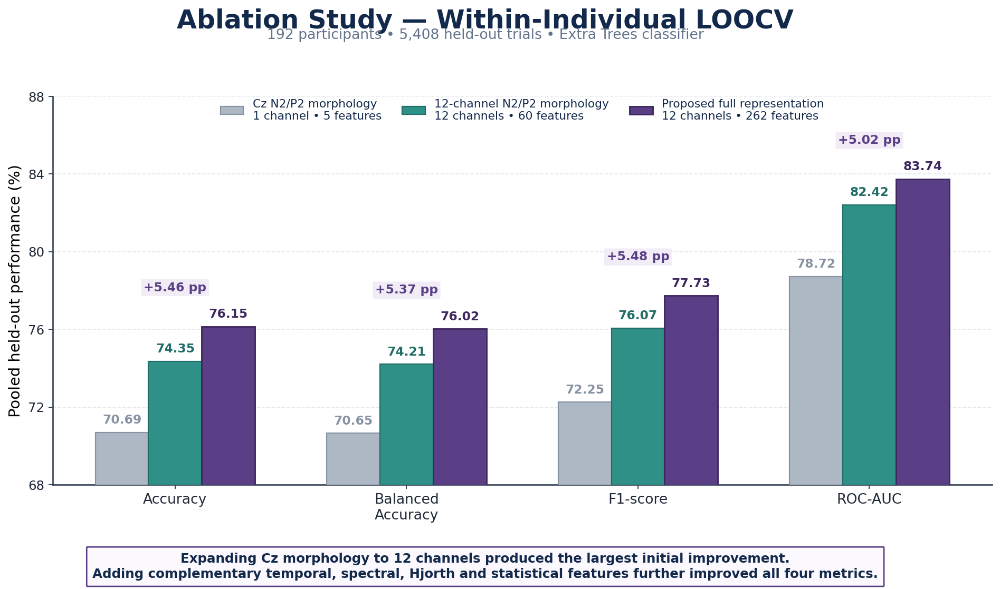

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_THREE_REPRESENTATIONS_COMPARISON/PUBLICATION_FIGURES/ablation_within_individual_publication.png


In [ ]:
# ============================================================
# FIGURE 1
# ABLATION STUDY — WITHIN-INDIVIDUAL LOOCV
# ============================================================

x = np.arange(len(metrics))
width = 0.23

fig, ax = plt.subplots(
    figsize=(12.5, 7.2),
    facecolor="white"
)

ax.set_facecolor("white")

# ------------------------------------------------------------
# Bars
# ------------------------------------------------------------

bars_cz = ax.bar(
    x - width,
    within_cz,
    width,
    color=CZ_COLOR,
    edgecolor=CZ_EDGE,
    linewidth=1.0,
    label="Cz N2/P2 morphology\n1 channel • 5 features",
    zorder=3
)

bars_60 = ax.bar(
    x,
    within_60,
    width,
    color=MORPH_COLOR,
    edgecolor=MORPH_EDGE,
    linewidth=1.0,
    label="12-channel N2/P2 morphology\n12 channels • 60 features",
    zorder=3
)

bars_262 = ax.bar(
    x + width,
    within_262,
    width,
    color=FULL_COLOR,
    edgecolor=FULL_EDGE,
    linewidth=1.3,
    label="Proposed full representation\n12 channels • 262 features",
    zorder=3
)

# ------------------------------------------------------------
# Value annotations
# ------------------------------------------------------------

for bars, text_color in [
    (bars_cz, CZ_EDGE),
    (bars_60, MORPH_EDGE),
    (bars_262, FULL_EDGE)
]:
    for bar in bars:

        value = bar.get_height()

        ax.text(
            bar.get_x() + bar.get_width()/2,
            value + 0.32,
            f"{value:.2f}",
            ha="center",
            va="bottom",
            fontsize=10.5,
            fontweight="bold",
            color=text_color
        )

# ------------------------------------------------------------
# Overall gain annotations: Cz 5 → Full 262
# ------------------------------------------------------------

overall_gain = within_262 - within_cz

for i, gain in enumerate(overall_gain):

    ax.text(
        x[i],
        max(within_cz[i], within_60[i], within_262[i]) + 2.0,
        f"+{gain:.2f} pp",
        ha="center",
        va="center",
        fontsize=10.5,
        fontweight="bold",
        color=FULL_COLOR,
        bbox=dict(
            boxstyle="round,pad=0.20,rounding_size=0.05",
            facecolor="#F1ECF6",
            edgecolor="none"
        )
    )

# ------------------------------------------------------------
# Titles
# ------------------------------------------------------------

fig.suptitle(
    "Ablation Study — Within-Individual LOOCV",
    fontsize=22,
    fontweight="bold",
    color=NAVY,
    y=0.965
)

fig.text(
    0.5,
    0.915,
    "192 participants • 5,408 held-out trials • Extra Trees classifier",
    ha="center",
    fontsize=12,
    color=SUBTITLE
)

# ------------------------------------------------------------
# Axes
# ------------------------------------------------------------

ax.set_ylabel(
    "Pooled held-out performance (%)",
    fontsize=13
)

ax.set_xticks(x)

ax.set_xticklabels(
    metrics,
    fontsize=12
)

ax.set_ylim(
    68,
    88
)

ax.set_yticks(
    np.arange(
        68,
        89,
        4
    )
)

ax.grid(
    axis="y",
    linestyle="--",
    linewidth=0.8,
    color=GRID,
    alpha=0.85,
    zorder=0
)

ax.set_axisbelow(True)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# ------------------------------------------------------------
# Legend
# ------------------------------------------------------------

ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, 1.02),
    ncol=3,
    frameon=False,
    fontsize=9.8,
    columnspacing=1.8
)

# ------------------------------------------------------------
# Footer
# ------------------------------------------------------------

footer = (
    "Expanding Cz morphology to 12 channels produced the largest initial improvement.\n"
    "Adding complementary temporal, spectral, Hjorth and statistical features further improved all four metrics."
)

fig.text(
    0.5,
    0.045,
    footer,
    ha="center",
    va="center",
    multialignment="center",
    fontsize=11,
    fontweight="bold",
    color=NAVY,
    linespacing=1.25,
    bbox=dict(
        boxstyle="round,pad=0.45,rounding_size=0.05",
        facecolor="#FBF9FD",
        edgecolor=FULL_COLOR,
        linewidth=1.2
    )
)

plt.subplots_adjust(
    top=0.82,
    bottom=0.18,
    left=0.09,
    right=0.98
)

output_path = os.path.join(
    SAVE_DIR,
    "ablation_within_individual_publication.png"
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved:")
print(output_path)

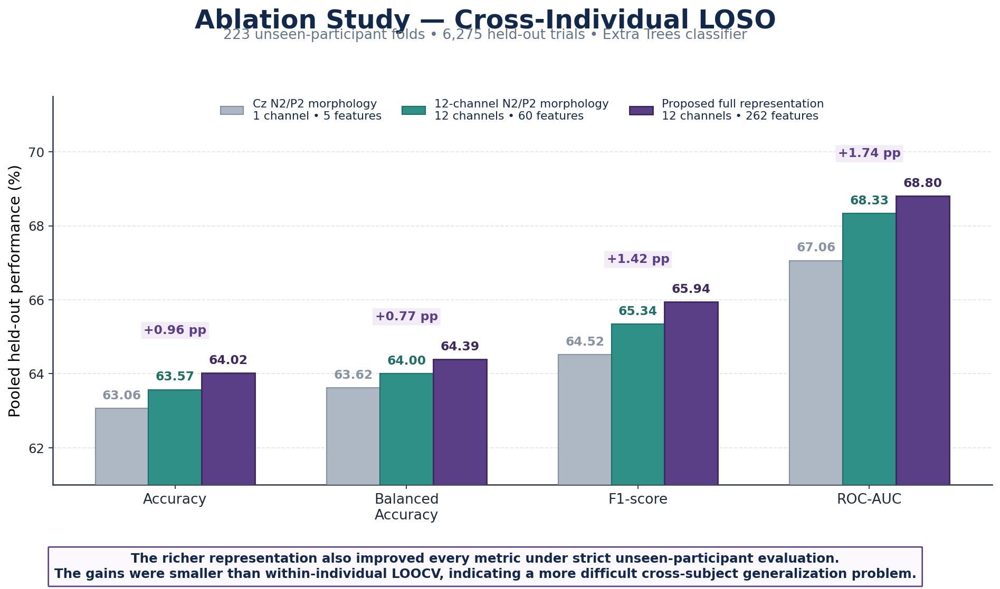

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_THREE_REPRESENTATIONS_COMPARISON/PUBLICATION_FIGURES/ablation_cross_individual_publication.png


In [ ]:
# ============================================================
# FIGURE 2
# ABLATION STUDY — CROSS-INDIVIDUAL LOSO
# ============================================================

x = np.arange(len(metrics))
width = 0.23

fig, ax = plt.subplots(
    figsize=(12.5, 7.2),
    facecolor="white"
)

ax.set_facecolor("white")

# ------------------------------------------------------------
# Bars
# ------------------------------------------------------------

bars_cz = ax.bar(
    x - width,
    cross_cz,
    width,
    color=CZ_COLOR,
    edgecolor=CZ_EDGE,
    linewidth=1.0,
    label="Cz N2/P2 morphology\n1 channel • 5 features",
    zorder=3
)

bars_60 = ax.bar(
    x,
    cross_60,
    width,
    color=MORPH_COLOR,
    edgecolor=MORPH_EDGE,
    linewidth=1.0,
    label="12-channel N2/P2 morphology\n12 channels • 60 features",
    zorder=3
)

bars_262 = ax.bar(
    x + width,
    cross_262,
    width,
    color=FULL_COLOR,
    edgecolor=FULL_EDGE,
    linewidth=1.3,
    label="Proposed full representation\n12 channels • 262 features",
    zorder=3
)

# ------------------------------------------------------------
# Values
# ------------------------------------------------------------

for bars, text_color in [
    (bars_cz, CZ_EDGE),
    (bars_60, MORPH_EDGE),
    (bars_262, FULL_EDGE)
]:

    for bar in bars:

        value = bar.get_height()

        ax.text(
            bar.get_x() + bar.get_width()/2,
            value + 0.18,
            f"{value:.2f}",
            ha="center",
            va="bottom",
            fontsize=10.5,
            fontweight="bold",
            color=text_color
        )

# ------------------------------------------------------------
# Overall gains: Cz 5 → Full 262
# ------------------------------------------------------------

overall_gain = cross_262 - cross_cz

for i, gain in enumerate(overall_gain):

    ax.text(
        x[i],
        max(cross_cz[i], cross_60[i], cross_262[i]) + 1.15,
        f"+{gain:.2f} pp",
        ha="center",
        va="center",
        fontsize=10.5,
        fontweight="bold",
        color=FULL_COLOR,
        bbox=dict(
            boxstyle="round,pad=0.20,rounding_size=0.05",
            facecolor="#F1ECF6",
            edgecolor="none"
        )
    )

# ------------------------------------------------------------
# Titles
# ------------------------------------------------------------

fig.suptitle(
    "Ablation Study — Cross-Individual LOSO",
    fontsize=22,
    fontweight="bold",
    color=NAVY,
    y=0.965
)

fig.text(
    0.5,
    0.915,
    "223 unseen-participant folds • 6,275 held-out trials • Extra Trees classifier",
    ha="center",
    fontsize=12,
    color=SUBTITLE
)

# ------------------------------------------------------------
# Axes
# ------------------------------------------------------------

ax.set_ylabel(
    "Pooled held-out performance (%)",
    fontsize=13
)

ax.set_xticks(x)

ax.set_xticklabels(
    metrics,
    fontsize=12
)

ax.set_ylim(
    61,
    71.5
)

ax.set_yticks(
    np.arange(
        62,
        72,
        2
    )
)

ax.grid(
    axis="y",
    linestyle="--",
    linewidth=0.8,
    color=GRID,
    alpha=0.85,
    zorder=0
)

ax.set_axisbelow(True)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# ------------------------------------------------------------
# Legend
# ------------------------------------------------------------

ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, 1.02),
    ncol=3,
    frameon=False,
    fontsize=9.8,
    columnspacing=1.8
)

# ------------------------------------------------------------
# Footer
# ------------------------------------------------------------

footer = (
    "The richer representation also improved every metric under strict unseen-participant evaluation.\n"
    "The gains were smaller than within-individual LOOCV, indicating a more difficult cross-subject generalization problem."
)

fig.text(
    0.5,
    0.045,
    footer,
    ha="center",
    va="center",
    multialignment="center",
    fontsize=11,
    fontweight="bold",
    color=NAVY,
    linespacing=1.25,
    bbox=dict(
        boxstyle="round,pad=0.45,rounding_size=0.05",
        facecolor="#FBF9FD",
        edgecolor=FULL_COLOR,
        linewidth=1.2
    )
)

plt.subplots_adjust(
    top=0.82,
    bottom=0.18,
    left=0.09,
    right=0.98
)

output_path = os.path.join(
    SAVE_DIR,
    "ablation_cross_individual_publication.png"
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved:")
print(output_path)

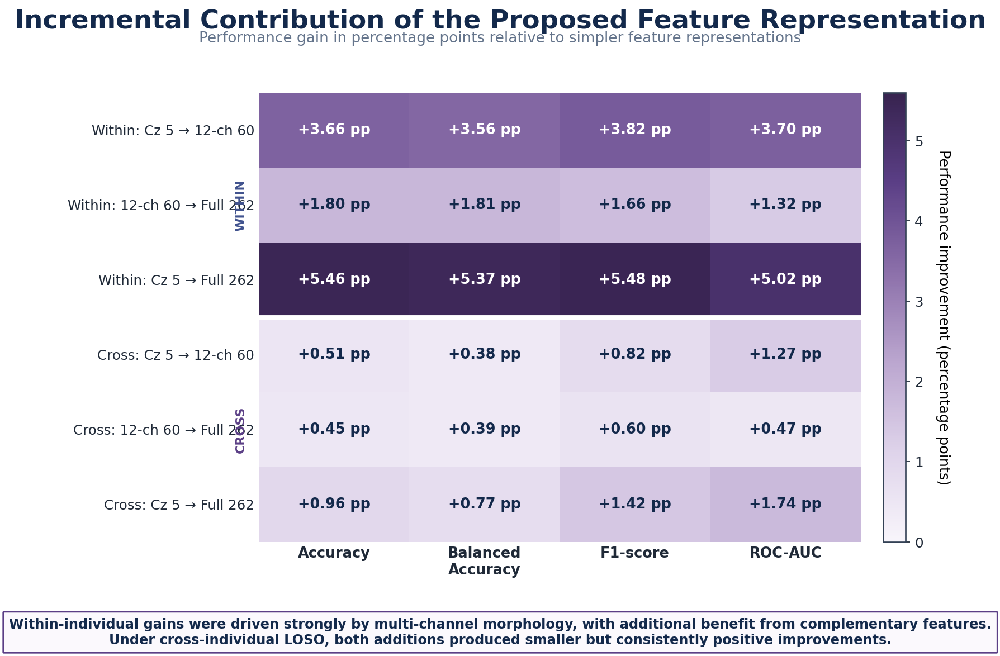

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_ABLATION_THREE_REPRESENTATIONS_COMPARISON/PUBLICATION_FIGURES/ablation_incremental_gain_heatmap.png


In [ ]:
# ============================================================
# FIGURE 3
# ABLATION INCREMENTAL-CONTRIBUTION HEATMAP
# ============================================================

row_labels = [
    "Within: Cz 5 → 12-ch 60",
    "Within: 12-ch 60 → Full 262",
    "Within: Cz 5 → Full 262",
    "Cross: Cz 5 → 12-ch 60",
    "Cross: 12-ch 60 → Full 262",
    "Cross: Cz 5 → Full 262"
]

column_labels = [
    "Accuracy",
    "Balanced\nAccuracy",
    "F1-score",
    "ROC-AUC"
]

gain_matrix = np.array([
    [3.66, 3.56, 3.82, 3.70],
    [1.80, 1.81, 1.66, 1.32],
    [5.46, 5.37, 5.48, 5.02],

    [0.51, 0.38, 0.82, 1.27],
    [0.45, 0.39, 0.60, 0.47],
    [0.96, 0.77, 1.42, 1.74]
])

# ------------------------------------------------------------
# Premium sequential colormap
# ------------------------------------------------------------

gain_cmap = LinearSegmentedColormap.from_list(
    "ablation_gain",
    [
        "#F8F5FB",
        "#DED3EA",
        "#BBA6CF",
        "#8C70AA",
        "#5B3F86",
        "#37234F"
    ]
)

fig, ax = plt.subplots(
    figsize=(10.8, 7.5),
    facecolor="white"
)

ax.set_facecolor("white")

image = ax.imshow(
    gain_matrix,
    cmap=gain_cmap,
    vmin=0,
    vmax=5.6,
    aspect="auto"
)

# ------------------------------------------------------------
# Axis labels
# ------------------------------------------------------------

ax.set_xticks(
    np.arange(len(column_labels))
)

ax.set_xticklabels(
    column_labels,
    fontsize=11.5,
    fontweight="bold"
)

ax.set_yticks(
    np.arange(len(row_labels))
)

ax.set_yticklabels(
    row_labels,
    fontsize=11
)

ax.tick_params(
    length=0
)

# ------------------------------------------------------------
# Cell values
# ------------------------------------------------------------

for i in range(gain_matrix.shape[0]):

    for j in range(gain_matrix.shape[1]):

        value = gain_matrix[i, j]

        text_color = (
            "white"
            if value >= 3.0
            else NAVY
        )

        ax.text(
            j,
            i,
            f"+{value:.2f} pp",
            ha="center",
            va="center",
            fontsize=11.5,
            fontweight="bold",
            color=text_color
        )

# ------------------------------------------------------------
# Separating line
# ------------------------------------------------------------

ax.axhline(
    2.5,
    color="white",
    linewidth=4
)

ax.text(
    -0.62,
    1.0,
    "WITHIN",
    rotation=90,
    ha="center",
    va="center",
    fontsize=10,
    fontweight="bold",
    color=WITHIN_EDGE
)

ax.text(
    -0.62,
    4.0,
    "CROSS",
    rotation=90,
    ha="center",
    va="center",
    fontsize=10,
    fontweight="bold",
    color=FULL_COLOR
)

# ------------------------------------------------------------
# Title
# ------------------------------------------------------------

fig.suptitle(
    "Incremental Contribution of the Proposed Feature Representation",
    fontsize=21,
    fontweight="bold",
    color=NAVY,
    y=0.965
)

fig.text(
    0.5,
    0.915,
    "Performance gain in percentage points relative to simpler feature representations",
    ha="center",
    fontsize=11.8,
    color=SUBTITLE
)

# ------------------------------------------------------------
# Colorbar
# ------------------------------------------------------------

cbar = fig.colorbar(
    image,
    ax=ax,
    fraction=0.035,
    pad=0.035
)

cbar.set_label(
    "Performance improvement (percentage points)",
    rotation=270,
    labelpad=22,
    fontsize=11.5
)

# ------------------------------------------------------------
# Clean spines
# ------------------------------------------------------------

for spine in ax.spines.values():
    spine.set_visible(False)

# ------------------------------------------------------------
# Footer
# ------------------------------------------------------------

footer = (
    "Within-individual gains were driven strongly by multi-channel morphology, with additional benefit from complementary features.\n"
    "Under cross-individual LOSO, both additions produced smaller but consistently positive improvements."
)

fig.text(
    0.5,
    0.035,
    footer,
    ha="center",
    va="center",
    multialignment="center",
    fontsize=10.8,
    fontweight="bold",
    color=NAVY,
    linespacing=1.25,
    bbox=dict(
        boxstyle="round,pad=0.43,rounding_size=0.05",
        facecolor="#FBF9FD",
        edgecolor=FULL_COLOR,
        linewidth=1.2
    )
)

plt.subplots_adjust(
    top=0.84,
    bottom=0.17,
    left=0.25,
    right=0.92
)

output_path = os.path.join(
    SAVE_DIR,
    "ablation_incremental_gain_heatmap.png"
)

plt.savefig(
    output_path,
    dpi=300,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved:")
print(output_path)

In [ ]:
# ============================================================
# CELL 1 — LOAD FULL 262-FEATURE REPRESENTATION
# ============================================================

!pip -q install xgboost joblib

import os
import json
import time
import warnings

import numpy as np
import pandas as pd

from IPython.display import display

warnings.filterwarnings("ignore")


# ============================================================
# Paths
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_PATH = os.path.join(
    V8_DIR,
    "handcrafted_features",
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

Y_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "y_v8_binary_6275.npy"
)

GROUPS_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "groups_v8_subject_6275.npy"
)

FAST_RESULTS_DIR = os.path.join(
    V8_DIR,
    "V8_FAST_SVM_XGBOOST_COMPARISON"
)

os.makedirs(
    FAST_RESULTS_DIR,
    exist_ok=True
)


# ============================================================
# Verify files
# ============================================================

for path in [
    FEATURE_PATH,
    Y_PATH,
    GROUPS_PATH,
]:
    if not os.path.exists(path):
        raise FileNotFoundError(path)


# ============================================================
# Load data
# ============================================================

X_model = np.asarray(
    np.load(
        FEATURE_PATH,
        mmap_mode="r"
    ),
    dtype=np.float32
)

y = np.load(
    Y_PATH
).astype(
    np.int8
).ravel()

groups_raw = np.load(
    GROUPS_PATH,
    allow_pickle=True
).ravel()


def clean_subject_id(value):

    if isinstance(value, bytes):
        value = value.decode("utf-8")

    return str(value).strip()


groups = np.asarray(
    [
        clean_subject_id(value)
        for value in groups_raw
    ],
    dtype=str
)


# ============================================================
# Validation
# ============================================================

assert X_model.shape == (6275, 262)
assert y.shape == (6275,)
assert groups.shape == (6275,)
assert len(np.unique(groups)) == 223
assert np.isfinite(X_model).all()

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([2725, 3550])
)


FEATURE_SET_ID = "Full262"

print("=" * 75)
print("FULL 262-FEATURE MODEL COMPARISON DATA READY")
print("=" * 75)

print("Feature matrix:", X_model.shape)
print("Labels:", y.shape)
print("Participants:", len(np.unique(groups)))
print("Class counts:", np.bincount(y).tolist())

print(
    "Post-extraction participant-wise "
    "standardization: None"
)

FULL 262-FEATURE MODEL COMPARISON DATA READY
Feature matrix: (6275, 262)
Labels: (6275,)
Participants: 223
Class counts: [2725, 3550]
Post-extraction participant-wise standardization: None


In [ ]:
# ============================================================
# CELL 2 — MODELS AND SHARED FUNCTIONS
# ============================================================

from joblib import Parallel, delayed

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.utils.class_weight import compute_sample_weight

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)

from xgboost import XGBClassifier


# ============================================================
# Fixed model parameters
#
# These are fast fixed-parameter screening configurations.
# They are not claimed to be fully optimized.
# ============================================================

MODEL_SETTINGS = {
    "svm_rbf": {
        "display_name":
            "SVM-RBF",

        "C":
            1.0,

        "gamma":
            "scale",

        "class_weight":
            "balanced",

        "cache_size":
            512,
    },

    "xgboost": {
        "display_name":
            "XGBoost",

        "n_estimators":
            60,

        "max_depth":
            3,

        "learning_rate":
            0.08,

        "subsample":
            0.90,

        "colsample_bytree":
            0.90,

        "min_child_weight":
            1,

        "reg_lambda":
            1.0,

        "tree_method":
            "hist",

        "random_state":
            42,
    },
}


def make_model(model_name):

    if model_name == "svm_rbf":

        # StandardScaler is fitted only on each fold's
        # training data because it is inside the Pipeline.
        return Pipeline(
            steps=[
                (
                    "scaler",
                    StandardScaler()
                ),
                (
                    "classifier",
                    SVC(
                        kernel="rbf",
                        C=1.0,
                        gamma="scale",
                        class_weight="balanced",
                        cache_size=512,
                        shrinking=True,
                        tol=1e-3,
                    )
                ),
            ]
        )

    if model_name == "xgboost":

        # n_jobs=1 prevents nested CPU competition because
        # folds are already parallelized with joblib.
        return XGBClassifier(
            n_estimators=60,
            max_depth=3,
            learning_rate=0.08,
            subsample=0.90,
            colsample_bytree=0.90,
            min_child_weight=1,
            reg_lambda=1.0,
            objective="binary:logistic",
            eval_metric="logloss",
            tree_method="hist",
            random_state=42,
            n_jobs=1,
            verbosity=0,
        )

    raise ValueError(
        f"Unknown model name: {model_name}"
    )


def fit_predict_score(
    model_name,
    X_train,
    y_train,
    X_test,
):

    model = make_model(
        model_name
    )

    if model_name == "xgboost":

        # Computed only from the current training fold.
        training_weights = compute_sample_weight(
            class_weight="balanced",
            y=y_train
        )

        model.fit(
            X_train,
            y_train,
            sample_weight=training_weights
        )

        probability_matrix = model.predict_proba(
            X_test
        )

        positive_position = int(
            np.flatnonzero(
                model.classes_ == 1
            )[0]
        )

        y_score = probability_matrix[
            :,
            positive_position
        ]

        y_pred = (
            y_score >= 0.50
        ).astype(
            np.int8
        )

    else:

        model.fit(
            X_train,
            y_train
        )

        y_pred = model.predict(
            X_test
        ).astype(
            np.int8
        )

        # Faster than probability=True.
        y_score = np.asarray(
            model.decision_function(
                X_test
            ),
            dtype=float
        ).ravel()

    return y_pred, y_score


def calculate_metrics(
    y_true,
    y_pred,
    y_score,
):

    y_true = np.asarray(
        y_true,
        dtype=np.int8
    ).ravel()

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    ).ravel()

    y_score = np.asarray(
        y_score,
        dtype=float
    ).ravel()

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()

    both_classes = (
        np.unique(y_true).size == 2
    )

    sensitivity = recall_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )

    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else np.nan
    )

    try:
        mcc = matthews_corrcoef(
            y_true,
            y_pred
        )
    except Exception:
        mcc = np.nan

    try:
        kappa = cohen_kappa_score(
            y_true,
            y_pred
        )

        if not np.isfinite(kappa):
            kappa = np.nan

    except Exception:
        kappa = np.nan

    return {
        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "balanced_accuracy":
            (
                balanced_accuracy_score(
                    y_true,
                    y_pred
                )
                if both_classes
                else np.nan
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "recall":
            sensitivity,

        "sensitivity":
            sensitivity,

        "specificity":
            specificity,

        "f1_score":
            f1_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "roc_auc":
            (
                roc_auc_score(
                    y_true,
                    y_score
                )
                if both_classes
                else np.nan
            ),

        "pr_auc":
            (
                average_precision_score(
                    y_true,
                    y_score
                )
                if both_classes
                else np.nan
            ),

        "mcc":
            mcc,

        "cohen_kappa":
            kappa,

        "true_negative":
            int(tn),

        "false_positive":
            int(fp),

        "false_negative":
            int(fn),

        "true_positive":
            int(tp),

        "support_low":
            int(np.sum(y_true == 0)),

        "support_high":
            int(np.sum(y_true == 1)),
    }


def atomic_save_csv(
    dataframe,
    path,
):

    temporary_path = path + ".tmp"

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        path
    )


def atomic_save_json(
    content,
    path,
):

    temporary_path = path + ".tmp"

    with open(
        temporary_path,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            content,
            file,
            indent=4,
            default=str
        )

    os.replace(
        temporary_path,
        path
    )


def finalize_results(
    predictions_df,
    model_name,
    validation_name,
    prefix,
    runtime_minutes,
):

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    pooled_metrics = calculate_metrics(
        predictions_df["y_true"],
        predictions_df["y_pred"],
        predictions_df["y_score"],
    )

    subject_rows = []

    for subject_id, subject_df in (
        predictions_df.groupby(
            "test_subject",
            sort=True
        )
    ):

        subject_metrics = calculate_metrics(
            subject_df["y_true"],
            subject_df["y_pred"],
            subject_df["y_score"],
        )

        subject_rows.append(
            {
                "test_subject":
                    subject_id,

                "n_trials":
                    len(subject_df),

                **subject_metrics,
            }
        )

    subject_results_df = pd.DataFrame(
        subject_rows
    )

    pooled_metrics[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()

    pooled_metrics[
        "subject_accuracy_sd"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )

    pooled_metrics[
        "runtime_minutes_current_session"
    ] = runtime_minutes

    pooled_metrics[
        "model"
    ] = MODEL_SETTINGS[
        model_name
    ][
        "display_name"
    ]

    pooled_metrics[
        "validation"
    ] = validation_name

    summary_df = pd.DataFrame(
        [pooled_metrics]
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    subject_path = (
        prefix
        + "__subject_results.csv"
    )

    summary_path = (
        prefix
        + "__pooled_summary.csv"
    )

    atomic_save_csv(
        predictions_df,
        prediction_path
    )

    atomic_save_csv(
        subject_results_df,
        subject_path
    )

    atomic_save_csv(
        summary_df,
        summary_path
    )

    print("\n" + "=" * 78)
    print(
        MODEL_SETTINGS[
            model_name
        ][
            "display_name"
        ],
        validation_name,
    )
    print("=" * 78)

    display(
        summary_df.T.rename(
            columns={0: "value"}
        )
    )

    print("\nSaved summary:")
    print(summary_path)

    return {
        "predictions":
            predictions_df,

        "subject_results":
            subject_results_df,

        "summary":
            summary_df,
    }


print("Models and metric functions are ready.")

Models and metric functions are ready.


In [ ]:
# ============================================================
# CELL 3 — FAST WITHIN-INDIVIDUAL LOOCV
#
# Parallelization is performed across participants.
# Checkpoints are saved after each participant batch.
# ============================================================

def evaluate_one_within_subject(
    subject_id,
    model_name,
    X,
    y,
    groups,
):

    subject_indices = np.flatnonzero(
        groups == subject_id
    )

    X_subject = X[
        subject_indices
    ]

    y_subject = y[
        subject_indices
    ]

    rows = []

    for local_test_index in range(
        len(subject_indices)
    ):

        local_train_mask = np.ones(
            len(subject_indices),
            dtype=bool
        )

        local_train_mask[
            local_test_index
        ] = False

        X_train = X_subject[
            local_train_mask
        ]

        y_train = y_subject[
            local_train_mask
        ]

        X_test = X_subject[
            local_test_index:
            local_test_index + 1
        ]

        if np.unique(y_train).size != 2:
            raise RuntimeError(
                f"{subject_id}: one-class "
                "training fold encountered."
            )

        y_pred, y_score = fit_predict_score(
            model_name=model_name,
            X_train=X_train,
            y_train=y_train,
            X_test=X_test,
        )

        rows.append(
            {
                "original_row_index":
                    int(
                        subject_indices[
                            local_test_index
                        ]
                    ),

                "test_subject":
                    str(subject_id),

                "y_true":
                    int(
                        y_subject[
                            local_test_index
                        ]
                    ),

                "y_pred":
                    int(y_pred[0]),

                "y_score":
                    float(y_score[0]),
            }
        )

    return rows


def run_fast_within_loocv(
    model_name,
    X,
    y,
    groups,
    n_jobs=4,
    subjects_per_batch=8,
    resume=True,
):

    X = np.asarray(
        X,
        dtype=np.float32
    )

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()

    groups = np.asarray(
        groups
    ).astype(str).ravel()


    # --------------------------------------------------------
    # Identify strict eligible participants
    # --------------------------------------------------------

    count_table = (
        pd.DataFrame(
            {
                "subject":
                    groups,

                "label":
                    y,
            }
        )
        .groupby(
            [
                "subject",
                "label",
            ]
        )
        .size()
        .unstack(
            fill_value=0
        )
        .reindex(
            columns=[0, 1],
            fill_value=0
        )
    )

    eligible_subjects = (
        count_table.index[
            (
                count_table[0] >= 2
            )
            &
            (
                count_table[1] >= 2
            )
        ]
        .astype(str)
        .to_numpy()
    )

    eligible_subjects = np.sort(
        eligible_subjects
    )

    eligible_mask = np.isin(
        groups,
        eligible_subjects
    )

    expected_indices = np.flatnonzero(
        eligible_mask
    )

    assert len(eligible_subjects) == 192
    assert len(expected_indices) == 5408


    # --------------------------------------------------------
    # Output paths
    # --------------------------------------------------------

    model_id = MODEL_SETTINGS[
        model_name
    ][
        "display_name"
    ].replace("-", "_")

    prefix = os.path.join(
        FAST_RESULTS_DIR,
        (
            f"{model_id}__{FEATURE_SET_ID}__"
            "WithinIndividual_LOOCV_Strict192"
        )
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )


    # --------------------------------------------------------
    # Resume
    # --------------------------------------------------------

    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            prediction_path
        )

        predictions_df[
            "test_subject"
        ] = predictions_df[
            "test_subject"
        ].astype(str)

        completed_subjects = set(
            predictions_df[
                "test_subject"
            ].unique()
        )

    else:

        predictions_df = pd.DataFrame()

        completed_subjects = set()


    remaining_subjects = [
        subject
        for subject in eligible_subjects
        if subject not in completed_subjects
    ]

    print("=" * 78)
    print(
        MODEL_SETTINGS[
            model_name
        ][
            "display_name"
        ],
        "WITHIN-INDIVIDUAL LOOCV"
    )
    print("=" * 78)

    print(
        "Completed participants:",
        len(completed_subjects),
        "/ 192"
    )

    start_time = time.perf_counter()


    # --------------------------------------------------------
    # Parallel batches
    # --------------------------------------------------------

    for batch_start in range(
        0,
        len(remaining_subjects),
        subjects_per_batch
    ):

        batch_subjects = remaining_subjects[
            batch_start:
            batch_start + subjects_per_batch
        ]

        batch_results = Parallel(
            n_jobs=n_jobs,
            backend="loky",
            batch_size=1,
        )(
            delayed(
                evaluate_one_within_subject
            )(
                subject_id=subject,
                model_name=model_name,
                X=X,
                y=y,
                groups=groups,
            )
            for subject in batch_subjects
        )

        new_rows = [
            row
            for subject_rows in batch_results
            for row in subject_rows
        ]

        predictions_df = pd.concat(
            [
                predictions_df,
                pd.DataFrame(new_rows),
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )

        atomic_save_csv(
            predictions_df,
            prediction_path
        )

        completed_subjects.update(
            batch_subjects
        )

        atomic_save_json(
            {
                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    192,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    5408,
            },
            progress_path
        )

        print(
            "Completed:",
            len(completed_subjects),
            "/ 192 participants"
        )


    # --------------------------------------------------------
    # Final validation
    # --------------------------------------------------------

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    assert len(predictions_df) == 5408

    assert np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(int),
        expected_indices
    )

    runtime_minutes = (
        time.perf_counter()
        - start_time
    ) / 60.0

    return finalize_results(
        predictions_df=predictions_df,
        model_name=model_name,
        validation_name=(
            "Within-individual LOOCV"
        ),
        prefix=prefix,
        runtime_minutes=runtime_minutes,
    )


print("Fast within-individual evaluator is defined.")

Fast within-individual evaluator is defined.


In [ ]:
# ============================================================
# CELL 4 — SVM-RBF WITHIN-INDIVIDUAL LOOCV
# ============================================================

svm_within_result = run_fast_within_loocv(
    model_name="svm_rbf",
    X=X_model,
    y=y,
    groups=groups,
    n_jobs=4,
    subjects_per_batch=8,
    resume=True,
)

SVM-RBF WITHIN-INDIVIDUAL LOOCV
Completed participants: 0 / 192
Completed: 8 / 192 participants
Completed: 16 / 192 participants
Completed: 24 / 192 participants
Completed: 32 / 192 participants
Completed: 40 / 192 participants
Completed: 48 / 192 participants
Completed: 56 / 192 participants
Completed: 64 / 192 participants
Completed: 72 / 192 participants
Completed: 80 / 192 participants
Completed: 88 / 192 participants
Completed: 96 / 192 participants
Completed: 104 / 192 participants
Completed: 112 / 192 participants
Completed: 120 / 192 participants
Completed: 128 / 192 participants
Completed: 136 / 192 participants
Completed: 144 / 192 participants
Completed: 152 / 192 participants
Completed: 160 / 192 participants
Completed: 168 / 192 participants
Completed: 176 / 192 participants
Completed: 184 / 192 participants
Completed: 192 / 192 participants

SVM-RBF Within-individual LOOCV


,value
accuracy,0.749445
balanced_accuracy,0.748476
precision,0.767838
recall,0.762267
sensitivity,0.762267
specificity,0.734686
f1_score,0.765042
roc_auc,0.820952
pr_auc,0.820515
mcc,0.496695



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_SVM_XGBOOST_COMPARISON/SVM_RBF__Full262__WithinIndividual_LOOCV_Strict192__pooled_summary.csv


In [ ]:
# ============================================================
# CELL 5 — XGBOOST WITHIN-INDIVIDUAL LOOCV
# ============================================================

xgb_within_result = run_fast_within_loocv(
    model_name="xgboost",
    X=X_model,
    y=y,
    groups=groups,
    n_jobs=4,
    subjects_per_batch=8,
    resume=True,
)

XGBoost WITHIN-INDIVIDUAL LOOCV
Completed participants: 0 / 192
Completed: 8 / 192 participants
Completed: 16 / 192 participants
Completed: 24 / 192 participants
Completed: 32 / 192 participants
Completed: 40 / 192 participants
Completed: 48 / 192 participants
Completed: 56 / 192 participants
Completed: 64 / 192 participants
Completed: 72 / 192 participants
Completed: 80 / 192 participants
Completed: 88 / 192 participants
Completed: 96 / 192 participants
Completed: 104 / 192 participants
Completed: 112 / 192 participants
Completed: 120 / 192 participants
Completed: 128 / 192 participants
Completed: 136 / 192 participants
Completed: 144 / 192 participants
Completed: 152 / 192 participants
Completed: 160 / 192 participants
Completed: 168 / 192 participants
Completed: 176 / 192 participants
Completed: 184 / 192 participants
Completed: 192 / 192 participants

XGBoost Within-individual LOOCV


,value
accuracy,0.726146
balanced_accuracy,0.723991
precision,0.739086
recall,0.754665
sensitivity,0.754665
specificity,0.693317
f1_score,0.746794
roc_auc,0.797426
pr_auc,0.806283
mcc,0.448813



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_SVM_XGBOOST_COMPARISON/XGBoost__Full262__WithinIndividual_LOOCV_Strict192__pooled_summary.csv


In [ ]:
# ============================================================
# CELL 6 — FAST STRICT CROSS-INDIVIDUAL LOSO
#
# Every fold:
#   222 participants train
#   1 completely unseen participant tests
# ============================================================

def evaluate_one_cross_subject(
    test_subject,
    model_name,
    X,
    y,
    groups,
):

    test_mask = (
        groups == test_subject
    )

    train_mask = ~test_mask

    training_subjects = np.unique(
        groups[
            train_mask
        ]
    )

    if len(training_subjects) != 222:

        raise RuntimeError(
            f"{test_subject}: expected 222 "
            "training participants."
        )

    X_train = X[
        train_mask
    ]

    y_train = y[
        train_mask
    ]

    X_test = X[
        test_mask
    ]

    y_test = y[
        test_mask
    ]

    y_pred, y_score = fit_predict_score(
        model_name=model_name,
        X_train=X_train,
        y_train=y_train,
        X_test=X_test,
    )

    original_indices = np.flatnonzero(
        test_mask
    )

    rows = []

    for index, true_label, prediction, score in zip(
        original_indices,
        y_test,
        y_pred,
        y_score,
    ):

        rows.append(
            {
                "original_row_index":
                    int(index),

                "test_subject":
                    str(test_subject),

                "y_true":
                    int(true_label),

                "y_pred":
                    int(prediction),

                "y_score":
                    float(score),
            }
        )

    return rows


def run_fast_cross_loso(
    model_name,
    X,
    y,
    groups,
    n_jobs=2,
    subjects_per_batch=4,
    resume=True,
):

    X = np.asarray(
        X,
        dtype=np.float32
    )

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()

    groups = np.asarray(
        groups
    ).astype(str).ravel()

    subjects = np.sort(
        np.unique(groups)
    )

    assert len(subjects) == 223
    assert len(X) == 6275


    # --------------------------------------------------------
    # Output paths
    # --------------------------------------------------------

    model_id = MODEL_SETTINGS[
        model_name
    ][
        "display_name"
    ].replace("-", "_")

    prefix = os.path.join(
        FAST_RESULTS_DIR,
        (
            f"{model_id}__{FEATURE_SET_ID}__"
            "CrossIndividual_LOSO_Strict223"
        )
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )


    # --------------------------------------------------------
    # Resume
    # --------------------------------------------------------

    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            prediction_path
        )

        predictions_df[
            "test_subject"
        ] = predictions_df[
            "test_subject"
        ].astype(str)

        completed_subjects = set(
            predictions_df[
                "test_subject"
            ].unique()
        )

    else:

        predictions_df = pd.DataFrame()

        completed_subjects = set()


    remaining_subjects = [
        subject
        for subject in subjects
        if subject not in completed_subjects
    ]

    print("=" * 78)
    print(
        MODEL_SETTINGS[
            model_name
        ][
            "display_name"
        ],
        "STRICT CROSS-INDIVIDUAL LOSO"
    )
    print("=" * 78)

    print(
        "Completed participants:",
        len(completed_subjects),
        "/ 223"
    )

    start_time = time.perf_counter()


    # --------------------------------------------------------
    # Parallel batches
    # --------------------------------------------------------

    for batch_start in range(
        0,
        len(remaining_subjects),
        subjects_per_batch
    ):

        batch_subjects = remaining_subjects[
            batch_start:
            batch_start + subjects_per_batch
        ]

        batch_results = Parallel(
            n_jobs=n_jobs,
            backend="loky",
            batch_size=1,
        )(
            delayed(
                evaluate_one_cross_subject
            )(
                test_subject=subject,
                model_name=model_name,
                X=X,
                y=y,
                groups=groups,
            )
            for subject in batch_subjects
        )

        new_rows = [
            row
            for subject_rows in batch_results
            for row in subject_rows
        ]

        predictions_df = pd.concat(
            [
                predictions_df,
                pd.DataFrame(new_rows),
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )

        atomic_save_csv(
            predictions_df,
            prediction_path
        )

        completed_subjects.update(
            batch_subjects
        )

        atomic_save_json(
            {
                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    223,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    6275,
            },
            progress_path
        )

        print(
            "Completed:",
            len(completed_subjects),
            "/ 223 participants"
        )


    # --------------------------------------------------------
    # Final validation
    # --------------------------------------------------------

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    assert len(predictions_df) == 6275

    assert np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(int),
        np.arange(6275)
    )

    runtime_minutes = (
        time.perf_counter()
        - start_time
    ) / 60.0

    return finalize_results(
        predictions_df=predictions_df,
        model_name=model_name,
        validation_name=(
            "Cross-individual LOSO"
        ),
        prefix=prefix,
        runtime_minutes=runtime_minutes,
    )


print("Fast cross-individual evaluator is defined.")

Fast cross-individual evaluator is defined.


In [ ]:
# ============================================================
# CELL 7 — SVM-RBF CROSS-INDIVIDUAL LOSO
# ============================================================

svm_cross_result = run_fast_cross_loso(
    model_name="svm_rbf",
    X=X_model,
    y=y,
    groups=groups,
    n_jobs=2,
    subjects_per_batch=4,
    resume=True,
)

SVM-RBF STRICT CROSS-INDIVIDUAL LOSO
Completed participants: 0 / 223
Completed: 4 / 223 participants
Completed: 8 / 223 participants
Completed: 12 / 223 participants
Completed: 16 / 223 participants
Completed: 20 / 223 participants
Completed: 24 / 223 participants
Completed: 28 / 223 participants
Completed: 32 / 223 participants
Completed: 36 / 223 participants
Completed: 40 / 223 participants
Completed: 44 / 223 participants
Completed: 48 / 223 participants
Completed: 52 / 223 participants
Completed: 56 / 223 participants
Completed: 60 / 223 participants
Completed: 64 / 223 participants
Completed: 68 / 223 participants
Completed: 72 / 223 participants
Completed: 76 / 223 participants
Completed: 80 / 223 participants
Completed: 84 / 223 participants
Completed: 88 / 223 participants
Completed: 92 / 223 participants
Completed: 96 / 223 participants
Completed: 100 / 223 participants
Completed: 104 / 223 participants
Completed: 108 / 223 participants
Completed: 112 / 223 participants
Compl

,value
accuracy,0.638566
balanced_accuracy,0.64402
precision,0.713952
recall,0.602535
sensitivity,0.602535
specificity,0.685505
f1_score,0.653529
roc_auc,0.682064
pr_auc,0.714583
mcc,0.28583



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_SVM_XGBOOST_COMPARISON/SVM_RBF__Full262__CrossIndividual_LOSO_Strict223__pooled_summary.csv


In [ ]:
# ============================================================
# CELL 8 — XGBOOST CROSS-INDIVIDUAL LOSO
# ============================================================

xgb_cross_result = run_fast_cross_loso(
    model_name="xgboost",
    X=X_model,
    y=y,
    groups=groups,
    n_jobs=4,
    subjects_per_batch=8,
    resume=True,
)

XGBoost STRICT CROSS-INDIVIDUAL LOSO
Completed participants: 0 / 223
Completed: 8 / 223 participants
Completed: 16 / 223 participants
Completed: 24 / 223 participants
Completed: 32 / 223 participants
Completed: 40 / 223 participants
Completed: 48 / 223 participants
Completed: 56 / 223 participants
Completed: 64 / 223 participants
Completed: 72 / 223 participants
Completed: 80 / 223 participants
Completed: 88 / 223 participants
Completed: 96 / 223 participants
Completed: 104 / 223 participants
Completed: 112 / 223 participants
Completed: 120 / 223 participants
Completed: 128 / 223 participants
Completed: 136 / 223 participants
Completed: 144 / 223 participants
Completed: 152 / 223 participants
Completed: 160 / 223 participants
Completed: 168 / 223 participants
Completed: 176 / 223 participants
Completed: 184 / 223 participants
Completed: 192 / 223 participants
Completed: 200 / 223 participants
Completed: 208 / 223 participants
Completed: 216 / 223 participants
Completed: 223 / 223 parti

,value
accuracy,0.632191
balanced_accuracy,0.638557
precision,0.710651
recall,0.590141
sensitivity,0.590141
specificity,0.686972
f1_score,0.644814
roc_auc,0.6733
pr_auc,0.720978
mcc,0.27521



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_SVM_XGBOOST_COMPARISON/XGBoost__Full262__CrossIndividual_LOSO_Strict223__pooled_summary.csv


In [ ]:
# ============================================================
# RANDOM FOREST — LEAKAGE-FREE FAST EVALUATION
#
# Evaluations:
#   1. Within-individual leave-one-trial-out CV
#      192 participants, 5,408 epochs
#
#   2. Strict cross-individual LOSO
#      223 participants, 6,275 epochs
#
# Input:
#   Baseline-normalized full 262-feature representation
#
# Leakage prevention:
#   - X_handcrafted_standardized is NOT used
#   - No participant-wise feature standardization
#   - A new Random Forest is fitted in every fold
#   - Class weights are calculated from each training fold
#   - Held-out participant is never used during LOSO training
# ============================================================

import os
import json
import time
import warnings

import numpy as np
import pandas as pd

from IPython.display import display
from joblib import Parallel, delayed

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)

warnings.filterwarnings("ignore")


# ============================================================
# 1. EXECUTION SETTINGS
# ============================================================

RUN_WITHIN_INDIVIDUAL = True
RUN_CROSS_INDIVIDUAL = True

# Set True only when you intentionally want to restart.
OVERWRITE = False

# Parallelization is across participants.
# Each Random Forest itself uses n_jobs=1 to avoid nested
# parallel processing.
AVAILABLE_CPUS = os.cpu_count() or 2

WITHIN_WORKERS = min(
    4,
    max(1, AVAILABLE_CPUS - 1)
)

CROSS_WORKERS = min(
    2,
    max(1, AVAILABLE_CPUS - 1)
)

WITHIN_SUBJECTS_PER_BATCH = 8
CROSS_SUBJECTS_PER_BATCH = 4

print("Detected CPUs:", AVAILABLE_CPUS)
print("Within-individual workers:", WITHIN_WORKERS)
print("Cross-individual workers:", CROSS_WORKERS)


# ============================================================
# 2. PATHS
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

FEATURE_PATH = os.path.join(
    V8_DIR,
    "handcrafted_features",
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

LABEL_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "y_v8_binary_6275.npy"
)

GROUP_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "groups_v8_subject_6275.npy"
)

RF_RESULTS_DIR = os.path.join(
    V8_DIR,
    "V8_FAST_RANDOM_FOREST_COMPARISON"
)

os.makedirs(
    RF_RESULTS_DIR,
    exist_ok=True
)


for required_path in [
    FEATURE_PATH,
    LABEL_PATH,
    GROUP_PATH,
]:

    if not os.path.exists(required_path):

        raise FileNotFoundError(
            f"Required file was not found:\n{required_path}"
        )


# ============================================================
# 3. LOAD DATA
#
# Important:
# This is X_handcrafted, not participant-standardized features.
# ============================================================

X_rf = np.load(
    FEATURE_PATH,
    mmap_mode="r"
)

y = np.load(
    LABEL_PATH
).astype(
    np.int8
).ravel()

groups_raw = np.load(
    GROUP_PATH,
    allow_pickle=True
).ravel()


def clean_subject_id(value):

    if isinstance(value, bytes):
        value = value.decode("utf-8")

    if isinstance(value, (float, np.floating)):
        if float(value).is_integer():
            return str(int(value))

    return str(value).strip()


groups = np.asarray(
    [
        clean_subject_id(value)
        for value in groups_raw
    ],
    dtype=str
)


# ============================================================
# 4. STRICT DATA CHECKS
# ============================================================

assert X_rf.shape == (6275, 262)
assert y.shape == (6275,)
assert groups.shape == (6275,)
assert len(np.unique(groups)) == 223
assert np.isfinite(X_rf).all()

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([2725, 3550])
)


print("\n" + "=" * 78)
print("RANDOM FOREST DATA READY")
print("=" * 78)

print("Feature matrix:", X_rf.shape)
print("Participants:", len(np.unique(groups)))
print("Class counts [low, high]:", np.bincount(y).tolist())
print("Feature-level participant standardization: None")


# ============================================================
# 5. RANDOM FOREST CONFIGURATION
#
# Same tree-count and complexity controls as the Extra Trees
# configuration for a direct tree-ensemble comparison.
# ============================================================

RF_PARAMETERS = {
    "n_estimators": 150,
    "max_depth": 12,
    "min_samples_leaf": 3,
    "min_samples_split": 5,
    "max_features": "sqrt",
    "class_weight": "balanced",
    "bootstrap": True,
    "random_state": 42,

    # Keep 1 because folds are parallelized externally.
    "n_jobs": 1,
}


def make_random_forest():

    return RandomForestClassifier(
        **RF_PARAMETERS
    )


# ============================================================
# 6. SHARED FILE-SAVING FUNCTIONS
# ============================================================

def atomic_save_csv(dataframe, path):

    temporary_path = path + ".tmp"

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        path
    )


def atomic_save_json(content, path):

    temporary_path = path + ".tmp"

    with open(
        temporary_path,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            content,
            file,
            indent=4,
            default=str
        )

    os.replace(
        temporary_path,
        path
    )


# ============================================================
# 7. SHARED PREDICTION AND METRIC FUNCTIONS
# ============================================================

def get_high_pain_probability(
    fitted_model,
    X_test,
):

    probability_matrix = fitted_model.predict_proba(
        X_test
    )

    positive_positions = np.flatnonzero(
        fitted_model.classes_ == 1
    )

    if positive_positions.size != 1:

        raise RuntimeError(
            "Positive class 1 could not be identified."
        )

    return probability_matrix[
        :,
        int(positive_positions[0])
    ]


def calculate_binary_metrics(
    y_true,
    y_pred,
    y_score,
):

    y_true = np.asarray(
        y_true,
        dtype=np.int8
    ).ravel()

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    ).ravel()

    y_score = np.asarray(
        y_score,
        dtype=float
    ).ravel()

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()

    contains_both_classes = (
        np.unique(y_true).size == 2
    )

    recall = recall_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )

    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else np.nan
    )

    try:

        mcc = matthews_corrcoef(
            y_true,
            y_pred
        )

    except Exception:

        mcc = np.nan

    try:

        kappa = cohen_kappa_score(
            y_true,
            y_pred
        )

        if not np.isfinite(kappa):
            kappa = np.nan

    except Exception:

        kappa = np.nan

    return {
        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "balanced_accuracy":
            (
                balanced_accuracy_score(
                    y_true,
                    y_pred
                )
                if contains_both_classes
                else np.nan
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "recall":
            recall,

        "sensitivity":
            recall,

        "specificity":
            specificity,

        "f1_score":
            f1_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "roc_auc":
            (
                roc_auc_score(
                    y_true,
                    y_score
                )
                if contains_both_classes
                else np.nan
            ),

        "pr_auc":
            (
                average_precision_score(
                    y_true,
                    y_score
                )
                if contains_both_classes
                else np.nan
            ),

        "mcc":
            mcc,

        "cohen_kappa":
            kappa,

        "true_negative":
            int(tn),

        "false_positive":
            int(fp),

        "false_negative":
            int(fn),

        "true_positive":
            int(tp),

        "support_low":
            int(np.sum(y_true == 0)),

        "support_high":
            int(np.sum(y_true == 1)),
    }


# ============================================================
# 8. FINALIZE AND SAVE ONE EVALUATION
# ============================================================

def finalize_rf_results(
    predictions_df,
    validation_name,
    prefix,
    runtime_minutes,
):

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    pooled_metrics = calculate_binary_metrics(
        predictions_df["y_true"],
        predictions_df["y_pred"],
        predictions_df["y_score"],
    )

    subject_rows = []

    for subject_id, subject_df in predictions_df.groupby(
        "test_subject",
        sort=True
    ):

        subject_metrics = calculate_binary_metrics(
            subject_df["y_true"],
            subject_df["y_pred"],
            subject_df["y_score"],
        )

        subject_rows.append(
            {
                "test_subject":
                    str(subject_id),

                "n_trials":
                    int(len(subject_df)),

                **subject_metrics,
            }
        )

    subject_results_df = pd.DataFrame(
        subject_rows
    )

    pooled_metrics["model"] = "Random Forest"
    pooled_metrics["features"] = 262
    pooled_metrics["validation"] = validation_name

    pooled_metrics[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()

    pooled_metrics[
        "subject_accuracy_sd"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )

    pooled_metrics[
        "runtime_minutes_current_session"
    ] = runtime_minutes

    summary_df = pd.DataFrame(
        [pooled_metrics]
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    subject_path = (
        prefix
        + "__subject_results.csv"
    )

    summary_path = (
        prefix
        + "__pooled_summary.csv"
    )

    atomic_save_csv(
        predictions_df,
        prediction_path
    )

    atomic_save_csv(
        subject_results_df,
        subject_path
    )

    atomic_save_csv(
        summary_df,
        summary_path
    )

    print("\n" + "=" * 78)
    print("RANDOM FOREST", validation_name.upper())
    print("=" * 78)

    display(
        summary_df.T.rename(
            columns={0: "value"}
        )
    )

    print("\nSaved summary:")
    print(summary_path)

    return {
        "predictions":
            predictions_df,

        "subject_results":
            subject_results_df,

        "summary":
            summary_df,
    }


# ============================================================
# 9. WITHIN-INDIVIDUAL WORKER
#
# Each parallel job processes one complete participant.
# Within that participant, one trial is held out at a time.
# ============================================================

def evaluate_rf_within_subject(
    subject_id,
):

    subject_indices = np.flatnonzero(
        groups == subject_id
    )

    X_subject = X_rf[
        subject_indices
    ]

    y_subject = y[
        subject_indices
    ]

    prediction_rows = []

    for local_test_index in range(
        len(subject_indices)
    ):

        local_train_mask = np.ones(
            len(subject_indices),
            dtype=bool
        )

        local_train_mask[
            local_test_index
        ] = False

        X_train = X_subject[
            local_train_mask
        ]

        y_train = y_subject[
            local_train_mask
        ]

        X_test = X_subject[
            local_test_index:
            local_test_index + 1
        ]

        if np.unique(y_train).size != 2:

            raise RuntimeError(
                f"{subject_id}: training fold "
                "contains only one class."
            )

        model = make_random_forest()

        model.fit(
            X_train,
            y_train
        )

        y_pred = int(
            model.predict(
                X_test
            )[0]
        )

        y_score = float(
            get_high_pain_probability(
                model,
                X_test
            )[0]
        )

        prediction_rows.append(
            {
                "original_row_index":
                    int(
                        subject_indices[
                            local_test_index
                        ]
                    ),

                "test_subject":
                    str(subject_id),

                "y_true":
                    int(
                        y_subject[
                            local_test_index
                        ]
                    ),

                "y_pred":
                    y_pred,

                "y_score":
                    y_score,
            }
        )

    return prediction_rows


# ============================================================
# 10. RUN WITHIN-INDIVIDUAL LOOCV
# ============================================================

def run_rf_within_individual():

    count_table = (
        pd.DataFrame(
            {
                "subject":
                    groups,

                "label":
                    y,
            }
        )
        .groupby(
            ["subject", "label"]
        )
        .size()
        .unstack(
            fill_value=0
        )
        .reindex(
            columns=[0, 1],
            fill_value=0
        )
    )

    eligible_subjects = (
        count_table.index[
            (count_table[0] >= 2)
            &
            (count_table[1] >= 2)
        ]
        .astype(str)
        .to_numpy()
    )

    eligible_subjects = np.sort(
        eligible_subjects
    )

    eligible_mask = np.isin(
        groups,
        eligible_subjects
    )

    expected_indices = np.flatnonzero(
        eligible_mask
    )

    assert len(eligible_subjects) == 192
    assert len(expected_indices) == 5408

    experiment_id = (
        "RandomForest__Full262__"
        "WithinIndividual_LOOCV_Strict192"
    )

    prefix = os.path.join(
        RF_RESULTS_DIR,
        experiment_id
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )

    configuration_path = (
        prefix
        + "__configuration.json"
    )

    if OVERWRITE:

        for suffix in [
            "__trial_predictions.csv",
            "__subject_results.csv",
            "__pooled_summary.csv",
            "__progress.json",
            "__configuration.json",
        ]:

            path = prefix + suffix

            if os.path.exists(path):
                os.remove(path)

    expected_subject_counts = (
        pd.Series(groups[eligible_mask])
        .value_counts()
        .to_dict()
    )

    if os.path.exists(prediction_path):

        predictions_df = pd.read_csv(
            prediction_path,
            dtype={
                "test_subject": str
            }
        )

        observed_counts = (
            predictions_df[
                "test_subject"
            ]
            .value_counts()
            .to_dict()
        )

        completed_subjects = {
            subject
            for subject in eligible_subjects
            if observed_counts.get(subject, 0)
            == expected_subject_counts[subject]
        }

        # Discard any incomplete participant left by
        # an interrupted write.
        predictions_df = predictions_df[
            predictions_df[
                "test_subject"
            ].isin(completed_subjects)
        ].copy()

    else:

        predictions_df = pd.DataFrame()

        completed_subjects = set()

    remaining_subjects = [
        subject
        for subject in eligible_subjects
        if subject not in completed_subjects
    ]

    atomic_save_json(
        {
            "model":
                "Random Forest",

            "evaluation":
                "Within-individual leave-one-trial-out CV",

            "participants":
                192,

            "evaluated_epochs":
                5408,

            "features":
                262,

            "source_features":
                "X_handcrafted",

            "participant_standardization":
                "None",

            "random_forest_parameters":
                RF_PARAMETERS,
        },
        configuration_path
    )

    print("\n" + "=" * 78)
    print("RANDOM FOREST WITHIN-INDIVIDUAL LOOCV")
    print("=" * 78)

    print(
        "Completed participants:",
        len(completed_subjects),
        "/ 192"
    )

    start_time = time.perf_counter()

    for batch_start in range(
        0,
        len(remaining_subjects),
        WITHIN_SUBJECTS_PER_BATCH
    ):

        batch_subjects = remaining_subjects[
            batch_start:
            batch_start + WITHIN_SUBJECTS_PER_BATCH
        ]

        batch_outputs = Parallel(
            n_jobs=WITHIN_WORKERS,
            backend="loky",
            batch_size=1,
            max_nbytes="1M",
            mmap_mode="r",
        )(
            delayed(
                evaluate_rf_within_subject
            )(
                subject
            )
            for subject in batch_subjects
        )

        new_rows = [
            row
            for participant_rows in batch_outputs
            for row in participant_rows
        ]

        predictions_df = pd.concat(
            [
                predictions_df,
                pd.DataFrame(new_rows),
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=["original_row_index"],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )

        completed_subjects.update(
            batch_subjects
        )

        atomic_save_csv(
            predictions_df,
            prediction_path
        )

        atomic_save_json(
            {
                "completed":
                    False,

                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    192,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    5408,
            },
            progress_path
        )

        print(
            "Completed:",
            len(completed_subjects),
            "/ 192 participants"
        )

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    assert len(predictions_df) == 5408

    assert not predictions_df[
        "original_row_index"
    ].duplicated().any()

    assert np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(dtype=int),
        expected_indices
    )

    runtime_minutes = (
        time.perf_counter()
        - start_time
    ) / 60.0

    result = finalize_rf_results(
        predictions_df=predictions_df,
        validation_name="Within-individual LOOCV",
        prefix=prefix,
        runtime_minutes=runtime_minutes,
    )

    atomic_save_json(
        {
            "completed":
                True,

            "completed_subjects":
                192,

            "completed_predictions":
                5408,
        },
        progress_path
    )

    return result


# ============================================================
# 11. CROSS-INDIVIDUAL WORKER
#
# One complete participant is held out.
# Remaining 222 participants train the model.
# ============================================================

def evaluate_rf_cross_subject(
    test_subject,
):

    test_mask = (
        groups == test_subject
    )

    train_mask = ~test_mask

    training_subject_count = np.unique(
        groups[train_mask]
    ).size

    if training_subject_count != 222:

        raise RuntimeError(
            f"{test_subject}: expected 222 "
            "training participants, found "
            f"{training_subject_count}."
        )

    X_train = X_rf[
        train_mask
    ]

    y_train = y[
        train_mask
    ]

    X_test = X_rf[
        test_mask
    ]

    y_test = y[
        test_mask
    ]

    model = make_random_forest()

    model.fit(
        X_train,
        y_train
    )

    y_pred = model.predict(
        X_test
    ).astype(
        np.int8
    )

    y_score = get_high_pain_probability(
        model,
        X_test
    )

    original_indices = np.flatnonzero(
        test_mask
    )

    return [
        {
            "original_row_index":
                int(index),

            "test_subject":
                str(test_subject),

            "y_true":
                int(true_label),

            "y_pred":
                int(prediction),

            "y_score":
                float(score),
        }

        for index, true_label, prediction, score in zip(
            original_indices,
            y_test,
            y_pred,
            y_score,
        )
    ]


# ============================================================
# 12. RUN STRICT CROSS-INDIVIDUAL LOSO
# ============================================================

def run_rf_cross_individual():

    subjects = np.sort(
        np.unique(groups)
    )

    assert len(subjects) == 223

    experiment_id = (
        "RandomForest__Full262__"
        "CrossIndividual_LOSO_Strict223"
    )

    prefix = os.path.join(
        RF_RESULTS_DIR,
        experiment_id
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )

    configuration_path = (
        prefix
        + "__configuration.json"
    )

    if OVERWRITE:

        for suffix in [
            "__trial_predictions.csv",
            "__subject_results.csv",
            "__pooled_summary.csv",
            "__progress.json",
            "__configuration.json",
        ]:

            path = prefix + suffix

            if os.path.exists(path):
                os.remove(path)

    expected_subject_counts = (
        pd.Series(groups)
        .value_counts()
        .to_dict()
    )

    if os.path.exists(prediction_path):

        predictions_df = pd.read_csv(
            prediction_path,
            dtype={
                "test_subject": str
            }
        )

        observed_counts = (
            predictions_df[
                "test_subject"
            ]
            .value_counts()
            .to_dict()
        )

        completed_subjects = {
            subject
            for subject in subjects
            if observed_counts.get(subject, 0)
            == expected_subject_counts[subject]
        }

        predictions_df = predictions_df[
            predictions_df[
                "test_subject"
            ].isin(completed_subjects)
        ].copy()

    else:

        predictions_df = pd.DataFrame()

        completed_subjects = set()

    remaining_subjects = [
        subject
        for subject in subjects
        if subject not in completed_subjects
    ]

    atomic_save_json(
        {
            "model":
                "Random Forest",

            "evaluation":
                "Strict cross-individual LOSO",

            "participants":
                223,

            "training_participants_per_fold":
                222,

            "held_out_participants_per_fold":
                1,

            "evaluated_epochs":
                6275,

            "features":
                262,

            "source_features":
                "X_handcrafted",

            "participant_standardization":
                "None",

            "random_forest_parameters":
                RF_PARAMETERS,
        },
        configuration_path
    )

    print("\n" + "=" * 78)
    print("RANDOM FOREST STRICT CROSS-INDIVIDUAL LOSO")
    print("=" * 78)

    print(
        "Completed participants:",
        len(completed_subjects),
        "/ 223"
    )

    start_time = time.perf_counter()

    for batch_start in range(
        0,
        len(remaining_subjects),
        CROSS_SUBJECTS_PER_BATCH
    ):

        batch_subjects = remaining_subjects[
            batch_start:
            batch_start + CROSS_SUBJECTS_PER_BATCH
        ]

        batch_outputs = Parallel(
            n_jobs=CROSS_WORKERS,
            backend="loky",
            batch_size=1,
            max_nbytes="1M",
            mmap_mode="r",
        )(
            delayed(
                evaluate_rf_cross_subject
            )(
                subject
            )
            for subject in batch_subjects
        )

        new_rows = [
            row
            for participant_rows in batch_outputs
            for row in participant_rows
        ]

        predictions_df = pd.concat(
            [
                predictions_df,
                pd.DataFrame(new_rows),
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=["original_row_index"],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )

        completed_subjects.update(
            batch_subjects
        )

        atomic_save_csv(
            predictions_df,
            prediction_path
        )

        atomic_save_json(
            {
                "completed":
                    False,

                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    223,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    6275,
            },
            progress_path
        )

        print(
            "Completed:",
            len(completed_subjects),
            "/ 223 participants"
        )

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    assert len(predictions_df) == 6275

    assert not predictions_df[
        "original_row_index"
    ].duplicated().any()

    assert np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(dtype=int),
        np.arange(6275)
    )

    runtime_minutes = (
        time.perf_counter()
        - start_time
    ) / 60.0

    result = finalize_rf_results(
        predictions_df=predictions_df,
        validation_name="Cross-individual LOSO",
        prefix=prefix,
        runtime_minutes=runtime_minutes,
    )

    atomic_save_json(
        {
            "completed":
                True,

            "completed_subjects":
                223,

            "completed_predictions":
                6275,
        },
        progress_path
    )

    return result


# ============================================================
# 13. RUN BOTH EVALUATIONS
# ============================================================

rf_within_result = None
rf_cross_result = None


if RUN_WITHIN_INDIVIDUAL:

    rf_within_result = run_rf_within_individual()


if RUN_CROSS_INDIVIDUAL:

    rf_cross_result = run_rf_cross_individual()


print("\n" + "=" * 78)
print("RANDOM FOREST EVALUATIONS FINISHED")
print("=" * 78)

print("Results directory:")
print(RF_RESULTS_DIR)

Detected CPUs: 8
Within-individual workers: 4
Cross-individual workers: 2

RANDOM FOREST DATA READY
Feature matrix: (6275, 262)
Participants: 223
Class counts [low, high]: [2725, 3550]
Feature-level participant standardization: None

RANDOM FOREST WITHIN-INDIVIDUAL LOOCV
Completed participants: 0 / 192
Completed: 8 / 192 participants
Completed: 16 / 192 participants
Completed: 24 / 192 participants
Completed: 32 / 192 participants
Completed: 40 / 192 participants
Completed: 48 / 192 participants
Completed: 56 / 192 participants
Completed: 64 / 192 participants
Completed: 72 / 192 participants
Completed: 80 / 192 participants
Completed: 88 / 192 participants
Completed: 96 / 192 participants
Completed: 104 / 192 participants
Completed: 112 / 192 participants
Completed: 120 / 192 participants
Completed: 128 / 192 participants
Completed: 136 / 192 participants
Completed: 144 / 192 participants
Completed: 152 / 192 participants
Completed: 160 / 192 participants
Completed: 168 / 192 particip

,value
accuracy,0.762944
balanced_accuracy,0.761115
precision,0.773777
recall,0.787146
sensitivity,0.787146
specificity,0.735084
f1_score,0.780404
roc_auc,0.835611
pr_auc,0.837344
mcc,0.523003



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_RANDOM_FOREST_COMPARISON/RandomForest__Full262__WithinIndividual_LOOCV_Strict192__pooled_summary.csv

RANDOM FOREST STRICT CROSS-INDIVIDUAL LOSO
Completed participants: 0 / 223
Completed: 4 / 223 participants
Completed: 8 / 223 participants
Completed: 12 / 223 participants
Completed: 16 / 223 participants
Completed: 20 / 223 participants
Completed: 24 / 223 participants
Completed: 28 / 223 participants
Completed: 32 / 223 participants
Completed: 36 / 223 participants
Completed: 40 / 223 participants
Completed: 44 / 223 participants
Completed: 48 / 223 participants
Completed: 52 / 223 participants
Completed: 56 / 223 participants
Completed: 60 / 223 participants
Completed: 64 / 223 participants
Completed: 68 / 223 participants
Completed: 72 / 223 participants
Completed: 76 / 223 participants
Completed: 80 / 223 participants
Completed: 84 / 223 participants
Completed: 88 / 223

,value
accuracy,0.64239
balanced_accuracy,0.639554
precision,0.692739
recall,0.661127
sensitivity,0.661127
specificity,0.617982
f1_score,0.676564
roc_auc,0.683455
pr_auc,0.72926
mcc,0.277572



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_RANDOM_FOREST_COMPARISON/RandomForest__Full262__CrossIndividual_LOSO_Strict223__pooled_summary.csv

RANDOM FOREST EVALUATIONS FINISHED
Results directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_RANDOM_FOREST_COMPARISON


In [ ]:
# ============================================================
# ENSEMBLE CELL 1 — PATHS AND IMPORTS
#
# Run after mounting Google Drive.
# ============================================================

import os
import json
import numpy as np
import pandas as pd

from IPython.display import display

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)


V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

ENSEMBLE_RESULTS_DIR = os.path.join(
    V8_DIR,
    "V8_HARD_VOTING_ENSEMBLE_ET_SVM_RF"
)

os.makedirs(
    ENSEMBLE_RESULTS_DIR,
    exist_ok=True
)


# ============================================================
# Within-individual prediction paths
# ============================================================

ET_WITHIN_PREDICTIONS = os.path.join(
    V8_DIR,
    "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192",
    (
        "ExtraTrees__Handcrafted_262_noPCA__"
        "v8_full0_2000ms_no_pca_strict192"
        "__trial_predictions.csv"
    )
)

SVM_WITHIN_PREDICTIONS = os.path.join(
    V8_DIR,
    "V8_FAST_SVM_XGBOOST_COMPARISON",
    (
        "SVM_RBF__Full262__"
        "WithinIndividual_LOOCV_Strict192"
        "__trial_predictions.csv"
    )
)

RF_WITHIN_PREDICTIONS = os.path.join(
    V8_DIR,
    "V8_FAST_RANDOM_FOREST_COMPARISON",
    (
        "RandomForest__Full262__"
        "WithinIndividual_LOOCV_Strict192"
        "__trial_predictions.csv"
    )
)


# ============================================================
# Cross-individual prediction paths
# ============================================================

ET_CROSS_PREDICTIONS = os.path.join(
    V8_DIR,
    "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO",
    (
        "ExtraTrees__StrictInductive_A__"
        "X_handcrafted_NoFeatureScaler"
        "__trial_predictions.csv"
    )
)

SVM_CROSS_PREDICTIONS = os.path.join(
    V8_DIR,
    "V8_FAST_SVM_XGBOOST_COMPARISON",
    (
        "SVM_RBF__Full262__"
        "CrossIndividual_LOSO_Strict223"
        "__trial_predictions.csv"
    )
)

RF_CROSS_PREDICTIONS = os.path.join(
    V8_DIR,
    "V8_FAST_RANDOM_FOREST_COMPARISON",
    (
        "RandomForest__Full262__"
        "CrossIndividual_LOSO_Strict223"
        "__trial_predictions.csv"
    )
)


ALL_ENSEMBLE_INPUTS = {
    "Extra Trees within":
        ET_WITHIN_PREDICTIONS,

    "SVM-RBF within":
        SVM_WITHIN_PREDICTIONS,

    "Random Forest within":
        RF_WITHIN_PREDICTIONS,

    "Extra Trees cross":
        ET_CROSS_PREDICTIONS,

    "SVM-RBF cross":
        SVM_CROSS_PREDICTIONS,

    "Random Forest cross":
        RF_CROSS_PREDICTIONS,
}


missing_files = {
    name: path
    for name, path in ALL_ENSEMBLE_INPUTS.items()
    if not os.path.exists(path)
}

if missing_files:

    missing_text = "\n\n".join(
        [
            f"{name}:\n{path}"
            for name, path in missing_files.items()
        ]
    )

    raise FileNotFoundError(
        "The following prediction files were not found:\n\n"
        + missing_text
    )


print("All six held-out prediction files were found.")

All six held-out prediction files were found.


In [ ]:
# ============================================================
# ENSEMBLE CELL 2 — METRICS AND HARD-VOTING FUNCTION
# ============================================================

def ensemble_atomic_csv(
    dataframe,
    path,
):

    temporary_path = path + ".tmp"

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        path
    )


def calculate_ensemble_metrics(
    y_true,
    y_pred,
    y_score,
):

    y_true = np.asarray(
        y_true,
        dtype=np.int8
    ).ravel()

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    ).ravel()

    y_score = np.asarray(
        y_score,
        dtype=float
    ).ravel()

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()

    both_classes = (
        np.unique(y_true).size == 2
    )

    recall = recall_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )

    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else np.nan
    )

    try:

        mcc = matthews_corrcoef(
            y_true,
            y_pred
        )

    except Exception:

        mcc = np.nan

    try:

        kappa = cohen_kappa_score(
            y_true,
            y_pred
        )

        if not np.isfinite(kappa):
            kappa = np.nan

    except Exception:

        kappa = np.nan

    return {
        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "balanced_accuracy":
            (
                balanced_accuracy_score(
                    y_true,
                    y_pred
                )
                if both_classes
                else np.nan
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "recall":
            recall,

        "sensitivity":
            recall,

        "specificity":
            specificity,

        "f1_score":
            f1_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "roc_auc":
            (
                roc_auc_score(
                    y_true,
                    y_score
                )
                if both_classes
                else np.nan
            ),

        "pr_auc":
            (
                average_precision_score(
                    y_true,
                    y_score
                )
                if both_classes
                else np.nan
            ),

        "mcc":
            mcc,

        "cohen_kappa":
            kappa,

        "true_negative":
            int(tn),

        "false_positive":
            int(fp),

        "false_negative":
            int(fn),

        "true_positive":
            int(tp),

        "support_low":
            int(np.sum(y_true == 0)),

        "support_high":
            int(np.sum(y_true == 1)),
    }


def load_and_validate_prediction_file(
    path,
    model_name,
    expected_rows,
):

    dataframe = pd.read_csv(
        path,
        dtype={
            "test_subject": str
        }
    )

    required_columns = {
        "original_row_index",
        "test_subject",
        "y_true",
        "y_pred",
    }

    missing_columns = (
        required_columns
        - set(dataframe.columns)
    )

    if missing_columns:

        raise ValueError(
            f"{model_name} is missing columns: "
            f"{sorted(missing_columns)}"
        )

    dataframe = (
        dataframe
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    if len(dataframe) != expected_rows:

        raise ValueError(
            f"{model_name}: expected {expected_rows} rows, "
            f"found {len(dataframe)}."
        )

    if dataframe[
        "original_row_index"
    ].duplicated().any():

        raise ValueError(
            f"{model_name}: duplicate row indices found."
        )

    dataframe["y_true"] = (
        dataframe["y_true"]
        .astype(np.int8)
    )

    dataframe["y_pred"] = (
        dataframe["y_pred"]
        .astype(np.int8)
    )

    return dataframe


def run_hard_voting_ensemble(
    et_path,
    svm_path,
    rf_path,
    validation_name,
    expected_rows,
    expected_subjects,
    expected_class_counts,
    output_id,
):

    et_df = load_and_validate_prediction_file(
        et_path,
        "Extra Trees",
        expected_rows,
    )

    svm_df = load_and_validate_prediction_file(
        svm_path,
        "SVM-RBF",
        expected_rows,
    )

    rf_df = load_and_validate_prediction_file(
        rf_path,
        "Random Forest",
        expected_rows,
    )


    # ========================================================
    # Strict alignment checks
    # ========================================================

    for other_name, other_df in [
        ("SVM-RBF", svm_df),
        ("Random Forest", rf_df),
    ]:

        if not np.array_equal(
            et_df[
                "original_row_index"
            ].to_numpy(),
            other_df[
                "original_row_index"
            ].to_numpy(),
        ):

            raise ValueError(
                f"Extra Trees and {other_name} "
                "row indices are not aligned."
            )

        if not np.array_equal(
            et_df[
                "y_true"
            ].to_numpy(),
            other_df[
                "y_true"
            ].to_numpy(),
        ):

            raise ValueError(
                f"Extra Trees and {other_name} "
                "true labels are not aligned."
            )

        if not np.array_equal(
            et_df[
                "test_subject"
            ].astype(str).to_numpy(),
            other_df[
                "test_subject"
            ].astype(str).to_numpy(),
        ):

            raise ValueError(
                f"Extra Trees and {other_name} "
                "test subjects are not aligned."
            )


    if (
        et_df[
            "test_subject"
        ].nunique()
        != expected_subjects
    ):

        raise ValueError(
            "Unexpected participant count."
        )


    class_counts = np.bincount(
        et_df["y_true"],
        minlength=2
    )

    if not np.array_equal(
        class_counts,
        np.asarray(expected_class_counts)
    ):

        raise ValueError(
            "Unexpected low/high class counts. "
            f"Found {class_counts.tolist()}."
        )


    # ========================================================
    # Fixed equal-weight majority voting
    # ========================================================

    et_predictions = (
        et_df["y_pred"]
        .to_numpy(dtype=np.int8)
    )

    svm_predictions = (
        svm_df["y_pred"]
        .to_numpy(dtype=np.int8)
    )

    rf_predictions = (
        rf_df["y_pred"]
        .to_numpy(dtype=np.int8)
    )

    positive_vote_count = (
        et_predictions
        + svm_predictions
        + rf_predictions
    )

    ensemble_prediction = (
        positive_vote_count >= 2
    ).astype(
        np.int8
    )

    # Score for ranking:
    # 0/3, 1/3, 2/3, or 3/3 positive votes.
    ensemble_vote_score = (
        positive_vote_count.astype(float)
        / 3.0
    )


    ensemble_predictions_df = pd.DataFrame(
        {
            "original_row_index":
                et_df[
                    "original_row_index"
                ].to_numpy(),

            "test_subject":
                et_df[
                    "test_subject"
                ].astype(str).to_numpy(),

            "y_true":
                et_df[
                    "y_true"
                ].to_numpy(dtype=np.int8),

            "extra_trees_prediction":
                et_predictions,

            "svm_rbf_prediction":
                svm_predictions,

            "random_forest_prediction":
                rf_predictions,

            "positive_vote_count":
                positive_vote_count,

            "ensemble_vote_score":
                ensemble_vote_score,

            "y_pred":
                ensemble_prediction,
        }
    )


    # ========================================================
    # Pooled metrics
    # ========================================================

    pooled_metrics = calculate_ensemble_metrics(
        ensemble_predictions_df["y_true"],
        ensemble_predictions_df["y_pred"],
        ensemble_predictions_df[
            "ensemble_vote_score"
        ],
    )

    pooled_metrics["model"] = (
        "Hard Voting: Extra Trees + SVM-RBF "
        "+ Random Forest"
    )

    pooled_metrics["validation"] = validation_name
    pooled_metrics["features"] = 262
    pooled_metrics["voting_rule"] = "At least 2 of 3"
    pooled_metrics["score_definition"] = (
        "Proportion of positive classifier votes"
    )


    # ========================================================
    # Participant-level metrics
    # ========================================================

    subject_rows = []

    for subject_id, subject_df in (
        ensemble_predictions_df.groupby(
            "test_subject",
            sort=True
        )
    ):

        subject_metrics = calculate_ensemble_metrics(
            subject_df["y_true"],
            subject_df["y_pred"],
            subject_df["ensemble_vote_score"],
        )

        subject_rows.append(
            {
                "test_subject":
                    str(subject_id),

                "n_trials":
                    int(len(subject_df)),

                **subject_metrics,
            }
        )

    subject_results_df = pd.DataFrame(
        subject_rows
    )

    pooled_metrics[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()

    pooled_metrics[
        "subject_accuracy_sd"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )

    summary_df = pd.DataFrame(
        [pooled_metrics]
    )


    # ========================================================
    # Save results
    # ========================================================

    prefix = os.path.join(
        ENSEMBLE_RESULTS_DIR,
        output_id
    )

    prediction_output_path = (
        prefix
        + "__trial_predictions.csv"
    )

    subject_output_path = (
        prefix
        + "__subject_results.csv"
    )

    summary_output_path = (
        prefix
        + "__pooled_summary.csv"
    )

    ensemble_atomic_csv(
        ensemble_predictions_df,
        prediction_output_path
    )

    ensemble_atomic_csv(
        subject_results_df,
        subject_output_path
    )

    ensemble_atomic_csv(
        summary_df,
        summary_output_path
    )


    print("\n" + "=" * 82)
    print(validation_name.upper())
    print("=" * 82)

    display(
        summary_df.T.rename(
            columns={0: "value"}
        )
    )

    print("\nSaved summary:")
    print(summary_output_path)


    return {
        "predictions":
            ensemble_predictions_df,

        "subject_results":
            subject_results_df,

        "summary":
            summary_df,

        "summary_path":
            summary_output_path,
    }


print("Hard-voting ensemble function is ready.")

Hard-voting ensemble function is ready.


In [ ]:
# ============================================================
# ENSEMBLE CELL 3 — WITHIN-INDIVIDUAL LOOCV
# ============================================================

ensemble_within_result = run_hard_voting_ensemble(
    et_path=ET_WITHIN_PREDICTIONS,
    svm_path=SVM_WITHIN_PREDICTIONS,
    rf_path=RF_WITHIN_PREDICTIONS,

    validation_name=(
        "Within-individual LOOCV"
    ),

    expected_rows=5408,
    expected_subjects=192,
    expected_class_counts=[2514, 2894],

    output_id=(
        "HardVoting_ET_SVMRBF_RF__"
        "WithinIndividual_LOOCV_Strict192"
    ),
)


WITHIN-INDIVIDUAL LOOCV


,value
accuracy,0.763129
balanced_accuracy,0.761862
precision,0.778008
recall,0.779889
sensitivity,0.779889
specificity,0.743835
f1_score,0.778947
roc_auc,0.785207
pr_auc,0.749746
mcc,0.523821



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_HARD_VOTING_ENSEMBLE_ET_SVM_RF/HardVoting_ET_SVMRBF_RF__WithinIndividual_LOOCV_Strict192__pooled_summary.csv


In [ ]:
# ============================================================
# ENSEMBLE CELL 4 — STRICT CROSS-INDIVIDUAL LOSO
# ============================================================

ensemble_cross_result = run_hard_voting_ensemble(
    et_path=ET_CROSS_PREDICTIONS,
    svm_path=SVM_CROSS_PREDICTIONS,
    rf_path=RF_CROSS_PREDICTIONS,

    validation_name=(
        "Cross-individual LOSO"
    ),

    expected_rows=6275,
    expected_subjects=223,
    expected_class_counts=[2725, 3550],

    output_id=(
        "HardVoting_ET_SVMRBF_RF__"
        "CrossIndividual_LOSO_Strict223"
    ),
)


CROSS-INDIVIDUAL LOSO


,value
accuracy,0.64239
balanced_accuracy,0.644117
precision,0.705734
recall,0.630986
sensitivity,0.630986
specificity,0.657248
f1_score,0.66627
roc_auc,0.663055
pr_auc,0.67664
mcc,0.285751



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_HARD_VOTING_ENSEMBLE_ET_SVM_RF/HardVoting_ET_SVMRBF_RF__CrossIndividual_LOSO_Strict223__pooled_summary.csv


In [ ]:
# ============================================================
# ENSEMBLE CELL 5 — MODEL AND ENSEMBLE COMPARISON TABLE
# ============================================================

SUMMARY_PATHS = {
    (
        "Within-individual LOOCV",
        "Extra Trees"
    ):
        os.path.join(
            V8_DIR,
            "V8_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192",
            (
                "ExtraTrees__Handcrafted_262_noPCA__"
                "v8_full0_2000ms_no_pca_strict192"
                "__pooled_summary.csv"
            )
        ),

    (
        "Within-individual LOOCV",
        "SVM-RBF"
    ):
        os.path.join(
            V8_DIR,
            "V8_FAST_SVM_XGBOOST_COMPARISON",
            (
                "SVM_RBF__Full262__"
                "WithinIndividual_LOOCV_Strict192"
                "__pooled_summary.csv"
            )
        ),

    (
        "Within-individual LOOCV",
        "Random Forest"
    ):
        os.path.join(
            V8_DIR,
            "V8_FAST_RANDOM_FOREST_COMPARISON",
            (
                "RandomForest__Full262__"
                "WithinIndividual_LOOCV_Strict192"
                "__pooled_summary.csv"
            )
        ),

    (
        "Within-individual LOOCV",
        "Hard-voting ensemble"
    ):
        os.path.join(
            ENSEMBLE_RESULTS_DIR,
            (
                "HardVoting_ET_SVMRBF_RF__"
                "WithinIndividual_LOOCV_Strict192"
                "__pooled_summary.csv"
            )
        ),

    (
        "Cross-individual LOSO",
        "Extra Trees"
    ):
        os.path.join(
            V8_DIR,
            "V8_STRICT_INDUCTIVE_EXTRATREES_LOSO",
            (
                "ExtraTrees__StrictInductive_A__"
                "X_handcrafted_NoFeatureScaler"
                "__pooled_summary.csv"
            )
        ),

    (
        "Cross-individual LOSO",
        "SVM-RBF"
    ):
        os.path.join(
            V8_DIR,
            "V8_FAST_SVM_XGBOOST_COMPARISON",
            (
                "SVM_RBF__Full262__"
                "CrossIndividual_LOSO_Strict223"
                "__pooled_summary.csv"
            )
        ),

    (
        "Cross-individual LOSO",
        "Random Forest"
    ):
        os.path.join(
            V8_DIR,
            "V8_FAST_RANDOM_FOREST_COMPARISON",
            (
                "RandomForest__Full262__"
                "CrossIndividual_LOSO_Strict223"
                "__pooled_summary.csv"
            )
        ),

    (
        "Cross-individual LOSO",
        "Hard-voting ensemble"
    ):
        os.path.join(
            ENSEMBLE_RESULTS_DIR,
            (
                "HardVoting_ET_SVMRBF_RF__"
                "CrossIndividual_LOSO_Strict223"
                "__pooled_summary.csv"
            )
        ),
}


def as_percentage(value):

    value = float(value)

    if abs(value) <= 1.5:
        value *= 100.0

    return value


comparison_rows = []

for (
    validation,
    model_name
), path in SUMMARY_PATHS.items():

    if not os.path.exists(path):

        raise FileNotFoundError(
            f"Missing summary:\n{path}"
        )

    row = pd.read_csv(
        path
    ).iloc[0]

    comparison_rows.append(
        {
            "Validation":
                validation,

            "Model":
                model_name,

            "Accuracy (%)":
                as_percentage(
                    row["accuracy"]
                ),

            "Balanced Accuracy (%)":
                as_percentage(
                    row["balanced_accuracy"]
                ),

            "F1-score (%)":
                as_percentage(
                    row["f1_score"]
                ),

            "ROC-AUC (%)":
                as_percentage(
                    row["roc_auc"]
                ),
        }
    )


ensemble_comparison_df = pd.DataFrame(
    comparison_rows
).round(2)


print("=" * 90)
print("WITHIN-INDIVIDUAL LOOCV")
print("=" * 90)

display(
    ensemble_comparison_df[
        ensemble_comparison_df[
            "Validation"
        ] == "Within-individual LOOCV"
    ].reset_index(drop=True)
)


print("\n" + "=" * 90)
print("CROSS-INDIVIDUAL LOSO")
print("=" * 90)

display(
    ensemble_comparison_df[
        ensemble_comparison_df[
            "Validation"
        ] == "Cross-individual LOSO"
    ].reset_index(drop=True)
)


ENSEMBLE_COMPARISON_PATH = os.path.join(
    ENSEMBLE_RESULTS_DIR,
    "ET_SVM_RF_and_hard_voting_comparison.csv"
)

ensemble_comparison_df.to_csv(
    ENSEMBLE_COMPARISON_PATH,
    index=False
)

print("\nSaved:")
print(ENSEMBLE_COMPARISON_PATH)

WITHIN-INDIVIDUAL LOOCV


,Validation,Model,Accuracy (%),Balanced Accuracy (%),F1-score (%),ROC-AUC (%)
0,Within-individual LOOCV,Extra Trees,76.15,76.02,77.73,83.74
1,Within-individual LOOCV,SVM-RBF,74.94,74.85,76.50,82.10
2,Within-individual LOOCV,Random Forest,76.29,76.11,78.04,83.56
3,Within-individual LOOCV,Hard-voting ensemble,76.31,76.19,77.89,78.52



CROSS-INDIVIDUAL LOSO


,Validation,Model,Accuracy (%),Balanced Accuracy (%),F1-score (%),ROC-AUC (%)
0,Cross-individual LOSO,Extra Trees,64.02,64.39,65.94,68.80
1,Cross-individual LOSO,SVM-RBF,63.86,64.40,65.35,68.21
2,Cross-individual LOSO,Random Forest,64.24,63.96,67.66,68.35
3,Cross-individual LOSO,Hard-voting ensemble,64.24,64.41,66.63,66.31



Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_HARD_VOTING_ENSEMBLE_ET_SVM_RF/ET_SVM_RF_and_hard_voting_comparison.csv


In [ ]:
# ============================================================
# CELL 1 — LOAD FULL 262-FEATURE DATA FOR GAUSSIAN NB
#
# Run after mounting Google Drive.
#
# Uses:
#   X_v8_handcrafted_262_full0_2000ms.npy
#
# Does not use:
#   X_v8_handcrafted_262_subject_standardized.npy
# ============================================================

import os
import json
import time
import warnings

import numpy as np
import pandas as pd

from IPython.display import display
from joblib import Parallel, delayed

warnings.filterwarnings("ignore")


# ============================================================
# 1. Paths
# ============================================================

V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)

X_PATH = os.path.join(
    V8_DIR,
    "handcrafted_features",
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

Y_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "y_v8_binary_6275.npy"
)

GROUPS_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "groups_v8_subject_6275.npy"
)

GNB_RESULTS_DIR = os.path.join(
    V8_DIR,
    "V8_FAST_GAUSSIAN_NB_COMPARISON"
)

os.makedirs(
    GNB_RESULTS_DIR,
    exist_ok=True
)


for required_path in [
    X_PATH,
    Y_PATH,
    GROUPS_PATH,
]:

    if not os.path.exists(required_path):

        raise FileNotFoundError(
            f"Required file was not found:\n{required_path}"
        )


# ============================================================
# 2. Load data
# ============================================================

X_gnb = np.load(
    X_PATH,
    mmap_mode="r"
)

y = np.load(
    Y_PATH
).astype(
    np.int8
).ravel()

groups_raw = np.load(
    GROUPS_PATH,
    allow_pickle=True
).ravel()


def clean_subject_id(value):

    if isinstance(value, bytes):
        value = value.decode("utf-8")

    if isinstance(value, (float, np.floating)):
        if float(value).is_integer():
            return str(int(value))

    return str(value).strip()


groups = np.asarray(
    [
        clean_subject_id(value)
        for value in groups_raw
    ],
    dtype=str
)


# ============================================================
# 3. Validation
# ============================================================

assert X_gnb.shape == (6275, 262)
assert y.shape == (6275,)
assert groups.shape == (6275,)
assert len(np.unique(groups)) == 223
assert np.isfinite(X_gnb).all()

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([
        2725,
        3550,
    ])
)


# ============================================================
# 4. Execution settings
# ============================================================

CPU_COUNT = os.cpu_count() or 2

WITHIN_WORKERS = min(
    4,
    max(1, CPU_COUNT - 1)
)

CROSS_WORKERS = min(
    4,
    max(1, CPU_COUNT - 1)
)

WITHIN_BATCH_SIZE = 16
CROSS_BATCH_SIZE = 16


print("=" * 78)
print("GAUSSIAN NAIVE BAYES DATA READY")
print("=" * 78)

print("Feature matrix:", X_gnb.shape)
print("Participants:", len(np.unique(groups)))
print("Class counts [low, high]:", np.bincount(y).tolist())
print("Feature representation: Full 262 features")
print("Participant-wise feature standardization: None")
print("Detected CPUs:", CPU_COUNT)
print("Within-individual workers:", WITHIN_WORKERS)
print("Cross-individual workers:", CROSS_WORKERS)

GAUSSIAN NAIVE BAYES DATA READY
Feature matrix: (6275, 262)
Participants: 223
Class counts [low, high]: [2725, 3550]
Feature representation: Full 262 features
Participant-wise feature standardization: None
Detected CPUs: 8
Within-individual workers: 4
Cross-individual workers: 4


In [ ]:
# ============================================================
# CELL 0 — LOAD DATA AFTER MOUNTING GOOGLE DRIVE
#
# This loads the same baseline-normalized 262-feature matrix
# used for Extra Trees and SVM-RBF.
#
# It does NOT use:
# X_v8_handcrafted_262_subject_standardized.npy
# ============================================================

import os
import numpy as np


V8_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V8_MAIN_PIPELINE_12CH_FULL3S_252"
)


X_HANDCRAFTED_PATH = os.path.join(
    V8_DIR,
    "handcrafted_features",
    "X_v8_handcrafted_262_full0_2000ms.npy"
)

Y_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "y_v8_binary_6275.npy"
)

GROUPS_PATH = os.path.join(
    V8_DIR,
    "aligned_data",
    "groups_v8_subject_6275.npy"
)


# Check that all files exist
for required_path in [
    X_HANDCRAFTED_PATH,
    Y_PATH,
    GROUPS_PATH,
]:

    if not os.path.exists(required_path):

        raise FileNotFoundError(
            f"File not found:\n{required_path}"
        )


# ============================================================
# Load the full baseline-normalized handcrafted features
# ============================================================

X_handcrafted = np.load(
    X_HANDCRAFTED_PATH,
    mmap_mode="r"
)

y = np.load(
    Y_PATH
).astype(
    np.int8
).ravel()

groups_raw = np.load(
    GROUPS_PATH,
    allow_pickle=True
).ravel()


def clean_subject_id(value):

    if isinstance(value, bytes):
        value = value.decode("utf-8")

    if isinstance(value, (float, np.floating)):
        if float(value).is_integer():
            return str(int(value))

    return str(value).strip()


groups = np.asarray(
    [
        clean_subject_id(value)
        for value in groups_raw
    ],
    dtype=str
)


# ============================================================
# Validation
# ============================================================

assert X_handcrafted.shape == (6275, 262)
assert y.shape == (6275,)
assert groups.shape == (6275,)
assert len(np.unique(groups)) == 223
assert np.isfinite(X_handcrafted).all()

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([2725, 3550])
)


print("=" * 70)
print("DATA LOADED SUCCESSFULLY")
print("=" * 70)

print("X_handcrafted:", X_handcrafted.shape)
print("y:", y.shape)
print("groups:", groups.shape)
print("Participants:", len(np.unique(groups)))
print("Class counts [low, high]:", np.bincount(y).tolist())
print("Participant-wise feature standardization: None")

DATA LOADED SUCCESSFULLY
X_handcrafted: (6275, 262)
y: (6275,)
groups: (6275,)
Participants: 223
Class counts [low, high]: [2725, 3550]
Participant-wise feature standardization: None


In [ ]:
# ============================================================
# CELL 2 — GAUSSIAN NB AND SHARED FUNCTIONS
# ============================================================

from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)


# ============================================================
# 1. Gaussian NB configuration
#
# priors=None:
#   Class priors are learned only from each training fold.
#
# var_smoothing:
#   Provides numerical stability when a feature has very
#   small variance in a training fold.
# ============================================================

GNB_PARAMETERS = {
    "priors": None,
    "var_smoothing": 1e-9,
}


def make_gaussian_nb():

    return GaussianNB(
        priors=GNB_PARAMETERS["priors"],
        var_smoothing=GNB_PARAMETERS["var_smoothing"],
    )


# ============================================================
# 2. Atomic saving functions
# ============================================================

def atomic_save_csv(
    dataframe,
    path,
):

    temporary_path = path + ".tmp"

    dataframe.to_csv(
        temporary_path,
        index=False
    )

    os.replace(
        temporary_path,
        path
    )


def atomic_save_json(
    content,
    path,
):

    temporary_path = path + ".tmp"

    with open(
        temporary_path,
        "w",
        encoding="utf-8"
    ) as file:

        json.dump(
            content,
            file,
            indent=4,
            default=str
        )

    os.replace(
        temporary_path,
        path
    )


# ============================================================
# 3. Obtain probability for class 1 = high pain
# ============================================================

def get_positive_probability(
    fitted_model,
    X_test,
):

    probability_matrix = fitted_model.predict_proba(
        X_test
    )

    positive_positions = np.flatnonzero(
        fitted_model.classes_ == 1
    )

    if positive_positions.size != 1:

        raise RuntimeError(
            "Positive class 1 could not be identified."
        )

    return probability_matrix[
        :,
        int(positive_positions[0])
    ]


# ============================================================
# 4. Binary classification metrics
# ============================================================

def calculate_binary_metrics(
    y_true,
    y_pred,
    y_score,
):

    y_true = np.asarray(
        y_true,
        dtype=np.int8
    ).ravel()

    y_pred = np.asarray(
        y_pred,
        dtype=np.int8
    ).ravel()

    y_score = np.asarray(
        y_score,
        dtype=float
    ).ravel()

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()

    both_classes_present = (
        np.unique(y_true).size == 2
    )

    sensitivity = recall_score(
        y_true,
        y_pred,
        pos_label=1,
        zero_division=0
    )

    specificity = (
        tn / (tn + fp)
        if (tn + fp) > 0
        else np.nan
    )

    try:

        mcc = matthews_corrcoef(
            y_true,
            y_pred
        )

    except Exception:

        mcc = np.nan

    try:

        kappa = cohen_kappa_score(
            y_true,
            y_pred
        )

        if not np.isfinite(kappa):
            kappa = np.nan

    except Exception:

        kappa = np.nan

    return {
        "accuracy":
            accuracy_score(
                y_true,
                y_pred
            ),

        "balanced_accuracy":
            (
                balanced_accuracy_score(
                    y_true,
                    y_pred
                )
                if both_classes_present
                else np.nan
            ),

        "precision":
            precision_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "recall":
            sensitivity,

        "sensitivity":
            sensitivity,

        "specificity":
            specificity,

        "f1_score":
            f1_score(
                y_true,
                y_pred,
                pos_label=1,
                zero_division=0
            ),

        "roc_auc":
            (
                roc_auc_score(
                    y_true,
                    y_score
                )
                if both_classes_present
                else np.nan
            ),

        "pr_auc":
            (
                average_precision_score(
                    y_true,
                    y_score
                )
                if both_classes_present
                else np.nan
            ),

        "mcc":
            mcc,

        "cohen_kappa":
            kappa,

        "true_negative":
            int(tn),

        "false_positive":
            int(fp),

        "false_negative":
            int(fn),

        "true_positive":
            int(tp),

        "support_low":
            int(np.sum(y_true == 0)),

        "support_high":
            int(np.sum(y_true == 1)),
    }


# ============================================================
# 5. Finalize one experiment
# ============================================================

def finalize_gnb_results(
    predictions_df,
    validation_name,
    prefix,
    runtime_minutes,
):

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    pooled_metrics = calculate_binary_metrics(
        predictions_df["y_true"],
        predictions_df["y_pred"],
        predictions_df["y_score"],
    )

    subject_rows = []

    for subject_id, subject_df in predictions_df.groupby(
        "test_subject",
        sort=True
    ):

        subject_metrics = calculate_binary_metrics(
            subject_df["y_true"],
            subject_df["y_pred"],
            subject_df["y_score"],
        )

        subject_rows.append(
            {
                "test_subject":
                    str(subject_id),

                "n_trials":
                    int(len(subject_df)),

                **subject_metrics,
            }
        )

    subject_results_df = pd.DataFrame(
        subject_rows
    )

    pooled_metrics["model"] = (
        "Gaussian Naive Bayes"
    )

    pooled_metrics["features"] = 262
    pooled_metrics["validation"] = validation_name
    pooled_metrics["source_matrix"] = "X_handcrafted"

    pooled_metrics[
        "participant_feature_standardization"
    ] = "None"

    pooled_metrics[
        "var_smoothing"
    ] = GNB_PARAMETERS["var_smoothing"]

    pooled_metrics[
        "class_priors"
    ] = "Learned from each training fold"

    pooled_metrics[
        "mean_subject_accuracy"
    ] = subject_results_df[
        "accuracy"
    ].mean()

    pooled_metrics[
        "subject_accuracy_sd"
    ] = subject_results_df[
        "accuracy"
    ].std(
        ddof=1
    )

    pooled_metrics[
        "runtime_minutes_current_session"
    ] = runtime_minutes

    summary_df = pd.DataFrame(
        [pooled_metrics]
    )


    atomic_save_csv(
        predictions_df,
        prefix + "__trial_predictions.csv"
    )

    atomic_save_csv(
        subject_results_df,
        prefix + "__subject_results.csv"
    )

    atomic_save_csv(
        summary_df,
        prefix + "__pooled_summary.csv"
    )


    print("\n" + "=" * 78)
    print("GAUSSIAN NB", validation_name.upper())
    print("=" * 78)

    display(
        summary_df.T.rename(
            columns={0: "value"}
        )
    )

    print("\nSaved summary:")
    print(
        prefix
        + "__pooled_summary.csv"
    )

    return {
        "predictions":
            predictions_df,

        "subject_results":
            subject_results_df,

        "summary":
            summary_df,
    }


print("Gaussian NB and metric functions are ready.")

Gaussian NB and metric functions are ready.


In [ ]:
# ============================================================
# CELL 3 — DEFINE WITHIN-INDIVIDUAL LOOCV
#
# Eligible participants:
#   At least 2 low-pain and 2 high-pain epochs
#
# Evaluation:
#   One epoch held out at a time
#   Remaining epochs from the same participant used for training
#
# Total:
#   192 participants
#   5,408 held-out predictions
# ============================================================

def evaluate_gnb_within_subject(
    subject_id,
    X,
    y,
    groups,
):

    subject_indices = np.flatnonzero(
        groups == subject_id
    )

    X_subject = X[
        subject_indices
    ]

    y_subject = y[
        subject_indices
    ]

    prediction_rows = []


    for local_test_index in range(
        len(subject_indices)
    ):

        local_train_mask = np.ones(
            len(subject_indices),
            dtype=bool
        )

        local_train_mask[
            local_test_index
        ] = False


        X_train = X_subject[
            local_train_mask
        ]

        y_train = y_subject[
            local_train_mask
        ]

        X_test = X_subject[
            local_test_index:
            local_test_index + 1
        ]


        if np.unique(y_train).size != 2:

            raise RuntimeError(
                f"{subject_id}: training fold "
                "contains only one class."
            )


        # Fresh Gaussian NB model for every fold
        model = make_gaussian_nb()

        model.fit(
            X_train,
            y_train
        )

        y_pred = int(
            model.predict(
                X_test
            )[0]
        )

        y_score = float(
            get_positive_probability(
                model,
                X_test
            )[0]
        )


        prediction_rows.append(
            {
                "original_row_index":
                    int(
                        subject_indices[
                            local_test_index
                        ]
                    ),

                "test_subject":
                    str(subject_id),

                "y_true":
                    int(
                        y_subject[
                            local_test_index
                        ]
                    ),

                "y_pred":
                    y_pred,

                "y_score":
                    y_score,
            }
        )


    return prediction_rows


def run_gnb_within_individual_loocv(
    X,
    y,
    groups,
    resume=True,
    overwrite=False,
):

    X = np.asarray(
        X,
        dtype=np.float32
    )

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()

    groups = np.asarray(
        groups
    ).astype(str).ravel()


    # ========================================================
    # 1. Identify 192 eligible participants
    # ========================================================

    class_count_table = (
        pd.DataFrame(
            {
                "subject":
                    groups,

                "label":
                    y,
            }
        )
        .groupby(
            ["subject", "label"]
        )
        .size()
        .unstack(
            fill_value=0
        )
        .reindex(
            columns=[0, 1],
            fill_value=0
        )
    )

    eligible_subjects = (
        class_count_table.index[
            (class_count_table[0] >= 2)
            &
            (class_count_table[1] >= 2)
        ]
        .astype(str)
        .to_numpy()
    )

    eligible_subjects = np.sort(
        eligible_subjects
    )

    eligible_mask = np.isin(
        groups,
        eligible_subjects
    )

    expected_indices = np.flatnonzero(
        eligible_mask
    )


    assert len(eligible_subjects) == 192
    assert len(expected_indices) == 5408

    assert np.array_equal(
        np.bincount(
            y[eligible_mask],
            minlength=2
        ),
        np.array([2514, 2894])
    )


    # ========================================================
    # 2. Output paths
    # ========================================================

    experiment_id = (
        "GaussianNB__Full262__"
        "WithinIndividual_LOOCV_Strict192"
    )

    prefix = os.path.join(
        GNB_RESULTS_DIR,
        experiment_id
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )

    configuration_path = (
        prefix
        + "__configuration.json"
    )


    if overwrite:

        for suffix in [
            "__trial_predictions.csv",
            "__subject_results.csv",
            "__pooled_summary.csv",
            "__progress.json",
            "__configuration.json",
        ]:

            path = prefix + suffix

            if os.path.exists(path):
                os.remove(path)


    # ========================================================
    # 3. Resume completed participants
    # ========================================================

    expected_subject_counts = (
        pd.Series(
            groups[eligible_mask]
        )
        .value_counts()
        .to_dict()
    )


    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            prediction_path,
            dtype={
                "test_subject": str
            }
        )

        observed_subject_counts = (
            predictions_df[
                "test_subject"
            ]
            .value_counts()
            .to_dict()
        )

        completed_subjects = {
            subject
            for subject in eligible_subjects
            if observed_subject_counts.get(
                subject,
                0
            )
            == expected_subject_counts[
                subject
            ]
        }

        predictions_df = predictions_df[
            predictions_df[
                "test_subject"
            ].isin(
                completed_subjects
            )
        ].copy()

    else:

        predictions_df = pd.DataFrame()
        completed_subjects = set()


    remaining_subjects = [
        subject
        for subject in eligible_subjects
        if subject not in completed_subjects
    ]


    # ========================================================
    # 4. Save configuration
    # ========================================================

    atomic_save_json(
        {
            "model":
                "Gaussian Naive Bayes",

            "evaluation":
                "Within-individual leave-one-trial-out CV",

            "participants":
                192,

            "evaluated_epochs":
                5408,

            "feature_count":
                262,

            "source_matrix":
                "X_handcrafted",

            "participant_feature_standardization":
                "None",

            "class_priors":
                "Learned from each training fold",

            "var_smoothing":
                GNB_PARAMETERS["var_smoothing"],
        },
        configuration_path
    )


    print("\n" + "=" * 78)
    print("GAUSSIAN NB WITHIN-INDIVIDUAL LOOCV")
    print("=" * 78)

    print(
        "Completed participants:",
        len(completed_subjects),
        "/ 192"
    )


    start_time = time.perf_counter()


    # ========================================================
    # 5. Process participants in parallel batches
    # ========================================================

    for batch_start in range(
        0,
        len(remaining_subjects),
        WITHIN_BATCH_SIZE
    ):

        batch_subjects = remaining_subjects[
            batch_start:
            batch_start + WITHIN_BATCH_SIZE
        ]

        batch_outputs = Parallel(
            n_jobs=WITHIN_WORKERS,
            backend="loky",
            batch_size=1,
            max_nbytes="1M",
            mmap_mode="r",
        )(
            delayed(
                evaluate_gnb_within_subject
            )(
                subject,
                X,
                y,
                groups,
            )
            for subject in batch_subjects
        )

        new_rows = [
            row
            for subject_rows in batch_outputs
            for row in subject_rows
        ]

        predictions_df = pd.concat(
            [
                predictions_df,
                pd.DataFrame(
                    new_rows
                ),
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )

        completed_subjects.update(
            batch_subjects
        )

        atomic_save_csv(
            predictions_df,
            prediction_path
        )

        atomic_save_json(
            {
                "completed":
                    False,

                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    192,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    5408,
            },
            progress_path
        )

        print(
            "Completed:",
            len(completed_subjects),
            "/ 192 participants"
        )


    # ========================================================
    # 6. Final validation
    # ========================================================

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    assert len(predictions_df) == 5408

    assert not predictions_df[
        "original_row_index"
    ].duplicated().any()

    assert np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(
            dtype=int
        ),
        expected_indices
    )


    runtime_minutes = (
        time.perf_counter()
        - start_time
    ) / 60.0


    result = finalize_gnb_results(
        predictions_df=predictions_df,

        validation_name=(
            "Within-individual LOOCV"
        ),

        prefix=prefix,

        runtime_minutes=runtime_minutes,
    )


    atomic_save_json(
        {
            "completed":
                True,

            "completed_subjects":
                192,

            "completed_predictions":
                5408,
        },
        progress_path
    )


    return result


print(
    "run_gnb_within_individual_loocv() is defined."
)

run_gnb_within_individual_loocv() is defined.


In [ ]:
# ============================================================
# CELL 4 — RUN WITHIN-INDIVIDUAL LOOCV
# ============================================================

gnb_within_result = (
    run_gnb_within_individual_loocv(
        X=X_handcrafted,
        y=y,
        groups=groups,
        resume=True,
        overwrite=False,
    )
)


GAUSSIAN NB WITHIN-INDIVIDUAL LOOCV
Completed participants: 0 / 192
Completed: 16 / 192 participants
Completed: 32 / 192 participants
Completed: 48 / 192 participants
Completed: 64 / 192 participants
Completed: 80 / 192 participants
Completed: 96 / 192 participants
Completed: 112 / 192 participants
Completed: 128 / 192 participants
Completed: 144 / 192 participants
Completed: 160 / 192 participants
Completed: 176 / 192 participants
Completed: 192 / 192 participants

GAUSSIAN NB WITHIN-INDIVIDUAL LOOCV


,value
accuracy,0.753883
balanced_accuracy,0.753485
precision,0.776051
recall,0.759157
sensitivity,0.759157
specificity,0.747812
f1_score,0.767511
roc_auc,0.79961
pr_auc,0.776796
mcc,0.506275



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_GAUSSIAN_NB_COMPARISON/GaussianNB__Full262__WithinIndividual_LOOCV_Strict192__pooled_summary.csv


In [ ]:
# ============================================================
# CELL 5 — DEFINE STRICT CROSS-INDIVIDUAL LOSO
#
# Every fold:
#   222 participants used for training
#   1 completely unseen participant used for testing
#
# Total:
#   223 participants
#   6,275 held-out predictions
# ============================================================

def evaluate_gnb_cross_subject(
    test_subject,
    X,
    y,
    groups,
):

    test_mask = (
        groups == test_subject
    )

    train_mask = ~test_mask


    training_subject_count = np.unique(
        groups[
            train_mask
        ]
    ).size

    if training_subject_count != 222:

        raise RuntimeError(
            f"{test_subject}: expected 222 "
            "training participants, found "
            f"{training_subject_count}."
        )


    X_train = X[
        train_mask
    ]

    y_train = y[
        train_mask
    ]

    X_test = X[
        test_mask
    ]

    y_test = y[
        test_mask
    ]


    if np.unique(y_train).size != 2:

        raise RuntimeError(
            f"{test_subject}: LOSO training data "
            "contains only one class."
        )


    # Fresh Gaussian NB for every held-out participant
    model = make_gaussian_nb()

    model.fit(
        X_train,
        y_train
    )

    y_pred = model.predict(
        X_test
    ).astype(
        np.int8
    )

    y_score = get_positive_probability(
        model,
        X_test
    )

    original_indices = np.flatnonzero(
        test_mask
    )


    return [
        {
            "original_row_index":
                int(index),

            "test_subject":
                str(test_subject),

            "y_true":
                int(true_label),

            "y_pred":
                int(prediction),

            "y_score":
                float(score),
        }

        for (
            index,
            true_label,
            prediction,
            score
        ) in zip(
            original_indices,
            y_test,
            y_pred,
            y_score,
        )
    ]


def run_gnb_cross_individual_loso(
    X,
    y,
    groups,
    resume=True,
    overwrite=False,
):

    X = np.asarray(
        X,
        dtype=np.float32
    )

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()

    groups = np.asarray(
        groups
    ).astype(str).ravel()

    subjects = np.sort(
        np.unique(groups)
    )


    assert X.shape == (6275, 262)
    assert y.shape == (6275,)
    assert groups.shape == (6275,)
    assert len(subjects) == 223


    # ========================================================
    # 1. Output paths
    # ========================================================

    experiment_id = (
        "GaussianNB__Full262__"
        "CrossIndividual_LOSO_Strict223"
    )

    prefix = os.path.join(
        GNB_RESULTS_DIR,
        experiment_id
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )

    configuration_path = (
        prefix
        + "__configuration.json"
    )


    if overwrite:

        for suffix in [
            "__trial_predictions.csv",
            "__subject_results.csv",
            "__pooled_summary.csv",
            "__progress.json",
            "__configuration.json",
        ]:

            path = prefix + suffix

            if os.path.exists(path):
                os.remove(path)


    # ========================================================
    # 2. Resume completed participants
    # ========================================================

    expected_subject_counts = (
        pd.Series(groups)
        .value_counts()
        .to_dict()
    )


    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            prediction_path,
            dtype={
                "test_subject": str
            }
        )

        observed_subject_counts = (
            predictions_df[
                "test_subject"
            ]
            .value_counts()
            .to_dict()
        )

        completed_subjects = {
            subject
            for subject in subjects
            if observed_subject_counts.get(
                subject,
                0
            )
            == expected_subject_counts[
                subject
            ]
        }

        predictions_df = predictions_df[
            predictions_df[
                "test_subject"
            ].isin(
                completed_subjects
            )
        ].copy()

    else:

        predictions_df = pd.DataFrame()
        completed_subjects = set()


    remaining_subjects = [
        subject
        for subject in subjects
        if subject not in completed_subjects
    ]


    # ========================================================
    # 3. Save configuration
    # ========================================================

    atomic_save_json(
        {
            "model":
                "Gaussian Naive Bayes",

            "evaluation":
                "Strict cross-individual LOSO",

            "participants":
                223,

            "training_participants_per_fold":
                222,

            "held_out_participants_per_fold":
                1,

            "evaluated_epochs":
                6275,

            "feature_count":
                262,

            "source_matrix":
                "X_handcrafted",

            "participant_feature_standardization":
                "None",

            "class_priors":
                "Learned from each training fold",

            "var_smoothing":
                GNB_PARAMETERS["var_smoothing"],
        },
        configuration_path
    )


    print("\n" + "=" * 78)
    print("GAUSSIAN NB STRICT CROSS-INDIVIDUAL LOSO")
    print("=" * 78)

    print(
        "Completed participants:",
        len(completed_subjects),
        "/ 223"
    )


    start_time = time.perf_counter()


    # ========================================================
    # 4. Process participant batches
    # ========================================================

    for batch_start in range(
        0,
        len(remaining_subjects),
        CROSS_BATCH_SIZE
    ):

        batch_subjects = remaining_subjects[
            batch_start:
            batch_start + CROSS_BATCH_SIZE
        ]

        batch_outputs = Parallel(
            n_jobs=CROSS_WORKERS,
            backend="loky",
            batch_size=1,
            max_nbytes="1M",
            mmap_mode="r",
        )(
            delayed(
                evaluate_gnb_cross_subject
            )(
                subject,
                X,
                y,
                groups,
            )
            for subject in batch_subjects
        )

        new_rows = [
            row
            for subject_rows in batch_outputs
            for row in subject_rows
        ]

        predictions_df = pd.concat(
            [
                predictions_df,
                pd.DataFrame(
                    new_rows
                ),
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )

        completed_subjects.update(
            batch_subjects
        )

        atomic_save_csv(
            predictions_df,
            prediction_path
        )

        atomic_save_json(
            {
                "completed":
                    False,

                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    223,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    6275,
            },
            progress_path
        )

        print(
            "Completed:",
            len(completed_subjects),
            "/ 223 participants"
        )


    # ========================================================
    # 5. Final validation
    # ========================================================

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    assert len(predictions_df) == 6275

    assert not predictions_df[
        "original_row_index"
    ].duplicated().any()

    assert np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(
            dtype=int
        ),
        np.arange(6275)
    )


    runtime_minutes = (
        time.perf_counter()
        - start_time
    ) / 60.0


    result = finalize_gnb_results(
        predictions_df=predictions_df,

        validation_name=(
            "Cross-individual LOSO"
        ),

        prefix=prefix,

        runtime_minutes=runtime_minutes,
    )


    atomic_save_json(
        {
            "completed":
                True,

            "completed_subjects":
                223,

            "completed_predictions":
                6275,
        },
        progress_path
    )


    return result


print(
    "run_gnb_cross_individual_loso() is defined."
)

run_gnb_cross_individual_loso() is defined.


In [ ]:
# ============================================================
# CELL 5 — DEFINE STRICT CROSS-INDIVIDUAL LOSO
#
# Every fold:
#   222 participants used for training
#   1 completely unseen participant used for testing
#
# Total:
#   223 participants
#   6,275 held-out predictions
# ============================================================

def evaluate_gnb_cross_subject(
    test_subject,
    X,
    y,
    groups,
):

    test_mask = (
        groups == test_subject
    )

    train_mask = ~test_mask


    training_subject_count = np.unique(
        groups[
            train_mask
        ]
    ).size

    if training_subject_count != 222:

        raise RuntimeError(
            f"{test_subject}: expected 222 "
            "training participants, found "
            f"{training_subject_count}."
        )


    X_train = X[
        train_mask
    ]

    y_train = y[
        train_mask
    ]

    X_test = X[
        test_mask
    ]

    y_test = y[
        test_mask
    ]


    if np.unique(y_train).size != 2:

        raise RuntimeError(
            f"{test_subject}: LOSO training data "
            "contains only one class."
        )


    # Fresh Gaussian NB for every held-out participant
    model = make_gaussian_nb()

    model.fit(
        X_train,
        y_train
    )

    y_pred = model.predict(
        X_test
    ).astype(
        np.int8
    )

    y_score = get_positive_probability(
        model,
        X_test
    )

    original_indices = np.flatnonzero(
        test_mask
    )


    return [
        {
            "original_row_index":
                int(index),

            "test_subject":
                str(test_subject),

            "y_true":
                int(true_label),

            "y_pred":
                int(prediction),

            "y_score":
                float(score),
        }

        for (
            index,
            true_label,
            prediction,
            score
        ) in zip(
            original_indices,
            y_test,
            y_pred,
            y_score,
        )
    ]


def run_gnb_cross_individual_loso(
    X,
    y,
    groups,
    resume=True,
    overwrite=False,
):

    X = np.asarray(
        X,
        dtype=np.float32
    )

    y = np.asarray(
        y,
        dtype=np.int8
    ).ravel()

    groups = np.asarray(
        groups
    ).astype(str).ravel()

    subjects = np.sort(
        np.unique(groups)
    )


    assert X.shape == (6275, 262)
    assert y.shape == (6275,)
    assert groups.shape == (6275,)
    assert len(subjects) == 223


    # ========================================================
    # 1. Output paths
    # ========================================================

    experiment_id = (
        "GaussianNB__Full262__"
        "CrossIndividual_LOSO_Strict223"
    )

    prefix = os.path.join(
        GNB_RESULTS_DIR,
        experiment_id
    )

    prediction_path = (
        prefix
        + "__trial_predictions.csv"
    )

    progress_path = (
        prefix
        + "__progress.json"
    )

    configuration_path = (
        prefix
        + "__configuration.json"
    )


    if overwrite:

        for suffix in [
            "__trial_predictions.csv",
            "__subject_results.csv",
            "__pooled_summary.csv",
            "__progress.json",
            "__configuration.json",
        ]:

            path = prefix + suffix

            if os.path.exists(path):
                os.remove(path)


    # ========================================================
    # 2. Resume completed participants
    # ========================================================

    expected_subject_counts = (
        pd.Series(groups)
        .value_counts()
        .to_dict()
    )


    if (
        resume
        and os.path.exists(
            prediction_path
        )
    ):

        predictions_df = pd.read_csv(
            prediction_path,
            dtype={
                "test_subject": str
            }
        )

        observed_subject_counts = (
            predictions_df[
                "test_subject"
            ]
            .value_counts()
            .to_dict()
        )

        completed_subjects = {
            subject
            for subject in subjects
            if observed_subject_counts.get(
                subject,
                0
            )
            == expected_subject_counts[
                subject
            ]
        }

        predictions_df = predictions_df[
            predictions_df[
                "test_subject"
            ].isin(
                completed_subjects
            )
        ].copy()

    else:

        predictions_df = pd.DataFrame()
        completed_subjects = set()


    remaining_subjects = [
        subject
        for subject in subjects
        if subject not in completed_subjects
    ]


    # ========================================================
    # 3. Save configuration
    # ========================================================

    atomic_save_json(
        {
            "model":
                "Gaussian Naive Bayes",

            "evaluation":
                "Strict cross-individual LOSO",

            "participants":
                223,

            "training_participants_per_fold":
                222,

            "held_out_participants_per_fold":
                1,

            "evaluated_epochs":
                6275,

            "feature_count":
                262,

            "source_matrix":
                "X_handcrafted",

            "participant_feature_standardization":
                "None",

            "class_priors":
                "Learned from each training fold",

            "var_smoothing":
                GNB_PARAMETERS["var_smoothing"],
        },
        configuration_path
    )


    print("\n" + "=" * 78)
    print("GAUSSIAN NB STRICT CROSS-INDIVIDUAL LOSO")
    print("=" * 78)

    print(
        "Completed participants:",
        len(completed_subjects),
        "/ 223"
    )


    start_time = time.perf_counter()


    # ========================================================
    # 4. Process participant batches
    # ========================================================

    for batch_start in range(
        0,
        len(remaining_subjects),
        CROSS_BATCH_SIZE
    ):

        batch_subjects = remaining_subjects[
            batch_start:
            batch_start + CROSS_BATCH_SIZE
        ]

        batch_outputs = Parallel(
            n_jobs=CROSS_WORKERS,
            backend="loky",
            batch_size=1,
            max_nbytes="1M",
            mmap_mode="r",
        )(
            delayed(
                evaluate_gnb_cross_subject
            )(
                subject,
                X,
                y,
                groups,
            )
            for subject in batch_subjects
        )

        new_rows = [
            row
            for subject_rows in batch_outputs
            for row in subject_rows
        ]

        predictions_df = pd.concat(
            [
                predictions_df,
                pd.DataFrame(
                    new_rows
                ),
            ],
            ignore_index=True
        )

        predictions_df = (
            predictions_df
            .drop_duplicates(
                subset=[
                    "original_row_index"
                ],
                keep="last"
            )
            .sort_values(
                "original_row_index"
            )
            .reset_index(
                drop=True
            )
        )

        completed_subjects.update(
            batch_subjects
        )

        atomic_save_csv(
            predictions_df,
            prediction_path
        )

        atomic_save_json(
            {
                "completed":
                    False,

                "completed_subjects":
                    len(completed_subjects),

                "total_subjects":
                    223,

                "completed_predictions":
                    len(predictions_df),

                "total_predictions":
                    6275,
            },
            progress_path
        )

        print(
            "Completed:",
            len(completed_subjects),
            "/ 223 participants"
        )


    # ========================================================
    # 5. Final validation
    # ========================================================

    predictions_df = (
        predictions_df
        .sort_values(
            "original_row_index"
        )
        .reset_index(
            drop=True
        )
    )

    assert len(predictions_df) == 6275

    assert not predictions_df[
        "original_row_index"
    ].duplicated().any()

    assert np.array_equal(
        predictions_df[
            "original_row_index"
        ].to_numpy(
            dtype=int
        ),
        np.arange(6275)
    )


    runtime_minutes = (
        time.perf_counter()
        - start_time
    ) / 60.0


    result = finalize_gnb_results(
        predictions_df=predictions_df,

        validation_name=(
            "Cross-individual LOSO"
        ),

        prefix=prefix,

        runtime_minutes=runtime_minutes,
    )


    atomic_save_json(
        {
            "completed":
                True,

            "completed_subjects":
                223,

            "completed_predictions":
                6275,
        },
        progress_path
    )


    return result


print(
    "run_gnb_cross_individual_loso() is defined."
)

run_gnb_cross_individual_loso() is defined.


In [ ]:
# ============================================================
# CELL 6 — RUN STRICT CROSS-INDIVIDUAL LOSO
# ============================================================

gnb_cross_result = (
    run_gnb_cross_individual_loso(
        X=X_handcrafted,
        y=y,
        groups=groups,
        resume=True,
        overwrite=False,
    )
)


GAUSSIAN NB STRICT CROSS-INDIVIDUAL LOSO
Completed participants: 0 / 223
Completed: 16 / 223 participants
Completed: 32 / 223 participants
Completed: 48 / 223 participants
Completed: 64 / 223 participants
Completed: 80 / 223 participants
Completed: 96 / 223 participants
Completed: 112 / 223 participants
Completed: 128 / 223 participants
Completed: 144 / 223 participants
Completed: 160 / 223 participants
Completed: 176 / 223 participants
Completed: 192 / 223 participants
Completed: 208 / 223 participants
Completed: 223 / 223 participants

GAUSSIAN NB CROSS-INDIVIDUAL LOSO


,value
accuracy,0.599522
balanced_accuracy,0.619832
precision,0.728716
recall,0.465352
sensitivity,0.465352
specificity,0.774312
f1_score,0.56799
roc_auc,0.663632
pr_auc,0.70168
mcc,0.247292



Saved summary:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V8_MAIN_PIPELINE_12CH_FULL3S_252/V8_FAST_GAUSSIAN_NB_COMPARISON/GaussianNB__Full262__CrossIndividual_LOSO_Strict223__pooled_summary.csv


END


In [ ]:
import os
import numpy as np

V5_DIR = "/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V5_MAIN_PIPELINE_12CH"

X_HANDCRAFTED_PATH = os.path.join(
    V5_DIR,
    "X_v5_handcrafted_all_262.npy"
)

In [ ]:
X_handcrafted = np.load(
    X_HANDCRAFTED_PATH
)

print("Shape:", X_handcrafted.shape)

Shape: (6275, 262)


In [ ]:
# ============================================================
# V7 CELL — Find all required V5 files automatically
# ============================================================

import os

V5_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V5_MAIN_PIPELINE_12CH"
)

print("Checking V5 directory:")
print(V5_DIR)

if not os.path.exists(V5_DIR):
    raise FileNotFoundError(
        "V5 directory not found!"
    )

print("\nFiles available in V5_DIR:\n")

for f in sorted(os.listdir(V5_DIR)):
    print(f)

Checking V5 directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V5_MAIN_PIPELINE_12CH

Files available in V5_DIR:

V5_LOSO_RESULTS
V5_WITHIN_INDIVIDUAL_FEATURE_IMPORTANCE
V5_WITHIN_INDIVIDUAL_LOOCV_RESULTS
V5_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192
X_v5_baseline_raw_12ch.npy
X_v5_baseline_referenced_riemannian_all_702.npy
X_v5_full_fusion_all_964.npy
X_v5_handcrafted_all_262.npy
X_v5_response_raw_12ch.npy
baseline_times_ms.npy
confusion_matrix_comparison.png
groups_v5_subject.npy
laser_power_v5.npy
model_performance_comparison.png
painrating_v5.npy
response_times_ms.npy
v5_feature_extraction_manifest.csv
v5_fusion_feature_names_964.csv
v5_handcrafted_feature_names_262.csv
v5_metadata_aligned.csv
v5_missing_channels.csv
v5_riemannian_feature_names_702.csv
v5_selected_channels.csv
v5_subject_inventory.csv
within_individual_ROC_comparison.png
within_individual_confusion_matrix_comparison.png
y_v5_binary.npy


In [ ]:
# CELL 7 — Load labels, subject groups, and feature names matching X_handcrafted
Y_PATH = os.path.join(V5_DIR, "y_v5_binary.npy")
GROUPS_PATH = os.path.join(V5_DIR, "groups_v5_subject.npy")
FEATURE_NAMES_PATH = os.path.join(V5_DIR, "v5_handcrafted_feature_names_262.csv")

y = np.load(Y_PATH)
groups = np.load(GROUPS_PATH, allow_pickle=True)
feature_names_df = pd.read_csv(FEATURE_NAMES_PATH)
feature_names = feature_names_df.iloc[:, 0].tolist() if feature_names_df.shape[1] == 1 else feature_names_df["feature_name"].tolist()

assert X_handcrafted.shape[0] == len(y) == len(groups), "Row count mismatch — wrong files loaded"
assert len(feature_names) == X_handcrafted.shape[1], f"Expected {X_handcrafted.shape[1]} feature names, got {len(feature_names)}"

print("X_handcrafted:", X_handcrafted.shape)
print("y:", y.shape, "| class counts [low, high]:", np.bincount(y))
print("Subjects:", len(np.unique(groups)))
print("Feature names loaded:", len(feature_names), "| first 5:", feature_names[:5])

X_handcrafted: (6275, 262)
y: (6275,) | class counts [low, high]: [2725 3550]
Subjects: 223
Feature names loaded: 262 | first 5: ['Fz__early_0_200_mean', 'Fz__n2_180_350_mean', 'Fz__p2_300_600_mean', 'Fz__late_600_1000_mean', 'Fz__global_0_1000_mean']


In [ ]:
# CELL 9 — V7 within-individual LOOCV evaluator
# No PCA (trees don't need it). Strict-192 subjects (>=2 trials per class each).
# Same checkpointing, metrics, and saving structure as your V5 evaluator.

import os
import re
import json
import time
import warnings

import numpy as np
import pandas as pd

from tqdm.auto import tqdm

from sklearn.base import clone

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)

warnings.filterwarnings("ignore")


# ============================================================
# 1. Output directory
# ============================================================

V7_DIR = "/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE"
os.makedirs(V7_DIR, exist_ok=True)

WITHIN_LOOCV_RESULTS_DIR = os.path.join(
    V7_DIR,
    "V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)
os.makedirs(WITHIN_LOOCV_RESULTS_DIR, exist_ok=True)

print("V7 within-individual LOOCV output directory:")
print(WITHIN_LOOCV_RESULTS_DIR)


# ============================================================
# 2. Saving utilities (identical to V5)
# ============================================================

def make_safe_filename(text):
    text = str(text).strip()
    text = re.sub(r"[^A-Za-z0-9_.-]+", "_", text)
    return text.strip("_")


def atomic_write_csv(dataframe, path):
    temporary_path = f"{path}.temporary"
    dataframe.to_csv(temporary_path, index=False)
    os.replace(temporary_path, path)


def atomic_write_json(content, path):
    temporary_path = f"{path}.temporary"
    with open(temporary_path, "w", encoding="utf-8") as file:
        json.dump(content, file, indent=4)
    os.replace(temporary_path, path)


def append_dataframe_to_csv(dataframe, path):
    file_exists = os.path.exists(path)
    dataframe.to_csv(path, mode="a", header=not file_exists, index=False)


# ============================================================
# 3. Continuous positive-class scores (identical to V5)
# ============================================================

def get_positive_class_scores(fitted_model, X_test, y_pred):
    classes = np.asarray(getattr(fitted_model, "classes_", np.array([0, 1])))
    positive_positions = np.flatnonzero(classes == 1)
    if len(positive_positions) == 0:
        raise ValueError("The fitted model does not contain class 1.")
    positive_position = int(positive_positions[0])

    if hasattr(fitted_model, "predict_proba"):
        probabilities = np.asarray(fitted_model.predict_proba(X_test), dtype=float)
        return probabilities[:, positive_position].ravel(), "predict_proba"

    if hasattr(fitted_model, "decision_function"):
        scores = np.asarray(fitted_model.decision_function(X_test), dtype=float)
        positive_scores = scores if scores.ndim == 1 else scores[:, positive_position]
        return positive_scores.ravel(), "decision_function"

    return np.asarray(y_pred, dtype=float).ravel(), "predicted_label_fallback"


# ============================================================
# 4. Complete binary-classification metrics (identical to V5)
# ============================================================

def calculate_binary_metrics(y_true, y_pred, y_score=None):
    y_true = np.asarray(y_true, dtype=np.int8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.int8).ravel()
    if y_score is not None:
        y_score = np.asarray(y_score, dtype=float).ravel()

    if len(y_true) != len(y_pred):
        raise ValueError("y_true and y_pred lengths differ.")
    if y_score is not None and len(y_score) != len(y_true):
        raise ValueError("y_score and y_true lengths differ.")

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()

    has_low_class = np.sum(y_true == 0) > 0
    has_high_class = np.sum(y_true == 1) > 0
    has_both_classes = has_low_class and has_high_class
    valid_scores = y_score is not None and np.isfinite(y_score).all()

    precision = precision_score(y_true, y_pred, pos_label=1, zero_division=0)
    recall = recall_score(y_true, y_pred, pos_label=1, zero_division=0)
    sensitivity = recall
    specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan
    negative_predictive_value = tn / (tn + fn) if (tn + fn) > 0 else np.nan
    false_positive_rate = fp / (fp + tn) if (fp + tn) > 0 else np.nan
    false_negative_rate = fn / (fn + tp) if (fn + tp) > 0 else np.nan

    if has_both_classes and valid_scores:
        roc_auc = roc_auc_score(y_true, y_score)
        average_precision_pr_auc = average_precision_score(y_true, y_score)
    else:
        roc_auc = np.nan
        average_precision_pr_auc = np.nan

    try:
        mcc = matthews_corrcoef(y_true, y_pred)
    except Exception:
        mcc = np.nan

    try:
        kappa = cohen_kappa_score(y_true, y_pred)
        if not np.isfinite(kappa):
            kappa = np.nan
    except Exception:
        kappa = np.nan

    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "balanced_accuracy": balanced_accuracy_score(y_true, y_pred) if has_both_classes else np.nan,
        "precision": precision,
        "recall": recall,
        "sensitivity": sensitivity,
        "specificity": specificity,
        "negative_predictive_value": negative_predictive_value,
        "false_positive_rate": false_positive_rate,
        "false_negative_rate": false_negative_rate,
        "f1_score": f1_score(y_true, y_pred, pos_label=1, zero_division=0),
        "roc_auc": roc_auc,
        "average_precision_pr_auc": average_precision_pr_auc,
        "matthews_correlation_coefficient": mcc,
        "cohen_kappa": kappa,
        "precision_macro": precision_score(y_true, y_pred, labels=[0, 1], average="macro", zero_division=0),
        "recall_macro": recall_score(y_true, y_pred, labels=[0, 1], average="macro", zero_division=0),
        "f1_macro": f1_score(y_true, y_pred, labels=[0, 1], average="macro", zero_division=0),
        "precision_weighted": precision_score(y_true, y_pred, labels=[0, 1], average="weighted", zero_division=0),
        "recall_weighted": recall_score(y_true, y_pred, labels=[0, 1], average="weighted", zero_division=0),
        "f1_weighted": f1_score(y_true, y_pred, labels=[0, 1], average="weighted", zero_division=0),
        "support_low_pain": int(np.sum(y_true == 0)),
        "support_high_pain": int(np.sum(y_true == 1)),
        "true_negative": int(tn), "false_positive": int(fp),
        "false_negative": int(fn), "true_positive": int(tp),
    }


# ============================================================
# 5. Subject-level mean and SD (identical to V5)
# ============================================================

def summarize_subject_metrics(subject_results_df):
    metric_columns = [
        "accuracy", "balanced_accuracy", "precision", "recall", "sensitivity",
        "specificity", "negative_predictive_value", "false_positive_rate",
        "false_negative_rate", "f1_score", "roc_auc", "average_precision_pr_auc",
        "matthews_correlation_coefficient", "cohen_kappa", "precision_macro",
        "recall_macro", "f1_macro", "precision_weighted", "recall_weighted", "f1_weighted",
    ]
    summary_rows = []
    total_evaluated_subjects = len(subject_results_df)

    for metric in metric_columns:
        values = subject_results_df[metric].replace([np.inf, -np.inf], np.nan).dropna().astype(float)
        metric_mean = values.mean() if len(values) > 0 else np.nan
        metric_sd = values.std(ddof=1) if len(values) > 1 else np.nan

        summary_rows.append({
            "metric": metric,
            "n_evaluated_subjects": int(total_evaluated_subjects),
            "n_valid_subjects": int(len(values)),
            "mean": metric_mean,
            "standard_deviation": metric_sd,
            "mean_percent": metric_mean * 100 if np.isfinite(metric_mean) else np.nan,
            "standard_deviation_percent": metric_sd * 100 if np.isfinite(metric_sd) else np.nan,
            "mean_plus_minus_sd": (
                f"{metric_mean * 100:.2f}% ± {metric_sd * 100:.2f}%"
                if (np.isfinite(metric_mean) and np.isfinite(metric_sd)) else "Not defined"
            ),
        })
    return pd.DataFrame(summary_rows)


# ============================================================
# 6. Main V7 within-individual LOOCV function
# ============================================================

def run_within_individual_loocv_v7(
    X, y, groups, estimator, model_name, feature_set_name,
    metadata_df=None, experiment_tag="v7_no_pca_strict192",
    expected_subjects=192, resume=True, overwrite=False,
    compute_train_accuracy=False,
):
    """
    Leakage-safe within-individual Leave-One-Trial-Out CV. Same structure as
    your V5 evaluator, with two changes: no PCA/scaling step (raw estimator,
    e.g. Extra Trees, fit directly), and strict eligibility requires >=2
    trials of EACH class per subject (matches V5's strict-192 rule exactly).
    """

    y = np.asarray(y, dtype=np.int8).ravel()
    groups = np.asarray(groups).astype(str).ravel()

    if X.shape[0] != len(y):
        raise ValueError("X and y are not aligned.")
    if len(y) != len(groups):
        raise ValueError("y and groups are not aligned.")
    if metadata_df is not None and len(metadata_df) != len(y):
        raise ValueError("metadata_df is not aligned.")
    if not np.array_equal(np.unique(y), np.array([0, 1])):
        raise ValueError("Labels must be 0 and 1.")

    # --- Strict eligibility: >=2 trials of EACH class, built in directly ---
    subject_balance = (
        pd.DataFrame({"subject_id": groups, "pain_label": y})
        .groupby(["subject_id", "pain_label"]).size()
        .unstack(fill_value=0).reindex(columns=[0, 1], fill_value=0)
    )
    subject_balance.columns = ["n_low", "n_high"]

    eligible_subjects = subject_balance.index[
        (subject_balance["n_low"] >= 2) & (subject_balance["n_high"] >= 2)
    ].astype(str).to_numpy()
    eligible_subjects = np.sort(eligible_subjects)

    if expected_subjects is not None and len(eligible_subjects) != expected_subjects:
        raise ValueError(
            f"Unexpected number of strict-eligible subjects. "
            f"Expected {expected_subjects}, found {len(eligible_subjects)}."
        )

    eligible_mask = np.isin(groups, eligible_subjects)
    expected_trial_indices = np.flatnonzero(eligible_mask)
    n_evaluated_trials = len(expected_trial_indices)
    n_features = int(X.shape[1])

    feature_check_batch_size = 512
    for start_index in range(0, len(expected_trial_indices), feature_check_batch_size):
        current_indices = expected_trial_indices[start_index:start_index + feature_check_batch_size]
        if not np.isfinite(np.asarray(X[current_indices])).all():
            raise ValueError("The feature matrix contains NaN or infinite values.")

    safe_model_name = make_safe_filename(model_name)
    safe_feature_name = make_safe_filename(feature_set_name)
    safe_tag = make_safe_filename(experiment_tag)
    experiment_name = f"{safe_model_name}__{safe_feature_name}__{safe_tag}"

    trial_prediction_path = os.path.join(WITHIN_LOOCV_RESULTS_DIR, f"{experiment_name}__trial_predictions.csv")
    subject_result_path = os.path.join(WITHIN_LOOCV_RESULTS_DIR, f"{experiment_name}__subject_results.csv")
    subject_metric_summary_path = os.path.join(WITHIN_LOOCV_RESULTS_DIR, f"{experiment_name}__subject_metric_summary.csv")
    pooled_summary_path = os.path.join(WITHIN_LOOCV_RESULTS_DIR, f"{experiment_name}__pooled_summary.csv")
    progress_path = os.path.join(WITHIN_LOOCV_RESULTS_DIR, f"{experiment_name}__progress.json")
    configuration_path = os.path.join(WITHIN_LOOCV_RESULTS_DIR, f"{experiment_name}__configuration.json")
    output_paths = [trial_prediction_path, subject_result_path, subject_metric_summary_path,
                     pooled_summary_path, progress_path, configuration_path]

    print("\n" + "=" * 75)
    print("V7 WITHIN-INDIVIDUAL LOOCV EXPERIMENT")
    print("=" * 75)
    print("Experiment:", experiment_name)
    print("Model:", model_name)
    print("Feature set:", feature_set_name)
    print("Feature matrix:", X.shape)
    print("Eligible strict-192 subjects:", len(eligible_subjects))
    print("Evaluated trials:", n_evaluated_trials)
    print("\nResults will be saved to:")
    print("\nTrial predictions:\n", trial_prediction_path)
    print("\nSubject results:\n", subject_result_path)
    print("\nSubject metric summary:\n", subject_metric_summary_path)
    print("\nPooled summary:\n", pooled_summary_path)
    print("\nProgress checkpoint:\n", progress_path)
    print("\nConfiguration:\n", configuration_path)

    if overwrite:
        for path in output_paths:
            if os.path.exists(path):
                os.remove(path)
        print("\nExisting files removed. Starting from zero.")
    elif not resume and os.path.exists(trial_prediction_path):
        raise FileExistsError("Existing predictions found. Use resume=True or overwrite=True.")

    configuration = {
        "experiment_name": experiment_name, "model_name": str(model_name),
        "feature_set_name": str(feature_set_name), "experiment_tag": str(experiment_tag),
        "validation": "Within-individual leave-one-trial-out cross-validation (V7, no PCA, strict-192)",
        "eligible_subjects": int(len(eligible_subjects)), "evaluated_trials": int(n_evaluated_trials),
        "n_features": int(n_features), "positive_class": "High pain = 1", "negative_class": "Low pain = 0",
        "estimator": repr(estimator),
        "leakage_control": (
            "A fresh cloned estimator is fitted only on the remaining trials of the "
            "current subject. No scaler or PCA is used -- tree ensembles handle the "
            "raw 262-feature space directly."
        ),
    }
    atomic_write_json(configuration, configuration_path)

    if resume and os.path.exists(trial_prediction_path):
        predictions_df = pd.read_csv(trial_prediction_path)
        required_columns = {"test_subject", "original_row_index", "y_true", "y_pred", "y_score"}
        missing_columns = required_columns.difference(predictions_df.columns)
        if missing_columns:
            raise ValueError(f"Existing checkpoint is invalid. Missing: {sorted(missing_columns)}")
        predictions_df["test_subject"] = predictions_df["test_subject"].astype(str)
        predictions_df = (predictions_df.sort_values("original_row_index")
                           .drop_duplicates(subset=["original_row_index"], keep="last")
                           .reset_index(drop=True))
        completed_trial_indices = set(predictions_df["original_row_index"].astype(int))
        print("\nCheckpoint detected. Completed trials:", len(completed_trial_indices), "/", n_evaluated_trials)
    else:
        predictions_df = pd.DataFrame()
        completed_trial_indices = set()
        print("\nStarting a new V7 within-individual LOOCV experiment.")

    if resume and os.path.exists(subject_result_path):
        subject_results_checkpoint_df = pd.read_csv(subject_result_path)
        if "subject_id" in subject_results_checkpoint_df.columns:
            subject_results_checkpoint_df["subject_id"] = subject_results_checkpoint_df["subject_id"].astype(str)
    else:
        subject_results_checkpoint_df = pd.DataFrame()

    wall_start_time = time.perf_counter()

    for subject_id in tqdm(eligible_subjects, desc=f"V7 Within LOOCV | {model_name}"):
        subject_id = str(subject_id)
        subject_indices = np.flatnonzero(groups == subject_id)

        for subject_trial_position, test_index in enumerate(subject_indices):
            test_index = int(test_index)
            if test_index in completed_trial_indices:
                continue

            train_indices = subject_indices[subject_indices != test_index]

            if test_index in train_indices:
                raise RuntimeError("Held-out trial found in training data.")
            if not np.all(groups[train_indices] == subject_id):
                raise RuntimeError("Training fold contains another subject.")
            if groups[test_index] != subject_id:
                raise RuntimeError("Test trial has an unexpected subject.")

            X_train, X_test = X[train_indices], X[[test_index]]
            y_train, y_test = y[train_indices], y[[test_index]]

            if len(np.unique(y_train)) != 2:
                raise RuntimeError(
                    f"Training fold for subject {subject_id}, row {test_index}, "
                    "does not contain both classes."
                )

            fold_model = clone(estimator)
            fit_start_time = time.perf_counter()
            fold_model.fit(X_train, y_train)
            fit_seconds = time.perf_counter() - fit_start_time

            prediction_start_time = time.perf_counter()
            y_pred = np.asarray(fold_model.predict(X_test), dtype=np.int8).ravel()
            y_score, score_source = get_positive_class_scores(fold_model, X_test, y_pred)
            prediction_seconds = time.perf_counter() - prediction_start_time

            train_accuracy = fold_model.score(X_train, y_train) if compute_train_accuracy else np.nan

            fold_row = {
                "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
                "test_subject": subject_id, "subject_trial_position": int(subject_trial_position),
                "original_row_index": test_index, "y_true": int(y_test[0]), "y_pred": int(y_pred[0]),
                "y_score": float(y_score[0]), "score_source": score_source,
                "fit_seconds": float(fit_seconds), "prediction_seconds": float(prediction_seconds),
                "train_accuracy": float(train_accuracy),
            }

            if metadata_df is not None:
                metadata_row = metadata_df.iloc[test_index]
                for column in ["trial_num", "painrating", "laser_power", "event_type", "source_file"]:
                    if column in metadata_df.columns:
                        fold_row[column] = metadata_row[column]

            fold_prediction_df = pd.DataFrame([fold_row])
            append_dataframe_to_csv(fold_prediction_df, trial_prediction_path)

            predictions_df = pd.concat([predictions_df, fold_prediction_df], ignore_index=True)
            predictions_df = (predictions_df.sort_values("original_row_index")
                               .drop_duplicates(subset=["original_row_index"], keep="last")
                               .reset_index(drop=True))
            completed_trial_indices.add(test_index)

            atomic_write_json({
                "experiment_name": experiment_name, "completed": False,
                "completed_trials": int(len(completed_trial_indices)),
                "total_trials": int(n_evaluated_trials), "last_subject": subject_id,
                "last_trial_index": int(test_index),
                "trial_prediction_path": trial_prediction_path,
                "subject_result_path": subject_result_path,
            }, progress_path)

        subject_prediction_df = predictions_df.loc[
            predictions_df["test_subject"].astype(str) == subject_id
        ].sort_values("original_row_index")

        if len(subject_prediction_df) == len(subject_indices):
            subject_y_true = subject_prediction_df["y_true"].to_numpy(np.int8)
            subject_y_pred = subject_prediction_df["y_pred"].to_numpy(np.int8)
            subject_y_score = subject_prediction_df["y_score"].to_numpy(float)

            subject_metrics = calculate_binary_metrics(subject_y_true, subject_y_pred, subject_y_score)

            subject_result_row = {
                "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
                "subject_id": subject_id, "n_trials": int(len(subject_prediction_df)),
                "n_low": int(np.sum(subject_y_true == 0)), "n_high": int(np.sum(subject_y_true == 1)),
                **subject_metrics,
                "total_fit_seconds": float(subject_prediction_df["fit_seconds"].sum()),
                "total_prediction_seconds": float(subject_prediction_df["prediction_seconds"].sum()),
            }

            subject_results_checkpoint_df = pd.concat(
                [subject_results_checkpoint_df, pd.DataFrame([subject_result_row])], ignore_index=True
            )
            subject_results_checkpoint_df["subject_id"] = subject_results_checkpoint_df["subject_id"].astype(str)
            subject_results_checkpoint_df = (subject_results_checkpoint_df
                                              .drop_duplicates(subset=["subject_id"], keep="last")
                                              .sort_values("subject_id").reset_index(drop=True))
            atomic_write_csv(subject_results_checkpoint_df, subject_result_path)
            atomic_write_csv(predictions_df, trial_prediction_path)

    current_run_wall_seconds = time.perf_counter() - wall_start_time

    predictions_df = pd.read_csv(trial_prediction_path)
    predictions_df["test_subject"] = predictions_df["test_subject"].astype(str)
    predictions_df = (predictions_df.sort_values("original_row_index")
                       .drop_duplicates(subset=["original_row_index"], keep="last").reset_index(drop=True))
    atomic_write_csv(predictions_df, trial_prediction_path)

    if len(predictions_df) != n_evaluated_trials:
        raise RuntimeError(f"V7 within-individual LOOCV is incomplete: {len(predictions_df)} of {n_evaluated_trials} trials.")

    actual_indices = predictions_df["original_row_index"].to_numpy(int)
    if not np.array_equal(actual_indices, expected_trial_indices):
        raise RuntimeError("Final predictions are not aligned with eligible trial indices.")
    if predictions_df["test_subject"].nunique() != len(eligible_subjects):
        raise RuntimeError(f"Not all {expected_subjects} subjects were evaluated.")

    y_true_all = predictions_df["y_true"].to_numpy(np.int8)
    y_pred_all = predictions_df["y_pred"].to_numpy(np.int8)
    y_score_all = predictions_df["y_score"].to_numpy(float)

    expected_labels = y[expected_trial_indices]
    if not np.array_equal(y_true_all, expected_labels):
        raise RuntimeError("Saved labels are not correctly aligned.")

    final_subject_rows = []
    for subject_id, subject_df in predictions_df.groupby("test_subject", sort=True):
        subject_y_true = subject_df["y_true"].to_numpy(np.int8)
        subject_y_pred = subject_df["y_pred"].to_numpy(np.int8)
        subject_y_score = subject_df["y_score"].to_numpy(float)
        subject_metrics = calculate_binary_metrics(subject_y_true, subject_y_pred, subject_y_score)
        final_subject_rows.append({
            "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
            "subject_id": str(subject_id), "n_trials": int(len(subject_df)),
            "n_low": int(np.sum(subject_y_true == 0)), "n_high": int(np.sum(subject_y_true == 1)),
            **subject_metrics,
            "total_fit_seconds": float(subject_df["fit_seconds"].sum()),
            "total_prediction_seconds": float(subject_df["prediction_seconds"].sum()),
        })

    subject_results_df = pd.DataFrame(final_subject_rows)
    if len(subject_results_df) != expected_subjects:
        raise RuntimeError(f"Final subject table does not contain {expected_subjects} subjects.")
    atomic_write_csv(subject_results_df, subject_result_path)

    subject_metric_summary_df = summarize_subject_metrics(subject_results_df)
    atomic_write_csv(subject_metric_summary_df, subject_metric_summary_path)

    pooled_metrics = calculate_binary_metrics(y_true_all, y_pred_all, y_score_all)
    pooled_summary = {
        "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
        "validation": "Within-individual leave-one-trial-out CV (V7, no PCA, strict-192)",
        "n_subjects": int(len(eligible_subjects)), "n_trials": int(n_evaluated_trials),
        "n_features": int(n_features), **pooled_metrics,
        "total_fit_minutes": float(predictions_df["fit_seconds"].sum() / 60.0),
        "total_prediction_seconds": float(predictions_df["prediction_seconds"].sum()),
        "current_run_wall_minutes": float(current_run_wall_seconds / 60.0),
    }
    for _, metric_row in subject_metric_summary_df.iterrows():
        metric_name = str(metric_row["metric"])
        pooled_summary[f"mean_subject_{metric_name}"] = metric_row["mean"]
        pooled_summary[f"subject_{metric_name}_standard_deviation"] = metric_row["standard_deviation"]

    pooled_summary["mean_subject_accuracy"] = subject_results_df["accuracy"].mean()
    pooled_summary["subject_accuracy_standard_deviation"] = subject_results_df["accuracy"].std(ddof=1)
    pooled_summary["standard_subject_accuracy"] = pooled_summary["subject_accuracy_standard_deviation"]

    pooled_summary_df = pd.DataFrame([pooled_summary])
    atomic_write_csv(pooled_summary_df, pooled_summary_path)

    atomic_write_json({
        "experiment_name": experiment_name, "completed": True,
        "completed_subjects": int(len(eligible_subjects)), "total_subjects": int(len(eligible_subjects)),
        "completed_trials": int(n_evaluated_trials), "total_trials": int(n_evaluated_trials),
        "trial_prediction_path": trial_prediction_path, "subject_result_path": subject_result_path,
        "subject_metric_summary_path": subject_metric_summary_path,
        "pooled_summary_path": pooled_summary_path, "configuration_path": configuration_path,
    }, progress_path)

    important_metrics = [
        "accuracy", "balanced_accuracy", "precision", "recall", "sensitivity", "specificity",
        "f1_score", "roc_auc", "average_precision_pr_auc", "matthews_correlation_coefficient",
        "cohen_kappa", "true_negative", "false_positive", "false_negative", "true_positive",
    ]
    mean_subject_accuracy = pooled_summary["mean_subject_accuracy"]
    subject_accuracy_sd = pooled_summary["subject_accuracy_standard_deviation"]

    print("\n" + "=" * 75)
    print("V7 WITHIN-INDIVIDUAL LOOCV COMPLETED SUCCESSFULLY")
    print("=" * 75)
    print("Experiment:", experiment_name)
    print("Model:", model_name)
    print("Feature set:", feature_set_name)
    print("Evaluated subjects:", len(eligible_subjects))
    print("Evaluated held-out trials:", n_evaluated_trials)

    print("\nPOOLED HELD-OUT TRIAL METRICS:")
    display(pooled_summary_df[important_metrics].T.rename(columns={0: "value"}))

    print("\nMean subject accuracy ± SD:")
    print(f"{mean_subject_accuracy * 100:.2f}% ± {subject_accuracy_sd * 100:.2f}%")

    print("\nSUBJECT METRICS: MEAN ± SD")
    display(subject_metric_summary_df)

    print("\nSaved paths:")
    print("\nTrial predictions:\n", trial_prediction_path)
    print("\nSubject-level results:\n", subject_result_path)
    print("\nSubject metric summary:\n", subject_metric_summary_path)
    print("\nPooled summary:\n", pooled_summary_path)
    print("\nProgress checkpoint:\n", progress_path)
    print("\nConfiguration:\n", configuration_path)

    return {
        "experiment_name": experiment_name, "predictions": predictions_df,
        "subject_results": subject_results_df, "subject_metric_summary": subject_metric_summary_df,
        "pooled_summary": pooled_summary_df, "trial_prediction_path": trial_prediction_path,
        "subject_result_path": subject_result_path,
        "subject_metric_summary_path": subject_metric_summary_path,
        "pooled_summary_path": pooled_summary_path, "progress_path": progress_path,
        "configuration_path": configuration_path,
    }


print("\nV7 leakage-safe within-individual LOOCV evaluator is ready.")

V7 within-individual LOOCV output directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192

V7 leakage-safe within-individual LOOCV evaluator is ready.


In [ ]:
# CELL 10 — Run Extra Trees on V7 within-individual LOOCV (no PCA, strict-192)
from sklearn.ensemble import ExtraTreesClassifier

et_v7 = ExtraTreesClassifier(
    n_estimators=150,
    max_depth=12,
    min_samples_leaf=3,
    min_samples_split=5,
    max_features="sqrt",
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

et_v7_result = run_within_individual_loocv_v7(
    X=X_handcrafted, y=y, groups=groups, estimator=et_v7,
    model_name="ExtraTrees", feature_set_name="Handcrafted_262_noPCA",
)


V7 WITHIN-INDIVIDUAL LOOCV EXPERIMENT
Experiment: ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192
Model: ExtraTrees
Feature set: Handcrafted_262_noPCA
Feature matrix: (6275, 262)
Eligible strict-192 subjects: 192
Evaluated trials: 5408

Results will be saved to:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192__trial_predictions.csv

Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192__subject_metric_summary.csv

Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATC

V7 Within LOOCV | ExtraTrees:   0%|          | 0/192 [00:00<?, ?it/s]


V7 WITHIN-INDIVIDUAL LOOCV COMPLETED SUCCESSFULLY
Experiment: ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192
Model: ExtraTrees
Feature set: Handcrafted_262_noPCA
Evaluated subjects: 192
Evaluated held-out trials: 5408

POOLED HELD-OUT TRIAL METRICS:


,value
accuracy,0.761834
balanced_accuracy,0.760418
precision,0.775755
recall,0.780581
sensitivity,0.780581
specificity,0.740255
f1_score,0.778161
roc_auc,0.837302
average_precision_pr_auc,0.845410
matthews_correlation_coefficient,0.521092



Mean subject accuracy ± SD:
76.13% ± 12.88%

SUBJECT METRICS: MEAN ± SD


,metric,n_evaluated_subjects,n_valid_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,192,192,0.761342,0.128774,76.134231,12.877365,76.13% ± 12.88%
1,balanced_accuracy,192,192,0.622086,0.148299,62.208579,14.829883,62.21% ± 14.83%
2,precision,192,192,0.677217,0.266034,67.721703,26.603440,67.72% ± 26.60%
3,recall,192,192,0.670610,0.298341,67.061041,29.834084,67.06% ± 29.83%
4,sensitivity,192,192,0.670610,0.298341,67.061041,29.834084,67.06% ± 29.83%
5,specificity,192,192,0.573561,0.361955,57.356116,36.195472,57.36% ± 36.20%
6,negative_predictive_value,192,167,0.636960,0.269795,63.695961,26.979518,63.70% ± 26.98%
7,false_positive_rate,192,192,0.426439,0.361955,42.643884,36.195472,42.64% ± 36.20%
8,false_negative_rate,192,192,0.329390,0.298341,32.938959,29.834084,32.94% ± 29.83%
9,f1_score,192,192,0.666056,0.276790,66.605633,27.678974,66.61% ± 27.68%



Saved paths:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192__trial_predictions.csv

Subject-level results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192__subject_metric_summary.csv

Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192__pooled_summary.csv

Progress checkpoint:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVI

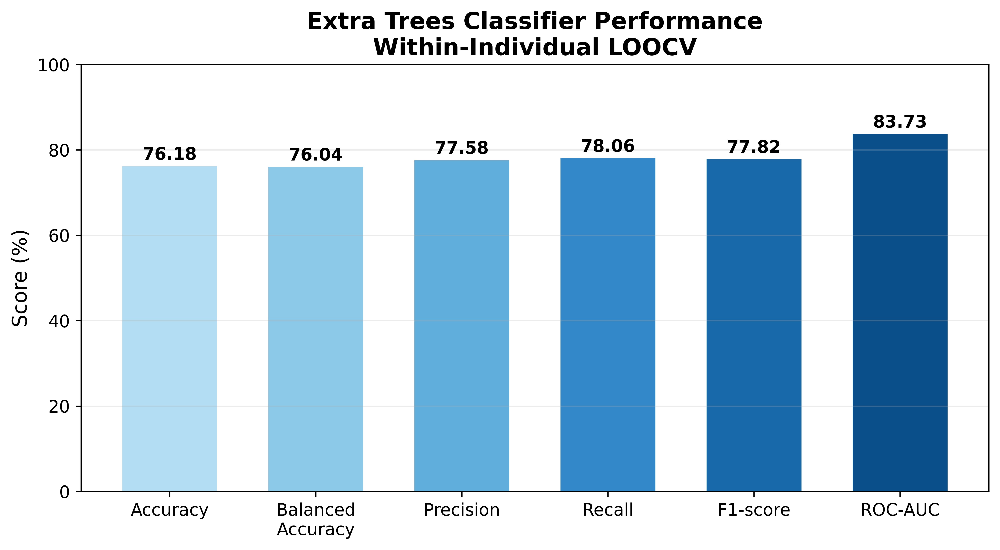

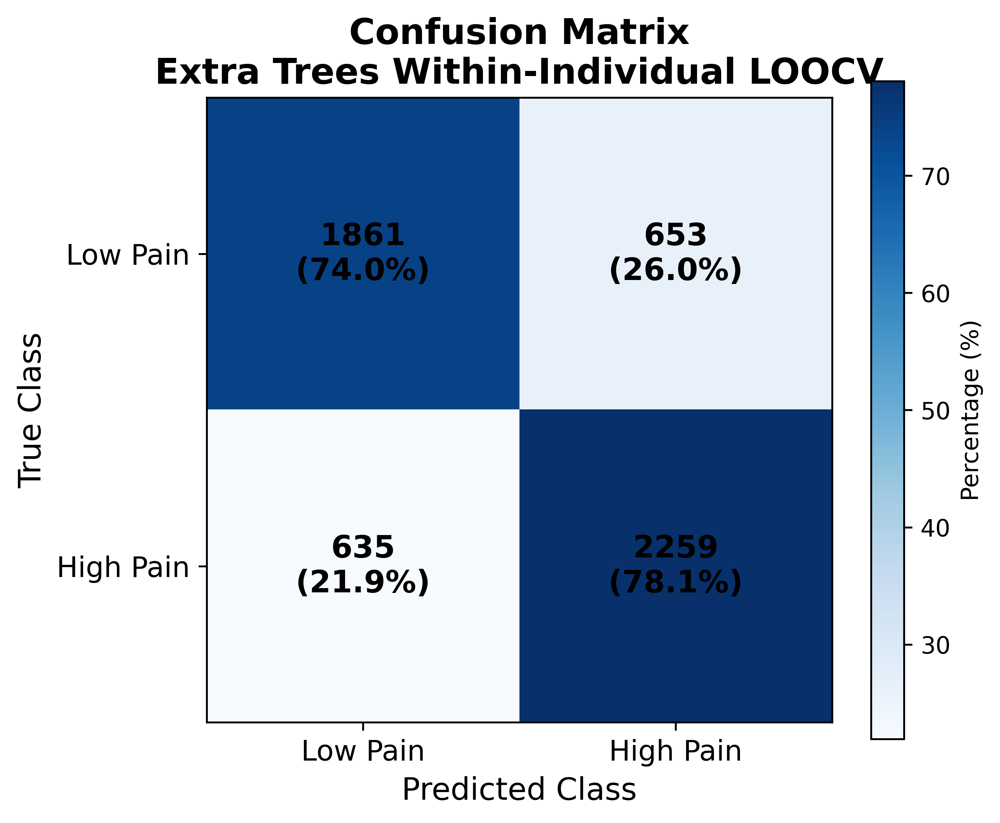

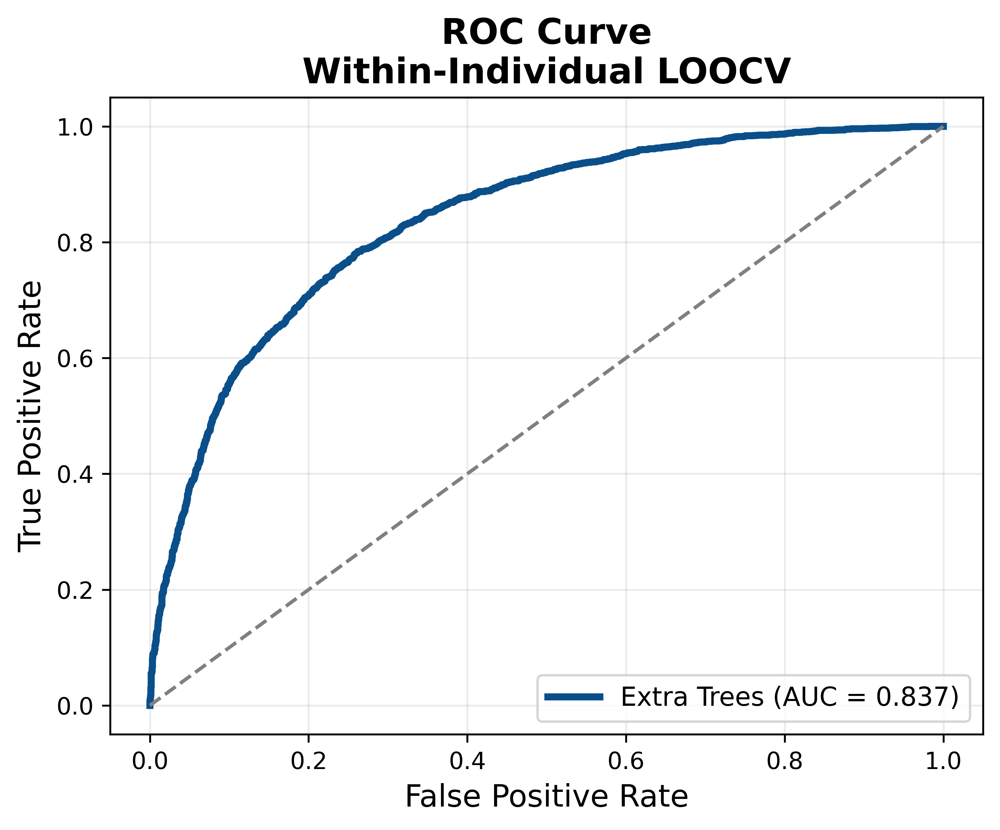

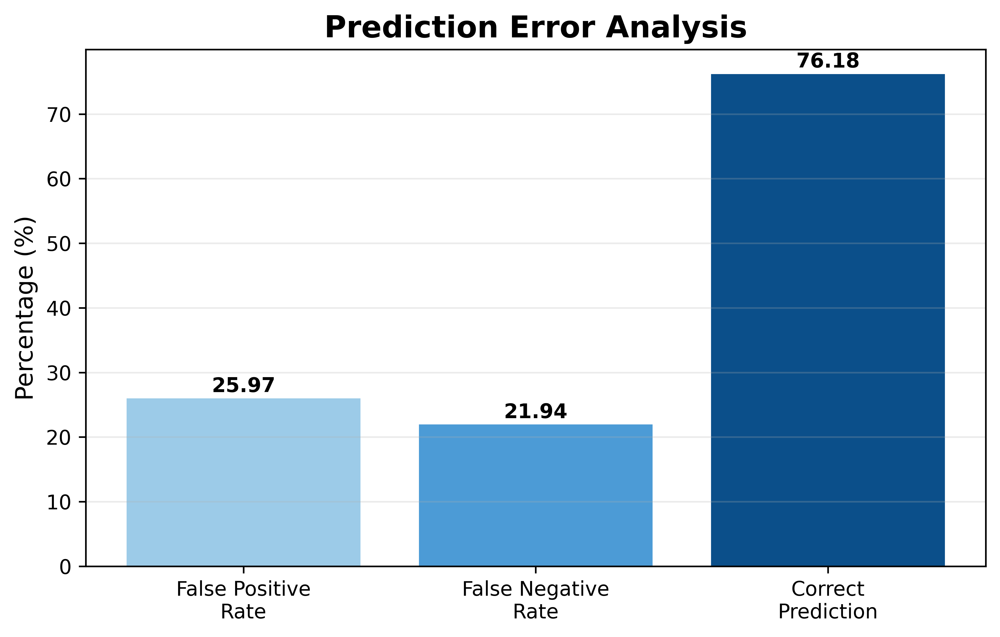

All premium figures saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/Premium_Figures_ExtraTrees
✓ Fig1_Performance.png
✓ Fig2_Confusion_Matrix_Blue.png
✓ Fig3_ROC_Curve.png
✓ Fig4_Error_Analysis.png


In [ ]:
# ============================================================
# PREMIUM VISUALIZATION SUITE
# Extra Trees - Within Individual LOOCV
# Thesis / Journal / PPT
# ============================================================


import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import (
    roc_curve,
    auc,
    confusion_matrix
)


# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

RESULT_DIR = (
"/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/"
"V7_MAIN_PIPELINE/"
"V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)


PRED_FILE = os.path.join(
    RESULT_DIR,
    "ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192__trial_predictions.csv"
)


FIG_DIR = (
"/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/"
"V7_MAIN_PIPELINE/"
"Premium_Figures_ExtraTrees"
)


os.makedirs(FIG_DIR, exist_ok=True)



# ------------------------------------------------------------
# Load predictions
# ------------------------------------------------------------

df = pd.read_csv(PRED_FILE)


y_true = df["y_true"].values
y_pred = df["y_pred"].values
y_score = df["y_score"].values



# ============================================================
# 1. Premium Performance Figure
# ============================================================


metrics = {
    "Accuracy":76.18,
    "Balanced\nAccuracy":76.04,
    "Precision":77.58,
    "Recall":78.06,
    "F1-score":77.82,
    "ROC-AUC":83.73
}


plt.figure(
    figsize=(9,5),
    dpi=600
)


colors = [
    "#B3DDF2",
    "#8CC8E8",
    "#5FAEDB",
    "#3288C9",
    "#1769AA",
    "#0B4F8A"
]


bars = plt.bar(
    metrics.keys(),
    metrics.values(),
    color=colors,
    width=0.65
)


plt.ylabel(
    "Score (%)",
    fontsize=13
)

plt.ylim(0,100)


plt.xticks(
    fontsize=11
)


plt.yticks(
    fontsize=11
)


for bar,val in zip(
    bars,
    metrics.values()
):

    plt.text(
        bar.get_x()+bar.get_width()/2,
        val+1.5,
        f"{val:.2f}",
        ha="center",
        fontsize=11,
        fontweight="bold"
    )


plt.title(
    "Extra Trees Classifier Performance\nWithin-Individual LOOCV",
    fontsize=15,
    weight="bold"
)


plt.grid(
    axis="y",
    alpha=0.25
)


plt.tight_layout()


plt.savefig(
    FIG_DIR+"/Fig1_Performance.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()



# ============================================================
# 2. Premium Confusion Matrix
# ============================================================


cm = confusion_matrix(
    y_true,
    y_pred
)


cm_percent = (
    cm /
    cm.sum(axis=1,keepdims=True)
)*100



fig,ax = plt.subplots(
    figsize=(6,5),
    dpi=600
)


im=ax.imshow(
    cm_percent,
    cmap="Blues"
)


plt.colorbar(
    im,
    ax=ax,
    label="Percentage (%)"
)



labels=[
    "Low Pain",
    "High Pain"
]


ax.set_xticks([0,1])
ax.set_yticks([0,1])

ax.set_xticklabels(
    labels,
    fontsize=12
)

ax.set_yticklabels(
    labels,
    fontsize=12
)


ax.set_xlabel(
    "Predicted Class",
    fontsize=13
)

ax.set_ylabel(
    "True Class",
    fontsize=13
)


for i in range(2):
    for j in range(2):

        ax.text(
            j,
            i,
            f"{cm[i,j]}\n({cm_percent[i,j]:.1f}%)",
            ha="center",
            va="center",
            fontsize=13,
            weight="bold"
        )


plt.title(
    "Confusion Matrix\nExtra Trees Within-Individual LOOCV",
    fontsize=15,
    weight="bold"
)


plt.tight_layout()


plt.savefig(
    FIG_DIR+"/Fig2_Confusion_Matrix_Blue.png",
    dpi=600,
    bbox_inches="tight"
)


plt.show()



# ============================================================
# 3. ROC-AUC Curve
# ============================================================


fpr,tpr,thresholds = roc_curve(
    y_true,
    y_score
)


roc_auc = auc(
    fpr,
    tpr
)



plt.figure(
    figsize=(6,5),
    dpi=600
)


plt.plot(
    fpr,
    tpr,
    linewidth=3,
    color="#0B4F8A",
    label=f"Extra Trees (AUC = {roc_auc:.3f})"
)


plt.plot(
    [0,1],
    [0,1],
    linestyle="--",
    color="gray"
)


plt.xlabel(
    "False Positive Rate",
    fontsize=13
)


plt.ylabel(
    "True Positive Rate",
    fontsize=13
)


plt.title(
    "ROC Curve\nWithin-Individual LOOCV",
    fontsize=15,
    weight="bold"
)


plt.legend(
    fontsize=11,
    loc="lower right"
)


plt.grid(
    alpha=0.25
)


plt.tight_layout()


plt.savefig(
    FIG_DIR+"/Fig3_ROC_Curve.png",
    dpi=600,
    bbox_inches="tight"
)


plt.show()



# ============================================================
# 4. Error Analysis
# ============================================================


TN,FP,FN,TP = cm.ravel()


error_metrics={
    "False Positive\nRate":FP/(FP+TN)*100,
    "False Negative\nRate":FN/(FN+TP)*100,
    "Correct\nPrediction":(TP+TN)/(TP+TN+FP+FN)*100
}



plt.figure(
    figsize=(7,4.5),
    dpi=600
)


bars=plt.bar(
    error_metrics.keys(),
    error_metrics.values(),
    color=[
        "#9CCBE8",
        "#4C9BD6",
        "#0B4F8A"
    ]
)


plt.ylabel(
    "Percentage (%)",
    fontsize=12
)


plt.title(
    "Prediction Error Analysis",
    fontsize=15,
    weight="bold"
)


for b,v in zip(
    bars,
    error_metrics.values()
):

    plt.text(
        b.get_x()+b.get_width()/2,
        v+1,
        f"{v:.2f}",
        ha="center",
        weight="bold"
    )


plt.grid(
    axis="y",
    alpha=0.25
)


plt.tight_layout()


plt.savefig(
    FIG_DIR+"/Fig4_Error_Analysis.png",
    dpi=600,
    bbox_inches="tight"
)


plt.show()



print("All premium figures saved:")
print(FIG_DIR)

for f in os.listdir(FIG_DIR):
    print("✓",f)

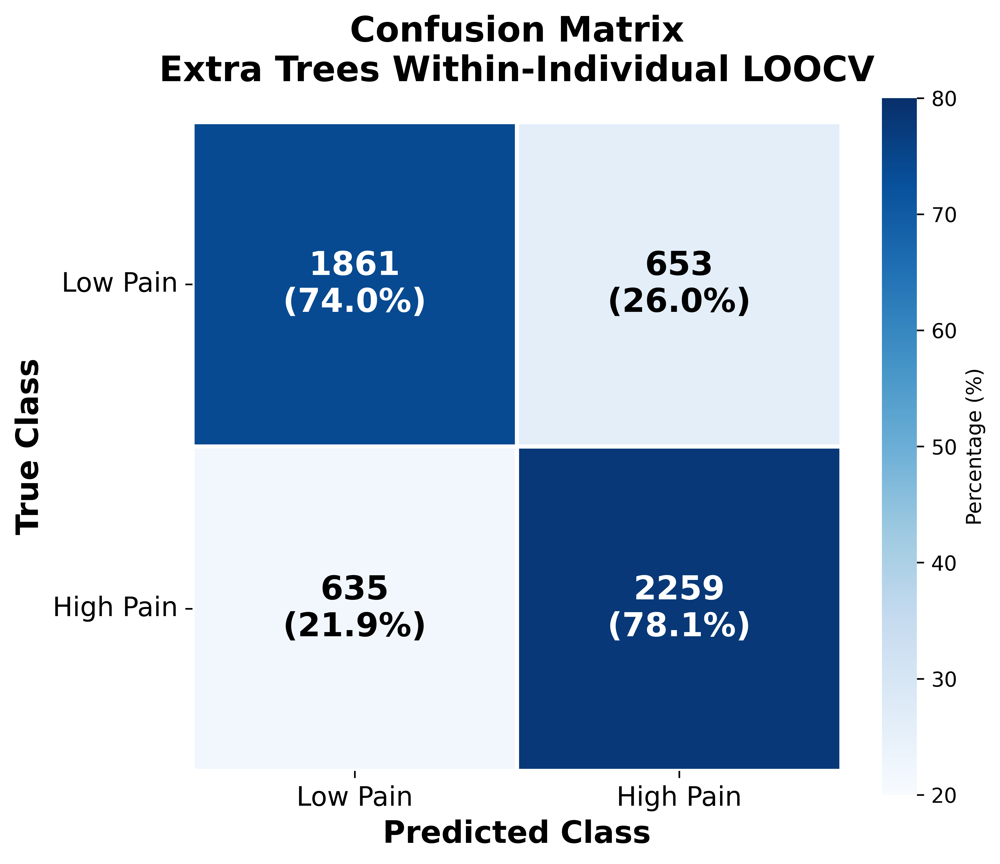

Saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/Premium_Figures_ExtraTrees /Fig2_Premium_Blue_Confusion_Matrix.png


In [ ]:
# ============================================================
# PREMIUM BLUE CONFUSION MATRIX
# White font on dark cells
# Extra Trees Within-Individual LOOCV
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os


# ------------------------------------------------------------
# Save directory
# ------------------------------------------------------------

FIG_DIR = (
"/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/"
"V7_MAIN_PIPELINE/Premium_Figures_ExtraTrees"
)

os.makedirs(FIG_DIR, exist_ok=True)



# ------------------------------------------------------------
# Confusion matrix values
# ------------------------------------------------------------

cm = np.array([
    [1861, 653],
    [635, 2259]
])


# Row-wise percentage
cm_percent = (
    cm /
    cm.sum(axis=1, keepdims=True)
) * 100



# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

plt.figure(
    figsize=(7,6),
    dpi=600
)


ax = sns.heatmap(
    cm_percent,
    annot=False,
    cmap="Blues",
    cbar=True,
    linewidths=2,
    linecolor="white",
    square=True,
    vmin=20,
    vmax=80,
    cbar_kws={
        "label":"Percentage (%)"
    }
)



# ------------------------------------------------------------
# Add custom annotations
# ------------------------------------------------------------

for i in range(2):
    for j in range(2):

        value = cm[i,j]
        percentage = cm_percent[i,j]


        # white text for dark blue cells
        if percentage >= 60:
            text_color = "white"
        else:
            text_color = "black"


        ax.text(
            j+0.5,
            i+0.5,
            f"{value}\n({percentage:.1f}%)",
            ha="center",
            va="center",
            fontsize=16,
            fontweight="bold",
            color=text_color
        )



# ------------------------------------------------------------
# Labels
# ------------------------------------------------------------

ax.set_xlabel(
    "Predicted Class",
    fontsize=15,
    fontweight="bold"
)

ax.set_ylabel(
    "True Class",
    fontsize=15,
    fontweight="bold"
)


ax.set_xticklabels(
    [
        "Low Pain",
        "High Pain"
    ],
    fontsize=13
)


ax.set_yticklabels(
    [
        "Low Pain",
        "High Pain"
    ],
    fontsize=13,
    rotation=0
)



plt.title(
    "Confusion Matrix\nExtra Trees Within-Individual LOOCV",
    fontsize=17,
    fontweight="bold",
    pad=20
)



plt.tight_layout()



# ------------------------------------------------------------
# Save high resolution
# ------------------------------------------------------------

plt.savefig(
    os.path.join(
        FIG_DIR,
        "Fig2_Premium_Blue_Confusion_Matrix.png"
    ),
    dpi=600,
    bbox_inches="tight"
)


# Also save vector PDF for paper
plt.savefig(
    os.path.join(
        FIG_DIR,
        "Fig2_Premium_Blue_Confusion_Matrix.pdf"
    ),
    bbox_inches="tight"
)


plt.show()


print("Saved:")
print(
    FIG_DIR,
    "/Fig2_Premium_Blue_Confusion_Matrix.png"
)

In [ ]:
import pandas as pd
import os

RESULT_DIR = (
"/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/"
"V7_MAIN_PIPELINE/"
"V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192"
)


PRED_FILE = os.path.join(
    RESULT_DIR,
    "ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_strict192__trial_predictions.csv"
)


pred_df = pd.read_csv(PRED_FILE)


print(pred_df.shape)

print(pred_df.head())

print(pred_df.columns)

(5408, 13)
                                          experiment       model  \
0  ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_s...  ExtraTrees   
1  ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_s...  ExtraTrees   
2  ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_s...  ExtraTrees   
3  ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_s...  ExtraTrees   
4  ExtraTrees__Handcrafted_262_noPCA__v7_no_pca_s...  ExtraTrees   

             feature_set test_subject  subject_trial_position  \
0  Handcrafted_262_noPCA      sub-001                       0   
1  Handcrafted_262_noPCA      sub-001                       1   
2  Handcrafted_262_noPCA      sub-001                       2   
3  Handcrafted_262_noPCA      sub-001                       3   
4  Handcrafted_262_noPCA      sub-001                       4   

   original_row_index  y_true  y_pred   y_score   score_source  fit_seconds  \
0                   0       0       0  0.339040  predict_proba     2.602148   
1                   1       1  

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np


# Load directly from prediction dataframe

cm = confusion_matrix(
    pred_df["y_true"],
    pred_df["y_pred"]
)


print("Confusion Matrix:")
print(cm)


# Extract values

TN, FP, FN, TP = cm.ravel()


print("\nTN =", TN)
print("FP =", FP)
print("FN =", FN)
print("TP =", TP)

Confusion Matrix:
[[1861  653]
 [ 635 2259]]

TN = 1861
FP = 653
FN = 635
TP = 2259


In [ ]:
# ============================================================
# CELL 11 — Run Huang Gaussian Naive Bayes on V7 features
# Within-individual LOOCV, no PCA, strict-192
# ============================================================

from sklearn.naive_bayes import GaussianNB

gnb_huang = GaussianNB()

gnb_huang_result = run_within_individual_loocv_v7(
    X=X_handcrafted,
    y=y,
    groups=groups,
    estimator=gnb_huang,
    model_name="GaussianNB",
    feature_set_name="Handcrafted_262_noPCA",
    experiment_tag="huang_gnb_on_v7_features_strict192",
    expected_subjects=192,
    resume=True,
    overwrite=False
)


V7 WITHIN-INDIVIDUAL LOOCV EXPERIMENT
Experiment: GaussianNB__Handcrafted_262_noPCA__huang_gnb_on_v7_features_strict192
Model: GaussianNB
Feature set: Handcrafted_262_noPCA
Feature matrix: (6275, 262)
Eligible strict-192 subjects: 192
Evaluated trials: 5408

Results will be saved to:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__huang_gnb_on_v7_features_strict192__trial_predictions.csv

Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__huang_gnb_on_v7_features_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__huang_gnb_on_v7_features_strict192__subject_metric_summary.csv

Pooled summ

V7 Within LOOCV | GaussianNB:   0%|          | 0/192 [00:00<?, ?it/s]


V7 WITHIN-INDIVIDUAL LOOCV COMPLETED SUCCESSFULLY
Experiment: GaussianNB__Handcrafted_262_noPCA__huang_gnb_on_v7_features_strict192
Model: GaussianNB
Feature set: Handcrafted_262_noPCA
Evaluated subjects: 192
Evaluated held-out trials: 5408

POOLED HELD-OUT TRIAL METRICS:


,value
accuracy,0.752034
balanced_accuracy,0.751574
precision,0.773898
recall,0.758120
sensitivity,0.758120
specificity,0.745028
f1_score,0.765928
roc_auc,0.799830
average_precision_pr_auc,0.775677
matthews_correlation_coefficient,0.502494



Mean subject accuracy ± SD:
75.16% ± 13.04%

SUBJECT METRICS: MEAN ± SD


,metric,n_evaluated_subjects,n_valid_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,192,192,0.751605,0.130388,75.160535,13.038797,75.16% ± 13.04%
1,balanced_accuracy,192,192,0.601796,0.138781,60.179552,13.878064,60.18% ± 13.88%
2,precision,192,192,0.647976,0.285856,64.797641,28.585585,64.80% ± 28.59%
3,recall,192,192,0.628837,0.323788,62.883715,32.378773,62.88% ± 32.38%
4,sensitivity,192,192,0.628837,0.323788,62.883715,32.378773,62.88% ± 32.38%
5,specificity,192,192,0.574754,0.362787,57.475388,36.278698,57.48% ± 36.28%
6,negative_predictive_value,192,161,0.643894,0.243643,64.389402,24.364269,64.39% ± 24.36%
7,false_positive_rate,192,192,0.425246,0.362787,42.524612,36.278698,42.52% ± 36.28%
8,false_negative_rate,192,192,0.371163,0.323788,37.116285,32.378773,37.12% ± 32.38%
9,f1_score,192,192,0.628363,0.300255,62.836304,30.025481,62.84% ± 30.03%



Saved paths:

Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__huang_gnb_on_v7_features_strict192__trial_predictions.csv

Subject-level results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__huang_gnb_on_v7_features_strict192__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__huang_gnb_on_v7_features_strict192__subject_metric_summary.csv

Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_WITHIN_INDIVIDUAL_LOOCV_RESULTS_STRICT192/GaussianNB__Handcrafted_262_noPCA__huang_gnb_on_v7_features_strict192__pooled_summary.csv

Progress checkpoint:
 /content/drive/MyDrive/EXP8_C

cross individual starts



In [ ]:
# CELL — Subject-wise feature standardization (leakage-free, unsupervised)
# Applied on top of the already baseline-normalized X_v5_handcrafted_all_262.npy
# Input:  X_handcrafted (6275, 262), groups (6275,) subject IDs
# Output: X_handcrafted_standardized (6275, 262)

import os
import numpy as np


def standardize_within_subject(X, groups, min_sd=1e-8):
    """
    For every subject, z-score that subject's own trials using that
    subject's own per-feature mean and SD -- computed exclusively from
    that subject's own trials, never from any other subject, and never
    using labels.

    Why this is leakage-free:
      - Unsupervised: y is never referenced anywhere in this function.
      - Subject-local: subject A's transform depends only on subject A's
        own feature values. When subject A is later the held-out test
        subject in a LOSO fold, its normalization was never influenced
        by any other subject's data -- so there is no cross-subject
        leakage into the training side, and no label leakage at all.
      - Safe to compute once, globally, before the fold loop -- unlike
        PCA/StandardScaler, its output for subject A does not change
        depending on which other subjects happen to be in a given
        training fold, so there is nothing to "refit per fold" here.

    Parameters
    ----------
    X : array, shape (n_epochs, n_features)
        Feature matrix. Expected here: X_handcrafted, (6275, 262).
    groups : array, shape (n_epochs,)
        Subject ID per row, e.g. groups_v5 / groups.
    min_sd : float
        Floor applied to each subject's per-feature SD to avoid
        division by (near-)zero for constant features.

    Returns
    -------
    X_standardized : array, shape (n_epochs, n_features), dtype float64
    """
    X = np.asarray(X, dtype=np.float64)
    groups = np.asarray(groups).astype(str)

    if X.shape[0] != len(groups):
        raise ValueError(
            f"Row count mismatch: X has {X.shape[0]} rows, "
            f"groups has {len(groups)} entries."
        )
    if not np.isfinite(X).all():
        raise ValueError("X contains NaN or infinite values before standardization.")

    X_standardized = np.empty_like(X)
    unique_subjects = np.sort(np.unique(groups))

    zero_variance_report = []

    for subject_id in unique_subjects:
        subject_mask = groups == subject_id
        subject_data = X[subject_mask]

        subject_mean = subject_data.mean(axis=0)
        subject_sd = subject_data.std(axis=0)

        n_zero_variance = int(np.sum(subject_sd < min_sd))
        if n_zero_variance > 0:
            zero_variance_report.append((subject_id, n_zero_variance))

        subject_sd = np.maximum(subject_sd, min_sd)

        X_standardized[subject_mask] = (subject_data - subject_mean) / subject_sd

    if zero_variance_report:
        print(
            f"Note: {len(zero_variance_report)} subject(s) had at least one "
            f"near-zero-variance feature (floored to {min_sd} to avoid "
            f"division by zero). This is expected for subjects with very "
            f"few trials and does not indicate an error."
        )

    if not np.isfinite(X_standardized).all():
        raise RuntimeError(
            "Standardization produced non-finite values -- "
            "check zero_variance_report / min_sd."
        )

    return X_standardized


# ------------------------------------------------------------
# Run it
# ------------------------------------------------------------

X_handcrafted_standardized = standardize_within_subject(X_handcrafted, groups)

print("Input shape:", X_handcrafted.shape)
print("Output shape:", X_handcrafted_standardized.shape)
print("Subjects:", len(np.unique(groups)))

# ------------------------------------------------------------
# Verification: each subject's own trials should now have
# per-feature mean ~0 and SD ~1 WITHIN that subject
# ------------------------------------------------------------

check_subject = np.unique(groups)[0]
mask = groups == check_subject
print(f"\nVerification for subject {check_subject} ({mask.sum()} trials):")
print("  mean of standardized features (should be ~0):",
      np.round(X_handcrafted_standardized[mask].mean(axis=0)[:5], 6))
print("  SD of standardized features (should be ~1):",
      np.round(X_handcrafted_standardized[mask].std(axis=0)[:5], 6))

# ------------------------------------------------------------
# Save alongside the other V7 arrays
# ------------------------------------------------------------

X_STANDARDIZED_PATH = os.path.join(V7_DIR, "X_v7_handcrafted_262_subject_standardized.npy")
np.save(X_STANDARDIZED_PATH, X_handcrafted_standardized)
print("\nSaved:", X_STANDARDIZED_PATH)

Input shape: (6275, 262)
Output shape: (6275, 262)
Subjects: 223

Verification for subject sub-001 (28 trials):
  mean of standardized features (should be ~0): [-0. -0.  0.  0.  0.]
  SD of standardized features (should be ~1): [1. 1. 1. 1. 1.]

Saved: /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/X_v7_handcrafted_262_subject_standardized.npy


In [ ]:
print(X_handcrafted_standardized.shape, X_handcrafted_standardized is X_handcrafted)
# Expect: (6275, 262) False

(6275, 262) False


In [ ]:
# CELL 20 (V7) — Complete leakage-safe cross-individual LOSO evaluator

import os
import re
import json
import time
import warnings

import numpy as np
import pandas as pd

from tqdm.auto import tqdm
from sklearn.base import clone
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)

warnings.filterwarnings("ignore")


# ============================================================
# 1. Output directory
# ============================================================

V7_LOSO_RESULTS_DIR = os.path.join(V7_DIR, "V7_LOSO_RESULTS")
os.makedirs(V7_LOSO_RESULTS_DIR, exist_ok=True)

print("V7 LOSO evaluator output directory:")
print(V7_LOSO_RESULTS_DIR)


# ============================================================
# 2. Safe file-writing helpers
# ============================================================

def atomic_write_csv(dataframe, path):
    temporary_path = f"{path}.tmp"
    dataframe.to_csv(temporary_path, index=False)
    os.replace(temporary_path, path)


def atomic_write_json(content, path):
    temporary_path = f"{path}.tmp"
    with open(temporary_path, "w", encoding="utf-8") as file:
        json.dump(content, file, indent=4)
    os.replace(temporary_path, path)


def make_safe_filename(text):
    text = str(text).strip()
    text = re.sub(r"[^A-Za-z0-9_.-]+", "_", text)
    return text.strip("_")


# ============================================================
# 3. Obtain continuous prediction scores
# ============================================================

def get_positive_class_scores(fitted_model, X_test, y_pred):
    classes = np.asarray(getattr(fitted_model, "classes_", np.array([0, 1])))
    positive_indices = np.flatnonzero(classes == 1)
    if len(positive_indices) == 0:
        raise ValueError("The fitted classifier does not contain positive class label 1.")
    positive_index = int(positive_indices[0])

    if hasattr(fitted_model, "predict_proba"):
        probabilities = np.asarray(fitted_model.predict_proba(X_test), dtype=float)
        if probabilities.ndim != 2:
            raise ValueError("predict_proba() returned an unexpected shape.")
        return probabilities[:, positive_index].ravel(), "predict_proba"

    if hasattr(fitted_model, "decision_function"):
        decision_scores = np.asarray(fitted_model.decision_function(X_test), dtype=float)
        if decision_scores.ndim == 1:
            scores = decision_scores
        elif decision_scores.ndim == 2:
            scores = decision_scores[:, positive_index]
        else:
            raise ValueError("decision_function() returned an unexpected shape.")
        return scores.ravel(), "decision_function"

    return np.asarray(y_pred, dtype=float).ravel(), "predicted_label_fallback"


# ============================================================
# 4. Comprehensive binary-classification metrics
# ============================================================

def calculate_binary_metrics(y_true, y_pred, y_score=None):
    y_true = np.asarray(y_true, dtype=np.int8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.int8).ravel()

    if len(y_true) != len(y_pred):
        raise ValueError("y_true and y_pred have different lengths.")
    if y_score is not None:
        y_score = np.asarray(y_score, dtype=float).ravel()
        if len(y_score) != len(y_true):
            raise ValueError("y_score and y_true have different lengths.")

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    has_both_true_classes = len(np.unique(y_true)) == 2
    valid_continuous_scores = y_score is not None and np.isfinite(y_score).all()

    precision = precision_score(y_true, y_pred, pos_label=1, zero_division=0)
    recall = recall_score(y_true, y_pred, pos_label=1, zero_division=0)
    sensitivity = recall
    specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan
    negative_predictive_value = tn / (tn + fn) if (tn + fn) > 0 else np.nan
    false_positive_rate = fp / (fp + tn) if (fp + tn) > 0 else np.nan
    false_negative_rate = fn / (fn + tp) if (fn + tp) > 0 else np.nan

    if has_both_true_classes and valid_continuous_scores:
        roc_auc = roc_auc_score(y_true, y_score)
        average_precision_pr_auc = average_precision_score(y_true, y_score)
    else:
        roc_auc = np.nan
        average_precision_pr_auc = np.nan

    try:
        matthews_correlation = matthews_corrcoef(y_true, y_pred)
    except Exception:
        matthews_correlation = np.nan

    try:
        cohen_kappa = cohen_kappa_score(y_true, y_pred)
        if not np.isfinite(cohen_kappa):
            cohen_kappa = np.nan
    except Exception:
        cohen_kappa = np.nan

    precision_macro = precision_score(y_true, y_pred, labels=[0, 1], average="macro", zero_division=0)
    recall_macro = recall_score(y_true, y_pred, labels=[0, 1], average="macro", zero_division=0)
    f1_macro = f1_score(y_true, y_pred, labels=[0, 1], average="macro", zero_division=0)
    precision_weighted = precision_score(y_true, y_pred, labels=[0, 1], average="weighted", zero_division=0)
    recall_weighted = recall_score(y_true, y_pred, labels=[0, 1], average="weighted", zero_division=0)
    f1_weighted = f1_score(y_true, y_pred, labels=[0, 1], average="weighted", zero_division=0)

    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "balanced_accuracy": balanced_accuracy_score(y_true, y_pred) if has_both_true_classes else np.nan,
        "precision": precision,
        "recall": recall,
        "sensitivity": sensitivity,
        "specificity": specificity,
        "negative_predictive_value": negative_predictive_value,
        "false_positive_rate": false_positive_rate,
        "false_negative_rate": false_negative_rate,
        "f1_score": f1_score(y_true, y_pred, pos_label=1, zero_division=0),
        "roc_auc": roc_auc,
        "average_precision_pr_auc": average_precision_pr_auc,
        "matthews_correlation_coefficient": matthews_correlation,
        "cohen_kappa": cohen_kappa,
        "precision_macro": precision_macro,
        "recall_macro": recall_macro,
        "f1_macro": f1_macro,
        "precision_weighted": precision_weighted,
        "recall_weighted": recall_weighted,
        "f1_weighted": f1_weighted,
        "prevalence_high_pain": float(np.mean(y_true == 1)),
        "support_low_pain": int(np.sum(y_true == 0)),
        "support_high_pain": int(np.sum(y_true == 1)),
        "true_negative": int(tn), "false_positive": int(fp),
        "false_negative": int(fn), "true_positive": int(tp),
    }


# ============================================================
# 5. Subject-level metric summary
# ============================================================

def summarize_subject_metrics(subject_results_df):
    metric_columns = [
        "accuracy", "balanced_accuracy", "precision", "recall", "sensitivity",
        "specificity", "negative_predictive_value", "false_positive_rate",
        "false_negative_rate", "f1_score", "roc_auc", "average_precision_pr_auc",
        "matthews_correlation_coefficient", "cohen_kappa", "precision_macro",
        "recall_macro", "f1_macro", "precision_weighted", "recall_weighted", "f1_weighted",
    ]
    summary_rows = []
    for metric in metric_columns:
        values = subject_results_df[metric].replace([np.inf, -np.inf], np.nan).dropna().astype(float)
        metric_mean = values.mean() if len(values) > 0 else np.nan
        metric_standard_deviation = values.std(ddof=1) if len(values) > 1 else np.nan
        summary_rows.append({
            "metric": metric,
            "n_subjects": int(len(values)),
            "mean": metric_mean,
            "standard_deviation": metric_standard_deviation,
            "mean_percent": metric_mean * 100 if np.isfinite(metric_mean) else np.nan,
            "standard_deviation_percent": metric_standard_deviation * 100 if np.isfinite(metric_standard_deviation) else np.nan,
            "mean_plus_minus_sd": (
                f"{metric_mean * 100:.2f}% ± {metric_standard_deviation * 100:.2f}%"
                if (np.isfinite(metric_mean) and np.isfinite(metric_standard_deviation)) else "Not defined"
            ),
        })
    return pd.DataFrame(summary_rows)


# ============================================================
# 6. Main reusable LOSO evaluator (V7)
# ============================================================

def run_loso_evaluation_v7(
    X, y, groups, estimator, model_name, feature_set_name,
    metadata_df=None, experiment_tag="v7_subject_standardized",
    resume=True, overwrite=False, compute_train_accuracy=False,
):
    """
    Leakage-safe Leave-One-Subject-Out classification. Identical structure
    to your V5 evaluator. X should already be subject-wise standardized
    (unsupervised transform, safe to apply once before this function --
    it never uses labels, so it doesn't need per-fold refitting like
    PCA/StandardScaler would).
    """

    y = np.asarray(y, dtype=np.int8).ravel()
    groups = np.asarray(groups).astype(str).ravel()

    if not hasattr(X, "shape") or len(X.shape) != 2:
        raise ValueError("X must have shape (n_epochs, n_features).")

    n_epochs = int(X.shape[0])
    n_features = int(X.shape[1])

    if n_epochs != len(y):
        raise ValueError("X and y have different numbers of rows.")
    if len(y) != len(groups):
        raise ValueError("y and groups have different numbers of rows.")
    if metadata_df is not None and len(metadata_df) != n_epochs:
        raise ValueError("metadata_df is not aligned with X.")
    if not np.array_equal(np.unique(y), np.array([0, 1])):
        raise ValueError("Labels must contain binary values 0 and 1.")

    all_subjects = np.sort(np.unique(groups))
    n_subjects = int(len(all_subjects))

    validation_batch_size = 512
    for validation_start in range(0, n_epochs, validation_batch_size):
        validation_stop = min(validation_start + validation_batch_size, n_epochs)
        validation_batch = np.asarray(X[validation_start:validation_stop])
        if not np.isfinite(validation_batch).all():
            raise ValueError(f"X contains NaN or infinite values between rows {validation_start}:{validation_stop}.")

    safe_model_name = make_safe_filename(model_name)
    safe_feature_set_name = make_safe_filename(feature_set_name)
    safe_experiment_tag = make_safe_filename(experiment_tag)
    experiment_name = f"{safe_model_name}__{safe_feature_set_name}__{safe_experiment_tag}"

    trial_prediction_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__trial_predictions.csv")
    subject_result_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__subject_results.csv")
    subject_metric_summary_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__subject_metric_summary.csv")
    pooled_summary_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__pooled_summary.csv")
    progress_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__progress.json")
    configuration_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__configuration.json")
    output_paths = [trial_prediction_path, subject_result_path, subject_metric_summary_path,
                     pooled_summary_path, progress_path, configuration_path]

    print("\n" + "=" * 72)
    print("V7 LOSO EXPERIMENT")
    print("=" * 72)
    print("Experiment name:", experiment_name)
    print("Model:", model_name)
    print("Feature set:", feature_set_name)
    print("Feature matrix:", X.shape)
    print("Subjects:", n_subjects)
    print("Class counts [low, high]:", np.bincount(y))
    print("\nResults will be saved to:")
    print("1. Trial predictions:\n", trial_prediction_path)
    print("\n2. Subject results:\n", subject_result_path)
    print("\n3. Subject metric summary:\n", subject_metric_summary_path)
    print("\n4. Pooled summary:\n", pooled_summary_path)
    print("\n5. Progress checkpoint:\n", progress_path)
    print("\n6. Configuration:\n", configuration_path)

    if overwrite:
        for path in output_paths:
            if os.path.exists(path):
                os.remove(path)
        print("\nExisting experiment files removed.")
    elif not resume and os.path.exists(trial_prediction_path):
        raise FileExistsError("An existing checkpoint was found. Use resume=True or overwrite=True.")

    configuration = {
        "experiment_name": experiment_name, "model_name": str(model_name),
        "feature_set_name": str(feature_set_name), "experiment_tag": str(experiment_tag),
        "validation": "Leave-One-Subject-Out", "n_epochs": n_epochs, "n_features": n_features,
        "n_subjects": n_subjects, "low_pain_count": int(np.sum(y == 0)), "high_pain_count": int(np.sum(y == 1)),
        "positive_class": "High pain = 1", "negative_class": "Low pain = 0", "estimator": repr(estimator),
        "compute_train_accuracy": bool(compute_train_accuracy),
        "leakage_control": (
            "A fresh cloned estimator is fitted only on outer-training subjects inside every "
            "LOSO fold. Subject-wise feature standardization was applied once, upstream, "
            "using each subject's own trials only (unsupervised, no labels used)."
        ),
    }
    atomic_write_json(configuration, configuration_path)

    required_prediction_columns = {"test_subject", "original_row_index", "y_true", "y_pred", "y_score"}

    if resume and os.path.exists(trial_prediction_path):
        predictions_df = pd.read_csv(trial_prediction_path)
        missing_columns = required_prediction_columns.difference(predictions_df.columns)
        if missing_columns:
            raise ValueError(f"The saved checkpoint is invalid. Missing columns: {sorted(missing_columns)}")
        predictions_df["test_subject"] = predictions_df["test_subject"].astype(str)
        predictions_df = (predictions_df.sort_values("original_row_index")
                           .drop_duplicates(subset=["original_row_index"], keep="last").reset_index(drop=True))
        completed_subjects = set(predictions_df["test_subject"].unique())
        print("\nCheckpoint detected. Completed subjects:", len(completed_subjects), "/", n_subjects)
    else:
        predictions_df = pd.DataFrame()
        completed_subjects = set()
        print("\nStarting a new V7 LOSO run.")

    if resume and os.path.exists(subject_result_path):
        subject_checkpoint_df = pd.read_csv(subject_result_path)
        if "subject_id" in subject_checkpoint_df.columns:
            subject_checkpoint_df["subject_id"] = subject_checkpoint_df["subject_id"].astype(str)
    else:
        subject_checkpoint_df = pd.DataFrame()

    wall_start_time = time.perf_counter()

    for test_subject in tqdm(all_subjects, desc=f"V7 LOSO | {model_name} | {feature_set_name}"):
        test_subject = str(test_subject)
        if test_subject in completed_subjects:
            continue

        train_indices = np.flatnonzero(groups != test_subject)
        test_indices = np.flatnonzero(groups == test_subject)

        if len(test_indices) == 0:
            raise RuntimeError(f"No test rows found for {test_subject}.")

        train_subjects = set(groups[train_indices])
        test_subjects = set(groups[test_indices])

        if not train_subjects.isdisjoint(test_subjects):
            raise RuntimeError("Subject leakage detected between training and test indices.")
        if test_subject in train_subjects:
            raise RuntimeError(f"Test subject {test_subject} was found in the training fold.")
        if test_subjects != {test_subject}:
            raise RuntimeError("The test fold contains an unexpected subject.")

        X_train, X_test = X[train_indices], X[test_indices]
        y_train, y_test = y[train_indices], y[test_indices]

        if len(np.unique(y_train)) != 2:
            raise RuntimeError(f"The training fold for {test_subject} does not contain both classes.")

        fold_model = clone(estimator)

        fit_start_time = time.perf_counter()
        fold_model.fit(X_train, y_train)
        fit_seconds = time.perf_counter() - fit_start_time

        prediction_start_time = time.perf_counter()
        y_pred = np.asarray(fold_model.predict(X_test), dtype=np.int8).ravel()
        y_score, score_source = get_positive_class_scores(fold_model, X_test, y_pred)
        prediction_seconds = time.perf_counter() - prediction_start_time

        if len(y_pred) != len(y_test):
            raise RuntimeError("Prediction length does not match test-label length.")
        if len(y_score) != len(y_test):
            raise RuntimeError("Prediction-score length does not match test-label length.")

        train_accuracy = fold_model.score(X_train, y_train) if compute_train_accuracy else np.nan

        fold_predictions_df = pd.DataFrame({
            "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
            "test_subject": test_subject, "original_row_index": test_indices,
            "y_true": y_test, "y_pred": y_pred, "y_score": y_score, "score_source": score_source,
            "fit_seconds": fit_seconds, "prediction_seconds": prediction_seconds, "train_accuracy": train_accuracy,
        })

        if metadata_df is not None:
            metadata_subset = metadata_df.iloc[test_indices].reset_index(drop=True)
            for column in ["trial_num", "painrating", "laser_power", "event_type", "source_file"]:
                if column in metadata_subset.columns:
                    fold_predictions_df[column] = metadata_subset[column].to_numpy()

        fold_metrics = calculate_binary_metrics(y_test, y_pred, y_score)

        fold_subject_result = {
            "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
            "subject_id": test_subject, "n_trials": int(len(y_test)),
            "n_low": int(np.sum(y_test == 0)), "n_high": int(np.sum(y_test == 1)),
            **fold_metrics, "fit_seconds": float(fit_seconds), "prediction_seconds": float(prediction_seconds),
            "train_accuracy": float(train_accuracy), "score_source": score_source,
        }
        fold_subject_df = pd.DataFrame([fold_subject_result])

        predictions_df = pd.concat([predictions_df, fold_predictions_df], ignore_index=True)
        predictions_df = (predictions_df.sort_values("original_row_index")
                           .drop_duplicates(subset=["original_row_index"], keep="last").reset_index(drop=True))

        subject_checkpoint_df = pd.concat([subject_checkpoint_df, fold_subject_df], ignore_index=True)
        subject_checkpoint_df["subject_id"] = subject_checkpoint_df["subject_id"].astype(str)
        subject_checkpoint_df = (subject_checkpoint_df.drop_duplicates(subset=["subject_id"], keep="last")
                                  .sort_values("subject_id").reset_index(drop=True))

        atomic_write_csv(predictions_df, trial_prediction_path)
        atomic_write_csv(subject_checkpoint_df, subject_result_path)

        completed_subjects.add(test_subject)

        atomic_write_json({
            "experiment_name": experiment_name, "completed": False,
            "completed_subjects": int(len(completed_subjects)), "total_subjects": n_subjects,
            "completed_prediction_rows": int(len(predictions_df)), "total_prediction_rows": n_epochs,
            "last_completed_subject": test_subject,
            "trial_prediction_path": trial_prediction_path, "subject_result_path": subject_result_path,
        }, progress_path)

    current_run_wall_seconds = time.perf_counter() - wall_start_time

    if not os.path.exists(trial_prediction_path):
        raise RuntimeError("No LOSO prediction checkpoint was saved.")

    predictions_df = pd.read_csv(trial_prediction_path)
    predictions_df["test_subject"] = predictions_df["test_subject"].astype(str)
    predictions_df = predictions_df.sort_values("original_row_index").reset_index(drop=True)

    if len(predictions_df) != n_epochs:
        raise RuntimeError(f"LOSO is incomplete: {len(predictions_df)} of {n_epochs} trials were predicted.")
    if predictions_df["original_row_index"].nunique() != n_epochs:
        raise RuntimeError("Duplicate or missing prediction indices were detected.")

    expected_row_indices = np.arange(n_epochs)
    actual_row_indices = predictions_df["original_row_index"].to_numpy(int)
    if not np.array_equal(actual_row_indices, expected_row_indices):
        raise RuntimeError("Saved predictions are not in the original feature/label row order.")
    if predictions_df["test_subject"].nunique() != n_subjects:
        raise RuntimeError("Not all subjects were evaluated.")

    y_true_all = predictions_df["y_true"].to_numpy(np.int8)
    y_pred_all = predictions_df["y_pred"].to_numpy(np.int8)
    y_score_all = predictions_df["y_score"].to_numpy(float)

    if not np.array_equal(y_true_all, y):
        raise RuntimeError("Saved true labels do not align with the original labels.")

    final_subject_rows = []
    for subject_id, subject_df in predictions_df.groupby("test_subject", sort=True):
        subject_y_true = subject_df["y_true"].to_numpy(np.int8)
        subject_y_pred = subject_df["y_pred"].to_numpy(np.int8)
        subject_y_score = subject_df["y_score"].to_numpy(float)
        subject_metrics = calculate_binary_metrics(subject_y_true, subject_y_pred, subject_y_score)
        final_subject_rows.append({
            "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
            "subject_id": str(subject_id), "n_trials": int(len(subject_df)),
            "n_low": int(np.sum(subject_y_true == 0)), "n_high": int(np.sum(subject_y_true == 1)),
            **subject_metrics,
            "fit_seconds": float(subject_df["fit_seconds"].iloc[0]),
            "prediction_seconds": float(subject_df["prediction_seconds"].iloc[0]),
            "train_accuracy": float(subject_df["train_accuracy"].iloc[0]),
            "score_source": str(subject_df["score_source"].iloc[0]),
        })

    subject_results_df = pd.DataFrame(final_subject_rows)
    if len(subject_results_df) != n_subjects:
        raise RuntimeError("The final subject-result table does not contain every subject.")
    atomic_write_csv(subject_results_df, subject_result_path)

    subject_metric_summary_df = summarize_subject_metrics(subject_results_df)
    atomic_write_csv(subject_metric_summary_df, subject_metric_summary_path)

    pooled_metrics = calculate_binary_metrics(y_true_all, y_pred_all, y_score_all)

    completed_fit_seconds = predictions_df.groupby("test_subject")["fit_seconds"].first().sum()
    completed_prediction_seconds = predictions_df.groupby("test_subject")["prediction_seconds"].first().sum()

    pooled_summary = {
        "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
        "validation": "Leave-One-Subject-Out", "n_epochs": n_epochs, "n_features": n_features,
        "n_subjects": n_subjects,
        "subjects_with_both_classes": int(((subject_results_df["n_low"] > 0) & (subject_results_df["n_high"] > 0)).sum()),
        **pooled_metrics,
        "total_fit_minutes": float(completed_fit_seconds / 60.0),
        "total_prediction_seconds": float(completed_prediction_seconds),
        "current_run_wall_minutes": float(current_run_wall_seconds / 60.0),
    }

    for _, metric_row in subject_metric_summary_df.iterrows():
        metric_name = str(metric_row["metric"])
        pooled_summary[f"mean_subject_{metric_name}"] = metric_row["mean"]
        pooled_summary[f"subject_{metric_name}_standard_deviation"] = metric_row["standard_deviation"]

    pooled_summary["mean_subject_accuracy"] = subject_results_df["accuracy"].mean()
    pooled_summary["subject_accuracy_standard_deviation"] = subject_results_df["accuracy"].std(ddof=1)
    pooled_summary["standard_subject_accuracy"] = pooled_summary["subject_accuracy_standard_deviation"]

    pooled_summary_df = pd.DataFrame([pooled_summary])
    atomic_write_csv(pooled_summary_df, pooled_summary_path)

    atomic_write_json({
        "experiment_name": experiment_name, "completed": True,
        "completed_subjects": n_subjects, "total_subjects": n_subjects,
        "completed_prediction_rows": n_epochs, "total_prediction_rows": n_epochs,
        "trial_prediction_path": trial_prediction_path, "subject_result_path": subject_result_path,
        "subject_metric_summary_path": subject_metric_summary_path,
        "pooled_summary_path": pooled_summary_path, "configuration_path": configuration_path,
    }, progress_path)

    mean_subject_accuracy = pooled_summary["mean_subject_accuracy"]
    subject_accuracy_sd = pooled_summary["subject_accuracy_standard_deviation"]

    print("\n" + "=" * 72)
    print("V7 LOSO EVALUATION COMPLETED SUCCESSFULLY")
    print("=" * 72)
    print("Experiment:", experiment_name)
    print("Model:", model_name)
    print("Feature set:", feature_set_name)
    print("Number of features:", n_features)
    print("Number of subjects:", n_subjects)
    print("Number of predictions:", n_epochs)

    print("\nPOOLED TRIAL-LEVEL METRICS:")
    important_pooled_columns = [
        "accuracy", "balanced_accuracy", "precision", "recall", "sensitivity", "specificity",
        "negative_predictive_value", "f1_score", "roc_auc", "average_precision_pr_auc",
        "matthews_correlation_coefficient", "cohen_kappa",
        "true_negative", "false_positive", "false_negative", "true_positive",
    ]
    display(pooled_summary_df[important_pooled_columns].T.rename(columns={0: "value"}))

    print("\nMean subject accuracy ± SD:")
    print(f"{mean_subject_accuracy * 100:.2f}% ± {subject_accuracy_sd * 100:.2f}%")

    print("\nSUBJECT-LEVEL METRICS: MEAN ± STANDARD DEVIATION")
    display(subject_metric_summary_df)

    print("\nAll final paths:")
    print("\nTrial-level predictions:\n", trial_prediction_path)
    print("\nSubject-level metrics:\n", subject_result_path)
    print("\nSubject metric mean ± SD:\n", subject_metric_summary_path)
    print("\nPooled metric summary:\n", pooled_summary_path)
    print("\nProgress information:\n", progress_path)
    print("\nExperiment configuration:\n", configuration_path)

    return {
        "experiment_name": experiment_name, "predictions": predictions_df,
        "subject_results": subject_results_df, "subject_metric_summary": subject_metric_summary_df,
        "pooled_summary": pooled_summary_df, "trial_prediction_path": trial_prediction_path,
        "subject_result_path": subject_result_path, "subject_metric_summary_path": subject_metric_summary_path,
        "pooled_summary_path": pooled_summary_path, "progress_path": progress_path,
        "configuration_path": configuration_path,
    }


print("\nV7 leakage-safe LOSO evaluator is ready.")

V7 LOSO evaluator output directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS

V7 leakage-safe LOSO evaluator is ready.


In [ ]:
# CELL 21 — Run Extra Trees on V7 cross-individual LOSO (subject-standardized features)
from sklearn.ensemble import ExtraTreesClassifier

et_loso_v7 = ExtraTreesClassifier(
    n_estimators=150,
    max_depth=12,
    min_samples_leaf=3,
    min_samples_split=5,
    max_features="sqrt",
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

loso_v7_result = run_loso_evaluation_v7(
    X=X_handcrafted_standardized,   # <- subject-standardized, not raw X_handcrafted
    y=y,
    groups=groups,
    estimator=et_loso_v7,
    model_name="ExtraTrees",
    feature_set_name="Handcrafted_262_SubjectStandardized",
)


V7 LOSO EXPERIMENT
Experiment name: ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized
Model: ExtraTrees
Feature set: Handcrafted_262_SubjectStandardized
Feature matrix: (6275, 262)
Subjects: 223
Class counts [low, high]: [2725 3550]

Results will be saved to:
1. Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__trial_predictions.csv

2. Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__subject_results.csv

3. Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__subject_metric_summary.csv

4. Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN

V7 LOSO | ExtraTrees | Handcrafted_262_SubjectStandardized:   0%|          | 0/223 [00:00<?, ?it/s]


V7 LOSO EVALUATION COMPLETED SUCCESSFULLY
Experiment: ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized
Model: ExtraTrees
Feature set: Handcrafted_262_SubjectStandardized
Number of features: 262
Number of subjects: 223
Number of predictions: 6275

POOLED TRIAL-LEVEL METRICS:


,value
accuracy,0.647331
balanced_accuracy,0.651766
precision,0.719108
recall,0.618028
sensitivity,0.618028
specificity,0.685505
negative_predictive_value,0.579404
f1_score,0.664748
roc_auc,0.705264
average_precision_pr_auc,0.758107



Mean subject accuracy ± SD:
64.69% ± 12.81%

SUBJECT-LEVEL METRICS: MEAN ± STANDARD DEVIATION


,metric,n_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,223,0.646899,0.128149,64.689852,12.814856,64.69% ± 12.81%
1,balanced_accuracy,205,0.711828,0.124355,71.182810,12.435478,71.18% ± 12.44%
2,precision,223,0.714145,0.285722,71.414466,28.572191,71.41% ± 28.57%
3,recall,223,0.658392,0.210389,65.839155,21.038893,65.84% ± 21.04%
4,sensitivity,223,0.658392,0.210389,65.839155,21.038893,65.84% ± 21.04%
5,specificity,209,0.737445,0.189335,73.744514,18.933538,73.74% ± 18.93%
6,negative_predictive_value,223,0.577889,0.332233,57.788867,33.223287,57.79% ± 33.22%
7,false_positive_rate,209,0.262555,0.189335,26.255486,18.933538,26.26% ± 18.93%
8,false_negative_rate,219,0.329583,0.192293,32.958303,19.229314,32.96% ± 19.23%
9,f1_score,223,0.630742,0.187407,63.074211,18.740693,63.07% ± 18.74%



All final paths:

Trial-level predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__trial_predictions.csv

Subject-level metrics:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__subject_results.csv

Subject metric mean ± SD:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__subject_metric_summary.csv

Pooled metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__pooled_summary.csv

Progress information:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/ExtraTrees__Handcrafted_

(6275, 12)
(223, 38)


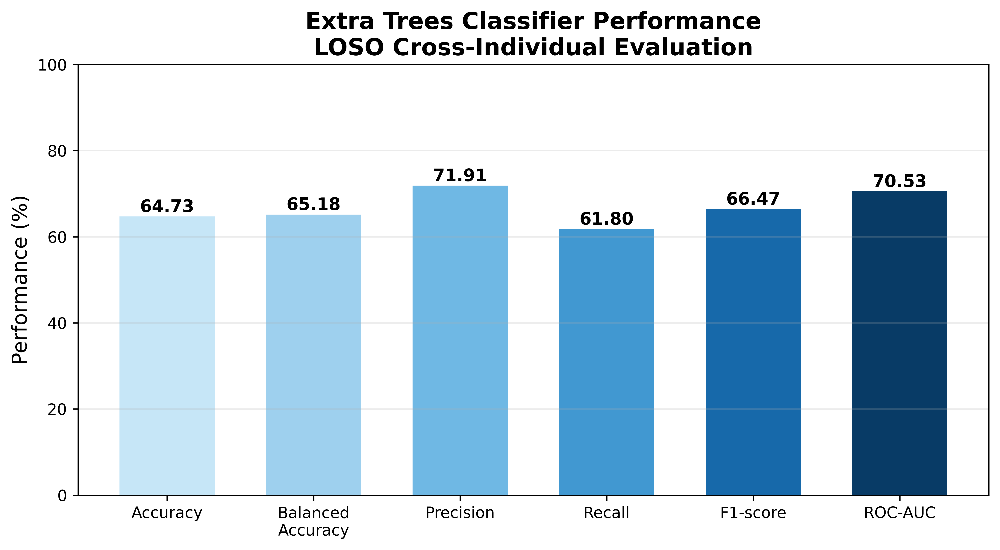

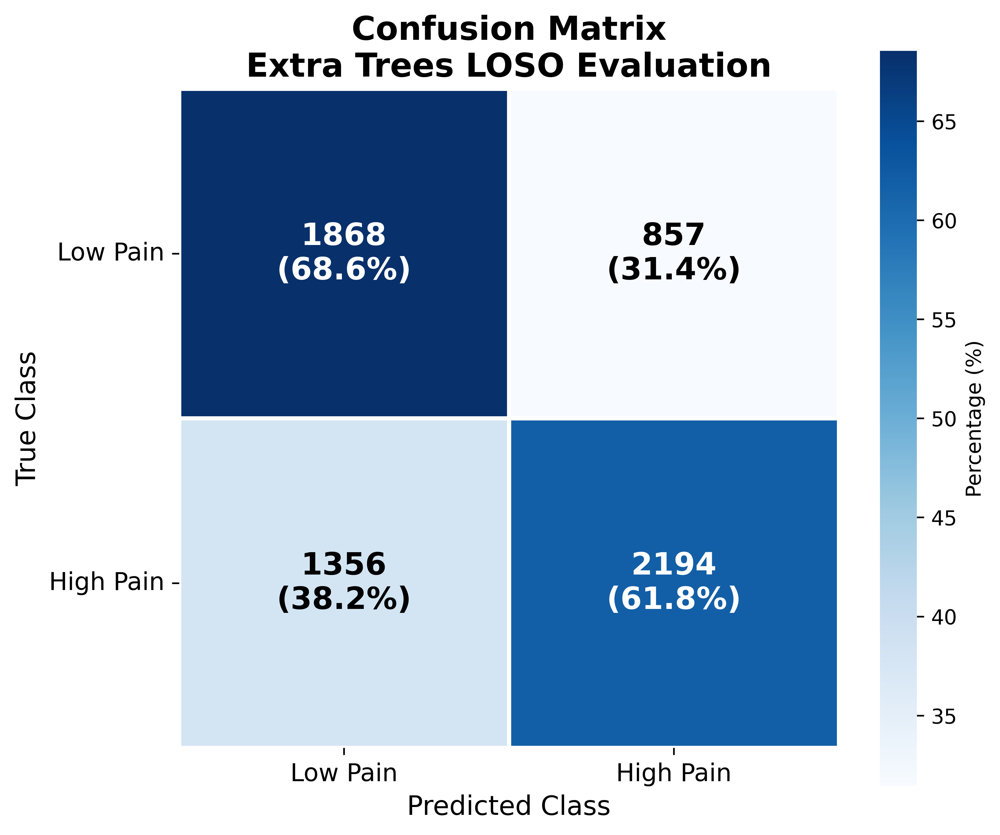

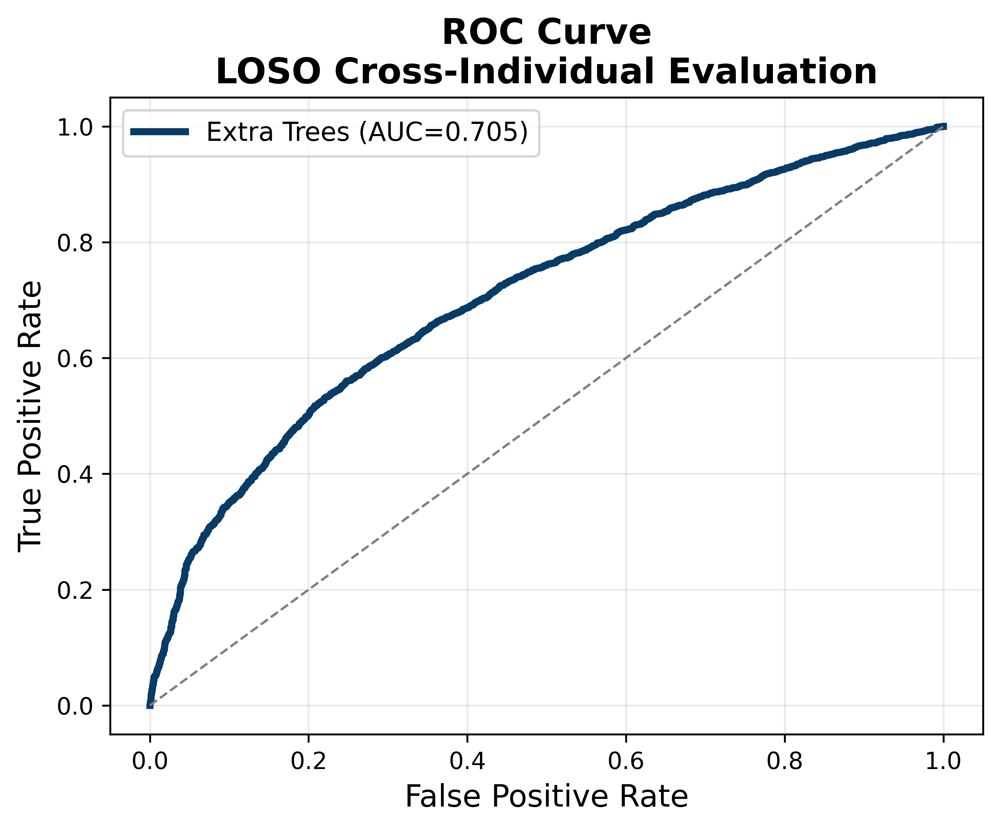

ROC-AUC calculated: 70.52638325365035


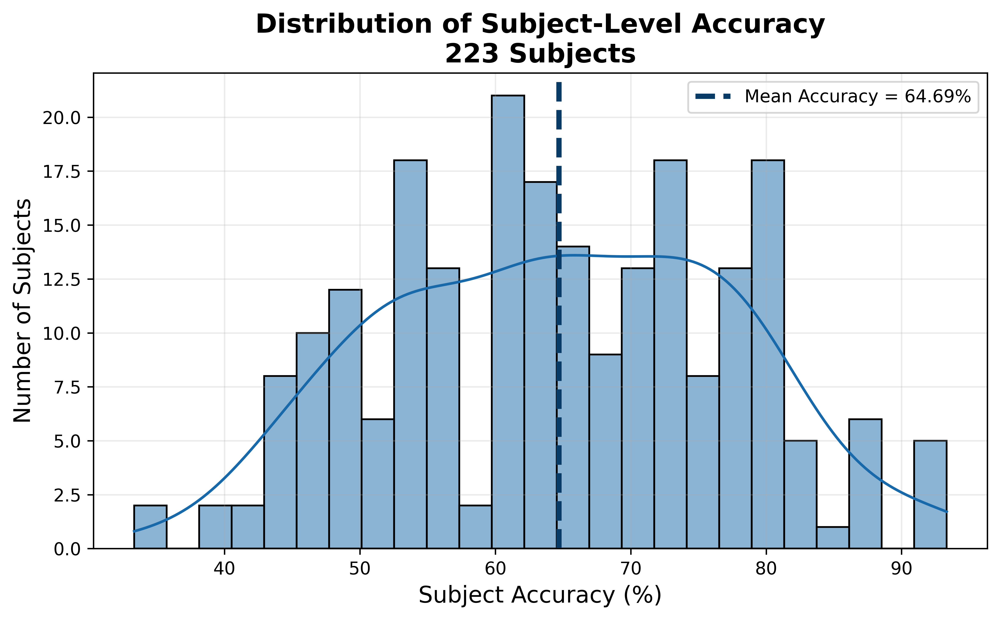

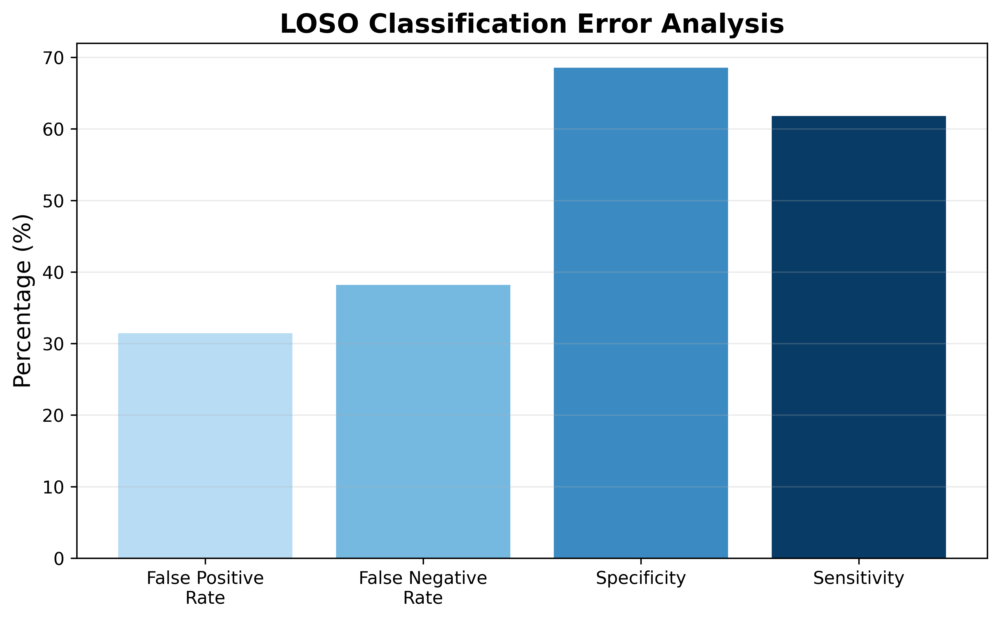


All LOSO Extra Trees figures saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/Premium_Figures_LOSO_ExtraTrees
✓ Fig1_LOSO_Performance.png
✓ Fig1_LOSO_Performance.pdf
✓ Fig2_LOSO_Confusion_Matrix.png
✓ Fig2_LOSO_Confusion_Matrix.pdf
✓ Fig3_LOSO_ROC.png
✓ Fig4_Subject_Accuracy_Distribution.png
✓ Fig5_Error_Analysis.png


In [ ]:
# ============================================================
# PREMIUM VISUALIZATION SUITE
# V7 LOSO Extra Trees Classifier
# Cross-Individual / Subject-Independent Evaluation
# ============================================================


import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.metrics import (
    confusion_matrix,
    roc_curve,
    auc,
    roc_auc_score
)



# ============================================================
# PATHS
# ============================================================


RESULT_DIR = (
"/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/"
"V7_MAIN_PIPELINE/"
"V7_LOSO_RESULTS"
)


PRED_FILE = os.path.join(
    RESULT_DIR,
    "ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__trial_predictions.csv"
)


SUBJECT_FILE = os.path.join(
    RESULT_DIR,
    "ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__subject_results.csv"
)


FIG_DIR = (
"/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/"
"V7_MAIN_PIPELINE/"
"Premium_Figures_LOSO_ExtraTrees"
)


os.makedirs(
    FIG_DIR,
    exist_ok=True
)



# ============================================================
# LOAD RESULTS
# ============================================================


trial_df = pd.read_csv(
    PRED_FILE
)


subject_df = pd.read_csv(
    SUBJECT_FILE
)


y_true = trial_df["y_true"].values

y_pred = trial_df["y_pred"].values

y_score = trial_df["y_score"].values



print(trial_df.shape)

print(subject_df.shape)



# ============================================================
# FIGURE 1
# Performance Metrics
# ============================================================


metrics = {

"Accuracy":64.73,

"Balanced\nAccuracy":65.18,

"Precision":71.91,

"Recall":61.80,

"F1-score":66.47,

"ROC-AUC":70.53

}



plt.figure(
    figsize=(9,5),
    dpi=600
)


colors = [
"#C6E6F7",
"#9ED0EE",
"#6FB8E4",
"#4198D1",
"#1769AA",
"#083B66"
]


bars = plt.bar(
    metrics.keys(),
    metrics.values(),
    color=colors,
    width=0.65
)


for bar,val in zip(
    bars,
    metrics.values()
):

    plt.text(
        bar.get_x()+bar.get_width()/2,
        val+1,
        f"{val:.2f}",
        ha="center",
        fontsize=11,
        fontweight="bold"
    )



plt.ylabel(
    "Performance (%)",
    fontsize=13
)


plt.ylim(
    0,
    100
)


plt.title(
    "Extra Trees Classifier Performance\nLOSO Cross-Individual Evaluation",
    fontsize=15,
    fontweight="bold"
)


plt.grid(
    axis="y",
    alpha=0.25
)


plt.tight_layout()


plt.savefig(
    FIG_DIR+"/Fig1_LOSO_Performance.png",
    dpi=600,
    bbox_inches="tight"
)


plt.savefig(
    FIG_DIR+"/Fig1_LOSO_Performance.pdf",
    bbox_inches="tight"
)


plt.show()



# ============================================================
# FIGURE 2
# Blue Confusion Matrix
# ============================================================


cm = confusion_matrix(
    y_true,
    y_pred
)


cm_percent = (
    cm /
    cm.sum(axis=1,keepdims=True)
)*100



plt.figure(
    figsize=(7,6),
    dpi=600
)


ax=sns.heatmap(
    cm_percent,
    cmap="Blues",
    annot=False,
    square=True,
    linewidths=2,
    linecolor="white",
    cbar_kws={
        "label":"Percentage (%)"
    }
)



for i in range(2):

    for j in range(2):

        pct=cm_percent[i,j]

        if pct>60:
            txt_color="white"
        else:
            txt_color="black"


        ax.text(
            j+0.5,
            i+0.5,
            f"{cm[i,j]}\n({pct:.1f}%)",
            ha="center",
            va="center",
            fontsize=15,
            fontweight="bold",
            color=txt_color
        )



ax.set_xticklabels(
    [
        "Low Pain",
        "High Pain"
    ],
    fontsize=12
)


ax.set_yticklabels(
    [
        "Low Pain",
        "High Pain"
    ],
    fontsize=12,
    rotation=0
)



plt.xlabel(
    "Predicted Class",
    fontsize=13
)


plt.ylabel(
    "True Class",
    fontsize=13
)



plt.title(
    "Confusion Matrix\nExtra Trees LOSO Evaluation",
    fontsize=16,
    fontweight="bold"
)



plt.tight_layout()


plt.savefig(
    FIG_DIR+"/Fig2_LOSO_Confusion_Matrix.png",
    dpi=600,
    bbox_inches="tight"
)


plt.savefig(
    FIG_DIR+"/Fig2_LOSO_Confusion_Matrix.pdf",
    bbox_inches="tight"
)


plt.show()



# ============================================================
# FIGURE 3
# ROC Curve
# ============================================================


fpr,tpr,_ = roc_curve(
    y_true,
    y_score
)


roc_auc = auc(
    fpr,
    tpr
)



plt.figure(
    figsize=(6,5),
    dpi=600
)



plt.plot(
    fpr,
    tpr,
    color="#083B66",
    linewidth=3,
    label=f"Extra Trees (AUC={roc_auc:.3f})"
)


plt.plot(
    [0,1],
    [0,1],
    "--",
    color="gray",
    linewidth=1
)



plt.xlabel(
    "False Positive Rate",
    fontsize=13
)


plt.ylabel(
    "True Positive Rate",
    fontsize=13
)



plt.title(
    "ROC Curve\nLOSO Cross-Individual Evaluation",
    fontsize=15,
    fontweight="bold"
)


plt.legend(
    fontsize=11
)


plt.grid(
    alpha=0.25
)


plt.tight_layout()


plt.savefig(
    FIG_DIR+"/Fig3_LOSO_ROC.png",
    dpi=600,
    bbox_inches="tight"
)


plt.show()



print(
    "ROC-AUC calculated:",
    roc_auc*100
)



# ============================================================
# FIGURE 4
# Subject Accuracy Distribution
# ============================================================


plt.figure(
    figsize=(8,5),
    dpi=600
)


sns.histplot(
    subject_df["accuracy"]*100,
    bins=25,
    kde=True,
    color="#1769AA"
)



plt.axvline(
    64.69,
    color="#083B66",
    linestyle="--",
    linewidth=3,
    label="Mean Accuracy = 64.69%"
)



plt.xlabel(
    "Subject Accuracy (%)",
    fontsize=13
)


plt.ylabel(
    "Number of Subjects",
    fontsize=13
)



plt.title(
    "Distribution of Subject-Level Accuracy\n223 Subjects",
    fontsize=15,
    fontweight="bold"
)



plt.legend()


plt.grid(
    alpha=0.25
)


plt.tight_layout()


plt.savefig(
    FIG_DIR+"/Fig4_Subject_Accuracy_Distribution.png",
    dpi=600,
    bbox_inches="tight"
)


plt.show()



# ============================================================
# FIGURE 5
# Error Analysis
# ============================================================


TN,FP,FN,TP = cm.ravel()


error_metrics={

"False Positive\nRate":
FP/(FP+TN)*100,


"False Negative\nRate":
FN/(FN+TP)*100,


"Specificity":
TN/(TN+FP)*100,


"Sensitivity":
TP/(TP+FN)*100

}



plt.figure(
    figsize=(8,5),
    dpi=600
)



plt.bar(
    error_metrics.keys(),
    error_metrics.values(),
    color=[
        "#B7DCF4",
        "#75B8E0",
        "#3B8BC2",
        "#083B66"
    ]
)



plt.ylabel(
    "Percentage (%)",
    fontsize=13
)


plt.title(
    "LOSO Classification Error Analysis",
    fontsize=15,
    fontweight="bold"
)



plt.grid(
    axis="y",
    alpha=0.25
)



plt.tight_layout()


plt.savefig(
    FIG_DIR+"/Fig5_Error_Analysis.png",
    dpi=600,
    bbox_inches="tight"
)



plt.show()



print("\nAll LOSO Extra Trees figures saved:")
print(FIG_DIR)

for f in os.listdir(FIG_DIR):
    print("✓",f)

Trial predictions: (6275, 12)
Subject results: (223, 38)


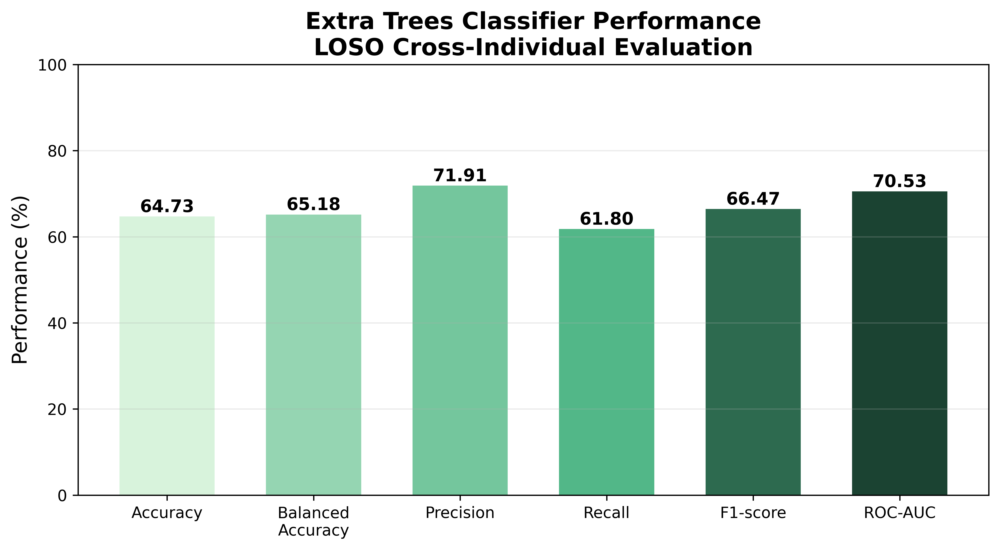

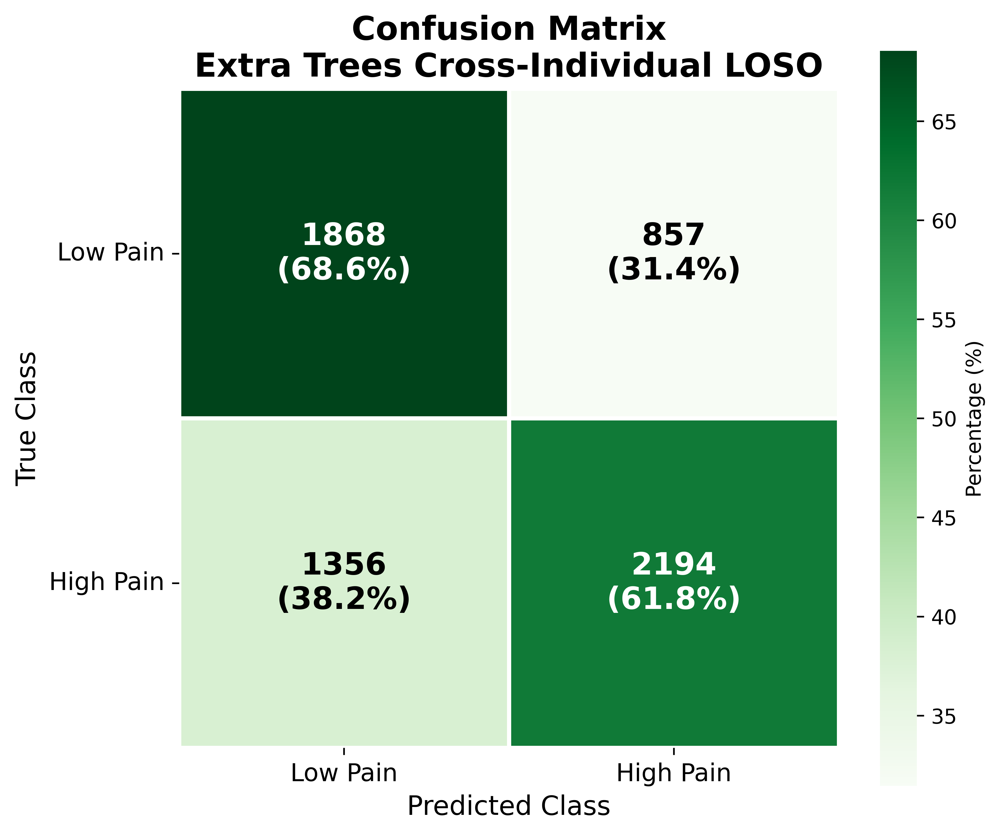

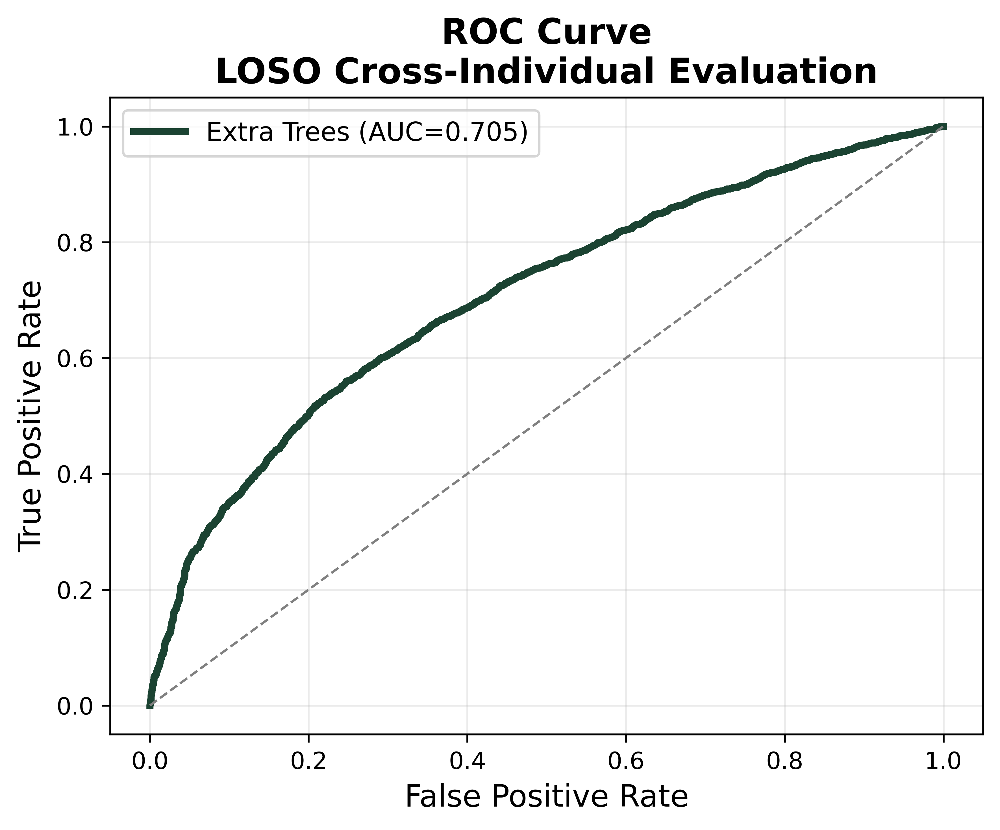

Calculated ROC-AUC: 70.52638325365035


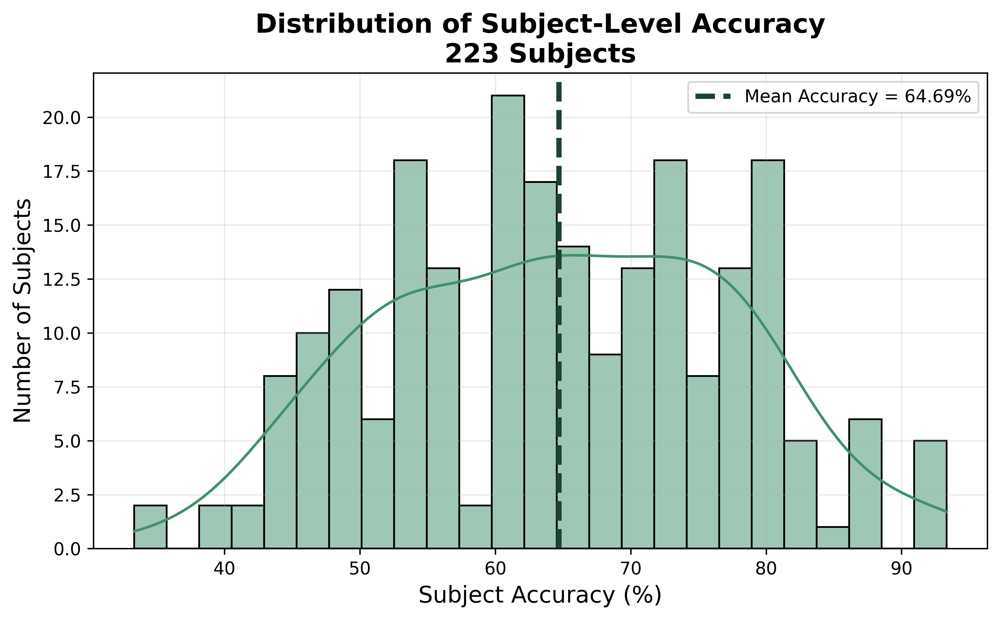

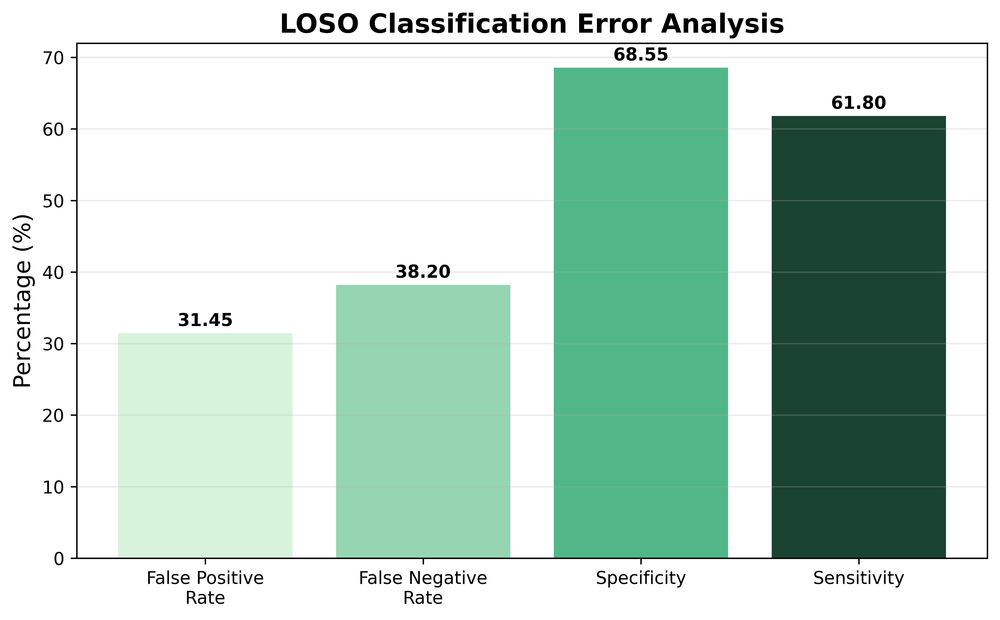


All GREEN LOSO Extra Trees figures saved:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/Premium_Figures_LOSO_ExtraTrees_GREEN
✓ Fig1_LOSO_Performance_GREEN.pdf
✓ Fig1_LOSO_Performance_GREEN.png
✓ Fig2_LOSO_Confusion_Matrix_GREEN.pdf
✓ Fig2_LOSO_Confusion_Matrix_GREEN.png
✓ Fig3_LOSO_ROC_GREEN.pdf
✓ Fig3_LOSO_ROC_GREEN.png
✓ Fig4_Subject_Accuracy_Distribution_GREEN.png
✓ Fig5_Error_Analysis_GREEN.png


In [ ]:
# ============================================================
# PREMIUM VISUALIZATION SUITE
# V7 LOSO Extra Trees Classifier
# Cross-Individual / Subject-Independent Evaluation
# GREEN THEME
# ============================================================


import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.metrics import (
    confusion_matrix,
    roc_curve,
    auc
)



# ============================================================
# PATHS
# ============================================================


RESULT_DIR = (
"/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/"
"V7_MAIN_PIPELINE/"
"V7_LOSO_RESULTS"
)


PRED_FILE = os.path.join(
    RESULT_DIR,
    "ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__trial_predictions.csv"
)


SUBJECT_FILE = os.path.join(
    RESULT_DIR,
    "ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__subject_results.csv"
)



FIG_DIR = (
"/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/"
"V7_MAIN_PIPELINE/"
"Premium_Figures_LOSO_ExtraTrees_GREEN"
)


os.makedirs(
    FIG_DIR,
    exist_ok=True
)



# ============================================================
# LOAD RESULTS
# ============================================================


trial_df = pd.read_csv(
    PRED_FILE
)


subject_df = pd.read_csv(
    SUBJECT_FILE
)


y_true = trial_df["y_true"].values

y_pred = trial_df["y_pred"].values

y_score = trial_df["y_score"].values



print("Trial predictions:", trial_df.shape)

print("Subject results:", subject_df.shape)



# ============================================================
# FIGURE 1
# PERFORMANCE METRICS
# ============================================================


metrics = {

"Accuracy":64.73,

"Balanced\nAccuracy":65.18,

"Precision":71.91,

"Recall":61.80,

"F1-score":66.47,

"ROC-AUC":70.53

}



plt.figure(
    figsize=(9,5),
    dpi=600
)



colors = [
"#D8F3DC",
"#95D5B2",
"#74C69D",
"#52B788",
"#2D6A4F",
"#1B4332"
]



bars = plt.bar(
    metrics.keys(),
    metrics.values(),
    color=colors,
    width=0.65
)



for bar,value in zip(
    bars,
    metrics.values()
):

    plt.text(
        bar.get_x()+bar.get_width()/2,
        value+1,
        f"{value:.2f}",
        ha="center",
        fontsize=11,
        fontweight="bold"
    )



plt.ylabel(
    "Performance (%)",
    fontsize=13
)


plt.ylim(
    0,
    100
)



plt.title(
    "Extra Trees Classifier Performance\nLOSO Cross-Individual Evaluation",
    fontsize=15,
    fontweight="bold"
)



plt.grid(
    axis="y",
    alpha=0.25
)



plt.tight_layout()



plt.savefig(
    FIG_DIR+"/Fig1_LOSO_Performance_GREEN.png",
    dpi=600,
    bbox_inches="tight"
)



plt.savefig(
    FIG_DIR+"/Fig1_LOSO_Performance_GREEN.pdf",
    bbox_inches="tight"
)



plt.show()




# ============================================================
# FIGURE 2
# GREEN CONFUSION MATRIX
# ============================================================


cm = confusion_matrix(
    y_true,
    y_pred
)



cm_percent = (
    cm /
    cm.sum(axis=1, keepdims=True)
)*100




plt.figure(
    figsize=(7,6),
    dpi=600
)



ax = sns.heatmap(
    cm_percent,
    cmap="Greens",
    annot=False,
    square=True,
    linewidths=2,
    linecolor="white",
    cbar_kws={
        "label":"Percentage (%)"
    }
)




for i in range(2):

    for j in range(2):

        pct = cm_percent[i,j]


        if pct > 60:
            text_color="white"
        else:
            text_color="black"



        ax.text(
            j+0.5,
            i+0.5,
            f"{cm[i,j]}\n({pct:.1f}%)",
            ha="center",
            va="center",
            fontsize=15,
            fontweight="bold",
            color=text_color
        )




ax.set_xticklabels(
    [
        "Low Pain",
        "High Pain"
    ],
    fontsize=12
)



ax.set_yticklabels(
    [
        "Low Pain",
        "High Pain"
    ],
    fontsize=12,
    rotation=0
)




plt.xlabel(
    "Predicted Class",
    fontsize=13
)



plt.ylabel(
    "True Class",
    fontsize=13
)



plt.title(
    "Confusion Matrix\nExtra Trees Cross-Individual LOSO",
    fontsize=16,
    fontweight="bold"
)



plt.tight_layout()



plt.savefig(
    FIG_DIR+"/Fig2_LOSO_Confusion_Matrix_GREEN.png",
    dpi=600,
    bbox_inches="tight"
)



plt.savefig(
    FIG_DIR+"/Fig2_LOSO_Confusion_Matrix_GREEN.pdf",
    bbox_inches="tight"
)



plt.show()




# ============================================================
# FIGURE 3
# ROC CURVE
# ============================================================


fpr,tpr,_ = roc_curve(
    y_true,
    y_score
)



roc_auc = auc(
    fpr,
    tpr
)




plt.figure(
    figsize=(6,5),
    dpi=600
)



plt.plot(
    fpr,
    tpr,
    color="#1B4332",
    linewidth=3,
    label=f"Extra Trees (AUC={roc_auc:.3f})"
)



plt.plot(
    [0,1],
    [0,1],
    linestyle="--",
    color="gray",
    linewidth=1
)




plt.xlabel(
    "False Positive Rate",
    fontsize=13
)



plt.ylabel(
    "True Positive Rate",
    fontsize=13
)



plt.title(
    "ROC Curve\nLOSO Cross-Individual Evaluation",
    fontsize=15,
    fontweight="bold"
)



plt.legend(
    fontsize=11
)



plt.grid(
    alpha=0.25
)



plt.tight_layout()



plt.savefig(
    FIG_DIR+"/Fig3_LOSO_ROC_GREEN.png",
    dpi=600,
    bbox_inches="tight"
)



plt.savefig(
    FIG_DIR+"/Fig3_LOSO_ROC_GREEN.pdf",
    bbox_inches="tight"
)



plt.show()



print(
    "Calculated ROC-AUC:",
    roc_auc*100
)




# ============================================================
# FIGURE 4
# SUBJECT ACCURACY DISTRIBUTION
# ============================================================


plt.figure(
    figsize=(8,5),
    dpi=600
)



sns.histplot(
    subject_df["accuracy"]*100,
    bins=25,
    kde=True,
    color="#40916C"
)



plt.axvline(
    64.69,
    color="#1B4332",
    linestyle="--",
    linewidth=3,
    label="Mean Accuracy = 64.69%"
)




plt.xlabel(
    "Subject Accuracy (%)",
    fontsize=13
)



plt.ylabel(
    "Number of Subjects",
    fontsize=13
)



plt.title(
    "Distribution of Subject-Level Accuracy\n223 Subjects",
    fontsize=15,
    fontweight="bold"
)



plt.legend()



plt.grid(
    alpha=0.25
)



plt.tight_layout()



plt.savefig(
    FIG_DIR+"/Fig4_Subject_Accuracy_Distribution_GREEN.png",
    dpi=600,
    bbox_inches="tight"
)



plt.show()




# ============================================================
# FIGURE 5
# ERROR ANALYSIS
# ============================================================


TN,FP,FN,TP = cm.ravel()



error_metrics = {

"False Positive\nRate":
FP/(FP+TN)*100,


"False Negative\nRate":
FN/(FN+TP)*100,


"Specificity":
TN/(TN+FP)*100,


"Sensitivity":
TP/(TP+FN)*100

}




plt.figure(
    figsize=(8,5),
    dpi=600
)




bars = plt.bar(
    error_metrics.keys(),
    error_metrics.values(),
    color=[
        "#D8F3DC",
        "#95D5B2",
        "#52B788",
        "#1B4332"
    ]
)




for bar,value in zip(
    bars,
    error_metrics.values()
):

    plt.text(
        bar.get_x()+bar.get_width()/2,
        value+1,
        f"{value:.2f}",
        ha="center",
        fontweight="bold"
    )



plt.ylabel(
    "Percentage (%)",
    fontsize=13
)



plt.title(
    "LOSO Classification Error Analysis",
    fontsize=15,
    fontweight="bold"
)



plt.grid(
    axis="y",
    alpha=0.25
)



plt.tight_layout()



plt.savefig(
    FIG_DIR+"/Fig5_Error_Analysis_GREEN.png",
    dpi=600,
    bbox_inches="tight"
)



plt.show()



# ============================================================
# DONE
# ============================================================


print("\nAll GREEN LOSO Extra Trees figures saved:")
print(FIG_DIR)


for f in sorted(os.listdir(FIG_DIR)):
    print("✓",f)

In [ ]:
import pandas as pd
import os


RESULT_DIR = (
"/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/"
"V7_MAIN_PIPELINE/"
"V7_LOSO_RESULTS"
)


PRED_FILE = os.path.join(
    RESULT_DIR,
    "ExtraTrees__Handcrafted_262_SubjectStandardized__v7_subject_standardized__trial_predictions.csv"
)


trial_df = pd.read_csv(PRED_FILE)


print(trial_df.shape)

print(trial_df.head())

(6275, 12)
                                          experiment       model  \
0  ExtraTrees__Handcrafted_262_SubjectStandardize...  ExtraTrees   
1  ExtraTrees__Handcrafted_262_SubjectStandardize...  ExtraTrees   
2  ExtraTrees__Handcrafted_262_SubjectStandardize...  ExtraTrees   
3  ExtraTrees__Handcrafted_262_SubjectStandardize...  ExtraTrees   
4  ExtraTrees__Handcrafted_262_SubjectStandardize...  ExtraTrees   

                           feature_set test_subject  original_row_index  \
0  Handcrafted_262_SubjectStandardized      sub-001                   0   
1  Handcrafted_262_SubjectStandardized      sub-001                   1   
2  Handcrafted_262_SubjectStandardized      sub-001                   2   
3  Handcrafted_262_SubjectStandardized      sub-001                   3   
4  Handcrafted_262_SubjectStandardized      sub-001                   4   

   y_true  y_pred   y_score   score_source  fit_seconds  prediction_seconds  \
0       0       0  0.305683  predict_proba     3.3

In [ ]:
from sklearn.metrics import confusion_matrix


cm = confusion_matrix(
    trial_df["y_true"],
    trial_df["y_pred"]
)


print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[1868  857]
 [1356 2194]]


In [ ]:
# ============================================================
# RESTART CELL — Load V7 handcrafted data for GaussianNB LOSO
#
# Use after reopening Colab and mounting Google Drive.
#
# Loads:
#   6275 epochs
#   262 handcrafted features
#   223 participants
#   fixed low/high pain labels
#   subject-standardized feature matrix used by Extra Trees LOSO
# ============================================================

import os
import warnings

import numpy as np
import pandas as pd

warnings.filterwarnings("ignore")


# ============================================================
# 1. Directories
# ============================================================

V5_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V5_MAIN_PIPELINE_12CH"
)

V7_DIR = (
    "/content/drive/MyDrive/"
    "EXP8_CLASSIFICATION_FROM_SCRATCH/"
    "V7_MAIN_PIPELINE"
)

os.makedirs(
    V7_DIR,
    exist_ok=True
)


# ============================================================
# 2. Required files
# ============================================================

X_HANDCRAFTED_PATH = os.path.join(
    V5_DIR,
    "X_v5_handcrafted_all_262.npy"
)

X_STANDARDIZED_PATH = os.path.join(
    V7_DIR,
    "X_v7_handcrafted_262_subject_standardized.npy"
)

Y_PATH = os.path.join(
    V5_DIR,
    "y_v5_binary.npy"
)

GROUPS_PATH = os.path.join(
    V5_DIR,
    "groups_v5_subject.npy"
)

FEATURE_NAMES_PATH = os.path.join(
    V5_DIR,
    "v5_handcrafted_feature_names_262.csv"
)


required_paths = [
    X_HANDCRAFTED_PATH,
    Y_PATH,
    GROUPS_PATH,
    FEATURE_NAMES_PATH
]

missing_paths = [
    path
    for path in required_paths
    if not os.path.exists(path)
]

if missing_paths:
    raise FileNotFoundError(
        "These required files were not found:\n"
        +
        "\n".join(missing_paths)
    )


# ============================================================
# 3. Load raw handcrafted data and labels
# ============================================================

X_handcrafted = np.load(
    X_HANDCRAFTED_PATH,
    mmap_mode="r"
)

y = np.load(
    Y_PATH
).astype(
    np.int8,
    copy=False
)

groups = np.load(
    GROUPS_PATH,
    allow_pickle=True
).astype(str)

feature_names_df = pd.read_csv(
    FEATURE_NAMES_PATH
)


if "feature_name" in feature_names_df.columns:

    feature_names = (
        feature_names_df[
            "feature_name"
        ]
        .astype(str)
        .tolist()
    )

else:

    feature_names = (
        feature_names_df
        .iloc[:, 0]
        .astype(str)
        .tolist()
    )


# ============================================================
# 4. Load the standardized feature matrix
# ============================================================
#
# This is the same feature input used in the Extra Trees
# cross-individual LOSO experiment.

if os.path.exists(
    X_STANDARDIZED_PATH
):

    X_handcrafted_standardized = np.load(
        X_STANDARDIZED_PATH,
        mmap_mode="r"
    )

    print(
        "Loaded saved subject-standardized features."
    )

else:

    print(
        "Saved standardized features were not found."
    )

    print(
        "Recalculating subject-wise standardization..."
    )


    X_raw = np.asarray(
        X_handcrafted,
        dtype=np.float64
    )

    X_handcrafted_standardized = np.empty_like(
        X_raw,
        dtype=np.float64
    )


    minimum_sd = 1e-8


    for subject_id in np.sort(
        np.unique(groups)
    ):

        subject_mask = (
            groups == subject_id
        )

        subject_data = X_raw[
            subject_mask
        ]

        subject_mean = subject_data.mean(
            axis=0
        )

        subject_sd = subject_data.std(
            axis=0
        )

        subject_sd = np.maximum(
            subject_sd,
            minimum_sd
        )


        X_handcrafted_standardized[
            subject_mask
        ] = (
            subject_data
            -
            subject_mean
        ) / subject_sd


    np.save(
        X_STANDARDIZED_PATH,
        X_handcrafted_standardized
    )


    X_handcrafted_standardized = np.load(
        X_STANDARDIZED_PATH,
        mmap_mode="r"
    )


    del X_raw

    print(
        "Subject-standardized features calculated and saved."
    )


# ============================================================
# 5. Strict validation
# ============================================================

assert X_handcrafted.shape == (
    6275,
    262
)

assert X_handcrafted_standardized.shape == (
    6275,
    262
)

assert y.shape == (
    6275,
)

assert groups.shape == (
    6275,
)

assert len(feature_names) == 262

assert len(
    np.unique(groups)
) == 223

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([
        2725,
        3550
    ])
)


# Validate the feature matrix in manageable batches
for batch_start in range(
    0,
    6275,
    512
):

    batch_stop = min(
        batch_start + 512,
        6275
    )

    feature_batch = np.asarray(
        X_handcrafted_standardized[
            batch_start:batch_stop
        ]
    )

    if not np.isfinite(
        feature_batch
    ).all():

        raise ValueError(
            "The standardized feature matrix contains "
            "NaN or infinite values between rows "
            f"{batch_start}:{batch_stop}."
        )


# ============================================================
# 6. Final output
# ============================================================

print("\n" + "=" * 72)
print("GAUSSIAN NB CROSS-INDIVIDUAL DATA READY")
print("=" * 72)

print(
    "Raw handcrafted features:",
    X_handcrafted.shape
)

print(
    "Standardized features:",
    X_handcrafted_standardized.shape
)

print(
    "Participants:",
    len(
        np.unique(groups)
    )
)

print(
    "Epochs:",
    len(y)
)

print(
    "Features:",
    X_handcrafted_standardized.shape[1]
)

print(
    "Low-pain epochs:",
    int(
        np.sum(
            y == 0
        )
    )
)

print(
    "High-pain epochs:",
    int(
        np.sum(
            y == 1
        )
    )
)

print(
    "Feature input:",
    "Subject-standardized handcrafted 262 features"
)

print("\n" + "=" * 72)
print("RESTART DATA VALIDATION PASSED")
print("=" * 72)

print(
    "\nNow run the existing CELL 20 "
    "(V7 cross-individual LOSO evaluator)."
)

Loaded saved subject-standardized features.

GAUSSIAN NB CROSS-INDIVIDUAL DATA READY
Raw handcrafted features: (6275, 262)
Standardized features: (6275, 262)
Participants: 223
Epochs: 6275
Features: 262
Low-pain epochs: 2725
High-pain epochs: 3550
Feature input: Subject-standardized handcrafted 262 features

RESTART DATA VALIDATION PASSED

Now run the existing CELL 20 (V7 cross-individual LOSO evaluator).


In [ ]:
# CELL 20 (V7) — Complete leakage-safe cross-individual LOSO evaluator

import os
import re
import json
import time
import warnings

import numpy as np
import pandas as pd

from tqdm.auto import tqdm
from sklearn.base import clone
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    average_precision_score,
    matthews_corrcoef,
    cohen_kappa_score,
    confusion_matrix,
)

warnings.filterwarnings("ignore")


# ============================================================
# 1. Output directory
# ============================================================

V7_LOSO_RESULTS_DIR = os.path.join(V7_DIR, "V7_LOSO_RESULTS")
os.makedirs(V7_LOSO_RESULTS_DIR, exist_ok=True)

print("V7 LOSO evaluator output directory:")
print(V7_LOSO_RESULTS_DIR)


# ============================================================
# 2. Safe file-writing helpers
# ============================================================

def atomic_write_csv(dataframe, path):
    temporary_path = f"{path}.tmp"
    dataframe.to_csv(temporary_path, index=False)
    os.replace(temporary_path, path)


def atomic_write_json(content, path):
    temporary_path = f"{path}.tmp"
    with open(temporary_path, "w", encoding="utf-8") as file:
        json.dump(content, file, indent=4)
    os.replace(temporary_path, path)


def make_safe_filename(text):
    text = str(text).strip()
    text = re.sub(r"[^A-Za-z0-9_.-]+", "_", text)
    return text.strip("_")


# ============================================================
# 3. Obtain continuous prediction scores
# ============================================================

def get_positive_class_scores(fitted_model, X_test, y_pred):
    classes = np.asarray(getattr(fitted_model, "classes_", np.array([0, 1])))
    positive_indices = np.flatnonzero(classes == 1)
    if len(positive_indices) == 0:
        raise ValueError("The fitted classifier does not contain positive class label 1.")
    positive_index = int(positive_indices[0])

    if hasattr(fitted_model, "predict_proba"):
        probabilities = np.asarray(fitted_model.predict_proba(X_test), dtype=float)
        if probabilities.ndim != 2:
            raise ValueError("predict_proba() returned an unexpected shape.")
        return probabilities[:, positive_index].ravel(), "predict_proba"

    if hasattr(fitted_model, "decision_function"):
        decision_scores = np.asarray(fitted_model.decision_function(X_test), dtype=float)
        if decision_scores.ndim == 1:
            scores = decision_scores
        elif decision_scores.ndim == 2:
            scores = decision_scores[:, positive_index]
        else:
            raise ValueError("decision_function() returned an unexpected shape.")
        return scores.ravel(), "decision_function"

    return np.asarray(y_pred, dtype=float).ravel(), "predicted_label_fallback"


# ============================================================
# 4. Comprehensive binary-classification metrics
# ============================================================

def calculate_binary_metrics(y_true, y_pred, y_score=None):
    y_true = np.asarray(y_true, dtype=np.int8).ravel()
    y_pred = np.asarray(y_pred, dtype=np.int8).ravel()

    if len(y_true) != len(y_pred):
        raise ValueError("y_true and y_pred have different lengths.")
    if y_score is not None:
        y_score = np.asarray(y_score, dtype=float).ravel()
        if len(y_score) != len(y_true):
            raise ValueError("y_score and y_true have different lengths.")

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    has_both_true_classes = len(np.unique(y_true)) == 2
    valid_continuous_scores = y_score is not None and np.isfinite(y_score).all()

    precision = precision_score(y_true, y_pred, pos_label=1, zero_division=0)
    recall = recall_score(y_true, y_pred, pos_label=1, zero_division=0)
    sensitivity = recall
    specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan
    negative_predictive_value = tn / (tn + fn) if (tn + fn) > 0 else np.nan
    false_positive_rate = fp / (fp + tn) if (fp + tn) > 0 else np.nan
    false_negative_rate = fn / (fn + tp) if (fn + tp) > 0 else np.nan

    if has_both_true_classes and valid_continuous_scores:
        roc_auc = roc_auc_score(y_true, y_score)
        average_precision_pr_auc = average_precision_score(y_true, y_score)
    else:
        roc_auc = np.nan
        average_precision_pr_auc = np.nan

    try:
        matthews_correlation = matthews_corrcoef(y_true, y_pred)
    except Exception:
        matthews_correlation = np.nan

    try:
        cohen_kappa = cohen_kappa_score(y_true, y_pred)
        if not np.isfinite(cohen_kappa):
            cohen_kappa = np.nan
    except Exception:
        cohen_kappa = np.nan

    precision_macro = precision_score(y_true, y_pred, labels=[0, 1], average="macro", zero_division=0)
    recall_macro = recall_score(y_true, y_pred, labels=[0, 1], average="macro", zero_division=0)
    f1_macro = f1_score(y_true, y_pred, labels=[0, 1], average="macro", zero_division=0)
    precision_weighted = precision_score(y_true, y_pred, labels=[0, 1], average="weighted", zero_division=0)
    recall_weighted = recall_score(y_true, y_pred, labels=[0, 1], average="weighted", zero_division=0)
    f1_weighted = f1_score(y_true, y_pred, labels=[0, 1], average="weighted", zero_division=0)

    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "balanced_accuracy": balanced_accuracy_score(y_true, y_pred) if has_both_true_classes else np.nan,
        "precision": precision,
        "recall": recall,
        "sensitivity": sensitivity,
        "specificity": specificity,
        "negative_predictive_value": negative_predictive_value,
        "false_positive_rate": false_positive_rate,
        "false_negative_rate": false_negative_rate,
        "f1_score": f1_score(y_true, y_pred, pos_label=1, zero_division=0),
        "roc_auc": roc_auc,
        "average_precision_pr_auc": average_precision_pr_auc,
        "matthews_correlation_coefficient": matthews_correlation,
        "cohen_kappa": cohen_kappa,
        "precision_macro": precision_macro,
        "recall_macro": recall_macro,
        "f1_macro": f1_macro,
        "precision_weighted": precision_weighted,
        "recall_weighted": recall_weighted,
        "f1_weighted": f1_weighted,
        "prevalence_high_pain": float(np.mean(y_true == 1)),
        "support_low_pain": int(np.sum(y_true == 0)),
        "support_high_pain": int(np.sum(y_true == 1)),
        "true_negative": int(tn), "false_positive": int(fp),
        "false_negative": int(fn), "true_positive": int(tp),
    }


# ============================================================
# 5. Subject-level metric summary
# ============================================================

def summarize_subject_metrics(subject_results_df):
    metric_columns = [
        "accuracy", "balanced_accuracy", "precision", "recall", "sensitivity",
        "specificity", "negative_predictive_value", "false_positive_rate",
        "false_negative_rate", "f1_score", "roc_auc", "average_precision_pr_auc",
        "matthews_correlation_coefficient", "cohen_kappa", "precision_macro",
        "recall_macro", "f1_macro", "precision_weighted", "recall_weighted", "f1_weighted",
    ]
    summary_rows = []
    for metric in metric_columns:
        values = subject_results_df[metric].replace([np.inf, -np.inf], np.nan).dropna().astype(float)
        metric_mean = values.mean() if len(values) > 0 else np.nan
        metric_standard_deviation = values.std(ddof=1) if len(values) > 1 else np.nan
        summary_rows.append({
            "metric": metric,
            "n_subjects": int(len(values)),
            "mean": metric_mean,
            "standard_deviation": metric_standard_deviation,
            "mean_percent": metric_mean * 100 if np.isfinite(metric_mean) else np.nan,
            "standard_deviation_percent": metric_standard_deviation * 100 if np.isfinite(metric_standard_deviation) else np.nan,
            "mean_plus_minus_sd": (
                f"{metric_mean * 100:.2f}% ± {metric_standard_deviation * 100:.2f}%"
                if (np.isfinite(metric_mean) and np.isfinite(metric_standard_deviation)) else "Not defined"
            ),
        })
    return pd.DataFrame(summary_rows)


# ============================================================
# 6. Main reusable LOSO evaluator (V7)
# ============================================================

def run_loso_evaluation_v7(
    X, y, groups, estimator, model_name, feature_set_name,
    metadata_df=None, experiment_tag="v7_subject_standardized",
    resume=True, overwrite=False, compute_train_accuracy=False,
):
    """
    Leakage-safe Leave-One-Subject-Out classification. Identical structure
    to your V5 evaluator. X should already be subject-wise standardized
    (unsupervised transform, safe to apply once before this function --
    it never uses labels, so it doesn't need per-fold refitting like
    PCA/StandardScaler would).
    """

    y = np.asarray(y, dtype=np.int8).ravel()
    groups = np.asarray(groups).astype(str).ravel()

    if not hasattr(X, "shape") or len(X.shape) != 2:
        raise ValueError("X must have shape (n_epochs, n_features).")

    n_epochs = int(X.shape[0])
    n_features = int(X.shape[1])

    if n_epochs != len(y):
        raise ValueError("X and y have different numbers of rows.")
    if len(y) != len(groups):
        raise ValueError("y and groups have different numbers of rows.")
    if metadata_df is not None and len(metadata_df) != n_epochs:
        raise ValueError("metadata_df is not aligned with X.")
    if not np.array_equal(np.unique(y), np.array([0, 1])):
        raise ValueError("Labels must contain binary values 0 and 1.")

    all_subjects = np.sort(np.unique(groups))
    n_subjects = int(len(all_subjects))

    validation_batch_size = 512
    for validation_start in range(0, n_epochs, validation_batch_size):
        validation_stop = min(validation_start + validation_batch_size, n_epochs)
        validation_batch = np.asarray(X[validation_start:validation_stop])
        if not np.isfinite(validation_batch).all():
            raise ValueError(f"X contains NaN or infinite values between rows {validation_start}:{validation_stop}.")

    safe_model_name = make_safe_filename(model_name)
    safe_feature_set_name = make_safe_filename(feature_set_name)
    safe_experiment_tag = make_safe_filename(experiment_tag)
    experiment_name = f"{safe_model_name}__{safe_feature_set_name}__{safe_experiment_tag}"

    trial_prediction_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__trial_predictions.csv")
    subject_result_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__subject_results.csv")
    subject_metric_summary_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__subject_metric_summary.csv")
    pooled_summary_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__pooled_summary.csv")
    progress_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__progress.json")
    configuration_path = os.path.join(V7_LOSO_RESULTS_DIR, f"{experiment_name}__configuration.json")
    output_paths = [trial_prediction_path, subject_result_path, subject_metric_summary_path,
                     pooled_summary_path, progress_path, configuration_path]

    print("\n" + "=" * 72)
    print("V7 LOSO EXPERIMENT")
    print("=" * 72)
    print("Experiment name:", experiment_name)
    print("Model:", model_name)
    print("Feature set:", feature_set_name)
    print("Feature matrix:", X.shape)
    print("Subjects:", n_subjects)
    print("Class counts [low, high]:", np.bincount(y))
    print("\nResults will be saved to:")
    print("1. Trial predictions:\n", trial_prediction_path)
    print("\n2. Subject results:\n", subject_result_path)
    print("\n3. Subject metric summary:\n", subject_metric_summary_path)
    print("\n4. Pooled summary:\n", pooled_summary_path)
    print("\n5. Progress checkpoint:\n", progress_path)
    print("\n6. Configuration:\n", configuration_path)

    if overwrite:
        for path in output_paths:
            if os.path.exists(path):
                os.remove(path)
        print("\nExisting experiment files removed.")
    elif not resume and os.path.exists(trial_prediction_path):
        raise FileExistsError("An existing checkpoint was found. Use resume=True or overwrite=True.")

    configuration = {
        "experiment_name": experiment_name, "model_name": str(model_name),
        "feature_set_name": str(feature_set_name), "experiment_tag": str(experiment_tag),
        "validation": "Leave-One-Subject-Out", "n_epochs": n_epochs, "n_features": n_features,
        "n_subjects": n_subjects, "low_pain_count": int(np.sum(y == 0)), "high_pain_count": int(np.sum(y == 1)),
        "positive_class": "High pain = 1", "negative_class": "Low pain = 0", "estimator": repr(estimator),
        "compute_train_accuracy": bool(compute_train_accuracy),
        "leakage_control": (
            "A fresh cloned estimator is fitted only on outer-training subjects inside every "
            "LOSO fold. Subject-wise feature standardization was applied once, upstream, "
            "using each subject's own trials only (unsupervised, no labels used)."
        ),
    }
    atomic_write_json(configuration, configuration_path)

    required_prediction_columns = {"test_subject", "original_row_index", "y_true", "y_pred", "y_score"}

    if resume and os.path.exists(trial_prediction_path):
        predictions_df = pd.read_csv(trial_prediction_path)
        missing_columns = required_prediction_columns.difference(predictions_df.columns)
        if missing_columns:
            raise ValueError(f"The saved checkpoint is invalid. Missing columns: {sorted(missing_columns)}")
        predictions_df["test_subject"] = predictions_df["test_subject"].astype(str)
        predictions_df = (predictions_df.sort_values("original_row_index")
                           .drop_duplicates(subset=["original_row_index"], keep="last").reset_index(drop=True))
        completed_subjects = set(predictions_df["test_subject"].unique())
        print("\nCheckpoint detected. Completed subjects:", len(completed_subjects), "/", n_subjects)
    else:
        predictions_df = pd.DataFrame()
        completed_subjects = set()
        print("\nStarting a new V7 LOSO run.")

    if resume and os.path.exists(subject_result_path):
        subject_checkpoint_df = pd.read_csv(subject_result_path)
        if "subject_id" in subject_checkpoint_df.columns:
            subject_checkpoint_df["subject_id"] = subject_checkpoint_df["subject_id"].astype(str)
    else:
        subject_checkpoint_df = pd.DataFrame()

    wall_start_time = time.perf_counter()

    for test_subject in tqdm(all_subjects, desc=f"V7 LOSO | {model_name} | {feature_set_name}"):
        test_subject = str(test_subject)
        if test_subject in completed_subjects:
            continue

        train_indices = np.flatnonzero(groups != test_subject)
        test_indices = np.flatnonzero(groups == test_subject)

        if len(test_indices) == 0:
            raise RuntimeError(f"No test rows found for {test_subject}.")

        train_subjects = set(groups[train_indices])
        test_subjects = set(groups[test_indices])

        if not train_subjects.isdisjoint(test_subjects):
            raise RuntimeError("Subject leakage detected between training and test indices.")
        if test_subject in train_subjects:
            raise RuntimeError(f"Test subject {test_subject} was found in the training fold.")
        if test_subjects != {test_subject}:
            raise RuntimeError("The test fold contains an unexpected subject.")

        X_train, X_test = X[train_indices], X[test_indices]
        y_train, y_test = y[train_indices], y[test_indices]

        if len(np.unique(y_train)) != 2:
            raise RuntimeError(f"The training fold for {test_subject} does not contain both classes.")

        fold_model = clone(estimator)

        fit_start_time = time.perf_counter()
        fold_model.fit(X_train, y_train)
        fit_seconds = time.perf_counter() - fit_start_time

        prediction_start_time = time.perf_counter()
        y_pred = np.asarray(fold_model.predict(X_test), dtype=np.int8).ravel()
        y_score, score_source = get_positive_class_scores(fold_model, X_test, y_pred)
        prediction_seconds = time.perf_counter() - prediction_start_time

        if len(y_pred) != len(y_test):
            raise RuntimeError("Prediction length does not match test-label length.")
        if len(y_score) != len(y_test):
            raise RuntimeError("Prediction-score length does not match test-label length.")

        train_accuracy = fold_model.score(X_train, y_train) if compute_train_accuracy else np.nan

        fold_predictions_df = pd.DataFrame({
            "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
            "test_subject": test_subject, "original_row_index": test_indices,
            "y_true": y_test, "y_pred": y_pred, "y_score": y_score, "score_source": score_source,
            "fit_seconds": fit_seconds, "prediction_seconds": prediction_seconds, "train_accuracy": train_accuracy,
        })

        if metadata_df is not None:
            metadata_subset = metadata_df.iloc[test_indices].reset_index(drop=True)
            for column in ["trial_num", "painrating", "laser_power", "event_type", "source_file"]:
                if column in metadata_subset.columns:
                    fold_predictions_df[column] = metadata_subset[column].to_numpy()

        fold_metrics = calculate_binary_metrics(y_test, y_pred, y_score)

        fold_subject_result = {
            "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
            "subject_id": test_subject, "n_trials": int(len(y_test)),
            "n_low": int(np.sum(y_test == 0)), "n_high": int(np.sum(y_test == 1)),
            **fold_metrics, "fit_seconds": float(fit_seconds), "prediction_seconds": float(prediction_seconds),
            "train_accuracy": float(train_accuracy), "score_source": score_source,
        }
        fold_subject_df = pd.DataFrame([fold_subject_result])

        predictions_df = pd.concat([predictions_df, fold_predictions_df], ignore_index=True)
        predictions_df = (predictions_df.sort_values("original_row_index")
                           .drop_duplicates(subset=["original_row_index"], keep="last").reset_index(drop=True))

        subject_checkpoint_df = pd.concat([subject_checkpoint_df, fold_subject_df], ignore_index=True)
        subject_checkpoint_df["subject_id"] = subject_checkpoint_df["subject_id"].astype(str)
        subject_checkpoint_df = (subject_checkpoint_df.drop_duplicates(subset=["subject_id"], keep="last")
                                  .sort_values("subject_id").reset_index(drop=True))

        atomic_write_csv(predictions_df, trial_prediction_path)
        atomic_write_csv(subject_checkpoint_df, subject_result_path)

        completed_subjects.add(test_subject)

        atomic_write_json({
            "experiment_name": experiment_name, "completed": False,
            "completed_subjects": int(len(completed_subjects)), "total_subjects": n_subjects,
            "completed_prediction_rows": int(len(predictions_df)), "total_prediction_rows": n_epochs,
            "last_completed_subject": test_subject,
            "trial_prediction_path": trial_prediction_path, "subject_result_path": subject_result_path,
        }, progress_path)

    current_run_wall_seconds = time.perf_counter() - wall_start_time

    if not os.path.exists(trial_prediction_path):
        raise RuntimeError("No LOSO prediction checkpoint was saved.")

    predictions_df = pd.read_csv(trial_prediction_path)
    predictions_df["test_subject"] = predictions_df["test_subject"].astype(str)
    predictions_df = predictions_df.sort_values("original_row_index").reset_index(drop=True)

    if len(predictions_df) != n_epochs:
        raise RuntimeError(f"LOSO is incomplete: {len(predictions_df)} of {n_epochs} trials were predicted.")
    if predictions_df["original_row_index"].nunique() != n_epochs:
        raise RuntimeError("Duplicate or missing prediction indices were detected.")

    expected_row_indices = np.arange(n_epochs)
    actual_row_indices = predictions_df["original_row_index"].to_numpy(int)
    if not np.array_equal(actual_row_indices, expected_row_indices):
        raise RuntimeError("Saved predictions are not in the original feature/label row order.")
    if predictions_df["test_subject"].nunique() != n_subjects:
        raise RuntimeError("Not all subjects were evaluated.")

    y_true_all = predictions_df["y_true"].to_numpy(np.int8)
    y_pred_all = predictions_df["y_pred"].to_numpy(np.int8)
    y_score_all = predictions_df["y_score"].to_numpy(float)

    if not np.array_equal(y_true_all, y):
        raise RuntimeError("Saved true labels do not align with the original labels.")

    final_subject_rows = []
    for subject_id, subject_df in predictions_df.groupby("test_subject", sort=True):
        subject_y_true = subject_df["y_true"].to_numpy(np.int8)
        subject_y_pred = subject_df["y_pred"].to_numpy(np.int8)
        subject_y_score = subject_df["y_score"].to_numpy(float)
        subject_metrics = calculate_binary_metrics(subject_y_true, subject_y_pred, subject_y_score)
        final_subject_rows.append({
            "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
            "subject_id": str(subject_id), "n_trials": int(len(subject_df)),
            "n_low": int(np.sum(subject_y_true == 0)), "n_high": int(np.sum(subject_y_true == 1)),
            **subject_metrics,
            "fit_seconds": float(subject_df["fit_seconds"].iloc[0]),
            "prediction_seconds": float(subject_df["prediction_seconds"].iloc[0]),
            "train_accuracy": float(subject_df["train_accuracy"].iloc[0]),
            "score_source": str(subject_df["score_source"].iloc[0]),
        })

    subject_results_df = pd.DataFrame(final_subject_rows)
    if len(subject_results_df) != n_subjects:
        raise RuntimeError("The final subject-result table does not contain every subject.")
    atomic_write_csv(subject_results_df, subject_result_path)

    subject_metric_summary_df = summarize_subject_metrics(subject_results_df)
    atomic_write_csv(subject_metric_summary_df, subject_metric_summary_path)

    pooled_metrics = calculate_binary_metrics(y_true_all, y_pred_all, y_score_all)

    completed_fit_seconds = predictions_df.groupby("test_subject")["fit_seconds"].first().sum()
    completed_prediction_seconds = predictions_df.groupby("test_subject")["prediction_seconds"].first().sum()

    pooled_summary = {
        "experiment": experiment_name, "model": model_name, "feature_set": feature_set_name,
        "validation": "Leave-One-Subject-Out", "n_epochs": n_epochs, "n_features": n_features,
        "n_subjects": n_subjects,
        "subjects_with_both_classes": int(((subject_results_df["n_low"] > 0) & (subject_results_df["n_high"] > 0)).sum()),
        **pooled_metrics,
        "total_fit_minutes": float(completed_fit_seconds / 60.0),
        "total_prediction_seconds": float(completed_prediction_seconds),
        "current_run_wall_minutes": float(current_run_wall_seconds / 60.0),
    }

    for _, metric_row in subject_metric_summary_df.iterrows():
        metric_name = str(metric_row["metric"])
        pooled_summary[f"mean_subject_{metric_name}"] = metric_row["mean"]
        pooled_summary[f"subject_{metric_name}_standard_deviation"] = metric_row["standard_deviation"]

    pooled_summary["mean_subject_accuracy"] = subject_results_df["accuracy"].mean()
    pooled_summary["subject_accuracy_standard_deviation"] = subject_results_df["accuracy"].std(ddof=1)
    pooled_summary["standard_subject_accuracy"] = pooled_summary["subject_accuracy_standard_deviation"]

    pooled_summary_df = pd.DataFrame([pooled_summary])
    atomic_write_csv(pooled_summary_df, pooled_summary_path)

    atomic_write_json({
        "experiment_name": experiment_name, "completed": True,
        "completed_subjects": n_subjects, "total_subjects": n_subjects,
        "completed_prediction_rows": n_epochs, "total_prediction_rows": n_epochs,
        "trial_prediction_path": trial_prediction_path, "subject_result_path": subject_result_path,
        "subject_metric_summary_path": subject_metric_summary_path,
        "pooled_summary_path": pooled_summary_path, "configuration_path": configuration_path,
    }, progress_path)

    mean_subject_accuracy = pooled_summary["mean_subject_accuracy"]
    subject_accuracy_sd = pooled_summary["subject_accuracy_standard_deviation"]

    print("\n" + "=" * 72)
    print("V7 LOSO EVALUATION COMPLETED SUCCESSFULLY")
    print("=" * 72)
    print("Experiment:", experiment_name)
    print("Model:", model_name)
    print("Feature set:", feature_set_name)
    print("Number of features:", n_features)
    print("Number of subjects:", n_subjects)
    print("Number of predictions:", n_epochs)

    print("\nPOOLED TRIAL-LEVEL METRICS:")
    important_pooled_columns = [
        "accuracy", "balanced_accuracy", "precision", "recall", "sensitivity", "specificity",
        "negative_predictive_value", "f1_score", "roc_auc", "average_precision_pr_auc",
        "matthews_correlation_coefficient", "cohen_kappa",
        "true_negative", "false_positive", "false_negative", "true_positive",
    ]
    display(pooled_summary_df[important_pooled_columns].T.rename(columns={0: "value"}))

    print("\nMean subject accuracy ± SD:")
    print(f"{mean_subject_accuracy * 100:.2f}% ± {subject_accuracy_sd * 100:.2f}%")

    print("\nSUBJECT-LEVEL METRICS: MEAN ± STANDARD DEVIATION")
    display(subject_metric_summary_df)

    print("\nAll final paths:")
    print("\nTrial-level predictions:\n", trial_prediction_path)
    print("\nSubject-level metrics:\n", subject_result_path)
    print("\nSubject metric mean ± SD:\n", subject_metric_summary_path)
    print("\nPooled metric summary:\n", pooled_summary_path)
    print("\nProgress information:\n", progress_path)
    print("\nExperiment configuration:\n", configuration_path)

    return {
        "experiment_name": experiment_name, "predictions": predictions_df,
        "subject_results": subject_results_df, "subject_metric_summary": subject_metric_summary_df,
        "pooled_summary": pooled_summary_df, "trial_prediction_path": trial_prediction_path,
        "subject_result_path": subject_result_path, "subject_metric_summary_path": subject_metric_summary_path,
        "pooled_summary_path": pooled_summary_path, "progress_path": progress_path,
        "configuration_path": configuration_path,
    }


print("\nV7 leakage-safe LOSO evaluator is ready.")

V7 LOSO evaluator output directory:
/content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS

V7 leakage-safe LOSO evaluator is ready.


In [ ]:
# ============================================================
# CELL 21B — Run Gaussian Naive Bayes on V7 cross-individual LOSO
#
# Participants: 223
# Epochs:       6,275
# Features:     262 handcrafted features
#
# Classifier:
#     GaussianNB()
#
# Evaluation:
#     Same V7 LOSO evaluator and metrics used by Extra Trees
#
# Feature input:
#     Subject-standardized handcrafted features
#
# No PCA
# ============================================================

import os
import numpy as np
import pandas as pd

from sklearn.naive_bayes import GaussianNB


# ============================================================
# 1. Confirm required objects are available
# ============================================================

required_objects = [
    "run_loso_evaluation_v7",
    "X_handcrafted_standardized",
    "y",
    "groups",
    "V7_LOSO_RESULTS_DIR"
]

missing_objects = [
    object_name
    for object_name in required_objects
    if object_name not in globals()
]

if missing_objects:
    raise NameError(
        "Required objects are missing:\n"
        f"{missing_objects}\n\n"
        "Run the data-loading/standardization cells and "
        "CELL 20 LOSO evaluator first."
    )


# ============================================================
# 2. Strict input validation
# ============================================================

X_gnb_cross = X_handcrafted_standardized

y_gnb_cross = np.asarray(
    y,
    dtype=np.int8
).ravel()

groups_gnb_cross = np.asarray(
    groups
).astype(str).ravel()


assert X_gnb_cross.shape == (
    6275,
    262
)

assert y_gnb_cross.shape == (
    6275,
)

assert groups_gnb_cross.shape == (
    6275,
)

assert len(
    np.unique(
        groups_gnb_cross
    )
) == 223

assert np.array_equal(
    np.bincount(
        y_gnb_cross,
        minlength=2
    ),
    np.array([
        2725,
        3550
    ])
)


# Check all features in manageable batches
for batch_start in range(
    0,
    len(y_gnb_cross),
    512
):

    batch_stop = min(
        batch_start + 512,
        len(y_gnb_cross)
    )

    feature_batch = np.asarray(
        X_gnb_cross[
            batch_start:batch_stop
        ],
        dtype=np.float64
    )

    if not np.isfinite(
        feature_batch
    ).all():

        raise ValueError(
            "Non-finite feature values found "
            f"between rows {batch_start}:{batch_stop}."
        )


print("\n" + "=" * 76)
print("GAUSSIAN NB CROSS-INDIVIDUAL LOSO CONFIGURATION")
print("=" * 76)

print(
    "Feature matrix:",
    X_gnb_cross.shape
)

print(
    "Participants:",
    len(
        np.unique(
            groups_gnb_cross
        )
    )
)

print(
    "Epochs:",
    len(y_gnb_cross)
)

print(
    "Low-pain epochs:",
    int(
        np.sum(
            y_gnb_cross == 0
        )
    )
)

print(
    "High-pain epochs:",
    int(
        np.sum(
            y_gnb_cross == 1
        )
    )
)

print(
    "Validation:",
    "Leave-One-Subject-Out"
)

print(
    "Feature preparation:",
    "Subject-standardized"
)

print(
    "PCA:",
    "None"
)


# ============================================================
# 3. Same general GaussianNB classifier used within-individual
# ============================================================

gnb_loso_v7 = GaussianNB()


print(
    "Classifier:",
    gnb_loso_v7
)


# ============================================================
# 4. Run all 223 LOSO folds
# ============================================================
#
# resume=True:
#     continues automatically if Colab disconnects.
#
# overwrite=False:
#     keeps completed fold predictions.
#
# compute_train_accuracy=False:
#     follows the normal Extra Trees LOSO evaluation structure.

gnb_loso_v7_result = run_loso_evaluation_v7(

    X=X_gnb_cross,

    y=y_gnb_cross,

    groups=groups_gnb_cross,

    estimator=gnb_loso_v7,

    model_name="GaussianNB",

    feature_set_name=(
        "Handcrafted_262_SubjectStandardized"
    ),

    metadata_df=None,

    experiment_tag=(
        "CrossIndividual_LOSO_"
        "223Subjects_6275Epochs"
    ),

    resume=True,

    overwrite=False,

    compute_train_accuracy=False
)


# ============================================================
# 5. Retrieve the completed result tables
# ============================================================

gnb_cross_predictions_df = (
    gnb_loso_v7_result[
        "predictions"
    ]
)

gnb_cross_subject_results_df = (
    gnb_loso_v7_result[
        "subject_results"
    ]
)

gnb_cross_subject_summary_df = (
    gnb_loso_v7_result[
        "subject_metric_summary"
    ]
)

gnb_cross_pooled_summary_df = (
    gnb_loso_v7_result[
        "pooled_summary"
    ]
)


# ============================================================
# 6. Strict output validation
# ============================================================

assert len(
    gnb_cross_predictions_df
) == 6275

assert gnb_cross_predictions_df[
    "original_row_index"
].nunique() == 6275

assert gnb_cross_predictions_df[
    "test_subject"
].nunique() == 223

assert len(
    gnb_cross_subject_results_df
) == 223

assert gnb_cross_subject_results_df[
    "subject_id"
].nunique() == 223


assert np.array_equal(
    gnb_cross_predictions_df[
        "original_row_index"
    ].to_numpy(
        dtype=int
    ),
    np.arange(
        6275
    )
)


assert np.array_equal(
    gnb_cross_predictions_df[
        "y_true"
    ].to_numpy(
        dtype=np.int8
    ),
    y_gnb_cross
)


gnb_scores = gnb_cross_predictions_df[
    "y_score"
].to_numpy(
    dtype=np.float64
)


if not np.isfinite(
    gnb_scores
).all():

    raise ValueError(
        "GaussianNB prediction probabilities "
        "contain NaN or infinity."
    )


assert np.all(
    gnb_scores >= 0.0
)

assert np.all(
    gnb_scores <= 1.0
)


# ============================================================
# 7. Display main pooled metrics
# ============================================================

pooled_row = (
    gnb_cross_pooled_summary_df.iloc[0]
)


main_metric_names = [
    "accuracy",
    "balanced_accuracy",
    "precision",
    "recall",
    "sensitivity",
    "specificity",
    "negative_predictive_value",
    "f1_score",
    "roc_auc",
    "average_precision_pr_auc",
    "matthews_correlation_coefficient",
    "cohen_kappa",
    "true_negative",
    "false_positive",
    "false_negative",
    "true_positive"
]


available_metric_names = [
    metric_name
    for metric_name in main_metric_names
    if metric_name
    in gnb_cross_pooled_summary_df.columns
]


print("\n" + "=" * 76)
print("GAUSSIAN NB CROSS-INDIVIDUAL LOSO RESULTS")
print("=" * 76)

display(
    gnb_cross_pooled_summary_df[
        available_metric_names
    ].T.rename(
        columns={
            0: "Value"
        }
    )
)


# ============================================================
# 8. Slide-ready result table
# ============================================================

slide_metric_mapping = {
    "Accuracy (%)":
        "accuracy",

    "Balanced Accuracy (%)":
        "balanced_accuracy",

    "Precision (%)":
        "precision",

    "Recall (%)":
        "recall",

    "F1-score (%)":
        "f1_score",

    "ROC-AUC (%)":
        "roc_auc"
}


slide_result = {
    "Validation Strategy":
        "Cross-individual LOSO",

    "Classifier":
        "Gaussian Naive Bayes",

    "Subjects":
        223,

    "Epochs":
        6275
}


for output_name, source_name in (
    slide_metric_mapping.items()
):

    slide_result[
        output_name
    ] = round(
        float(
            pooled_row[
                source_name
            ]
        )
        *
        100,
        2
    )


gnb_cross_slide_table_df = pd.DataFrame([
    slide_result
])


print(
    "\nSlide-ready GaussianNB result:"
)

display(
    gnb_cross_slide_table_df
)


# ============================================================
# 9. Mean subject-level accuracy
# ============================================================

mean_subject_accuracy = float(
    pooled_row[
        "mean_subject_accuracy"
    ]
)

subject_accuracy_sd = float(
    pooled_row[
        "subject_accuracy_standard_deviation"
    ]
)


print(
    "\nMean participant-level accuracy:"
)

print(
    f"{mean_subject_accuracy * 100:.2f}% "
    f"± "
    f"{subject_accuracy_sd * 100:.2f}%"
)


print(
    "\nSubject-level metrics:"
)

display(
    gnb_cross_subject_summary_df
)


# ============================================================
# 10. Save the additional slide-ready table
# ============================================================

GNB_SLIDE_TABLE_PATH = os.path.join(
    V7_LOSO_RESULTS_DIR,
    (
        "GaussianNB_"
        "Handcrafted_262_SubjectStandardized_"
        "CrossIndividual_LOSO_"
        "slide_table.csv"
    )
)


gnb_cross_slide_table_df.to_csv(
    GNB_SLIDE_TABLE_PATH,
    index=False
)


# ============================================================
# 11. Display all saved paths
# ============================================================

print("\nSaved evaluator files:")

print(
    "\nTrial-level predictions:\n",
    gnb_loso_v7_result[
        "trial_prediction_path"
    ]
)

print(
    "\nSubject-level metrics:\n",
    gnb_loso_v7_result[
        "subject_result_path"
    ]
)

print(
    "\nSubject metric summary:\n",
    gnb_loso_v7_result[
        "subject_metric_summary_path"
    ]
)

print(
    "\nPooled summary:\n",
    gnb_loso_v7_result[
        "pooled_summary_path"
    ]
)

print(
    "\nProgress checkpoint:\n",
    gnb_loso_v7_result[
        "progress_path"
    ]
)

print(
    "\nConfiguration:\n",
    gnb_loso_v7_result[
        "configuration_path"
    ]
)

print(
    "\nSlide-ready summary:\n",
    GNB_SLIDE_TABLE_PATH
)


print("\n" + "=" * 76)
print("GAUSSIAN NB 223-SUBJECT LOSO COMPLETED")
print("=" * 76)


GAUSSIAN NB CROSS-INDIVIDUAL LOSO CONFIGURATION
Feature matrix: (6275, 262)
Participants: 223
Epochs: 6275
Low-pain epochs: 2725
High-pain epochs: 3550
Validation: Leave-One-Subject-Out
Feature preparation: Subject-standardized
PCA: None
Classifier: GaussianNB()

V7 LOSO EXPERIMENT
Experiment name: GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs
Model: GaussianNB
Feature set: Handcrafted_262_SubjectStandardized
Feature matrix: (6275, 262)
Subjects: 223
Class counts [low, high]: [2725 3550]

Results will be saved to:
1. Trial predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs__trial_predictions.csv

2. Subject results:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs_

V7 LOSO | GaussianNB | Handcrafted_262_SubjectStandardized:   0%|          | 0/223 [00:00<?, ?it/s]


V7 LOSO EVALUATION COMPLETED SUCCESSFULLY
Experiment: GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs
Model: GaussianNB
Feature set: Handcrafted_262_SubjectStandardized
Number of features: 262
Number of subjects: 223
Number of predictions: 6275

POOLED TRIAL-LEVEL METRICS:


,value
accuracy,0.615777
balanced_accuracy,0.629465
precision,0.719799
recall,0.525352
sensitivity,0.525352
specificity,0.733578
negative_predictive_value,0.542617
f1_score,0.607393
roc_auc,0.679103
average_precision_pr_auc,0.718324



Mean subject accuracy ± SD:
61.56% ± 13.47%

SUBJECT-LEVEL METRICS: MEAN ± STANDARD DEVIATION


,metric,n_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,223,0.615571,0.134668,61.557058,13.466763,61.56% ± 13.47%
1,balanced_accuracy,205,0.681658,0.124452,68.165777,12.445183,68.17% ± 12.45%
2,precision,223,0.717326,0.279462,71.732580,27.946156,71.73% ± 27.95%
3,recall,223,0.568365,0.204403,56.836535,20.440341,56.84% ± 20.44%
4,sensitivity,223,0.568365,0.204403,56.836535,20.440341,56.84% ± 20.44%
5,specificity,209,0.771003,0.168039,77.100306,16.803855,77.10% ± 16.80%
6,negative_predictive_value,223,0.540720,0.324630,54.071979,32.462971,54.07% ± 32.46%
7,false_positive_rate,209,0.228997,0.168039,22.899694,16.803855,22.90% ± 16.80%
8,false_negative_rate,219,0.421254,0.191081,42.125355,19.108058,42.13% ± 19.11%
9,f1_score,223,0.582383,0.169973,58.238305,16.997284,58.24% ± 17.00%



All final paths:

Trial-level predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs__trial_predictions.csv

Subject-level metrics:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs__subject_results.csv

Subject metric mean ± SD:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs__subject_metric_summary.csv

Pooled metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs__pooled_summary.csv

Progress information:
 /content/drive/MyDrive/EXP8_CLASS

,Value
accuracy,0.615777
balanced_accuracy,0.629465
precision,0.719799
recall,0.525352
sensitivity,0.525352
specificity,0.733578
negative_predictive_value,0.542617
f1_score,0.607393
roc_auc,0.679103
average_precision_pr_auc,0.718324



Slide-ready GaussianNB result:


,Validation Strategy,Classifier,Subjects,Epochs,Accuracy (%),Balanced Accuracy (%),Precision (%),Recall (%),F1-score (%),ROC-AUC (%)
0,Cross-individual LOSO,Gaussian Naive Bayes,223,6275,61.58,62.95,71.98,52.54,60.74,67.91



Mean participant-level accuracy:
61.56% ± 13.47%

Subject-level metrics:


,metric,n_subjects,mean,standard_deviation,mean_percent,standard_deviation_percent,mean_plus_minus_sd
0,accuracy,223,0.615571,0.134668,61.557058,13.466763,61.56% ± 13.47%
1,balanced_accuracy,205,0.681658,0.124452,68.165777,12.445183,68.17% ± 12.45%
2,precision,223,0.717326,0.279462,71.732580,27.946156,71.73% ± 27.95%
3,recall,223,0.568365,0.204403,56.836535,20.440341,56.84% ± 20.44%
4,sensitivity,223,0.568365,0.204403,56.836535,20.440341,56.84% ± 20.44%
5,specificity,209,0.771003,0.168039,77.100306,16.803855,77.10% ± 16.80%
6,negative_predictive_value,223,0.540720,0.324630,54.071979,32.462971,54.07% ± 32.46%
7,false_positive_rate,209,0.228997,0.168039,22.899694,16.803855,22.90% ± 16.80%
8,false_negative_rate,219,0.421254,0.191081,42.125355,19.108058,42.13% ± 19.11%
9,f1_score,223,0.582383,0.169973,58.238305,16.997284,58.24% ± 17.00%



Saved evaluator files:

Trial-level predictions:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs__trial_predictions.csv

Subject-level metrics:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs__subject_results.csv

Subject metric summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs__subject_metric_summary.csv

Pooled summary:
 /content/drive/MyDrive/EXP8_CLASSIFICATION_FROM_SCRATCH/V7_MAIN_PIPELINE/V7_LOSO_RESULTS/GaussianNB__Handcrafted_262_SubjectStandardized__CrossIndividual_LOSO_223Subjects_6275Epochs__pooled_summary.csv

Progress checkpoint:
 /content/drive/MyDrive/EXP8_CLASSIFIC

In [ ]:
# ============================================================
# NEW CELL — Gaussian Naive Bayes cross-individual LOSO
#
# Data:
#   223 participants
#   6275 epochs
#   262 handcrafted features
#
# Model:
#   Gaussian Naive Bayes
#
# Evaluation:
#   Same LOSO evaluator used by Extra Trees
#
# Metrics:
#   Same pooled and subject-level classification metrics
#   used for Extra Trees

# ============================================================

import os
import numpy as np
import pandas as pd

from sklearn.naive_bayes import GaussianNB


# ============================================================
# 1. Confirm that the LOSO evaluator is available
# ============================================================

if "run_loso_evaluation_v7" not in globals():

    raise NameError(
        "The LOSO evaluator is not available.\n"
        "Run the existing cell titled:\n"
        "'CELL 20 (V7) — Complete leakage-safe "
        "cross-individual LOSO evaluator'"
    )


required_variables = [
    "X_handcrafted_standardized",
    "y",
    "groups",
    "V7_DIR",
    "V7_LOSO_RESULTS_DIR"
]


missing_variables = [
    variable_name
    for variable_name in required_variables
    if variable_name not in globals()
]


if missing_variables:

    raise NameError(
        "Missing required variables:\n"
        f"{missing_variables}\n"
        "Run the restart loader cell first."
    )


# ============================================================
# 2. Final data validation
# ============================================================

assert X_handcrafted_standardized.shape == (
    6275,
    262
)

assert len(y) == 6275
assert len(groups) == 6275

assert len(
    np.unique(groups)
) == 223

assert np.array_equal(
    np.bincount(
        y,
        minlength=2
    ),
    np.array([
        2725,
        3550
    ])
)


print("\n" + "=" * 76)
print("GAUSSIAN NB CROSS-INDIVIDUAL LOSO")
print("=" * 76)

print(
    "Feature matrix:",
    X_handcrafted_standardized.shape
)

print(
    "Participants:",
    len(
        np.unique(groups)
    )
)

print(
    "Epochs:",
    len(y)
)

print(
    "Class counts [low, high]:",
    np.bincount(y)
)

print(
    "Validation:",
    "Leave-One-Subject-Out"
)

print(
    "Evaluator:",
    "Same V7 evaluator used by Extra Trees"
)

print(
    "PCA:",
    "None"
)


# ============================================================
# 3. Define Gaussian Naive Bayes
# ============================================================
#
# GaussianNB() is kept the same as the within-individual
# GaussianNB code in this notebook.
#
# The default var_smoothing value is 1e-9.

gnb_loso_v7 = GaussianNB()


# ============================================================
# 4. Run complete 223-fold LOSO evaluation
# ============================================================

gnb_loso_v7_result = run_loso_evaluation_v7(

    X=X_handcrafted_standardized,

    y=y,

    groups=groups,

    estimator=gnb_loso_v7,

    model_name="GaussianNB",

    feature_set_name=(
        "Handcrafted_262_SubjectStandardized"
    ),

    experiment_tag=(
        "cross_individual_LOSO_"
        "223subjects_6275epochs"
    ),

    metadata_df=None,

    resume=True,

    overwrite=False,

    compute_train_accuracy=False
)


# ============================================================
# 5. Retrieve result tables
# ============================================================

gnb_trial_predictions_df = (
    gnb_loso_v7_result[
        "predictions"
    ]
)

gnb_subject_results_df = (
    gnb_loso_v7_result[
        "subject_results"
    ]
)

gnb_subject_metric_summary_df = (
    gnb_loso_v7_result[
        "subject_metric_summary"
    ]
)

gnb_pooled_summary_df = (
    gnb_loso_v7_result[
        "pooled_summary"
    ]
)


# ============================================================
# 6. Strict final validation
# ============================================================

assert len(
    gnb_trial_predictions_df
) == 6275

assert gnb_trial_predictions_df[
    "original_row_index"
].nunique() == 6275

assert gnb_trial_predictions_df[
    "test_subject"
].nunique() == 223

assert len(
    gnb_subject_results_df
) == 223

assert gnb_subject_results_df[
    "subject_id"
].nunique() == 223

assert np.array_equal(
    gnb_trial_predictions_df[
        "original_row_index"
    ].to_numpy(
        dtype=int
    ),
    np.arange(
        6275
    )
)

assert np.array_equal(
    gnb_trial_predictions_df[
        "y_true"
    ].to_numpy(
        dtype=np.int8
    ),
    y
)

assert np.isfinite(
    gnb_trial_predictions_df[
        "y_score"
    ].to_numpy(
        dtype=float
    )
).all()


# ============================================================
# 7. Display the main result table
# ============================================================

main_metric_columns = [
    "accuracy",
    "balanced_accuracy",
    "precision",
    "recall",
    "sensitivity",
    "specificity",
    "negative_predictive_value",
    "f1_score",
    "roc_auc",
    "average_precision_pr_auc",
    "matthews_correlation_coefficient",
    "cohen_kappa",
    "true_negative",
    "false_positive",
    "false_negative",
    "true_positive",
    "mean_subject_accuracy",
    "subject_accuracy_standard_deviation"
]


available_main_columns = [
    column
    for column in main_metric_columns
    if column in gnb_pooled_summary_df.columns
]


print("\n" + "=" * 76)
print("GAUSSIAN NB LOSO RESULTS")
print("=" * 76)

display(
    gnb_pooled_summary_df[
        available_main_columns
    ].T.rename(
        columns={
            0: "value"
        }
    )
)


print(
    "\nSubject-level metric mean ± SD:"
)

display(
    gnb_subject_metric_summary_df
)


# ============================================================
# 8. Main slide-ready values
# ============================================================

pooled_row = (
    gnb_pooled_summary_df.iloc[0]
)


print("\nSlide-ready pooled results:")

for metric_name in [
    "accuracy",
    "balanced_accuracy",
    "precision",
    "recall",
    "f1_score",
    "roc_auc"
]:

    metric_value = float(
        pooled_row[
            metric_name
        ]
    )

    print(
        f"{metric_name}: "
        f"{metric_value * 100:.2f}%"
    )


print(
    "\nMean subject accuracy:",
    (
        f"{float(pooled_row['mean_subject_accuracy']) * 100:.2f}% "
        f"± "
        f"{float(pooled_row['subject_accuracy_standard_deviation']) * 100:.2f}%"
    )
)


# ============================================================
# 9. Saved output paths
# ============================================================

print("\nSaved output files:")

print(
    "Trial predictions:\n",
    gnb_loso_v7_result[
        "trial_prediction_path"
    ]
)

print(
    "\nSubject results:\n",
    gnb_loso_v7_result[
        "subject_result_path"
    ]
)

print(
    "\nSubject metric summary:\n",
    gnb_loso_v7_result[
        "subject_metric_summary_path"
    ]
)

print(
    "\nPooled summary:\n",
    gnb_loso_v7_result[
        "pooled_summary_path"
    ]
)

print(
    "\nProgress checkpoint:\n",
    gnb_loso_v7_result[
        "progress_path"
    ]
)

print(
    "\nConfiguration:\n",
    gnb_loso_v7_result[
        "configuration_path"
    ]
)


print("\n" + "=" * 76)
print("GAUSSIAN NB 223-SUBJECT LOSO COMPLETED")
print("=" * 76)

NameError: The LOSO evaluator is not available.
Run the existing cell titled:
'CELL 20 (V7) — Complete leakage-safe cross-individual LOSO evaluator'